In [1]:
import os

import numpy as np
import pandas as pd
import cv2
from PIL import Image
import PIL.ImageOps
from sklearn.model_selection import train_test_split
from sklearn import datasets
import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

import ray 
import cv2

from bs4 import BeautifulSoup as BSHTML
import urllib
import requests

In [2]:
ray.shutdown()
ray.init()

2020-03-10 14:29:13,303	INFO resource_spec.py:216 -- Starting Ray with 6.15 GiB memory available for workers and up to 3.08 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).


{'node_ip_address': '129.69.205.59',
 'redis_address': '129.69.205.59:17343',
 'object_store_address': '/tmp/ray/session_2020-03-10_14-29-13_292660_32811/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2020-03-10_14-29-13_292660_32811/sockets/raylet',
 'webui_url': None,
 'session_dir': '/tmp/ray/session_2020-03-10_14-29-13_292660_32811'}

In [2]:
files = os.listdir()
for f in files:
    if os.path.isdir(f) and not f.startswith('.') and not f.startswith('_'):
        print(f)
        path = os.getcwd() + '/' + f 
        if not os.path.exists(path + '/thumbnails'):
            os.mkdir(path + '/thumbnails')
        if not os.path.exists(path + '/thumbnails200'):
            os.mkdir(path + '/thumbnails200')
        if not os.path.exists(path + '/data'):
            os.mkdir(path + '/data')
        if not os.path.exists(path + '/figures'):
            os.mkdir(path + '/figures')


MNIST
dogs
textures
fashionmnist
pets
oxford_buildings
flowers
paintings
cinic10
caltech
paris_buildings
coil-100


In [7]:
def flatten_image(data):
    d = data.shape
    #print(d)
    flat_data = data.flatten().reshape(d[0], np.product(d[1:]))
    #print(flat_data.shape)
    return flat_data

def resize_img(file, dim=[50,50]):
    print(file)
    img = cv2.imread(file, cv2.IMREAD_UNCHANGED)
    try:
        print(img.shape)
    except:
        return
    
    for i in [0,1]:
        if img.shape[i]<dim[i]:
            dim[i] = img.shape[i]
        
    dim = tuple(dim)
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    cv2.imwrite(file.split('/')[0] + '/thumbnails/'  + file.split('/')[-1], resized)

def resize_all(dir_path, dim=[50,50]):
    files = os.listdir(dir_path)
    for f in files: 
        print(f)
        if os.path.isdir(dir_path + "/" + f) and not f.startswith('.') and not f.startswith('_'):
            subfiles = os.listdir(dir_path + "/" + f)
            for ff in subfiles:
                print(ff)
                if ff.endswith('.png') or ff.endswith('.jpg'):
                    
                    resize_img(dir_path  + f + "/" + ff, dim=dim)
                    
            
        elif f.endswith('.png') or f.endswith('.jpg'):
            if f.endswith('.jpg'):
                new_name = dir_path  + f.split('.')[0] + '.png'
                os.rename(dir_path  + f, new_name)
            
                resize_img(new_name, dim=dim)
            else:
                resize_img(dir_path  + f, dim=dim)

                

            
        else:
            print(f)
        
        print('------')
            

def rename_data(folder):
    files = os.listdir(folder)

    for f in files:
        if f.startswith('.'):
            continue
        new_f = f.split('-')[-1]
        if not os.path.exists(folder + new_f):
            os.mkdir(folder + new_f)              

        print(new_f)
        for img in os.listdir(folder+ new_f):
            #print(img)
            new_img = f + "_" + img.split('_')[-1]
            #print(new_img)
            os.replace(folder+ new_f + "/" + img , folder + new_f + "/" + new_img)
            


def save_images(data, label, name='MNIST'):
    #create folder for each dataset
    save_folder = os.getcwd() + '/' + name +'/'
    if not os.path.exists(save_folder):
        os.mkdir(save_folder)
        
    save_folder +='thumbnails/'
    if not os.path.exists(save_folder):
        os.mkdir(save_folder)
    
    print(save_folder)
    print(data.shape)
    
    #if data is in image version 
    if len(data.shape) > 2:
        pass
    #if data is flat
    if len(data.shape) == 2:
        for i in range(data.shape[0]):

            img = np.array(data[i].reshape(28, 28)).astype(np.uint8)
            
            img = Image.fromarray(img)
            
            img = PIL.ImageOps.invert(img)
            
            img.save(save_folder + '{}_{}.png'.format(label[i],i))
            
            

/Users/morarica/Developer/DRECdata/MNIST/thumbnails/
(10000, 784)


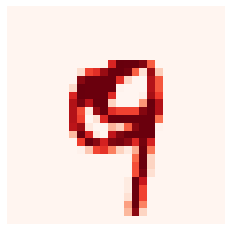

In [116]:
#MNIST
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

x_train = flatten_image(x_train)
x_test = flatten_image(x_test)


image_index = 4444
plt.imshow(x_test[image_index].reshape(28, 28), cmap='Reds')
plt.axis('off')

save_images(x_test, y_test, name='MNIST')

(10000, 784)
/Users/morarica/Developer/DRECdata/fashionmnist/thumbnails/
(10000, 784)


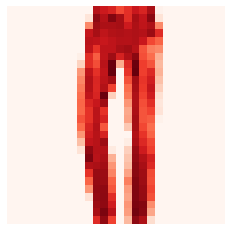

In [117]:
# load fashion MNIST
x_test = pd.read_csv('fashionmnist/original_files/fashion-mnist_test.csv')


y_test = x_test['label']
x_test = x_test.iloc[:,1:]
x_test = np.array(x_test)
print(x_test.shape)

image_index = 1
plt.imshow(x_test[image_index].reshape(28, 28), cmap='Reds')
plt.axis('off') 
save_images(x_test, y_test, name='fashionmnist')

In [17]:
## pets 
os.path.exists('pets/original_files/Egyptian_Mau_167.jpg')


folder = 'pets/original_files/'
# os.listdir(folder)
# for file in os.listdir(folder):
#     print(folder  +file)
#     os.rename(folder  + file, folder + file.split('.')[0] + '.png')


resize_all(folder, dim=[200,200])



american_pit_bull_terrier_172.png
pets/original_files/american_pit_bull_terrier_172.png
(300, 239, 3)
------
boxer_190.png
pets/original_files/boxer_190.png
(333, 500, 3)
------
Sphynx_8.png
pets/original_files/Sphynx_8.png
(410, 500, 3)
------
keeshond_37.png
pets/original_files/keeshond_37.png
(372, 500, 3)
------
Siamese_5.png
pets/original_files/Siamese_5.png
(275, 183, 3)
------
Bengal_99.png
pets/original_files/Bengal_99.png
(401, 500, 3)
------
boxer_184.png
pets/original_files/boxer_184.png
(291, 500, 3)
------
keeshond_23.png
pets/original_files/keeshond_23.png
(500, 375, 3)
------
american_pit_bull_terrier_99.png
pets/original_files/american_pit_bull_terrier_99.png
(379, 500, 3)
------
american_pit_bull_terrier_166.png
pets/original_files/american_pit_bull_terrier_166.png
(225, 300, 3)
------
boxer_36.png
pets/original_files/boxer_36.png
(500, 333, 3)
------
Ragdoll_176.png
pets/original_files/Ragdoll_176.png
(307, 500, 3)
------
leonberger_20.png
pets/original_files/leonberg

------
saint_bernard_96.png
pets/original_files/saint_bernard_96.png
(332, 500, 3)
------
english_cocker_spaniel_168.png
pets/original_files/english_cocker_spaniel_168.png
(375, 500, 3)
------
Persian_194.png
pets/original_files/Persian_194.png
(335, 500, 3)
------
scottish_terrier_30.png
pets/original_files/scottish_terrier_30.png
(500, 333, 3)
------
japanese_chin_145.png
pets/original_files/japanese_chin_145.png
(375, 500, 3)
------
Sphynx_31.png
pets/original_files/Sphynx_31.png
(375, 500, 3)
------
american_pit_bull_terrier_204.png
pets/original_files/american_pit_bull_terrier_204.png
(207, 300, 3)
------
Sphynx_25.png
pets/original_files/Sphynx_25.png
(500, 333, 3)
------
Persian_180.png
pets/original_files/Persian_180.png
(500, 334, 3)
------
yorkshire_terrier_128.png
pets/original_files/yorkshire_terrier_128.png
(225, 300, 3)
------
scottish_terrier_24.png
pets/original_files/scottish_terrier_24.png
(333, 500, 3)
------
newfoundland_88.png
pets/original_files/newfoundland_88.pn

(263, 500, 3)
------
american_bulldog_182.png
pets/original_files/american_bulldog_182.png
(375, 500, 3)
------
keeshond_150.png
pets/original_files/keeshond_150.png
(500, 375, 3)
------
american_bulldog_196.png
pets/original_files/american_bulldog_196.png
(323, 500, 3)
------
miniature_pinscher_162.png
pets/original_files/miniature_pinscher_162.png
(255, 300, 3)
------
samoyed_177.png
pets/original_files/samoyed_177.png
(334, 500, 3)
------
chihuahua_77.png
pets/original_files/chihuahua_77.png
(500, 333, 3)
------
keeshond_178.png
pets/original_files/keeshond_178.png
(400, 500, 3)
------
chihuahua_63.png
pets/original_files/chihuahua_63.png
(500, 375, 3)
------
chihuahua_62.png
pets/original_files/chihuahua_62.png
(500, 335, 3)
------
chihuahua_76.png
pets/original_files/chihuahua_76.png
(500, 368, 3)
------
Russian_Blue_1.png
pets/original_files/Russian_Blue_1.png
(239, 200, 3)
------
Abyssinian_1.png
pets/original_files/Abyssinian_1.png
(400, 600, 3)
------
keeshond_179.png
pets/ori

------
Sphynx_30.png
pets/original_files/Sphynx_30.png
(500, 375, 3)
------
japanese_chin_144.png
pets/original_files/japanese_chin_144.png
(375, 500, 3)
------
scottish_terrier_31.png
pets/original_files/scottish_terrier_31.png
(500, 333, 3)
------
Persian_195.png
pets/original_files/Persian_195.png
(500, 484, 3)
------
shiba_inu_42.png
pets/original_files/shiba_inu_42.png
(500, 334, 3)
------
wheaten_terrier_60.png
pets/original_files/wheaten_terrier_60.png
(375, 500, 3)
------
scottish_terrier_133.png
pets/original_files/scottish_terrier_133.png
(358, 500, 3)
------
saint_bernard_110.png
pets/original_files/saint_bernard_110.png
(334, 500, 3)
------
saint_bernard_104.png
pets/original_files/saint_bernard_104.png
(500, 412, 3)
------
pomeranian_188.png
pets/original_files/pomeranian_188.png
(225, 300, 3)
------
saint_bernard_3.png
pets/original_files/saint_bernard_3.png
(375, 500, 3)
------
scottish_terrier_127.png
pets/original_files/scottish_terrier_127.png
(500, 375, 3)
------
shi

pets/original_files/leonberger_23.png
(500, 450, 3)
------
Ragdoll_175.png
pets/original_files/Ragdoll_175.png
(333, 500, 3)
------
boxer_35.png
pets/original_files/boxer_35.png
(361, 500, 3)
------
american_pit_bull_terrier_59.png
pets/original_files/american_pit_bull_terrier_59.png
(500, 375, 3)
------
great_pyrenees_164.png
pets/original_files/great_pyrenees_164.png
(500, 375, 3)
------
boxer_144.png
pets/original_files/boxer_144.png
(375, 500, 3)
------
leonberger_120.png
pets/original_files/leonberger_120.png
(375, 500, 3)
------
Bengal_59.png
pets/original_files/Bengal_59.png
(375, 500, 3)
------
english_cocker_spaniel_12.png
pets/original_files/english_cocker_spaniel_12.png
(333, 500, 3)
------
havanese_138.png
pets/original_files/havanese_138.png
(339, 500, 3)
------
leonberger_134.png
pets/original_files/leonberger_134.png
(333, 500, 3)
------
great_pyrenees_170.png
pets/original_files/great_pyrenees_170.png
(375, 500, 3)
------
boxer_150.png
pets/original_files/boxer_150.png


------
Persian_197.png
pets/original_files/Persian_197.png
(333, 500, 3)
------
scottish_terrier_33.png
pets/original_files/scottish_terrier_33.png
(500, 434, 3)
------
japanese_chin_146.png
pets/original_files/japanese_chin_146.png
(375, 500, 3)
------
wheaten_terrier_122.png
pets/original_files/wheaten_terrier_122.png
(492, 500, 3)
------
Abyssinian_62.png
pets/original_files/Abyssinian_62.png
(335, 500, 3)
------
saint_bernard_95.png
pets/original_files/saint_bernard_95.png
(500, 332, 3)
------
Bombay_56.png
pets/original_files/Bombay_56.png
(375, 500, 3)
------
havanese_12.png
pets/original_files/havanese_12.png
(500, 357, 3)
------
american_bulldog_65.png
pets/original_files/american_bulldog_65.png
(333, 500, 3)
------
english_cocker_spaniel_143.png
pets/original_files/english_cocker_spaniel_143.png
(375, 500, 3)
------
Persian_89.png
pets/original_files/Persian_89.png
(333, 500, 3)
------
yorkshire_terrier_117.png
pets/original_files/yorkshire_terrier_117.png
(225, 300, 3)
------

(333, 500, 3)
------
Persian_8.png
pets/original_files/Persian_8.png
(332, 500, 3)
------
Egyptian_Mau_207.png
pets/original_files/Egyptian_Mau_207.png
(226, 300, 3)
------
chihuahua_49.png
pets/original_files/chihuahua_49.png
(396, 500, 3)
------
Egyptian_Mau_213.png
pets/original_files/Egyptian_Mau_213.png
(300, 225, 3)
------
Bombay_198.png
pets/original_files/Bombay_198.png
(225, 300, 3)
------
samoyed_175.png
pets/original_files/samoyed_175.png
(334, 500, 3)
------
miniature_pinscher_160.png
pets/original_files/miniature_pinscher_160.png
(225, 300, 3)
------
american_bulldog_194.png
pets/original_files/american_bulldog_194.png
(500, 461, 3)
------
Abyssinian_145.png
pets/original_files/Abyssinian_145.png
(577, 800, 3)
------
keeshond_152.png
pets/original_files/keeshond_152.png
(375, 500, 3)
------
japanese_chin_3.png
pets/original_files/japanese_chin_3.png
(350, 467, 3)
------
beagle_112.png
pets/original_files/beagle_112.png
(500, 333, 3)
------
staffordshire_bull_terrier_106.pn

------
shiba_inu_55.png
pets/original_files/shiba_inu_55.png
(375, 500, 3)
------
wheaten_terrier_77.png
pets/original_files/wheaten_terrier_77.png
(500, 333, 3)
------
english_setter_199.png
pets/original_files/english_setter_199.png
(451, 500, 3)
------
pug_78.png
pets/original_files/pug_78.png
(333, 500, 3)
------
saint_bernard_107.png
pets/original_files/saint_bernard_107.png
(332, 500, 3)
------
chihuahua_9.png
pets/original_files/chihuahua_9.png
(500, 500, 3)
------
shiba_inu_108.png
pets/original_files/shiba_inu_108.png
(500, 333, 3)
------
Siamese_79.png
pets/original_files/Siamese_79.png
(500, 402, 3)
------
basset_hound_138.png
pets/original_files/basset_hound_138.png
(500, 400, 3)
------
scottish_terrier_124.png
pets/original_files/scottish_terrier_124.png
(500, 375, 3)
------
scottish_terrier_130.png
pets/original_files/scottish_terrier_130.png
(375, 500, 3)
------
Birman_159.png
pets/original_files/Birman_159.png
(333, 500, 3)
------
saint_bernard_113.png
pets/original_fil

------
american_pit_bull_terrier_148.png
pets/original_files/american_pit_bull_terrier_148.png
(225, 300, 3)
------
pug_8.png
pets/original_files/pug_8.png
(375, 500, 3)
------
Ragdoll_170.png
pets/original_files/Ragdoll_170.png
(332, 500, 3)
------
leonberger_26.png
pets/original_files/leonberger_26.png
(334, 500, 3)
------
Ragdoll_158.png
pets/original_files/Ragdoll_158.png
(378, 500, 3)
------
boxer_182.png
pets/original_files/boxer_182.png
(435, 500, 3)
------
keeshond_25.png
pets/original_files/keeshond_25.png
(331, 500, 3)
------
boxer_18.png
pets/original_files/boxer_18.png
(333, 500, 3)
------
american_pit_bull_terrier_160.png
pets/original_files/american_pit_bull_terrier_160.png
(280, 300, 3)
------
american_pit_bull_terrier_174.png
pets/original_files/american_pit_bull_terrier_174.png
(300, 223, 3)
------
Maine_Coon_267.png
pets/original_files/Maine_Coon_267.png
(271, 310, 3)
------
boxer_196.png
pets/original_files/boxer_196.png
(363, 500, 3)
------
keeshond_31.png
pets/orig

------
scottish_terrier_22.png
pets/original_files/scottish_terrier_22.png
(500, 361, 3)
------
Persian_186.png
pets/original_files/Persian_186.png
(500, 375, 3)
------
japanese_chin_157.png
pets/original_files/japanese_chin_157.png
(375, 500, 3)
------
saint_bernard_84.png
pets/original_files/saint_bernard_84.png
(375, 500, 3)
------
Maine_Coon_105.png
pets/original_files/Maine_Coon_105.png
(333, 500, 3)
------
Abyssinian_73.png
pets/original_files/Abyssinian_73.png
(267, 400, 3)
------
wheaten_terrier_133.png
pets/original_files/wheaten_terrier_133.png
(375, 500, 3)
------
Birman_98.png
pets/original_files/Birman_98.png
(370, 290, 3)
------
american_bulldog_48.png
pets/original_files/american_bulldog_48.png
(376, 500, 3)
------
wheaten_terrier_127.png
pets/original_files/wheaten_terrier_127.png
(442, 500, 3)
------
saint_bernard_90.png
pets/original_files/saint_bernard_90.png
(375, 500, 3)
------
Maine_Coon_111.png
pets/original_files/Maine_Coon_111.png
(500, 299, 3)
------
Abyssinia

------
chihuahua_70.png
pets/original_files/chihuahua_70.png
(333, 500, 3)
------
samoyed_158.png
pets/original_files/samoyed_158.png
(333, 500, 3)
------
Abyssinian_7.png
pets/original_files/Abyssinian_7.png
(266, 250, 3)
------
Abyssinian_168.png
pets/original_files/Abyssinian_168.png
(272, 400, 3)
------
german_shorthaired_88.png
pets/original_files/german_shorthaired_88.png
(500, 401, 3)
------
miniature_pinscher_159.png
pets/original_files/miniature_pinscher_159.png
(225, 300, 3)
------
chihuahua_64.png
pets/original_files/chihuahua_64.png
(417, 400, 3)
------
Bengal_107.png
pets/original_files/Bengal_107.png
(335, 500, 3)
------
Sphynx_124.png
pets/original_files/Sphynx_124.png
(375, 500, 3)
------
keeshond_180.png
pets/original_files/keeshond_180.png
(500, 319, 3)
------
german_shorthaired_77.png
pets/original_files/german_shorthaired_77.png
(500, 468, 3)
------
Abyssinian_197.png
pets/original_files/Abyssinian_197.png
(300, 190, 3)
------
american_bulldog_146.png
pets/original_

pets/original_files/Siamese_54.png
(473, 500, 3)
------
shiba_inu_125.png
pets/original_files/shiba_inu_125.png
(332, 500, 3)
------
Birman_160.png
pets/original_files/Birman_160.png
(334, 500, 3)
------
leonberger_1.png
pets/original_files/leonberger_1.png
(500, 396, 3)
------
basset_hound_115.png
pets/original_files/basset_hound_115.png
(332, 500, 3)
------
scottish_terrier_109.png
pets/original_files/scottish_terrier_109.png
(375, 500, 3)
------
Siamese_194.png
pets/original_files/Siamese_194.png
(333, 500, 3)
------
Birman_148.png
pets/original_files/Birman_148.png
(320, 500, 3)
------
saint_bernard_102.png
pets/original_files/saint_bernard_102.png
(262, 500, 3)
------
saint_bernard_5.png
pets/original_files/saint_bernard_5.png
(375, 500, 3)
------
american_pit_bull_terrier_8.png
pets/original_files/american_pit_bull_terrier_8.png
(500, 333, 3)
------
scottish_terrier_121.png
pets/original_files/scottish_terrier_121.png
(500, 344, 3)
------
shiba_inu_50.png
pets/original_files/shib

------
american_pit_bull_terrier_88.png
pets/original_files/american_pit_bull_terrier_88.png
(500, 336, 3)
------
american_pit_bull_terrier_163.png
pets/original_files/american_pit_bull_terrier_163.png
(225, 300, 3)
------
boxer_181.png
pets/original_files/boxer_181.png
(333, 500, 3)
------
Maine_Coon_270.png
pets/original_files/Maine_Coon_270.png
(238, 212, 3)
------
keeshond_26.png
pets/original_files/keeshond_26.png
(500, 375, 3)
------
english_cocker_spaniel_28.png
pets/original_files/english_cocker_spaniel_28.png
(333, 500, 3)
------
samoyed_74.png
pets/original_files/samoyed_74.png
(375, 500, 3)
------
Bengal_77.png
pets/original_files/Bengal_77.png
(375, 500, 3)
------
havanese_102.png
pets/original_files/havanese_102.png
(404, 500, 3)
------
american_pit_bull_terrier_188.png
pets/original_files/american_pit_bull_terrier_188.png
(225, 300, 3)
------
British_Shorthair_213.png
pets/original_files/British_Shorthair_213.png
(375, 500, 3)
------
american_pit_bull_terrier_77.png
pets/

------
Bombay_87.png
pets/original_files/Bombay_87.png
(375, 500, 3)
------
great_pyrenees_31.png
pets/original_files/great_pyrenees_31.png
(336, 500, 3)
------
english_setter_36.png
pets/original_files/english_setter_36.png
(364, 500, 3)
------
chihuahua_166.png
pets/original_files/chihuahua_166.png
(225, 300, 3)
------
Birman_64.png
pets/original_files/Birman_64.png
(375, 500, 3)
------
Persian_58.png
pets/original_files/Persian_58.png
(333, 500, 3)
------
english_cocker_spaniel_192.png
pets/original_files/english_cocker_spaniel_192.png
(500, 375, 3)
------
english_cocker_spaniel_186.png
pets/original_files/english_cocker_spaniel_186.png
(500, 500, 3)
------
saint_bernard_78.png
pets/original_files/saint_bernard_78.png
(375, 500, 3)
------
Bombay_93.png
pets/original_files/Bombay_93.png
(300, 352, 3)
------
great_pyrenees_25.png
pets/original_files/great_pyrenees_25.png
(375, 500, 3)
------
english_setter_22.png
pets/original_files/english_setter_22.png
(500, 377, 3)
------
chihuahua

(500, 332, 3)
------
beagle_128.png
pets/original_files/beagle_128.png
(333, 500, 3)
------
keeshond_183.png
pets/original_files/keeshond_183.png
(500, 375, 3)
------
german_shorthaired_74.png
pets/original_files/german_shorthaired_74.png
(334, 500, 3)
------
yorkshire_terrier_30.png
pets/original_files/yorkshire_terrier_30.png
(361, 500, 3)
------
Bengal_104.png
pets/original_files/Bengal_104.png
(463, 500, 3)
------
Bombay_161.png
pets/original_files/Bombay_161.png
(375, 500, 3)
------
miniature_pinscher_76.png
pets/original_files/miniature_pinscher_76.png
(333, 500, 3)
------
beagle_25.png
pets/original_files/beagle_25.png
(375, 500, 3)
------
staffordshire_bull_terrier_15.png
pets/original_files/staffordshire_bull_terrier_15.png
(500, 469, 3)
------
staffordshire_bull_terrier_114.png
pets/original_files/staffordshire_bull_terrier_114.png
(375, 500, 3)
------
miniature_pinscher_199.png
pets/original_files/miniature_pinscher_199.png
(300, 217, 3)
------
beagle_100.png
pets/original_f

------
basset_hound_102.png
pets/original_files/basset_hound_102.png
(332, 500, 3)
------
Siamese_183.png
pets/original_files/Siamese_183.png
(346, 500, 3)
------
Birman_177.png
pets/original_files/Birman_177.png
(375, 500, 3)
------
shiba_inu_132.png
pets/original_files/shiba_inu_132.png
(500, 334, 3)
------
Siamese_43.png
pets/original_files/Siamese_43.png
(375, 500, 3)
------
Abyssinian_221.png
pets/original_files/Abyssinian_221.png
(248, 300, 3)
------
scottish_terrier_136.png
pets/original_files/scottish_terrier_136.png
(500, 413, 3)
------
saint_bernard_115.png
pets/original_files/saint_bernard_115.png
(330, 500, 3)
------
pomeranian_199.png
pets/original_files/pomeranian_199.png
(300, 278, 3)
------
shiba_inu_47.png
pets/original_files/shiba_inu_47.png
(282, 500, 3)
------
wheaten_terrier_65.png
pets/original_files/wheaten_terrier_65.png
(333, 500, 3)
------
shiba_inu_53.png
pets/original_files/shiba_inu_53.png
(333, 500, 3)
------
wheaten_terrier_71.png
pets/original_files/whea

(375, 500, 3)
------
japanese_chin_71.png
pets/original_files/japanese_chin_71.png
(500, 337, 3)
------
pug_202.png
pets/original_files/pug_202.png
(300, 197, 3)
------
shiba_inu_3.png
pets/original_files/shiba_inu_3.png
(500, 333, 3)
------
Persian_256.png
pets/original_files/Persian_256.png
(234, 295, 3)
------
newfoundland_7.png
pets/original_files/newfoundland_7.png
(500, 333, 3)
------
american_pit_bull_terrier_39.png
pets/original_files/american_pit_bull_terrier_39.png
(379, 500, 3)
------
japanese_chin_65.png
pets/original_files/japanese_chin_65.png
(375, 500, 3)
------
english_cocker_spaniel_66.png
pets/original_files/english_cocker_spaniel_66.png
(500, 396, 3)
------
leonberger_140.png
pets/original_files/leonberger_140.png
(375, 500, 3)
------
Bengal_39.png
pets/original_files/Bengal_39.png
(324, 500, 3)
------
great_pyrenees_104.png
pets/original_files/great_pyrenees_104.png
(396, 500, 3)
------
keeshond_83.png
pets/original_files/keeshond_83.png
(375, 500, 3)
------
boxer_1

(500, 375, 3)
------
basset_hound_34.png
pets/original_files/basset_hound_34.png
(500, 375, 3)
------
pug_174.png
pets/original_files/pug_174.png
(225, 300, 3)
------
Persian_134.png
pets/original_files/Persian_134.png
(375, 500, 3)
------
scottish_terrier_90.png
pets/original_files/scottish_terrier_90.png
(500, 499, 3)
------
Russian_Blue_59.png
pets/original_files/Russian_Blue_59.png
(333, 500, 3)
------
Russian_Blue_152.png
pets/original_files/Russian_Blue_152.png
(333, 500, 3)
------
Sphynx_91.png
pets/original_files/Sphynx_91.png
(334, 500, 3)
------
wheaten_terrier_181.png
pets/original_files/wheaten_terrier_181.png
(330, 500, 3)
------
havanese_99.png
pets/original_files/havanese_99.png
(325, 500, 3)
------
saint_bernard_36.png
pets/original_files/saint_bernard_36.png
(333, 500, 3)
------
Persian_16.png
pets/original_files/Persian_16.png
(500, 375, 3)
------
saint_bernard_22.png
pets/original_files/saint_bernard_22.png
(333, 500, 3)
------
wheaten_terrier_195.png
pets/original_f

(332, 500, 3)
------
Siamese_250.png
pets/original_files/Siamese_250.png
(266, 200, 3)
------
miniature_pinscher_38.png
pets/original_files/miniature_pinscher_38.png
(333, 500, 3)
------
Bengal_162.png
pets/original_files/Bengal_162.png
(225, 300, 3)
------
great_pyrenees_42.png
pets/original_files/great_pyrenees_42.png
(382, 500, 3)
------
english_setter_45.png
pets/original_files/english_setter_45.png
(334, 500, 3)
------
chihuahua_115.png
pets/original_files/chihuahua_115.png
(279, 300, 3)
------
Birman_17.png
pets/original_files/Birman_17.png
(500, 359, 3)
------
Russian_Blue_70.png
pets/original_files/Russian_Blue_70.png
(500, 333, 3)
------
Ragdoll_47.png
pets/original_files/Ragdoll_47.png
(335, 500, 3)
------
British_Shorthair_116.png
pets/original_files/British_Shorthair_116.png
(500, 500, 3)
------
newfoundland_15.png
pets/original_files/newfoundland_15.png
(333, 500, 3)
------
Ragdoll_53.png
pets/original_files/Ragdoll_53.png
(500, 500, 3)
------
pug_149.png
pets/original_fil

------
scottish_terrier_187.png
pets/original_files/scottish_terrier_187.png
(500, 333, 3)
------
Egyptian_Mau_69.png
pets/original_files/Egyptian_Mau_69.png
(500, 335, 3)
------
beagle_204.png
pets/original_files/beagle_204.png
(309, 500, 3)
------
newfoundland_155.png
pets/original_files/newfoundland_155.png
(333, 500, 3)
------
pomeranian_100.png
pets/original_files/pomeranian_100.png
(375, 500, 3)
------
shiba_inu_183.png
pets/original_files/shiba_inu_183.png
(460, 500, 3)
------
Sphynx_223.png
pets/original_files/Sphynx_223.png
(216, 288, 3)
------
Egyptian_Mau_41.png
pets/original_files/Egyptian_Mau_41.png
(224, 300, 3)
------
german_shorthaired_153.png
pets/original_files/german_shorthaired_153.png
(500, 333, 3)
------
samoyed_9.png
pets/original_files/samoyed_9.png
(500, 375, 3)
------
english_setter_112.png
pets/original_files/english_setter_112.png
(500, 335, 3)
------
Bengal_200.png
pets/original_files/Bengal_200.png
(616, 640, 3)
------
english_setter_106.png
pets/original_

(375, 500, 3)
------
pomeranian_116.png
pets/original_files/pomeranian_116.png
(300, 225, 3)
------
Egyptian_Mau_57.png
pets/original_files/Egyptian_Mau_57.png
(445, 500, 3)
------
Sphynx_235.png
pets/original_files/Sphynx_235.png
(600, 450, 3)
------
german_shorthaired_145.png
pets/original_files/german_shorthaired_145.png
(500, 335, 3)
------
British_Shorthair_58.png
pets/original_files/British_Shorthair_58.png
(500, 375, 3)
------
english_setter_104.png
pets/original_files/english_setter_104.png
(500, 409, 3)
------
British_Shorthair_70.png
pets/original_files/British_Shorthair_70.png
(334, 500, 3)
------
scottish_terrier_191.png
pets/original_files/scottish_terrier_191.png
(375, 500, 3)
------
basset_hound_199.png
pets/original_files/basset_hound_199.png
(332, 500, 3)
------
scottish_terrier_185.png
pets/original_files/scottish_terrier_185.png
(433, 500, 3)
------
pomeranian_11.png
pets/original_files/pomeranian_11.png
(332, 500, 3)
------
english_setter_138.png
pets/original_files

(400, 500, 3)
------
Russian_Blue_66.png
pets/original_files/Russian_Blue_66.png
(500, 375, 3)
------
British_Shorthair_100.png
pets/original_files/British_Shorthair_100.png
(332, 500, 3)
------
Ragdoll_51.png
pets/original_files/Ragdoll_51.png
(500, 333, 3)
------
yorkshire_terrier_40.png
pets/original_files/yorkshire_terrier_40.png
(375, 500, 3)
------
american_bulldog_135.png
pets/original_files/american_bulldog_135.png
(334, 500, 3)
------
beagle_158.png
pets/original_files/beagle_158.png
(375, 500, 3)
------
Sphynx_157.png
pets/original_files/Sphynx_157.png
(354, 500, 3)
------
Bengal_174.png
pets/original_files/Bengal_174.png
(300, 271, 3)
------
Bombay_139.png
pets/original_files/Bombay_139.png
(297, 450, 3)
------
beagle_69.png
pets/original_files/beagle_69.png
(249, 500, 3)
------
Bengal_160.png
pets/original_files/Bengal_160.png
(300, 296, 3)
------
staffordshire_bull_terrier_59.png
pets/original_files/staffordshire_bull_terrier_59.png
(334, 500, 3)
------
staffordshire_bull_

------
pug_176.png
pets/original_files/pug_176.png
(227, 300, 3)
------
scottish_terrier_86.png
pets/original_files/scottish_terrier_86.png
(500, 333, 3)
------
Ragdoll_78.png
pets/original_files/Ragdoll_78.png
(500, 382, 3)
------
Persian_122.png
pets/original_files/Persian_122.png
(480, 320, 3)
------
pug_162.png
pets/original_files/pug_162.png
(225, 300, 3)
------
British_Shorthair_129.png
pets/original_files/British_Shorthair_129.png
(500, 375, 3)
------
Sphynx_87.png
pets/original_files/Sphynx_87.png
(500, 500, 3)
------
Russian_Blue_144.png
pets/original_files/Russian_Blue_144.png
(500, 374, 3)
------
Birman_28.png
pets/original_files/Birman_28.png
(375, 500, 3)
------
wheaten_terrier_197.png
pets/original_files/wheaten_terrier_197.png
(330, 500, 3)
------
saint_bernard_20.png
pets/original_files/saint_bernard_20.png
(375, 500, 3)
------
Persian_14.png
pets/original_files/Persian_14.png
(500, 375, 3)
------
english_cocker_spaniel_135.png
pets/original_files/english_cocker_spaniel

------
english_cocker_spaniel_58.png
pets/original_files/english_cocker_spaniel_58.png
(333, 500, 3)
------
leonberger_96.png
pets/original_files/leonberger_96.png
(375, 500, 3)
------
Maine_Coon_71.png
pets/original_files/Maine_Coon_71.png
(333, 500, 3)
------
Persian_268.png
pets/original_files/Persian_268.png
(235, 350, 3)
------
Bengal_9.png
pets/original_files/Bengal_9.png
(333, 500, 3)
------
boxer_80.png
pets/original_files/boxer_80.png
(500, 379, 3)
------
British_Shorthair_263.png
pets/original_files/British_Shorthair_263.png
(300, 225, 3)
------
shiba_inu_1.png
pets/original_files/shiba_inu_1.png
(375, 500, 3)
------
pug_200.png
pets/original_files/pug_200.png
(225, 300, 3)
------
Russian_Blue_226.png
pets/original_files/Russian_Blue_226.png
(300, 300, 3)
------
japanese_chin_73.png
pets/original_files/japanese_chin_73.png
(375, 500, 3)
------
leonberger_156.png
pets/original_files/leonberger_156.png
(500, 363, 3)
------
english_cocker_spaniel_70.png
pets/original_files/engli

(200, 200, 3)
------
pomeranian_28.png
pets/original_files/pomeranian_28.png
(500, 333, 3)
------
scottish_terrier_157.png
pets/original_files/scottish_terrier_157.png
(375, 500, 3)
------
saint_bernard_174.png
pets/original_files/saint_bernard_174.png
(333, 500, 3)
------
shiba_inu_26.png
pets/original_files/shiba_inu_26.png
(500, 333, 3)
------
wheaten_terrier_10.png
pets/original_files/wheaten_terrier_10.png
(500, 339, 3)
------
shiba_inu_32.png
pets/original_files/shiba_inu_32.png
(500, 375, 3)
------
saint_bernard_160.png
pets/original_files/saint_bernard_160.png
(500, 375, 3)
------
scottish_terrier_143.png
pets/original_files/scottish_terrier_143.png
(442, 463, 3)
------
newfoundland_191.png
pets/original_files/newfoundland_191.png
(500, 500, 3)
------
shiba_inu_147.png
pets/original_files/shiba_inu_147.png
(500, 375, 3)
------
Siamese_36.png
pets/original_files/Siamese_36.png
(333, 500, 3)
------
Birman_102.png
pets/original_files/Birman_102.png
(500, 332, 3)
------
saint_berna

(335, 500, 3)
------
american_bulldog_118.png
pets/original_files/american_bulldog_118.png
(500, 375, 3)
------
german_shorthaired_29.png
pets/original_files/german_shorthaired_29.png
(500, 409, 3)
------
beagle_175.png
pets/original_files/beagle_175.png
(375, 500, 3)
------
staffordshire_bull_terrier_60.png
pets/original_files/staffordshire_bull_terrier_60.png
(333, 500, 3)
------
Bengal_159.png
pets/original_files/Bengal_159.png
(225, 300, 3)
------
beagle_50.png
pets/original_files/beagle_50.png
(335, 500, 3)
------
Bombay_114.png
pets/original_files/Bombay_114.png
(330, 500, 3)
------
staffordshire_bull_terrier_48.png
pets/original_files/staffordshire_bull_terrier_48.png
(334, 500, 3)
------
staffordshire_bull_terrier_149.png
pets/original_files/staffordshire_bull_terrier_149.png
(375, 500, 3)
------
beagle_78.png
pets/original_files/beagle_78.png
(334, 500, 3)
------
Bengal_171.png
pets/original_files/Bengal_171.png
(225, 300, 3)
------
yorkshire_terrier_45.png
pets/original_files

(500, 361, 3)
------
great_pyrenees_44.png
pets/original_files/great_pyrenees_44.png
(336, 500, 3)
------
Russian_Blue_76.png
pets/original_files/Russian_Blue_76.png
(375, 500, 3)
------
Ragdoll_41.png
pets/original_files/Ragdoll_41.png
(472, 500, 3)
------
newfoundland_13.png
pets/original_files/newfoundland_13.png
(500, 333, 3)
------
British_Shorthair_110.png
pets/original_files/British_Shorthair_110.png
(333, 500, 3)
------
japanese_chin_121.png
pets/original_files/japanese_chin_121.png
(334, 500, 3)
------
scottish_terrier_54.png
pets/original_files/scottish_terrier_54.png
(332, 500, 3)
------
yorkshire_terrier_158.png
pets/original_files/yorkshire_terrier_158.png
(225, 300, 3)
------
Russian_Blue_196.png
pets/original_files/Russian_Blue_196.png
(500, 334, 3)
------
Sphynx_55.png
pets/original_files/Sphynx_55.png
(500, 333, 3)
------
wheaten_terrier_145.png
pets/original_files/wheaten_terrier_145.png
(375, 500, 3)
------
Bombay_19.png
pets/original_files/Bombay_19.png
(315, 420, 3

(333, 500, 3)
------
Maine_Coon_48.png
pets/original_files/Maine_Coon_48.png
(349, 500, 3)
------
keeshond_84.png
pets/original_files/keeshond_84.png
(375, 500, 3)
------
great_pyrenees_103.png
pets/original_files/great_pyrenees_103.png
(375, 500, 3)
------
leonberger_147.png
pets/original_files/leonberger_147.png
(333, 500, 3)
------
english_cocker_spaniel_61.png
pets/original_files/english_cocker_spaniel_61.png
(500, 333, 3)
------
Maine_Coon_60.png
pets/original_files/Maine_Coon_60.png
(375, 500, 3)
------
havanese_163.png
pets/original_files/havanese_163.png
(500, 432, 3)
------
samoyed_15.png
pets/original_files/samoyed_15.png
(500, 377, 3)
------
Bengal_16.png
pets/original_files/Bengal_16.png
(333, 500, 3)
------
leonberger_87.png
pets/original_files/leonberger_87.png
(375, 500, 3)
------
english_cocker_spaniel_49.png
pets/original_files/english_cocker_spaniel_49.png
(333, 500, 3)
------
boxer_91.png
pets/original_files/boxer_91.png
(500, 375, 3)
------
american_pit_bull_terrier

(334, 500, 3)
------
shiba_inu_31.png
pets/original_files/shiba_inu_31.png
(500, 500, 3)
------
Egyptian_Mau_129.png
pets/original_files/Egyptian_Mau_129.png
(325, 299)
------
shiba_inu_25.png
pets/original_files/shiba_inu_25.png
(333, 500, 3)
------
scottish_terrier_154.png
pets/original_files/scottish_terrier_154.png
(500, 429, 3)
------
basset_hound_148.png
pets/original_files/basset_hound_148.png
(380, 500, 3)
------
shiba_inu_178.png
pets/original_files/shiba_inu_178.png
(333, 500, 3)
------
saint_bernard_177.png
pets/original_files/saint_bernard_177.png
(375, 500, 3)
------
Egyptian_Mau_92.png
pets/original_files/Egyptian_Mau_92.png
(367, 280, 3)
------
german_shorthaired_2.png
pets/original_files/german_shorthaired_2.png
(374, 500, 3)
------
basset_hound_160.png
pets/original_files/basset_hound_160.png
(333, 500, 3)
------
newfoundland_186.png
pets/original_files/newfoundland_186.png
(500, 500, 3)
------
Birman_115.png
pets/original_files/Birman_115.png
(358, 500, 3)
------
Siam

------
american_bulldog_133.png
pets/original_files/american_bulldog_133.png
(334, 500, 3)
------
Sphynx_151.png
pets/original_files/Sphynx_151.png
(388, 500, 3)
------
Siamese_240.png
pets/original_files/Siamese_240.png
(225, 300, 3)
------
Bengal_172.png
pets/original_files/Bengal_172.png
(269, 300, 3)
------
miniature_pinscher_28.png
pets/original_files/miniature_pinscher_28.png
(386, 500, 3)
------
chihuahua_11.png
pets/original_files/chihuahua_11.png
(500, 500, 3)
------
British_Shorthair_9.png
pets/original_files/British_Shorthair_9.png
(224, 298, 3)
------
beagle_90.png
pets/original_files/beagle_90.png
(500, 335, 3)
------
Bengal_199.png
pets/original_files/Bengal_199.png
(204, 247, 3)
------
samoyed_139.png
pets/original_files/samoyed_139.png
(455, 500, 3)
------
Abyssinian_109.png
pets/original_files/Abyssinian_109.png
(450, 282, 3)
------
miniature_pinscher_138.png
pets/original_files/miniature_pinscher_138.png
(201, 300, 3)
------
beagle_84.png
pets/original_files/beagle_84

(332, 500, 3)
------
Ragdoll_81.png
pets/original_files/Ragdoll_81.png
(500, 375, 3)
------
yorkshire_terrier_173.png
pets/original_files/yorkshire_terrier_173.png
(375, 500, 3)
------
havanese_76.png
pets/original_files/havanese_76.png
(465, 500, 3)
------
Bombay_32.png
pets/original_files/Bombay_32.png
(282, 300, 3)
------
great_pyrenees_84.png
pets/original_files/great_pyrenees_84.png
(375, 500, 3)
------
english_setter_83.png
pets/original_files/english_setter_83.png
(334, 500, 3)
------
english_cocker_spaniel_127.png
pets/original_files/english_cocker_spaniel_127.png
(375, 500, 3)
------
Maine_Coon_158.png
pets/original_files/Maine_Coon_158.png
(333, 500, 3)
------
english_cocker_spaniel_133.png
pets/original_files/english_cocker_spaniel_133.png
(500, 357, 3)
------
havanese_62.png
pets/original_files/havanese_62.png
(375, 500, 3)
------
Bombay_26.png
pets/original_files/Bombay_26.png
(375, 500, 3)
------
american_bulldog_15.png
pets/original_files/american_bulldog_15.png
(500, 33

------
american_pit_bull_terrier_129.png
pets/original_files/american_pit_bull_terrier_129.png
(300, 214, 3)
------
Ragdoll_111.png
pets/original_files/Ragdoll_111.png
(500, 332, 3)
------
leonberger_47.png
pets/original_files/leonberger_47.png
(333, 500, 3)
------
english_cocker_spaniel_89.png
pets/original_files/english_cocker_spaniel_89.png
(500, 334, 3)
------
keeshond_75.png
pets/original_files/keeshond_75.png
(320, 480, 3)
------
english_cocker_spaniel_90.png
pets/original_files/english_cocker_spaniel_90.png
(500, 375, 3)
------
american_pit_bull_terrier_130.png
pets/original_files/american_pit_bull_terrier_130.png
(300, 237, 3)
------
japanese_chin_93.png
pets/original_files/japanese_chin_93.png
(375, 500, 3)
------
boxer_48.png
pets/original_files/boxer_48.png
(500, 375, 3)
------
american_pit_bull_terrier_124.png
pets/original_files/american_pit_bull_terrier_124.png
(300, 225, 3)
------
japanese_chin_87.png
pets/original_files/japanese_chin_87.png
(373, 500, 3)
------
english_

------
wheaten_terrier_177.png
pets/original_files/wheaten_terrier_177.png
(330, 500, 3)
------
american_bulldog_18.png
pets/original_files/american_bulldog_18.png
(374, 500, 3)
------
wheaten_terrier_3.png
pets/original_files/wheaten_terrier_3.png
(313, 500, 3)
------
Sphynx_67.png
pets/original_files/Sphynx_67.png
(332, 500, 3)
------
Ragdoll_98.png
pets/original_files/Ragdoll_98.png
(500, 333, 3)
------
scottish_terrier_66.png
pets/original_files/scottish_terrier_66.png
(333, 500, 3)
------
basset_hound_29.png
pets/original_files/basset_hound_29.png
(356, 500, 3)
------
japanese_chin_113.png
pets/original_files/japanese_chin_113.png
(225, 255, 3)
------
pug_182.png
pets/original_files/pug_182.png
(300, 176, 3)
------
Russian_Blue_87.png
pets/original_files/Russian_Blue_87.png
(500, 417, 3)
------
Bombay_8.png
pets/original_files/Bombay_8.png
(246, 500, 3)
------
yorkshire_terrier_142.png
pets/original_files/yorkshire_terrier_142.png
(225, 300, 3)
------
Egyptian_Mau_7.png
pets/origi

(225, 297, 3)
------
beagle_62.png
pets/original_files/beagle_62.png
(334, 500, 3)
------
miniature_pinscher_31.png
pets/original_files/miniature_pinscher_31.png
(336, 500, 3)
------
staffordshire_bull_terrier_52.png
pets/original_files/staffordshire_bull_terrier_52.png
(333, 500, 3)
------
english_cocker_spaniel_6.png
pets/original_files/english_cocker_spaniel_6.png
(500, 377, 3)
------
Sphynx_148.png
pets/original_files/Sphynx_148.png
(281, 500, 3)
------
keeshond_8.png
pets/original_files/keeshond_8.png
(480, 320, 3)
------
beagle_147.png
pets/original_files/beagle_147.png
(335, 500, 3)
------
beagle_153.png
pets/original_files/beagle_153.png
(378, 500, 3)
------
staffordshire_bull_terrier_147.png
pets/original_files/staffordshire_bull_terrier_147.png
(333, 500, 3)
------
staffordshire_bull_terrier_46.png
pets/original_files/staffordshire_bull_terrier_46.png
(334, 500, 3)
------
Bombay_132.png
pets/original_files/Bombay_132.png
(450, 600, 3)
------
miniature_pinscher_25.png
pets/ori

------
pomeranian_109.png
pets/original_files/pomeranian_109.png
(332, 500, 3)
------
great_pyrenees_7.png
pets/original_files/great_pyrenees_7.png
(375, 500, 3)
------
saint_bernard_185.png
pets/original_files/saint_bernard_185.png
(500, 333, 3)
------
Sphynx_202.png
pets/original_files/Sphynx_202.png
(332, 500, 3)
------
Siamese_113.png
pets/original_files/Siamese_113.png
(375, 500, 3)
------
Egyptian_Mau_60.png
pets/original_files/Egyptian_Mau_60.png
(298, 400, 3)
------
basset_hound_192.png
pets/original_files/basset_hound_192.png
(322, 500, 3)
------
newfoundland_174.png
pets/original_files/newfoundland_174.png
(375, 500, 3)
------
pomeranian_121.png
pets/original_files/pomeranian_121.png
(300, 289, 3)
------
english_setter_133.png
pets/original_files/english_setter_133.png
(375, 500, 3)
------
german_shorthaired_172.png
pets/original_files/german_shorthaired_172.png
(375, 500, 3)
------
german_shorthaired_166.png
pets/original_files/german_shorthaired_166.png
(333, 500, 3)
------

(500, 500, 3)
------
samoyed_24.png
pets/original_files/samoyed_24.png
(375, 500, 3)
------
Maine_Coon_51.png
pets/original_files/Maine_Coon_51.png
(500, 332, 3)
------
shiba_inu_9.png
pets/original_files/shiba_inu_9.png
(465, 500, 3)
------
american_pit_bull_terrier_27.png
pets/original_files/american_pit_bull_terrier_27.png
(357, 500, 3)
------
american_pit_bull_terrier_33.png
pets/original_files/american_pit_bull_terrier_33.png
(375, 500, 3)
------
keeshond_89.png
pets/original_files/keeshond_89.png
(333, 500, 3)
------
havanese_146.png
pets/original_files/havanese_146.png
(379, 500, 3)
------
samoyed_30.png
pets/original_files/samoyed_30.png
(500, 333, 3)
------
Bengal_33.png
pets/original_files/Bengal_33.png
(400, 500, 3)
------
german_shorthaired_170.png
pets/original_files/german_shorthaired_170.png
(371, 500, 3)
------
english_setter_131.png
pets/original_files/english_setter_131.png
(500, 375, 3)
------
newfoundland_176.png
pets/original_files/newfoundland_176.png
(333, 500, 3

(500, 494, 3)
------
Sphynx_176.png
pets/original_files/Sphynx_176.png
(500, 330, 3)
------
yorkshire_terrier_61.png
pets/original_files/yorkshire_terrier_61.png
(375, 500, 3)
------
american_bulldog_114.png
pets/original_files/american_bulldog_114.png
(375, 500, 3)
------
german_shorthaired_25.png
pets/original_files/german_shorthaired_25.png
(500, 375, 3)
------
newfoundland_200.png
pets/original_files/newfoundland_200.png
(333, 500, 3)
------
Bengal_155.png
pets/original_files/Bengal_155.png
(300, 225, 3)
------
Bombay_118.png
pets/original_files/Bombay_118.png
(157, 300, 3)
------
staffordshire_bull_terrier_78.png
pets/original_files/staffordshire_bull_terrier_78.png
(375, 500, 3)
------
staffordshire_bull_terrier_179.png
pets/original_files/staffordshire_bull_terrier_179.png
(333, 500, 3)
------
beagle_48.png
pets/original_files/beagle_48.png
(365, 500, 3)
------
Bengal_141.png
pets/original_files/Bengal_141.png
(263, 300, 3)
------
american_bulldog_100.png
pets/original_files/ame

(332, 500, 3)
------
chihuahua_137.png
pets/original_files/chihuahua_137.png
(300, 205, 3)
------
havanese_92.png
pets/original_files/havanese_92.png
(500, 500, 3)
------
great_pyrenees_48.png
pets/original_files/great_pyrenees_48.png
(500, 404, 3)
------
saint_bernard_15.png
pets/original_files/saint_bernard_15.png
(375, 500, 3)
------
Maine_Coon_194.png
pets/original_files/Maine_Coon_194.png
(500, 375, 3)
------
Persian_21.png
pets/original_files/Persian_21.png
(500, 498, 3)
------
Persian_117.png
pets/original_files/Persian_117.png
(375, 500, 3)
------
pug_157.png
pets/original_files/pug_157.png
(267, 300, 3)
------
Russian_Blue_171.png
pets/original_files/Russian_Blue_171.png
(333, 500, 3)
------
Russian_Blue_165.png
pets/original_files/Russian_Blue_165.png
(375, 500, 3)
------
Persian_103.png
pets/original_files/Persian_103.png
(375, 500, 3)
------
Ragdoll_59.png
pets/original_files/Ragdoll_59.png
(333, 500, 3)
------
pug_143.png
pets/original_files/pug_143.png
(225, 300, 3)
-----

(375, 500, 3)
------
boxer_113.png
pets/original_files/boxer_113.png
(500, 332, 3)
------
great_pyrenees_133.png
pets/original_files/great_pyrenees_133.png
(333, 500, 3)
------
leonberger_177.png
pets/original_files/leonberger_177.png
(375, 500, 3)
------
english_cocker_spaniel_51.png
pets/original_files/english_cocker_spaniel_51.png
(334, 500, 3)
------
samoyed_19.png
pets/original_files/samoyed_19.png
(375, 500, 3)
------
leonberger_163.png
pets/original_files/leonberger_163.png
(500, 333, 3)
------
english_cocker_spaniel_45.png
pets/original_files/english_cocker_spaniel_45.png
(500, 333, 3)
------
boxer_107.png
pets/original_files/boxer_107.png
(500, 417, 3)
------
great_pyrenees_127.png
pets/original_files/great_pyrenees_127.png
(375, 500, 3)
------
japanese_chin_46.png
pets/original_files/japanese_chin_46.png
(466, 500, 3)
------
boxer_76.png
pets/original_files/boxer_76.png
(500, 438, 3)
------
Maine_Coon_87.png
pets/original_files/Maine_Coon_87.png
(332, 500, 3)
------
leonberge

------
newfoundland_198.png
pets/original_files/newfoundland_198.png
(500, 500, 3)
------
saint_bernard_141.png
pets/original_files/saint_bernard_141.png
(375, 500, 3)
------
basset_hound_156.png
pets/original_files/basset_hound_156.png
(333, 500, 3)
------
shiba_inu_166.png
pets/original_files/shiba_inu_166.png
(375, 500, 3)
------
Siamese_17.png
pets/original_files/Siamese_17.png
(500, 500, 3)
------
saint_bernard_169.png
pets/original_files/saint_bernard_169.png
(388, 500, 3)
------
Birman_123.png
pets/original_files/Birman_123.png
(333, 500, 3)
------
pug_16.png
pets/original_files/pug_16.png
(375, 500, 3)
------
Egyptian_Mau_123.png
pets/original_files/Egyptian_Mau_123.png
(398, 400, 3)
------
wheaten_terrier_19.png
pets/original_files/wheaten_terrier_19.png
(333, 500, 3)
------
shiba_inu_172.png
pets/original_files/shiba_inu_172.png
(365, 500, 3)
------
Birman_137.png
pets/original_files/Birman_137.png
(333, 500, 3)
------
basset_hound_142.png
pets/original_files/basset_hound_142

------
miniature_pinscher_132.png
pets/original_files/miniature_pinscher_132.png
(200, 300, 3)
------
Abyssinian_117.png
pets/original_files/Abyssinian_117.png
(401, 500, 3)
------
keeshond_100.png
pets/original_files/keeshond_100.png
(500, 369, 3)
------
shiba_inu_204.png
pets/original_files/shiba_inu_204.png
(334, 500, 3)
------
Bengal_187.png
pets/original_files/Bengal_187.png
(258, 387, 3)
------
samoyed_127.png
pets/original_files/samoyed_127.png
(374, 500, 3)
------
shiba_inu_205.png
pets/original_files/shiba_inu_205.png
(334, 500, 3)
------
keeshond_101.png
pets/original_files/keeshond_101.png
(500, 375, 3)
------
Abyssinian_116.png
pets/original_files/Abyssinian_116.png
(500, 333, 3)
------
miniature_pinscher_133.png
pets/original_files/miniature_pinscher_133.png
(225, 300, 3)
------
samoyed_126.png
pets/original_files/samoyed_126.png
(333, 500, 3)
------
Bengal_186.png
pets/original_files/Bengal_186.png
(300, 470, 3)
------
Bengal_192.png
pets/original_files/Bengal_192.png
(23

------
basset_hound_12.png
pets/original_files/basset_hound_12.png
(500, 375, 3)
------
japanese_chin_128.png
pets/original_files/japanese_chin_128.png
(500, 375, 3)
------
yorkshire_terrier_151.png
pets/original_files/yorkshire_terrier_151.png
(225, 300, 3)
------
Egyptian_Mau_136.png
pets/original_files/Egyptian_Mau_136.png
(280, 246, 3)
------
basset_hound_143.png
pets/original_files/basset_hound_143.png
(333, 500, 3)
------
Birman_136.png
pets/original_files/Birman_136.png
(379, 500, 3)
------
shiba_inu_173.png
pets/original_files/shiba_inu_173.png
(375, 500, 3)
------
saint_bernard_168.png
pets/original_files/saint_bernard_168.png
(500, 375, 3)
------
Birman_122.png
pets/original_files/Birman_122.png
(334, 500, 3)
------
basset_hound_157.png
pets/original_files/basset_hound_157.png
(500, 333, 3)
------
wheaten_terrier_18.png
pets/original_files/wheaten_terrier_18.png
(500, 332, 3)
------
Egyptian_Mau_122.png
pets/original_files/Egyptian_Mau_122.png
(112, 150, 3)
------
pug_17.png


------
keeshond_64.png
pets/original_files/keeshond_64.png
(331, 500, 3)
------
boxer_59.png
pets/original_files/boxer_59.png
(500, 333, 3)
------
american_pit_bull_terrier_121.png
pets/original_files/american_pit_bull_terrier_121.png
(300, 299, 3)
------
japanese_chin_82.png
pets/original_files/japanese_chin_82.png
(332, 500, 3)
------
japanese_chin_69.png
pets/original_files/japanese_chin_69.png
(500, 375, 3)
------
american_pit_bull_terrier_35.png
pets/original_files/american_pit_bull_terrier_35.png
(379, 500, 3)
------
great_pyrenees_108.png
pets/original_files/great_pyrenees_108.png
(475, 500, 3)
------
Maine_Coon_43.png
pets/original_files/Maine_Coon_43.png
(500, 500, 3)
------
boxer_128.png
pets/original_files/boxer_128.png
(333, 500, 3)
------
samoyed_36.png
pets/original_files/samoyed_36.png
(500, 375, 3)
------
Bengal_35.png
pets/original_files/Bengal_35.png
(375, 500, 3)
------
havanese_140.png
pets/original_files/havanese_140.png
(362, 500, 3)
------
Bengal_21.png
pets/orig

(1200, 1600, 3)
------
great_pyrenees_98.png
pets/original_files/great_pyrenees_98.png
(500, 404, 3)
------
wheaten_terrier_6.png
pets/original_files/wheaten_terrier_6.png
(333, 500, 3)
------
wheaten_terrier_172.png
pets/original_files/wheaten_terrier_172.png
(500, 330, 3)
------
wheaten_terrier_199.png
pets/original_files/wheaten_terrier_199.png
(332, 500, 3)
------
havanese_81.png
pets/original_files/havanese_81.png
(500, 333, 3)
------
english_setter_74.png
pets/original_files/english_setter_74.png
(334, 500, 3)
------
great_pyrenees_73.png
pets/original_files/great_pyrenees_73.png
(375, 500, 3)
------
Birman_26.png
pets/original_files/Birman_26.png
(500, 334, 3)
------
chihuahua_124.png
pets/original_files/chihuahua_124.png
(225, 300, 3)
------
newfoundland_24.png
pets/original_files/newfoundland_24.png
(351, 500, 3)
------
British_Shorthair_127.png
pets/original_files/British_Shorthair_127.png
(500, 322, 3)
------
yorkshire_terrier_184.png
pets/original_files/yorkshire_terrier_18

(333, 500, 3)
------
Bengal_152.png
pets/original_files/Bengal_152.png
(225, 300, 3)
------
Bengal_146.png
pets/original_files/Bengal_146.png
(200, 200, 3)
------
Sphynx_165.png
pets/original_files/Sphynx_165.png
(375, 500, 3)
------
german_shorthaired_36.png
pets/original_files/german_shorthaired_36.png
(333, 500, 3)
------
yorkshire_terrier_72.png
pets/original_files/yorkshire_terrier_72.png
(357, 500, 3)
------
american_bulldog_107.png
pets/original_files/american_bulldog_107.png
(500, 376, 3)
------
beagle_142.png
pets/original_files/beagle_142.png
(334, 500, 3)
------
Bombay_123.png
pets/original_files/Bombay_123.png
(269, 360, 3)
------
miniature_pinscher_34.png
pets/original_files/miniature_pinscher_34.png
(500, 335, 3)
------
beagle_67.png
pets/original_files/beagle_67.png
(375, 500, 3)
------
staffordshire_bull_terrier_156.png
pets/original_files/staffordshire_bull_terrier_156.png
(375, 500, 3)
------
staffordshire_bull_terrier_57.png
pets/original_files/staffordshire_bull_ter

(500, 333, 3)
------
english_setter_122.png
pets/original_files/english_setter_122.png
(333, 500, 3)
------
British_Shorthair_56.png
pets/original_files/British_Shorthair_56.png
(375, 500, 3)
------
pomeranian_118.png
pets/original_files/pomeranian_118.png
(266, 300, 3)
------
saint_bernard_194.png
pets/original_files/saint_bernard_194.png
(375, 500, 3)
------
pomeranian_23.png
pets/original_files/pomeranian_23.png
(333, 500, 3)
------
Egyptian_Mau_59.png
pets/original_files/Egyptian_Mau_59.png
(600, 400, 3)
------
pomeranian_37.png
pets/original_files/pomeranian_37.png
(496, 500, 3)
------
great_pyrenees_2.png
pets/original_files/great_pyrenees_2.png
(500, 422, 3)
------
newfoundland_159.png
pets/original_files/newfoundland_159.png
(375, 500, 3)
------
saint_bernard_180.png
pets/original_files/saint_bernard_180.png
(375, 500, 3)
------
samoyed_5.png
pets/original_files/samoyed_5.png
(500, 375, 3)
------
British_Shorthair_42.png
pets/original_files/British_Shorthair_42.png
(333, 500, 3

(335, 500, 3)
------
Birman_191.png
pets/original_files/Birman_191.png
(333, 500, 3)
------
newfoundland_102.png
pets/original_files/newfoundland_102.png
(375, 500, 3)
------
pomeranian_157.png
pets/original_files/pomeranian_157.png
(300, 200, 3)
------
Egyptian_Mau_16.png
pets/original_files/Egyptian_Mau_16.png
(200, 241, 3)
------
Siamese_165.png
pets/original_files/Siamese_165.png
(375, 500, 3)
------
german_shorthaired_104.png
pets/original_files/german_shorthaired_104.png
(500, 476, 3)
------
shiba_inu_89.png
pets/original_files/shiba_inu_89.png
(332, 500, 3)
------
Egyptian_Mau_191.png
pets/original_files/Egyptian_Mau_191.png
------
english_setter_145.png
pets/original_files/english_setter_145.png
(375, 500, 3)
------
Egyptian_Mau_185.png
pets/original_files/Egyptian_Mau_185.png
(240, 240, 3)
------
english_setter_151.png
pets/original_files/english_setter_151.png
(500, 334, 3)
------
german_shorthaired_110.png
pets/original_files/german_shorthaired_110.png
(500, 363, 3)
------
p

------
Birman_68.png
pets/original_files/Birman_68.png
(500, 500, 3)
------
saint_bernard_48.png
pets/original_files/saint_bernard_48.png
(334, 500, 3)
------
american_bulldog_90.png
pets/original_files/american_bulldog_90.png
(500, 375, 3)
------
chihuahua_142.png
pets/original_files/chihuahua_142.png
(300, 221, 3)
------
Birman_40.png
pets/original_files/Birman_40.png
(375, 500, 3)
------
great_pyrenees_15.png
pets/original_files/great_pyrenees_15.png
(379, 480, 3)
------
english_setter_12.png
pets/original_files/english_setter_12.png
(500, 360, 3)
------
Russian_Blue_27.png
pets/original_files/Russian_Blue_27.png
(334, 500, 3)
------
British_Shorthair_141.png
pets/original_files/British_Shorthair_141.png
(500, 438, 3)
------
newfoundland_42.png
pets/original_files/newfoundland_42.png
(375, 500, 3)
------
Ragdoll_10.png
pets/original_files/Ragdoll_10.png
(375, 500, 3)
------
British_Shorthair_155.png
pets/original_files/British_Shorthair_155.png
(500, 375, 3)
------
newfoundland_56.p

(331, 291, 3)
------
Bombay_179.png
pets/original_files/Bombay_179.png
(500, 415, 3)
------
Bengal_134.png
pets/original_files/Bengal_134.png
(225, 300, 3)
------
samoyed_194.png
pets/original_files/samoyed_194.png
(500, 375, 3)
------
staffordshire_bull_terrier_118.png
pets/original_files/staffordshire_bull_terrier_118.png
(375, 500, 3)
------
staffordshire_bull_terrier_19.png
pets/original_files/staffordshire_bull_terrier_19.png
(352, 500, 3)
------
samoyed_180.png
pets/original_files/samoyed_180.png
(334, 500, 3)
------
Bengal_120.png
pets/original_files/Bengal_120.png
(375, 500, 3)
------
beagle_29.png
pets/original_files/beagle_29.png
(331, 500, 3)
------
german_shorthaired_50.png
pets/original_files/german_shorthaired_50.png
(372, 500, 3)
------
american_bulldog_161.png
pets/original_files/american_bulldog_161.png
(333, 500, 3)
------
yorkshire_terrier_14.png
pets/original_files/yorkshire_terrier_14.png
(500, 356, 3)
------
Sphynx_103.png
pets/original_files/Sphynx_103.png
(334, 

------
pug_99.png
pets/original_files/pug_99.png
(333, 500, 3)
------
english_setter_178.png
pets/original_files/english_setter_178.png
(500, 365, 3)
------
german_shorthaired_111.png
pets/original_files/german_shorthaired_111.png
(500, 375, 3)
------
english_setter_150.png
pets/original_files/english_setter_150.png
(500, 334, 3)
------
Egyptian_Mau_184.png
pets/original_files/Egyptian_Mau_184.png
(188, 250, 3)
------
pomeranian_142.png
pets/original_files/pomeranian_142.png
(225, 300, 3)
------
newfoundland_117.png
pets/original_files/newfoundland_117.png
(375, 500, 3)
------
Birman_184.png
pets/original_files/Birman_184.png
(375, 500, 3)
------
american_bulldog_203.png
pets/original_files/american_bulldog_203.png
(500, 334, 3)
------
Siamese_170.png
pets/original_files/Siamese_170.png
(375, 500, 3)
------
pomeranian_79.png
pets/original_files/pomeranian_79.png
(333, 500, 3)
------
Siamese_164.png
pets/original_files/Siamese_164.png
(375, 500, 3)
------
pomeranian_156.png
pets/origina

pets/original_files/Maine_Coon_26.png
(500, 334, 3)
------
american_pit_bull_terrier_50.png
pets/original_files/american_pit_bull_terrier_50.png
(500, 375, 3)
------
Siamese_172.png
pets/original_files/Siamese_172.png
(375, 500, 3)
------
Birman_186.png
pets/original_files/Birman_186.png
(333, 500, 3)
------
american_bulldog_201.png
pets/original_files/american_bulldog_201.png
(335, 500, 3)
------
pomeranian_140.png
pets/original_files/pomeranian_140.png
(225, 300, 3)
------
newfoundland_115.png
pets/original_files/newfoundland_115.png
(500, 375, 3)
------
Egyptian_Mau_186.png
pets/original_files/Egyptian_Mau_186.png
(275, 183, 4)
------
english_setter_152.png
pets/original_files/english_setter_152.png
(469, 500, 3)
------
german_shorthaired_113.png
pets/original_files/german_shorthaired_113.png
(375, 500, 3)
------
german_shorthaired_107.png
pets/original_files/german_shorthaired_107.png
(500, 375, 3)
------
Egyptian_Mau_192.png
pets/original_files/Egyptian_Mau_192.png
(388, 260, 3)
-

(500, 375, 3)
------
Russian_Blue_18.png
pets/original_files/Russian_Blue_18.png
(342, 500, 3)
------
Russian_Blue_113.png
pets/original_files/Russian_Blue_113.png
(500, 333, 3)
------
Persian_43.png
pets/original_files/Persian_43.png
(281, 500, 3)
------
english_cocker_spaniel_189.png
pets/original_files/english_cocker_spaniel_189.png
(375, 500, 3)
------
Abyssinian_80.png
pets/original_files/Abyssinian_80.png
(800, 1280, 3)
------
saint_bernard_77.png
pets/original_files/saint_bernard_77.png
(500, 456, 3)
------
american_bulldog_87.png
pets/original_files/american_bulldog_87.png
(376, 500, 3)
------
Birman_57.png
pets/original_files/Birman_57.png
(375, 500, 3)
------
chihuahua_155.png
pets/original_files/chihuahua_155.png
(300, 225, 3)
------
american_bulldog_2.png
pets/original_files/american_bulldog_2.png
(333, 500, 3)
------
english_setter_2.png
pets/original_files/english_setter_2.png
(500, 333, 3)
------
newfoundland_55.png
pets/original_files/newfoundland_55.png
(333, 500, 3)
-

------
german_shorthaired_53.png
pets/original_files/german_shorthaired_53.png
(500, 357, 3)
------
yorkshire_terrier_17.png
pets/original_files/yorkshire_terrier_17.png
(332, 500, 3)
------
miniature_pinscher_196.png
pets/original_files/miniature_pinscher_196.png
(300, 225, 3)
------
samoyed_183.png
pets/original_files/samoyed_183.png
(334, 500, 3)
------
miniature_pinscher_79.png
pets/original_files/miniature_pinscher_79.png
(500, 375, 3)
------
Bengal_123.png
pets/original_files/Bengal_123.png
(335, 500, 3)
------
Bengal_137.png
pets/original_files/Bengal_137.png
(225, 300, 3)
------
samoyed_197.png
pets/original_files/samoyed_197.png
(500, 375, 3)
------
Sphynx_114.png
pets/original_files/Sphynx_114.png
(332, 500, 3)
------
Siamese_205.png
pets/original_files/Siamese_205.png
(333, 500, 3)
------
miniature_pinscher_182.png
pets/original_files/miniature_pinscher_182.png
(225, 300, 3)
------
german_shorthaired_47.png
pets/original_files/german_shorthaired_47.png
(500, 429, 3)
------
a

(375, 500, 3)
------
pomeranian_46.png
pets/original_files/pomeranian_46.png
(333, 500, 3)
------
newfoundland_128.png
pets/original_files/newfoundland_128.png
(500, 400, 3)
------
wheaten_terrier_81.png
pets/original_files/wheaten_terrier_81.png
(500, 375, 3)
------
British_Shorthair_33.png
pets/original_files/British_Shorthair_33.png
(500, 398, 3)
------
english_setter_147.png
pets/original_files/english_setter_147.png
(500, 350, 3)
------
Birman_9.png
pets/original_files/Birman_9.png
(375, 500, 3)
------
Egyptian_Mau_193.png
pets/original_files/Egyptian_Mau_193.png
(244, 400, 3)
------
german_shorthaired_106.png
pets/original_files/german_shorthaired_106.png
(500, 375, 3)
------
Siamese_167.png
pets/original_files/Siamese_167.png
(375, 500, 3)
------
Egyptian_Mau_14.png
pets/original_files/Egyptian_Mau_14.png
(800, 582, 4)
------
newfoundland_100.png
pets/original_files/newfoundland_100.png
(333, 500, 3)
------
pomeranian_155.png
pets/original_files/pomeranian_155.png
(225, 300, 3)


(333, 500, 3)
------
havanese_120.png
pets/original_files/havanese_120.png
(375, 500, 3)
------
great_pyrenees_168.png
pets/original_files/great_pyrenees_168.png
(375, 500, 3)
------
Maine_Coon_23.png
pets/original_files/Maine_Coon_23.png
(500, 375, 3)
------
boxer_148.png
pets/original_files/boxer_148.png
(333, 500, 3)
------
english_cocker_spaniel_22.png
pets/original_files/english_cocker_spaniel_22.png
(500, 281, 3)
------
leonberger_104.png
pets/original_files/leonberger_104.png
(460, 500, 3)
------
havanese_108.png
pets/original_files/havanese_108.png
(375, 500, 3)
------
great_pyrenees_140.png
pets/original_files/great_pyrenees_140.png
(332, 500, 3)
------
boxer_160.png
pets/original_files/boxer_160.png
(491, 394, 3)
------
japanese_chin_21.png
pets/original_files/japanese_chin_21.png
(375, 500, 3)
------
american_pit_bull_terrier_182.png
pets/original_files/american_pit_bull_terrier_182.png
(224, 300, 3)
------
japanese_chin_35.png
pets/original_files/japanese_chin_35.png
(333, 

(417, 500, 3)
------
British_Shorthair_153.png
pets/original_files/British_Shorthair_153.png
(335, 500, 3)
------
Persian_158.png
pets/original_files/Persian_158.png
(482, 500, 3)
------
Russian_Blue_35.png
pets/original_files/Russian_Blue_35.png
(333, 500, 3)
------
american_bulldog_82.png
pets/original_files/american_bulldog_82.png
(500, 334, 3)
------
Birman_52.png
pets/original_files/Birman_52.png
(375, 500, 3)
------
chihuahua_150.png
pets/original_files/chihuahua_150.png
(300, 287, 3)
------
american_bulldog_7.png
pets/original_files/american_bulldog_7.png
(500, 333, 3)
------
english_setter_7.png
pets/original_files/english_setter_7.png
(500, 375, 3)
------
american_bulldog_96.png
pets/original_files/american_bulldog_96.png
(337, 500, 3)
------
english_setter_14.png
pets/original_files/english_setter_14.png
(326, 500, 3)
------
great_pyrenees_13.png
pets/original_files/great_pyrenees_13.png
(360, 480, 3)
------
Birman_46.png
pets/original_files/Birman_46.png
(482, 500, 3)
------

(375, 500, 3)
------
keeshond_189.png
pets/original_files/keeshond_189.png
(375, 500, 3)
------
beagle_122.png
pets/original_files/beagle_122.png
(333, 500, 3)
------
staffordshire_bull_terrier_136.png
pets/original_files/staffordshire_bull_terrier_136.png
(375, 500, 3)
------
staffordshire_bull_terrier_37.png
pets/original_files/staffordshire_bull_terrier_37.png
(364, 500, 3)
------
Bombay_143.png
pets/original_files/Bombay_143.png
(385, 500, 3)
------
chihuahua_86.png
pets/original_files/chihuahua_86.png
(382, 500, 3)
------
miniature_pinscher_54.png
pets/original_files/miniature_pinscher_54.png
(500, 375, 3)
------
Abyssinian_84.png
pets/original_files/Abyssinian_84.png
(400, 266, 3)
------
saint_bernard_73.png
pets/original_files/saint_bernard_73.png
(387, 450, 3)
------
Persian_47.png
pets/original_files/Persian_47.png
(500, 322, 3)
------
chihuahua_179.png
pets/original_files/chihuahua_179.png
(225, 300, 3)
------
english_setter_29.png
pets/original_files/english_setter_29.png
(5

(2606, 1886, 3)
------
german_shorthaired_103.png
pets/original_files/german_shorthaired_103.png
(334, 500, 3)
------
german_shorthaired_117.png
pets/original_files/german_shorthaired_117.png
(375, 500, 3)
------
english_setter_156.png
pets/original_files/english_setter_156.png
(333, 500, 3)
------
Bombay_209.png
pets/original_files/Bombay_209.png
(157, 300, 3)
------
Egyptian_Mau_182.png
pets/original_files/Egyptian_Mau_182.png
(1499, 1999, 3)
------
newfoundland_111.png
pets/original_files/newfoundland_111.png
(334, 500, 3)
------
pomeranian_144.png
pets/original_files/pomeranian_144.png
(300, 200, 3)
------
american_bulldog_205.png
pets/original_files/american_bulldog_205.png
(335, 500, 3)
------
Birman_182.png
pets/original_files/Birman_182.png
(333, 500, 3)
------
Siamese_176.png
pets/original_files/Siamese_176.png
(400, 500, 3)
------
newfoundland_139.png
pets/original_files/newfoundland_139.png
(333, 500, 3)
------
pomeranian_57.png
pets/original_files/pomeranian_57.png
(500, 37

(359, 500, 3)
------
havanese_137.png
pets/original_files/havanese_137.png
(333, 500, 3)
------
great_pyrenees_157.png
pets/original_files/great_pyrenees_157.png
(412, 500, 3)
------
boxer_177.png
pets/original_files/boxer_177.png
(333, 500, 3)
------
english_cocker_spaniel_35.png
pets/original_files/english_cocker_spaniel_35.png
(333, 500, 3)
------
samoyed_69.png
pets/original_files/samoyed_69.png
(375, 500, 3)
------
leonberger_113.png
pets/original_files/leonberger_113.png
(375, 500, 3)
------
Russian_Blue_263.png
pets/original_files/Russian_Blue_263.png
(366, 450, 3)
------
japanese_chin_36.png
pets/original_files/japanese_chin_36.png
(333, 500, 3)
------
american_pit_bull_terrier_195.png
pets/original_files/american_pit_bull_terrier_195.png
(300, 291, 3)
------
japanese_chin_22.png
pets/original_files/japanese_chin_22.png
(375, 500, 3)
------
american_pit_bull_terrier_181.png
pets/original_files/american_pit_bull_terrier_181.png
(300, 300, 3)
------
english_cocker_spaniel_21.png


(375, 500, 3)
------
Persian_79.png
pets/original_files/Persian_79.png
(500, 333, 3)
------
american_bulldog_95.png
pets/original_files/american_bulldog_95.png
(332, 500, 3)
------
great_pyrenees_10.png
pets/original_files/great_pyrenees_10.png
(480, 415, 3)
------
english_setter_17.png
pets/original_files/english_setter_17.png
(375, 500, 3)
------
chihuahua_147.png
pets/original_files/chihuahua_147.png
(300, 280, 3)
------
Birman_45.png
pets/original_files/Birman_45.png
(375, 500, 3)
------
american_bulldog_81.png
pets/original_files/american_bulldog_81.png
(375, 500, 3)
------
chihuahua_153.png
pets/original_files/chihuahua_153.png
(225, 300, 3)
------
Birman_51.png
pets/original_files/Birman_51.png
(451, 500, 3)
------
english_setter_4.png
pets/original_files/english_setter_4.png
(500, 375, 3)
------
saint_bernard_59.png
pets/original_files/saint_bernard_59.png
(375, 500, 3)
------
boxer_9.png
pets/original_files/boxer_9.png
(500, 372, 3)
------
newfoundland_53.png
pets/original_fil

(1600, 1725, 3)
------
chihuahua_85.png
pets/original_files/chihuahua_85.png
(500, 333, 3)
------
miniature_pinscher_57.png
pets/original_files/miniature_pinscher_57.png
(333, 500, 3)
------
yorkshire_terrier_39.png
pets/original_files/yorkshire_terrier_39.png
(500, 375, 3)
------
beagle_121.png
pets/original_files/beagle_121.png
(375, 500, 3)
------
beagle_135.png
pets/original_files/beagle_135.png
(240, 360, 3)
------
german_shorthaired_69.png
pets/original_files/german_shorthaired_69.png
(500, 333, 3)
------
american_bulldog_158.png
pets/original_files/american_bulldog_158.png
(333, 500, 3)
------
Bombay_154.png
pets/original_files/Bombay_154.png
(467, 350, 3)
------
chihuahua_91.png
pets/original_files/chihuahua_91.png
(500, 333, 3)
------
miniature_pinscher_43.png
pets/original_files/miniature_pinscher_43.png
(375, 500, 3)
------
beagle_10.png
pets/original_files/beagle_10.png
(334, 500, 3)
------
Bengal_119.png
pets/original_files/Bengal_119.png
(500, 356, 3)
------
staffordshire

(331, 500, 3)
------
pomeranian_147.png
pets/original_files/pomeranian_147.png
(300, 297, 3)
------
newfoundland_112.png
pets/original_files/newfoundland_112.png
(500, 489, 3)
------
Birman_181.png
pets/original_files/Birman_181.png
(333, 500, 3)
------
Siamese_175.png
pets/original_files/Siamese_175.png
(375, 500, 3)
------
german_shorthaired_114.png
pets/original_files/german_shorthaired_114.png
(264, 500, 3)
------
shiba_inu_99.png
pets/original_files/shiba_inu_99.png
(333, 500, 3)
------
english_setter_155.png
pets/original_files/english_setter_155.png
(390, 500, 3)
------
Egyptian_Mau_181.png
pets/original_files/Egyptian_Mau_181.png
(433, 650, 3)
------
english_setter_141.png
pets/original_files/english_setter_141.png
(375, 500, 3)
------
Egyptian_Mau_195.png
pets/original_files/Egyptian_Mau_195.png
(560, 700, 3)
------
german_shorthaired_100.png
pets/original_files/german_shorthaired_100.png
(333, 500, 3)
------
Siamese_161.png
pets/original_files/Siamese_161.png
(375, 500, 3)
--

In [8]:
## COIL100 
os.path.exists('coil-100/original_files/Egyptian_Mau_167.jpg')


folder = 'coil-100/original_files/'
# os.listdir(folder)
# for file in os.listdir(folder):
#     print(folder  +file)
#     os.rename(folder  + file, folder + file.split('.')[0] + '.png')


resize_all(folder, dim=[50,50])


obj82__35.png
coil-100/original_files/obj82__35.png
(128, 128, 3)
------
obj89__90.png
coil-100/original_files/obj89__90.png
(128, 128, 3)
------
obj8__240.png
coil-100/original_files/obj8__240.png
(128, 128, 3)
------
obj66__20.png
coil-100/original_files/obj66__20.png
(128, 128, 3)
------
obj17__220.png
coil-100/original_files/obj17__220.png
(128, 128, 3)
------
obj30__170.png
coil-100/original_files/obj30__170.png
(128, 128, 3)
------
obj44__320.png
coil-100/original_files/obj44__320.png
(128, 128, 3)
------
obj28__355.png
coil-100/original_files/obj28__355.png
(128, 128, 3)
------
obj99__90.png
coil-100/original_files/obj99__90.png
(128, 128, 3)
------
obj92__35.png
coil-100/original_files/obj92__35.png
(128, 128, 3)
------
obj29__355.png
coil-100/original_files/obj29__355.png
(128, 128, 3)
------
obj16__220.png
coil-100/original_files/obj16__220.png
(128, 128, 3)
------
obj45__320.png
coil-100/original_files/obj45__320.png
(128, 128, 3)
------
obj31__170.png
coil-100/original_file

(128, 128, 3)
------
obj56__310.png
coil-100/original_files/obj56__310.png
(128, 128, 3)
------
obj22__140.png
coil-100/original_files/obj22__140.png
(128, 128, 3)
------
obj80__50.png
coil-100/original_files/obj80__50.png
(128, 128, 3)
------
obj16__195.png
coil-100/original_files/obj16__195.png
(128, 128, 3)
------
obj23__140.png
coil-100/original_files/obj23__140.png
(128, 128, 3)
------
obj57__310.png
coil-100/original_files/obj57__310.png
(128, 128, 3)
------
obj85__340.png
coil-100/original_files/obj85__340.png
(128, 128, 3)
------
obj68__265.png
coil-100/original_files/obj68__265.png
(128, 128, 3)
------
obj74__45.png
coil-100/original_files/obj74__45.png
(128, 128, 3)
------
obj90__50.png
coil-100/original_files/obj90__50.png
(128, 128, 3)
------
obj79__170.png
coil-100/original_files/obj79__170.png
(128, 128, 3)
------
obj32__255.png
coil-100/original_files/obj32__255.png
(128, 128, 3)
------
obj15__105.png
coil-100/original_files/obj15__105.png
(128, 128, 3)
------
obj61__355

------
obj86__110.png
coil-100/original_files/obj86__110.png
(128, 128, 3)
------
obj38__135.png
coil-100/original_files/obj38__135.png
(128, 128, 3)
------
obj39__45.png
coil-100/original_files/obj39__45.png
(128, 128, 3)
------
obj64__0.png
coil-100/original_files/obj64__0.png
(128, 128, 3)
------
obj9__335.png
coil-100/original_files/obj9__335.png
(128, 128, 3)
------
obj3__295.png
coil-100/original_files/obj3__295.png
(128, 128, 3)
------
obj70__280.png
coil-100/original_files/obj70__280.png
(128, 128, 3)
------
obj85__180.png
coil-100/original_files/obj85__180.png
(128, 128, 3)
------
obj29__220.png
coil-100/original_files/obj29__220.png
(128, 128, 3)
------
obj97__205.png
coil-100/original_files/obj97__205.png
(128, 128, 3)
------
obj45__255.png
coil-100/original_files/obj45__255.png
(128, 128, 3)
------
obj16__355.png
coil-100/original_files/obj16__355.png
(128, 128, 3)
------
obj63__10.png
coil-100/original_files/obj63__10.png
(128, 128, 3)
------
obj62__105.png
coil-100/origin

(128, 128, 3)
------
obj7__300.png
coil-100/original_files/obj7__300.png
(128, 128, 3)
------
obj88__80.png
coil-100/original_files/obj88__80.png
(128, 128, 3)
------
obj76__150.png
coil-100/original_files/obj76__150.png
(128, 128, 3)
------
obj51__200.png
coil-100/original_files/obj51__200.png
(128, 128, 3)
------
obj83__250.png
coil-100/original_files/obj83__250.png
(128, 128, 3)
------
obj43__185.png
coil-100/original_files/obj43__185.png
(128, 128, 3)
------
obj5__145.png
coil-100/original_files/obj5__145.png
(128, 128, 3)
------
obj15__0.png
coil-100/original_files/obj15__0.png
(128, 128, 3)
------
obj4__145.png
coil-100/original_files/obj4__145.png
(128, 128, 3)
------
obj82__250.png
coil-100/original_files/obj82__250.png
(128, 128, 3)
------
obj77__150.png
coil-100/original_files/obj77__150.png
(128, 128, 3)
------
obj50__200.png
coil-100/original_files/obj50__200.png
(128, 128, 3)
------
obj11__10.png
coil-100/original_files/obj11__10.png
(128, 128, 3)
------
obj42__185.png
coi

(128, 128, 3)
------
obj86__270.png
coil-100/original_files/obj86__270.png
(128, 128, 3)
------
obj38__255.png
coil-100/original_files/obj38__255.png
(128, 128, 3)
------
obj73__170.png
coil-100/original_files/obj73__170.png
(128, 128, 3)
------
obj54__220.png
coil-100/original_files/obj54__220.png
(128, 128, 3)
------
obj51__30.png
coil-100/original_files/obj51__30.png
(128, 128, 3)
------
obj1__165.png
coil-100/original_files/obj1__165.png
(128, 128, 3)
------
obj100__215.png
coil-100/original_files/obj100__215.png
(128, 128, 3)
------
obj72__170.png
coil-100/original_files/obj72__170.png
(128, 128, 3)
------
obj55__220.png
coil-100/original_files/obj55__220.png
(128, 128, 3)
------
obj87__270.png
coil-100/original_files/obj87__270.png
(128, 128, 3)
------
obj39__255.png
coil-100/original_files/obj39__255.png
(128, 128, 3)
------
obj41__30.png
coil-100/original_files/obj41__30.png
(128, 128, 3)
------
obj36__15.png
coil-100/original_files/obj36__15.png
(128, 128, 3)
------
obj88__55.

------
obj61__140.png
coil-100/original_files/obj61__140.png
(128, 128, 3)
------
obj94__240.png
coil-100/original_files/obj94__240.png
(128, 128, 3)
------
obj54__195.png
coil-100/original_files/obj54__195.png
(128, 128, 3)
------
obj4__60.png
coil-100/original_files/obj4__60.png
(128, 128, 3)
------
obj95__240.png
coil-100/original_files/obj95__240.png
(128, 128, 3)
------
obj47__210.png
coil-100/original_files/obj47__210.png
(128, 128, 3)
------
obj60__140.png
coil-100/original_files/obj60__140.png
(128, 128, 3)
------
obj43__55.png
coil-100/original_files/obj43__55.png
(128, 128, 3)
------
obj14__310.png
coil-100/original_files/obj14__310.png
(128, 128, 3)
------
obj55__195.png
coil-100/original_files/obj55__195.png
(128, 128, 3)
------
obj54__180.png
coil-100/original_files/obj54__180.png
(128, 128, 3)
------
obj94__255.png
coil-100/original_files/obj94__255.png
(128, 128, 3)
------
obj53__40.png
coil-100/original_files/obj53__40.png
(128, 128, 3)
------
obj15__305.png
coil-100/or

(128, 128, 3)
------
obj76__345.png
coil-100/original_files/obj76__345.png
(128, 128, 3)
------
obj25__245.png
coil-100/original_files/obj25__245.png
(128, 128, 3)
------
obj5__350.png
coil-100/original_files/obj5__350.png
(128, 128, 3)
------
obj16__90.png
coil-100/original_files/obj16__90.png
(128, 128, 3)
------
obj47__60.png
coil-100/original_files/obj47__60.png
(128, 128, 3)
------
obj4__350.png
coil-100/original_files/obj4__350.png
(128, 128, 3)
------
obj11__290.png
coil-100/original_files/obj11__290.png
(128, 128, 3)
------
obj77__345.png
coil-100/original_files/obj77__345.png
(128, 128, 3)
------
obj24__245.png
coil-100/original_files/obj24__245.png
(128, 128, 3)
------
obj48__230.png
coil-100/original_files/obj48__230.png
(128, 128, 3)
------
obj57__60.png
coil-100/original_files/obj57__60.png
(128, 128, 3)
------
obj88__40.png
coil-100/original_files/obj88__40.png
(128, 128, 3)
------
obj59__125.png
coil-100/original_files/obj59__125.png
(128, 128, 3)
------
obj93__350.png
c

(128, 128, 3)
------
obj67__295.png
coil-100/original_files/obj67__295.png
(128, 128, 3)
------
obj31__50.png
coil-100/original_files/obj31__50.png
(128, 128, 3)
------
obj75__110.png
coil-100/original_files/obj75__110.png
(128, 128, 3)
------
obj52__240.png
coil-100/original_files/obj52__240.png
(128, 128, 3)
------
obj19__165.png
coil-100/original_files/obj19__165.png
(128, 128, 3)
------
obj80__210.png
coil-100/original_files/obj80__210.png
(128, 128, 3)
------
obj66__295.png
coil-100/original_files/obj66__295.png
(128, 128, 3)
------
obj21__50.png
coil-100/original_files/obj21__50.png
(128, 128, 3)
------
obj93__195.png
coil-100/original_files/obj93__195.png
(128, 128, 3)
------
obj18__165.png
coil-100/original_files/obj18__165.png
(128, 128, 3)
------
obj81__210.png
coil-100/original_files/obj81__210.png
(128, 128, 3)
------
obj74__110.png
coil-100/original_files/obj74__110.png
(128, 128, 3)
------
obj53__240.png
coil-100/original_files/obj53__240.png
(128, 128, 3)
------
obj7__10

------
obj93__220.png
coil-100/original_files/obj93__220.png
(128, 128, 3)
------
obj28__90.png
coil-100/original_files/obj28__90.png
(128, 128, 3)
------
obj9__85.png
coil-100/original_files/obj9__85.png
(128, 128, 3)
------
obj100__90.png
coil-100/original_files/obj100__90.png
(128, 128, 3)
------
obj45__15.png
coil-100/original_files/obj45__15.png
(128, 128, 3)
------
obj2__20.png
coil-100/original_files/obj2__20.png
(128, 128, 3)
------
obj10__135.png
coil-100/original_files/obj10__135.png
(128, 128, 3)
------
obj89__240.png
coil-100/original_files/obj89__240.png
(128, 128, 3)
------
obj37__265.png
coil-100/original_files/obj37__265.png
(128, 128, 3)
------
obj49__195.png
coil-100/original_files/obj49__195.png
(128, 128, 3)
------
obj55__15.png
coil-100/original_files/obj55__15.png
(128, 128, 3)
------
obj11__135.png
coil-100/original_files/obj11__135.png
(128, 128, 3)
------
obj88__240.png
coil-100/original_files/obj88__240.png
(128, 128, 3)
------
obj36__265.png
coil-100/original

------
obj3__330.png
coil-100/original_files/obj3__330.png
(128, 128, 3)
------
obj70__325.png
coil-100/original_files/obj70__325.png
(128, 128, 3)
------
obj23__225.png
coil-100/original_files/obj23__225.png
(128, 128, 3)
------
obj68__100.png
coil-100/original_files/obj68__100.png
(128, 128, 3)
------
obj99__40.png
coil-100/original_files/obj99__40.png
(128, 128, 3)
------
obj69__100.png
coil-100/original_files/obj69__100.png
(128, 128, 3)
------
obj71__325.png
coil-100/original_files/obj71__325.png
(128, 128, 3)
------
obj22__225.png
coil-100/original_files/obj22__225.png
(128, 128, 3)
------
obj8__290.png
coil-100/original_files/obj8__290.png
(128, 128, 3)
------
obj2__330.png
coil-100/original_files/obj2__330.png
(128, 128, 3)
------
obj89__40.png
coil-100/original_files/obj89__40.png
(128, 128, 3)
------
obj14__260.png
coil-100/original_files/obj14__260.png
(128, 128, 3)
------
obj33__130.png
coil-100/original_files/obj33__130.png
(128, 128, 3)
------
obj78__215.png
coil-100/orig

------
obj69__300.png
coil-100/original_files/obj69__300.png
(128, 128, 3)
------
obj56__275.png
coil-100/original_files/obj56__275.png
(128, 128, 3)
------
obj71__125.png
coil-100/original_files/obj71__125.png
(128, 128, 3)
------
obj71__65.png
coil-100/original_files/obj71__65.png
(128, 128, 3)
------
obj28__185.png
coil-100/original_files/obj28__185.png
(128, 128, 3)
------
obj2__130.png
coil-100/original_files/obj2__130.png
(128, 128, 3)
------
obj95__70.png
coil-100/original_files/obj95__70.png
(128, 128, 3)
------
obj20__95.png
coil-100/original_files/obj20__95.png
(128, 128, 3)
------
obj91__270.png
coil-100/original_files/obj91__270.png
(128, 128, 3)
------
obj64__170.png
coil-100/original_files/obj64__170.png
(128, 128, 3)
------
obj10__320.png
coil-100/original_files/obj10__320.png
(128, 128, 3)
------
obj43__220.png
coil-100/original_files/obj43__220.png
(128, 128, 3)
------
obj59__30.png
coil-100/original_files/obj59__30.png
(128, 128, 3)
------
obj52__95.png
coil-100/origi

------
obj91__50.png
coil-100/original_files/obj91__50.png
(128, 128, 3)
------
obj98__195.png
coil-100/original_files/obj98__195.png
(128, 128, 3)
------
obj75__45.png
coil-100/original_files/obj75__45.png
(128, 128, 3)
------
obj59__240.png
coil-100/original_files/obj59__240.png
(128, 128, 3)
------
obj35__235.png
coil-100/original_files/obj35__235.png
(128, 128, 3)
------
obj12__165.png
coil-100/original_files/obj12__165.png
(128, 128, 3)
------
obj66__335.png
coil-100/original_files/obj66__335.png
(128, 128, 3)
------
obj99__195.png
coil-100/original_files/obj99__195.png
(128, 128, 3)
------
obj81__50.png
coil-100/original_files/obj81__50.png
(128, 128, 3)
------
obj65__45.png
coil-100/original_files/obj65__45.png
(128, 128, 3)
------
obj42__0.png
coil-100/original_files/obj42__0.png
(128, 128, 3)
------
obj19__5.png
coil-100/original_files/obj19__5.png
(128, 128, 3)
------
obj75__50.png
coil-100/original_files/obj75__50.png
(128, 128, 3)
------
obj98__180.png
coil-100/original_fil

(128, 128, 3)
------
obj81__170.png
coil-100/original_files/obj81__170.png
(128, 128, 3)
------
obj18__205.png
coil-100/original_files/obj18__205.png
(128, 128, 3)
------
obj74__0.png
coil-100/original_files/obj74__0.png
(128, 128, 3)
------
obj62__10.png
coil-100/original_files/obj62__10.png
(128, 128, 3)
------
obj80__170.png
coil-100/original_files/obj80__170.png
(128, 128, 3)
------
obj19__205.png
coil-100/original_files/obj19__205.png
(128, 128, 3)
------
obj52__120.png
coil-100/original_files/obj52__120.png
(128, 128, 3)
------
obj98__355.png
coil-100/original_files/obj98__355.png
(128, 128, 3)
------
obj75__270.png
coil-100/original_files/obj75__270.png
(128, 128, 3)
------
obj38__45.png
coil-100/original_files/obj38__45.png
(128, 128, 3)
------
obj6__265.png
coil-100/original_files/obj6__265.png
(128, 128, 3)
------
obj59__25.png
coil-100/original_files/obj59__25.png
(128, 128, 3)
------
obj52__80.png
coil-100/original_files/obj52__80.png
(128, 128, 3)
------
obj43__235.png
coi

coil-100/original_files/obj42__180.png
(128, 128, 3)
------
obj11__15.png
coil-100/original_files/obj11__15.png
(128, 128, 3)
------
obj82__25.png
coil-100/original_files/obj82__25.png
(128, 128, 3)
------
obj89__80.png
coil-100/original_files/obj89__80.png
(128, 128, 3)
------
obj66__30.png
coil-100/original_files/obj66__30.png
(128, 128, 3)
------
obj66__0.png
coil-100/original_files/obj66__0.png
(128, 128, 3)
------
obj8__250.png
coil-100/original_files/obj8__250.png
(128, 128, 3)
------
obj30__160.png
coil-100/original_files/obj30__160.png
(128, 128, 3)
------
obj44__330.png
coil-100/original_files/obj44__330.png
(128, 128, 3)
------
obj17__230.png
coil-100/original_files/obj17__230.png
(128, 128, 3)
------
obj28__345.png
coil-100/original_files/obj28__345.png
(128, 128, 3)
------
obj99__80.png
coil-100/original_files/obj99__80.png
(128, 128, 3)
------
obj92__25.png
coil-100/original_files/obj92__25.png
(128, 128, 3)
------
obj29__345.png
coil-100/original_files/obj29__345.png
(128

------
obj93__90.png
coil-100/original_files/obj93__90.png
(128, 128, 3)
------
obj67__85.png
coil-100/original_files/obj67__85.png
(128, 128, 3)
------
obj35__125.png
coil-100/original_files/obj35__125.png
(128, 128, 3)
------
obj12__275.png
coil-100/original_files/obj12__275.png
(128, 128, 3)
------
obj93__325.png
coil-100/original_files/obj93__325.png
(128, 128, 3)
------
obj59__150.png
coil-100/original_files/obj59__150.png
(128, 128, 3)
------
obj83__90.png
coil-100/original_files/obj83__90.png
(128, 128, 3)
------
obj99__285.png
coil-100/original_files/obj99__285.png
(128, 128, 3)
------
obj36__75.png
coil-100/original_files/obj36__75.png
(128, 128, 3)
------
obj88__35.png
coil-100/original_files/obj88__35.png
(128, 128, 3)
------
obj57__15.png
coil-100/original_files/obj57__15.png
(128, 128, 3)
------
obj48__245.png
coil-100/original_files/obj48__245.png
(128, 128, 3)
------
obj24__230.png
coil-100/original_files/obj24__230.png
(128, 128, 3)
------
obj77__330.png
coil-100/origin

------
obj78__305.png
coil-100/original_files/obj78__305.png
(128, 128, 3)
------
obj47__270.png
coil-100/original_files/obj47__270.png
(128, 128, 3)
------
obj43__35.png
coil-100/original_files/obj43__35.png
(128, 128, 3)
------
obj60__120.png
coil-100/original_files/obj60__120.png
(128, 128, 3)
------
obj39__180.png
coil-100/original_files/obj39__180.png
(128, 128, 3)
------
obj48__90.png
coil-100/original_files/obj48__90.png
(128, 128, 3)
------
obj58__90.png
coil-100/original_files/obj58__90.png
(128, 128, 3)
------
obj46__270.png
coil-100/original_files/obj46__270.png
(128, 128, 3)
------
obj61__120.png
coil-100/original_files/obj61__120.png
(128, 128, 3)
------
obj53__35.png
coil-100/original_files/obj53__35.png
(128, 128, 3)
------
obj94__220.png
coil-100/original_files/obj94__220.png
(128, 128, 3)
------
obj79__305.png
coil-100/original_files/obj79__305.png
(128, 128, 3)
------
obj38__180.png
coil-100/original_files/obj38__180.png
(128, 128, 3)
------
obj39__195.png
coil-100/or

obj39__340.png
coil-100/original_files/obj39__340.png
(128, 128, 3)
------
obj8__140.png
coil-100/original_files/obj8__140.png
(128, 128, 3)
------
obj30__270.png
coil-100/original_files/obj30__270.png
(128, 128, 3)
------
obj17__120.png
coil-100/original_files/obj17__120.png
(128, 128, 3)
------
obj31__270.png
coil-100/original_files/obj31__270.png
(128, 128, 3)
------
obj16__120.png
coil-100/original_files/obj16__120.png
(128, 128, 3)
------
obj9__140.png
coil-100/original_files/obj9__140.png
(128, 128, 3)
------
obj88__185.png
coil-100/original_files/obj88__185.png
(128, 128, 3)
------
obj77__325.png
coil-100/original_files/obj77__325.png
(128, 128, 3)
------
obj24__225.png
coil-100/original_files/obj24__225.png
(128, 128, 3)
------
obj48__250.png
coil-100/original_files/obj48__250.png
(128, 128, 3)
------
obj4__330.png
coil-100/original_files/obj4__330.png
(128, 128, 3)
------
obj5__330.png
coil-100/original_files/obj5__330.png
(128, 128, 3)
------
obj89__185.png
coil-100/original_

(128, 128, 3)
------
obj52__230.png
coil-100/original_files/obj52__230.png
(128, 128, 3)
------
obj75__160.png
coil-100/original_files/obj75__160.png
(128, 128, 3)
------
obj80__260.png
coil-100/original_files/obj80__260.png
(128, 128, 3)
------
obj19__115.png
coil-100/original_files/obj19__115.png
(128, 128, 3)
------
obj31__20.png
coil-100/original_files/obj31__20.png
(128, 128, 3)
------
obj6__175.png
coil-100/original_files/obj6__175.png
(128, 128, 3)
------
obj92__55.png
coil-100/original_files/obj92__55.png
(128, 128, 3)
------
obj9__220.png
coil-100/original_files/obj9__220.png
(128, 128, 3)
------
obj76__40.png
coil-100/original_files/obj76__40.png
(128, 128, 3)
------
obj23__295.png
coil-100/original_files/obj23__295.png
(128, 128, 3)
------
obj97__310.png
coil-100/original_files/obj97__310.png
(128, 128, 3)
------
obj29__335.png
coil-100/original_files/obj29__335.png
(128, 128, 3)
------
obj16__240.png
coil-100/original_files/obj16__240.png
(128, 128, 3)
------
obj31__110.png

------
obj96__75.png
coil-100/original_files/obj96__75.png
(128, 128, 3)
------
obj49__55.png
coil-100/original_files/obj49__55.png
(128, 128, 3)
------
obj77__290.png
coil-100/original_files/obj77__290.png
(128, 128, 3)
------
obj82__190.png
coil-100/original_files/obj82__190.png
(128, 128, 3)
------
obj90__215.png
coil-100/original_files/obj90__215.png
(128, 128, 3)
------
obj65__115.png
coil-100/original_files/obj65__115.png
(128, 128, 3)
------
obj11__345.png
coil-100/original_files/obj11__345.png
(128, 128, 3)
------
obj42__245.png
coil-100/original_files/obj42__245.png
(128, 128, 3)
------
obj4__285.png
coil-100/original_files/obj4__285.png
(128, 128, 3)
------
obj59__55.png
coil-100/original_files/obj59__55.png
(128, 128, 3)
------
obj5__285.png
coil-100/original_files/obj5__285.png
(128, 128, 3)
------
obj83__190.png
coil-100/original_files/obj83__190.png
(128, 128, 3)
------
obj76__290.png
coil-100/original_files/obj76__290.png
(128, 128, 3)
------
obj10__345.png
coil-100/orig

(128, 128, 3)
------
obj65__35.png
coil-100/original_files/obj65__35.png
(128, 128, 3)
------
obj91__20.png
coil-100/original_files/obj91__20.png
(128, 128, 3)
------
obj13__115.png
coil-100/original_files/obj13__115.png
(128, 128, 3)
------
obj67__345.png
coil-100/original_files/obj67__345.png
(128, 128, 3)
------
obj34__245.png
coil-100/original_files/obj34__245.png
(128, 128, 3)
------
obj58__230.png
coil-100/original_files/obj58__230.png
(128, 128, 3)
------
obj75__35.png
coil-100/original_files/obj75__35.png
(128, 128, 3)
------
obj54__120.png
coil-100/original_files/obj54__120.png
(128, 128, 3)
------
obj73__270.png
coil-100/original_files/obj73__270.png
(128, 128, 3)
------
obj86__170.png
coil-100/original_files/obj86__170.png
(128, 128, 3)
------
obj38__155.png
coil-100/original_files/obj38__155.png
(128, 128, 3)
------
obj58__45.png
coil-100/original_files/obj58__45.png
(128, 128, 3)
------
obj12__10.png
coil-100/original_files/obj12__10.png
(128, 128, 3)
------
obj25__0.png
c

------
obj89__145.png
coil-100/original_files/obj89__145.png
(128, 128, 3)
------
obj10__230.png
coil-100/original_files/obj10__230.png
(128, 128, 3)
------
obj37__0.png
coil-100/original_files/obj37__0.png
(128, 128, 3)
------
obj16__30.png
coil-100/original_files/obj16__30.png
(128, 128, 3)
------
obj48__290.png
coil-100/original_files/obj48__290.png
(128, 128, 3)
------
obj36__160.png
coil-100/original_files/obj36__160.png
(128, 128, 3)
------
obj42__330.png
coil-100/original_files/obj42__330.png
(128, 128, 3)
------
obj88__145.png
coil-100/original_files/obj88__145.png
(128, 128, 3)
------
obj11__230.png
coil-100/original_files/obj11__230.png
(128, 128, 3)
------
obj67__50.png
coil-100/original_files/obj67__50.png
(128, 128, 3)
------
obj59__185.png
coil-100/original_files/obj59__185.png
(128, 128, 3)
------
obj99__250.png
coil-100/original_files/obj99__250.png
(128, 128, 3)
------
obj27__275.png
coil-100/original_files/obj27__275.png
(128, 128, 3)
------
obj83__45.png
coil-100/ori

(128, 128, 3)
------
obj99__240.png
coil-100/original_files/obj99__240.png
(128, 128, 3)
------
obj27__265.png
coil-100/original_files/obj27__265.png
(128, 128, 3)
------
obj83__55.png
coil-100/original_files/obj83__55.png
(128, 128, 3)
------
obj18__310.png
coil-100/original_files/obj18__310.png
(128, 128, 3)
------
obj59__195.png
coil-100/original_files/obj59__195.png
(128, 128, 3)
------
obj77__40.png
coil-100/original_files/obj77__40.png
(128, 128, 3)
------
obj93__55.png
coil-100/original_files/obj93__55.png
(128, 128, 3)
------
obj19__310.png
coil-100/original_files/obj19__310.png
(128, 128, 3)
------
obj98__240.png
coil-100/original_files/obj98__240.png
(128, 128, 3)
------
obj26__265.png
coil-100/original_files/obj26__265.png
(128, 128, 3)
------
obj58__195.png
coil-100/original_files/obj58__195.png
(128, 128, 3)
------
obj94__150.png
coil-100/original_files/obj94__150.png
(128, 128, 3)
------
obj51__95.png
coil-100/original_files/obj51__95.png
(128, 128, 3)
------
obj32__350.p

(128, 128, 3)
------
obj39__35.png
coil-100/original_files/obj39__35.png
(128, 128, 3)
------
obj32__90.png
coil-100/original_files/obj32__90.png
(128, 128, 3)
------
obj29__250.png
coil-100/original_files/obj29__250.png
(128, 128, 3)
------
obj97__275.png
coil-100/original_files/obj97__275.png
(128, 128, 3)
------
obj62__175.png
coil-100/original_files/obj62__175.png
(128, 128, 3)
------
obj63__60.png
coil-100/original_files/obj63__60.png
(128, 128, 3)
------
obj16__325.png
coil-100/original_files/obj16__325.png
(128, 128, 3)
------
obj70__5.png
coil-100/original_files/obj70__5.png
(128, 128, 3)
------
obj45__225.png
coil-100/original_files/obj45__225.png
(128, 128, 3)
------
obj9__345.png
coil-100/original_files/obj9__345.png
(128, 128, 3)
------
obj49__135.png
coil-100/original_files/obj49__135.png
(128, 128, 3)
------
obj83__340.png
coil-100/original_files/obj83__340.png
(128, 128, 3)
------
obj25__140.png
coil-100/original_files/obj25__140.png
(128, 128, 3)
------
obj51__310.png
c

------
obj74__210.png
coil-100/original_files/obj74__210.png
(128, 128, 3)
------
obj81__110.png
coil-100/original_files/obj81__110.png
(128, 128, 3)
------
obj18__265.png
coil-100/original_files/obj18__265.png
(128, 128, 3)
------
obj93__295.png
coil-100/original_files/obj93__295.png
(128, 128, 3)
------
obj66__195.png
coil-100/original_files/obj66__195.png
(128, 128, 3)
------
obj23__80.png
coil-100/original_files/obj23__80.png
(128, 128, 3)
------
obj96__65.png
coil-100/original_files/obj96__65.png
(128, 128, 3)
------
obj7__205.png
coil-100/original_files/obj7__205.png
(128, 128, 3)
------
obj28__25.png
coil-100/original_files/obj28__25.png
(128, 128, 3)
------
obj49__45.png
coil-100/original_files/obj49__45.png
(128, 128, 3)
------
obj90__205.png
coil-100/original_files/obj90__205.png
(128, 128, 3)
------
obj42__255.png
coil-100/original_files/obj42__255.png
(128, 128, 3)
------
obj65__105.png
coil-100/original_files/obj65__105.png
(128, 128, 3)
------
obj13__10.png
coil-100/origi

------
obj90__165.png
coil-100/original_files/obj90__165.png
(128, 128, 3)
------
obj40__50.png
coil-100/original_files/obj40__50.png
(128, 128, 3)
------
obj7__65.png
coil-100/original_files/obj7__65.png
(128, 128, 3)
------
obj7__165.png
coil-100/original_files/obj7__165.png
(128, 128, 3)
------
obj21__30.png
coil-100/original_files/obj21__30.png
(128, 128, 3)
------
obj18__105.png
coil-100/original_files/obj18__105.png
(128, 128, 3)
------
obj81__270.png
coil-100/original_files/obj81__270.png
(128, 128, 3)
------
obj74__170.png
coil-100/original_files/obj74__170.png
(128, 128, 3)
------
obj53__220.png
coil-100/original_files/obj53__220.png
(128, 128, 3)
------
obj31__30.png
coil-100/original_files/obj31__30.png
(128, 128, 3)
------
obj75__170.png
coil-100/original_files/obj75__170.png
(128, 128, 3)
------
obj52__220.png
coil-100/original_files/obj52__220.png
(128, 128, 3)
------
obj19__105.png
coil-100/original_files/obj19__105.png
(128, 128, 3)
------
obj80__270.png
coil-100/origin

------
obj35__10.png
coil-100/original_files/obj35__10.png
(128, 128, 3)
------
obj16__130.png
coil-100/original_files/obj16__130.png
(128, 128, 3)
------
obj31__260.png
coil-100/original_files/obj31__260.png
(128, 128, 3)
------
obj9__150.png
coil-100/original_files/obj9__150.png
(128, 128, 3)
------
obj25__10.png
coil-100/original_files/obj25__10.png
(128, 128, 3)
------
obj59__90.png
coil-100/original_files/obj59__90.png
(128, 128, 3)
------
obj52__35.png
coil-100/original_files/obj52__35.png
(128, 128, 3)
------
obj43__280.png
coil-100/original_files/obj43__280.png
(128, 128, 3)
------
obj25__355.png
coil-100/original_files/obj25__355.png
(128, 128, 3)
------
obj51__105.png
coil-100/original_files/obj51__105.png
(128, 128, 3)
------
obj76__255.png
coil-100/original_files/obj76__255.png
(128, 128, 3)
------
obj83__155.png
coil-100/original_files/obj83__155.png
(128, 128, 3)
------
obj49__320.png
coil-100/original_files/obj49__320.png
(128, 128, 3)
------
obj5__240.png
coil-100/origi

------
obj81__305.png
coil-100/original_files/obj81__305.png
(128, 128, 3)
------
obj99__120.png
coil-100/original_files/obj99__120.png
(128, 128, 3)
------
obj53__355.png
coil-100/original_files/obj53__355.png
(128, 128, 3)
------
obj27__105.png
coil-100/original_files/obj27__105.png
(128, 128, 3)
------
obj24__195.png
coil-100/original_files/obj24__195.png
(128, 128, 3)
------
obj36__210.png
coil-100/original_files/obj36__210.png
(128, 128, 3)
------
obj88__235.png
coil-100/original_files/obj88__235.png
(128, 128, 3)
------
obj65__310.png
coil-100/original_files/obj65__310.png
(128, 128, 3)
------
obj11__140.png
coil-100/original_files/obj11__140.png
(128, 128, 3)
------
obj55__60.png
coil-100/original_files/obj55__60.png
(128, 128, 3)
------
obj14__90.png
coil-100/original_files/obj14__90.png
(128, 128, 3)
------
obj25__195.png
coil-100/original_files/obj25__195.png
(128, 128, 3)
------
obj37__210.png
coil-100/original_files/obj37__210.png
(128, 128, 3)
------
obj89__235.png
coil-10

(128, 128, 3)
------
obj89__20.png
coil-100/original_files/obj89__20.png
(128, 128, 3)
------
obj70__345.png
coil-100/original_files/obj70__345.png
(128, 128, 3)
------
obj23__245.png
coil-100/original_files/obj23__245.png
(128, 128, 3)
------
obj68__160.png
coil-100/original_files/obj68__160.png
(128, 128, 3)
------
obj16__290.png
coil-100/original_files/obj16__290.png
(128, 128, 3)
------
obj3__350.png
coil-100/original_files/obj3__350.png
(128, 128, 3)
------
obj76__90.png
coil-100/original_files/obj76__90.png
(128, 128, 3)
------
obj27__60.png
coil-100/original_files/obj27__60.png
(128, 128, 3)
------
obj99__20.png
coil-100/original_files/obj99__20.png
(128, 128, 3)
------
obj92__85.png
coil-100/original_files/obj92__85.png
(128, 128, 3)
------
obj79__275.png
coil-100/original_files/obj79__275.png
(128, 128, 3)
------
obj94__350.png
coil-100/original_files/obj94__350.png
(128, 128, 3)
------
obj15__200.png
coil-100/original_files/obj15__200.png
(128, 128, 3)
------
obj32__150.png
c

------
obj62__350.png
coil-100/original_files/obj62__350.png
(128, 128, 3)
------
obj31__250.png
coil-100/original_files/obj31__250.png
(128, 128, 3)
------
obj9__160.png
coil-100/original_files/obj9__160.png
(128, 128, 3)
------
obj25__20.png
coil-100/original_files/obj25__20.png
(128, 128, 3)
------
obj8__160.png
coil-100/original_files/obj8__160.png
(128, 128, 3)
------
obj63__350.png
coil-100/original_files/obj63__350.png
(128, 128, 3)
------
obj17__100.png
coil-100/original_files/obj17__100.png
(128, 128, 3)
------
obj30__250.png
coil-100/original_files/obj30__250.png
(128, 128, 3)
------
obj35__20.png
coil-100/original_files/obj35__20.png
(128, 128, 3)
------
obj100__320.png
coil-100/original_files/obj100__320.png
(128, 128, 3)
------
obj54__40.png
coil-100/original_files/obj54__40.png
(128, 128, 3)
------
obj14__190.png
coil-100/original_files/obj14__190.png
(128, 128, 3)
------
obj87__345.png
coil-100/original_files/obj87__345.png
(128, 128, 3)
------
obj55__315.png
coil-100/or

(128, 128, 3)
------
obj84__115.png
coil-100/original_files/obj84__115.png
(128, 128, 3)
------
obj71__215.png
coil-100/original_files/obj71__215.png
(128, 128, 3)
------
obj56__145.png
coil-100/original_files/obj56__145.png
(128, 128, 3)
------
obj22__315.png
coil-100/original_files/obj22__315.png
(128, 128, 3)
------
obj78__20.png
coil-100/original_files/obj78__20.png
(128, 128, 3)
------
obj2__200.png
coil-100/original_files/obj2__200.png
(128, 128, 3)
------
obj32__75.png
coil-100/original_files/obj32__75.png
(128, 128, 3)
------
obj87__90.png
coil-100/original_files/obj87__90.png
(128, 128, 3)
------
obj3__200.png
coil-100/original_files/obj3__200.png
(128, 128, 3)
------
obj68__20.png
coil-100/original_files/obj68__20.png
(128, 128, 3)
------
obj97__290.png
coil-100/original_files/obj97__290.png
(128, 128, 3)
------
obj63__85.png
coil-100/original_files/obj63__85.png
(128, 128, 3)
------
obj62__190.png
coil-100/original_files/obj62__190.png
(128, 128, 3)
------
obj70__215.png
coi

------
obj96__125.png
coil-100/original_files/obj96__125.png
(128, 128, 3)
------
obj28__100.png
coil-100/original_files/obj28__100.png
(128, 128, 3)
------
obj20__10.png
coil-100/original_files/obj20__10.png
(128, 128, 3)
------
obj97__125.png
coil-100/original_files/obj97__125.png
(128, 128, 3)
------
obj29__100.png
coil-100/original_files/obj29__100.png
(128, 128, 3)
------
obj45__175.png
coil-100/original_files/obj45__175.png
(128, 128, 3)
------
obj31__325.png
coil-100/original_files/obj31__325.png
(128, 128, 3)
------
obj62__225.png
coil-100/original_files/obj62__225.png
(128, 128, 3)
------
obj30__10.png
coil-100/original_files/obj30__10.png
(128, 128, 3)
------
obj56__30.png
coil-100/original_files/obj56__30.png
(128, 128, 3)
------
obj78__245.png
coil-100/original_files/obj78__245.png
(128, 128, 3)
------
obj14__230.png
coil-100/original_files/obj14__230.png
(128, 128, 3)
------
obj33__160.png
coil-100/original_files/obj33__160.png
(128, 128, 3)
------
obj47__330.png
coil-100/

(128, 128, 3)
------
obj99__270.png
coil-100/original_files/obj99__270.png
(128, 128, 3)
------
obj12__280.png
coil-100/original_files/obj12__280.png
(128, 128, 3)
------
obj11__210.png
coil-100/original_files/obj11__210.png
(128, 128, 3)
------
obj88__165.png
coil-100/original_files/obj88__165.png
(128, 128, 3)
------
obj42__310.png
coil-100/original_files/obj42__310.png
(128, 128, 3)
------
obj36__140.png
coil-100/original_files/obj36__140.png
(128, 128, 3)
------
obj90__340.png
coil-100/original_files/obj90__340.png
(128, 128, 3)
------
obj91__340.png
coil-100/original_files/obj91__340.png
(128, 128, 3)
------
obj65__0.png
coil-100/original_files/obj65__0.png
(128, 128, 3)
------
obj10__210.png
coil-100/original_files/obj10__210.png
(128, 128, 3)
------
obj89__165.png
coil-100/original_files/obj89__165.png
(128, 128, 3)
------
obj37__140.png
coil-100/original_files/obj37__140.png
(128, 128, 3)
------
obj43__310.png
coil-100/original_files/obj43__310.png
(128, 128, 3)
------
obj16__1

------
obj78__130.png
coil-100/original_files/obj78__130.png
(128, 128, 3)
------
obj60__315.png
coil-100/original_files/obj60__315.png
(128, 128, 3)
------
obj14__145.png
coil-100/original_files/obj14__145.png
(128, 128, 3)
------
obj33__215.png
coil-100/original_files/obj33__215.png
(128, 128, 3)
------
obj21__190.png
coil-100/original_files/obj21__190.png
(128, 128, 3)
------
obj54__95.png
coil-100/original_files/obj54__95.png
(128, 128, 3)
------
obj56__350.png
coil-100/original_files/obj56__350.png
(128, 128, 3)
------
obj22__100.png
coil-100/original_files/obj22__100.png
(128, 128, 3)
------
obj69__225.png
coil-100/original_files/obj69__225.png
(128, 128, 3)
------
obj84__300.png
coil-100/original_files/obj84__300.png
(128, 128, 3)
------
obj30__285.png
coil-100/original_files/obj30__285.png
(128, 128, 3)
------
obj80__10.png
coil-100/original_files/obj80__10.png
(128, 128, 3)
------
obj68__225.png
coil-100/original_files/obj68__225.png
(128, 128, 3)
------
obj85__300.png
coil-10

------
obj77__115.png
coil-100/original_files/obj77__115.png
(128, 128, 3)
------
obj4__100.png
coil-100/original_files/obj4__100.png
(128, 128, 3)
------
obj7__90.png
coil-100/original_files/obj7__90.png
(128, 128, 3)
------
obj81__285.png
coil-100/original_files/obj81__285.png
(128, 128, 3)
------
obj74__185.png
coil-100/original_files/obj74__185.png
(128, 128, 3)
------
obj41__150.png
coil-100/original_files/obj41__150.png
(128, 128, 3)
------
obj35__300.png
coil-100/original_files/obj35__300.png
(128, 128, 3)
------
obj66__200.png
coil-100/original_files/obj66__200.png
(128, 128, 3)
------
obj93__100.png
coil-100/original_files/obj93__100.png
(128, 128, 3)
------
obj94__20.png
coil-100/original_files/obj94__20.png
(128, 128, 3)
------
obj7__190.png
coil-100/original_files/obj7__190.png
(128, 128, 3)
------
obj70__35.png
coil-100/original_files/obj70__35.png
(128, 128, 3)
------
obj84__20.png
coil-100/original_files/obj84__20.png
(128, 128, 3)
------
obj6__190.png
coil-100/original_

(128, 128, 3)
------
obj21__340.png
coil-100/original_files/obj21__340.png
(128, 128, 3)
------
obj72__240.png
coil-100/original_files/obj72__240.png
(128, 128, 3)
------
obj39__165.png
coil-100/original_files/obj39__165.png
(128, 128, 3)
------
obj87__140.png
coil-100/original_files/obj87__140.png
(128, 128, 3)
------
obj46__295.png
coil-100/original_files/obj46__295.png
(128, 128, 3)
------
obj38__165.png
coil-100/original_files/obj38__165.png
(128, 128, 3)
------
obj86__140.png
coil-100/original_files/obj86__140.png
(128, 128, 3)
------
obj20__340.png
coil-100/original_files/obj20__340.png
(128, 128, 3)
------
obj54__110.png
coil-100/original_files/obj54__110.png
(128, 128, 3)
------
obj73__240.png
coil-100/original_files/obj73__240.png
(128, 128, 3)
------
obj58__75.png
coil-100/original_files/obj58__75.png
(128, 128, 3)
------
obj80__15.png
coil-100/original_files/obj80__15.png
(128, 128, 3)
------
obj69__220.png
coil-100/original_files/obj69__220.png
(128, 128, 3)
------
obj84__3

(128, 128, 3)
------
obj1__135.png
coil-100/original_files/obj1__135.png
(128, 128, 3)
------
obj10__90.png
coil-100/original_files/obj10__90.png
(128, 128, 3)
------
obj63__235.png
coil-100/original_files/obj63__235.png
(128, 128, 3)
------
obj30__335.png
coil-100/original_files/obj30__335.png
(128, 128, 3)
------
obj44__165.png
coil-100/original_files/obj44__165.png
(128, 128, 3)
------
obj96__135.png
coil-100/original_files/obj96__135.png
(128, 128, 3)
------
obj28__110.png
coil-100/original_files/obj28__110.png
(128, 128, 3)
------
obj97__135.png
coil-100/original_files/obj97__135.png
(128, 128, 3)
------
obj29__110.png
coil-100/original_files/obj29__110.png
(128, 128, 3)
------
obj62__235.png
coil-100/original_files/obj62__235.png
(128, 128, 3)
------
obj45__165.png
coil-100/original_files/obj45__165.png
(128, 128, 3)
------
obj31__335.png
coil-100/original_files/obj31__335.png
(128, 128, 3)
------
obj47__25.png
coil-100/original_files/obj47__25.png
(128, 128, 3)
------
obj5__315.

coil-100/original_files/obj26__130.png
(128, 128, 3)
------
obj80__330.png
coil-100/original_files/obj80__330.png
(128, 128, 3)
------
obj2__60.png
coil-100/original_files/obj2__60.png
(128, 128, 3)
------
obj45__55.png
coil-100/original_files/obj45__55.png
(128, 128, 3)
------
obj37__225.png
coil-100/original_files/obj37__225.png
(128, 128, 3)
------
obj89__200.png
coil-100/original_files/obj89__200.png
(128, 128, 3)
------
obj64__325.png
coil-100/original_files/obj64__325.png
(128, 128, 3)
------
obj10__175.png
coil-100/original_files/obj10__175.png
(128, 128, 3)
------
obj55__55.png
coil-100/original_files/obj55__55.png
(128, 128, 3)
------
obj36__225.png
coil-100/original_files/obj36__225.png
(128, 128, 3)
------
obj88__200.png
coil-100/original_files/obj88__200.png
(128, 128, 3)
------
obj11__175.png
coil-100/original_files/obj11__175.png
(128, 128, 3)
------
obj65__325.png
coil-100/original_files/obj65__325.png
(128, 128, 3)
------
obj69__20.png
coil-100/original_files/obj69__20.

(128, 128, 3)
------
obj37__55.png
coil-100/original_files/obj37__55.png
(128, 128, 3)
------
obj89__15.png
coil-100/original_files/obj89__15.png
(128, 128, 3)
------
obj69__155.png
coil-100/original_files/obj69__155.png
(128, 128, 3)
------
obj22__270.png
coil-100/original_files/obj22__270.png
(128, 128, 3)
------
obj56__35.png
coil-100/original_files/obj56__35.png
(128, 128, 3)
------
obj14__235.png
coil-100/original_files/obj14__235.png
(128, 128, 3)
------
obj33__165.png
coil-100/original_files/obj33__165.png
(128, 128, 3)
------
obj47__335.png
coil-100/original_files/obj47__335.png
(128, 128, 3)
------
obj78__240.png
coil-100/original_files/obj78__240.png
(128, 128, 3)
------
obj79__240.png
coil-100/original_files/obj79__240.png
(128, 128, 3)
------
obj15__235.png
coil-100/original_files/obj15__235.png
(128, 128, 3)
------
obj46__335.png
coil-100/original_files/obj46__335.png
(128, 128, 3)
------
obj32__165.png
coil-100/original_files/obj32__165.png
(128, 128, 3)
------
obj46__35.

------
obj62__125.png
coil-100/original_files/obj62__125.png
(128, 128, 3)
------
obj63__30.png
coil-100/original_files/obj63__30.png
(128, 128, 3)
------
obj45__275.png
coil-100/original_files/obj45__275.png
(128, 128, 3)
------
obj36__0.png
coil-100/original_files/obj36__0.png
(128, 128, 3)
------
obj97__225.png
coil-100/original_files/obj97__225.png
(128, 128, 3)
------
obj29__200.png
coil-100/original_files/obj29__200.png
(128, 128, 3)
------
obj38__5.png
coil-100/original_files/obj38__5.png
(128, 128, 3)
------
obj38__115.png
coil-100/original_files/obj38__115.png
(128, 128, 3)
------
obj86__130.png
coil-100/original_files/obj86__130.png
(128, 128, 3)
------
obj73__230.png
coil-100/original_files/obj73__230.png
(128, 128, 3)
------
obj54__160.png
coil-100/original_files/obj54__160.png
(128, 128, 3)
------
obj20__330.png
coil-100/original_files/obj20__330.png
(128, 128, 3)
------
obj12__50.png
coil-100/original_files/obj12__50.png
(128, 128, 3)
------
obj72__230.png
coil-100/origin

------
obj13__40.png
coil-100/original_files/obj13__40.png
(128, 128, 3)
------
obj90__255.png
coil-100/original_files/obj90__255.png
(128, 128, 3)
------
obj50__180.png
coil-100/original_files/obj50__180.png
(128, 128, 3)
------
obj59__15.png
coil-100/original_files/obj59__15.png
(128, 128, 3)
------
obj91__255.png
coil-100/original_files/obj91__255.png
(128, 128, 3)
------
obj43__205.png
coil-100/original_files/obj43__205.png
(128, 128, 3)
------
obj10__305.png
coil-100/original_files/obj10__305.png
(128, 128, 3)
------
obj64__155.png
coil-100/original_files/obj64__155.png
(128, 128, 3)
------
obj51__180.png
coil-100/original_files/obj51__180.png
(128, 128, 3)
------
obj69__85.png
coil-100/original_files/obj69__85.png
(128, 128, 3)
------
obj62__20.png
coil-100/original_files/obj62__20.png
(128, 128, 3)
------
obj26__340.png
coil-100/original_files/obj26__340.png
(128, 128, 3)
------
obj52__110.png
coil-100/original_files/obj52__110.png
(128, 128, 3)
------
obj75__240.png
coil-100/or

(128, 128, 3)
------
obj17__200.png
coil-100/original_files/obj17__200.png
(128, 128, 3)
------
obj21__60.png
coil-100/original_files/obj21__60.png
(128, 128, 3)
------
obj74__120.png
coil-100/original_files/obj74__120.png
(128, 128, 3)
------
obj53__270.png
coil-100/original_files/obj53__270.png
(128, 128, 3)
------
obj18__155.png
coil-100/original_files/obj18__155.png
(128, 128, 3)
------
obj81__220.png
coil-100/original_files/obj81__220.png
(128, 128, 3)
------
obj7__135.png
coil-100/original_files/obj7__135.png
(128, 128, 3)
------
obj94__85.png
coil-100/original_files/obj94__85.png
(128, 128, 3)
------
obj70__90.png
coil-100/original_files/obj70__90.png
(128, 128, 3)
------
obj6__135.png
coil-100/original_files/obj6__135.png
(128, 128, 3)
------
obj84__85.png
coil-100/original_files/obj84__85.png
(128, 128, 3)
------
obj31__60.png
coil-100/original_files/obj31__60.png
(128, 128, 3)
------
obj19__155.png
coil-100/original_files/obj19__155.png
(128, 128, 3)
------
obj80__220.png
coi

(128, 128, 3)
------
obj75__295.png
coil-100/original_files/obj75__295.png
(128, 128, 3)
------
obj40__240.png
coil-100/original_files/obj40__240.png
(128, 128, 3)
------
obj13__340.png
coil-100/original_files/obj13__340.png
(128, 128, 3)
------
obj67__110.png
coil-100/original_files/obj67__110.png
(128, 128, 3)
------
obj92__210.png
coil-100/original_files/obj92__210.png
(128, 128, 3)
------
obj52__65.png
coil-100/original_files/obj52__65.png
(128, 128, 3)
------
obj5__210.png
coil-100/original_files/obj5__210.png
(128, 128, 3)
------
obj64__180.png
coil-100/original_files/obj64__180.png
(128, 128, 3)
------
obj91__280.png
coil-100/original_files/obj91__280.png
(128, 128, 3)
------
obj83__105.png
coil-100/original_files/obj83__105.png
(128, 128, 3)
------
obj25__305.png
coil-100/original_files/obj25__305.png
(128, 128, 3)
------
obj51__155.png
coil-100/original_files/obj51__155.png
(128, 128, 3)
------
obj76__205.png
coil-100/original_files/obj76__205.png
(128, 128, 3)
------
obj5__50

(128, 128, 3)
------
obj90__295.png
coil-100/original_files/obj90__295.png
(128, 128, 3)
------
obj18__25.png
coil-100/original_files/obj18__25.png
(128, 128, 3)
------
obj4__205.png
coil-100/original_files/obj4__205.png
(128, 128, 3)
------
obj5__45.png
coil-100/original_files/obj5__45.png
(128, 128, 3)
------
obj42__70.png
coil-100/original_files/obj42__70.png
(128, 128, 3)
------
obj66__105.png
coil-100/original_files/obj66__105.png
(128, 128, 3)
------
obj23__10.png
coil-100/original_files/obj23__10.png
(128, 128, 3)
------
obj12__355.png
coil-100/original_files/obj12__355.png
(128, 128, 3)
------
obj41__255.png
coil-100/original_files/obj41__255.png
(128, 128, 3)
------
obj93__205.png
coil-100/original_files/obj93__205.png
(128, 128, 3)
------
obj81__180.png
coil-100/original_files/obj81__180.png
(128, 128, 3)
------
obj74__280.png
coil-100/original_files/obj74__280.png
(128, 128, 3)
------
obj7__295.png
coil-100/original_files/obj7__295.png
(128, 128, 3)
------
obj79__45.png
coil

(128, 128, 3)
------
obj27__30.png
coil-100/original_files/obj27__30.png
(128, 128, 3)
------
obj99__70.png
coil-100/original_files/obj99__70.png
(128, 128, 3)
------
obj50__15.png
coil-100/original_files/obj50__15.png
(128, 128, 3)
------
obj91__120.png
coil-100/original_files/obj91__120.png
(128, 128, 3)
------
obj89__305.png
coil-100/original_files/obj89__305.png
(128, 128, 3)
------
obj43__170.png
coil-100/original_files/obj43__170.png
(128, 128, 3)
------
obj37__320.png
coil-100/original_files/obj37__320.png
(128, 128, 3)
------
obj64__220.png
coil-100/original_files/obj64__220.png
(128, 128, 3)
------
obj7__20.png
coil-100/original_files/obj7__20.png
(128, 128, 3)
------
obj40__15.png
coil-100/original_files/obj40__15.png
(128, 128, 3)
------
obj88__305.png
coil-100/original_files/obj88__305.png
(128, 128, 3)
------
obj36__320.png
coil-100/original_files/obj36__320.png
(128, 128, 3)
------
obj42__170.png
coil-100/original_files/obj42__170.png
(128, 128, 3)
------
obj65__220.png
c

------
obj88__275.png
coil-100/original_files/obj88__275.png
(128, 128, 3)
------
obj36__250.png
coil-100/original_files/obj36__250.png
(128, 128, 3)
------
obj55__20.png
coil-100/original_files/obj55__20.png
(128, 128, 3)
------
obj10__100.png
coil-100/original_files/obj10__100.png
(128, 128, 3)
------
obj64__350.png
coil-100/original_files/obj64__350.png
(128, 128, 3)
------
obj89__275.png
coil-100/original_files/obj89__275.png
(128, 128, 3)
------
obj37__250.png
coil-100/original_files/obj37__250.png
(128, 128, 3)
------
obj45__20.png
coil-100/original_files/obj45__20.png
(128, 128, 3)
------
obj2__15.png
coil-100/original_files/obj2__15.png
(128, 128, 3)
------
obj80__345.png
coil-100/original_files/obj80__345.png
(128, 128, 3)
------
obj26__145.png
coil-100/original_files/obj26__145.png
(128, 128, 3)
------
obj52__315.png
coil-100/original_files/obj52__315.png
(128, 128, 3)
------
obj98__160.png
coil-100/original_files/obj98__160.png
(128, 128, 3)
------
obj13__190.png
coil-100/or

------
obj91__290.png
coil-100/original_files/obj91__290.png
(128, 128, 3)
------
obj5__40.png
coil-100/original_files/obj5__40.png
(128, 128, 3)
------
obj42__75.png
coil-100/original_files/obj42__75.png
(128, 128, 3)
------
obj77__215.png
coil-100/original_files/obj77__215.png
(128, 128, 3)
------
obj50__145.png
coil-100/original_files/obj50__145.png
(128, 128, 3)
------
obj24__315.png
coil-100/original_files/obj24__315.png
(128, 128, 3)
------
obj82__115.png
coil-100/original_files/obj82__115.png
(128, 128, 3)
------
obj90__290.png
coil-100/original_files/obj90__290.png
(128, 128, 3)
------
obj65__190.png
coil-100/original_files/obj65__190.png
(128, 128, 3)
------
obj13__85.png
coil-100/original_files/obj13__85.png
(128, 128, 3)
------
obj4__200.png
coil-100/original_files/obj4__200.png
(128, 128, 3)
------
obj18__20.png
coil-100/original_files/obj18__20.png
(128, 128, 3)
------
obj30__220.png
coil-100/original_files/obj30__220.png
(128, 128, 3)
------
obj17__170.png
coil-100/origin

(128, 128, 3)
------
obj81__230.png
coil-100/original_files/obj81__230.png
(128, 128, 3)
------
obj18__145.png
coil-100/original_files/obj18__145.png
(128, 128, 3)
------
obj21__70.png
coil-100/original_files/obj21__70.png
(128, 128, 3)
------
obj94__95.png
coil-100/original_files/obj94__95.png
(128, 128, 3)
------
obj7__125.png
coil-100/original_files/obj7__125.png
(128, 128, 3)
------
obj70__80.png
coil-100/original_files/obj70__80.png
(128, 128, 3)
------
obj84__95.png
coil-100/original_files/obj84__95.png
(128, 128, 3)
------
obj6__125.png
coil-100/original_files/obj6__125.png
(128, 128, 3)
------
obj80__230.png
coil-100/original_files/obj80__230.png
(128, 128, 3)
------
obj19__145.png
coil-100/original_files/obj19__145.png
(128, 128, 3)
------
obj52__260.png
coil-100/original_files/obj52__260.png
(128, 128, 3)
------
obj75__130.png
coil-100/original_files/obj75__130.png
(128, 128, 3)
------
obj31__70.png
coil-100/original_files/obj31__70.png
(128, 128, 3)
------
obj60__80.png
coil

(128, 128, 3)
------
obj9__310.png
coil-100/original_files/obj9__310.png
(128, 128, 3)
------
obj29__205.png
coil-100/original_files/obj29__205.png
(128, 128, 3)
------
obj97__220.png
coil-100/original_files/obj97__220.png
(128, 128, 3)
------
obj62__120.png
coil-100/original_files/obj62__120.png
(128, 128, 3)
------
obj63__35.png
coil-100/original_files/obj63__35.png
(128, 128, 3)
------
obj36__5.png
coil-100/original_files/obj36__5.png
(128, 128, 3)
------
obj45__270.png
coil-100/original_files/obj45__270.png
(128, 128, 3)
------
obj87__20.png
coil-100/original_files/obj87__20.png
(128, 128, 3)
------
obj39__60.png
coil-100/original_files/obj39__60.png
(128, 128, 3)
------
obj100__65.png
coil-100/original_files/obj100__65.png
(128, 128, 3)
------
obj9__70.png
coil-100/original_files/obj9__70.png
(128, 128, 3)
------
obj14__10.png
coil-100/original_files/obj14__10.png
(128, 128, 3)
------
obj49__160.png
coil-100/original_files/obj49__160.png
(128, 128, 3)
------
obj83__315.png
coil-10

(128, 128, 3)
------
obj19__230.png
coil-100/original_files/obj19__230.png
(128, 128, 3)
------
obj26__345.png
coil-100/original_files/obj26__345.png
(128, 128, 3)
------
obj52__115.png
coil-100/original_files/obj52__115.png
(128, 128, 3)
------
obj75__245.png
coil-100/original_files/obj75__245.png
(128, 128, 3)
------
obj40__290.png
coil-100/original_files/obj40__290.png
(128, 128, 3)
------
obj86__30.png
coil-100/original_files/obj86__30.png
(128, 128, 3)
------
obj4__5.png
coil-100/original_files/obj4__5.png
(128, 128, 3)
------
obj38__70.png
coil-100/original_files/obj38__70.png
(128, 128, 3)
------
obj6__250.png
coil-100/original_files/obj6__250.png
(128, 128, 3)
------
obj69__80.png
coil-100/original_files/obj69__80.png
(128, 128, 3)
------
obj62__25.png
coil-100/original_files/obj62__25.png
(128, 128, 3)
------
obj96__30.png
coil-100/original_files/obj96__30.png
(128, 128, 3)
------
obj7__250.png
coil-100/original_files/obj7__250.png
(128, 128, 3)
------
obj28__70.png
coil-100/o

(128, 128, 3)
------
obj9__265.png
coil-100/original_files/obj9__265.png
(128, 128, 3)
------
obj92__10.png
coil-100/original_files/obj92__10.png
(128, 128, 3)
------
obj8__265.png
coil-100/original_files/obj8__265.png
(128, 128, 3)
------
obj44__305.png
coil-100/original_files/obj44__305.png
(128, 128, 3)
------
obj30__155.png
coil-100/original_files/obj30__155.png
(128, 128, 3)
------
obj17__205.png
coil-100/original_files/obj17__205.png
(128, 128, 3)
------
obj96__355.png
coil-100/original_files/obj96__355.png
(128, 128, 3)
------
obj82__10.png
coil-100/original_files/obj82__10.png
(128, 128, 3)
------
obj56__95.png
coil-100/original_files/obj56__95.png
(128, 128, 3)
------
obj1__355.png
coil-100/original_files/obj1__355.png
(128, 128, 3)
------
obj21__240.png
coil-100/original_files/obj21__240.png
(128, 128, 3)
------
obj72__340.png
coil-100/original_files/obj72__340.png
(128, 128, 3)
------
obj14__295.png
coil-100/original_files/obj14__295.png
(128, 128, 3)
------
obj20__240.png
c

In [145]:
## Dogs Dataset

#rename initial folders: 
rename_data('dogs/original_files/')
resize_all('dogs/original_files/',  dim=[200,200])

Australian_terrier
toy_poodle
Great_Pyrenees
Maltese_dog
Norwich_terrier
whippet
Boston_bull
Irish_setter
haired_fox_terrier
Rottweiler
kelpie
schipperke
Leonberg
Welsh_springer_spaniel
Pomeranian
Pekinese
Irish_wolfhound
Blenheim_spaniel
basenji
African_hunting_dog
komondor
Yorkshire_terrier
basset
Japanese_spaniel
standard_schnauzer
dhole
miniature_pinscher
Lhasa
Walker_hound
Kerry_blue_terrier
standard_poodle
Saint_Bernard
Chihuahua
Afghan_hound
Newfoundland
pug
Scottish_deerhound
cairn
malamute
beagle
vizsla
collie
Italian_greyhound
West_Highland_white_terrier
Brittany_spaniel
English_springer
affenpinscher
Doberman
silky_terrier
Pembroke
Weimaraner
papillon
Norwegian_elkhound
Sussex_spaniel
Ibizan_hound
cocker_spaniel
American_Staffordshire_terrier
Rhodesian_ridgeback
Samoyed
Brabancon_griffon
groenendael
Shetland_sheepdog
Bouvier_des_Flandres
Lakeland_terrier
Saluki
miniature_poodle
Tibetan_terrier
Eskimo_dog
golden_retriever
Staffordshire_bullterrier
giant_schnauzer
Bedlington_t

(375, 500, 3)
Australian_terrier_160.jpg
dogs/original_files/Australian_terrier/Australian_terrier_160.jpg
(173, 200, 3)
Australian_terrier_2408.jpg
dogs/original_files/Australian_terrier/Australian_terrier_2408.jpg
(300, 223, 3)
Australian_terrier_5398.jpg
dogs/original_files/Australian_terrier/Australian_terrier_5398.jpg
(400, 500, 3)
Australian_terrier_7541.jpg
dogs/original_files/Australian_terrier/Australian_terrier_7541.jpg
(400, 500, 3)
Australian_terrier_2411.jpg
dogs/original_files/Australian_terrier/Australian_terrier_2411.jpg
(354, 500, 3)
Australian_terrier_2175.jpg
dogs/original_files/Australian_terrier/Australian_terrier_2175.jpg
(205, 266, 3)
Australian_terrier_7804.jpg
dogs/original_files/Australian_terrier/Australian_terrier_7804.jpg
(500, 400, 3)
Australian_terrier_5587.jpg
dogs/original_files/Australian_terrier/Australian_terrier_5587.jpg
(375, 500, 3)
Australian_terrier_8706.jpg
dogs/original_files/Australian_terrier/Australian_terrier_8706.jpg
(333, 500, 3)
Austral

(375, 500, 3)
toy_poodle_429.jpg
dogs/original_files/toy_poodle/toy_poodle_429.jpg
(334, 500, 3)
toy_poodle_367.jpg
dogs/original_files/toy_poodle/toy_poodle_367.jpg
(500, 333, 3)
toy_poodle_70.jpg
dogs/original_files/toy_poodle/toy_poodle_70.jpg
(348, 360, 3)
toy_poodle_5459.jpg
dogs/original_files/toy_poodle/toy_poodle_5459.jpg
(375, 500, 3)
toy_poodle_6813.jpg
dogs/original_files/toy_poodle/toy_poodle_6813.jpg
(375, 500, 3)
toy_poodle_1832.jpg
dogs/original_files/toy_poodle/toy_poodle_1832.jpg
(375, 500, 3)
toy_poodle_629.jpg
dogs/original_files/toy_poodle/toy_poodle_629.jpg
(500, 500, 3)
toy_poodle_2308.jpg
dogs/original_files/toy_poodle/toy_poodle_2308.jpg
(488, 500, 3)
toy_poodle_5659.jpg
dogs/original_files/toy_poodle/toy_poodle_5659.jpg
(500, 334, 3)
toy_poodle_4221.jpg
dogs/original_files/toy_poodle/toy_poodle_4221.jpg
(500, 361, 3)
toy_poodle_239.jpg
dogs/original_files/toy_poodle/toy_poodle_239.jpg
(375, 500, 3)
toy_poodle_6230.jpg
dogs/original_files/toy_poodle/toy_poodle_6

(375, 500, 3)
toy_poodle_1596.jpg
dogs/original_files/toy_poodle/toy_poodle_1596.jpg
(375, 500, 3)
toy_poodle_1582.jpg
dogs/original_files/toy_poodle/toy_poodle_1582.jpg
(420, 475, 3)
toy_poodle_8940.jpg
dogs/original_files/toy_poodle/toy_poodle_8940.jpg
(375, 500, 3)
toy_poodle_1756.jpg
dogs/original_files/toy_poodle/toy_poodle_1756.jpg
(353, 288, 3)
toy_poodle_2908.jpg
dogs/original_files/toy_poodle/toy_poodle_2908.jpg
(500, 374, 3)
toy_poodle_2934.jpg
dogs/original_files/toy_poodle/toy_poodle_2934.jpg
(375, 500, 3)
toy_poodle_10203.jpg
dogs/original_files/toy_poodle/toy_poodle_10203.jpg
(350, 321, 3)
toy_poodle_2883.jpg
dogs/original_files/toy_poodle/toy_poodle_2883.jpg
(500, 375, 3)
toy_poodle_1178.jpg
dogs/original_files/toy_poodle/toy_poodle_1178.jpg
(375, 500, 3)
toy_poodle_3960.jpg
dogs/original_files/toy_poodle/toy_poodle_3960.jpg
(375, 500, 3)
toy_poodle_3341.jpg
dogs/original_files/toy_poodle/toy_poodle_3341.jpg
(375, 500, 3)
toy_poodle_8943.jpg
dogs/original_files/toy_poodl

Great_Pyrenees_5812.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_5812.jpg
(500, 333, 3)
Great_Pyrenees_3052.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_3052.jpg
(375, 500, 3)
Great_Pyrenees_7591.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_7591.jpg
(500, 375, 3)
Great_Pyrenees_6857.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_6857.jpg
(375, 500, 3)
Great_Pyrenees_9423.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_9423.jpg
(375, 500, 3)
Great_Pyrenees_8729.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_8729.jpg
(374, 500, 3)
Great_Pyrenees_855.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_855.jpg
(500, 483, 3)
Great_Pyrenees_5225.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_5225.jpg
(500, 333, 3)
Great_Pyrenees_882.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_882.jpg
(375, 500, 3)
Great_Pyrenees_4320.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_4320.jpg
(375, 500, 3)
Great_Pyrenees_4687.jpg
dogs/origi

Great_Pyrenees_5059.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_5059.jpg
(338, 599, 3)
Great_Pyrenees_2736.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_2736.jpg
(333, 500, 3)
Great_Pyrenees_1203.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_1203.jpg
(375, 500, 3)
Great_Pyrenees_2905.jpg
dogs/original_files/Great_Pyrenees/Great_Pyrenees_2905.jpg
(333, 500, 3)
------
Maltese_dog
Maltese_dog_2627.jpg
dogs/original_files/Maltese_dog/Maltese_dog_2627.jpg
(246, 320, 3)
Maltese_dog_16188.jpg
dogs/original_files/Maltese_dog/Maltese_dog_16188.jpg
(375, 500, 3)
Maltese_dog_20610.jpg
dogs/original_files/Maltese_dog/Maltese_dog_20610.jpg
(500, 333, 3)
Maltese_dog_5404.jpg
dogs/original_files/Maltese_dog/Maltese_dog_5404.jpg
(500, 485, 3)
Maltese_dog_4929.jpg
dogs/original_files/Maltese_dog/Maltese_dog_4929.jpg
(375, 500, 3)
Maltese_dog_22167.jpg
dogs/original_files/Maltese_dog/Maltese_dog_22167.jpg
(375, 500, 3)
Maltese_dog_5202.jpg
dogs/original_files/Maltese_dog/Maltes

Maltese_dog_3207.jpg
dogs/original_files/Maltese_dog/Maltese_dog_3207.jpg
(500, 375, 3)
Maltese_dog_8350.jpg
dogs/original_files/Maltese_dog/Maltese_dog_8350.jpg
(375, 500, 3)
Maltese_dog_3239.jpg
dogs/original_files/Maltese_dog/Maltese_dog_3239.jpg
(409, 500, 3)
Maltese_dog_9927.jpg
dogs/original_files/Maltese_dog/Maltese_dog_9927.jpg
(298, 399, 3)
Maltese_dog_18114.jpg
dogs/original_files/Maltese_dog/Maltese_dog_18114.jpg
(375, 500, 3)
Maltese_dog_9270.jpg
dogs/original_files/Maltese_dog/Maltese_dog_9270.jpg
(217, 199, 3)
Maltese_dog_4797.jpg
dogs/original_files/Maltese_dog/Maltese_dog_4797.jpg
(299, 300, 3)
Maltese_dog_4608.jpg
dogs/original_files/Maltese_dog/Maltese_dog_4608.jpg
(500, 333, 3)
Maltese_dog_9310.jpg
dogs/original_files/Maltese_dog/Maltese_dog_9310.jpg
(375, 500, 3)
Maltese_dog_8224.jpg
dogs/original_files/Maltese_dog/Maltese_dog_8224.jpg
(375, 500, 3)
Maltese_dog_5728.jpg
dogs/original_files/Maltese_dog/Maltese_dog_5728.jpg
(375, 500, 3)
Maltese_dog_4351.jpg
dogs/orig

(928, 1268, 3)
Maltese_dog_2760.jpg
dogs/original_files/Maltese_dog/Maltese_dog_2760.jpg
(262, 350, 3)
Maltese_dog_9812.jpg
dogs/original_files/Maltese_dog/Maltese_dog_9812.jpg
(332, 500, 3)
Maltese_dog_10130.jpg
dogs/original_files/Maltese_dog/Maltese_dog_10130.jpg
(375, 500, 3)
Maltese_dog_6077.jpg
dogs/original_files/Maltese_dog/Maltese_dog_6077.jpg
(432, 500, 3)
Maltese_dog_17059.jpg
dogs/original_files/Maltese_dog/Maltese_dog_17059.jpg
(375, 500, 3)
Maltese_dog_6671.jpg
dogs/original_files/Maltese_dog/Maltese_dog_6671.jpg
(375, 500, 3)
Maltese_dog_2832.jpg
dogs/original_files/Maltese_dog/Maltese_dog_2832.jpg
(375, 500, 3)
Maltese_dog_3292.jpg
dogs/original_files/Maltese_dog/Maltese_dog_3292.jpg
(375, 500, 3)
Maltese_dog_2167.jpg
dogs/original_files/Maltese_dog/Maltese_dog_2167.jpg
(304, 360, 3)
Maltese_dog_426.jpg
dogs/original_files/Maltese_dog/Maltese_dog_426.jpg
(375, 500, 3)
Maltese_dog_16190.jpg
dogs/original_files/Maltese_dog/Maltese_dog_16190.jpg
(500, 417, 3)
Maltese_dog_9

(406, 500, 3)
Norwich_terrier_188.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_188.jpg
(315, 400, 3)
Norwich_terrier_1775.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1775.jpg
(209, 211, 3)
Norwich_terrier_1985.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1985.jpg
(411, 500, 3)
Norwich_terrier_1760.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1760.jpg
(375, 500, 3)
Norwich_terrier_1947.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1947.jpg
(335, 500, 3)
Norwich_terrier_3598.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_3598.jpg
(375, 500, 3)
Norwich_terrier_1614.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1614.jpg
(333, 500, 3)
Norwich_terrier_219.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_219.jpg
(500, 331, 3)
Norwich_terrier_1036.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_1036.jpg
(333, 500, 3)
Norwich_terrier_3153.jpg
dogs/original_files/Norwich_terrier/Norwich_terrier_3153.jpg
(375

whippet_2568.jpg
dogs/original_files/whippet/whippet_2568.jpg
(500, 500, 3)
whippet_7606.jpg
dogs/original_files/whippet/whippet_7606.jpg
(356, 500, 3)
whippet_14209.jpg
dogs/original_files/whippet/whippet_14209.jpg
(335, 500, 3)
whippet_14579.jpg
dogs/original_files/whippet/whippet_14579.jpg
(375, 500, 3)
whippet_16420.jpg
dogs/original_files/whippet/whippet_16420.jpg
(358, 500, 3)
whippet_10521.jpg
dogs/original_files/whippet/whippet_10521.jpg
(180, 240, 3)
whippet_14828.jpg
dogs/original_files/whippet/whippet_14828.jpg
(344, 500, 3)
whippet_13376.jpg
dogs/original_files/whippet/whippet_13376.jpg
(420, 500, 3)
whippet_19129.jpg
dogs/original_files/whippet/whippet_19129.jpg
(328, 500, 3)
whippet_15713.jpg
dogs/original_files/whippet/whippet_15713.jpg
(375, 500, 3)
whippet_12732.jpg
dogs/original_files/whippet/whippet_12732.jpg
(500, 418, 3)
whippet_16541.jpg
dogs/original_files/whippet/whippet_16541.jpg
(500, 500, 3)
whippet_16794.jpg
dogs/original_files/whippet/whippet_16794.jpg
(333

whippet_7736.jpg
dogs/original_files/whippet/whippet_7736.jpg
(429, 500, 3)
whippet_6616.jpg
dogs/original_files/whippet/whippet_6616.jpg
(332, 500, 3)
whippet_39.jpg
dogs/original_files/whippet/whippet_39.jpg
(500, 375, 3)
whippet_16062.jpg
dogs/original_files/whippet/whippet_16062.jpg
(461, 500, 3)
whippet_14932.jpg
dogs/original_files/whippet/whippet_14932.jpg
(500, 441, 3)
whippet_689.jpg
dogs/original_files/whippet/whippet_689.jpg
(500, 348, 3)
whippet_12358.jpg
dogs/original_files/whippet/whippet_12358.jpg
(481, 500, 3)
whippet_4149.jpg
dogs/original_files/whippet/whippet_4149.jpg
(500, 398, 3)
whippet_12827.jpg
dogs/original_files/whippet/whippet_12827.jpg
(390, 500, 3)
whippet_13244.jpg
dogs/original_files/whippet/whippet_13244.jpg
(375, 500, 3)
whippet_2664.jpg
dogs/original_files/whippet/whippet_2664.jpg
(227, 500, 3)
whippet_2665.jpg
dogs/original_files/whippet/whippet_2665.jpg
(331, 500, 3)
whippet_17394.jpg
dogs/original_files/whippet/whippet_17394.jpg
(375, 500, 3)
whippe

(335, 500, 3)
Boston_bull_12362.jpg
dogs/original_files/Boston_bull/Boston_bull_12362.jpg
(375, 500, 3)
Boston_bull_237.jpg
dogs/original_files/Boston_bull/Boston_bull_237.jpg
(375, 500, 3)
Boston_bull_1992.jpg
dogs/original_files/Boston_bull/Boston_bull_1992.jpg
(500, 375, 3)
Boston_bull_4418.jpg
dogs/original_files/Boston_bull/Boston_bull_4418.jpg
(375, 500, 3)
Boston_bull_2727.jpg
dogs/original_files/Boston_bull/Boston_bull_2727.jpg
(220, 220, 3)
Boston_bull_7887.jpg
dogs/original_files/Boston_bull/Boston_bull_7887.jpg
(225, 300, 3)
Boston_bull_2900.jpg
dogs/original_files/Boston_bull/Boston_bull_2900.jpg
(333, 500, 3)
Boston_bull_2082.jpg
dogs/original_files/Boston_bull/Boston_bull_2082.jpg
(500, 375, 3)
Boston_bull_318.jpg
dogs/original_files/Boston_bull/Boston_bull_318.jpg
(375, 500, 3)
Boston_bull_5855.jpg
dogs/original_files/Boston_bull/Boston_bull_5855.jpg
(333, 500, 3)
Boston_bull_9909.jpg
dogs/original_files/Boston_bull/Boston_bull_9909.jpg
(333, 500, 3)
Boston_bull_11817.jp

Boston_bull_6855.jpg
dogs/original_files/Boston_bull/Boston_bull_6855.jpg
(250, 296, 3)
Boston_bull_1525.jpg
dogs/original_files/Boston_bull/Boston_bull_1525.jpg
(401, 500, 3)
Boston_bull_3681.jpg
dogs/original_files/Boston_bull/Boston_bull_3681.jpg
(333, 500, 3)
Boston_bull_8065.jpg
dogs/original_files/Boston_bull/Boston_bull_8065.jpg
(375, 500, 3)
Boston_bull_956.jpg
dogs/original_files/Boston_bull/Boston_bull_956.jpg
(500, 359, 3)
Boston_bull_942.jpg
dogs/original_files/Boston_bull/Boston_bull_942.jpg
(495, 500, 3)
Boston_bull_2560.jpg
dogs/original_files/Boston_bull/Boston_bull_2560.jpg
(375, 500, 3)
Boston_bull_1069.jpg
dogs/original_files/Boston_bull/Boston_bull_1069.jpg
(500, 333, 3)
Boston_bull_3697.jpg
dogs/original_files/Boston_bull/Boston_bull_3697.jpg
(360, 351, 3)
Boston_bull_9153.jpg
dogs/original_files/Boston_bull/Boston_bull_9153.jpg
(500, 333, 3)
Boston_bull_2947.jpg
dogs/original_files/Boston_bull/Boston_bull_2947.jpg
(334, 500, 3)
Boston_bull_10596.jpg
dogs/original_

Irish_setter_3804.jpg
dogs/original_files/Irish_setter/Irish_setter_3804.jpg
(375, 500, 3)
Irish_setter_2298.jpg
dogs/original_files/Irish_setter/Irish_setter_2298.jpg
(332, 500, 3)
Irish_setter_306.jpg
dogs/original_files/Irish_setter/Irish_setter_306.jpg
(500, 282, 3)
Irish_setter_7493.jpg
dogs/original_files/Irish_setter/Irish_setter_7493.jpg
(334, 500, 3)
Irish_setter_4159.jpg
dogs/original_files/Irish_setter/Irish_setter_4159.jpg
(333, 500, 3)
Irish_setter_6160.jpg
dogs/original_files/Irish_setter/Irish_setter_6160.jpg
(188, 278, 3)
Irish_setter_511.jpg
dogs/original_files/Irish_setter/Irish_setter_511.jpg
(255, 300, 3)
Irish_setter_1965.jpg
dogs/original_files/Irish_setter/Irish_setter_1965.jpg
(333, 500, 3)
Irish_setter_3141.jpg
dogs/original_files/Irish_setter/Irish_setter_3141.jpg
(500, 375, 3)
Irish_setter_5861.jpg
dogs/original_files/Irish_setter/Irish_setter_5861.jpg
(350, 450, 3)
Irish_setter_6417.jpg
dogs/original_files/Irish_setter/Irish_setter_6417.jpg
(500, 333, 3)
Iri

haired_fox_terrier_493.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_493.jpg
(285, 380, 3)
haired_fox_terrier_1582.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_1582.jpg
(480, 640, 3)
haired_fox_terrier_3395.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_3395.jpg
(575, 640, 3)
haired_fox_terrier_1782.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_1782.jpg
(337, 500, 3)
haired_fox_terrier_1033.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_1033.jpg
(179, 200, 3)
haired_fox_terrier_2472.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_2472.jpg
(225, 300, 3)
haired_fox_terrier_2314.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_2314.jpg
(375, 500, 3)
haired_fox_terrier_2664.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_2664.jpg
(212, 374, 3)
haired_fox_terrier_725.jpg
dogs/original_files/haired_fox_terrier/haired_fox_terrier_725.jpg
(250, 300, 3)
haired_fox_terrier_1754

Rottweiler_4138.jpg
dogs/original_files/Rottweiler/Rottweiler_4138.jpg
(333, 500, 3)
Rottweiler_8064.jpg
dogs/original_files/Rottweiler/Rottweiler_8064.jpg
(375, 500, 3)
Rottweiler_7419.jpg
dogs/original_files/Rottweiler/Rottweiler_7419.jpg
(500, 375, 3)
Rottweiler_1033.jpg
dogs/original_files/Rottweiler/Rottweiler_1033.jpg
(397, 500, 3)
Rottweiler_11433.jpg
dogs/original_files/Rottweiler/Rottweiler_11433.jpg
(335, 300, 3)
Rottweiler_6402.jpg
dogs/original_files/Rottweiler/Rottweiler_6402.jpg
(333, 500, 3)
Rottweiler_107.jpg
dogs/original_files/Rottweiler/Rottweiler_107.jpg
(500, 375, 3)
Rottweiler_8611.jpg
dogs/original_files/Rottweiler/Rottweiler_8611.jpg
(220, 360, 3)
Rottweiler_2301.jpg
dogs/original_files/Rottweiler/Rottweiler_2301.jpg
(500, 433, 3)
Rottweiler_12073.jpg
dogs/original_files/Rottweiler/Rottweiler_12073.jpg
(442, 500, 3)
Rottweiler_11354.jpg
dogs/original_files/Rottweiler/Rottweiler_11354.jpg
(375, 500, 3)
Rottweiler_8994.jpg
dogs/original_files/Rottweiler/Rottweiler

kelpie_6154.jpg
dogs/original_files/kelpie/kelpie_6154.jpg
(426, 350, 3)
kelpie_2454.jpg
dogs/original_files/kelpie/kelpie_2454.jpg
(350, 234, 3)
kelpie_1968.jpg
dogs/original_files/kelpie/kelpie_1968.jpg
(375, 500, 3)
kelpie_652.jpg
dogs/original_files/kelpie/kelpie_652.jpg
(375, 500, 3)
kelpie_1217.jpg
dogs/original_files/kelpie/kelpie_1217.jpg
(375, 500, 3)
kelpie_5702.jpg
dogs/original_files/kelpie/kelpie_5702.jpg
(500, 333, 3)
kelpie_8018.jpg
dogs/original_files/kelpie/kelpie_8018.jpg
(375, 500, 3)
kelpie_6009.jpg
dogs/original_files/kelpie/kelpie_6009.jpg
(333, 500, 3)
kelpie_2333.jpg
dogs/original_files/kelpie/kelpie_2333.jpg
(375, 500, 3)
kelpie_6169.jpg
dogs/original_files/kelpie/kelpie_6169.jpg
(500, 468, 3)
kelpie_2496.jpg
dogs/original_files/kelpie/kelpie_2496.jpg
(500, 375, 3)
kelpie_5138.jpg
dogs/original_files/kelpie/kelpie_5138.jpg
(375, 500, 3)
kelpie_6431.jpg
dogs/original_files/kelpie/kelpie_6431.jpg
(333, 500, 3)
kelpie_4556.jpg
dogs/original_files/kelpie/kelpie_455

(500, 375, 3)
kelpie_4038.jpg
dogs/original_files/kelpie/kelpie_4038.jpg
(391, 500, 3)
kelpie_1222.jpg
dogs/original_files/kelpie/kelpie_1222.jpg
(404, 500, 3)
kelpie_5737.jpg
dogs/original_files/kelpie/kelpie_5737.jpg
(332, 500, 3)
kelpie_7849.jpg
dogs/original_files/kelpie/kelpie_7849.jpg
(333, 500, 3)
kelpie_855.jpg
dogs/original_files/kelpie/kelpie_855.jpg
(312, 500, 3)
kelpie_7256.jpg
dogs/original_files/kelpie/kelpie_7256.jpg
(375, 500, 3)
kelpie_3218.jpg
dogs/original_files/kelpie/kelpie_3218.jpg
(375, 500, 3)
kelpie_4629.jpg
dogs/original_files/kelpie/kelpie_4629.jpg
(333, 500, 3)
kelpie_6770.jpg
dogs/original_files/kelpie/kelpie_6770.jpg
(334, 500, 3)
kelpie_2700.jpg
dogs/original_files/kelpie/kelpie_2700.jpg
(500, 375, 3)
kelpie_2067.jpg
dogs/original_files/kelpie/kelpie_2067.jpg
(333, 500, 3)
kelpie_3812.jpg
dogs/original_files/kelpie/kelpie_3812.jpg
(375, 500, 3)
kelpie_7533.jpg
dogs/original_files/kelpie/kelpie_7533.jpg
(500, 375, 3)
kelpie_8166.jpg
dogs/original_files/kel

(1926, 1284, 3)
schipperke_7768.jpg
dogs/original_files/schipperke/schipperke_7768.jpg
(299, 300, 3)
schipperke_9238.jpg
dogs/original_files/schipperke/schipperke_9238.jpg
(481, 500, 3)
schipperke_7956.jpg
dogs/original_files/schipperke/schipperke_7956.jpg
(375, 500, 3)
schipperke_6527.jpg
dogs/original_files/schipperke/schipperke_6527.jpg
(375, 500, 3)
schipperke_7822.jpg
dogs/original_files/schipperke/schipperke_7822.jpg
(375, 500, 3)
schipperke_3649.jpg
dogs/original_files/schipperke/schipperke_3649.jpg
(375, 500, 3)
schipperke_6693.jpg
dogs/original_files/schipperke/schipperke_6693.jpg
(500, 334, 3)
schipperke_8119.jpg
dogs/original_files/schipperke/schipperke_8119.jpg
(375, 500, 3)
schipperke_67.jpg
dogs/original_files/schipperke/schipperke_67.jpg
(375, 500, 3)
schipperke_6732.jpg
dogs/original_files/schipperke/schipperke_6732.jpg
(500, 314, 3)
schipperke_9399.jpg
dogs/original_files/schipperke/schipperke_9399.jpg
(375, 500, 3)
schipperke_7377.jpg
dogs/original_files/schipperke/sc

Leonberg_1184.jpg
dogs/original_files/Leonberg/Leonberg_1184.jpg
(540, 720, 3)
Leonberg_3595.jpg
dogs/original_files/Leonberg/Leonberg_3595.jpg
(333, 500, 3)
Leonberg_2112.jpg
dogs/original_files/Leonberg/Leonberg_2112.jpg
(333, 500, 3)
Leonberg_3797.jpg
dogs/original_files/Leonberg/Leonberg_3797.jpg
(504, 432, 3)
Leonberg_4775.jpg
dogs/original_files/Leonberg/Leonberg_4775.jpg
(500, 333, 3)
Leonberg_2476.jpg
dogs/original_files/Leonberg/Leonberg_2476.jpg
(333, 500, 3)
Leonberg_324.jpg
dogs/original_files/Leonberg/Leonberg_324.jpg
(500, 333, 3)
Leonberg_2072.jpg
dogs/original_files/Leonberg/Leonberg_2072.jpg
(321, 450, 3)
Leonberg_2700.jpg
dogs/original_files/Leonberg/Leonberg_2700.jpg
(333, 500, 3)
Leonberg_1546.jpg
dogs/original_files/Leonberg/Leonberg_1546.jpg
(500, 333, 3)
Leonberg_1591.jpg
dogs/original_files/Leonberg/Leonberg_1591.jpg
(375, 500, 3)
Leonberg_5250.jpg
dogs/original_files/Leonberg/Leonberg_5250.jpg
(500, 333, 3)
Leonberg_279.jpg
dogs/original_files/Leonberg/Leonberg

(454, 605, 3)
Leonberg_2554.jpg
dogs/original_files/Leonberg/Leonberg_2554.jpg
(438, 650, 3)
Leonberg_3892.jpg
dogs/original_files/Leonberg/Leonberg_3892.jpg
(500, 333, 3)
Leonberg_819.jpg
dogs/original_files/Leonberg/Leonberg_819.jpg
(431, 323, 3)
Leonberg_2781.jpg
dogs/original_files/Leonberg/Leonberg_2781.jpg
(351, 450, 3)
Leonberg_164.jpg
dogs/original_files/Leonberg/Leonberg_164.jpg
(302, 452, 3)
Leonberg_2743.jpg
dogs/original_files/Leonberg/Leonberg_2743.jpg
(333, 500, 3)
Leonberg_3461.jpg
dogs/original_files/Leonberg/Leonberg_3461.jpg
(500, 332, 3)
Leonberg_367.jpg
dogs/original_files/Leonberg/Leonberg_367.jpg
(449, 600, 3)
Leonberg_2347.jpg
dogs/original_files/Leonberg/Leonberg_2347.jpg
(661, 464, 3)
Leonberg_207.jpg
dogs/original_files/Leonberg/Leonberg_207.jpg
(333, 500, 3)
Leonberg_2384.jpg
dogs/original_files/Leonberg/Leonberg_2384.jpg
(562, 600, 3)
Leonberg_4246.jpg
dogs/original_files/Leonberg/Leonberg_4246.jpg
(500, 333, 3)
Leonberg_2623.jpg
dogs/original_files/Leonberg

Welsh_springer_spaniel_1798.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_1798.jpg
(332, 500, 3)
Welsh_springer_spaniel_2911.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_2911.jpg
(800, 534, 3)
Welsh_springer_spaniel_1175.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_1175.jpg
(500, 333, 3)
Welsh_springer_spaniel_1160.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_1160.jpg
(375, 500, 3)
Welsh_springer_spaniel_4024.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_4024.jpg
(333, 500, 3)
Welsh_springer_spaniel_4232.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_4232.jpg
(334, 500, 3)
Welsh_springer_spaniel_2910.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_2910.jpg
(500, 333, 3)
Welsh_springer_spaniel_2737.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_2737.jpg
(400, 500, 3)
Welsh_springer_spaniel_3603.jpg


Welsh_springer_spaniel_2891.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_2891.jpg
(374, 500, 3)
Welsh_springer_spaniel_1546.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_1546.jpg
(393, 300, 3)
Welsh_springer_spaniel_1022.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_1022.jpg
(500, 375, 3)
Welsh_springer_spaniel_236.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_236.jpg
(375, 500, 3)
Welsh_springer_spaniel_2677.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_2677.jpg
(375, 500, 3)
Welsh_springer_spaniel_626.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_626.jpg
(333, 500, 3)
Welsh_springer_spaniel_3187.jpg
dogs/original_files/Welsh_springer_spaniel/Welsh_springer_spaniel_3187.jpg
(433, 300, 3)
------
Pomeranian
Pomeranian_2483.jpg
dogs/original_files/Pomeranian/Pomeranian_2483.jpg
(375, 500, 3)
Pomeranian_4958.jpg
dogs/original_files/Pomeranian/Pom

(375, 500, 3)
Pomeranian_2614.jpg
dogs/original_files/Pomeranian/Pomeranian_2614.jpg
(371, 500, 3)
Pomeranian_3867.jpg
dogs/original_files/Pomeranian/Pomeranian_3867.jpg
(385, 500, 3)
Pomeranian_3126.jpg
dogs/original_files/Pomeranian/Pomeranian_3126.jpg
(500, 333, 3)
Pomeranian_7341.jpg
dogs/original_files/Pomeranian/Pomeranian_7341.jpg
(500, 421, 3)
Pomeranian_3133.jpg
dogs/original_files/Pomeranian/Pomeranian_3133.jpg
(500, 334, 3)
Pomeranian_7157.jpg
dogs/original_files/Pomeranian/Pomeranian_7157.jpg
(500, 382, 3)
Pomeranian_2991.jpg
dogs/original_files/Pomeranian/Pomeranian_2991.jpg
(333, 500, 3)
Pomeranian_7802.jpg
dogs/original_files/Pomeranian/Pomeranian_7802.jpg
(500, 334, 3)
Pomeranian_3494.jpg
dogs/original_files/Pomeranian/Pomeranian_3494.jpg
(375, 500, 3)
Pomeranian_5807.jpg
dogs/original_files/Pomeranian/Pomeranian_5807.jpg
(375, 500, 3)
Pomeranian_653.jpg
dogs/original_files/Pomeranian/Pomeranian_653.jpg
(500, 375, 3)
Pomeranian_3090.jpg
dogs/original_files/Pomeranian/Po

(500, 375, 3)
Pekinese_16268.jpg
dogs/original_files/Pekinese/Pekinese_16268.jpg
(300, 400, 3)
Pekinese_8902.jpg
dogs/original_files/Pekinese/Pekinese_8902.jpg
(375, 500, 3)
Pekinese_16693.jpg
dogs/original_files/Pekinese/Pekinese_16693.jpg
(375, 500, 3)
Pekinese_2368.jpg
dogs/original_files/Pekinese/Pekinese_2368.jpg
(500, 333, 3)
Pekinese_18899.jpg
dogs/original_files/Pekinese/Pekinese_18899.jpg
(500, 333, 3)
Pekinese_11664.jpg
dogs/original_files/Pekinese/Pekinese_11664.jpg
(333, 500, 3)
Pekinese_2209.jpg
dogs/original_files/Pekinese/Pekinese_2209.jpg
(333, 500, 3)
Pekinese_11089.jpg
dogs/original_files/Pekinese/Pekinese_11089.jpg
(333, 500, 3)
Pekinese_4456.jpg
dogs/original_files/Pekinese/Pekinese_4456.jpg
(488, 342, 3)
Pekinese_17205.jpg
dogs/original_files/Pekinese/Pekinese_17205.jpg
(300, 200, 3)
Pekinese_904.jpg
dogs/original_files/Pekinese/Pekinese_904.jpg
(375, 500, 3)
Pekinese_14532.jpg
dogs/original_files/Pekinese/Pekinese_14532.jpg
(333, 500, 3)
Pekinese_8127.jpg
dogs/ori

(333, 500, 3)
Pekinese_1877.jpg
dogs/original_files/Pekinese/Pekinese_1877.jpg
(375, 500, 3)
Pekinese_15220.jpg
dogs/original_files/Pekinese/Pekinese_15220.jpg
(375, 500, 3)
Pekinese_10600.jpg
dogs/original_files/Pekinese/Pekinese_10600.jpg
(500, 333, 3)
Pekinese_13647.jpg
dogs/original_files/Pekinese/Pekinese_13647.jpg
(375, 500, 3)
Pekinese_9408.jpg
dogs/original_files/Pekinese/Pekinese_9408.jpg
(307, 350, 3)
Pekinese_10951.jpg
dogs/original_files/Pekinese/Pekinese_10951.jpg
(332, 300, 3)
Pekinese_9756.jpg
dogs/original_files/Pekinese/Pekinese_9756.jpg
(500, 333, 3)
Pekinese_16313.jpg
dogs/original_files/Pekinese/Pekinese_16313.jpg
(333, 500, 3)
Pekinese_1451.jpg
dogs/original_files/Pekinese/Pekinese_1451.jpg
(375, 500, 3)
Pekinese_5555.jpg
dogs/original_files/Pekinese/Pekinese_5555.jpg
(500, 333, 3)
Pekinese_10373.jpg
dogs/original_files/Pekinese/Pekinese_10373.jpg
(500, 375, 3)
Pekinese_6712.jpg
dogs/original_files/Pekinese/Pekinese_6712.jpg
(500, 375, 3)
Pekinese_10603.jpg
dogs/or

(400, 500, 3)
Irish_wolfhound_464.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_464.jpg
(375, 500, 3)
Irish_wolfhound_3555.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_3555.jpg
(375, 500, 3)
Irish_wolfhound_4207.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_4207.jpg
(333, 500, 3)
Irish_wolfhound_465.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_465.jpg
(369, 500, 3)
Irish_wolfhound_471.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_471.jpg
(318, 500, 3)
Irish_wolfhound_2474.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_2474.jpg
(348, 301, 3)
Irish_wolfhound_868.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_868.jpg
(334, 500, 3)
Irish_wolfhound_2299.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_2299.jpg
(500, 332, 3)
Irish_wolfhound_3811.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_3811.jpg
(500, 333, 3)
Irish_wolfhound_2702.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_2702.jpg
(278, 30

(334, 500, 3)
Irish_wolfhound_1895.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_1895.jpg
(333, 500, 3)
Irish_wolfhound_1856.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_1856.jpg
(279, 349, 3)
Irish_wolfhound_4133.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_4133.jpg
(333, 500, 3)
Irish_wolfhound_209.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_209.jpg
(333, 500, 3)
Irish_wolfhound_2967.jpg
dogs/original_files/Irish_wolfhound/Irish_wolfhound_2967.jpg
(334, 500, 3)
------
Blenheim_spaniel
Blenheim_spaniel_1182.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_1182.jpg
(375, 500, 3)
Blenheim_spaniel_127.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_127.jpg
(500, 334, 3)
Blenheim_spaniel_669.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_669.jpg
(333, 500, 3)
Blenheim_spaniel_4213.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_4213.jpg
(765, 1250, 3)
Blenheim_spaniel_2931.jpg
dogs/original_files/Blenheim_

(375, 500, 3)
Blenheim_spaniel_1688.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_1688.jpg
(333, 500, 3)
Blenheim_spaniel_1677.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_1677.jpg
(350, 366, 3)
Blenheim_spaniel_4041.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_4041.jpg
(306, 265, 3)
Blenheim_spaniel_2430.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_2430.jpg
(516, 444, 3)
Blenheim_spaniel_2815.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_2815.jpg
(375, 500, 3)
Blenheim_spaniel_1461.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_1461.jpg
(301, 500, 3)
Blenheim_spaniel_567.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_567.jpg
(768, 1024, 3)
Blenheim_spaniel_1930.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_1930.jpg
(270, 424, 3)
Blenheim_spaniel_981.jpg
dogs/original_files/Blenheim_spaniel/Blenheim_spaniel_981.jpg
(650, 800, 3)
Blenheim_spaniel_2236.jpg
dogs/original_files/Blenheim_spaniel

(273, 500, 3)
basenji_2208.jpg
dogs/original_files/basenji/basenji_2208.jpg
(240, 194, 3)
basenji_111.jpg
dogs/original_files/basenji/basenji_111.jpg
(326, 377, 3)
basenji_4888.jpg
dogs/original_files/basenji/basenji_4888.jpg
(500, 375, 3)
basenji_4122.jpg
dogs/original_files/basenji/basenji_4122.jpg
(500, 334, 3)
basenji_3513.jpg
dogs/original_files/basenji/basenji_3513.jpg
(374, 500, 3)
basenji_2157.jpg
dogs/original_files/basenji/basenji_2157.jpg
(325, 500, 3)
basenji_4297.jpg
dogs/original_files/basenji/basenji_4297.jpg
(403, 250, 3)
basenji_3711.jpg
dogs/original_files/basenji/basenji_3711.jpg
(375, 500, 3)
basenji_1674.jpg
dogs/original_files/basenji/basenji_1674.jpg
(375, 500, 3)
basenji_919.jpg
dogs/original_files/basenji/basenji_919.jpg
(216, 288, 3)
basenji_1845.jpg
dogs/original_files/basenji/basenji_1845.jpg
(500, 375, 3)
basenji_5389.jpg
dogs/original_files/basenji/basenji_5389.jpg
(441, 400, 3)
basenji_4242.jpg
dogs/original_files/basenji/basenji_4242.jpg
(344, 400, 3)
ba

basenji_3974.jpg
dogs/original_files/basenji/basenji_3974.jpg
(500, 375, 3)
basenji_3751.jpg
dogs/original_files/basenji/basenji_3751.jpg
(500, 496, 3)
basenji_4994.jpg
dogs/original_files/basenji/basenji_4994.jpg
(333, 500, 3)
basenji_346.jpg
dogs/original_files/basenji/basenji_346.jpg
(500, 339, 3)
basenji_839.jpg
dogs/original_files/basenji/basenji_839.jpg
(452, 500, 3)
basenji_2249.jpg
dogs/original_files/basenji/basenji_2249.jpg
(480, 640, 3)
basenji_1033.jpg
dogs/original_files/basenji/basenji_1033.jpg
(500, 492, 3)
basenji_4188.jpg
dogs/original_files/basenji/basenji_4188.jpg
(420, 500, 3)
basenji_5692.jpg
dogs/original_files/basenji/basenji_5692.jpg
(500, 349, 3)
basenji_582.jpg
dogs/original_files/basenji/basenji_582.jpg
(367, 500, 3)
basenji_757.jpg
dogs/original_files/basenji/basenji_757.jpg
(300, 475, 3)
basenji_4058.jpg
dogs/original_files/basenji/basenji_4058.jpg
(294, 278, 3)
basenji_5971.jpg
dogs/original_files/basenji/basenji_5971.jpg
(500, 375, 3)
basenji_4105.jpg
dog

African_hunting_dog_7340.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_7340.jpg
(200, 300, 3)
African_hunting_dog_2614.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_2614.jpg
(500, 333, 3)
African_hunting_dog_2600.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_2600.jpg
(359, 500, 3)
African_hunting_dog_7988.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_7988.jpg
(335, 500, 3)
African_hunting_dog_9769.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_9769.jpg
(215, 323, 3)
African_hunting_dog_5635.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_5635.jpg
(375, 500, 3)
African_hunting_dog_4098.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_4098.jpg
(332, 500, 3)
African_hunting_dog_10640.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_10640.jpg
(143, 215, 3)
African_hunting_dog_3720.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_3720.jpg
(319

(456, 500, 3)
African_hunting_dog_678.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_678.jpg
(333, 500, 3)
African_hunting_dog_3589.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_3589.jpg
(332, 500, 3)
African_hunting_dog_5932.jpg
dogs/original_files/African_hunting_dog/African_hunting_dog_5932.jpg
(500, 333, 3)
------
komondor
komondor_1360.jpg
dogs/original_files/komondor/komondor_1360.jpg
(257, 392, 3)
komondor_1406.jpg
dogs/original_files/komondor/komondor_1406.jpg
(200, 200, 3)
komondor_2872.jpg
dogs/original_files/komondor/komondor_2872.jpg
(252, 350, 3)
komondor_4436.jpg
dogs/original_files/komondor/komondor_4436.jpg
(203, 270, 3)
komondor_3833.jpg
dogs/original_files/komondor/komondor_3833.jpg
(394, 465, 3)
komondor_4351.jpg
dogs/original_files/komondor/komondor_4351.jpg
(292, 325, 3)
komondor_2873.jpg
dogs/original_files/komondor/komondor_2873.jpg
(427, 640, 3)
komondor_3576.jpg
dogs/original_files/komondor/komondor_3576.jpg
(227, 300, 3)
komo

(375, 500, 3)
komondor_4115.jpg
dogs/original_files/komondor/komondor_4115.jpg
(872, 900, 3)
komondor_3647.jpg
dogs/original_files/komondor/komondor_3647.jpg
(300, 400, 3)
komondor_4302.jpg
dogs/original_files/komondor/komondor_4302.jpg
(332, 500, 3)
komondor_4458.jpg
dogs/original_files/komondor/komondor_4458.jpg
(375, 500, 3)
komondor_3967.jpg
dogs/original_files/komondor/komondor_3967.jpg
(365, 500, 3)
komondor_2489.jpg
dogs/original_files/komondor/komondor_2489.jpg
(390, 450, 3)
komondor_4417.jpg
dogs/original_files/komondor/komondor_4417.jpg
(203, 280, 3)
komondor_2270.jpg
dogs/original_files/komondor/komondor_2270.jpg
(375, 500, 3)
komondor_3806.jpg
dogs/original_files/komondor/komondor_3806.jpg
(576, 640, 3)
komondor_1988.jpg
dogs/original_files/komondor/komondor_1988.jpg
(454, 340, 3)
komondor_1383.jpg
dogs/original_files/komondor/komondor_1383.jpg
(200, 200, 3)
komondor_572.jpg
dogs/original_files/komondor/komondor_572.jpg
(384, 374, 3)
komondor_1426.jpg
dogs/original_files/ko

Yorkshire_terrier_3812.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_3812.jpg
(336, 500, 3)
Yorkshire_terrier_4167.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_4167.jpg
(375, 500, 3)
Yorkshire_terrier_4198.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_4198.jpg
(363, 300, 3)
Yorkshire_terrier_96.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_96.jpg
(288, 360, 3)
Yorkshire_terrier_4588.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_4588.jpg
(500, 375, 3)
Yorkshire_terrier_2328.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_2328.jpg
(1426, 764, 3)
Yorkshire_terrier_1219.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_1219.jpg
(500, 471, 3)
Yorkshire_terrier_7495.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_7495.jpg
(326, 500, 3)
Yorkshire_terrier_4214.jpg
dogs/original_files/Yorkshire_terrier/Yorkshire_terrier_4214.jpg
(500, 463, 3)
Yorkshire_terrier_1634.jpg
dogs/original_files/Yo

(300, 400, 3)
basset_6017.jpg
dogs/original_files/basset/basset_6017.jpg
(332, 500, 3)
basset_9292.jpg
dogs/original_files/basset/basset_9292.jpg
(375, 500, 3)
basset_10110.jpg
dogs/original_files/basset/basset_10110.jpg
(240, 320, 3)
basset_7718.jpg
dogs/original_files/basset/basset_7718.jpg
(500, 375, 3)
basset_2674.jpg
dogs/original_files/basset/basset_2674.jpg
(384, 500, 3)
basset_4365.jpg
dogs/original_files/basset/basset_4365.jpg
(375, 500, 3)
basset_6012.jpg
dogs/original_files/basset/basset_6012.jpg
(375, 500, 3)
basset_10510.jpg
dogs/original_files/basset/basset_10510.jpg
(500, 281, 3)
basset_9725.jpg
dogs/original_files/basset/basset_9725.jpg
(371, 500, 3)
basset_3778.jpg
dogs/original_files/basset/basset_3778.jpg
(375, 500, 3)
basset_11223.jpg
dogs/original_files/basset/basset_11223.jpg
(394, 500, 3)
basset_10129.jpg
dogs/original_files/basset/basset_10129.jpg
(375, 500, 3)
basset_9718.jpg
dogs/original_files/basset/basset_9718.jpg
(375, 500, 3)
basset_10288.jpg
dogs/origina

Japanese_spaniel_4351.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_4351.jpg
(300, 335, 3)
Japanese_spaniel_2640.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_2640.jpg
(266, 400, 3)
Japanese_spaniel_1836.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1836.jpg
(600, 800, 3)
Japanese_spaniel_3990.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_3990.jpg
(207, 218, 3)
Japanese_spaniel_1610.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1610.jpg
(197, 250, 3)
Japanese_spaniel_2655.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_2655.jpg
(391, 385, 3)
Japanese_spaniel_1348.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1348.jpg
(448, 600, 3)
Japanese_spaniel_23.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_23.jpg
(379, 320, 3)
Japanese_spaniel_4436.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_4436.jpg
(701, 598, 3)
Japanese_spaniel_2279.jpg
dogs/original_files/Japanese_spaniel/Japanese_spani

(233, 300, 3)
Japanese_spaniel_3744.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_3744.jpg
(550, 398, 3)
Japanese_spaniel_1191.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1191.jpg
(302, 403, 3)
Japanese_spaniel_1350.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1350.jpg
(218, 332, 3)
Japanese_spaniel_806.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_806.jpg
(220, 220, 3)
Japanese_spaniel_1224.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_1224.jpg
(210, 210, 3)
Japanese_spaniel_2922.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_2922.jpg
(200, 200, 3)
Japanese_spaniel_4438.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_4438.jpg
(232, 216, 3)
Japanese_spaniel_757.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_757.jpg
(191, 200, 3)
Japanese_spaniel_810.jpg
dogs/original_files/Japanese_spaniel/Japanese_spaniel_810.jpg
(178, 218, 3)
Japanese_spaniel_186.jpg
dogs/original_files/Japanese_spaniel/Jap

standard_schnauzer_2477.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_2477.jpg
(527, 450, 3)
standard_schnauzer_3543.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_3543.jpg
(272, 338, 3)
standard_schnauzer_3423.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_3423.jpg
(322, 603, 3)
standard_schnauzer_1963.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_1963.jpg
(855, 1371, 3)
standard_schnauzer_3151.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_3151.jpg
(380, 500, 3)
standard_schnauzer_2924.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_2924.jpg
(360, 316, 3)
standard_schnauzer_46.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_46.jpg
(366, 311, 3)
standard_schnauzer_4206.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_4206.jpg
(235, 350, 3)
standard_schnauzer_2676.jpg
dogs/original_files/standard_schnauzer/standard_schnauzer_2676.jpg
(360, 310, 3)
standard_schnauzer_675

dhole_1334.jpg
dogs/original_files/dhole/dhole_1334.jpg
(333, 500, 3)
dhole_2365.jpg
dogs/original_files/dhole/dhole_2365.jpg
(333, 500, 3)
dhole_3480.jpg
dogs/original_files/dhole/dhole_3480.jpg
(375, 500, 3)
dhole_1067.jpg
dogs/original_files/dhole/dhole_1067.jpg
(504, 362, 3)
dhole_3842.jpg
dogs/original_files/dhole/dhole_3842.jpg
(398, 600, 3)
dhole_1066.jpg
dogs/original_files/dhole/dhole_1066.jpg
(300, 460, 3)
dhole_3473.jpg
dogs/original_files/dhole/dhole_3473.jpg
(250, 186, 3)
dhole_4308.jpg
dogs/original_files/dhole/dhole_4308.jpg
(480, 640, 3)
dhole_4320.jpg
dogs/original_files/dhole/dhole_4320.jpg
(374, 500, 3)
dhole_4336.jpg
dogs/original_files/dhole/dhole_4336.jpg
(375, 500, 3)
dhole_612.jpg
dogs/original_files/dhole/dhole_612.jpg
(500, 334, 3)
dhole_3465.jpg
dogs/original_files/dhole/dhole_3465.jpg
(534, 800, 3)
dhole_3115.jpg
dogs/original_files/dhole/dhole_3115.jpg
(257, 350, 3)
dhole_2579.jpg
dogs/original_files/dhole/dhole_2579.jpg
(400, 600, 3)
dhole_3854.jpg
dogs/or

(500, 375, 3)
miniature_pinscher_6487.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6487.jpg
(375, 500, 3)
miniature_pinscher_1842.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_1842.jpg
(375, 500, 3)
miniature_pinscher_7214.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_7214.jpg
(334, 500, 3)
miniature_pinscher_6136.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6136.jpg
(375, 500, 3)
miniature_pinscher_6650.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6650.jpg
(375, 500, 3)
miniature_pinscher_2967.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_2967.jpg
(333, 500, 3)
miniature_pinscher_4456.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_4456.jpg
(270, 360, 3)
miniature_pinscher_6080.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6080.jpg
(375, 500, 3)
miniature_pinscher_4907.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_4907.jpg
(375, 500, 3)
minia

miniature_pinscher_5431.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_5431.jpg
(500, 333, 3)
miniature_pinscher_7018.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_7018.jpg
(332, 500, 3)
miniature_pinscher_579.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_579.jpg
(375, 500, 3)
miniature_pinscher_7578.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_7578.jpg
(375, 500, 3)
miniature_pinscher_4065.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_4065.jpg
(375, 500, 3)
miniature_pinscher_6706.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6706.jpg
(500, 333, 3)
miniature_pinscher_2945.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_2945.jpg
(375, 500, 3)
miniature_pinscher_7168.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_7168.jpg
(333, 500, 3)
miniature_pinscher_6049.jpg
dogs/original_files/miniature_pinscher/miniature_pinscher_6049.jpg
(225, 300, 3)
miniature_pinscher_81

(333, 500, 3)
Lhasa_1454.jpg
dogs/original_files/Lhasa/Lhasa_1454.jpg
(332, 500, 3)
Lhasa_9008.jpg
dogs/original_files/Lhasa/Lhasa_9008.jpg
(333, 500, 3)
Lhasa_17946.jpg
dogs/original_files/Lhasa/Lhasa_17946.jpg
(500, 425, 3)
Lhasa_2607.jpg
dogs/original_files/Lhasa/Lhasa_2607.jpg
(375, 500, 3)
Lhasa_9550.jpg
dogs/original_files/Lhasa/Lhasa_9550.jpg
(333, 500, 3)
Lhasa_4100.jpg
dogs/original_files/Lhasa/Lhasa_4100.jpg
(335, 500, 3)
Lhasa_2954.jpg
dogs/original_files/Lhasa/Lhasa_2954.jpg
(375, 500, 3)
Lhasa_4316.jpg
dogs/original_files/Lhasa/Lhasa_4316.jpg
(399, 368, 3)
Lhasa_17759.jpg
dogs/original_files/Lhasa/Lhasa_17759.jpg
(375, 500, 3)
Lhasa_11467.jpg
dogs/original_files/Lhasa/Lhasa_11467.jpg
(390, 390, 3)
Lhasa_1492.jpg
dogs/original_files/Lhasa/Lhasa_1492.jpg
(236, 360, 3)
Lhasa_3285.jpg
dogs/original_files/Lhasa/Lhasa_3285.jpg
(500, 333, 3)
Lhasa_2400.jpg
dogs/original_files/Lhasa/Lhasa_2400.jpg
(375, 500, 3)
Lhasa_5409.jpg
dogs/original_files/Lhasa/Lhasa_5409.jpg
(500, 335, 3)


(373, 500, 3)
Walker_hound_3892.jpg
dogs/original_files/Walker_hound/Walker_hound_3892.jpg
(500, 482, 3)
Walker_hound_3448.jpg
dogs/original_files/Walker_hound/Walker_hound_3448.jpg
(450, 500, 3)
Walker_hound_1504.jpg
dogs/original_files/Walker_hound/Walker_hound_1504.jpg
(251, 275, 3)
Walker_hound_3449.jpg
dogs/original_files/Walker_hound/Walker_hound_3449.jpg
(578, 723, 3)
Walker_hound_2743.jpg
dogs/original_files/Walker_hound/Walker_hound_2743.jpg
(385, 336, 3)
Walker_hound_1921.jpg
dogs/original_files/Walker_hound/Walker_hound_1921.jpg
(398, 500, 3)
Walker_hound_2596.jpg
dogs/original_files/Walker_hound/Walker_hound_2596.jpg
(446, 403, 3)
Walker_hound_2582.jpg
dogs/original_files/Walker_hound/Walker_hound_2582.jpg
(288, 288, 3)
Walker_hound_1048.jpg
dogs/original_files/Walker_hound/Walker_hound_1048.jpg
(439, 500, 3)
Walker_hound_2227.jpg
dogs/original_files/Walker_hound/Walker_hound_2227.jpg
(343, 402, 3)
Walker_hound_426.jpg
dogs/original_files/Walker_hound/Walker_hound_426.jpg
(

Walker_hound_671.jpg
dogs/original_files/Walker_hound/Walker_hound_671.jpg
(375, 308, 3)
------
Kerry_blue_terrier
Kerry_blue_terrier_3311.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3311.jpg
(334, 500, 3)
Kerry_blue_terrier_2966.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2966.jpg
(333, 500, 3)
Kerry_blue_terrier_3113.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3113.jpg
(234, 240, 3)
Kerry_blue_terrier_1062.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_1062.jpg
(330, 360, 3)
Kerry_blue_terrier_2225.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2225.jpg
(335, 500, 3)
Kerry_blue_terrier_3098.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3098.jpg
(431, 324, 3)
Kerry_blue_terrier_827.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_827.jpg
(239, 365, 3)
Kerry_blue_terrier_1498.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_1498.jpg
(199, 300, 3)
Kerry_blue_terr

(450, 575, 3)
Kerry_blue_terrier_2921.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2921.jpg
(158, 200, 3)
Kerry_blue_terrier_3168.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3168.jpg
(226, 300, 3)
Kerry_blue_terrier_3140.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3140.jpg
(154, 181, 3)
Kerry_blue_terrier_2114.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2114.jpg
(375, 500, 3)
Kerry_blue_terrier_2699.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2699.jpg
(267, 200, 3)
Kerry_blue_terrier_82.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_82.jpg
(182, 212, 3)
Kerry_blue_terrier_40.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_40.jpg
(240, 327, 3)
Kerry_blue_terrier_2471.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_2471.jpg
(400, 340, 3)
Kerry_blue_terrier_3394.jpg
dogs/original_files/Kerry_blue_terrier/Kerry_blue_terrier_3394.jpg
(320, 400, 3)
Kerry_blue_te

(500, 375, 3)
standard_poodle_6715.jpg
dogs/original_files/standard_poodle/standard_poodle_6715.jpg
(438, 500, 3)
standard_poodle_1906.jpg
dogs/original_files/standard_poodle/standard_poodle_1906.jpg
(462, 500, 3)
standard_poodle_871.jpg
dogs/original_files/standard_poodle/standard_poodle_871.jpg
(410, 500, 3)
standard_poodle_1537.jpg
dogs/original_files/standard_poodle/standard_poodle_1537.jpg
(418, 500, 3)
standard_poodle_5023.jpg
dogs/original_files/standard_poodle/standard_poodle_5023.jpg
(369, 285, 3)
standard_poodle_5976.jpg
dogs/original_files/standard_poodle/standard_poodle_5976.jpg
(375, 500, 3)
standard_poodle_6304.jpg
dogs/original_files/standard_poodle/standard_poodle_6304.jpg
(460, 500, 3)
standard_poodle_5157.jpg
dogs/original_files/standard_poodle/standard_poodle_5157.jpg
(252, 343, 3)
standard_poodle_911.jpg
dogs/original_files/standard_poodle/standard_poodle_911.jpg
(395, 500, 3)
standard_poodle_1696.jpg
dogs/original_files/standard_poodle/standard_poodle_1696.jpg
(500

(500, 375, 3)
Saint_Bernard_1480.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_1480.jpg
(360, 480, 3)
Saint_Bernard_13627.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_13627.jpg
(449, 600, 3)
Saint_Bernard_950.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_950.jpg
(333, 500, 3)
Saint_Bernard_13154.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_13154.jpg
(511, 500, 3)
Saint_Bernard_13356.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_13356.jpg
(376, 500, 3)
Saint_Bernard_8704.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_8704.jpg
(311, 360, 3)
Saint_Bernard_17291.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_17291.jpg
(444, 500, 3)
Saint_Bernard_9426.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_9426.jpg
(375, 500, 3)
Saint_Bernard_11155.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_11155.jpg
(375, 500, 3)
Saint_Bernard_10908.jpg
dogs/original_files/Saint_Bernard/Saint_Bernard_10908.jpg
(500, 375, 3)
Saint_Bernard_13420.jpg
dogs/origina

(495, 500, 3)
Chihuahua_9351.jpg
dogs/original_files/Chihuahua/Chihuahua_9351.jpg
(375, 500, 3)
Chihuahua_2204.jpg
dogs/original_files/Chihuahua/Chihuahua_2204.jpg
(337, 500, 3)
Chihuahua_1862.jpg
dogs/original_files/Chihuahua/Chihuahua_1862.jpg
(500, 375, 3)
Chihuahua_1321.jpg
dogs/original_files/Chihuahua/Chihuahua_1321.jpg
(333, 500, 3)
Chihuahua_2614.jpg
dogs/original_files/Chihuahua/Chihuahua_2614.jpg
(375, 500, 3)
Chihuahua_4515.jpg
dogs/original_files/Chihuahua/Chihuahua_4515.jpg
(385, 500, 3)
Chihuahua_11948.jpg
dogs/original_files/Chihuahua/Chihuahua_11948.jpg
(464, 500, 3)
Chihuahua_1492.jpg
dogs/original_files/Chihuahua/Chihuahua_1492.jpg
(333, 500, 3)
Chihuahua_3093.jpg
dogs/original_files/Chihuahua/Chihuahua_3093.jpg
(500, 375, 3)
Chihuahua_3681.jpg
dogs/original_files/Chihuahua/Chihuahua_3681.jpg
(500, 500, 3)
Chihuahua_13964.jpg
dogs/original_files/Chihuahua/Chihuahua_13964.jpg
(500, 375, 3)
Chihuahua_11140.jpg
dogs/original_files/Chihuahua/Chihuahua_11140.jpg
(375, 500,

(332, 500, 3)
Chihuahua_2903.jpg
dogs/original_files/Chihuahua/Chihuahua_2903.jpg
(333, 500, 3)
Chihuahua_1205.jpg
dogs/original_files/Chihuahua/Chihuahua_1205.jpg
(375, 500, 3)
Chihuahua_11477.jpg
dogs/original_files/Chihuahua/Chihuahua_11477.jpg
(629, 887, 3)
Chihuahua_10621.jpg
dogs/original_files/Chihuahua/Chihuahua_10621.jpg
(298, 500, 3)
Chihuahua_2693.jpg
dogs/original_files/Chihuahua/Chihuahua_2693.jpg
(500, 500, 3)
Chihuahua_2650.jpg
dogs/original_files/Chihuahua/Chihuahua_2650.jpg
(333, 500, 3)
Chihuahua_7700.jpg
dogs/original_files/Chihuahua/Chihuahua_7700.jpg
(375, 500, 3)
Chihuahua_1617.jpg
dogs/original_files/Chihuahua/Chihuahua_1617.jpg
(238, 357, 3)
Chihuahua_326.jpg
dogs/original_files/Chihuahua/Chihuahua_326.jpg
(500, 333, 3)
Chihuahua_4814.jpg
dogs/original_files/Chihuahua/Chihuahua_4814.jpg
(252, 239, 3)
Chihuahua_5713.jpg
dogs/original_files/Chihuahua/Chihuahua_5713.jpg
(405, 500, 3)
Chihuahua_8578.jpg
dogs/original_files/Chihuahua/Chihuahua_8578.jpg
(353, 500, 3)


Afghan_hound_12563.jpg
dogs/original_files/Afghan_hound/Afghan_hound_12563.jpg
(472, 500, 3)
Afghan_hound_1618.jpg
dogs/original_files/Afghan_hound/Afghan_hound_1618.jpg
(375, 500, 3)
Afghan_hound_10822.jpg
dogs/original_files/Afghan_hound/Afghan_hound_10822.jpg
(418, 500, 3)
Afghan_hound_13442.jpg
dogs/original_files/Afghan_hound/Afghan_hound_13442.jpg
(500, 397, 3)
Afghan_hound_9523.jpg
dogs/original_files/Afghan_hound/Afghan_hound_9523.jpg
(348, 500, 3)
Afghan_hound_13907.jpg
dogs/original_files/Afghan_hound/Afghan_hound_13907.jpg
(344, 500, 3)
Afghan_hound_12364.jpg
dogs/original_files/Afghan_hound/Afghan_hound_12364.jpg
(298, 500, 3)
Afghan_hound_2700.jpg
dogs/original_files/Afghan_hound/Afghan_hound_2700.jpg
(500, 412, 3)
Afghan_hound_227.jpg
dogs/original_files/Afghan_hound/Afghan_hound_227.jpg
(348, 500, 3)
Afghan_hound_1023.jpg
dogs/original_files/Afghan_hound/Afghan_hound_1023.jpg
(500, 333, 3)
Afghan_hound_3620.jpg
dogs/original_files/Afghan_hound/Afghan_hound_3620.jpg
(500,

(500, 333, 3)
Afghan_hound_11570.jpg
dogs/original_files/Afghan_hound/Afghan_hound_11570.jpg
(500, 466, 3)
Afghan_hound_1882.jpg
dogs/original_files/Afghan_hound/Afghan_hound_1882.jpg
(375, 500, 3)
Afghan_hound_3059.jpg
dogs/original_files/Afghan_hound/Afghan_hound_3059.jpg
(500, 371, 3)
Afghan_hound_1128.jpg
dogs/original_files/Afghan_hound/Afghan_hound_1128.jpg
(500, 378, 3)
Afghan_hound_6690.jpg
dogs/original_files/Afghan_hound/Afghan_hound_6690.jpg
(500, 333, 3)
Afghan_hound_1841.jpg
dogs/original_files/Afghan_hound/Afghan_hound_1841.jpg
(316, 400, 3)
Afghan_hound_305.jpg
dogs/original_files/Afghan_hound/Afghan_hound_305.jpg
(500, 473, 3)
Afghan_hound_649.jpg
dogs/original_files/Afghan_hound/Afghan_hound_649.jpg
(333, 500, 3)
Afghan_hound_4290.jpg
dogs/original_files/Afghan_hound/Afghan_hound_4290.jpg
(500, 321, 3)
Afghan_hound_6493.jpg
dogs/original_files/Afghan_hound/Afghan_hound_6493.jpg
(295, 193, 3)
Afghan_hound_3500.jpg
dogs/original_files/Afghan_hound/Afghan_hound_3500.jpg
(

(1200, 1600, 3)
Newfoundland_2636.jpg
dogs/original_files/Newfoundland/Newfoundland_2636.jpg
(500, 432, 3)
Newfoundland_6861.jpg
dogs/original_files/Newfoundland/Newfoundland_6861.jpg
(375, 500, 3)
Newfoundland_2540.jpg
dogs/original_files/Newfoundland/Newfoundland_2540.jpg
(500, 375, 3)
Newfoundland_1288.jpg
dogs/original_files/Newfoundland/Newfoundland_1288.jpg
(286, 288, 3)
Newfoundland_5789.jpg
dogs/original_files/Newfoundland/Newfoundland_5789.jpg
(394, 500, 3)
Newfoundland_6096.jpg
dogs/original_files/Newfoundland/Newfoundland_6096.jpg
(375, 500, 3)
Newfoundland_7377.jpg
dogs/original_files/Newfoundland/Newfoundland_7377.jpg
(416, 500, 3)
Newfoundland_392.jpg
dogs/original_files/Newfoundland/Newfoundland_392.jpg
(375, 500, 3)
Newfoundland_3065.jpg
dogs/original_files/Newfoundland/Newfoundland_3065.jpg
(500, 500, 3)
Newfoundland_6337.jpg
dogs/original_files/Newfoundland/Newfoundland_6337.jpg
(375, 500, 3)
Newfoundland_1470.jpg
dogs/original_files/Newfoundland/Newfoundland_1470.jpg

pug_13051.jpg
dogs/original_files/pug/pug_13051.jpg
(500, 411, 3)
pug_15352.jpg
dogs/original_files/pug/pug_15352.jpg
(375, 500, 3)
pug_16471.jpg
dogs/original_files/pug/pug_16471.jpg
(500, 337, 3)
pug_11256.jpg
dogs/original_files/pug/pug_11256.jpg
(416, 312, 3)
pug_13455.jpg
dogs/original_files/pug/pug_13455.jpg
(333, 500, 3)
pug_9929.jpg
dogs/original_files/pug/pug_9929.jpg
(535, 715, 3)
pug_13469.jpg
dogs/original_files/pug/pug_13469.jpg
(364, 500, 3)
pug_11083.jpg
dogs/original_files/pug/pug_11083.jpg
(276, 184, 3)
pug_1636.jpg
dogs/original_files/pug/pug_1636.jpg
(333, 500, 3)
pug_11732.jpg
dogs/original_files/pug/pug_11732.jpg
(500, 369, 3)
pug_14111.jpg
dogs/original_files/pug/pug_14111.jpg
(500, 346, 3)
pug_14449.jpg
dogs/original_files/pug/pug_14449.jpg
(375, 500, 3)
pug_12819.jpg
dogs/original_files/pug/pug_12819.jpg
(333, 500, 3)
pug_5069.jpg
dogs/original_files/pug/pug_5069.jpg
(375, 500, 3)
pug_15351.jpg
dogs/original_files/pug/pug_15351.jpg
(332, 500, 3)
pug_14265.jpg
do

(400, 500, 3)
pug_15981.jpg
dogs/original_files/pug/pug_15981.jpg
(350, 500, 3)
pug_483.jpg
dogs/original_files/pug/pug_483.jpg
(333, 500, 3)
pug_1639.jpg
dogs/original_files/pug/pug_1639.jpg
(500, 375, 3)
pug_10378.jpg
dogs/original_files/pug/pug_10378.jpg
(375, 500, 3)
pug_12625.jpg
dogs/original_files/pug/pug_12625.jpg
(375, 500, 3)
pug_6792.jpg
dogs/original_files/pug/pug_6792.jpg
(500, 334, 3)
pug_8583.jpg
dogs/original_files/pug/pug_8583.jpg
(375, 500, 3)
pug_11306.jpg
dogs/original_files/pug/pug_11306.jpg
(500, 375, 3)
pug_7698.jpg
dogs/original_files/pug/pug_7698.jpg
(333, 500, 3)
pug_13263.jpg
dogs/original_files/pug/pug_13263.jpg
(366, 500, 3)
pug_10193.jpg
dogs/original_files/pug/pug_10193.jpg
(500, 374, 3)
pug_15969.jpg
dogs/original_files/pug/pug_15969.jpg
(375, 500, 3)
pug_15014.jpg
dogs/original_files/pug/pug_15014.jpg
(240, 320, 3)
pug_15766.jpg
dogs/original_files/pug/pug_15766.jpg
(375, 500, 3)
pug_4030.jpg
dogs/original_files/pug/pug_4030.jpg
(600, 600, 3)
pug_6627.j

(332, 500, 3)
Scottish_deerhound_9785.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_9785.jpg
(500, 418, 3)
Scottish_deerhound_7743.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_7743.jpg
(480, 404, 3)
Scottish_deerhound_4921.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_4921.jpg
(213, 300, 3)
Scottish_deerhound_1130.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_1130.jpg
(250, 289, 3)
Scottish_deerhound_2217.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_2217.jpg
(443, 450, 3)
Scottish_deerhound_5222.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_5222.jpg
(375, 500, 3)
Scottish_deerhound_5008.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_5008.jpg
(295, 500, 3)
Scottish_deerhound_5746.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_5746.jpg
(435, 580, 3)
Scottish_deerhound_10699.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_10699.jpg
(443, 483, 3)
Sco

(533, 800, 3)
Scottish_deerhound_11459.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_11459.jpg
(406, 500, 3)
Scottish_deerhound_4220.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_4220.jpg
(384, 512, 3)
Scottish_deerhound_5664.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_5664.jpg
(500, 334, 3)
Scottish_deerhound_3.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_3.jpg
(447, 500, 3)
Scottish_deerhound_6621.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_6621.jpg
(1208, 1397, 3)
Scottish_deerhound_6609.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_6609.jpg
(314, 349, 3)
Scottish_deerhound_2269.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_2269.jpg
(363, 287, 3)
Scottish_deerhound_15010.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_15010.jpg
(375, 500, 3)
Scottish_deerhound_854.jpg
dogs/original_files/Scottish_deerhound/Scottish_deerhound_854.jpg
(500, 375, 3)
Scottis

(375, 500, 3)
cairn_10483.jpg
dogs/original_files/cairn/cairn_10483.jpg
(334, 500, 3)
cairn_218.jpg
dogs/original_files/cairn/cairn_218.jpg
(375, 500, 3)
cairn_11012.jpg
dogs/original_files/cairn/cairn_11012.jpg
(375, 500, 3)
cairn_3316.jpg
dogs/original_files/cairn/cairn_3316.jpg
(375, 500, 3)
cairn_2020.jpg
dogs/original_files/cairn/cairn_2020.jpg
(375, 500, 3)
cairn_4082.jpg
dogs/original_files/cairn/cairn_4082.jpg
(500, 375, 3)
cairn_622.jpg
dogs/original_files/cairn/cairn_622.jpg
(375, 500, 3)
cairn_7574.jpg
dogs/original_files/cairn/cairn_7574.jpg
(500, 375, 3)
cairn_9014.jpg
dogs/original_files/cairn/cairn_9014.jpg
(375, 500, 3)
cairn_2343.jpg
dogs/original_files/cairn/cairn_2343.jpg
(365, 500, 3)
cairn_7617.jpg
dogs/original_files/cairn/cairn_7617.jpg
(375, 500, 3)
cairn_2560.jpg
dogs/original_files/cairn/cairn_2560.jpg
(368, 470, 3)
cairn_606.jpg
dogs/original_files/cairn/cairn_606.jpg
(387, 500, 3)
cairn_2414.jpg
dogs/original_files/cairn/cairn_2414.jpg
(375, 500, 3)
cairn_24

malamute_18632.jpg
dogs/original_files/malamute/malamute_18632.jpg
(500, 375, 3)
malamute_938.jpg
dogs/original_files/malamute/malamute_938.jpg
(500, 375, 3)
malamute_13798.jpg
dogs/original_files/malamute/malamute_13798.jpg
(332, 500, 3)
malamute_14381.jpg
dogs/original_files/malamute/malamute_14381.jpg
(500, 333, 3)
malamute_3670.jpg
dogs/original_files/malamute/malamute_3670.jpg
(332, 500, 3)
malamute_12294.jpg
dogs/original_files/malamute/malamute_12294.jpg
(500, 375, 3)
malamute_9360.jpg
dogs/original_files/malamute/malamute_9360.jpg
(375, 500, 3)
malamute_14141.jpg
dogs/original_files/malamute/malamute_14141.jpg
(375, 500, 3)
malamute_642.jpg
dogs/original_files/malamute/malamute_642.jpg
(333, 500, 3)
malamute_17474.jpg
dogs/original_files/malamute/malamute_17474.jpg
(500, 375, 3)
malamute_7198.jpg
dogs/original_files/malamute/malamute_7198.jpg
(566, 600, 3)
malamute_14425.jpg
dogs/original_files/malamute/malamute_14425.jpg
(332, 500, 3)
malamute_17138.jpg
dogs/original_files/mal

malamute_3899.jpg
dogs/original_files/malamute/malamute_3899.jpg
(500, 375, 3)
malamute_12514.jpg
dogs/original_files/malamute/malamute_12514.jpg
(333, 500, 3)
malamute_7037.jpg
dogs/original_files/malamute/malamute_7037.jpg
(500, 375, 3)
malamute_11431.jpg
dogs/original_files/malamute/malamute_11431.jpg
(333, 500, 3)
malamute_97.jpg
dogs/original_files/malamute/malamute_97.jpg
(332, 500, 3)
malamute_11814.jpg
dogs/original_files/malamute/malamute_11814.jpg
(333, 500, 3)
malamute_15327.jpg
dogs/original_files/malamute/malamute_15327.jpg
(333, 500, 3)
malamute_16612.jpg
dogs/original_files/malamute/malamute_16612.jpg
(333, 500, 3)
malamute_11838.jpg
dogs/original_files/malamute/malamute_11838.jpg
(334, 500, 3)
malamute_13550.jpg
dogs/original_files/malamute/malamute_13550.jpg
(500, 375, 3)
malamute_11227.jpg
dogs/original_files/malamute/malamute_11227.jpg
(500, 375, 3)
malamute_17656.jpg
dogs/original_files/malamute/malamute_17656.jpg
(375, 500, 3)
malamute_15727.jpg
dogs/original_files

(375, 500, 3)
beagle_10731.jpg
dogs/original_files/beagle/beagle_10731.jpg
(396, 500, 3)
beagle_2106.jpg
dogs/original_files/beagle/beagle_2106.jpg
(375, 500, 3)
beagle_11836.jpg
dogs/original_files/beagle/beagle_11836.jpg
(333, 500, 3)
beagle_10296.jpg
dogs/original_files/beagle/beagle_10296.jpg
(375, 500, 3)
beagle_15305.jpg
dogs/original_files/beagle/beagle_15305.jpg
(375, 500, 3)
beagle_17314.jpg
dogs/original_files/beagle/beagle_17314.jpg
(375, 500, 3)
beagle_5090.jpg
dogs/original_files/beagle/beagle_5090.jpg
(500, 500, 3)
beagle_2502.jpg
dogs/original_files/beagle/beagle_2502.jpg
(375, 500, 3)
beagle_13428.jpg
dogs/original_files/beagle/beagle_13428.jpg
(500, 400, 3)
beagle_16791.jpg
dogs/original_files/beagle/beagle_16791.jpg
(500, 375, 3)
beagle_12291.jpg
dogs/original_files/beagle/beagle_12291.jpg
(500, 375, 3)
beagle_12440.jpg
dogs/original_files/beagle/beagle_12440.jpg
(333, 500, 3)
beagle_12124.jpg
dogs/original_files/beagle/beagle_12124.jpg
(375, 500, 3)
beagle_15111.jpg


(500, 333, 3)
vizsla_14166.jpg
dogs/original_files/vizsla/vizsla_14166.jpg
(500, 375, 3)
vizsla_2744.jpg
dogs/original_files/vizsla/vizsla_2744.jpg
(333, 500, 3)
vizsla_11553.jpg
dogs/original_files/vizsla/vizsla_11553.jpg
(375, 500, 3)
vizsla_12660.jpg
dogs/original_files/vizsla/vizsla_12660.jpg
(319, 500, 3)
vizsla_3274.jpg
dogs/original_files/vizsla/vizsla_3274.jpg
(375, 500, 3)
vizsla_10249.jpg
dogs/original_files/vizsla/vizsla_10249.jpg
(333, 500, 3)
vizsla_9956.jpg
dogs/original_files/vizsla/vizsla_9956.jpg
(500, 454, 3)
vizsla_11143.jpg
dogs/original_files/vizsla/vizsla_11143.jpg
(375, 500, 3)
vizsla_220.jpg
dogs/original_files/vizsla/vizsla_220.jpg
(500, 375, 3)
vizsla_14017.jpg
dogs/original_files/vizsla/vizsla_14017.jpg
(500, 375, 3)
vizsla_12466.jpg
dogs/original_files/vizsla/vizsla_12466.jpg
(375, 500, 3)
vizsla_12880.jpg
dogs/original_files/vizsla/vizsla_12880.jpg
(375, 500, 3)
vizsla_11231.jpg
dogs/original_files/vizsla/vizsla_11231.jpg
(332, 500, 3)
vizsla_2797.jpg
dogs/

(500, 462, 3)
collie_15967.jpg
dogs/original_files/collie/collie_15967.jpg
(482, 384, 3)
collie_8301.jpg
dogs/original_files/collie/collie_8301.jpg
(500, 333, 3)
collie_9354.jpg
dogs/original_files/collie/collie_9354.jpg
(375, 500, 3)
collie_17546.jpg
dogs/original_files/collie/collie_17546.jpg
(500, 376, 3)
collie_15637.jpg
dogs/original_files/collie/collie_15637.jpg
(347, 500, 3)
collie_17752.jpg
dogs/original_files/collie/collie_17752.jpg
(364, 500, 3)
collie_9815.jpg
dogs/original_files/collie/collie_9815.jpg
(375, 500, 3)
collie_17578.jpg
dogs/original_files/collie/collie_17578.jpg
(500, 374, 3)
collie_4909.jpg
dogs/original_files/collie/collie_4909.jpg
(448, 500, 3)
collie_14677.jpg
dogs/original_files/collie/collie_14677.jpg
(333, 500, 3)
collie_10377.jpg
dogs/original_files/collie/collie_10377.jpg
(350, 259, 3)
collie_17418.jpg
dogs/original_files/collie/collie_17418.jpg
(333, 500, 3)
collie_15958.jpg
dogs/original_files/collie/collie_15958.jpg
(500, 334, 3)
collie_17586.jpg
do

(500, 333, 3)
collie_15771.jpg
dogs/original_files/collie/collie_15771.jpg
(313, 360, 3)
collie_16046.jpg
dogs/original_files/collie/collie_16046.jpg
(375, 500, 3)
collie_8697.jpg
dogs/original_files/collie/collie_8697.jpg
(542, 500, 3)
collie_15836.jpg
dogs/original_files/collie/collie_15836.jpg
(500, 375, 3)
collie_15577.jpg
dogs/original_files/collie/collie_15577.jpg
(333, 500, 3)
collie_16095.jpg
dogs/original_files/collie/collie_16095.jpg
(360, 333, 3)
collie_16254.jpg
dogs/original_files/collie/collie_16254.jpg
(500, 399, 3)
collie_16268.jpg
dogs/original_files/collie/collie_16268.jpg
(344, 500, 3)
collie_16080.jpg
dogs/original_files/collie/collie_16080.jpg
(333, 500, 3)
collie_366.jpg
dogs/original_files/collie/collie_366.jpg
(200, 250, 3)
collie_17567.jpg
dogs/original_files/collie/collie_17567.jpg
(260, 287, 3)
collie_15172.jpg
dogs/original_files/collie/collie_15172.jpg
(375, 500, 3)
collie_8280.jpg
dogs/original_files/collie/collie_8280.jpg
(206, 300, 3)
collie_14736.jpg
do

(375, 500, 3)
Italian_greyhound_4731.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_4731.jpg
(387, 500, 3)
Italian_greyhound_1649.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_1649.jpg
(358, 500, 3)
Italian_greyhound_745.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_745.jpg
(375, 500, 3)
Italian_greyhound_989.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_989.jpg
(500, 494, 3)
Italian_greyhound_7548.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_7548.jpg
(333, 500, 3)
Italian_greyhound_4323.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_4323.jpg
(333, 500, 3)
Italian_greyhound_9613.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_9613.jpg
(375, 500, 3)
Italian_greyhound_1529.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_1529.jpg
(333, 500, 3)
Italian_greyhound_10435.jpg
dogs/original_files/Italian_greyhound/Italian_greyhound_10435.jpg
(333, 500, 3)
Italian_greyhound_3470.jpg
dogs/or

(375, 500, 3)
West_Highland_white_terrier_5930.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_5930.jpg
(375, 500, 3)
West_Highland_white_terrier_1015.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_1015.jpg
(500, 344, 3)
West_Highland_white_terrier_260.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_260.jpg
(375, 500, 3)
West_Highland_white_terrier_763.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_763.jpg
(375, 500, 3)
West_Highland_white_terrier_1502.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_1502.jpg
(375, 500, 3)
West_Highland_white_terrier_3329.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_3329.jpg
(375, 500, 3)
West_Highland_white_terrier_6245.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_6245.jpg
(498, 500, 3)
West_Highland_white_terrier_617.jpg
do

West_Highland_white_terrier_4364.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_4364.jpg
(500, 404, 3)
West_Highland_white_terrier_5052.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_5052.jpg
(375, 500, 3)
West_Highland_white_terrier_5319.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_5319.jpg
(500, 375, 3)
West_Highland_white_terrier_3218.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_3218.jpg
(333, 500, 3)
West_Highland_white_terrier_1989.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_1989.jpg
(375, 500, 3)
West_Highland_white_terrier_2502.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_2502.jpg
(375, 500, 3)
West_Highland_white_terrier_526.jpg
dogs/original_files/West_Highland_white_terrier/West_Highland_white_terrier_526.jpg
(405, 500, 3)
West_Highland_white_terrier_2299.jpg
dogs/original

Brittany_spaniel_4333.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_4333.jpg
(120, 108, 3)
Brittany_spaniel_2597.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_2597.jpg
(500, 333, 3)
Brittany_spaniel_4131.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_4131.jpg
(500, 413, 3)
Brittany_spaniel_4737.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_4737.jpg
(300, 399, 3)
Brittany_spaniel_3064.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_3064.jpg
(454, 480, 3)
Brittany_spaniel_1060.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_1060.jpg
(344, 345, 3)
Brittany_spaniel_454.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_454.jpg
(333, 500, 3)
Brittany_spaniel_1262.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_1262.jpg
(201, 301, 3)
Brittany_spaniel_2970.jpg
dogs/original_files/Brittany_spaniel/Brittany_spaniel_2970.jpg
(375, 500, 3)
Brittany_spaniel_6282.jpg
dogs/original_files/Brittany_spaniel/Brittany_spa

(333, 500, 3)
English_springer_1153.jpg
dogs/original_files/English_springer/English_springer_1153.jpg
(500, 357, 3)
English_springer_5308.jpg
dogs/original_files/English_springer/English_springer_5308.jpg
(500, 333, 3)
English_springer_1230.jpg
dogs/original_files/English_springer/English_springer_1230.jpg
(338, 500, 3)
English_springer_3157.jpg
dogs/original_files/English_springer/English_springer_3157.jpg
(500, 495, 3)
English_springer_5283.jpg
dogs/original_files/English_springer/English_springer_5283.jpg
(421, 500, 3)
English_springer_4821.jpg
dogs/original_files/English_springer/English_springer_4821.jpg
(411, 500, 3)
English_springer_4835.jpg
dogs/original_files/English_springer/English_springer_4835.jpg
(500, 333, 3)
English_springer_988.jpg
dogs/original_files/English_springer/English_springer_988.jpg
(500, 333, 3)
English_springer_6763.jpg
dogs/original_files/English_springer/English_springer_6763.jpg
(333, 500, 3)
English_springer_3586.jpg
dogs/original_files/English_springe

English_springer_3006.jpg
dogs/original_files/English_springer/English_springer_3006.jpg
(315, 300, 3)
English_springer_825.jpg
dogs/original_files/English_springer/English_springer_825.jpg
(446, 500, 3)
English_springer_3371.jpg
dogs/original_files/English_springer/English_springer_3371.jpg
(500, 395, 3)
English_springer_7895.jpg
dogs/original_files/English_springer/English_springer_7895.jpg
(375, 500, 3)
English_springer_7659.jpg
dogs/original_files/English_springer/English_springer_7659.jpg
(333, 500, 3)
English_springer_986.jpg
dogs/original_files/English_springer/English_springer_986.jpg
(334, 500, 3)
English_springer_6786.jpg
dogs/original_files/English_springer/English_springer_6786.jpg
(375, 500, 3)
English_springer_835.jpg
dogs/original_files/English_springer/English_springer_835.jpg
(500, 357, 3)
English_springer_4037.jpg
dogs/original_files/English_springer/English_springer_4037.jpg
(333, 500, 3)
English_springer_3228.jpg
dogs/original_files/English_springer/English_springer

(200, 171, 3)
affenpinscher_1844.jpg
dogs/original_files/affenpinscher/affenpinscher_1844.jpg
(333, 500, 3)
affenpinscher_13453.jpg
dogs/original_files/affenpinscher/affenpinscher_13453.jpg
(120, 103, 3)
affenpinscher_12003.jpg
dogs/original_files/affenpinscher/affenpinscher_12003.jpg
(601, 400, 3)
affenpinscher_8519.jpg
dogs/original_files/affenpinscher/affenpinscher_8519.jpg
(382, 403, 3)
affenpinscher_3841.jpg
dogs/original_files/affenpinscher/affenpinscher_3841.jpg
(333, 500, 3)
affenpinscher_12808.jpg
dogs/original_files/affenpinscher/affenpinscher_12808.jpg
(245, 320, 3)
affenpinscher_9822.jpg
dogs/original_files/affenpinscher/affenpinscher_9822.jpg
(500, 375, 3)
affenpinscher_10986.jpg
dogs/original_files/affenpinscher/affenpinscher_10986.jpg
(446, 500, 3)
affenpinscher_12997.jpg
dogs/original_files/affenpinscher/affenpinscher_12997.jpg
(239, 212, 3)
affenpinscher_5361.jpg
dogs/original_files/affenpinscher/affenpinscher_5361.jpg
(500, 357, 3)
affenpinscher_2383.jpg
dogs/original

Doberman_3412.jpg
dogs/original_files/Doberman/Doberman_3412.jpg
(500, 375, 3)
Doberman_4790.jpg
dogs/original_files/Doberman/Doberman_4790.jpg
(333, 500, 3)
Doberman_7703.jpg
dogs/original_files/Doberman/Doberman_7703.jpg
(500, 375, 3)
Doberman_4632.jpg
dogs/original_files/Doberman/Doberman_4632.jpg
(333, 500, 3)
Doberman_5284.jpg
dogs/original_files/Doberman/Doberman_5284.jpg
(500, 333, 3)
Doberman_13677.jpg
dogs/original_files/Doberman/Doberman_13677.jpg
(375, 500, 3)
Doberman_4763.jpg
dogs/original_files/Doberman/Doberman_4763.jpg
(375, 500, 3)
Doberman_8399.jpg
dogs/original_files/Doberman/Doberman_8399.jpg
(357, 500, 3)
Doberman_3227.jpg
dogs/original_files/Doberman/Doberman_3227.jpg
(400, 500, 3)
Doberman_6439.jpg
dogs/original_files/Doberman/Doberman_6439.jpg
(421, 300, 3)
Doberman_17564.jpg
dogs/original_files/Doberman/Doberman_17564.jpg
(500, 375, 3)
Doberman_10009.jpg
dogs/original_files/Doberman/Doberman_10009.jpg
(360, 285, 3)
Doberman_3621.jpg
dogs/original_files/Doberman

(335, 500, 3)
silky_terrier_1793.jpg
dogs/original_files/silky_terrier/silky_terrier_1793.jpg
(500, 335, 3)
silky_terrier_4402.jpg
dogs/original_files/silky_terrier/silky_terrier_4402.jpg
(333, 500, 3)
silky_terrier_3345.jpg
dogs/original_files/silky_terrier/silky_terrier_3345.jpg
(500, 375, 3)
silky_terrier_6605.jpg
dogs/original_files/silky_terrier/silky_terrier_6605.jpg
(340, 500, 3)
silky_terrier_4992.jpg
dogs/original_files/silky_terrier/silky_terrier_4992.jpg
(332, 500, 3)
silky_terrier_1154.jpg
dogs/original_files/silky_terrier/silky_terrier_1154.jpg
(500, 375, 3)
silky_terrier_646.jpg
dogs/original_files/silky_terrier/silky_terrier_646.jpg
(500, 375, 3)
silky_terrier_1356.jpg
dogs/original_files/silky_terrier/silky_terrier_1356.jpg
(500, 375, 3)
silky_terrier_7445.jpg
dogs/original_files/silky_terrier/silky_terrier_7445.jpg
(434, 500, 3)
silky_terrier_9327.jpg
dogs/original_files/silky_terrier/silky_terrier_9327.jpg
(500, 375, 3)
silky_terrier_6014.jpg
dogs/original_files/silky

(333, 500, 3)
silky_terrier_1270.jpg
dogs/original_files/silky_terrier/silky_terrier_1270.jpg
(500, 375, 3)
silky_terrier_953.jpg
dogs/original_files/silky_terrier/silky_terrier_953.jpg
(375, 500, 3)
silky_terrier_2143.jpg
dogs/original_files/silky_terrier/silky_terrier_2143.jpg
(375, 500, 3)
silky_terrier_1106.jpg
dogs/original_files/silky_terrier/silky_terrier_1106.jpg
(375, 500, 3)
silky_terrier_1112.jpg
dogs/original_files/silky_terrier/silky_terrier_1112.jpg
(500, 375, 3)
silky_terrier_10854.jpg
dogs/original_files/silky_terrier/silky_terrier_10854.jpg
(375, 500, 3)
silky_terrier_4081.jpg
dogs/original_files/silky_terrier/silky_terrier_4081.jpg
(372, 500, 3)
silky_terrier_366.jpg
dogs/original_files/silky_terrier/silky_terrier_366.jpg
(375, 500, 3)
silky_terrier_414.jpg
dogs/original_files/silky_terrier/silky_terrier_414.jpg
(375, 500, 3)
silky_terrier_11235.jpg
dogs/original_files/silky_terrier/silky_terrier_11235.jpg
(375, 500, 3)
silky_terrier_2182.jpg
dogs/original_files/silky

(333, 500, 3)
Pembroke_724.jpg
dogs/original_files/Pembroke/Pembroke_724.jpg
(375, 500, 3)
Pembroke_4269.jpg
dogs/original_files/Pembroke/Pembroke_4269.jpg
(333, 500, 3)
Pembroke_4080.jpg
dogs/original_files/Pembroke/Pembroke_4080.jpg
(393, 400, 3)
Pembroke_15462.jpg
dogs/original_files/Pembroke/Pembroke_15462.jpg
(500, 333, 3)
Pembroke_6655.jpg
dogs/original_files/Pembroke/Pembroke_6655.jpg
(375, 500, 3)
Pembroke_3473.jpg
dogs/original_files/Pembroke/Pembroke_3473.jpg
(333, 500, 3)
Pembroke_1258.jpg
dogs/original_files/Pembroke/Pembroke_1258.jpg
(500, 363, 3)
Pembroke_15926.jpg
dogs/original_files/Pembroke/Pembroke_15926.jpg
(800, 753, 3)
Pembroke_4136.jpg
dogs/original_files/Pembroke/Pembroke_4136.jpg
(333, 500, 3)
Pembroke_6735.jpg
dogs/original_files/Pembroke/Pembroke_6735.jpg
(333, 500, 3)
Pembroke_4898.jpg
dogs/original_files/Pembroke/Pembroke_4898.jpg
(627, 480, 3)
Pembroke_3885.jpg
dogs/original_files/Pembroke/Pembroke_3885.jpg
(500, 332, 3)
Pembroke_6269.jpg
dogs/original_file

(333, 500, 3)
Weimaraner_1950.jpg
dogs/original_files/Weimaraner/Weimaraner_1950.jpg
(333, 500, 3)
Weimaraner_289.jpg
dogs/original_files/Weimaraner/Weimaraner_289.jpg
(333, 500, 3)
Weimaraner_2691.jpg
dogs/original_files/Weimaraner/Weimaraner_2691.jpg
(500, 333, 3)
Weimaraner_3028.jpg
dogs/original_files/Weimaraner/Weimaraner_3028.jpg
(300, 248, 3)
Weimaraner_7500.jpg
dogs/original_files/Weimaraner/Weimaraner_7500.jpg
(500, 375, 3)
Weimaraner_5329.jpg
dogs/original_files/Weimaraner/Weimaraner_5329.jpg
(375, 500, 3)
Weimaraner_6620.jpg
dogs/original_files/Weimaraner/Weimaraner_6620.jpg
(500, 375, 3)
Weimaraner_512.jpg
dogs/original_files/Weimaraner/Weimaraner_512.jpg
(500, 400, 3)
Weimaraner_3837.jpg
dogs/original_files/Weimaraner/Weimaraner_3837.jpg
(500, 333, 3)
Weimaraner_1013.jpg
dogs/original_files/Weimaraner/Weimaraner_1013.jpg
(359, 480, 3)
Weimaraner_2731.jpg
dogs/original_files/Weimaraner/Weimaraner_2731.jpg
(333, 500, 3)
Weimaraner_6543.jpg
dogs/original_files/Weimaraner/Weim

(333, 500, 3)
Weimaraner_3354.jpg
dogs/original_files/Weimaraner/Weimaraner_3354.jpg
(500, 333, 3)
Weimaraner_452.jpg
dogs/original_files/Weimaraner/Weimaraner_452.jpg
(281, 500, 3)
Weimaraner_5137.jpg
dogs/original_files/Weimaraner/Weimaraner_5137.jpg
(375, 500, 3)
Weimaraner_4003.jpg
dogs/original_files/Weimaraner/Weimaraner_4003.jpg
(375, 500, 3)
------
papillon
papillon_7998.jpg
dogs/original_files/papillon/papillon_7998.jpg
(500, 332, 3)
papillon_5396.jpg
dogs/original_files/papillon/papillon_5396.jpg
(333, 500, 3)
papillon_9355.jpg
dogs/original_files/papillon/papillon_9355.jpg
(357, 500, 3)
papillon_3136.jpg
dogs/original_files/papillon/papillon_3136.jpg
(375, 500, 3)
papillon_5547.jpg
dogs/original_files/papillon/papillon_5547.jpg
(200, 200, 3)
papillon_2016.jpg
dogs/original_files/papillon/papillon_2016.jpg
(402, 500, 3)
papillon_2994.jpg
dogs/original_files/papillon/papillon_2994.jpg
(426, 370, 3)
papillon_5023.jpg
dogs/original_files/papillon/papillon_5023.jpg
(267, 211, 3)


papillon_7301.jpg
dogs/original_files/papillon/papillon_7301.jpg
(375, 500, 3)
papillon_3991.jpg
dogs/original_files/papillon/papillon_3991.jpg
(375, 500, 3)
papillon_4542.jpg
dogs/original_files/papillon/papillon_4542.jpg
(356, 500, 3)
papillon_2455.jpg
dogs/original_files/papillon/papillon_2455.jpg
(500, 333, 3)
papillon_797.jpg
dogs/original_files/papillon/papillon_797.jpg
(375, 500, 3)
papillon_7868.jpg
dogs/original_files/papillon/papillon_7868.jpg
(188, 250, 3)
papillon_7698.jpg
dogs/original_files/papillon/papillon_7698.jpg
(400, 500, 3)
papillon_557.jpg
dogs/original_files/papillon/papillon_557.jpg
(536, 800, 3)
papillon_4623.jpg
dogs/original_files/papillon/papillon_4623.jpg
(500, 333, 3)
papillon_3616.jpg
dogs/original_files/papillon/papillon_3616.jpg
(357, 500, 3)
papillon_2454.jpg
dogs/original_files/papillon/papillon_2454.jpg
(337, 500, 3)
papillon_1613.jpg
dogs/original_files/papillon/papillon_1613.jpg
(455, 514, 3)
papillon_7909.jpg
dogs/original_files/papillon/papillon_

(333, 500, 3)
Norwegian_elkhound_332.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_332.jpg
(375, 500, 3)
Norwegian_elkhound_1330.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_1330.jpg
(238, 308, 3)
Norwegian_elkhound_4472.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4472.jpg
(375, 500, 3)
Norwegian_elkhound_3862.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_3862.jpg
(333, 500, 3)
Norwegian_elkhound_7351.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_7351.jpg
(454, 638, 3)
Norwegian_elkhound_4842.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4842.jpg
(500, 361, 3)
Norwegian_elkhound_5786.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_5786.jpg
(458, 500, 3)
Norwegian_elkhound_1655.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_1655.jpg
(500, 333, 3)
Norwegian_elkhound_872.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_872.jpg
(333, 500, 3)
Norwegian

Norwegian_elkhound_6235.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_6235.jpg
(500, 400, 3)
Norwegian_elkhound_4436.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4436.jpg
(375, 500, 3)
Norwegian_elkhound_6962.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_6962.jpg
(375, 500, 3)
Norwegian_elkhound_7315.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_7315.jpg
(500, 332, 3)
Norwegian_elkhound_4379.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4379.jpg
(435, 500, 3)
Norwegian_elkhound_4386.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4386.jpg
(375, 500, 3)
Norwegian_elkhound_217.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_217.jpg
(333, 500, 3)
Norwegian_elkhound_3589.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_3589.jpg
(245, 300, 3)
Norwegian_elkhound_4421.jpg
dogs/original_files/Norwegian_elkhound/Norwegian_elkhound_4421.jpg
(375, 500, 3)
Norwegian_elkhound_46

(466, 506, 3)
Sussex_spaniel_7629.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_7629.jpg
(421, 530, 3)
Sussex_spaniel_8240.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_8240.jpg
(348, 540, 3)
Sussex_spaniel_6047.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_6047.jpg
(373, 479, 3)
Sussex_spaniel_7417.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_7417.jpg
(783, 934, 3)
Sussex_spaniel_7371.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_7371.jpg
(796, 989, 3)
Sussex_spaniel_8081.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_8081.jpg
(600, 800, 3)
Sussex_spaniel_4295.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_4295.jpg
(427, 550, 3)
Sussex_spaniel_1676.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_1676.jpg
(245, 350, 3)
Sussex_spaniel_4134.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_4134.jpg
(487, 540, 3)
Sussex_spaniel_4322.jpg
dogs/original_files/Sussex_spaniel/Sussex_spaniel_4322.jpg
(357, 500, 3)
Sussex_spaniel_7

(596, 567, 3)
Ibizan_hound_1714.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_1714.jpg
(297, 255, 3)
Ibizan_hound_485.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_485.jpg
(456, 350, 3)
Ibizan_hound_678.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_678.jpg
(500, 339, 3)
Ibizan_hound_3315.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_3315.jpg
(580, 600, 3)
Ibizan_hound_5943.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_5943.jpg
(500, 398, 3)
Ibizan_hound_2625.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_2625.jpg
(200, 300, 3)
Ibizan_hound_5638.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_5638.jpg
(216, 369, 3)
Ibizan_hound_4268.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_4268.jpg
(500, 481, 3)
Ibizan_hound_2427.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_2427.jpg
(443, 567, 3)
Ibizan_hound_283.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_283.jpg
(408, 500, 3)
Ibizan_hound_2782.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_2782.jpg
(395,

Ibizan_hound_3874.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_3874.jpg
(375, 500, 3)
Ibizan_hound_25.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_25.jpg
(447, 295, 3)
Ibizan_hound_1252.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_1252.jpg
(305, 567, 3)
Ibizan_hound_100.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_100.jpg
(375, 500, 3)
Ibizan_hound_2820.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_2820.jpg
(286, 250, 3)
Ibizan_hound_289.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_289.jpg
(272, 400, 3)
Ibizan_hound_2407.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_2407.jpg
(375, 500, 3)
Ibizan_hound_3321.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_3321.jpg
(333, 500, 3)
Ibizan_hound_5989.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_5989.jpg
(317, 360, 3)
Ibizan_hound_3320.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_3320.jpg
(375, 500, 3)
Ibizan_hound_3240.jpg
dogs/original_files/Ibizan_hound/Ibizan_hound_3240.jpg
(432, 309, 3)
Ibizan_

(483, 500, 3)
cocker_spaniel_3429.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_3429.jpg
(500, 375, 3)
cocker_spaniel_10818.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_10818.jpg
(500, 409, 3)
cocker_spaniel_9714.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_9714.jpg
(272, 400, 3)
cocker_spaniel_11443.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_11443.jpg
(374, 500, 3)
cocker_spaniel_9488.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_9488.jpg
(500, 333, 3)
cocker_spaniel_11481.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_11481.jpg
(333, 500, 3)
cocker_spaniel_3827.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_3827.jpg
(375, 500, 3)
cocker_spaniel_4782.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_4782.jpg
(375, 500, 3)
cocker_spaniel_208.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_208.jpg
(500, 375, 3)
cocker_spaniel_234.jpg
dogs/original_files/cocker_spaniel/cocker_spaniel_234.jpg
(333, 500, 3)
cocker_spaniel

(333, 500, 3)
American_Staffordshire_terrier_1925.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_1925.jpg
(375, 500, 3)
American_Staffordshire_terrier_3061.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_3061.jpg
(496, 500, 3)
American_Staffordshire_terrier_16386.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_16386.jpg
(240, 320, 3)
American_Staffordshire_terrier_4939.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_4939.jpg
(500, 375, 3)
American_Staffordshire_terrier_8454.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_8454.jpg
(333, 500, 3)
American_Staffordshire_terrier_13615.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_13615.jpg
(333, 500, 3)
American_Staffordshire_terrier_4468.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshir

(375, 500, 3)
American_Staffordshire_terrier_6314.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_6314.jpg
(500, 333, 3)
American_Staffordshire_terrier_2199.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_2199.jpg
(500, 332, 3)
American_Staffordshire_terrier_905.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_905.jpg
(458, 500, 3)
American_Staffordshire_terrier_10908.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_10908.jpg
(465, 500, 3)
American_Staffordshire_terrier_17796.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_17796.jpg
(333, 500, 3)
American_Staffordshire_terrier_10947.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshire_terrier_10947.jpg
(333, 500, 3)
American_Staffordshire_terrier_9929.jpg
dogs/original_files/American_Staffordshire_terrier/American_Staffordshir

(500, 333, 3)
Rhodesian_ridgeback_1963.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_1963.jpg
(332, 500, 3)
Rhodesian_ridgeback_4364.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_4364.jpg
(375, 500, 3)
Rhodesian_ridgeback_9126.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9126.jpg
(500, 333, 3)
Rhodesian_ridgeback_9678.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9678.jpg
(375, 500, 3)
Rhodesian_ridgeback_3619.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_3619.jpg
(500, 337, 3)
Rhodesian_ridgeback_11149.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_11149.jpg
(500, 500, 3)
Rhodesian_ridgeback_9446.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9446.jpg
(500, 322, 3)
Rhodesian_ridgeback_7480.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_7480.jpg
(375, 500, 3)
Rhodesian_ridgeback_8823.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback

Rhodesian_ridgeback_7507.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_7507.jpg
(500, 375, 3)
Rhodesian_ridgeback_11541.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_11541.jpg
(375, 500, 3)
Rhodesian_ridgeback_6382.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_6382.jpg
(600, 750, 3)
Rhodesian_ridgeback_2324.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_2324.jpg
(337, 500, 3)
Rhodesian_ridgeback_4741.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_4741.jpg
(1267, 1690, 3)
Rhodesian_ridgeback_4147.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_4147.jpg
(500, 375, 3)
Rhodesian_ridgeback_9891.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9891.jpg
(480, 640, 3)
Rhodesian_ridgeback_9261.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9261.jpg
(383, 255, 3)
Rhodesian_ridgeback_9922.jpg
dogs/original_files/Rhodesian_ridgeback/Rhodesian_ridgeback_9922.jpg
(3

Samoyed_1255.jpg
dogs/original_files/Samoyed/Samoyed_1255.jpg
(500, 375, 3)
Samoyed_475.jpg
dogs/original_files/Samoyed/Samoyed_475.jpg
(354, 500, 3)
Samoyed_6076.jpg
dogs/original_files/Samoyed/Samoyed_6076.jpg
(333, 500, 3)
Samoyed_6249.jpg
dogs/original_files/Samoyed/Samoyed_6249.jpg
(393, 500, 3)
Samoyed_1532.jpg
dogs/original_files/Samoyed/Samoyed_1532.jpg
(375, 500, 3)
Samoyed_662.jpg
dogs/original_files/Samoyed/Samoyed_662.jpg
(333, 500, 3)
Samoyed_3494.jpg
dogs/original_files/Samoyed/Samoyed_3494.jpg
(375, 500, 3)
Samoyed_2952.jpg
dogs/original_files/Samoyed/Samoyed_2952.jpg
(375, 500, 3)
Samoyed_1485.jpg
dogs/original_files/Samoyed/Samoyed_1485.jpg
(333, 500, 3)
Samoyed_514.jpg
dogs/original_files/Samoyed/Samoyed_514.jpg
(227, 227, 3)
Samoyed_1.jpg
dogs/original_files/Samoyed/Samoyed_1.jpg
(425, 500, 3)
Samoyed_928.jpg
dogs/original_files/Samoyed/Samoyed_928.jpg
(375, 500, 3)
Samoyed_14413.jpg
dogs/original_files/Samoyed/Samoyed_14413.jpg
(333, 500, 3)
Samoyed_3499.jpg
dogs/or

(375, 500, 3)
Brabancon_griffon_539.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_539.jpg
(500, 333, 3)
Brabancon_griffon_1586.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_1586.jpg
(200, 270, 3)
Brabancon_griffon_277.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_277.jpg
(262, 300, 3)
Brabancon_griffon_1419.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_1419.jpg
(150, 200, 3)
Brabancon_griffon_1394.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_1394.jpg
(375, 500, 3)
Brabancon_griffon_2448.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_2448.jpg
(375, 500, 3)
Brabancon_griffon_1814.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_1814.jpg
(231, 250, 3)
Brabancon_griffon_1180.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_1180.jpg
(170, 170, 3)
Brabancon_griffon_895.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_895.jpg
(375, 500, 3)
Brabancon_griffon_473.jpg
dogs/origina

(333, 500, 3)
Brabancon_griffon_866.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_866.jpg
(500, 333, 3)
Brabancon_griffon_2042.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_2042.jpg
(500, 333, 3)
Brabancon_griffon_292.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_292.jpg
(333, 500, 3)
Brabancon_griffon_286.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_286.jpg
(500, 333, 3)
Brabancon_griffon_735.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_735.jpg
(490, 500, 3)
Brabancon_griffon_2269.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_2269.jpg
(170, 170, 3)
Brabancon_griffon_2137.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_2137.jpg
(375, 500, 3)
Brabancon_griffon_2123.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_2123.jpg
(480, 513, 3)
Brabancon_griffon_442.jpg
dogs/original_files/Brabancon_griffon/Brabancon_griffon_442.jpg
(260, 271, 3)
Brabancon_griffon_1172.jpg
dogs/original_f

groenendael_3640.jpg
dogs/original_files/groenendael/groenendael_3640.jpg
(333, 500, 3)
groenendael_4846.jpg
dogs/original_files/groenendael/groenendael_4846.jpg
(580, 386, 3)
groenendael_1018.jpg
dogs/original_files/groenendael/groenendael_1018.jpg
(375, 500, 3)
groenendael_3394.jpg
dogs/original_files/groenendael/groenendael_3394.jpg
(325, 480, 3)
groenendael_5726.jpg
dogs/original_files/groenendael/groenendael_5726.jpg
(375, 500, 3)
groenendael_6824.jpg
dogs/original_files/groenendael/groenendael_6824.jpg
(500, 446, 3)
groenendael_4766.jpg
dogs/original_files/groenendael/groenendael_4766.jpg
(249, 350, 3)
groenendael_7285.jpg
dogs/original_files/groenendael/groenendael_7285.jpg
(361, 500, 3)
groenendael_7291.jpg
dogs/original_files/groenendael/groenendael_7291.jpg
(375, 500, 3)
groenendael_537.jpg
dogs/original_files/groenendael/groenendael_537.jpg
(332, 500, 3)
groenendael_6038.jpg
dogs/original_files/groenendael/groenendael_6038.jpg
(500, 370, 3)
groenendael_4407.jpg
dogs/original

(327, 500, 3)
Shetland_sheepdog_13039.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_13039.jpg
(366, 500, 3)
Shetland_sheepdog_14781.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_14781.jpg
(375, 500, 3)
Shetland_sheepdog_3498.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_3498.jpg
(375, 500, 3)
Shetland_sheepdog_5012.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_5012.jpg
(415, 553, 3)
Shetland_sheepdog_15882.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_15882.jpg
(375, 500, 3)
Shetland_sheepdog_16145.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_16145.jpg
(405, 500, 3)
Shetland_sheepdog_17893.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_17893.jpg
(333, 500, 3)
Shetland_sheepdog_15263.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_15263.jpg
(500, 362, 3)
Shetland_sheepdog_18141.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_18141.jpg
(500, 375, 3)
Shetland_sheepdog_

(500, 375, 3)
Shetland_sheepdog_7527.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_7527.jpg
(375, 500, 3)
Shetland_sheepdog_9293.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_9293.jpg
(334, 500, 3)
Shetland_sheepdog_16893.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_16893.jpg
(307, 230, 3)
Shetland_sheepdog_1963.jpg
dogs/original_files/Shetland_sheepdog/Shetland_sheepdog_1963.jpg
(375, 500, 3)
------
Bouvier_des_Flandres
Bouvier_des_Flandres_8289.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_8289.jpg
(367, 500, 3)
Bouvier_des_Flandres_1736.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_1736.jpg
(241, 250, 3)
Bouvier_des_Flandres_3848.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_3848.jpg
(279, 163, 3)
Bouvier_des_Flandres_4060.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_4060.jpg
(247, 279, 3)
Bouvier_des_Flandres_1454.jpg
dogs/original_files/Bouvier_des_Flandres/B

Bouvier_des_Flandres_748.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_748.jpg
(352, 300, 3)
Bouvier_des_Flandres_2536.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_2536.jpg
(205, 170, 3)
Bouvier_des_Flandres_4609.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_4609.jpg
(246, 276, 3)
Bouvier_des_Flandres_2456.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_2456.jpg
(350, 275, 3)
Bouvier_des_Flandres_7088.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_7088.jpg
(333, 500, 3)
Bouvier_des_Flandres_1016.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_1016.jpg
(321, 219, 3)
Bouvier_des_Flandres_4393.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_4393.jpg
(320, 370, 3)
Bouvier_des_Flandres_952.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Flandres_952.jpg
(427, 640, 3)
Bouvier_des_Flandres_276.jpg
dogs/original_files/Bouvier_des_Flandres/Bouvier_des_Fl

(375, 500, 3)
Lakeland_terrier_471.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_471.jpg
(375, 500, 3)
Lakeland_terrier_2354.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_2354.jpg
(500, 488, 3)
Lakeland_terrier_3089.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_3089.jpg
(357, 500, 3)
Lakeland_terrier_4042.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_4042.jpg
(375, 500, 3)
Lakeland_terrier_4724.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_4724.jpg
(187, 164, 3)
Lakeland_terrier_3711.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_3711.jpg
(375, 500, 3)
Lakeland_terrier_1489.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_1489.jpg
(500, 430, 3)
Lakeland_terrier_6443.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_6443.jpg
(209, 250, 3)
Lakeland_terrier_1310.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_1310.jpg
(333, 500, 3)
Lakeland_terrier_510.jpg
dogs/original_files/Lakeland_terrier

Lakeland_terrier_2936.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_2936.jpg
(375, 500, 3)
Lakeland_terrier_3745.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_3745.jpg
(375, 500, 3)
Lakeland_terrier_3963.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_3963.jpg
(375, 500, 3)
Lakeland_terrier_5484.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_5484.jpg
(500, 357, 3)
Lakeland_terrier_1609.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_1609.jpg
(500, 375, 3)
Lakeland_terrier_1437.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_1437.jpg
(375, 500, 3)
Lakeland_terrier_2937.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_2937.jpg
(375, 500, 3)
Lakeland_terrier_5719.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_5719.jpg
(375, 500, 3)
Lakeland_terrier_4407.jpg
dogs/original_files/Lakeland_terrier/Lakeland_terrier_4407.jpg
(500, 375, 3)
Lakeland_terrier_586.jpg
dogs/original_files/Lakeland_terrier/Lakeland_te

Saluki_1182.jpg
dogs/original_files/Saluki/Saluki_1182.jpg
(448, 278, 3)
Saluki_749.jpg
dogs/original_files/Saluki/Saluki_749.jpg
(375, 500, 3)
Saluki_8401.jpg
dogs/original_files/Saluki/Saluki_8401.jpg
(300, 400, 3)
Saluki_10576.jpg
dogs/original_files/Saluki/Saluki_10576.jpg
(500, 333, 3)
Saluki_1801.jpg
dogs/original_files/Saluki/Saluki_1801.jpg
(500, 334, 3)
Saluki_8160.jpg
dogs/original_files/Saluki/Saluki_8160.jpg
(360, 480, 3)
Saluki_764.jpg
dogs/original_files/Saluki/Saluki_764.jpg
(355, 500, 3)
Saluki_7051.jpg
dogs/original_files/Saluki/Saluki_7051.jpg
(333, 500, 3)
Saluki_8404.jpg
dogs/original_files/Saluki/Saluki_8404.jpg
(375, 500, 3)
Saluki_566.jpg
dogs/original_files/Saluki/Saluki_566.jpg
(328, 500, 3)
Saluki_2288.jpg
dogs/original_files/Saluki/Saluki_2288.jpg
(335, 500, 3)
Saluki_10823.jpg
dogs/original_files/Saluki/Saluki_10823.jpg
(334, 500, 3)
Saluki_8028.jpg
dogs/original_files/Saluki/Saluki_8028.jpg
(375, 500, 3)
Saluki_10822.jpg
dogs/original_files/Saluki/Saluki_10

(360, 344, 3)
miniature_poodle_616.jpg
dogs/original_files/miniature_poodle/miniature_poodle_616.jpg
(472, 500, 3)
miniature_poodle_8177.jpg
dogs/original_files/miniature_poodle/miniature_poodle_8177.jpg
(500, 333, 3)
miniature_poodle_1147.jpg
dogs/original_files/miniature_poodle/miniature_poodle_1147.jpg
(502, 497, 3)
miniature_poodle_2894.jpg
dogs/original_files/miniature_poodle/miniature_poodle_2894.jpg
(500, 375, 3)
miniature_poodle_212.jpg
dogs/original_files/miniature_poodle/miniature_poodle_212.jpg
(375, 500, 3)
miniature_poodle_574.jpg
dogs/original_files/miniature_poodle/miniature_poodle_574.jpg
(375, 500, 3)
miniature_poodle_2274.jpg
dogs/original_files/miniature_poodle/miniature_poodle_2274.jpg
(483, 500, 3)
miniature_poodle_3157.jpg
dogs/original_files/miniature_poodle/miniature_poodle_3157.jpg
(333, 500, 3)
miniature_poodle_2249.jpg
dogs/original_files/miniature_poodle/miniature_poodle_2249.jpg
(500, 375, 3)
miniature_poodle_777.jpg
dogs/original_files/miniature_poodle/min

(500, 334, 3)
Tibetan_terrier_5182.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_5182.jpg
(192, 200, 3)
Tibetan_terrier_6306.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_6306.jpg
(218, 200, 3)
Tibetan_terrier_5343.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_5343.jpg
(239, 500, 3)
Tibetan_terrier_4713.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_4713.jpg
(375, 500, 3)
Tibetan_terrier_2404.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_2404.jpg
(333, 500, 3)
Tibetan_terrier_4673.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_4673.jpg
(375, 500, 3)
Tibetan_terrier_2941.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_2941.jpg
(375, 500, 3)
Tibetan_terrier_40.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_40.jpg
(333, 500, 3)
Tibetan_terrier_5786.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_5786.jpg
(500, 459, 3)
Tibetan_terrier_425.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_425.jpg
(333, 

(380, 500, 3)
Tibetan_terrier_6021.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_6021.jpg
(349, 500, 3)
Tibetan_terrier_6035.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_6035.jpg
(500, 376, 3)
Tibetan_terrier_4959.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_4959.jpg
(500, 375, 3)
Tibetan_terrier_8811.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_8811.jpg
(375, 500, 3)
Tibetan_terrier_4795.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_4795.jpg
(333, 500, 3)
Tibetan_terrier_5662.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_5662.jpg
(250, 306, 3)
Tibetan_terrier_8434.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_8434.jpg
(500, 474, 3)
Tibetan_terrier_728.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_728.jpg
(375, 500, 3)
Tibetan_terrier_5851.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_5851.jpg
(640, 479, 3)
Tibetan_terrier_2859.jpg
dogs/original_files/Tibetan_terrier/Tibetan_terrier_2859.jpg
(3

Eskimo_dog_12107.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_12107.jpg
(500, 375, 3)
Eskimo_dog_623.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_623.jpg
(286, 365, 3)
Eskimo_dog_2932.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_2932.jpg
(500, 420, 3)
Eskimo_dog_2675.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_2675.jpg
(334, 500, 3)
Eskimo_dog_20002.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_20002.jpg
(264, 500, 3)
Eskimo_dog_3027.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_3027.jpg
(375, 500, 3)
Eskimo_dog_10660.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_10660.jpg
(375, 500, 3)
Eskimo_dog_11224.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_11224.jpg
(768, 1024, 3)
Eskimo_dog_11634.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_11634.jpg
(375, 500, 3)
Eskimo_dog_1032.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_1032.jpg
(375, 500, 3)
Eskimo_dog_3817.jpg
dogs/original_files/Eskimo_dog/Eskimo_dog_3817.jpg
(375, 500, 3)
Eskimo_dog_5080.jpg
dogs/original_files/Eskimo_dog/Eskim

golden_retriever_816.jpg
dogs/original_files/golden_retriever/golden_retriever_816.jpg
(290, 360, 3)
golden_retriever_9153.jpg
dogs/original_files/golden_retriever/golden_retriever_9153.jpg
(500, 375, 3)
golden_retriever_7803.jpg
dogs/original_files/golden_retriever/golden_retriever_7803.jpg
(332, 500, 3)
golden_retriever_7744.jpg
dogs/original_files/golden_retriever/golden_retriever_7744.jpg
(180, 240, 3)
golden_retriever_3720.jpg
dogs/original_files/golden_retriever/golden_retriever_3720.jpg
(333, 500, 3)
golden_retriever_2358.jpg
dogs/original_files/golden_retriever/golden_retriever_2358.jpg
(465, 500, 3)
golden_retriever_6338.jpg
dogs/original_files/golden_retriever/golden_retriever_6338.jpg
(375, 500, 3)
golden_retriever_7807.jpg
dogs/original_files/golden_retriever/golden_retriever_7807.jpg
(347, 360, 3)
golden_retriever_2980.jpg
dogs/original_files/golden_retriever/golden_retriever_2980.jpg
(289, 360, 3)
golden_retriever_2994.jpg
dogs/original_files/golden_retriever/golden_retri

golden_retriever_5857.jpg
dogs/original_files/golden_retriever/golden_retriever_5857.jpg
(326, 500, 3)
golden_retriever_304.jpg
dogs/original_files/golden_retriever/golden_retriever_304.jpg
(346, 460, 3)
golden_retriever_7304.jpg
dogs/original_files/golden_retriever/golden_retriever_7304.jpg
(480, 640, 3)
golden_retriever_9301.jpg
dogs/original_files/golden_retriever/golden_retriever_9301.jpg
(375, 500, 3)
golden_retriever_846.jpg
dogs/original_files/golden_retriever/golden_retriever_846.jpg
(335, 500, 3)
golden_retriever_3360.jpg
dogs/original_files/golden_retriever/golden_retriever_3360.jpg
(613, 800, 3)
golden_retriever_5366.jpg
dogs/original_files/golden_retriever/golden_retriever_5366.jpg
(394, 500, 3)
golden_retriever_3111.jpg
dogs/original_files/golden_retriever/golden_retriever_3111.jpg
(375, 500, 3)
golden_retriever_6726.jpg
dogs/original_files/golden_retriever/golden_retriever_6726.jpg
(339, 500, 3)
golden_retriever_2408.jpg
dogs/original_files/golden_retriever/golden_retriev

Staffordshire_bullterrier_2353.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_2353.jpg
(333, 500, 3)
Staffordshire_bullterrier_5428.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_5428.jpg
(256, 500, 3)
Staffordshire_bullterrier_5600.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_5600.jpg
(396, 500, 3)
Staffordshire_bullterrier_3113.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_3113.jpg
(375, 500, 3)
Staffordshire_bullterrier_2557.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_2557.jpg
(332, 500, 3)
Staffordshire_bullterrier_1923.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_1923.jpg
(375, 500, 3)
Staffordshire_bullterrier_2542.jpg
dogs/original_files/Staffordshire_bullterrier/Staffordshire_bullterrier_2542.jpg
(179, 200, 3)
Staffordshire_bullterrier_5007.jpg
dogs/original_files/Staffordshire_bullterrier/Staffords

(375, 500, 3)
giant_schnauzer_609.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_609.jpg
(375, 500, 3)
giant_schnauzer_1438.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1438.jpg
(357, 500, 3)
giant_schnauzer_6182.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_6182.jpg
(334, 500, 3)
giant_schnauzer_3005.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_3005.jpg
(375, 500, 3)
giant_schnauzer_4193.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_4193.jpg
(500, 375, 3)
giant_schnauzer_2904.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_2904.jpg
(375, 500, 3)
giant_schnauzer_344.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_344.jpg
(346, 500, 3)
giant_schnauzer_5070.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_5070.jpg
(333, 500, 3)
giant_schnauzer_977.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_977.jpg
(500, 333, 3)
giant_schnauzer_4236.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_4236.jpg
(500, 

(375, 500, 3)
giant_schnauzer_1791.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1791.jpg
(375, 500, 3)
giant_schnauzer_1197.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1197.jpg
(375, 500, 3)
giant_schnauzer_589.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_589.jpg
(396, 500, 3)
giant_schnauzer_1395.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1395.jpg
(333, 500, 3)
giant_schnauzer_1828.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1828.jpg
(333, 500, 3)
giant_schnauzer_3018.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_3018.jpg
(375, 500, 3)
giant_schnauzer_1633.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1633.jpg
(450, 300, 3)
giant_schnauzer_3385.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_3385.jpg
(375, 500, 3)
giant_schnauzer_5045.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_5045.jpg
(500, 342, 3)
giant_schnauzer_1780.jpg
dogs/original_files/giant_schnauzer/giant_schnauzer_1780.jpg
(4

(375, 500, 3)
Bedlington_terrier_630.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_630.jpg
(200, 200, 3)
Bedlington_terrier_1263.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_1263.jpg
(300, 400, 3)
Bedlington_terrier_2756.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_2756.jpg
(150, 200, 3)
Bedlington_terrier_1538.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_1538.jpg
(478, 500, 3)
Bedlington_terrier_2743.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_2743.jpg
(2448, 3264, 3)
Bedlington_terrier_1060.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_1060.jpg
(311, 328, 3)
Bedlington_terrier_21.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_21.jpg
(252, 288, 3)
Bedlington_terrier_2409.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_2409.jpg
(344, 500, 3)
Bedlington_terrier_2192.jpg
dogs/original_files/Bedlington_terrier/Bedlington_terrier_2192.jpg
(142, 190, 3)
Bedlingto

miniature_schnauzer_60.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_60.jpg
(333, 500, 3)
miniature_schnauzer_2605.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_2605.jpg
(375, 500, 3)
miniature_schnauzer_1443.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_1443.jpg
(375, 500, 3)
miniature_schnauzer_2604.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_2604.jpg
(333, 500, 3)
miniature_schnauzer_6884.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_6884.jpg
(500, 334, 3)
miniature_schnauzer_1866.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_1866.jpg
(456, 500, 3)
miniature_schnauzer_1721.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_1721.jpg
(375, 500, 3)
miniature_schnauzer_1523.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_1523.jpg
(375, 500, 3)
miniature_schnauzer_5989.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_5989.jpg
(375, 500,

(375, 500, 3)
miniature_schnauzer_2426.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_2426.jpg
(440, 500, 3)
miniature_schnauzer_535.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_535.jpg
(500, 333, 3)
miniature_schnauzer_509.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_509.jpg
(374, 500, 3)
miniature_schnauzer_5837.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_5837.jpg
(375, 500, 3)
miniature_schnauzer_3103.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_3103.jpg
(500, 393, 3)
miniature_schnauzer_4644.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_4644.jpg
(375, 500, 3)
miniature_schnauzer_2235.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_2235.jpg
(500, 334, 3)
miniature_schnauzer_124.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_124.jpg
(333, 500, 3)
miniature_schnauzer_2551.jpg
dogs/original_files/miniature_schnauzer/miniature_schnauzer_2551.jp

(250, 700, 3)
coated_retriever_3390.jpg
dogs/original_files/coated_retriever/coated_retriever_3390.jpg
(334, 500, 3)
coated_retriever_862.jpg
dogs/original_files/coated_retriever/coated_retriever_862.jpg
(243, 325, 3)
coated_retriever_1961.jpg
dogs/original_files/coated_retriever/coated_retriever_1961.jpg
(500, 368, 3)
coated_retriever_2259.jpg
dogs/original_files/coated_retriever/coated_retriever_2259.jpg
(375, 500, 3)
coated_retriever_3609.jpg
dogs/original_files/coated_retriever/coated_retriever_3609.jpg
(375, 500, 3)
coated_retriever_4562.jpg
dogs/original_files/coated_retriever/coated_retriever_4562.jpg
(375, 500, 3)
coated_retriever_1624.jpg
dogs/original_files/coated_retriever/coated_retriever_1624.jpg
(446, 360, 3)
coated_retriever_1142.jpg
dogs/original_files/coated_retriever/coated_retriever_1142.jpg
(375, 500, 3)
coated_retriever_3768.jpg
dogs/original_files/coated_retriever/coated_retriever_3768.jpg
(500, 500, 3)
coated_retriever_3973.jpg
dogs/original_files/coated_retrieve

Border_collie_6512.jpg
dogs/original_files/Border_collie/Border_collie_6512.jpg
(281, 500, 3)
Border_collie_2006.jpg
dogs/original_files/Border_collie/Border_collie_2006.jpg
(375, 500, 3)
Border_collie_243.jpg
dogs/original_files/Border_collie/Border_collie_243.jpg
(500, 469, 3)
Border_collie_1874.jpg
dogs/original_files/Border_collie/Border_collie_1874.jpg
(375, 500, 3)
Border_collie_1684.jpg
dogs/original_files/Border_collie/Border_collie_1684.jpg
(500, 375, 3)
Border_collie_731.jpg
dogs/original_files/Border_collie/Border_collie_731.jpg
(500, 375, 3)
Border_collie_321.jpg
dogs/original_files/Border_collie/Border_collie_321.jpg
(480, 513, 3)
Border_collie_1055.jpg
dogs/original_files/Border_collie/Border_collie_1055.jpg
(306, 500, 3)
Border_collie_3865.jpg
dogs/original_files/Border_collie/Border_collie_3865.jpg
(332, 500, 3)
Border_collie_678.jpg
dogs/original_files/Border_collie/Border_collie_678.jpg
(500, 375, 3)
Border_collie_3253.jpg
dogs/original_files/Border_collie/Border_coll

(375, 500, 3)
Border_collie_59.jpg
dogs/original_files/Border_collie/Border_collie_59.jpg
(388, 300, 3)
Border_collie_1539.jpg
dogs/original_files/Border_collie/Border_collie_1539.jpg
(327, 500, 3)
Border_collie_5818.jpg
dogs/original_files/Border_collie/Border_collie_5818.jpg
(263, 350, 3)
Border_collie_739.jpg
dogs/original_files/Border_collie/Border_collie_739.jpg
(500, 375, 3)
Border_collie_1854.jpg
dogs/original_files/Border_collie/Border_collie_1854.jpg
(500, 500, 3)
Border_collie_1663.jpg
dogs/original_files/Border_collie/Border_collie_1663.jpg
(463, 500, 3)
Border_collie_4733.jpg
dogs/original_files/Border_collie/Border_collie_4733.jpg
(235, 360, 3)
Border_collie_5607.jpg
dogs/original_files/Border_collie/Border_collie_5607.jpg
(333, 500, 3)
Border_collie_75.jpg
dogs/original_files/Border_collie/Border_collie_75.jpg
(375, 500, 3)
Border_collie_2961.jpg
dogs/original_files/Border_collie/Border_collie_2961.jpg
(375, 500, 3)
Border_collie_1059.jpg
dogs/original_files/Border_collie

Appenzeller_6008.jpg
dogs/original_files/Appenzeller/Appenzeller_6008.jpg
(321, 500, 3)
Appenzeller_7316.jpg
dogs/original_files/Appenzeller/Appenzeller_7316.jpg
(500, 373, 3)
Appenzeller_4806.jpg
dogs/original_files/Appenzeller/Appenzeller_4806.jpg
(500, 333, 3)
Appenzeller_4190.jpg
dogs/original_files/Appenzeller/Appenzeller_4190.jpg
(400, 400, 3)
Appenzeller_671.jpg
dogs/original_files/Appenzeller/Appenzeller_671.jpg
(333, 500, 3)
Appenzeller_895.jpg
dogs/original_files/Appenzeller/Appenzeller_895.jpg
(500, 375, 3)
Appenzeller_2913.jpg
dogs/original_files/Appenzeller/Appenzeller_2913.jpg
(333, 500, 3)
Appenzeller_2085.jpg
dogs/original_files/Appenzeller/Appenzeller_2085.jpg
(428, 570, 3)
Appenzeller_3991.jpg
dogs/original_files/Appenzeller/Appenzeller_3991.jpg
(550, 412, 3)
Appenzeller_1176.jpg
dogs/original_files/Appenzeller/Appenzeller_1176.jpg
(375, 500, 3)
Appenzeller_2899.jpg
dogs/original_files/Appenzeller/Appenzeller_2899.jpg
(333, 500, 3)
Appenzeller_7711.jpg
dogs/original_f

borzoi_6565.jpg
dogs/original_files/borzoi/borzoi_6565.jpg
(375, 500, 3)
borzoi_7135.jpg
dogs/original_files/borzoi/borzoi_7135.jpg
(312, 500, 3)
borzoi_7069.jpg
dogs/original_files/borzoi/borzoi_7069.jpg
(500, 381, 3)
borzoi_10355.jpg
dogs/original_files/borzoi/borzoi_10355.jpg
(265, 308, 3)
borzoi_2688.jpg
dogs/original_files/borzoi/borzoi_2688.jpg
(336, 500, 3)
borzoi_10619.jpg
dogs/original_files/borzoi/borzoi_10619.jpg
(332, 500, 3)
borzoi_4038.jpg
dogs/original_files/borzoi/borzoi_4038.jpg
(375, 500, 3)
borzoi_3958.jpg
dogs/original_files/borzoi/borzoi_3958.jpg
(375, 500, 3)
borzoi_4005.jpg
dogs/original_files/borzoi/borzoi_4005.jpg
(478, 500, 3)
borzoi_5858.jpg
dogs/original_files/borzoi/borzoi_5858.jpg
(485, 500, 3)
borzoi_7732.jpg
dogs/original_files/borzoi/borzoi_7732.jpg
(333, 500, 3)
borzoi_431.jpg
dogs/original_files/borzoi/borzoi_431.jpg
(500, 336, 3)
borzoi_5045.jpg
dogs/original_files/borzoi/borzoi_5045.jpg
(374, 500, 3)
borzoi_7307.jpg
dogs/original_files/borzoi/borzoi

(375, 500, 3)
Border_terrier_6574.jpg
dogs/original_files/Border_terrier/Border_terrier_6574.jpg
(500, 375, 3)
Border_terrier_875.jpg
dogs/original_files/Border_terrier/Border_terrier_875.jpg
(500, 333, 3)
Border_terrier_7440.jpg
dogs/original_files/Border_terrier/Border_terrier_7440.jpg
(375, 500, 3)
Border_terrier_6992.jpg
dogs/original_files/Border_terrier/Border_terrier_6992.jpg
(500, 456, 3)
Border_terrier_2276.jpg
dogs/original_files/Border_terrier/Border_terrier_2276.jpg
(375, 500, 3)
Border_terrier_1283.jpg
dogs/original_files/Border_terrier/Border_terrier_1283.jpg
(349, 432, 3)
Border_terrier_8106.jpg
dogs/original_files/Border_terrier/Border_terrier_8106.jpg
(334, 500, 3)
Border_terrier_4072.jpg
dogs/original_files/Border_terrier/Border_terrier_4072.jpg
(375, 500, 3)
Border_terrier_7552.jpg
dogs/original_files/Border_terrier/Border_terrier_7552.jpg
(375, 500, 3)
Border_terrier_218.jpg
dogs/original_files/Border_terrier/Border_terrier_218.jpg
(375, 500, 3)
Border_terrier_5190.

(375, 500, 3)
Border_terrier_2457.jpg
dogs/original_files/Border_terrier/Border_terrier_2457.jpg
(350, 500, 3)
Border_terrier_5660.jpg
dogs/original_files/Border_terrier/Border_terrier_5660.jpg
(375, 500, 3)
Border_terrier_6221.jpg
dogs/original_files/Border_terrier/Border_terrier_6221.jpg
(375, 500, 3)
Border_terrier_7117.jpg
dogs/original_files/Border_terrier/Border_terrier_7117.jpg
(375, 500, 3)
Border_terrier_5260.jpg
dogs/original_files/Border_terrier/Border_terrier_5260.jpg
(375, 500, 3)
Border_terrier_4354.jpg
dogs/original_files/Border_terrier/Border_terrier_4354.jpg
(375, 500, 3)
Border_terrier_329.jpg
dogs/original_files/Border_terrier/Border_terrier_329.jpg
(500, 334, 3)
Border_terrier_6437.jpg
dogs/original_files/Border_terrier/Border_terrier_6437.jpg
(459, 500, 3)
Border_terrier_2123.jpg
dogs/original_files/Border_terrier/Border_terrier_2123.jpg
(500, 333, 3)
Border_terrier_7701.jpg
dogs/original_files/Border_terrier/Border_terrier_7701.jpg
(375, 500, 3)
Border_terrier_245

(344, 500, 3)
Siberian_husky_7980.jpg
dogs/original_files/Siberian_husky/Siberian_husky_7980.jpg
(375, 500, 3)
Siberian_husky_12120.jpg
dogs/original_files/Siberian_husky/Siberian_husky_12120.jpg
(334, 500, 3)
Siberian_husky_12478.jpg
dogs/original_files/Siberian_husky/Siberian_husky_12478.jpg
(333, 500, 3)
Siberian_husky_4133.jpg
dogs/original_files/Siberian_husky/Siberian_husky_4133.jpg
(375, 500, 3)
Siberian_husky_3651.jpg
dogs/original_files/Siberian_husky/Siberian_husky_3651.jpg
(375, 500, 3)
Siberian_husky_7379.jpg
dogs/original_files/Siberian_husky/Siberian_husky_7379.jpg
(375, 500, 3)
Siberian_husky_13794.jpg
dogs/original_files/Siberian_husky/Siberian_husky_13794.jpg
(283, 400, 3)
Siberian_husky_8923.jpg
dogs/original_files/Siberian_husky/Siberian_husky_8923.jpg
(500, 375, 3)
Siberian_husky_11626.jpg
dogs/original_files/Siberian_husky/Siberian_husky_11626.jpg
(320, 206, 3)
Siberian_husky_14560.jpg
dogs/original_files/Siberian_husky/Siberian_husky_14560.jpg
(500, 420, 3)
Siberi

(375, 500, 3)
chow_2058.jpg
dogs/original_files/chow/chow_2058.jpg
(500, 466, 3)
chow_9131.jpg
dogs/original_files/chow/chow_9131.jpg
(500, 375, 3)
chow_9866.jpg
dogs/original_files/chow/chow_9866.jpg
(375, 500, 3)
chow_6016.jpg
dogs/original_files/chow/chow_6016.jpg
(333, 500, 3)
chow_1976.jpg
dogs/original_files/chow/chow_1976.jpg
(300, 400, 3)
chow_517.jpg
dogs/original_files/chow/chow_517.jpg
(375, 500, 3)
chow_3032.jpg
dogs/original_files/chow/chow_3032.jpg
(375, 500, 3)
chow_2106.jpg
dogs/original_files/chow/chow_2106.jpg
(272, 238, 3)
chow_9708.jpg
dogs/original_files/chow/chow_9708.jpg
(500, 375, 3)
chow_4760.jpg
dogs/original_files/chow/chow_4760.jpg
(427, 500, 3)
chow_16817.jpg
dogs/original_files/chow/chow_16817.jpg
(375, 500, 3)
chow_112.jpg
dogs/original_files/chow/chow_112.jpg
(465, 500, 3)
chow_7645.jpg
dogs/original_files/chow/chow_7645.jpg
(500, 375, 3)
chow_10731.jpg
dogs/original_files/chow/chow_10731.jpg
(500, 436, 3)
chow_16354.jpg
dogs/original_files/chow/chow_163

(375, 500, 3)
chow_16777.jpg
dogs/original_files/chow/chow_16777.jpg
(400, 500, 3)
chow_16830.jpg
dogs/original_files/chow/chow_16830.jpg
(500, 375, 3)
chow_18174.jpg
dogs/original_files/chow/chow_18174.jpg
(375, 500, 3)
chow_1005.jpg
dogs/original_files/chow/chow_1005.jpg
(375, 500, 3)
------
Tzu
Tzu_3254.jpg
dogs/original_files/Tzu/Tzu_3254.jpg
(375, 500, 3)
Tzu_6106.jpg
dogs/original_files/Tzu/Tzu_6106.jpg
(375, 500, 3)
Tzu_12650.jpg
dogs/original_files/Tzu/Tzu_12650.jpg
(500, 345, 3)
Tzu_5976.jpg
dogs/original_files/Tzu/Tzu_5976.jpg
(375, 500, 3)
Tzu_126.jpg
dogs/original_files/Tzu/Tzu_126.jpg
(375, 500, 3)
Tzu_2003.jpg
dogs/original_files/Tzu/Tzu_2003.jpg
(500, 336, 3)
Tzu_3137.jpg
dogs/original_files/Tzu/Tzu_3137.jpg
(375, 500, 3)
Tzu_5546.jpg
dogs/original_files/Tzu/Tzu_5546.jpg
(333, 500, 3)
Tzu_457.jpg
dogs/original_files/Tzu/Tzu_457.jpg
(375, 500, 3)
Tzu_3862.jpg
dogs/original_files/Tzu/Tzu_3862.jpg
(375, 500, 3)
Tzu_12057.jpg
dogs/original_files/Tzu/Tzu_12057.jpg
(438, 500, 

(500, 333, 3)
Tzu_306.jpg
dogs/original_files/Tzu/Tzu_306.jpg
(357, 500, 3)
Tzu_2961.jpg
dogs/original_files/Tzu/Tzu_2961.jpg
(500, 375, 3)
Tzu_110.jpg
dogs/original_files/Tzu/Tzu_110.jpg
(375, 500, 3)
Tzu_7170.jpg
dogs/original_files/Tzu/Tzu_7170.jpg
(334, 500, 3)
Tzu_1267.jpg
dogs/original_files/Tzu/Tzu_1267.jpg
(375, 500, 3)
Tzu_11622.jpg
dogs/original_files/Tzu/Tzu_11622.jpg
(375, 500, 3)
Tzu_61.jpg
dogs/original_files/Tzu/Tzu_61.jpg
(500, 375, 3)
Tzu_11420.jpg
dogs/original_files/Tzu/Tzu_11420.jpg
(375, 500, 3)
Tzu_7207.jpg
dogs/original_files/Tzu/Tzu_7207.jpg
(375, 500, 3)
Tzu_8108.jpg
dogs/original_files/Tzu/Tzu_8108.jpg
(360, 480, 3)
Tzu_6131.jpg
dogs/original_files/Tzu/Tzu_6131.jpg
(375, 500, 3)
Tzu_9.jpg
dogs/original_files/Tzu/Tzu_9.jpg
(375, 500, 3)
Tzu_7978.jpg
dogs/original_files/Tzu/Tzu_7978.jpg
(332, 500, 3)
Tzu_11959.jpg
dogs/original_files/Tzu/Tzu_11959.jpg
(500, 333, 3)
Tzu_7954.jpg
dogs/original_files/Tzu/Tzu_7954.jpg
(333, 500, 3)
Tzu_707.jpg
dogs/original_files/Tz

(375, 500, 3)
Airedale_8937.jpg
dogs/original_files/Airedale/Airedale_8937.jpg
(375, 500, 3)
Airedale_6932.jpg
dogs/original_files/Airedale/Airedale_6932.jpg
(387, 500, 3)
Airedale_5234.jpg
dogs/original_files/Airedale/Airedale_5234.jpg
(333, 500, 3)
Airedale_7580.jpg
dogs/original_files/Airedale/Airedale_7580.jpg
(500, 323, 3)
Airedale_8880.jpg
dogs/original_files/Airedale/Airedale_8880.jpg
(463, 474, 3)
Airedale_5432.jpg
dogs/original_files/Airedale/Airedale_5432.jpg
(375, 500, 3)
Airedale_8103.jpg
dogs/original_files/Airedale/Airedale_8103.jpg
(500, 333, 3)
Airedale_1669.jpg
dogs/original_files/Airedale/Airedale_1669.jpg
(321, 500, 3)
Airedale_9427.jpg
dogs/original_files/Airedale/Airedale_9427.jpg
(362, 500, 3)
Airedale_6933.jpg
dogs/original_files/Airedale/Airedale_6933.jpg
(500, 375, 3)
Airedale_1912.jpg
dogs/original_files/Airedale/Airedale_1912.jpg
(335, 500, 3)
Airedale_3863.jpg
dogs/original_files/Airedale/Airedale_3863.jpg
(333, 500, 3)
Airedale_9631.jpg
dogs/original_files/

(500, 372, 3)
dingo_4951.jpg
dogs/original_files/dingo/dingo_4951.jpg
(333, 500, 3)
dingo_1154.jpg
dogs/original_files/dingo/dingo_1154.jpg
(399, 300, 3)
dingo_1380.jpg
dogs/original_files/dingo/dingo_1380.jpg
(393, 500, 3)
dingo_2500.jpg
dogs/original_files/dingo/dingo_2500.jpg
(480, 720, 3)
dingo_9455.jpg
dogs/original_files/dingo/dingo_9455.jpg
(375, 500, 3)
dingo_6772.jpg
dogs/original_files/dingo/dingo_6772.jpg
(375, 500, 3)
dingo_4830.jpg
dogs/original_files/dingo/dingo_4830.jpg
(375, 500, 3)
dingo_4818.jpg
dogs/original_files/dingo/dingo_4818.jpg
(427, 361, 3)
dingo_4601.jpg
dogs/original_files/dingo/dingo_4601.jpg
(389, 500, 3)
dingo_6228.jpg
dogs/original_files/dingo/dingo_6228.jpg
(375, 500, 3)
dingo_4563.jpg
dogs/original_files/dingo/dingo_4563.jpg
(300, 400, 3)
dingo_6639.jpg
dogs/original_files/dingo/dingo_6639.jpg
(333, 500, 3)
dingo_13253.jpg
dogs/original_files/dingo/dingo_13253.jpg
(341, 500, 3)
dingo_6407.jpg
dogs/original_files/dingo/dingo_6407.jpg
(375, 500, 3)
ding

(375, 500, 3)
dingo_6579.jpg
dogs/original_files/dingo/dingo_6579.jpg
(375, 500, 3)
dingo_9110.jpg
dogs/original_files/dingo/dingo_9110.jpg
(282, 415, 3)
dingo_6747.jpg
dogs/original_files/dingo/dingo_6747.jpg
(375, 500, 3)
dingo_1969.jpg
dogs/original_files/dingo/dingo_1969.jpg
(196, 292, 3)
dingo_6974.jpg
dogs/original_files/dingo/dingo_6974.jpg
(375, 500, 3)
dingo_14495.jpg
dogs/original_files/dingo/dingo_14495.jpg
(250, 221, 3)
dingo_10395.jpg
dogs/original_files/dingo/dingo_10395.jpg
(386, 500, 3)
dingo_1228.jpg
dogs/original_files/dingo/dingo_1228.jpg
(329, 400, 3)
dingo_12541.jpg
dogs/original_files/dingo/dingo_12541.jpg
(500, 375, 3)
dingo_11699.jpg
dogs/original_files/dingo/dingo_11699.jpg
(283, 500, 3)
dingo_10021.jpg
dogs/original_files/dingo/dingo_10021.jpg
(375, 500, 3)
dingo_9067.jpg
dogs/original_files/dingo/dingo_9067.jpg
(330, 500, 3)
dingo_1215.jpg
dogs/original_files/dingo/dingo_1215.jpg
(250, 384, 3)
dingo_970.jpg
dogs/original_files/dingo/dingo_970.jpg
(500, 375, 3

(533, 800, 3)
otterhound_971.jpg
dogs/original_files/otterhound/otterhound_971.jpg
(131, 280, 3)
otterhound_965.jpg
dogs/original_files/otterhound/otterhound_965.jpg
(245, 373, 3)
otterhound_4628.jpg
dogs/original_files/otterhound/otterhound_4628.jpg
(652, 450, 3)
otterhound_3379.jpg
dogs/original_files/otterhound/otterhound_3379.jpg
(211, 256, 3)
otterhound_2067.jpg
dogs/original_files/otterhound/otterhound_2067.jpg
(241, 360, 3)
otterhound_1234.jpg
dogs/original_files/otterhound/otterhound_1234.jpg
(376, 300, 3)
otterhound_1340.jpg
dogs/original_files/otterhound/otterhound_1340.jpg
(145, 180, 3)
otterhound_2305.jpg
dogs/original_files/otterhound/otterhound_2305.jpg
(476, 500, 3)
otterhound_1396.jpg
dogs/original_files/otterhound/otterhound_1396.jpg
(600, 800, 3)
otterhound_2112.jpg
dogs/original_files/otterhound/otterhound_2112.jpg
(227, 300, 3)
otterhound_3393.jpg
dogs/original_files/otterhound/otterhound_3393.jpg
(345, 400, 3)
otterhound_1590.jpg
dogs/original_files/otterhound/otte

(821, 1000, 3)
keeshond_2279.jpg
dogs/original_files/keeshond/keeshond_2279.jpg
(375, 500, 3)
keeshond_2709.jpg
dogs/original_files/keeshond/keeshond_2709.jpg
(375, 500, 3)
keeshond_1572.jpg
dogs/original_files/keeshond/keeshond_1572.jpg
(357, 500, 3)
keeshond_9112.jpg
dogs/original_files/keeshond/keeshond_9112.jpg
(357, 500, 3)
keeshond_7856.jpg
dogs/original_files/keeshond/keeshond_7856.jpg
(375, 500, 3)
keeshond_8234.jpg
dogs/original_files/keeshond/keeshond_8234.jpg
(375, 500, 3)
keeshond_4368.jpg
dogs/original_files/keeshond/keeshond_4368.jpg
(375, 500, 3)
keeshond_9300.jpg
dogs/original_files/keeshond/keeshond_9300.jpg
(368, 500, 3)
keeshond_1199.jpg
dogs/original_files/keeshond/keeshond_1199.jpg
(375, 500, 3)
keeshond_7271.jpg
dogs/original_files/keeshond/keeshond_7271.jpg
(360, 319, 3)
keeshond_10343.jpg
dogs/original_files/keeshond/keeshond_10343.jpg
(375, 500, 3)
keeshond_8341.jpg
dogs/original_files/keeshond/keeshond_8341.jpg
(386, 500, 3)
keeshond_4590.jpg
dogs/original_fil

(375, 500, 3)
French_bulldog_1114.jpg
dogs/original_files/French_bulldog/French_bulldog_1114.jpg
(500, 497, 3)
French_bulldog_696.jpg
dogs/original_files/French_bulldog/French_bulldog_696.jpg
(375, 500, 3)
French_bulldog_11207.jpg
dogs/original_files/French_bulldog/French_bulldog_11207.jpg
(224, 169, 3)
French_bulldog_9399.jpg
dogs/original_files/French_bulldog/French_bulldog_9399.jpg
(375, 500, 3)
French_bulldog_3098.jpg
dogs/original_files/French_bulldog/French_bulldog_3098.jpg
(473, 387, 3)
French_bulldog_1895.jpg
dogs/original_files/French_bulldog/French_bulldog_1895.jpg
(375, 500, 3)
French_bulldog_656.jpg
dogs/original_files/French_bulldog/French_bulldog_656.jpg
(200, 250, 3)
French_bulldog_8696.jpg
dogs/original_files/French_bulldog/French_bulldog_8696.jpg
(375, 500, 3)
French_bulldog_3258.jpg
dogs/original_files/French_bulldog/French_bulldog_3258.jpg
(394, 500, 3)
French_bulldog_2807.jpg
dogs/original_files/French_bulldog/French_bulldog_2807.jpg
(333, 500, 3)
French_bulldog_151

(500, 382, 3)
French_bulldog_1866.jpg
dogs/original_files/French_bulldog/French_bulldog_1866.jpg
(375, 500, 3)
French_bulldog_11220.jpg
dogs/original_files/French_bulldog/French_bulldog_11220.jpg
(500, 375, 3)
French_bulldog_6462.jpg
dogs/original_files/French_bulldog/French_bulldog_6462.jpg
(333, 500, 3)
French_bulldog_6270.jpg
dogs/original_files/French_bulldog/French_bulldog_6270.jpg
(500, 333, 3)
French_bulldog_7608.jpg
dogs/original_files/French_bulldog/French_bulldog_7608.jpg
(432, 500, 3)
French_bulldog_2980.jpg
dogs/original_files/French_bulldog/French_bulldog_2980.jpg
(430, 364, 3)
French_bulldog_2570.jpg
dogs/original_files/French_bulldog/French_bulldog_2570.jpg
(500, 375, 3)
French_bulldog_12139.jpg
dogs/original_files/French_bulldog/French_bulldog_12139.jpg
(375, 500, 3)
French_bulldog_4303.jpg
dogs/original_files/French_bulldog/French_bulldog_4303.jpg
(375, 500, 3)
French_bulldog_2835.jpg
dogs/original_files/French_bulldog/French_bulldog_2835.jpg
(500, 333, 3)
French_bulld

toy_terrier_1468.jpg
dogs/original_files/toy_terrier/toy_terrier_1468.jpg
(500, 375, 3)
toy_terrier_1520.jpg
dogs/original_files/toy_terrier/toy_terrier_1520.jpg
(333, 500, 3)
toy_terrier_5756.jpg
dogs/original_files/toy_terrier/toy_terrier_5756.jpg
(500, 500, 3)
toy_terrier_224.jpg
dogs/original_files/toy_terrier/toy_terrier_224.jpg
(375, 500, 3)
toy_terrier_4851.jpg
dogs/original_files/toy_terrier/toy_terrier_4851.jpg
(317, 500, 3)
toy_terrier_4058.jpg
dogs/original_files/toy_terrier/toy_terrier_4058.jpg
(500, 334, 3)
toy_terrier_7960.jpg
dogs/original_files/toy_terrier/toy_terrier_7960.jpg
(375, 500, 3)
toy_terrier_2819.jpg
dogs/original_files/toy_terrier/toy_terrier_2819.jpg
(375, 500, 3)
toy_terrier_5838.jpg
dogs/original_files/toy_terrier/toy_terrier_5838.jpg
(500, 486, 3)
toy_terrier_2158.jpg
dogs/original_files/toy_terrier/toy_terrier_2158.jpg
(375, 500, 3)
toy_terrier_5347.jpg
dogs/original_files/toy_terrier/toy_terrier_5347.jpg
(333, 500, 3)
toy_terrier_5541.jpg
dogs/original

(143, 200, 3)
Sealyham_terrier_783.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_783.jpg
(200, 142, 3)
Sealyham_terrier_1255.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_1255.jpg
(448, 343, 3)
Sealyham_terrier_1241.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_1241.jpg
(375, 500, 3)
Sealyham_terrier_3497.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_3497.jpg
(237, 300, 3)
Sealyham_terrier_5958.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_5958.jpg
(686, 1015, 3)
Sealyham_terrier_10.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_10.jpg
(216, 320, 3)
Sealyham_terrier_1914.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_1914.jpg
(382, 394, 3)
Sealyham_terrier_3642.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_3642.jpg
(257, 400, 3)
Sealyham_terrier_5838.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_5838.jpg
(501, 640, 3)
Sealyham_terrier_1445.jpg
dogs/original_files/Sealyham_terrier/S

Sealyham_terrier_4814.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_4814.jpg
(213, 400, 3)
Sealyham_terrier_3799.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_3799.jpg
(340, 400, 3)
Sealyham_terrier_2861.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_2861.jpg
(228, 350, 3)
Sealyham_terrier_2134.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_2134.jpg
(134, 200, 3)
Sealyham_terrier_471.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_471.jpg
(543, 492, 3)
Sealyham_terrier_673.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_673.jpg
(320, 240, 3)
Sealyham_terrier_4034.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_4034.jpg
(210, 138, 3)
Sealyham_terrier_3968.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_3968.jpg
(188, 250, 3)
Sealyham_terrier_539.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier_539.jpg
(256, 294, 3)
Sealyham_terrier_2733.jpg
dogs/original_files/Sealyham_terrier/Sealyham_terrier

(332, 500, 3)
Labrador_retriever_2938.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_2938.jpg
(375, 500, 3)
Labrador_retriever_6586.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_6586.jpg
(333, 500, 3)
Labrador_retriever_1941.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_1941.jpg
(375, 500, 3)
Labrador_retriever_719.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_719.jpg
(500, 375, 3)
Labrador_retriever_4965.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_4965.jpg
(334, 500, 3)
Labrador_retriever_7049.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_7049.jpg
(333, 500, 3)
Labrador_retriever_5689.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_5689.jpg
(334, 500, 3)
Labrador_retriever_5844.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_5844.jpg
(488, 650, 3)
Labrador_retriever_2118.jpg
dogs/original_files/Labrador_retriever/Labrador_retriever_2118.jpg
(288, 352, 3)
Labrado

Bernese_mountain_dog_1958.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_1958.jpg
(500, 339, 3)
Bernese_mountain_dog_3140.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_3140.jpg
(467, 500, 3)
Bernese_mountain_dog_4411.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_4411.jpg
(333, 500, 3)
Bernese_mountain_dog_673.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_673.jpg
(500, 333, 3)
Bernese_mountain_dog_5848.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_5848.jpg
(375, 500, 3)
Bernese_mountain_dog_5684.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_5684.jpg
(375, 500, 3)
Bernese_mountain_dog_698.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_698.jpg
(375, 500, 3)
Bernese_mountain_dog_1421.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_1421.jpg
(334, 500, 3)
Bernese_mountain_dog_6825.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mount

Bernese_mountain_dog_735.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_735.jpg
(375, 500, 3)
Bernese_mountain_dog_2913.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_2913.jpg
(350, 263, 3)
Bernese_mountain_dog_1003.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_1003.jpg
(375, 500, 3)
Bernese_mountain_dog_3166.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_3166.jpg
(500, 405, 3)
Bernese_mountain_dog_4487.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_4487.jpg
(375, 500, 3)
Bernese_mountain_dog_5821.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_5821.jpg
(333, 500, 3)
Bernese_mountain_dog_1460.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_1460.jpg
(333, 500, 3)
Bernese_mountain_dog_342.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mountain_dog_342.jpg
(343, 500, 3)
Bernese_mountain_dog_3908.jpg
dogs/original_files/Bernese_mountain_dog/Bernese_mount

(1704, 2272, 3)
German_shepherd_14842.jpg
dogs/original_files/German_shepherd/German_shepherd_14842.jpg
(448, 336, 3)
German_shepherd_808.jpg
dogs/original_files/German_shepherd/German_shepherd_808.jpg
(450, 450, 3)
German_shepherd_18922.jpg
dogs/original_files/German_shepherd/German_shepherd_18922.jpg
(375, 500, 3)
German_shepherd_2631.jpg
dogs/original_files/German_shepherd/German_shepherd_2631.jpg
(332, 500, 3)
German_shepherd_6443.jpg
dogs/original_files/German_shepherd/German_shepherd_6443.jpg
(200, 200, 3)
German_shepherd_9994.jpg
dogs/original_files/German_shepherd/German_shepherd_9994.jpg
(375, 500, 3)
German_shepherd_3260.jpg
dogs/original_files/German_shepherd/German_shepherd_3260.jpg
(375, 500, 3)
German_shepherd_13123.jpg
dogs/original_files/German_shepherd/German_shepherd_13123.jpg
(500, 301, 3)
German_shepherd_27251.jpg
dogs/original_files/German_shepherd/German_shepherd_27251.jpg
(240, 320, 3)
German_shepherd_24758.jpg
dogs/original_files/German_shepherd/German_shepherd_

(714, 918, 3)
briard_8870.jpg
dogs/original_files/briard/briard_8870.jpg
(333, 500, 3)
briard_8911.jpg
dogs/original_files/briard/briard_8911.jpg
(332, 500, 3)
briard_8078.jpg
dogs/original_files/briard/briard_8078.jpg
(333, 500, 3)
briard_8859.jpg
dogs/original_files/briard/briard_8859.jpg
(375, 500, 3)
briard_3265.jpg
dogs/original_files/briard/briard_3265.jpg
(239, 300, 3)
briard_6335.jpg
dogs/original_files/briard/briard_6335.jpg
(500, 453, 3)
briard_3729.jpg
dogs/original_files/briard/briard_3729.jpg
(200, 190, 3)
briard_7349.jpg
dogs/original_files/briard/briard_7349.jpg
(333, 500, 3)
briard_5985.jpg
dogs/original_files/briard/briard_5985.jpg
(375, 500, 3)
briard_5775.jpg
dogs/original_files/briard/briard_5775.jpg
(333, 500, 3)
briard_7348.jpg
dogs/original_files/briard/briard_7348.jpg
(333, 500, 3)
briard_5074.jpg
dogs/original_files/briard/briard_5074.jpg
(332, 500, 3)
briard_5706.jpg
dogs/original_files/briard/briard_5706.jpg
(375, 500, 3)
briard_8587.jpg
dogs/original_files/b

(375, 500, 3)
briard_5556.jpg
dogs/original_files/briard/briard_5556.jpg
(333, 500, 3)
briard_6301.jpg
dogs/original_files/briard/briard_6301.jpg
(472, 576, 3)
briard_7745.jpg
dogs/original_files/briard/briard_7745.jpg
(500, 375, 3)
------
Chesapeake_Bay_retriever
Chesapeake_Bay_retriever_3128.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_3128.jpg
(462, 500, 3)
Chesapeake_Bay_retriever_2020.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_2020.jpg
(500, 333, 3)
Chesapeake_Bay_retriever_3316.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_3316.jpg
(500, 333, 3)
Chesapeake_Bay_retriever_3289.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_3289.jpg
(500, 375, 3)
Chesapeake_Bay_retriever_1449.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_1449.jpg
(375, 500, 3)
Chesapeake_Bay_retriever_4519.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retrie

(333, 500, 3)
Chesapeake_Bay_retriever_4549.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_4549.jpg
(500, 334, 3)
Chesapeake_Bay_retriever_696.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_696.jpg
(329, 500, 3)
Chesapeake_Bay_retriever_669.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_669.jpg
(375, 500, 3)
Chesapeake_Bay_retriever_3810.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_3810.jpg
(378, 500, 3)
Chesapeake_Bay_retriever_3812.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_3812.jpg
(500, 375, 3)
Chesapeake_Bay_retriever_938.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_938.jpg
(375, 500, 3)
Chesapeake_Bay_retriever_253.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_253.jpg
(204, 269, 3)
Chesapeake_Bay_retriever_1234.jpg
dogs/original_files/Chesapeake_Bay_retriever/Chesapeake_Bay_retriever_1

kuvasz_4777.jpg
dogs/original_files/kuvasz/kuvasz_4777.jpg
(164, 233, 3)
kuvasz_2500.jpg
dogs/original_files/kuvasz/kuvasz_2500.jpg
(375, 500, 3)
kuvasz_2931.jpg
dogs/original_files/kuvasz/kuvasz_2931.jpg
(417, 500, 3)
kuvasz_4415.jpg
dogs/original_files/kuvasz/kuvasz_4415.jpg
(162, 216, 3)
kuvasz_2071.jpg
dogs/original_files/kuvasz/kuvasz_2071.jpg
(500, 375, 3)
kuvasz_4366.jpg
dogs/original_files/kuvasz/kuvasz_4366.jpg
(325, 500, 3)
kuvasz_235.jpg
dogs/original_files/kuvasz/kuvasz_235.jpg
(243, 295, 3)
kuvasz_3353.jpg
dogs/original_files/kuvasz/kuvasz_3353.jpg
(375, 500, 3)
kuvasz_2501.jpg
dogs/original_files/kuvasz/kuvasz_2501.jpg
(325, 500, 3)
kuvasz_792.jpg
dogs/original_files/kuvasz/kuvasz_792.jpg
(333, 500, 3)
kuvasz_1791.jpg
dogs/original_files/kuvasz/kuvasz_1791.jpg
(325, 500, 3)
kuvasz_157.jpg
dogs/original_files/kuvasz/kuvasz_157.jpg
(325, 500, 3)
kuvasz_4789.jpg
dogs/original_files/kuvasz/kuvasz_4789.jpg
(808, 537, 3)
kuvasz_3769.jpg
dogs/original_files/kuvasz/kuvasz_3769.jp

(375, 500, 3)
malinois_5299.jpg
dogs/original_files/malinois/malinois_5299.jpg
(375, 500, 3)
malinois_10133.jpg
dogs/original_files/malinois/malinois_10133.jpg
(332, 500, 3)
malinois_10640.jpg
dogs/original_files/malinois/malinois_10640.jpg
(500, 330, 3)
malinois_6578.jpg
dogs/original_files/malinois/malinois_6578.jpg
(500, 332, 3)
malinois_154.jpg
dogs/original_files/malinois/malinois_154.jpg
(500, 332, 3)
malinois_6236.jpg
dogs/original_files/malinois/malinois_6236.jpg
(375, 500, 3)
malinois_2093.jpg
dogs/original_files/malinois/malinois_2093.jpg
(1555, 2323, 3)
malinois_5924.jpg
dogs/original_files/malinois/malinois_5924.jpg
(331, 500, 3)
malinois_4569.jpg
dogs/original_files/malinois/malinois_4569.jpg
(400, 340, 3)
malinois_5307.jpg
dogs/original_files/malinois/malinois_5307.jpg
(375, 500, 3)
malinois_2873.jpg
dogs/original_files/malinois/malinois_2873.jpg
(375, 500, 3)
malinois_6340.jpg
dogs/original_files/malinois/malinois_6340.jpg
(300, 400, 3)
malinois_5661.jpg
dogs/original_fi

(500, 332, 3)
malinois_5802.jpg
dogs/original_files/malinois/malinois_5802.jpg
(500, 375, 3)
malinois_5547.jpg
dogs/original_files/malinois/malinois_5547.jpg
(333, 500, 3)
malinois_7350.jpg
dogs/original_files/malinois/malinois_7350.jpg
(375, 500, 3)
malinois_9368.jpg
dogs/original_files/malinois/malinois_9368.jpg
(375, 500, 3)
malinois_7621.jpg
dogs/original_files/malinois/malinois_7621.jpg
(375, 500, 3)
malinois_2942.jpg
dogs/original_files/malinois/malinois_2942.jpg
(281, 300, 3)
malinois_2836.jpg
dogs/original_files/malinois/malinois_2836.jpg
(500, 355, 3)
malinois_4738.jpg
dogs/original_files/malinois/malinois_4738.jpg
(500, 375, 3)
------
Great_Dane
Great_Dane_1533.jpg
dogs/original_files/Great_Dane/Great_Dane_1533.jpg
(1200, 1600, 3)
Great_Dane_7156.jpg
dogs/original_files/Great_Dane/Great_Dane_7156.jpg
(333, 500, 3)
Great_Dane_23483.jpg
dogs/original_files/Great_Dane/Great_Dane_23483.jpg
(500, 375, 3)
Great_Dane_2358.jpg
dogs/original_files/Great_Dane/Great_Dane_2358.jpg
(500, 

(1182, 1280, 3)
Great_Dane_24340.jpg
dogs/original_files/Great_Dane/Great_Dane_24340.jpg
(630, 700, 3)
Great_Dane_17629.jpg
dogs/original_files/Great_Dane/Great_Dane_17629.jpg
(800, 594, 3)
Great_Dane_16735.jpg
dogs/original_files/Great_Dane/Great_Dane_16735.jpg
(478, 403, 3)
Great_Dane_3001.jpg
dogs/original_files/Great_Dane/Great_Dane_3001.jpg
(500, 330, 3)
Great_Dane_33588.jpg
dogs/original_files/Great_Dane/Great_Dane_33588.jpg
(390, 520, 3)
Great_Dane_28433.jpg
dogs/original_files/Great_Dane/Great_Dane_28433.jpg
(450, 600, 3)
Great_Dane_18490.jpg
dogs/original_files/Great_Dane/Great_Dane_18490.jpg
(625, 469, 3)
Great_Dane_27476.jpg
dogs/original_files/Great_Dane/Great_Dane_27476.jpg
(800, 475, 3)
Great_Dane_1005.jpg
dogs/original_files/Great_Dane/Great_Dane_1005.jpg
(500, 400, 3)
Great_Dane_1260.jpg
dogs/original_files/Great_Dane/Great_Dane_1260.jpg
(375, 500, 3)
Great_Dane_6447.jpg
dogs/original_files/Great_Dane/Great_Dane_6447.jpg
(333, 500, 3)
Great_Dane_26860.jpg
dogs/original_

(333, 500, 3)
Norfolk_terrier_4127.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_4127.jpg
(240, 320, 3)
Norfolk_terrier_3890.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_3890.jpg
(197, 150, 3)
Norfolk_terrier_3477.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_3477.jpg
(200, 191, 3)
Norfolk_terrier_382.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_382.jpg
(314, 350, 3)
Norfolk_terrier_1076.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_1076.jpg
(261, 300, 3)
Norfolk_terrier_745.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_745.jpg
(360, 296, 3)
Norfolk_terrier_2691.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_2691.jpg
(333, 500, 3)
Norfolk_terrier_252.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_252.jpg
(333, 500, 3)
Norfolk_terrier_1944.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_1944.jpg
(331, 200, 3)
Norfolk_terrier_2040.jpg
dogs/original_files/Norfolk_terrier/Norfolk_terrier_2040.jpg
(476, 

Dandie_Dinmont_50.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_50.jpg
(500, 454, 3)
Dandie_Dinmont_647.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_647.jpg
(421, 399, 3)
Dandie_Dinmont_2117.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_2117.jpg
(188, 250, 3)
Dandie_Dinmont_3427.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_3427.jpg
(500, 381, 3)
Dandie_Dinmont_294.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_294.jpg
(500, 412, 3)
Dandie_Dinmont_2711.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_2711.jpg
(500, 382, 3)
Dandie_Dinmont_92.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_92.jpg
(375, 500, 3)
Dandie_Dinmont_725.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_725.jpg
(160, 240, 3)
Dandie_Dinmont_3431.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_3431.jpg
(500, 388, 3)
Dandie_Dinmont_335.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_335.jpg
(500, 406, 3)
Dandie_Dinmont_1385.jpg
dogs/original_files/Da

Dandie_Dinmont_3306.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_3306.jpg
(449, 500, 3)
Dandie_Dinmont_4131.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_4131.jpg
(333, 500, 3)
Dandie_Dinmont_2568.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_2568.jpg
(342, 598, 3)
Dandie_Dinmont_1760.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_1760.jpg
(333, 500, 3)
Dandie_Dinmont_1006.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_1006.jpg
(312, 250, 3)
Dandie_Dinmont_1012.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_1012.jpg
(467, 350, 3)
Dandie_Dinmont_3349.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_3349.jpg
(378, 375, 3)
Dandie_Dinmont_4432.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_4432.jpg
(480, 640, 3)
Dandie_Dinmont_1614.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_1614.jpg
(500, 425, 3)
Dandie_Dinmont_2309.jpg
dogs/original_files/Dandie_Dinmont/Dandie_Dinmont_2309.jpg
(320, 240, 3)
Dandie_Dinmont_470.jpg
dogs/or

bull_mastiff_3641.jpg
dogs/original_files/bull_mastiff/bull_mastiff_3641.jpg
(290, 300, 3)
bull_mastiff_5595.jpg
dogs/original_files/bull_mastiff/bull_mastiff_5595.jpg
(338, 500, 3)
bull_mastiff_3709.jpg
dogs/original_files/bull_mastiff/bull_mastiff_3709.jpg
(225, 300, 3)
bull_mastiff_4099.jpg
dogs/original_files/bull_mastiff/bull_mastiff_4099.jpg
(500, 440, 3)
bull_mastiff_964.jpg
dogs/original_files/bull_mastiff/bull_mastiff_964.jpg
(375, 500, 3)
bull_mastiff_5609.jpg
dogs/original_files/bull_mastiff/bull_mastiff_5609.jpg
(229, 250, 3)
bull_mastiff_4503.jpg
dogs/original_files/bull_mastiff/bull_mastiff_4503.jpg
(500, 375, 3)
bull_mastiff_3708.jpg
dogs/original_files/bull_mastiff/bull_mastiff_3708.jpg
(373, 500, 3)
bull_mastiff_568.jpg
dogs/original_files/bull_mastiff/bull_mastiff_568.jpg
(336, 448, 3)
bull_mastiff_1889.jpg
dogs/original_files/bull_mastiff/bull_mastiff_1889.jpg
(500, 333, 3)
bull_mastiff_2947.jpg
dogs/original_files/bull_mastiff/bull_mastiff_2947.jpg
(340, 500, 3)
bul

(638, 850, 3)
EntleBucher_3007.jpg
dogs/original_files/EntleBucher/EntleBucher_3007.jpg
(481, 500, 3)
EntleBucher_2457.jpg
dogs/original_files/EntleBucher/EntleBucher_2457.jpg
(298, 500, 3)
EntleBucher_204.jpg
dogs/original_files/EntleBucher/EntleBucher_204.jpg
(374, 235, 3)
EntleBucher_3205.jpg
dogs/original_files/EntleBucher/EntleBucher_3205.jpg
(400, 292, 3)
EntleBucher_364.jpg
dogs/original_files/EntleBucher/EntleBucher_364.jpg
(480, 301, 3)
EntleBucher_3601.jpg
dogs/original_files/EntleBucher/EntleBucher_3601.jpg
(300, 400, 3)
EntleBucher_827.jpg
dogs/original_files/EntleBucher/EntleBucher_827.jpg
(500, 375, 3)
EntleBucher_3173.jpg
dogs/original_files/EntleBucher/EntleBucher_3173.jpg
(333, 500, 3)
EntleBucher_2523.jpg
dogs/original_files/EntleBucher/EntleBucher_2523.jpg
(1536, 2048, 3)
EntleBucher_2536.jpg
dogs/original_files/EntleBucher/EntleBucher_2536.jpg
(478, 600, 3)
EntleBucher_1995.jpg
dogs/original_files/EntleBucher/EntleBucher_1995.jpg
(411, 500, 3)
EntleBucher_2734.jpg
d

(466, 550, 3)
EntleBucher_1948.jpg
dogs/original_files/EntleBucher/EntleBucher_1948.jpg
(333, 500, 3)
EntleBucher_2064.jpg
dogs/original_files/EntleBucher/EntleBucher_2064.jpg
(491, 500, 3)
EntleBucher_2110.jpg
dogs/original_files/EntleBucher/EntleBucher_2110.jpg
(450, 298, 3)
EntleBucher_1343.jpg
dogs/original_files/EntleBucher/EntleBucher_1343.jpg
(250, 352, 3)
EntleBucher_569.jpg
dogs/original_files/EntleBucher/EntleBucher_569.jpg
(226, 250, 3)
EntleBucher_970.jpg
dogs/original_files/EntleBucher/EntleBucher_970.jpg
(309, 400, 3)
EntleBucher_1194.jpg
dogs/original_files/EntleBucher/EntleBucher_1194.jpg
(263, 350, 3)
EntleBucher_755.jpg
dogs/original_files/EntleBucher/EntleBucher_755.jpg
(291, 250, 3)
EntleBucher_1625.jpg
dogs/original_files/EntleBucher/EntleBucher_1625.jpg
(500, 316, 3)
EntleBucher_972.jpg
dogs/original_files/EntleBucher/EntleBucher_972.jpg
(375, 500, 3)
EntleBucher_1547.jpg
dogs/original_files/EntleBucher/EntleBucher_1547.jpg
(188, 250, 3)
EntleBucher_2264.jpg
dogs/

(500, 473, 3)
Scotch_terrier_92.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_92.jpg
(500, 375, 3)
Scotch_terrier_7371.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_7371.jpg
(205, 190, 3)
Scotch_terrier_6084.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_6084.jpg
(375, 500, 3)
Scotch_terrier_3301.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_3301.jpg
(375, 500, 3)
Scotch_terrier_78.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_78.jpg
(375, 500, 3)
Scotch_terrier_7629.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_7629.jpg
(375, 500, 3)
Scotch_terrier_2976.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_2976.jpg
(375, 500, 3)
Scotch_terrier_4485.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_4485.jpg
(416, 500, 3)
Scotch_terrier_2792.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_2792.jpg
(375, 500, 3)
Scotch_terrier_8452.jpg
dogs/original_files/Scotch_terrier/Scotch_terrier_8452.jpg
(375, 500, 3)
Scotch_terrier_8322.jpg


(334, 500, 3)
haired_pointer_1652.jpg
dogs/original_files/haired_pointer/haired_pointer_1652.jpg
(375, 500, 3)
haired_pointer_4851.jpg
dogs/original_files/haired_pointer/haired_pointer_4851.jpg
(375, 500, 3)
haired_pointer_5597.jpg
dogs/original_files/haired_pointer/haired_pointer_5597.jpg
(500, 375, 3)
haired_pointer_4676.jpg
dogs/original_files/haired_pointer/haired_pointer_4676.jpg
(257, 300, 3)
haired_pointer_1054.jpg
dogs/original_files/haired_pointer/haired_pointer_1054.jpg
(375, 500, 3)
haired_pointer_3871.jpg
dogs/original_files/haired_pointer/haired_pointer_3871.jpg
(271, 300, 3)
haired_pointer_304.jpg
dogs/original_files/haired_pointer/haired_pointer_304.jpg
(333, 500, 3)
haired_pointer_4295.jpg
dogs/original_files/haired_pointer/haired_pointer_4295.jpg
(220, 169, 3)
haired_pointer_453.jpg
dogs/original_files/haired_pointer/haired_pointer_453.jpg
(355, 500, 3)
haired_pointer_1448.jpg
dogs/original_files/haired_pointer/haired_pointer_1448.jpg
(250, 163, 3)
haired_pointer_3934.

(375, 500, 3)
clumber_7617.jpg
dogs/original_files/clumber/clumber_7617.jpg
(550, 389, 3)
clumber_4875.jpg
dogs/original_files/clumber/clumber_4875.jpg
(375, 500, 3)
clumber_4122.jpg
dogs/original_files/clumber/clumber_4122.jpg
(375, 500, 3)
clumber_2023.jpg
dogs/original_files/clumber/clumber_2023.jpg
(333, 500, 3)
clumber_1270.jpg
dogs/original_files/clumber/clumber_1270.jpg
(375, 500, 3)
clumber_4241.jpg
dogs/original_files/clumber/clumber_4241.jpg
(500, 363, 3)
clumber_5771.jpg
dogs/original_files/clumber/clumber_5771.jpg
(321, 480, 3)
clumber_7628.jpg
dogs/original_files/clumber/clumber_7628.jpg
(500, 348, 3)
clumber_3857.jpg
dogs/original_files/clumber/clumber_3857.jpg
(500, 334, 3)
clumber_3660.jpg
dogs/original_files/clumber/clumber_3660.jpg
(160, 160, 3)
clumber_5007.jpg
dogs/original_files/clumber/clumber_5007.jpg
(264, 400, 3)
clumber_5167.jpg
dogs/original_files/clumber/clumber_5167.jpg
(333, 500, 3)
clumber_7566.jpg
dogs/original_files/clumber/clumber_7566.jpg
(375, 500, 3

(479, 640, 3)
clumber_5182.jpg
dogs/original_files/clumber/clumber_5182.jpg
(375, 500, 3)
clumber_5753.jpg
dogs/original_files/clumber/clumber_5753.jpg
(375, 500, 3)
clumber_4698.jpg
dogs/original_files/clumber/clumber_4698.jpg
(333, 500, 3)
clumber_2566.jpg
dogs/original_files/clumber/clumber_2566.jpg
(375, 500, 3)
clumber_3122.jpg
dogs/original_files/clumber/clumber_3122.jpg
(250, 277, 3)
clumber_2002.jpg
dogs/original_files/clumber/clumber_2002.jpg
(500, 333, 3)
clumber_5023.jpg
dogs/original_files/clumber/clumber_5023.jpg
(348, 500, 3)
clumber_2604.jpg
dogs/original_files/clumber/clumber_2604.jpg
(375, 500, 3)
clumber_488.jpg
dogs/original_files/clumber/clumber_488.jpg
(150, 216, 3)
clumber_5156.jpg
dogs/original_files/clumber/clumber_5156.jpg
(375, 500, 3)
clumber_5195.jpg
dogs/original_files/clumber/clumber_5195.jpg
(348, 500, 3)
clumber_2003.jpg
dogs/original_files/clumber/clumber_2003.jpg
(191, 283, 3)
clumber_4499.jpg
dogs/original_files/clumber/clumber_4499.jpg
(333, 500, 3)


(500, 311, 3)
boxer_5599.jpg
dogs/original_files/boxer/boxer_5599.jpg
(261, 200, 3)
boxer_836.jpg
dogs/original_files/boxer/boxer_836.jpg
(333, 500, 3)
boxer_1072.jpg
dogs/original_files/boxer/boxer_1072.jpg
(500, 375, 3)
boxer_995.jpg
dogs/original_files/boxer/boxer_995.jpg
(357, 500, 3)
boxer_4730.jpg
dogs/original_files/boxer/boxer_4730.jpg
(375, 500, 3)
boxer_4042.jpg
dogs/original_files/boxer/boxer_4042.jpg
(375, 500, 3)
boxer_2355.jpg
dogs/original_files/boxer/boxer_2355.jpg
(366, 550, 3)
boxer_3248.jpg
dogs/original_files/boxer/boxer_3248.jpg
(276, 428, 3)
boxer_200.jpg
dogs/original_files/boxer/boxer_200.jpg
(333, 500, 3)
boxer_1675.jpg
dogs/original_files/boxer/boxer_1675.jpg
(375, 500, 3)
boxer_2432.jpg
dogs/original_files/boxer/boxer_2432.jpg
(336, 360, 3)
boxer_770.jpg
dogs/original_files/boxer/boxer_770.jpg
(375, 500, 3)
------
coated_wheaten_terrier
coated_wheaten_terrier_1089.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_1089.jpg
(333, 500, 3)
coa

coated_wheaten_terrier_2472.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_2472.jpg
(225, 300, 3)
coated_wheaten_terrier_1190.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_1190.jpg
(333, 500, 3)
coated_wheaten_terrier_562.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_562.jpg
(373, 500, 3)
coated_wheaten_terrier_3591.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_3591.jpg
(333, 500, 3)
coated_wheaten_terrier_1386.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_1386.jpg
(375, 500, 3)
coated_wheaten_terrier_3142.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_3142.jpg
(330, 500, 3)
coated_wheaten_terrier_1743.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_1743.jpg
(375, 500, 3)
coated_wheaten_terrier_2074.jpg
dogs/original_files/coated_wheaten_terrier/coated_wheaten_terrier_2074.jpg
(350, 230, 3)
coated_wheaten_terrier_2458.jpg
do

(938, 1396, 3)
Cardigan_6949.jpg
dogs/original_files/Cardigan/Cardigan_6949.jpg
(375, 500, 3)
Cardigan_10505.jpg
dogs/original_files/Cardigan/Cardigan_10505.jpg
(333, 500, 3)
Cardigan_11035.jpg
dogs/original_files/Cardigan/Cardigan_11035.jpg
(327, 500, 3)
Cardigan_8812.jpg
dogs/original_files/Cardigan/Cardigan_8812.jpg
(333, 500, 3)
Cardigan_6194.jpg
dogs/original_files/Cardigan/Cardigan_6194.jpg
(334, 500, 3)
Cardigan_11222.jpg
dogs/original_files/Cardigan/Cardigan_11222.jpg
(374, 500, 3)
Cardigan_6547.jpg
dogs/original_files/Cardigan/Cardigan_6547.jpg
(375, 500, 3)
Cardigan_4422.jpg
dogs/original_files/Cardigan/Cardigan_4422.jpg
(333, 500, 3)
Cardigan_1016.jpg
dogs/original_files/Cardigan/Cardigan_1016.jpg
(742, 1082, 3)
Cardigan_3832.jpg
dogs/original_files/Cardigan/Cardigan_3832.jpg
(332, 500, 3)
Cardigan_10535.jpg
dogs/original_files/Cardigan/Cardigan_10535.jpg
(375, 500, 3)
Cardigan_1594.jpg
dogs/original_files/Cardigan/Cardigan_1594.jpg
(409, 500, 3)
Cardigan_9902.jpg
dogs/origi

Tibetan_mastiff_4927.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_4927.jpg
(500, 375, 3)
Tibetan_mastiff_13042.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_13042.jpg
(375, 500, 3)
Tibetan_mastiff_728.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_728.jpg
(361, 450, 3)
Tibetan_mastiff_3522.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_3522.jpg
(640, 800, 3)
Tibetan_mastiff_462.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_462.jpg
(250, 376, 3)
Tibetan_mastiff_1719.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_1719.jpg
(640, 480, 3)
Tibetan_mastiff_1725.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_1725.jpg
(247, 286, 3)
Tibetan_mastiff_660.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_660.jpg
(375, 500, 3)
Tibetan_mastiff_3814.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_3814.jpg
(318, 300, 3)
Tibetan_mastiff_175.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_175.jpg
(204, 200, 3)
Tibeta

(450, 286, 3)
Tibetan_mastiff_2596.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_2596.jpg
(300, 400, 3)
Tibetan_mastiff_5004.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_5004.jpg
(197, 200, 3)
Tibetan_mastiff_441.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_441.jpg
(357, 300, 3)
Tibetan_mastiff_2025.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_2025.jpg
(545, 361, 3)
Tibetan_mastiff_290.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_290.jpg
(260, 300, 3)
Tibetan_mastiff_3501.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_3501.jpg
(266, 259, 3)
Tibetan_mastiff_246.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_246.jpg
(500, 459, 3)
Tibetan_mastiff_4284.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_4284.jpg
(383, 450, 3)
Tibetan_mastiff_5830.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_5830.jpg
(1024, 1536, 3)
Tibetan_mastiff_6295.jpg
dogs/original_files/Tibetan_mastiff/Tibetan_mastiff_6295.jpg
(407

(217, 255, 3)
bloodhound_1555.jpg
dogs/original_files/bloodhound/bloodhound_1555.jpg
(375, 500, 3)
bloodhound_8015.jpg
dogs/original_files/bloodhound/bloodhound_8015.jpg
(333, 500, 3)
bloodhound_6789.jpg
dogs/original_files/bloodhound/bloodhound_6789.jpg
(500, 375, 3)
bloodhound_10408.jpg
dogs/original_files/bloodhound/bloodhound_10408.jpg
(500, 333, 3)
bloodhound_8820.jpg
dogs/original_files/bloodhound/bloodhound_8820.jpg
(500, 492, 3)
bloodhound_9069.jpg
dogs/original_files/bloodhound/bloodhound_9069.jpg
(1944, 2592, 3)
bloodhound_9096.jpg
dogs/original_files/bloodhound/bloodhound_9096.jpg
(500, 408, 3)
bloodhound_8821.jpg
dogs/original_files/bloodhound/bloodhound_8821.jpg
(375, 500, 3)
bloodhound_9242.jpg
dogs/original_files/bloodhound/bloodhound_9242.jpg
(500, 400, 3)
bloodhound_8969.jpg
dogs/original_files/bloodhound/bloodhound_8969.jpg
(477, 500, 3)
bloodhound_8982.jpg
dogs/original_files/bloodhound/bloodhound_8982.jpg
(466, 340, 3)
bloodhound_8772.jpg
dogs/original_files/bloodho

Irish_water_spaniel_1723.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_1723.jpg
(150, 200, 3)
Irish_water_spaniel_1905.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_1905.jpg
(395, 500, 3)
Irish_water_spaniel_356.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_356.jpg
(375, 500, 3)
Irish_water_spaniel_4464.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_4464.jpg
(468, 340, 3)
Irish_water_spaniel_4510.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_4510.jpg
(375, 500, 3)
Irish_water_spaniel_746.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_746.jpg
(490, 340, 3)
Irish_water_spaniel_4048.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_4048.jpg
(375, 500, 3)
Irish_water_spaniel_220.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_220.jpg
(800, 600, 3)
Irish_water_spaniel_1318.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_1318.jpg
(279, 310, 3

(1604, 2156, 3)
Irish_water_spaniel_3405.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_3405.jpg
(400, 270, 3)
Irish_water_spaniel_2727.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_2727.jpg
(215, 158, 3)
Irish_water_spaniel_3149.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_3149.jpg
(446, 350, 3)
Irish_water_spaniel_2280.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_2280.jpg
(259, 223, 3)
Irish_water_spaniel_2295.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_2295.jpg
(141, 200, 3)
Irish_water_spaniel_4169.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_4169.jpg
(500, 375, 3)
Irish_water_spaniel_465.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_465.jpg
(375, 500, 3)
Irish_water_spaniel_3564.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_3564.jpg
(225, 300, 3)
Irish_water_spaniel_1116.jpg
dogs/original_files/Irish_water_spaniel/Irish_water_spaniel_1

Old_English_sheepdog_2606.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_2606.jpg
(333, 500, 3)
Old_English_sheepdog_7030.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_7030.jpg
(433, 360, 3)
Old_English_sheepdog_3531.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_3531.jpg
(500, 400, 3)
Old_English_sheepdog_2607.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_2607.jpg
(334, 500, 3)
Old_English_sheepdog_12889.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_12889.jpg
(446, 440, 3)
Old_English_sheepdog_9424.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_9424.jpg
(468, 500, 3)
Old_English_sheepdog_11628.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_11628.jpg
(204, 255, 3)
Old_English_sheepdog_8289.jpg
dogs/original_files/Old_English_sheepdog/Old_English_sheepdog_8289.jpg
(401, 500, 3)
Old_English_sheepdog_9397.jpg
dogs/original_files/Old_English_sheepdog/Old_E

bluetick_2253.jpg
dogs/original_files/bluetick/bluetick_2253.jpg
(375, 500, 3)
bluetick_2521.jpg
dogs/original_files/bluetick/bluetick_2521.jpg
(233, 288, 3)
bluetick_4024.jpg
dogs/original_files/bluetick/bluetick_4024.jpg
(408, 468, 3)
bluetick_3993.jpg
dogs/original_files/bluetick/bluetick_3993.jpg
(375, 500, 3)
bluetick_864.jpg
dogs/original_files/bluetick/bluetick_864.jpg
(375, 500, 3)
bluetick_1376.jpg
dogs/original_files/bluetick/bluetick_1376.jpg
(375, 500, 3)
bluetick_2870.jpg
dogs/original_files/bluetick/bluetick_2870.jpg
(375, 500, 3)
bluetick_2454.jpg
dogs/original_files/bluetick/bluetick_2454.jpg
(500, 333, 3)
bluetick_291.jpg
dogs/original_files/bluetick/bluetick_291.jpg
(335, 500, 3)
bluetick_2736.jpg
dogs/original_files/bluetick/bluetick_2736.jpg
(375, 500, 3)
bluetick_3362.jpg
dogs/original_files/bluetick/bluetick_3362.jpg
(288, 350, 3)
bluetick_3404.jpg
dogs/original_files/bluetick/bluetick_3404.jpg
(211, 203, 3)
bluetick_4431.jpg
dogs/original_files/bluetick/bluetick_

bluetick_834.jpg
dogs/original_files/bluetick/bluetick_834.jpg
(215, 200, 3)
bluetick_2149.jpg
dogs/original_files/bluetick/bluetick_2149.jpg
(333, 500, 3)
bluetick_3531.jpg
dogs/original_files/bluetick/bluetick_3531.jpg
(376, 500, 3)
bluetick_2174.jpg
dogs/original_files/bluetick/bluetick_2174.jpg
(500, 492, 3)
bluetick_982.jpg
dogs/original_files/bluetick/bluetick_982.jpg
(333, 500, 3)
bluetick_3478.jpg
dogs/original_files/bluetick/bluetick_3478.jpg
(389, 394, 3)
bluetick_1750.jpg
dogs/original_files/bluetick/bluetick_1750.jpg
(375, 500, 3)
bluetick_926.jpg
dogs/original_files/bluetick/bluetick_926.jpg
(500, 375, 3)
bluetick_2661.jpg
dogs/original_files/bluetick/bluetick_2661.jpg
(500, 375, 3)
bluetick_4210.jpg
dogs/original_files/bluetick/bluetick_4210.jpg
(375, 500, 3)
bluetick_2891.jpg
dogs/original_files/bluetick/bluetick_2891.jpg
(333, 500, 3)
bluetick_3230.jpg
dogs/original_files/bluetick/bluetick_3230.jpg
(375, 500, 3)
bluetick_1625.jpg
dogs/original_files/bluetick/bluetick_16

(375, 500, 3)
Irish_terrier_652.jpg
dogs/original_files/Irish_terrier/Irish_terrier_652.jpg
(333, 500, 3)
Irish_terrier_4282.jpg
dogs/original_files/Irish_terrier/Irish_terrier_4282.jpg
(375, 500, 3)
Irish_terrier_281.jpg
dogs/original_files/Irish_terrier/Irish_terrier_281.jpg
(375, 500, 3)
Irish_terrier_1339.jpg
dogs/original_files/Irish_terrier/Irish_terrier_1339.jpg
(333, 500, 3)
Irish_terrier_1310.jpg
dogs/original_files/Irish_terrier/Irish_terrier_1310.jpg
(375, 500, 3)
Irish_terrier_727.jpg
dogs/original_files/Irish_terrier/Irish_terrier_727.jpg
(500, 333, 3)
Irish_terrier_4678.jpg
dogs/original_files/Irish_terrier/Irish_terrier_4678.jpg
(375, 500, 3)
Irish_terrier_2989.jpg
dogs/original_files/Irish_terrier/Irish_terrier_2989.jpg
(500, 375, 3)
Irish_terrier_686.jpg
dogs/original_files/Irish_terrier/Irish_terrier_686.jpg
(375, 500, 3)
Irish_terrier_3673.jpg
dogs/original_files/Irish_terrier/Irish_terrier_3673.jpg
(333, 500, 3)
Irish_terrier_3061.jpg
dogs/original_files/Irish_terri

(500, 351, 3)
Mexican_hairless_573.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_573.jpg
(336, 241, 3)
Mexican_hairless_2606.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_2606.jpg
(150, 200, 3)
Mexican_hairless_759.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_759.jpg
(500, 358, 3)
Mexican_hairless_3134.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_3134.jpg
(310, 205, 3)
Mexican_hairless_605.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_605.jpg
(500, 391, 3)
Mexican_hairless_177.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_177.jpg
(246, 177, 3)
Mexican_hairless_2996.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_2996.jpg
(481, 481, 3)
Mexican_hairless_1535.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_1535.jpg
(375, 500, 3)
Mexican_hairless_375.jpg
dogs/original_files/Mexican_hairless/Mexican_hairless_375.jpg
(236, 320, 3)
Mexican_hairless_2798.jpg
dogs/original_files/Mexican_hairless/Mexica

(223, 250, 3)
English_setter_4949.jpg
dogs/original_files/English_setter/English_setter_4949.jpg
(327, 500, 3)
English_setter_748.jpg
dogs/original_files/English_setter/English_setter_748.jpg
(333, 500, 3)
English_setter_2444.jpg
dogs/original_files/English_setter/English_setter_2444.jpg
(500, 375, 3)
English_setter_4035.jpg
dogs/original_files/English_setter/English_setter_4035.jpg
(500, 400, 3)
English_setter_10303.jpg
dogs/original_files/English_setter/English_setter_10303.jpg
(500, 375, 3)
English_setter_5713.jpg
dogs/original_files/English_setter/English_setter_5713.jpg
(375, 500, 3)
English_setter_9111.jpg
dogs/original_files/English_setter/English_setter_9111.jpg
(288, 433, 3)
English_setter_10139.jpg
dogs/original_files/English_setter/English_setter_10139.jpg
(500, 375, 3)
English_setter_10105.jpg
dogs/original_files/English_setter/English_setter_10105.jpg
(375, 500, 3)
English_setter_1388.jpg
dogs/original_files/English_setter/English_setter_1388.jpg
(196, 295, 3)
English_sett

English_setter_8515.jpg
dogs/original_files/English_setter/English_setter_8515.jpg
(376, 500, 3)
English_setter_8071.jpg
dogs/original_files/English_setter/English_setter_8071.jpg
(375, 500, 3)
English_setter_3194.jpg
dogs/original_files/English_setter/English_setter_3194.jpg
(499, 500, 3)
English_setter_4943.jpg
dogs/original_files/English_setter/English_setter_4943.jpg
(1037, 800, 3)
English_setter_1609.jpg
dogs/original_files/English_setter/English_setter_1609.jpg
(375, 500, 3)
English_setter_5876.jpg
dogs/original_files/English_setter/English_setter_5876.jpg
(375, 500, 3)
English_setter_568.jpg
dogs/original_files/English_setter/English_setter_568.jpg
(269, 188, 3)
English_setter_6358.jpg
dogs/original_files/English_setter/English_setter_6358.jpg
(240, 169, 3)
English_setter_3546.jpg
dogs/original_files/English_setter/English_setter_3546.jpg
(350, 263, 3)
English_setter_10257.jpg
dogs/original_files/English_setter/English_setter_10257.jpg
(375, 500, 3)
English_setter_634.jpg
dogs/o

(500, 375, 3)
redbone_3881.jpg
dogs/original_files/redbone/redbone_3881.jpg
(200, 190, 3)
redbone_5200.jpg
dogs/original_files/redbone/redbone_5200.jpg
(500, 333, 3)
redbone_2584.jpg
dogs/original_files/redbone/redbone_2584.jpg
(375, 500, 3)
redbone_4334.jpg
dogs/original_files/redbone/redbone_4334.jpg
(354, 500, 3)
redbone_3300.jpg
dogs/original_files/redbone/redbone_3300.jpg
(375, 500, 3)
redbone_4453.jpg
dogs/original_files/redbone/redbone_4453.jpg
(375, 500, 3)
redbone_3116.jpg
dogs/original_files/redbone/redbone_3116.jpg
(375, 500, 3)
redbone_3738.jpg
dogs/original_files/redbone/redbone_3738.jpg
(375, 500, 3)
redbone_1515.jpg
dogs/original_files/redbone/redbone_1515.jpg
(500, 333, 3)
redbone_91.jpg
dogs/original_files/redbone/redbone_91.jpg
(375, 500, 3)
redbone_1272.jpg
dogs/original_files/redbone/redbone_1272.jpg
(333, 500, 3)
redbone_4875.jpg
dogs/original_files/redbone/redbone_4875.jpg
(328, 500, 3)
redbone_4915.jpg
dogs/original_files/redbone/redbone_4915.jpg
(500, 375, 3)
re

(332, 500, 3)
Gordon_setter_1681.jpg
dogs/original_files/Gordon_setter/Gordon_setter_1681.jpg
(456, 455, 3)
Gordon_setter_1871.jpg
dogs/original_files/Gordon_setter/Gordon_setter_1871.jpg
(338, 500, 3)
Gordon_setter_3914.jpg
dogs/original_files/Gordon_setter/Gordon_setter_3914.jpg
(331, 500, 3)
Gordon_setter_3938.jpg
dogs/original_files/Gordon_setter/Gordon_setter_3938.jpg
(375, 500, 3)
Gordon_setter_795.jpg
dogs/original_files/Gordon_setter/Gordon_setter_795.jpg
(500, 446, 3)
Gordon_setter_3125.jpg
dogs/original_files/Gordon_setter/Gordon_setter_3125.jpg
(500, 375, 3)
Gordon_setter_2776.jpg
dogs/original_files/Gordon_setter/Gordon_setter_2776.jpg
(360, 270, 3)
Gordon_setter_2414.jpg
dogs/original_files/Gordon_setter/Gordon_setter_2414.jpg
(354, 500, 3)
Gordon_setter_4065.jpg
dogs/original_files/Gordon_setter/Gordon_setter_4065.jpg
(270, 360, 3)
Gordon_setter_7022.jpg
dogs/original_files/Gordon_setter/Gordon_setter_7022.jpg
(333, 500, 3)
Gordon_setter_4271.jpg
dogs/original_files/Gordo

English_foxhound_3119.jpg
dogs/original_files/English_foxhound/English_foxhound_3119.jpg
(425, 293, 3)
English_foxhound_2415.jpg
dogs/original_files/English_foxhound/English_foxhound_2415.jpg
(209, 300, 3)
English_foxhound_2603.jpg
dogs/original_files/English_foxhound/English_foxhound_2603.jpg
(170, 160, 3)
English_foxhound_1492.jpg
dogs/original_files/English_foxhound/English_foxhound_1492.jpg
(640, 853, 3)
English_foxhound_48.jpg
dogs/original_files/English_foxhound/English_foxhound_48.jpg
(344, 426, 3)
English_foxhound_1690.jpg
dogs/original_files/English_foxhound/English_foxhound_1690.jpg
(250, 313, 3)
English_foxhound_981.jpg
dogs/original_files/English_foxhound/English_foxhound_981.jpg
(250, 256, 3)
English_foxhound_1733.jpg
dogs/original_files/English_foxhound/English_foxhound_1733.jpg
(323, 480, 3)
English_foxhound_3454.jpg
dogs/original_files/English_foxhound/English_foxhound_3454.jpg
(376, 319, 3)
English_foxhound_4307.jpg
dogs/original_files/English_foxhound/English_foxhound

English_foxhound_2756.jpg
dogs/original_files/English_foxhound/English_foxhound_2756.jpg
(375, 500, 3)
English_foxhound_1277.jpg
dogs/original_files/English_foxhound/English_foxhound_1277.jpg
(150, 176, 3)
English_foxhound_97.jpg
dogs/original_files/English_foxhound/English_foxhound_97.jpg
(375, 500, 3)
English_foxhound_382.jpg
dogs/original_files/English_foxhound/English_foxhound_382.jpg
(250, 278, 3)
English_foxhound_3299.jpg
dogs/original_files/English_foxhound/English_foxhound_3299.jpg
(348, 370, 3)
English_foxhound_2150.jpg
dogs/original_files/English_foxhound/English_foxhound_2150.jpg
(331, 200, 3)
English_foxhound_1303.jpg
dogs/original_files/English_foxhound/English_foxhound_1303.jpg
(192, 200, 3)
English_foxhound_1458.jpg
dogs/original_files/English_foxhound/English_foxhound_1458.jpg
(150, 179, 3)
English_foxhound_2810.jpg
dogs/original_files/English_foxhound/English_foxhound_2810.jpg
(195, 252, 3)
English_foxhound_1841.jpg
dogs/original_files/English_foxhound/English_foxhound

tan_coonhound_3760.jpg
dogs/original_files/tan_coonhound/tan_coonhound_3760.jpg
(428, 339, 3)
tan_coonhound_461.jpg
dogs/original_files/tan_coonhound/tan_coonhound_461.jpg
(272, 300, 3)
tan_coonhound_3615.jpg
dogs/original_files/tan_coonhound/tan_coonhound_3615.jpg
(180, 240, 3)
tan_coonhound_1758.jpg
dogs/original_files/tan_coonhound/tan_coonhound_1758.jpg
(287, 360, 3)
tan_coonhound_4422.jpg
dogs/original_files/tan_coonhound/tan_coonhound_4422.jpg
(144, 208, 3)
tan_coonhound_502.jpg
dogs/original_files/tan_coonhound/tan_coonhound_502.jpg
(500, 375, 3)
tan_coonhound_933.jpg
dogs/original_files/tan_coonhound/tan_coonhound_933.jpg
(257, 300, 3)
tan_coonhound_2333.jpg
dogs/original_files/tan_coonhound/tan_coonhound_2333.jpg
(290, 230, 3)
tan_coonhound_4024.jpg
dogs/original_files/tan_coonhound/tan_coonhound_4024.jpg
(281, 375, 3)
tan_coonhound_1174.jpg
dogs/original_files/tan_coonhound/tan_coonhound_1174.jpg
(265, 375, 3)
tan_coonhound_3038.jpg
dogs/original_files/tan_coonhound/tan_coonh

(375, 500, 3)
Greater_Swiss_Mountain_dog_888.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_888.jpg
(440, 500, 3)
Greater_Swiss_Mountain_dog_2065.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_2065.jpg
(374, 500, 3)
Greater_Swiss_Mountain_dog_2474.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_2474.jpg
(500, 375, 3)
Greater_Swiss_Mountain_dog_2662.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_2662.jpg
(500, 333, 3)
Greater_Swiss_Mountain_dog_3001.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_3001.jpg
(500, 375, 3)
Greater_Swiss_Mountain_dog_1825.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_1825.jpg
(500, 357, 3)
Greater_Swiss_Mountain_dog_1010.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_1010.jpg
(500, 375, 3)
Greater_Swiss_Mountain_dog_2727.jpg
dogs/original_files/G

(1392, 1088, 3)
Greater_Swiss_Mountain_dog_1706.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_1706.jpg
(333, 500, 3)
Greater_Swiss_Mountain_dog_599.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_599.jpg
(225, 225, 3)
Greater_Swiss_Mountain_dog_1472.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_1472.jpg
(500, 323, 3)
Greater_Swiss_Mountain_dog_2806.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_2806.jpg
(500, 333, 3)
Greater_Swiss_Mountain_dog_1499.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_1499.jpg
(375, 500, 3)
Greater_Swiss_Mountain_dog_955.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_955.jpg
(433, 500, 3)
Greater_Swiss_Mountain_dog_2386.jpg
dogs/original_files/Greater_Swiss_Mountain_dog/Greater_Swiss_Mountain_dog_2386.jpg
(375, 500, 3)
Greater_Swiss_Mountain_dog_835.jpg
dogs/original_files/Gr

In [150]:
## Caltech Dataset

#rename initial folders: 
folder = 'caltech/original_files/'
rename_data(folder)
resize_all(folder,  dim=[200,200])

gerenuk
hawksbill
headphone
ant
butterfly
lamp
strawberry
water_lilly
chandelier
dragonfly
crab
pagoda
dollar_bill
emu
inline_skate
platypus
dalmatian
cup
airplanes
joshua_tree
cougar_body
grand_piano
trilobite
brontosaurus
wild_cat
pigeon
dolphin
soccer_ball
wrench
scorpion
flamingo_head
nautilus
accordion
cougar_face
pyramid
camera
barrel
schooner
cellphone
panda
revolver
lobster
menorah
lotus
stapler
crocodile
chair
helicopter
minaret
starfish
ceiling_fan
ketch
mayfly
wheelchair
bass
yin_yang
crocodile_head
saxophone
beaver
mandolin
bonsai
Leopards
car_side
ibis
electric_guitar
kangaroo
stegosaurus
ferry
snoopy
umbrella
rhino
okapi
watch
brain
gramophone
scissors
rooster
cannon
binocular
anchor
octopus
buddha
laptop
windsor_chair
hedgehog
pizza
euphonium
stop_sign
Motorbikes
sea_horse
flamingo
ewer
garfield
crayfish
Faces_easy
Faces
sunflower
llama
elephant
tick
metronome
gerenuk
gerenuk_0028.jpg
caltech/original_files/gerenuk/gerenuk_0028.jpg
(161, 300, 3)
gerenuk_0014.jpg
caltech/

headphone_0020.jpg
caltech/original_files/headphone/headphone_0020.jpg
(271, 300, 3)
headphone_0008.jpg
caltech/original_files/headphone/headphone_0008.jpg
(300, 210, 3)
headphone_0041.jpg
caltech/original_files/headphone/headphone_0041.jpg
(300, 246, 3)
headphone_0040.jpg
caltech/original_files/headphone/headphone_0040.jpg
(300, 286, 3)
headphone_0042.jpg
caltech/original_files/headphone/headphone_0042.jpg
(300, 245, 3)
headphone_0005.jpg
caltech/original_files/headphone/headphone_0005.jpg
(280, 300, 3)
headphone_0011.jpg
caltech/original_files/headphone/headphone_0011.jpg
(300, 241, 3)
headphone_0039.jpg
caltech/original_files/headphone/headphone_0039.jpg
(300, 249, 3)
headphone_0038.jpg
caltech/original_files/headphone/headphone_0038.jpg
(300, 300, 3)
headphone_0010.jpg
caltech/original_files/headphone/headphone_0010.jpg
(264, 300, 3)
headphone_0004.jpg
caltech/original_files/headphone/headphone_0004.jpg
(297, 300, 3)
headphone_0012.jpg
caltech/original_files/headphone/headphone_001

(300, 222, 3)
lamp_0004.jpg
caltech/original_files/lamp/lamp_0004.jpg
(300, 204, 3)
lamp_0028.jpg
caltech/original_files/lamp/lamp_0028.jpg
(300, 240, 3)
lamp_0014.jpg
caltech/original_files/lamp/lamp_0014.jpg
(300, 263, 3)
lamp_0015.jpg
caltech/original_files/lamp/lamp_0015.jpg
(300, 264, 3)
lamp_0001.jpg
caltech/original_files/lamp/lamp_0001.jpg
(300, 225, 3)
lamp_0029.jpg
caltech/original_files/lamp/lamp_0029.jpg
(300, 200, 3)
lamp_0017.jpg
caltech/original_files/lamp/lamp_0017.jpg
(300, 191, 3)
lamp_0003.jpg
caltech/original_files/lamp/lamp_0003.jpg
(300, 229, 3)
lamp_0002.jpg
caltech/original_files/lamp/lamp_0002.jpg
(300, 198, 3)
lamp_0016.jpg
caltech/original_files/lamp/lamp_0016.jpg
(300, 209, 3)
lamp_0033.jpg
caltech/original_files/lamp/lamp_0033.jpg
(300, 197, 3)
lamp_0027.jpg
caltech/original_files/lamp/lamp_0027.jpg
(300, 210, 3)
lamp_0026.jpg
caltech/original_files/lamp/lamp_0026.jpg
(300, 221, 3)
lamp_0032.jpg
caltech/original_files/lamp/lamp_0032.jpg
(300, 269, 3)
lamp_0

(225, 300, 3)
chandelier_0022.jpg
caltech/original_files/chandelier/chandelier_0022.jpg
(199, 300, 3)
chandelier_0036.jpg
caltech/original_files/chandelier/chandelier_0036.jpg
(225, 300, 3)
chandelier_0032.jpg
caltech/original_files/chandelier/chandelier_0032.jpg
(240, 300, 3)
chandelier_0026.jpg
caltech/original_files/chandelier/chandelier_0026.jpg
(239, 300, 3)
chandelier_0027.jpg
caltech/original_files/chandelier/chandelier_0027.jpg
(300, 240, 3)
chandelier_0033.jpg
caltech/original_files/chandelier/chandelier_0033.jpg
(300, 172, 3)
chandelier_0025.jpg
caltech/original_files/chandelier/chandelier_0025.jpg
(300, 225, 3)
chandelier_0031.jpg
caltech/original_files/chandelier/chandelier_0031.jpg
(300, 272, 3)
chandelier_0019.jpg
caltech/original_files/chandelier/chandelier_0019.jpg
(274, 300, 3)
chandelier_0018.jpg
caltech/original_files/chandelier/chandelier_0018.jpg
(291, 300, 3)
chandelier_0030.jpg
caltech/original_files/chandelier/chandelier_0030.jpg
(225, 300, 3)
chandelier_0024.jp

crab_0021.jpg
caltech/original_files/crab/crab_0021.jpg
(225, 300, 3)
------
pagoda
pagoda_0043.jpg
caltech/original_files/pagoda/pagoda_0043.jpg
(285, 300, 3)
pagoda_0042.jpg
caltech/original_files/pagoda/pagoda_0042.jpg
(300, 195, 3)
pagoda_0040.jpg
caltech/original_files/pagoda/pagoda_0040.jpg
(300, 205, 3)
pagoda_0041.jpg
caltech/original_files/pagoda/pagoda_0041.jpg
(300, 198, 3)
pagoda_0045.jpg
caltech/original_files/pagoda/pagoda_0045.jpg
(300, 217, 3)
pagoda_0044.jpg
caltech/original_files/pagoda/pagoda_0044.jpg
(297, 300, 3)
pagoda_0046.jpg
caltech/original_files/pagoda/pagoda_0046.jpg
(300, 199, 3)
pagoda_0047.jpg
caltech/original_files/pagoda/pagoda_0047.jpg
(300, 200, 3)
pagoda_0020.jpg
caltech/original_files/pagoda/pagoda_0020.jpg
(300, 200, 3)
pagoda_0034.jpg
caltech/original_files/pagoda/pagoda_0034.jpg
(300, 219, 3)
pagoda_0008.jpg
caltech/original_files/pagoda/pagoda_0008.jpg
(300, 196, 3)
pagoda_0009.jpg
caltech/original_files/pagoda/pagoda_0009.jpg
(199, 300, 3)
pago

(165, 300, 3)
------
emu
emu_0025.jpg
caltech/original_files/emu/emu_0025.jpg
(282, 300, 3)
emu_0031.jpg
caltech/original_files/emu/emu_0031.jpg
(254, 300, 3)
emu_0019.jpg
caltech/original_files/emu/emu_0019.jpg
(300, 238, 3)
emu_0018.jpg
caltech/original_files/emu/emu_0018.jpg
(300, 192, 3)
emu_0030.jpg
caltech/original_files/emu/emu_0030.jpg
(300, 195, 3)
emu_0024.jpg
caltech/original_files/emu/emu_0024.jpg
(257, 300, 3)
emu_0032.jpg
caltech/original_files/emu/emu_0032.jpg
(220, 300, 3)
emu_0026.jpg
caltech/original_files/emu/emu_0026.jpg
(300, 286, 3)
emu_0027.jpg
caltech/original_files/emu/emu_0027.jpg
(225, 300, 3)
emu_0033.jpg
caltech/original_files/emu/emu_0033.jpg
(300, 166, 3)
emu_0037.jpg
caltech/original_files/emu/emu_0037.jpg
(300, 285, 3)
emu_0023.jpg
caltech/original_files/emu/emu_0023.jpg
(300, 221, 3)
emu_0022.jpg
caltech/original_files/emu/emu_0022.jpg
(283, 300, 3)
emu_0036.jpg
caltech/original_files/emu/emu_0036.jpg
(200, 300, 3)
emu_0008.jpg
caltech/original_files/e

(285, 300, 3)
dalmatian_0008.jpg
caltech/original_files/dalmatian/dalmatian_0008.jpg
(259, 300, 3)
dalmatian_0034.jpg
caltech/original_files/dalmatian/dalmatian_0034.jpg
(263, 300, 3)
dalmatian_0020.jpg
caltech/original_files/dalmatian/dalmatian_0020.jpg
(249, 300, 3)
dalmatian_0021.jpg
caltech/original_files/dalmatian/dalmatian_0021.jpg
(191, 300, 3)
dalmatian_0035.jpg
caltech/original_files/dalmatian/dalmatian_0035.jpg
(223, 300, 3)
dalmatian_0009.jpg
caltech/original_files/dalmatian/dalmatian_0009.jpg
(241, 300, 3)
------
cup
cup_0026.jpg
caltech/original_files/cup/cup_0026.jpg
(231, 300, 3)
cup_0032.jpg
caltech/original_files/cup/cup_0032.jpg
(262, 300, 3)
cup_0033.jpg
caltech/original_files/cup/cup_0033.jpg
(300, 238, 3)
cup_0027.jpg
caltech/original_files/cup/cup_0027.jpg
(230, 300, 3)
cup_0031.jpg
caltech/original_files/cup/cup_0031.jpg
(216, 300, 3)
cup_0025.jpg
caltech/original_files/cup/cup_0025.jpg
(227, 300, 3)
cup_0019.jpg
caltech/original_files/cup/cup_0019.jpg
(181, 300,

(147, 398, 3)
airplanes_0616.jpg
caltech/original_files/airplanes/airplanes_0616.jpg
(140, 397, 3)
airplanes_0602.jpg
caltech/original_files/airplanes/airplanes_0602.jpg
(166, 418, 3)
airplanes_0164.jpg
caltech/original_files/airplanes/airplanes_0164.jpg
(168, 401, 3)
airplanes_0614.jpg
caltech/original_files/airplanes/airplanes_0614.jpg
(180, 404, 3)
airplanes_0172.jpg
caltech/original_files/airplanes/airplanes_0172.jpg
(191, 420, 3)
airplanes_0166.jpg
caltech/original_files/airplanes/airplanes_0166.jpg
(162, 423, 3)
airplanes_0600.jpg
caltech/original_files/airplanes/airplanes_0600.jpg
(149, 406, 3)
airplanes_0628.jpg
caltech/original_files/airplanes/airplanes_0628.jpg
(144, 406, 3)
airplanes_0199.jpg
caltech/original_files/airplanes/airplanes_0199.jpg
(191, 415, 3)
airplanes_0370.jpg
caltech/original_files/airplanes/airplanes_0370.jpg
(113, 399, 3)
airplanes_0416.jpg
caltech/original_files/airplanes/airplanes_0416.jpg
(154, 407, 3)
airplanes_0402.jpg
caltech/original_files/airplanes

(152, 407, 3)
airplanes_0515.jpg
caltech/original_files/airplanes/airplanes_0515.jpg
(134, 401, 3)
airplanes_0529.jpg
caltech/original_files/airplanes/airplanes_0529.jpg
(158, 420, 3)
airplanes_0298.jpg
caltech/original_files/airplanes/airplanes_0298.jpg
(156, 405, 3)
airplanes_0065.jpg
caltech/original_files/airplanes/airplanes_0065.jpg
(154, 393, 3)
airplanes_0703.jpg
caltech/original_files/airplanes/airplanes_0703.jpg
(165, 416, 3)
airplanes_0717.jpg
caltech/original_files/airplanes/airplanes_0717.jpg
(152, 401, 3)
airplanes_0071.jpg
caltech/original_files/airplanes/airplanes_0071.jpg
(191, 412, 3)
airplanes_0059.jpg
caltech/original_files/airplanes/airplanes_0059.jpg
(210, 392, 3)
airplanes_0058.jpg
caltech/original_files/airplanes/airplanes_0058.jpg
(176, 395, 3)
airplanes_0716.jpg
caltech/original_files/airplanes/airplanes_0716.jpg
(111, 395, 3)
airplanes_0070.jpg
caltech/original_files/airplanes/airplanes_0070.jpg
(190, 393, 3)
airplanes_0064.jpg
caltech/original_files/airplanes

(148, 400, 3)
airplanes_0056.jpg
caltech/original_files/airplanes/airplanes_0056.jpg
(140, 405, 3)
airplanes_0042.jpg
caltech/original_files/airplanes/airplanes_0042.jpg
(183, 394, 3)
airplanes_0724.jpg
caltech/original_files/airplanes/airplanes_0724.jpg
(148, 403, 3)
airplanes_0095.jpg
caltech/original_files/airplanes/airplanes_0095.jpg
(172, 395, 3)
airplanes_0081.jpg
caltech/original_files/airplanes/airplanes_0081.jpg
(157, 394, 3)
airplanes_0080.jpg
caltech/original_files/airplanes/airplanes_0080.jpg
(165, 392, 3)
airplanes_0094.jpg
caltech/original_files/airplanes/airplanes_0094.jpg
(138, 392, 3)
airplanes_0043.jpg
caltech/original_files/airplanes/airplanes_0043.jpg
(162, 395, 3)
airplanes_0725.jpg
caltech/original_files/airplanes/airplanes_0725.jpg
(150, 392, 3)
airplanes_0731.jpg
caltech/original_files/airplanes/airplanes_0731.jpg
(132, 395, 3)
airplanes_0057.jpg
caltech/original_files/airplanes/airplanes_0057.jpg
(174, 392, 3)
airplanes_0719.jpg
caltech/original_files/airplanes

(159, 394, 3)
airplanes_0737.jpg
caltech/original_files/airplanes/airplanes_0737.jpg
(107, 398, 3)
airplanes_0051.jpg
caltech/original_files/airplanes/airplanes_0051.jpg
(205, 392, 3)
airplanes_0045.jpg
caltech/original_files/airplanes/airplanes_0045.jpg
(195, 396, 3)
airplanes_0723.jpg
caltech/original_files/airplanes/airplanes_0723.jpg
(174, 401, 3)
airplanes_0290.jpg
caltech/original_files/airplanes/airplanes_0290.jpg
(161, 412, 3)
airplanes_0284.jpg
caltech/original_files/airplanes/airplanes_0284.jpg
(164, 420, 3)
airplanes_0509.jpg
caltech/original_files/airplanes/airplanes_0509.jpg
(151, 401, 3)
airplanes_0253.jpg
caltech/original_files/airplanes/airplanes_0253.jpg
(156, 393, 3)
airplanes_0535.jpg
caltech/original_files/airplanes/airplanes_0535.jpg
(155, 392, 3)
airplanes_0521.jpg
caltech/original_files/airplanes/airplanes_0521.jpg
(158, 395, 3)
airplanes_0247.jpg
caltech/original_files/airplanes/airplanes_0247.jpg
(136, 429, 3)
airplanes_0482.jpg
caltech/original_files/airplanes

(195, 406, 3)
airplanes_0544.jpg
caltech/original_files/airplanes/airplanes_0544.jpg
(127, 394, 3)
airplanes_0550.jpg
caltech/original_files/airplanes/airplanes_0550.jpg
(129, 392, 3)
airplanes_0236.jpg
caltech/original_files/airplanes/airplanes_0236.jpg
(170, 411, 3)
airplanes_0578.jpg
caltech/original_files/airplanes/airplanes_0578.jpg
(193, 421, 3)
airplanes_0395.jpg
caltech/original_files/airplanes/airplanes_0395.jpg
(160, 406, 3)
airplanes_0381.jpg
caltech/original_files/airplanes/airplanes_0381.jpg
(150, 399, 3)
airplanes_0356.jpg
caltech/original_files/airplanes/airplanes_0356.jpg
(148, 404, 3)
airplanes_0430.jpg
caltech/original_files/airplanes/airplanes_0430.jpg
(112, 405, 3)
airplanes_0424.jpg
caltech/original_files/airplanes/airplanes_0424.jpg
(124, 401, 3)
airplanes_0342.jpg
caltech/original_files/airplanes/airplanes_0342.jpg
(154, 399, 3)
airplanes_0418.jpg
caltech/original_files/airplanes/airplanes_0418.jpg
(190, 426, 3)
airplanes_0197.jpg
caltech/original_files/airplanes

airplanes_0344.jpg
caltech/original_files/airplanes/airplanes_0344.jpg
(173, 403, 3)
airplanes_0350.jpg
caltech/original_files/airplanes/airplanes_0350.jpg
(146, 404, 3)
airplanes_0436.jpg
caltech/original_files/airplanes/airplanes_0436.jpg
(127, 398, 3)
airplanes_0185.jpg
caltech/original_files/airplanes/airplanes_0185.jpg
(147, 396, 3)
airplanes_0191.jpg
caltech/original_files/airplanes/airplanes_0191.jpg
(148, 397, 3)
airplanes_0608.jpg
caltech/original_files/airplanes/airplanes_0608.jpg
(135, 396, 3)
airplanes_0146.jpg
caltech/original_files/airplanes/airplanes_0146.jpg
(159, 405, 3)
airplanes_0620.jpg
caltech/original_files/airplanes/airplanes_0620.jpg
(148, 402, 3)
airplanes_0634.jpg
caltech/original_files/airplanes/airplanes_0634.jpg
(152, 393, 3)
airplanes_0152.jpg
caltech/original_files/airplanes/airplanes_0152.jpg
(160, 398, 3)
------
.DS_Store
.DS_Store
------
joshua_tree
joshua_tree_0037.jpg
caltech/original_files/joshua_tree/joshua_tree_0037.jpg
(300, 207, 3)
joshua_tree_0

(216, 300, 3)
cougar_body_0047.jpg
caltech/original_files/cougar_body/cougar_body_0047.jpg
(242, 300, 3)
cougar_body_0015.jpg
caltech/original_files/cougar_body/cougar_body_0015.jpg
(176, 300, 3)
cougar_body_0001.jpg
caltech/original_files/cougar_body/cougar_body_0001.jpg
(288, 300, 3)
cougar_body_0029.jpg
caltech/original_files/cougar_body/cougar_body_0029.jpg
(300, 245, 3)
cougar_body_0028.jpg
caltech/original_files/cougar_body/cougar_body_0028.jpg
(300, 204, 3)
cougar_body_0014.jpg
caltech/original_files/cougar_body/cougar_body_0014.jpg
(216, 300, 3)
cougar_body_0002.jpg
caltech/original_files/cougar_body/cougar_body_0002.jpg
(300, 248, 3)
cougar_body_0016.jpg
caltech/original_files/cougar_body/cougar_body_0016.jpg
(226, 300, 3)
cougar_body_0017.jpg
caltech/original_files/cougar_body/cougar_body_0017.jpg
(220, 300, 3)
cougar_body_0003.jpg
caltech/original_files/cougar_body/cougar_body_0003.jpg
(170, 300, 3)
cougar_body_0007.jpg
caltech/original_files/cougar_body/cougar_body_0007.jpg

grand_piano_0084.jpg
caltech/original_files/grand_piano/grand_piano_0084.jpg
(300, 281, 3)
grand_piano_0090.jpg
caltech/original_files/grand_piano/grand_piano_0090.jpg
(230, 300, 3)
grand_piano_0047.jpg
caltech/original_files/grand_piano/grand_piano_0047.jpg
(255, 300, 3)
grand_piano_0053.jpg
caltech/original_files/grand_piano/grand_piano_0053.jpg
(300, 286, 3)
grand_piano_0057.jpg
caltech/original_files/grand_piano/grand_piano_0057.jpg
(300, 269, 3)
grand_piano_0043.jpg
caltech/original_files/grand_piano/grand_piano_0043.jpg
(225, 300, 3)
grand_piano_0094.jpg
caltech/original_files/grand_piano/grand_piano_0094.jpg
(300, 243, 3)
grand_piano_0080.jpg
caltech/original_files/grand_piano/grand_piano_0080.jpg
(300, 291, 3)
grand_piano_0081.jpg
caltech/original_files/grand_piano/grand_piano_0081.jpg
(300, 244, 3)
grand_piano_0095.jpg
caltech/original_files/grand_piano/grand_piano_0095.jpg
(299, 300, 3)
grand_piano_0042.jpg
caltech/original_files/grand_piano/grand_piano_0042.jpg
(300, 284, 3)

(291, 300, 3)
trilobite_0081.jpg
caltech/original_files/trilobite/trilobite_0081.jpg
(300, 236, 3)
trilobite_0083.jpg
caltech/original_files/trilobite/trilobite_0083.jpg
(300, 250, 3)
trilobite_0068.jpg
caltech/original_files/trilobite/trilobite_0068.jpg
(300, 200, 3)
trilobite_0054.jpg
caltech/original_files/trilobite/trilobite_0054.jpg
(300, 225, 3)
trilobite_0040.jpg
caltech/original_files/trilobite/trilobite_0040.jpg
(300, 279, 3)
trilobite_0041.jpg
caltech/original_files/trilobite/trilobite_0041.jpg
(300, 258, 3)
trilobite_0055.jpg
caltech/original_files/trilobite/trilobite_0055.jpg
(300, 225, 3)
trilobite_0069.jpg
caltech/original_files/trilobite/trilobite_0069.jpg
(300, 184, 3)
trilobite_0082.jpg
caltech/original_files/trilobite/trilobite_0082.jpg
(271, 300, 3)
------
brontosaurus
brontosaurus_0042.jpg
caltech/original_files/brontosaurus/brontosaurus_0042.jpg
(217, 300, 3)
brontosaurus_0043.jpg
caltech/original_files/brontosaurus/brontosaurus_0043.jpg
(268, 300, 3)
brontosaurus_

dolphin_0010.jpg
caltech/original_files/dolphin/dolphin_0010.jpg
(223, 300, 3)
dolphin_0011.jpg
caltech/original_files/dolphin/dolphin_0011.jpg
(277, 300, 3)
dolphin_0005.jpg
caltech/original_files/dolphin/dolphin_0005.jpg
(225, 300, 3)
dolphin_0039.jpg
caltech/original_files/dolphin/dolphin_0039.jpg
(142, 300, 3)
dolphin_0013.jpg
caltech/original_files/dolphin/dolphin_0013.jpg
(173, 300, 3)
dolphin_0007.jpg
caltech/original_files/dolphin/dolphin_0007.jpg
(183, 300, 3)
dolphin_0006.jpg
caltech/original_files/dolphin/dolphin_0006.jpg
(277, 300, 3)
dolphin_0012.jpg
caltech/original_files/dolphin/dolphin_0012.jpg
(159, 300, 3)
dolphin_0061.jpg
caltech/original_files/dolphin/dolphin_0061.jpg
(155, 300, 3)
dolphin_0049.jpg
caltech/original_files/dolphin/dolphin_0049.jpg
(201, 300, 3)
dolphin_0048.jpg
caltech/original_files/dolphin/dolphin_0048.jpg
(197, 300, 3)
dolphin_0060.jpg
caltech/original_files/dolphin/dolphin_0060.jpg
(232, 300, 3)
dolphin_0062.jpg
caltech/original_files/dolphin/dolp

wrench_0035.jpg
caltech/original_files/wrench/wrench_0035.jpg
(300, 300, 3)
wrench_0021.jpg
caltech/original_files/wrench/wrench_0021.jpg
(300, 300, 3)
wrench_0019.jpg
caltech/original_files/wrench/wrench_0019.jpg
(168, 300, 3)
wrench_0025.jpg
caltech/original_files/wrench/wrench_0025.jpg
(106, 300, 3)
wrench_0031.jpg
caltech/original_files/wrench/wrench_0031.jpg
(142, 300, 3)
wrench_0030.jpg
caltech/original_files/wrench/wrench_0030.jpg
(172, 300, 3)
wrench_0024.jpg
caltech/original_files/wrench/wrench_0024.jpg
(287, 300, 3)
wrench_0018.jpg
caltech/original_files/wrench/wrench_0018.jpg
(205, 300, 3)
wrench_0032.jpg
caltech/original_files/wrench/wrench_0032.jpg
(180, 300, 3)
wrench_0026.jpg
caltech/original_files/wrench/wrench_0026.jpg
(300, 300, 3)
wrench_0027.jpg
caltech/original_files/wrench/wrench_0027.jpg
(114, 300, 3)
wrench_0033.jpg
caltech/original_files/wrench/wrench_0033.jpg
(275, 300, 3)
------
scorpion
scorpion_0015.jpg
caltech/original_files/scorpion/scorpion_0015.jpg
(199

(300, 215)
accordion_0055.jpg
caltech/original_files/accordion/accordion_0055.jpg
(222, 300, 3)
accordion_0041.jpg
caltech/original_files/accordion/accordion_0041.jpg
(235, 300, 3)
accordion_0045.jpg
caltech/original_files/accordion/accordion_0045.jpg
(191, 300, 3)
accordion_0051.jpg
caltech/original_files/accordion/accordion_0051.jpg
(300, 296)
accordion_0050.jpg
caltech/original_files/accordion/accordion_0050.jpg
(256, 300, 3)
accordion_0044.jpg
caltech/original_files/accordion/accordion_0044.jpg
(203, 300, 3)
accordion_0052.jpg
caltech/original_files/accordion/accordion_0052.jpg
(207, 300, 3)
accordion_0046.jpg
caltech/original_files/accordion/accordion_0046.jpg
(273, 300)
accordion_0047.jpg
caltech/original_files/accordion/accordion_0047.jpg
(242, 300, 3)
accordion_0053.jpg
caltech/original_files/accordion/accordion_0053.jpg
(217, 300, 3)
accordion_0034.jpg
caltech/original_files/accordion/accordion_0034.jpg
(300, 268, 3)
accordion_0020.jpg
caltech/original_files/accordion/accordio

(300, 300, 3)
cougar_face_0024.jpg
caltech/original_files/cougar_face/cougar_face_0024.jpg
(300, 295, 3)
cougar_face_0030.jpg
caltech/original_files/cougar_face/cougar_face_0030.jpg
(300, 283, 3)
cougar_face_0018.jpg
caltech/original_files/cougar_face/cougar_face_0018.jpg
(285, 300, 3)
cougar_face_0026.jpg
caltech/original_files/cougar_face/cougar_face_0026.jpg
(300, 280, 3)
cougar_face_0032.jpg
caltech/original_files/cougar_face/cougar_face_0032.jpg
(300, 244, 3)
cougar_face_0033.jpg
caltech/original_files/cougar_face/cougar_face_0033.jpg
(299, 258, 3)
cougar_face_0027.jpg
caltech/original_files/cougar_face/cougar_face_0027.jpg
(235, 299, 3)
cougar_face_0040.jpg
caltech/original_files/cougar_face/cougar_face_0040.jpg
(300, 283, 3)
cougar_face_0054.jpg
caltech/original_files/cougar_face/cougar_face_0054.jpg
(266, 300)
cougar_face_0068.jpg
caltech/original_files/cougar_face/cougar_face_0068.jpg
(300, 246, 3)
cougar_face_0069.jpg
caltech/original_files/cougar_face/cougar_face_0069.jpg
(3

(238, 300, 3)
schooner_0002.jpg
caltech/original_files/schooner/schooner_0002.jpg
(246, 300)
schooner_0006.jpg
caltech/original_files/schooner/schooner_0006.jpg
(287, 300, 3)
schooner_0012.jpg
caltech/original_files/schooner/schooner_0012.jpg
(216, 300, 3)
schooner_0013.jpg
caltech/original_files/schooner/schooner_0013.jpg
(215, 300, 3)
schooner_0007.jpg
caltech/original_files/schooner/schooner_0007.jpg
(213, 300, 3)
schooner_0011.jpg
caltech/original_files/schooner/schooner_0011.jpg
(210, 300, 3)
schooner_0005.jpg
caltech/original_files/schooner/schooner_0005.jpg
(207, 300)
schooner_0039.jpg
caltech/original_files/schooner/schooner_0039.jpg
(249, 300, 3)
schooner_0038.jpg
caltech/original_files/schooner/schooner_0038.jpg
(211, 300, 3)
schooner_0004.jpg
caltech/original_files/schooner/schooner_0004.jpg
(216, 300, 3)
schooner_0010.jpg
caltech/original_files/schooner/schooner_0010.jpg
(279, 300, 3)
schooner_0009.jpg
caltech/original_files/schooner/schooner_0009.jpg
(232, 300)
schooner_00

------
panda
panda_0024.jpg
caltech/original_files/panda/panda_0024.jpg
(298, 300, 3)
panda_0030.jpg
caltech/original_files/panda/panda_0030.jpg
(300, 205, 3)
panda_0018.jpg
caltech/original_files/panda/panda_0018.jpg
(273, 300)
panda_0019.jpg
caltech/original_files/panda/panda_0019.jpg
(300, 300, 3)
panda_0031.jpg
caltech/original_files/panda/panda_0031.jpg
(300, 258, 3)
panda_0025.jpg
caltech/original_files/panda/panda_0025.jpg
(300, 243, 3)
panda_0033.jpg
caltech/original_files/panda/panda_0033.jpg
(198, 300, 3)
panda_0027.jpg
caltech/original_files/panda/panda_0027.jpg
(288, 300, 3)
panda_0026.jpg
caltech/original_files/panda/panda_0026.jpg
(225, 300, 3)
panda_0032.jpg
caltech/original_files/panda/panda_0032.jpg
(217, 300, 3)
panda_0036.jpg
caltech/original_files/panda/panda_0036.jpg
(300, 277)
panda_0022.jpg
caltech/original_files/panda/panda_0022.jpg
(300, 225)
panda_0023.jpg
caltech/original_files/panda/panda_0023.jpg
(300, 248, 3)
panda_0037.jpg
caltech/original_files/panda/pan

(166, 300)
revolver_0023.jpg
caltech/original_files/revolver/revolver_0023.jpg
(201, 300, 3)
revolver_0022.jpg
caltech/original_files/revolver/revolver_0022.jpg
(165, 300, 3)
revolver_0036.jpg
caltech/original_files/revolver/revolver_0036.jpg
(203, 300)
------
lobster
lobster_0009.jpg
caltech/original_files/lobster/lobster_0009.jpg
(300, 300, 3)
lobster_0021.jpg
caltech/original_files/lobster/lobster_0021.jpg
(200, 300, 3)
lobster_0035.jpg
caltech/original_files/lobster/lobster_0035.jpg
(162, 300, 3)
lobster_0034.jpg
caltech/original_files/lobster/lobster_0034.jpg
(194, 300, 3)
lobster_0020.jpg
caltech/original_files/lobster/lobster_0020.jpg
(233, 300, 3)
lobster_0008.jpg
caltech/original_files/lobster/lobster_0008.jpg
(195, 300, 3)
lobster_0036.jpg
caltech/original_files/lobster/lobster_0036.jpg
(184, 300, 3)
lobster_0022.jpg
caltech/original_files/lobster/lobster_0022.jpg
(207, 300, 3)
lobster_0023.jpg
caltech/original_files/lobster/lobster_0023.jpg
(201, 300, 3)
lobster_0037.jpg
cal

(300, 300, 3)
stapler_0017.jpg
caltech/original_files/stapler/stapler_0017.jpg
(300, 300, 3)
stapler_0003.jpg
caltech/original_files/stapler/stapler_0003.jpg
(202, 300, 3)
stapler_0015.jpg
caltech/original_files/stapler/stapler_0015.jpg
(234, 300, 3)
stapler_0001.jpg
caltech/original_files/stapler/stapler_0001.jpg
(280, 300, 3)
stapler_0029.jpg
caltech/original_files/stapler/stapler_0029.jpg
(275, 300, 3)
stapler_0028.jpg
caltech/original_files/stapler/stapler_0028.jpg
(249, 300, 3)
stapler_0014.jpg
caltech/original_files/stapler/stapler_0014.jpg
(202, 300, 3)
stapler_0019.jpg
caltech/original_files/stapler/stapler_0019.jpg
(250, 300, 3)
stapler_0031.jpg
caltech/original_files/stapler/stapler_0031.jpg
(300, 300, 3)
stapler_0025.jpg
caltech/original_files/stapler/stapler_0025.jpg
(300, 300, 3)
stapler_0024.jpg
caltech/original_files/stapler/stapler_0024.jpg
(297, 300, 3)
stapler_0030.jpg
caltech/original_files/stapler/stapler_0030.jpg
(187, 300, 3)
stapler_0018.jpg
caltech/original_file

helicopter_0036.jpg
caltech/original_files/helicopter/helicopter_0036.jpg
(213, 300, 3)
helicopter_0020.jpg
caltech/original_files/helicopter/helicopter_0020.jpg
(185, 300, 3)
helicopter_0034.jpg
caltech/original_files/helicopter/helicopter_0034.jpg
(222, 300, 3)
helicopter_0008.jpg
caltech/original_files/helicopter/helicopter_0008.jpg
(231, 300, 3)
helicopter_0009.jpg
caltech/original_files/helicopter/helicopter_0009.jpg
(195, 300, 3)
helicopter_0035.jpg
caltech/original_files/helicopter/helicopter_0035.jpg
(264, 300, 3)
helicopter_0021.jpg
caltech/original_files/helicopter/helicopter_0021.jpg
(170, 300, 3)
helicopter_0019.jpg
caltech/original_files/helicopter/helicopter_0019.jpg
(178, 300, 3)
helicopter_0025.jpg
caltech/original_files/helicopter/helicopter_0025.jpg
(216, 300, 3)
helicopter_0031.jpg
caltech/original_files/helicopter/helicopter_0031.jpg
(156, 300, 3)
helicopter_0030.jpg
caltech/original_files/helicopter/helicopter_0030.jpg
(223, 300, 3)
helicopter_0024.jpg
caltech/orig

(300, 225, 3)
minaret_0057.jpg
caltech/original_files/minaret/minaret_0057.jpg
(300, 282, 3)
minaret_0053.jpg
caltech/original_files/minaret/minaret_0053.jpg
(300, 223, 3)
minaret_0047.jpg
caltech/original_files/minaret/minaret_0047.jpg
(300, 199, 3)
minaret_0046.jpg
caltech/original_files/minaret/minaret_0046.jpg
(300, 225, 3)
minaret_0052.jpg
caltech/original_files/minaret/minaret_0052.jpg
(300, 245, 3)
minaret_0044.jpg
caltech/original_files/minaret/minaret_0044.jpg
(300, 296, 3)
minaret_0050.jpg
caltech/original_files/minaret/minaret_0050.jpg
(300, 194, 3)
minaret_0051.jpg
caltech/original_files/minaret/minaret_0051.jpg
(300, 189, 3)
minaret_0045.jpg
caltech/original_files/minaret/minaret_0045.jpg
(300, 203, 3)
------
starfish
starfish_0028.jpg
caltech/original_files/starfish/starfish_0028.jpg
(280, 300, 3)
starfish_0014.jpg
caltech/original_files/starfish/starfish_0014.jpg
(300, 297, 3)
starfish_0001.jpg
caltech/original_files/starfish/starfish_0001.jpg
(200, 300, 3)
starfish_0015

(212, 300, 3)
ketch_0008.jpg
caltech/original_files/ketch/ketch_0008.jpg
(300, 233, 3)
ketch_0020.jpg
caltech/original_files/ketch/ketch_0020.jpg
(300, 250, 3)
ketch_0034.jpg
caltech/original_files/ketch/ketch_0034.jpg
(241, 300, 3)
ketch_0039.jpg
caltech/original_files/ketch/ketch_0039.jpg
(241, 300, 3)
ketch_0011.jpg
caltech/original_files/ketch/ketch_0011.jpg
(300, 272, 3)
ketch_0005.jpg
caltech/original_files/ketch/ketch_0005.jpg
(239, 300, 3)
ketch_0004.jpg
caltech/original_files/ketch/ketch_0004.jpg
(300, 192, 3)
ketch_0010.jpg
caltech/original_files/ketch/ketch_0010.jpg
(300, 283, 3)
ketch_0038.jpg
caltech/original_files/ketch/ketch_0038.jpg
(204, 300, 3)
ketch_0006.jpg
caltech/original_files/ketch/ketch_0006.jpg
(300, 223, 3)
ketch_0012.jpg
caltech/original_files/ketch/ketch_0012.jpg
(260, 300, 3)
ketch_0013.jpg
caltech/original_files/ketch/ketch_0013.jpg
(215, 300, 3)
ketch_0007.jpg
caltech/original_files/ketch/ketch_0007.jpg
(236, 300, 3)
ketch_0003.jpg
caltech/original_files

bass_0044.jpg
caltech/original_files/bass/bass_0044.jpg
(206, 300, 3)
bass_0045.jpg
caltech/original_files/bass/bass_0045.jpg
(129, 300, 3)
bass_0051.jpg
caltech/original_files/bass/bass_0051.jpg
(204, 300, 3)
bass_0047.jpg
caltech/original_files/bass/bass_0047.jpg
(150, 300, 3)
bass_0053.jpg
caltech/original_files/bass/bass_0053.jpg
(148, 300, 3)
bass_0052.jpg
caltech/original_files/bass/bass_0052.jpg
(202, 300, 3)
bass_0046.jpg
caltech/original_files/bass/bass_0046.jpg
(144, 300, 3)
bass_0009.jpg
caltech/original_files/bass/bass_0009.jpg
(204, 300, 3)
bass_0021.jpg
caltech/original_files/bass/bass_0021.jpg
(158, 300, 3)
bass_0035.jpg
caltech/original_files/bass/bass_0035.jpg
(300, 264)
bass_0034.jpg
caltech/original_files/bass/bass_0034.jpg
(136, 300, 3)
bass_0020.jpg
caltech/original_files/bass/bass_0020.jpg
(180, 300, 3)
bass_0008.jpg
caltech/original_files/bass/bass_0008.jpg
(163, 300, 3)
bass_0036.jpg
caltech/original_files/bass/bass_0036.jpg
(147, 300, 3)
bass_0022.jpg
caltech/o

(208, 300, 3)
beaver_0021.jpg
caltech/original_files/beaver/beaver_0021.jpg
(214, 300, 3)
beaver_0020.jpg
caltech/original_files/beaver/beaver_0020.jpg
(235, 300, 3)
beaver_0034.jpg
caltech/original_files/beaver/beaver_0034.jpg
(192, 300, 3)
beaver_0008.jpg
caltech/original_files/beaver/beaver_0008.jpg
(300, 285, 3)
beaver_0030.jpg
caltech/original_files/beaver/beaver_0030.jpg
(234, 300, 3)
beaver_0024.jpg
caltech/original_files/beaver/beaver_0024.jpg
(172, 300, 3)
beaver_0018.jpg
caltech/original_files/beaver/beaver_0018.jpg
(220, 300, 3)
beaver_0019.jpg
caltech/original_files/beaver/beaver_0019.jpg
(154, 300, 3)
beaver_0025.jpg
caltech/original_files/beaver/beaver_0025.jpg
(300, 215, 3)
beaver_0031.jpg
caltech/original_files/beaver/beaver_0031.jpg
(214, 300, 3)
beaver_0027.jpg
caltech/original_files/beaver/beaver_0027.jpg
(194, 300, 3)
beaver_0033.jpg
caltech/original_files/beaver/beaver_0033.jpg
(241, 300, 3)
beaver_0032.jpg
caltech/original_files/beaver/beaver_0032.jpg
(167, 300, 3

bonsai_0059.jpg
caltech/original_files/bonsai/bonsai_0059.jpg
(300, 252, 3)
bonsai_0071.jpg
caltech/original_files/bonsai/bonsai_0071.jpg
(191, 300, 3)
bonsai_0065.jpg
caltech/original_files/bonsai/bonsai_0065.jpg
(290, 300, 3)
bonsai_0105.jpg
caltech/original_files/bonsai/bonsai_0105.jpg
(300, 200, 3)
bonsai_0111.jpg
caltech/original_files/bonsai/bonsai_0111.jpg
(225, 300, 3)
bonsai_0107.jpg
caltech/original_files/bonsai/bonsai_0107.jpg
(300, 208, 3)
bonsai_0113.jpg
caltech/original_files/bonsai/bonsai_0113.jpg
(300, 210, 3)
bonsai_0073.jpg
caltech/original_files/bonsai/bonsai_0073.jpg
(300, 180, 3)
bonsai_0067.jpg
caltech/original_files/bonsai/bonsai_0067.jpg
(300, 273, 3)
bonsai_0098.jpg
caltech/original_files/bonsai/bonsai_0098.jpg
(242, 300, 3)
bonsai_0099.jpg
caltech/original_files/bonsai/bonsai_0099.jpg
(274, 300, 3)
bonsai_0066.jpg
caltech/original_files/bonsai/bonsai_0066.jpg
(300, 220, 3)
bonsai_0072.jpg
caltech/original_files/bonsai/bonsai_0072.jpg
(300, 182, 3)
bonsai_0112.

(192, 128, 3)
Leopards_0070.jpg
caltech/original_files/Leopards/Leopards_0070.jpg
(192, 128, 3)
Leopards_0058.jpg
caltech/original_files/Leopards/Leopards_0058.jpg
(128, 192, 3)
Leopards_0099.jpg
caltech/original_files/Leopards/Leopards_0099.jpg
(128, 192, 3)
Leopards_0066.jpg
caltech/original_files/Leopards/Leopards_0066.jpg
(128, 192, 3)
Leopards_0072.jpg
caltech/original_files/Leopards/Leopards_0072.jpg
(192, 128, 3)
Leopards_0112.jpg
caltech/original_files/Leopards/Leopards_0112.jpg
(128, 192, 3)
Leopards_0106.jpg
caltech/original_files/Leopards/Leopards_0106.jpg
(128, 192, 3)
Leopards_0107.jpg
caltech/original_files/Leopards/Leopards_0107.jpg
(128, 192, 3)
Leopards_0113.jpg
caltech/original_files/Leopards/Leopards_0113.jpg
(128, 192, 3)
Leopards_0073.jpg
caltech/original_files/Leopards/Leopards_0073.jpg
(128, 192, 3)
Leopards_0067.jpg
caltech/original_files/Leopards/Leopards_0067.jpg
(128, 192, 3)
Leopards_0098.jpg
caltech/original_files/Leopards/Leopards_0098.jpg
(128, 192, 3)
Le

Leopards_0126.jpg
caltech/original_files/Leopards/Leopards_0126.jpg
(128, 192, 3)
Leopards_0132.jpg
caltech/original_files/Leopards/Leopards_0132.jpg
(128, 192, 3)
Leopards_0052.jpg
caltech/original_files/Leopards/Leopards_0052.jpg
(128, 192, 3)
Leopards_0046.jpg
caltech/original_files/Leopards/Leopards_0046.jpg
(128, 192, 3)
Leopards_0091.jpg
caltech/original_files/Leopards/Leopards_0091.jpg
(128, 192, 3)
Leopards_0085.jpg
caltech/original_files/Leopards/Leopards_0085.jpg
(128, 192, 3)
------
car_side
car_side_0084.jpg
caltech/original_files/car_side/car_side_0084.jpg
(197, 300)
car_side_0090.jpg
caltech/original_files/car_side/car_side_0090.jpg
(197, 300)
car_side_0047.jpg
caltech/original_files/car_side/car_side_0047.jpg
(197, 300)
car_side_0053.jpg
caltech/original_files/car_side/car_side_0053.jpg
(197, 300)
car_side_0052.jpg
caltech/original_files/car_side/car_side_0052.jpg
(197, 300)
car_side_0046.jpg
caltech/original_files/car_side/car_side_0046.jpg
(197, 300)
car_side_0091.jpg


(274, 300, 3)
ibis_0009.jpg
caltech/original_files/ibis/ibis_0009.jpg
(300, 253, 3)
ibis_0021.jpg
caltech/original_files/ibis/ibis_0021.jpg
(284, 300, 3)
ibis_0035.jpg
caltech/original_files/ibis/ibis_0035.jpg
(226, 300, 3)
ibis_0023.jpg
caltech/original_files/ibis/ibis_0023.jpg
(225, 300, 3)
ibis_0037.jpg
caltech/original_files/ibis/ibis_0037.jpg
(267, 300, 3)
ibis_0036.jpg
caltech/original_files/ibis/ibis_0036.jpg
(244, 300, 3)
ibis_0022.jpg
caltech/original_files/ibis/ibis_0022.jpg
(265, 300, 3)
ibis_0007.jpg
caltech/original_files/ibis/ibis_0007.jpg
(244, 300, 3)
ibis_0013.jpg
caltech/original_files/ibis/ibis_0013.jpg
(202, 300, 3)
ibis_0012.jpg
caltech/original_files/ibis/ibis_0012.jpg
(199, 300, 3)
ibis_0006.jpg
caltech/original_files/ibis/ibis_0006.jpg
(300, 213, 3)
ibis_0038.jpg
caltech/original_files/ibis/ibis_0038.jpg
(300, 202, 3)
ibis_0010.jpg
caltech/original_files/ibis/ibis_0010.jpg
(233, 300, 3)
ibis_0004.jpg
caltech/original_files/ibis/ibis_0004.jpg
(265, 300, 3)
ibis_0

electric_guitar_0001.jpg
caltech/original_files/electric_guitar/electric_guitar_0001.jpg
(212, 300, 3)
electric_guitar_0015.jpg
caltech/original_files/electric_guitar/electric_guitar_0015.jpg
(130, 300, 3)
electric_guitar_0014.jpg
caltech/original_files/electric_guitar/electric_guitar_0014.jpg
(225, 300, 3)
electric_guitar_0028.jpg
caltech/original_files/electric_guitar/electric_guitar_0028.jpg
(153, 300, 3)
electric_guitar_0016.jpg
caltech/original_files/electric_guitar/electric_guitar_0016.jpg
(162, 300, 3)
electric_guitar_0002.jpg
caltech/original_files/electric_guitar/electric_guitar_0002.jpg
(224, 300, 3)
electric_guitar_0003.jpg
caltech/original_files/electric_guitar/electric_guitar_0003.jpg
(176, 300, 3)
electric_guitar_0017.jpg
caltech/original_files/electric_guitar/electric_guitar_0017.jpg
(213, 300, 3)
electric_guitar_0070.jpg
caltech/original_files/electric_guitar/electric_guitar_0070.jpg
(122, 300, 3)
electric_guitar_0064.jpg
caltech/original_files/electric_guitar/electric_

(241, 300, 3)
kangaroo_0017.jpg
caltech/original_files/kangaroo/kangaroo_0017.jpg
(300, 278, 3)
kangaroo_0003.jpg
caltech/original_files/kangaroo/kangaroo_0003.jpg
(300, 279, 3)
kangaroo_0002.jpg
caltech/original_files/kangaroo/kangaroo_0002.jpg
(254, 300, 3)
kangaroo_0016.jpg
caltech/original_files/kangaroo/kangaroo_0016.jpg
(300, 258, 3)
kangaroo_0014.jpg
caltech/original_files/kangaroo/kangaroo_0014.jpg
(300, 191, 3)
kangaroo_0028.jpg
caltech/original_files/kangaroo/kangaroo_0028.jpg
(166, 300, 3)
kangaroo_0029.jpg
caltech/original_files/kangaroo/kangaroo_0029.jpg
(300, 224, 3)
kangaroo_0015.jpg
caltech/original_files/kangaroo/kangaroo_0015.jpg
(300, 252, 3)
kangaroo_0001.jpg
caltech/original_files/kangaroo/kangaroo_0001.jpg
(204, 300, 3)
------
stegosaurus
stegosaurus_0037.jpg
caltech/original_files/stegosaurus/stegosaurus_0037.jpg
(222, 300, 3)
stegosaurus_0023.jpg
caltech/original_files/stegosaurus/stegosaurus_0023.jpg
(193, 300, 3)
stegosaurus_0022.jpg
caltech/original_files/ste

umbrella_0075.jpg
caltech/original_files/umbrella/umbrella_0075.jpg
(300, 300, 3)
umbrella_0061.jpg
caltech/original_files/umbrella/umbrella_0061.jpg
(299, 300, 3)
umbrella_0049.jpg
caltech/original_files/umbrella/umbrella_0049.jpg
(300, 300, 3)
umbrella_0048.jpg
caltech/original_files/umbrella/umbrella_0048.jpg
(225, 300, 3)
umbrella_0060.jpg
caltech/original_files/umbrella/umbrella_0060.jpg
(263, 299, 3)
umbrella_0074.jpg
caltech/original_files/umbrella/umbrella_0074.jpg
(237, 300, 3)
umbrella_0013.jpg
caltech/original_files/umbrella/umbrella_0013.jpg
(218, 300, 3)
umbrella_0007.jpg
caltech/original_files/umbrella/umbrella_0007.jpg
(300, 300, 3)
umbrella_0006.jpg
caltech/original_files/umbrella/umbrella_0006.jpg
(248, 300, 3)
umbrella_0012.jpg
caltech/original_files/umbrella/umbrella_0012.jpg
(225, 300, 3)
umbrella_0038.jpg
caltech/original_files/umbrella/umbrella_0038.jpg
(213, 299, 3)
umbrella_0004.jpg
caltech/original_files/umbrella/umbrella_0004.jpg
(300, 232, 3)
umbrella_0010.jp

(273, 300, 3)
watch_0182.jpg
caltech/original_files/watch/watch_0182.jpg
(234, 300, 3)
watch_0196.jpg
caltech/original_files/watch/watch_0196.jpg
(259, 300, 3)
watch_0141.jpg
caltech/original_files/watch/watch_0141.jpg
(300, 289, 3)
watch_0155.jpg
caltech/original_files/watch/watch_0155.jpg
(255, 300, 3)
watch_0169.jpg
caltech/original_files/watch/watch_0169.jpg
(192, 300, 3)
watch_0035.jpg
caltech/original_files/watch/watch_0035.jpg
(221, 300, 3)
watch_0021.jpg
caltech/original_files/watch/watch_0021.jpg
(300, 225, 3)
watch_0009.jpg
caltech/original_files/watch/watch_0009.jpg
(233, 300, 3)
watch_0237.jpg
caltech/original_files/watch/watch_0237.jpg
(300, 225, 3)
watch_0223.jpg
caltech/original_files/watch/watch_0223.jpg
(300, 275, 3)
watch_0222.jpg
caltech/original_files/watch/watch_0222.jpg
(183, 300, 3)
watch_0236.jpg
caltech/original_files/watch/watch_0236.jpg
(177, 300, 3)
watch_0008.jpg
caltech/original_files/watch/watch_0008.jpg
(226, 300, 3)
watch_0020.jpg
caltech/original_files

(269, 300, 3)
watch_0107.jpg
caltech/original_files/watch/watch_0107.jpg
(198, 300, 3)
watch_0103.jpg
caltech/original_files/watch/watch_0103.jpg
(217, 300, 3)
watch_0117.jpg
caltech/original_files/watch/watch_0117.jpg
(184, 300, 3)
watch_0088.jpg
caltech/original_files/watch/watch_0088.jpg
(195, 300, 3)
watch_0077.jpg
caltech/original_files/watch/watch_0077.jpg
(178, 300, 3)
watch_0063.jpg
caltech/original_files/watch/watch_0063.jpg
(300, 300, 3)
watch_0062.jpg
caltech/original_files/watch/watch_0062.jpg
(282, 300, 3)
watch_0076.jpg
caltech/original_files/watch/watch_0076.jpg
(198, 300, 3)
watch_0089.jpg
caltech/original_files/watch/watch_0089.jpg
(227, 300, 3)
watch_0116.jpg
caltech/original_files/watch/watch_0116.jpg
(186, 300, 3)
watch_0102.jpg
caltech/original_files/watch/watch_0102.jpg
(221, 300, 3)
watch_0114.jpg
caltech/original_files/watch/watch_0114.jpg
(300, 300, 3)
watch_0100.jpg
caltech/original_files/watch/watch_0100.jpg
(189, 300, 3)
watch_0128.jpg
caltech/original_files

brain_0013.jpg
caltech/original_files/brain/brain_0013.jpg
(198, 300)
brain_0007.jpg
caltech/original_files/brain/brain_0007.jpg
(198, 300, 3)
brain_0006.jpg
caltech/original_files/brain/brain_0006.jpg
(265, 300, 3)
brain_0012.jpg
caltech/original_files/brain/brain_0012.jpg
(196, 300, 3)
brain_0016.jpg
caltech/original_files/brain/brain_0016.jpg
(249, 300)
brain_0002.jpg
caltech/original_files/brain/brain_0002.jpg
(261, 300, 3)
brain_0003.jpg
caltech/original_files/brain/brain_0003.jpg
(197, 300, 3)
brain_0017.jpg
caltech/original_files/brain/brain_0017.jpg
(249, 300)
brain_0029.jpg
caltech/original_files/brain/brain_0029.jpg
(276, 300, 3)
brain_0001.jpg
caltech/original_files/brain/brain_0001.jpg
(215, 300, 3)
brain_0015.jpg
caltech/original_files/brain/brain_0015.jpg
(249, 300)
brain_0014.jpg
caltech/original_files/brain/brain_0014.jpg
(249, 300)
brain_0028.jpg
caltech/original_files/brain/brain_0028.jpg
(272, 300, 3)
brain_0025.jpg
caltech/original_files/brain/brain_0025.jpg
(282, 3

gramophone_0026.jpg
caltech/original_files/gramophone/gramophone_0026.jpg
(206, 300, 3)
gramophone_0027.jpg
caltech/original_files/gramophone/gramophone_0027.jpg
(224, 300, 3)
gramophone_0033.jpg
caltech/original_files/gramophone/gramophone_0033.jpg
(300, 185, 3)
gramophone_0040.jpg
caltech/original_files/gramophone/gramophone_0040.jpg
(300, 279, 3)
gramophone_0041.jpg
caltech/original_files/gramophone/gramophone_0041.jpg
(300, 286, 3)
gramophone_0043.jpg
caltech/original_files/gramophone/gramophone_0043.jpg
(256, 300, 3)
gramophone_0042.jpg
caltech/original_files/gramophone/gramophone_0042.jpg
(242, 300, 3)
gramophone_0046.jpg
caltech/original_files/gramophone/gramophone_0046.jpg
(300, 225, 3)
gramophone_0047.jpg
caltech/original_files/gramophone/gramophone_0047.jpg
(300, 272, 3)
gramophone_0051.jpg
caltech/original_files/gramophone/gramophone_0051.jpg
(300, 208, 3)
gramophone_0045.jpg
caltech/original_files/gramophone/gramophone_0045.jpg
(300, 187, 3)
gramophone_0044.jpg
caltech/orig

cannon_0004.jpg
caltech/original_files/cannon/cannon_0004.jpg
(239, 300)
cannon_0010.jpg
caltech/original_files/cannon/cannon_0010.jpg
(229, 300, 3)
cannon_0011.jpg
caltech/original_files/cannon/cannon_0011.jpg
(215, 300, 3)
cannon_0005.jpg
caltech/original_files/cannon/cannon_0005.jpg
(300, 300, 3)
cannon_0039.jpg
caltech/original_files/cannon/cannon_0039.jpg
(233, 300, 3)
cannon_0043.jpg
caltech/original_files/cannon/cannon_0043.jpg
(227, 300, 3)
cannon_0042.jpg
caltech/original_files/cannon/cannon_0042.jpg
(225, 300, 3)
cannon_0040.jpg
caltech/original_files/cannon/cannon_0040.jpg
(199, 300, 3)
cannon_0041.jpg
caltech/original_files/cannon/cannon_0041.jpg
(225, 300, 3)
cannon_0020.jpg
caltech/original_files/cannon/cannon_0020.jpg
(251, 300, 3)
cannon_0034.jpg
caltech/original_files/cannon/cannon_0034.jpg
(273, 300, 3)
cannon_0008.jpg
caltech/original_files/cannon/cannon_0008.jpg
(207, 300, 3)
cannon_0009.jpg
caltech/original_files/cannon/cannon_0009.jpg
(237, 299, 3)
cannon_0035.jpg

(300, 225, 3)
octopus_0025.jpg
caltech/original_files/octopus/octopus_0025.jpg
(300, 213, 3)
octopus_0031.jpg
caltech/original_files/octopus/octopus_0031.jpg
(300, 239, 3)
octopus_0030.jpg
caltech/original_files/octopus/octopus_0030.jpg
(197, 300, 3)
octopus_0024.jpg
caltech/original_files/octopus/octopus_0024.jpg
(225, 300, 3)
octopus_0018.jpg
caltech/original_files/octopus/octopus_0018.jpg
(300, 300, 3)
octopus_0001.jpg
caltech/original_files/octopus/octopus_0001.jpg
(223, 300, 3)
octopus_0015.jpg
caltech/original_files/octopus/octopus_0015.jpg
(254, 300)
octopus_0029.jpg
caltech/original_files/octopus/octopus_0029.jpg
(217, 300, 3)
octopus_0028.jpg
caltech/original_files/octopus/octopus_0028.jpg
(300, 298, 3)
octopus_0014.jpg
caltech/original_files/octopus/octopus_0014.jpg
(300, 154, 3)
octopus_0016.jpg
caltech/original_files/octopus/octopus_0016.jpg
(300, 195, 3)
octopus_0002.jpg
caltech/original_files/octopus/octopus_0002.jpg
(223, 300, 3)
octopus_0003.jpg
caltech/original_files/o

laptop_0043.jpg
caltech/original_files/laptop/laptop_0043.jpg
(300, 297, 3)
laptop_0055.jpg
caltech/original_files/laptop/laptop_0055.jpg
(264, 300, 3)
laptop_0041.jpg
caltech/original_files/laptop/laptop_0041.jpg
(251, 300, 3)
laptop_0069.jpg
caltech/original_files/laptop/laptop_0069.jpg
(300, 300, 3)
laptop_0068.jpg
caltech/original_files/laptop/laptop_0068.jpg
(209, 300, 3)
laptop_0040.jpg
caltech/original_files/laptop/laptop_0040.jpg
(300, 288, 3)
laptop_0054.jpg
caltech/original_files/laptop/laptop_0054.jpg
(278, 300, 3)
laptop_0078.jpg
caltech/original_files/laptop/laptop_0078.jpg
(258, 300, 3)
laptop_0050.jpg
caltech/original_files/laptop/laptop_0050.jpg
(300, 295, 3)
laptop_0044.jpg
caltech/original_files/laptop/laptop_0044.jpg
(257, 300, 3)
laptop_0045.jpg
caltech/original_files/laptop/laptop_0045.jpg
(292, 300, 3)
laptop_0051.jpg
caltech/original_files/laptop/laptop_0051.jpg
(300, 298, 3)
laptop_0079.jpg
caltech/original_files/laptop/laptop_0079.jpg
(240, 300, 3)
laptop_0047.

windsor_chair_0032.jpg
caltech/original_files/windsor_chair/windsor_chair_0032.jpg
(300, 300, 3)
windsor_chair_0026.jpg
caltech/original_files/windsor_chair/windsor_chair_0026.jpg
(300, 254, 3)
windsor_chair_0041.jpg
caltech/original_files/windsor_chair/windsor_chair_0041.jpg
(300, 206, 3)
windsor_chair_0055.jpg
caltech/original_files/windsor_chair/windsor_chair_0055.jpg
(300, 270, 3)
windsor_chair_0054.jpg
caltech/original_files/windsor_chair/windsor_chair_0054.jpg
(300, 162, 3)
windsor_chair_0040.jpg
caltech/original_files/windsor_chair/windsor_chair_0040.jpg
(300, 178, 3)
windsor_chair_0056.jpg
caltech/original_files/windsor_chair/windsor_chair_0056.jpg
(300, 186, 3)
windsor_chair_0042.jpg
caltech/original_files/windsor_chair/windsor_chair_0042.jpg
(300, 202, 3)
windsor_chair_0043.jpg
caltech/original_files/windsor_chair/windsor_chair_0043.jpg
(300, 190, 3)
windsor_chair_0053.jpg
caltech/original_files/windsor_chair/windsor_chair_0053.jpg
(300, 211, 3)
windsor_chair_0047.jpg
caltech

(202, 300, 3)
euphonium_0032.jpg
caltech/original_files/euphonium/euphonium_0032.jpg
(170, 300, 3)
euphonium_0026.jpg
caltech/original_files/euphonium/euphonium_0026.jpg
(171, 300, 3)
euphonium_0022.jpg
caltech/original_files/euphonium/euphonium_0022.jpg
(142, 300, 3)
euphonium_0036.jpg
caltech/original_files/euphonium/euphonium_0036.jpg
(206, 300, 3)
euphonium_0037.jpg
caltech/original_files/euphonium/euphonium_0037.jpg
(200, 300)
euphonium_0023.jpg
caltech/original_files/euphonium/euphonium_0023.jpg
(168, 300, 3)
euphonium_0009.jpg
caltech/original_files/euphonium/euphonium_0009.jpg
(185, 300, 3)
euphonium_0035.jpg
caltech/original_files/euphonium/euphonium_0035.jpg
(156, 300, 3)
euphonium_0021.jpg
caltech/original_files/euphonium/euphonium_0021.jpg
(179, 300, 3)
euphonium_0020.jpg
caltech/original_files/euphonium/euphonium_0020.jpg
(186, 300, 3)
euphonium_0034.jpg
caltech/original_files/euphonium/euphonium_0034.jpg
(193, 300, 3)
euphonium_0008.jpg
caltech/original_files/euphonium/eu

(158, 261, 3)
Motorbikes_0104.jpg
caltech/original_files/Motorbikes/Motorbikes_0104.jpg
(147, 262, 3)
Motorbikes_0110.jpg
caltech/original_files/Motorbikes/Motorbikes_0110.jpg
(169, 265, 3)
Motorbikes_0676.jpg
caltech/original_files/Motorbikes/Motorbikes_0676.jpg
(160, 261, 3)
Motorbikes_0689.jpg
caltech/original_files/Motorbikes/Motorbikes_0689.jpg
(172, 261, 3)
Motorbikes_0448.jpg
caltech/original_files/Motorbikes/Motorbikes_0448.jpg
(165, 261, 3)
Motorbikes_0306.jpg
caltech/original_files/Motorbikes/Motorbikes_0306.jpg
(162, 267, 3)
Motorbikes_0460.jpg
caltech/original_files/Motorbikes/Motorbikes_0460.jpg
(133, 261, 3)
Motorbikes_0474.jpg
caltech/original_files/Motorbikes/Motorbikes_0474.jpg
(160, 261, 3)
Motorbikes_0312.jpg
caltech/original_files/Motorbikes/Motorbikes_0312.jpg
(152, 272, 3)
Motorbikes_0528.jpg
caltech/original_files/Motorbikes/Motorbikes_0528.jpg
(179, 261, 3)
Motorbikes_0272.jpg
caltech/original_files/Motorbikes/Motorbikes_0272.jpg
(160, 266, 3)
Motorbikes_0514.jp

(166, 262, 3)
Motorbikes_0713.jpg
caltech/original_files/Motorbikes/Motorbikes_0713.jpg
(196, 261, 3)
Motorbikes_0707.jpg
caltech/original_files/Motorbikes/Motorbikes_0707.jpg
(175, 261, 3)
Motorbikes_0061.jpg
caltech/original_files/Motorbikes/Motorbikes_0061.jpg
(179, 271, 3)
Motorbikes_0049.jpg
caltech/original_files/Motorbikes/Motorbikes_0049.jpg
(129, 261, 3)
Motorbikes_0760.jpg
caltech/original_files/Motorbikes/Motorbikes_0760.jpg
(173, 261, 3)
Motorbikes_0006.jpg
caltech/original_files/Motorbikes/Motorbikes_0006.jpg
(163, 262, 3)
Motorbikes_0012.jpg
caltech/original_files/Motorbikes/Motorbikes_0012.jpg
(163, 263, 3)
Motorbikes_0774.jpg
caltech/original_files/Motorbikes/Motorbikes_0774.jpg
(151, 261, 3)
Motorbikes_0748.jpg
caltech/original_files/Motorbikes/Motorbikes_0748.jpg
(152, 251, 3)
Motorbikes_0589.jpg
caltech/original_files/Motorbikes/Motorbikes_0589.jpg
(219, 261, 3)
Motorbikes_0204.jpg
caltech/original_files/Motorbikes/Motorbikes_0204.jpg
(185, 268, 3)
Motorbikes_0562.jp

(164, 267, 3)
Motorbikes_0215.jpg
caltech/original_files/Motorbikes/Motorbikes_0215.jpg
(156, 261, 3)
Motorbikes_0573.jpg
caltech/original_files/Motorbikes/Motorbikes_0573.jpg
(196, 261, 3)
Motorbikes_0349.jpg
caltech/original_files/Motorbikes/Motorbikes_0349.jpg
(165, 266, 3)
Motorbikes_0413.jpg
caltech/original_files/Motorbikes/Motorbikes_0413.jpg
(164, 261, 3)
Motorbikes_0375.jpg
caltech/original_files/Motorbikes/Motorbikes_0375.jpg
(164, 274, 3)
Motorbikes_0361.jpg
caltech/original_files/Motorbikes/Motorbikes_0361.jpg
(196, 261, 3)
Motorbikes_0407.jpg
caltech/original_files/Motorbikes/Motorbikes_0407.jpg
(126, 261, 3)
Motorbikes_0188.jpg
caltech/original_files/Motorbikes/Motorbikes_0188.jpg
(163, 271, 3)
Motorbikes_0639.jpg
caltech/original_files/Motorbikes/Motorbikes_0639.jpg
(163, 261, 3)
Motorbikes_0177.jpg
caltech/original_files/Motorbikes/Motorbikes_0177.jpg
(171, 261, 3)
Motorbikes_0611.jpg
caltech/original_files/Motorbikes/Motorbikes_0611.jpg
(203, 261, 3)
Motorbikes_0605.jp

Motorbikes_0035.jpg
caltech/original_files/Motorbikes/Motorbikes_0035.jpg
(156, 266, 3)
Motorbikes_0753.jpg
caltech/original_files/Motorbikes/Motorbikes_0753.jpg
(211, 261, 3)
Motorbikes_0747.jpg
caltech/original_files/Motorbikes/Motorbikes_0747.jpg
(174, 261, 3)
Motorbikes_0021.jpg
caltech/original_files/Motorbikes/Motorbikes_0021.jpg
(158, 262, 3)
Motorbikes_0592.jpg
caltech/original_files/Motorbikes/Motorbikes_0592.jpg
(219, 261, 3)
Motorbikes_0586.jpg
caltech/original_files/Motorbikes/Motorbikes_0586.jpg
(219, 261, 3)
Motorbikes_0579.jpg
caltech/original_files/Motorbikes/Motorbikes_0579.jpg
(164, 261, 3)
Motorbikes_0551.jpg
caltech/original_files/Motorbikes/Motorbikes_0551.jpg
(152, 261, 3)
Motorbikes_0237.jpg
caltech/original_files/Motorbikes/Motorbikes_0237.jpg
(158, 269, 3)
Motorbikes_0223.jpg
caltech/original_files/Motorbikes/Motorbikes_0223.jpg
(184, 266, 3)
Motorbikes_0545.jpg
caltech/original_files/Motorbikes/Motorbikes_0545.jpg
(178, 261, 3)
Motorbikes_0380.jpg
caltech/orig

(134, 261, 3)
Motorbikes_0333.jpg
caltech/original_files/Motorbikes/Motorbikes_0333.jpg
(145, 263, 3)
Motorbikes_0482.jpg
caltech/original_files/Motorbikes/Motorbikes_0482.jpg
(143, 261, 3)
Motorbikes_0496.jpg
caltech/original_files/Motorbikes/Motorbikes_0496.jpg
(201, 261, 3)
Motorbikes_0509.jpg
caltech/original_files/Motorbikes/Motorbikes_0509.jpg
(166, 272, 3)
Motorbikes_0253.jpg
caltech/original_files/Motorbikes/Motorbikes_0253.jpg
(189, 263, 3)
Motorbikes_0535.jpg
caltech/original_files/Motorbikes/Motorbikes_0535.jpg
(150, 261, 3)
Motorbikes_0521.jpg
caltech/original_files/Motorbikes/Motorbikes_0521.jpg
(180, 261, 3)
Motorbikes_0247.jpg
caltech/original_files/Motorbikes/Motorbikes_0247.jpg
(171, 265, 3)
Motorbikes_0290.jpg
caltech/original_files/Motorbikes/Motorbikes_0290.jpg
(163, 264, 3)
Motorbikes_0284.jpg
caltech/original_files/Motorbikes/Motorbikes_0284.jpg
(171, 263, 3)
Motorbikes_0079.jpg
caltech/original_files/Motorbikes/Motorbikes_0079.jpg
(167, 262, 3)
Motorbikes_0737.jp

(156, 261, 3)
Motorbikes_0135.jpg
caltech/original_files/Motorbikes/Motorbikes_0135.jpg
(145, 265, 3)
Motorbikes_0121.jpg
caltech/original_files/Motorbikes/Motorbikes_0121.jpg
(147, 262, 3)
Motorbikes_0647.jpg
caltech/original_files/Motorbikes/Motorbikes_0647.jpg
(174, 261, 3)
Motorbikes_0120.jpg
caltech/original_files/Motorbikes/Motorbikes_0120.jpg
(149, 263, 3)
Motorbikes_0646.jpg
caltech/original_files/Motorbikes/Motorbikes_0646.jpg
(181, 261, 3)
Motorbikes_0652.jpg
caltech/original_files/Motorbikes/Motorbikes_0652.jpg
(146, 261, 3)
Motorbikes_0134.jpg
caltech/original_files/Motorbikes/Motorbikes_0134.jpg
(153, 263, 3)
Motorbikes_0108.jpg
caltech/original_files/Motorbikes/Motorbikes_0108.jpg
(156, 263, 3)
Motorbikes_0685.jpg
caltech/original_files/Motorbikes/Motorbikes_0685.jpg
(171, 261, 3)
Motorbikes_0691.jpg
caltech/original_files/Motorbikes/Motorbikes_0691.jpg
(172, 261, 3)
Motorbikes_0444.jpg
caltech/original_files/Motorbikes/Motorbikes_0444.jpg
(151, 261, 3)
Motorbikes_0322.jp

(300, 181, 3)
flamingo_0020.jpg
caltech/original_files/flamingo/flamingo_0020.jpg
(300, 246, 3)
flamingo_0034.jpg
caltech/original_files/flamingo/flamingo_0034.jpg
(300, 218, 3)
flamingo_0039.jpg
caltech/original_files/flamingo/flamingo_0039.jpg
(300, 298, 3)
flamingo_0011.jpg
caltech/original_files/flamingo/flamingo_0011.jpg
(300, 295, 3)
flamingo_0005.jpg
caltech/original_files/flamingo/flamingo_0005.jpg
(300, 300, 3)
flamingo_0004.jpg
caltech/original_files/flamingo/flamingo_0004.jpg
(225, 300, 3)
flamingo_0010.jpg
caltech/original_files/flamingo/flamingo_0010.jpg
(219, 300, 3)
flamingo_0038.jpg
caltech/original_files/flamingo/flamingo_0038.jpg
(300, 236, 3)
flamingo_0006.jpg
caltech/original_files/flamingo/flamingo_0006.jpg
(300, 277, 3)
flamingo_0012.jpg
caltech/original_files/flamingo/flamingo_0012.jpg
(300, 272, 3)
flamingo_0013.jpg
caltech/original_files/flamingo/flamingo_0013.jpg
(300, 170, 3)
flamingo_0007.jpg
caltech/original_files/flamingo/flamingo_0007.jpg
(300, 212, 3)
fl

(300, 294, 3)
garfield_0027.jpg
caltech/original_files/garfield/garfield_0027.jpg
(300, 294, 3)
garfield_0033.jpg
caltech/original_files/garfield/garfield_0033.jpg
(300, 294, 3)
garfield_0032.jpg
caltech/original_files/garfield/garfield_0032.jpg
(300, 294, 3)
garfield_0026.jpg
caltech/original_files/garfield/garfield_0026.jpg
(300, 211, 3)
garfield_0030.jpg
caltech/original_files/garfield/garfield_0030.jpg
(168, 300, 3)
garfield_0024.jpg
caltech/original_files/garfield/garfield_0024.jpg
(300, 294, 3)
garfield_0018.jpg
caltech/original_files/garfield/garfield_0018.jpg
(207, 300, 3)
garfield_0019.jpg
caltech/original_files/garfield/garfield_0019.jpg
(300, 217, 3)
garfield_0025.jpg
caltech/original_files/garfield/garfield_0025.jpg
(300, 294, 3)
garfield_0031.jpg
caltech/original_files/garfield/garfield_0031.jpg
(300, 252, 3)
garfield_0028.jpg
caltech/original_files/garfield/garfield_0028.jpg
(300, 180, 3)
garfield_0014.jpg
caltech/original_files/garfield/garfield_0014.jpg
(300, 263, 3)
ga

(366, 270, 3)
Faces_easy_0358.jpg
caltech/original_files/Faces_easy/Faces_easy_0358.jpg
(276, 267, 3)
Faces_easy_0416.jpg
caltech/original_files/Faces_easy/Faces_easy_0416.jpg
(325, 283, 3)
Faces_easy_0370.jpg
caltech/original_files/Faces_easy/Faces_easy_0370.jpg
(320, 257, 3)
Faces_easy_0364.jpg
caltech/original_files/Faces_easy/Faces_easy_0364.jpg
(282, 266, 3)
Faces_easy_0402.jpg
caltech/original_files/Faces_easy/Faces_easy_0402.jpg
(297, 278, 3)
Faces_easy_0399.jpg
caltech/original_files/Faces_easy/Faces_easy_0399.jpg
(319, 282, 3)
Faces_easy_0372.jpg
caltech/original_files/Faces_easy/Faces_easy_0372.jpg
(299, 259, 3)
Faces_easy_0414.jpg
caltech/original_files/Faces_easy/Faces_easy_0414.jpg
(319, 283, 3)
Faces_easy_0400.jpg
caltech/original_files/Faces_easy/Faces_easy_0400.jpg
(320, 270, 3)
Faces_easy_0366.jpg
caltech/original_files/Faces_easy/Faces_easy_0366.jpg
(303, 267, 3)
Faces_easy_0428.jpg
caltech/original_files/Faces_easy/Faces_easy_0428.jpg
(325, 281, 3)
Faces_easy_0170.jp

(371, 285, 3)
Faces_easy_0105.jpg
caltech/original_files/Faces_easy/Faces_easy_0105.jpg
(367, 293, 3)
Faces_easy_0313.jpg
caltech/original_files/Faces_easy/Faces_easy_0313.jpg
(308, 267, 3)
Faces_easy_0307.jpg
caltech/original_files/Faces_easy/Faces_easy_0307.jpg
(306, 269, 3)
Faces_easy_0311.jpg
caltech/original_files/Faces_easy/Faces_easy_0311.jpg
(289, 258, 3)
Faces_easy_0305.jpg
caltech/original_files/Faces_easy/Faces_easy_0305.jpg
(338, 287, 3)
Faces_easy_0339.jpg
caltech/original_files/Faces_easy/Faces_easy_0339.jpg
(316, 273, 3)
Faces_easy_0113.jpg
caltech/original_files/Faces_easy/Faces_easy_0113.jpg
(311, 271, 3)
Faces_easy_0107.jpg
caltech/original_files/Faces_easy/Faces_easy_0107.jpg
(367, 298, 3)
Faces_easy_0098.jpg
caltech/original_files/Faces_easy/Faces_easy_0098.jpg
(349, 266, 3)
Faces_easy_0067.jpg
caltech/original_files/Faces_easy/Faces_easy_0067.jpg
(327, 274, 3)
Faces_easy_0073.jpg
caltech/original_files/Faces_easy/Faces_easy_0073.jpg
(296, 266, 3)
Faces_easy_0265.jp

Faces_easy_0052.jpg
caltech/original_files/Faces_easy/Faces_easy_0052.jpg
(353, 286, 3)
Faces_easy_0287.jpg
caltech/original_files/Faces_easy/Faces_easy_0287.jpg
(344, 273, 3)
Faces_easy_0293.jpg
caltech/original_files/Faces_easy/Faces_easy_0293.jpg
(324, 250, 3)
Faces_easy_0244.jpg
caltech/original_files/Faces_easy/Faces_easy_0244.jpg
(361, 285, 3)
Faces_easy_0250.jpg
caltech/original_files/Faces_easy/Faces_easy_0250.jpg
(347, 291, 3)
Faces_easy_0278.jpg
caltech/original_files/Faces_easy/Faces_easy_0278.jpg
(288, 266, 3)
Faces_easy_0279.jpg
caltech/original_files/Faces_easy/Faces_easy_0279.jpg
(292, 261, 3)
Faces_easy_0251.jpg
caltech/original_files/Faces_easy/Faces_easy_0251.jpg
(360, 265, 3)
Faces_easy_0245.jpg
caltech/original_files/Faces_easy/Faces_easy_0245.jpg
(359, 270, 3)
Faces_easy_0292.jpg
caltech/original_files/Faces_easy/Faces_easy_0292.jpg
(323, 280, 3)
Faces_easy_0286.jpg
caltech/original_files/Faces_easy/Faces_easy_0286.jpg
(328, 256, 3)
Faces_easy_0053.jpg
caltech/orig

(285, 264, 3)
Faces_easy_0390.jpg
caltech/original_files/Faces_easy/Faces_easy_0390.jpg
(318, 282, 3)
Faces_easy_0384.jpg
caltech/original_files/Faces_easy/Faces_easy_0384.jpg
(330, 295, 3)
Faces_easy_0353.jpg
caltech/original_files/Faces_easy/Faces_easy_0353.jpg
(289, 267, 3)
Faces_easy_0435.jpg
caltech/original_files/Faces_easy/Faces_easy_0435.jpg
(305, 287, 3)
Faces_easy_0421.jpg
caltech/original_files/Faces_easy/Faces_easy_0421.jpg
(292, 281, 3)
Faces_easy_0347.jpg
caltech/original_files/Faces_easy/Faces_easy_0347.jpg
(300, 251, 3)
Faces_easy_0409.jpg
caltech/original_files/Faces_easy/Faces_easy_0409.jpg
(305, 272, 3)
Faces_easy_0192.jpg
caltech/original_files/Faces_easy/Faces_easy_0192.jpg
(311, 280, 3)
Faces_easy_0186.jpg
caltech/original_files/Faces_easy/Faces_easy_0186.jpg
(288, 265, 3)
Faces_easy_0151.jpg
caltech/original_files/Faces_easy/Faces_easy_0151.jpg
(307, 286, 3)
Faces_easy_0145.jpg
caltech/original_files/Faces_easy/Faces_easy_0145.jpg
(326, 273, 3)
Faces_easy_0179.jp

(329, 499, 3)
Faces_0029.jpg
caltech/original_files/Faces/Faces_0029.jpg
(329, 498, 3)
Faces_0001.jpg
caltech/original_files/Faces/Faces_0001.jpg
(337, 510, 3)
Faces_0015.jpg
caltech/original_files/Faces/Faces_0015.jpg
(358, 542, 3)
Faces_0149.jpg
caltech/original_files/Faces/Faces_0149.jpg
(349, 528, 3)
Faces_0175.jpg
caltech/original_files/Faces/Faces_0175.jpg
(334, 506, 3)
Faces_0161.jpg
caltech/original_files/Faces/Faces_0161.jpg
(452, 685, 3)
Faces_0411.jpg
caltech/original_files/Faces/Faces_0411.jpg
(324, 490, 3)
Faces_0377.jpg
caltech/original_files/Faces/Faces_0377.jpg
(312, 473, 3)
Faces_0363.jpg
caltech/original_files/Faces/Faces_0363.jpg
(301, 456, 3)
Faces_0405.jpg
caltech/original_files/Faces/Faces_0405.jpg
(326, 494, 3)
Faces_0388.jpg
caltech/original_files/Faces/Faces_0388.jpg
(313, 474, 3)
Faces_0389.jpg
caltech/original_files/Faces/Faces_0389.jpg
(275, 417, 3)
Faces_0362.jpg
caltech/original_files/Faces/Faces_0362.jpg
(298, 451, 3)
Faces_0404.jpg
caltech/original_files

(345, 522, 3)
Faces_0049.jpg
caltech/original_files/Faces/Faces_0049.jpg
(349, 528, 3)
Faces_0075.jpg
caltech/original_files/Faces/Faces_0075.jpg
(295, 447, 3)
Faces_0061.jpg
caltech/original_files/Faces/Faces_0061.jpg
(327, 495, 3)
Faces_0129.jpg
caltech/original_files/Faces/Faces_0129.jpg
(314, 476, 3)
Faces_0101.jpg
caltech/original_files/Faces/Faces_0101.jpg
(430, 652, 3)
Faces_0115.jpg
caltech/original_files/Faces/Faces_0115.jpg
(295, 447, 3)
Faces_0303.jpg
caltech/original_files/Faces/Faces_0303.jpg
(334, 506, 3)
Faces_0317.jpg
caltech/original_files/Faces/Faces_0317.jpg
(284, 431, 3)
Faces_0316.jpg
caltech/original_files/Faces/Faces_0316.jpg
(284, 431, 3)
Faces_0302.jpg
caltech/original_files/Faces/Faces_0302.jpg
(359, 544, 3)
Faces_0114.jpg
caltech/original_files/Faces/Faces_0114.jpg
(286, 433, 3)
Faces_0100.jpg
caltech/original_files/Faces/Faces_0100.jpg
(412, 623, 3)
Faces_0128.jpg
caltech/original_files/Faces/Faces_0128.jpg
(285, 431, 3)
Faces_0060.jpg
caltech/original_files

(382, 578, 3)
Faces_0326.jpg
caltech/original_files/Faces/Faces_0326.jpg
(329, 499, 3)
Faces_0118.jpg
caltech/original_files/Faces/Faces_0118.jpg
(337, 510, 3)
Faces_0130.jpg
caltech/original_files/Faces/Faces_0130.jpg
(345, 522, 3)
Faces_0124.jpg
caltech/original_files/Faces/Faces_0124.jpg
(331, 501, 3)
Faces_0087.jpg
caltech/original_files/Faces/Faces_0087.jpg
(318, 481, 3)
Faces_0093.jpg
caltech/original_files/Faces/Faces_0093.jpg
(395, 598, 3)
Faces_0078.jpg
caltech/original_files/Faces/Faces_0078.jpg
(275, 416, 3)
Faces_0044.jpg
caltech/original_files/Faces/Faces_0044.jpg
(316, 479, 3)
Faces_0050.jpg
caltech/original_files/Faces/Faces_0050.jpg
(362, 548, 3)
Faces_0285.jpg
caltech/original_files/Faces/Faces_0285.jpg
(333, 504, 3)
Faces_0291.jpg
caltech/original_files/Faces/Faces_0291.jpg
(316, 479, 3)
Faces_0246.jpg
caltech/original_files/Faces/Faces_0246.jpg
(380, 576, 3)
Faces_0252.jpg
caltech/original_files/Faces/Faces_0252.jpg
(372, 563, 3)
Faces_0244.jpg
caltech/original_files

(304, 461, 3)
Faces_0219.jpg
caltech/original_files/Faces/Faces_0219.jpg
(322, 487, 3)
Faces_0225.jpg
caltech/original_files/Faces/Faces_0225.jpg
(302, 458, 3)
Faces_0231.jpg
caltech/original_files/Faces/Faces_0231.jpg
(298, 451, 3)
Faces_0227.jpg
caltech/original_files/Faces/Faces_0227.jpg
(326, 494, 3)
Faces_0233.jpg
caltech/original_files/Faces/Faces_0233.jpg
(314, 476, 3)
Faces_0025.jpg
caltech/original_files/Faces/Faces_0025.jpg
(333, 504, 3)
Faces_0031.jpg
caltech/original_files/Faces/Faces_0031.jpg
(311, 471, 3)
Faces_0019.jpg
caltech/original_files/Faces/Faces_0019.jpg
(341, 516, 3)
Faces_0151.jpg
caltech/original_files/Faces/Faces_0151.jpg
(339, 513, 3)
Faces_0145.jpg
caltech/original_files/Faces/Faces_0145.jpg
(343, 519, 3)
Faces_0179.jpg
caltech/original_files/Faces/Faces_0179.jpg
(293, 444, 3)
Faces_0192.jpg
caltech/original_files/Faces/Faces_0192.jpg
(342, 518, 3)
Faces_0186.jpg
caltech/original_files/Faces/Faces_0186.jpg
(289, 437, 3)
Faces_0353.jpg
caltech/original_files

llama_0032.jpg
caltech/original_files/llama/llama_0032.jpg
(215, 300, 3)
llama_0026.jpg
caltech/original_files/llama/llama_0026.jpg
(195, 300, 3)
llama_0027.jpg
caltech/original_files/llama/llama_0027.jpg
(235, 300, 3)
llama_0033.jpg
caltech/original_files/llama/llama_0033.jpg
(229, 300, 3)
------
elephant
elephant_0061.jpg
caltech/original_files/elephant/elephant_0061.jpg
(247, 300, 3)
elephant_0049.jpg
caltech/original_files/elephant/elephant_0049.jpg
(216, 300, 3)
elephant_0048.jpg
caltech/original_files/elephant/elephant_0048.jpg
(263, 300, 3)
elephant_0060.jpg
caltech/original_files/elephant/elephant_0060.jpg
(234, 300)
elephant_0062.jpg
caltech/original_files/elephant/elephant_0062.jpg
(226, 300, 3)
elephant_0063.jpg
caltech/original_files/elephant/elephant_0063.jpg
(240, 300, 3)
elephant_0058.jpg
caltech/original_files/elephant/elephant_0058.jpg
(200, 300, 3)
elephant_0064.jpg
caltech/original_files/elephant/elephant_0064.jpg
(300, 240)
elephant_0059.jpg
caltech/original_files/e

(300, 299, 3)
tick_0048.jpg
caltech/original_files/tick/tick_0048.jpg
(300, 203, 3)
------
metronome
metronome_0018.jpg
caltech/original_files/metronome/metronome_0018.jpg
(288, 300, 3)
metronome_0024.jpg
caltech/original_files/metronome/metronome_0024.jpg
(300, 225, 3)
metronome_0030.jpg
caltech/original_files/metronome/metronome_0030.jpg
(300, 166, 3)
metronome_0031.jpg
caltech/original_files/metronome/metronome_0031.jpg
(300, 225, 3)
metronome_0025.jpg
caltech/original_files/metronome/metronome_0025.jpg
(300, 163, 3)
metronome_0019.jpg
caltech/original_files/metronome/metronome_0019.jpg
(300, 263, 3)
metronome_0027.jpg
caltech/original_files/metronome/metronome_0027.jpg
(300, 213, 3)
metronome_0026.jpg
caltech/original_files/metronome/metronome_0026.jpg
(300, 184, 3)
metronome_0032.jpg
caltech/original_files/metronome/metronome_0032.jpg
(300, 206, 3)
metronome_0022.jpg
caltech/original_files/metronome/metronome_0022.jpg
(300, 293, 3)
metronome_0023.jpg
caltech/original_files/metrono

In [50]:
## CINIC Dataset

#rename initial folders: 
folder = 'cinic10/original_files/'
rename_data(folder)
resize_all(folder,  dim=[50,50])

cat
dog
other
truck
bird
airplane
ship
frog
horse
deer
automobile
cat
cat_3235.png
(32, 32, 3)
cat_1422.png
(32, 32, 3)
cat_7053.png
(32, 32, 3)
cat_8406.png
(32, 32, 3)
cat_635.png
(32, 32, 3)
cat_9718.png
(32, 32, 3)
cat_5122.png
(32, 32, 3)
cat_cifar10-train-10869.png
(32, 32, 3)
cat_cifar10-train-40086.png
(32, 32, 3)
cat_3553.png
(32, 32, 3)
cat_3547.png
(32, 32, 3)
cat_4228.png
(32, 32, 3)
cat_22411.png
(32, 32, 3)
cat_621.png
(32, 32, 3)
cat_6359.png
(32, 32, 3)
cat_cifar10-train-45854.png
(32, 32, 3)
cat_1436.png
(32, 32, 3)
cat_cifar10-train-32404.png
(32, 32, 3)
cat_26111.png
(32, 32, 3)
cat_22377.png
(32, 32, 3)
cat_3221.png
(32, 32, 3)
cat_cifar10-train-38897.png
(32, 32, 3)
cat_3209.png
(32, 32, 3)
cat_2117.png
(32, 32, 3)
cat_cifar10-train-28312.png
(32, 32, 3)
cat_7709.png
(32, 32, 3)
cat_1378.png
(32, 32, 3)
cat_16944.png
(32, 32, 3)
cat_6417.png
(32, 32, 3)
cat_9730.png
(32, 32, 3)
cat_2665.png
(32, 32, 3)
cat_cifar10-train-49934.png
(32, 32, 3)
cat_cifar10-train-6961.

(32, 32, 3)
cat_6748.png
(32, 32, 3)
cat_1027.png
(32, 32, 3)
cat_556.png
(32, 32, 3)
cat_cifar10-train-44197.png
(32, 32, 3)
cat_1033.png
(32, 32, 3)
cat_6984.png
(32, 32, 3)
cat_8771.png
(32, 32, 3)
cat_7442.png
(32, 32, 3)
cat_3624.png
(32, 32, 3)
cat_cifar10-train-41951.png
(32, 32, 3)
cat_5533.png
(32, 32, 3)
cat_24465.png
(32, 32, 3)
cat_15860.png
(32, 32, 3)
cat_cifar10-train-30170.png
(32, 32, 3)
cat_10918.png
(32, 32, 3)
cat_224.png
(32, 32, 3)
cat_26272.png
(32, 32, 3)
cat_10887.png
(32, 32, 3)
cat_47707.png
(32, 32, 3)
cat_1812.png
(32, 32, 3)
cat_15041.png
(32, 32, 3)
cat_3963.png
(32, 32, 3)
cat_28.png
(32, 32, 3)
cat_57266.png
(32, 32, 3)
cat_3977.png
(32, 32, 3)
cat_13342.png
(32, 32, 3)
cat_cifar10-train-3373.png
(32, 32, 3)
cat_1806.png
(32, 32, 3)
cat_4956.png
(32, 32, 3)
cat_387.png
(32, 32, 3)
cat_6827.png
(32, 32, 3)
cat_cifar10-train-16014.png
(32, 32, 3)
cat_14363.png
(32, 32, 3)
cat_14.png
(32, 32, 3)
cat_2499.png
(32, 32, 3)
cat_3793.png
(32, 32, 3)
cat_1184.pn

cat_12466.png
(32, 32, 3)
cat_14003.png
(32, 32, 3)
cat_2921.png
(32, 32, 3)
cat_4388.png
(32, 32, 3)
cat_23877.png
(32, 32, 3)
cat_781.png
(32, 32, 3)
cat_7681.png
(32, 32, 3)
cat_28922.png
(32, 32, 3)
cat_10265.png
(32, 32, 3)
cat_7859.png
(32, 32, 3)
cat_1596.png
(32, 32, 3)
cat_16172.png
(32, 32, 3)
cat_40334.png
(32, 32, 3)
cat_3381.png
(32, 32, 3)
cat_2909.png
(32, 32, 3)
cat_7871.png
(32, 32, 3)
cat_965.png
(32, 32, 3)
cat_cifar10-train-40668.png
(32, 32, 3)
cat_cifar10-train-14239.png
(32, 32, 3)
cat_cifar10-train-8635.png
(32, 32, 3)
cat_cifar10-train-6618.png
(32, 32, 3)
cat_10258.png
(32, 32, 3)
cat_7864.png
(32, 32, 3)
cat_cifar10-train-15640.png
(32, 32, 3)
cat_16629.png
(32, 32, 3)
cat_9849.png
(32, 32, 3)
cat_5915.png
(32, 32, 3)
cat_15452.png
(32, 32, 3)
cat_5901.png
(32, 32, 3)
cat_11634.png
(32, 32, 3)
cat_11152.png
(32, 32, 3)
cat_2908.png
(32, 32, 3)
cat_cifar10-train-12113.png
(32, 32, 3)
cat_cifar10-train-44355.png
(32, 32, 3)
cat_780.png
(32, 32, 3)
cat_cifar10-t

(32, 32, 3)
cat_419.png
(32, 32, 3)
cat_6613.png
(32, 32, 3)
cat_17686.png
(32, 32, 3)
cat_16598.png
(32, 32, 3)
cat_cifar10-train-9842.png
(32, 32, 3)
cat_4004.png
(32, 32, 3)
cat_cifar10-train-46817.png
(32, 32, 3)
cat_2475.png
(32, 32, 3)
cat_2313.png
(32, 32, 3)
cat_4762.png
(32, 32, 3)
cat_cifar10-train-16946.png
(32, 32, 3)
cat_11591.png
(32, 32, 3)
cat_cifar10-train-26675.png
(32, 32, 3)
cat_5454.png
(32, 32, 3)
cat_3025.png
(32, 32, 3)
cat_343.png
(32, 32, 3)
cat_7243.png
(32, 32, 3)
cat_cifar10-train-22413.png
(32, 32, 3)
cat_1632.png
(32, 32, 3)
cat_1154.png
(32, 32, 3)
cat_9508.png
(32, 32, 3)
cat_8616.png
(32, 32, 3)
cat_7525.png
(32, 32, 3)
cat_cifar10-train-24704.png
(32, 32, 3)
cat_5332.png
(32, 32, 3)
cat_cifar10-train-39033.png
(32, 32, 3)
cat_3757.png
(32, 32, 3)
cat_22601.png
(32, 32, 3)
cat_5326.png
(32, 32, 3)
cat_1140.png
(32, 32, 3)
cat_cifar10-train-32172.png
(32, 32, 3)
cat_431.png
(32, 32, 3)
cat_1626.png
(32, 32, 3)
cat_cifar10-train-39972.png
(32, 32, 3)
cat

(32, 32, 3)
cat_1431.png
(32, 32, 3)
cat_4561.png
(32, 32, 3)
cat_cifar10-train-22638.png
(32, 32, 3)
cat_37033.png
(32, 32, 3)
cat_9045.png
(32, 32, 3)
cat_6410.png
(32, 32, 3)
cat_4207.png
(32, 32, 3)
cat_5119.png
(32, 32, 3)
cat_2676.png
(32, 32, 3)
cat_2662.png
(32, 32, 3)
cat_38472.png
(32, 32, 3)
cat_6362.png
(32, 32, 3)
cat_9051.png
(32, 32, 3)
cat_10498.png
(32, 32, 3)
cat_2104.png
(32, 32, 3)
cat_cifar10-train-31136.png
(32, 32, 3)
cat_13191.png
(32, 32, 3)
cat_35630.png
(32, 32, 3)
cat_2674.png
(32, 32, 3)
cat_cifar10-train-11596.png
(32, 32, 3)
cat_4205.png
(32, 32, 3)
cat_9721.png
(32, 32, 3)
cat_16941.png
(32, 32, 3)
cat_9047.png
(32, 32, 3)
cat_cifar10-train-27742.png
(32, 32, 3)
cat_2112.png
(32, 32, 3)
cat_3218.png
(32, 32, 3)
cat_4577.png
(32, 32, 3)
cat_2106.png
(32, 32, 3)
cat_6360.png
(32, 32, 3)
cat_18978.png
(32, 32, 3)
cat_618.png
(32, 32, 3)
cat_cifar10-train-23256.png
(32, 32, 3)
cat_7718.png
(32, 32, 3)
cat_2660.png
(32, 32, 3)
cat_630.png
(32, 32, 3)
cat_1341

(32, 32, 3)
cat_37597.png
(32, 32, 3)
cat_cifar10-train-26111.png
(32, 32, 3)
cat_3741.png
(32, 32, 3)
cat_6639.png
(32, 32, 3)
cat_1156.png
(32, 32, 3)
cat_cifar10-train-2083.png
(32, 32, 3)
cat_cifar10-train-22411.png
(32, 32, 3)
cat_8172.png
(32, 32, 3)
cat_7241.png
(32, 32, 3)
cat_341.png
(32, 32, 3)
cat_2339.png
(32, 32, 3)
cat_1624.png
(32, 32, 3)
cat_9278.png
(32, 32, 3)
cat_433.png
(32, 32, 3)
cat_8600.png
(32, 32, 3)
cat_1142.png
(32, 32, 3)
cat_cifar10-train-7689.png
(32, 32, 3)
cat_cifar10-train-46801.png
(32, 32, 3)
cat_2463.png
(32, 32, 3)
cat_cifar10-train-8592.png
(32, 32, 3)
cat_cifar10-train-17496.png
(32, 32, 3)
cat_2305.png
(32, 32, 3)
cat_6163.png
(32, 32, 3)
cat_1618.png
(32, 32, 3)
cat_369.png
(32, 32, 3)
cat_4760.png
(32, 32, 3)
cat_2477.png
(32, 32, 3)
cat_cifar10-train-46815.png
(32, 32, 3)
cat_cifar10-train-30983.png
(32, 32, 3)
cat_3769.png
(32, 32, 3)
cat_6611.png
(32, 32, 3)
cat_7080.png
(32, 32, 3)
cat_cifar10-train-6742.png
(32, 32, 3)
cat_3580.png
(32, 3

(32, 32, 3)
cat_22922.png
(32, 32, 3)
cat_3874.png
(32, 32, 3)
cat_15156.png
(32, 32, 3)
cat_12639.png
(32, 32, 3)
cat_cifar10-train-39862.png
(32, 32, 3)
cat_9381.png
(32, 32, 3)
cat_10990.png
(32, 32, 3)
cat_1911.png
(32, 32, 3)
cat_cifar10-train-32923.png
(32, 32, 3)
cat_11442.png
(32, 32, 3)
cat_22088.png
(32, 32, 3)
cat_3860.png
(32, 32, 3)
cat_cifar10-train-13053.png
(32, 32, 3)
cat_6918.png
(32, 32, 3)
cat_26588.png
(32, 32, 3)
cat_3848.png
(32, 32, 3)
cat_6930.png
(32, 32, 3)
cat_10774.png
(32, 32, 3)
cat_7390.png
(32, 32, 3)
cat_1939.png
(32, 32, 3)
cat_290.png
(32, 32, 3)
cat_cifar10-train-28953.png
(32, 32, 3)
cat_5587.png
(32, 32, 3)
cat_14506.png
(32, 32, 3)
cat_10760.png
(32, 32, 3)
cat_6924.png
(32, 32, 3)
cat_10006.png
(32, 32, 3)
cat_1093.png
(32, 32, 3)
cat_14260.png
(32, 32, 3)
cat_3684.png
(32, 32, 3)
cat_12611.png
(32, 32, 3)
cat_6717.png
(32, 32, 3)
cat_1078.png
(32, 32, 3)
cat_13282.png
(32, 32, 3)
cat_2217.png
(32, 32, 3)
cat_4666.png
(32, 32, 3)
cat_8048.png
(3

cat_16313.png
(32, 32, 3)
cat_1907.png
(32, 32, 3)
cat_9383.png
(32, 32, 3)
cat_3876.png
(32, 32, 3)
cat_cifar10-train-10558.png
(32, 32, 3)
cat_cifar10-train-11120.png
(32, 32, 3)
cat_12149.png
(32, 32, 3)
cat_1913.png
(32, 32, 3)
cat_9397.png
(32, 32, 3)
cat_1244.png
(32, 32, 3)
cat_13900.png
(32, 32, 3)
cat_5744.png
(32, 32, 3)
cat_cifar10-train-19795.png
(32, 32, 3)
cat_3335.png
(32, 32, 3)
cat_7153.png
(32, 32, 3)
cat_11871.png
(32, 32, 3)
cat_26011.png
(32, 32, 3)
cat_1536.png
(32, 32, 3)
cat_cifar10-train-36762.png
(32, 32, 3)
cat_4328.png
(32, 32, 3)
cat_2981.png
(32, 32, 3)
cat_3447.png
(32, 32, 3)
cat_2759.png
(32, 32, 3)
cat_cifar10-train-21578.png
(32, 32, 3)
cat_1250.png
(32, 32, 3)
cat_721.png
(32, 32, 3)
cat_18841.png
(32, 32, 3)
cat_cifar10-train-8680.png
(32, 32, 3)
cat_35045.png
(32, 32, 3)
cat_2771.png
(32, 32, 3)
cat_6517.png
(32, 32, 3)
cat_cifar10-train-35525.png
(32, 32, 3)
cat_1278.png
(32, 32, 3)
cat_709.png
(32, 32, 3)
cat_6271.png
(32, 32, 3)
cat_9142.png
(32

(32, 32, 3)
cat_cifar10-train-44252.png
(32, 32, 3)
cat_9972.png
(32, 32, 3)
cat_687.png
(32, 32, 3)
cat_cifar10-train-45158.png
(32, 32, 3)
cat_cifar10-train-49762.png
(32, 32, 3)
cat_2833.png
(32, 32, 3)
cat_5184.png
(32, 32, 3)
cat_14677.png
(32, 32, 3)
cat_cifar10-train-38825.png
(32, 32, 3)
cat_12206.png
(32, 32, 3)
cat_15569.png
(32, 32, 3)
cat_1484.png
(32, 32, 3)
cat_10411.png
(32, 32, 3)
cat_11280.png
(32, 32, 3)
cat_2402.png
(32, 32, 3)
cat_4715.png
(32, 32, 3)
cat_15780.png
(32, 32, 3)
cat_9231.png
(32, 32, 3)
cat_308.png
(32, 32, 3)
cat_38160.png
(32, 32, 3)
cat_cifar10-train-35124.png
(32, 32, 3)
cat_cifar10-train-20529.png
(32, 32, 3)
cat_4067.png
(32, 32, 3)
cat_12945.png
(32, 32, 3)
cat_6670.png
(32, 32, 3)
cat_5351.png
(32, 32, 3)
cat_1137.png
(32, 32, 3)
cat_7546.png
(32, 32, 3)
cat_320.png
(32, 32, 3)
cat_7220.png
(32, 32, 3)
cat_8113.png
(32, 32, 3)
cat_1651.png
(32, 32, 3)
cat_2358.png
(32, 32, 3)
cat_5437.png
(32, 32, 3)
cat_3052.png
(32, 32, 3)
cat_cifar10-train-

cat_6498.png
(32, 32, 3)
cat_12575.png
(32, 32, 3)
cat_2826.png
(32, 32, 3)
cat_876.png
(32, 32, 3)
cat_cifar10-train-11534.png
(32, 32, 3)
cat_cifar10-train-8041.png
(32, 32, 3)
cat_5807.png
(32, 32, 3)
cat_cifar10-train-47014.png
(32, 32, 3)
cat_18070.png
(32, 32, 3)
cat_10438.png
(32, 32, 3)
cat_cifar10-train-3100.png
(32, 32, 3)
cat_16049.png
(32, 32, 3)
cat_25483.png
(32, 32, 3)
cat_8489.png
(32, 32, 3)
cat_cifar10-train-43500.png
(32, 32, 3)
cat_1320.png
(32, 32, 3)
cat_889.png
(32, 32, 3)
cat_651.png
(32, 32, 3)
cat_5146.png
(32, 32, 3)
cat_5620.png
(32, 32, 3)
cat_137.png
(32, 32, 3)
cat_8304.png
(32, 32, 3)
cat_cifar10-train-34005.png
(32, 32, 3)
cat_1446.png
(32, 32, 3)
cat_123.png
(32, 32, 3)
cat_cifar10-train-34011.png
(32, 32, 3)
cat_32100.png
(32, 32, 3)
cat_13870.png
(32, 32, 3)
cat_cifar10-train-19183.png
(32, 32, 3)
cat_1334.png
(32, 32, 3)
cat_645.png
(32, 32, 3)
cat_29520.png
(32, 32, 3)
cat_4264.png
(32, 32, 3)
cat_13858.png
(32, 32, 3)
cat_21154.png
(32, 32, 3)
cat

(32, 32, 3)
cat_cifar10-train-32715.png
(32, 32, 3)
cat_1727.png
(32, 32, 3)
cat_1041.png
(32, 32, 3)
cat_8703.png
(32, 32, 3)
cat_cifar10-train-21769.png
(32, 32, 3)
cat_2548.png
(32, 32, 3)
cat_1055.png
(32, 32, 3)
cat_17977.png
(32, 32, 3)
cat_524.png
(32, 32, 3)
cat_7342.png
(32, 32, 3)
cat_1733.png
(32, 32, 3)
cat_cifar10-train-36567.png
(32, 32, 3)
cat_22072.png
(32, 32, 3)
cat_9347.png
(32, 32, 3)
cat_2212.png
(32, 32, 3)
cat_cifar10-train-48085.png
(32, 32, 3)
cat_4663.png
(32, 32, 3)
cat_4105.png
(32, 32, 3)
cat_cifar10-train-30880.png
(32, 32, 3)
cat_2574.png
(32, 32, 3)
cat_6712.png
(32, 32, 3)
cat_cifar10-train-25527.png
(32, 32, 3)
cat_6706.png
(32, 32, 3)
cat_518.png
(32, 32, 3)
cat_4111.png
(32, 32, 3)
cat_2206.png
(32, 32, 3)
cat_5569.png
(32, 32, 3)
cat_11484.png
(32, 32, 3)
cat_10942.png
(32, 32, 3)
cat_9353.png
(32, 32, 3)
cat_1690.png
(32, 32, 3)
cat_2399.png
(32, 32, 3)
cat_4930.png
(32, 32, 3)
cat_3087.png
(32, 32, 3)
cat_10163.png
(32, 32, 3)
cat_6841.png
(32, 32

(32, 32, 3)
cat_cifar10-train-12147.png
(32, 32, 3)
cat_12427.png
(32, 32, 3)
cat_9809.png
(32, 32, 3)
cat_11106.png
(32, 32, 3)
cat_2784.png
(32, 32, 3)
cat_cifar10-train-6658.png
(32, 32, 3)
cat_cifar10-train-18324.png
(32, 32, 3)
cat_5955.png
(32, 32, 3)
cat_cifar10-train-18442.png
(32, 32, 3)
cat_cifar10-train-3052.png
(32, 32, 3)
cat_13705.png
(32, 32, 3)
cat_2790.png
(32, 32, 3)
cat_930.png
(32, 32, 3)
cat_1299.png
(32, 32, 3)
cat_cifar10-train-13502.png
(32, 32, 3)
cat_6291.png
(32, 32, 3)
cat_1298.png
(32, 32, 3)
cat_931.png
(32, 32, 3)
cat_cifar10-train-48506.png
(32, 32, 3)
cat_13710.png
(32, 32, 3)
cat_9808.png
(32, 32, 3)
cat_cifar10-train-22913.png
(32, 32, 3)
cat_cifar10-train-2359.png
(32, 32, 3)
cat_4492.png
(32, 32, 3)
cat_11649.png
(32, 32, 3)
cat_cifar10-train-49142.png
(32, 32, 3)
cat_cifar10-train-3709.png
(32, 32, 3)
cat_7819.png
(32, 32, 3)
cat_cifar10-train-4072.png
(32, 32, 3)
cat_9834.png
(32, 32, 3)
cat_cifar10-train-10745.png
(32, 32, 3)
cat_cifar10-train-46

cat_25049.png
(32, 32, 3)
cat_12829.png
(32, 32, 3)
cat_cifar10-train-14938.png
(32, 32, 3)
cat_cifar10-train-12391.png
(32, 32, 3)
cat_1073.png
(32, 32, 3)
cat_31996.png
(32, 32, 3)
cat_cifar10-train-13931.png
(32, 32, 3)
cat_1715.png
(32, 32, 3)
cat_8057.png
(32, 32, 3)
cat_3102.png
(32, 32, 3)
cat_15808.png
(32, 32, 3)
cat_2234.png
(32, 32, 3)
cat_cifar10-train-21015.png
(32, 32, 3)
cat_3894.png
(32, 32, 3)
cat_cifar10-train-11868.png
(32, 32, 3)
cat_cifar10-train-43690.png
(32, 32, 3)
cat_6734.png
(32, 32, 3)
cat_5229.png
(32, 32, 3)
cat_3658.png
(32, 32, 3)
cat_4889.png
(32, 32, 3)
cat_2220.png
(32, 32, 3)
cat_cifar10-train-44855.png
(32, 32, 3)
cat_258.png
(32, 32, 3)
cat_7358.png
(32, 32, 3)
cat_8080.png
(32, 32, 3)
cat_cifar10-train-40400.png
(32, 32, 3)
cat_14531.png
(32, 32, 3)
cat_cifar10-train-49424.png
(32, 32, 3)
cat_10031.png
(32, 32, 3)
cat_19773.png
(32, 32, 3)
cat_27845.png
(32, 32, 3)
cat_6913.png
(32, 32, 3)
cat_6907.png
(32, 32, 3)
cat_12632.png
(32, 32, 3)
cat_cif

cat_13878.png
(32, 32, 3)
cat_4244.png
(32, 32, 3)
cat_7995.png
(32, 32, 3)
cat_6335.png
(32, 32, 3)
cat_cifar10-train-35307.png
(32, 32, 3)
cat_8318.png
(32, 32, 3)
cat_4522.png
(32, 32, 3)
cat_5614.png
(32, 32, 3)
cat_cifar10-train-9394.png
(32, 32, 3)
cat_cifar10-train-36140.png
(32, 32, 3)
cat_13850.png
(32, 32, 3)
cat_665.png
(32, 32, 3)
cat_18905.png
(32, 32, 3)
cat_8456.png
(32, 32, 3)
cat_cifar10-train-15799.png
(32, 32, 3)
cat_671.png
(32, 32, 3)
cat_7771.png
(32, 32, 3)
cat_cifar10-train-3875.png
(32, 32, 3)
cat_1300.png
(32, 32, 3)
cat_2609.png
(32, 32, 3)
cat_4278.png
(32, 32, 3)
cat_3517.png
(32, 32, 3)
cat_3271.png
(32, 32, 3)
cat_cifar10-train-10193.png
(32, 32, 3)
cat_cifar10-train-20050.png
(32, 32, 3)
cat_5600.png
(32, 32, 3)
cat_1466.png
(32, 32, 3)
cat_117.png
(32, 32, 3)
cat_11706.png
(32, 32, 3)
cat_35868.png
(32, 32, 3)
cat_5833.png
(32, 32, 3)
cat_cifar10-train-7346.png
(32, 32, 3)
cat_6490.png
(32, 32, 3)
cat_cifar10-train-41323.png
(32, 32, 3)
cat_13663.png
(3

cat_35464.png
(32, 32, 3)
cat_2350.png
(32, 32, 3)
cat_5359.png
(32, 32, 3)
cat_4047.png
(32, 32, 3)
cat_3728.png
(32, 32, 3)
cat_cifar10-train-28155.png
(32, 32, 3)
cat_26418.png
(32, 32, 3)
cat_6650.png
(32, 32, 3)
cat_cifar10-train-25471.png
(32, 32, 3)
cat_8669.png
(32, 32, 3)
cat_25663.png
(32, 32, 3)
cat_4735.png
(32, 32, 3)
cat_2813.png
(32, 32, 3)
cat_cifar10-train-36828.png
(32, 32, 3)
cat_cifar10-train-19613.png
(32, 32, 3)
cat_cifar10-train-6071.png
(32, 32, 3)
cat_cifar10-train-5578.png
(32, 32, 3)
cat_cifar10-train-33788.png
(32, 32, 3)
cat_cifar10-train-3109.png
(32, 32, 3)
cat_cifar10-train-33944.png
(32, 32, 3)
cat_cifar10-train-4672.png
(32, 32, 3)
cat_12232.png
(32, 32, 3)
cat_cifar10-train-38811.png
(32, 32, 3)
cat_12554.png
(32, 32, 3)
cat_8494.png
(32, 32, 3)
cat_10343.png
(32, 32, 3)
cat_cifar10-train-2565.png
(32, 32, 3)
cat_5198.png
(32, 32, 3)
cat_13662.png
(32, 32, 3)
cat_23979.png
(32, 32, 3)
cat_cifar10-train-13302.png
(32, 32, 3)
cat_41642.png
(32, 32, 3)
c

cat_14047.png
(32, 32, 3)
cat_2965.png
(32, 32, 3)
cat_9830.png
(32, 32, 3)
cat_cifar10-train-8880.png
(32, 32, 3)
cat_14735.png
(32, 32, 3)
cat_14052.png
(32, 32, 3)
cat_908.png
(32, 32, 3)
cat_46072.png
(32, 32, 3)
cat_cifar10-train-2412.png
(32, 32, 3)
cat_cifar10-train-34184.png
(32, 32, 3)
cat_16123.png
(32, 32, 3)
cat_cifar10-train-42012.png
(32, 32, 3)
cat_10552.png
(32, 32, 3)
cat_46714.png
(32, 32, 3)
cat_cifar10-train-2406.png
(32, 32, 3)
cat_cifar10-train-25923.png
(32, 32, 3)
cat_2964.png
(32, 32, 3)
cat_cifar10-train-30490.png
(32, 32, 3)
cat_934.png
(32, 32, 3)
cat_cifar10-train-43456.png
(32, 32, 3)
cat_cifar10-train-1127.png
(32, 32, 3)
cat_32917.png
(32, 32, 3)
cat_cifar10-train-19994.png
(32, 32, 3)
cat_cifar10-train-2348.png
(32, 32, 3)
cat_17201.png
(32, 32, 3)
cat_5789.png
(32, 32, 3)
cat_cifar10-train-1655.png
(32, 32, 3)
cat_cifar10-train-49609.png
(32, 32, 3)
cat_cifar10-train-48517.png
(32, 32, 3)
cat_7820.png
(32, 32, 3)
cat_1289.png
(32, 32, 3)
cat_713.png
(3

cat_10119.png
(32, 32, 3)
cat_7462.png
(32, 32, 3)
cat_cifar10-train-32021.png
(32, 32, 3)
cat_5275.png
(32, 32, 3)
cat_cifar10-train-20425.png
(32, 32, 3)
cat_3162.png
(32, 32, 3)
cat_204.png
(32, 32, 3)
cat_8037.png
(32, 32, 3)
cat_1761.png
(32, 32, 3)
cat_210.png
(32, 32, 3)
cat_2268.png
(32, 32, 3)
cat_5507.png
(32, 32, 3)
cat_12685.png
(32, 32, 3)
cat_cifar10-train-20431.png
(32, 32, 3)
cat_8745.png
(32, 32, 3)
cat_29613.png
(32, 32, 3)
cat_576.png
(32, 32, 3)
cat_17925.png
(32, 32, 3)
cat_1007.png
(32, 32, 3)
cat_20151.png
(32, 32, 3)
cat_4157.png
(32, 32, 3)
cat_6998.png
(32, 32, 3)
cat_cifar10-train-25561.png
(32, 32, 3)
cat_cifar10-train-35772.png
(32, 32, 3)
cat_9473.png
(32, 32, 3)
cat_cifar10-train-22568.png
(32, 32, 3)
cat_238.png
(32, 32, 3)
cat_1991.png
(32, 32, 3)
cat_4631.png
(32, 32, 3)
cat_cifar10-train-18838.png
(32, 32, 3)
cat_2240.png
(32, 32, 3)
cat_4625.png
(32, 32, 3)
cat_1985.png
(32, 32, 3)
cat_10910.png
(32, 32, 3)
cat_17919.png
(32, 32, 3)
cat_27602.png
(32

cat_24042.png
(32, 32, 3)
cat_3565.png
(32, 32, 3)
cat_5100.png
(32, 32, 3)
cat_3571.png
(32, 32, 3)
cat_13822.png
(32, 32, 3)
cat_7717.png
(32, 32, 3)
cat_8424.png
(32, 32, 3)
cat_617.png
(32, 32, 3)
cat_1400.png
(32, 32, 3)
cat_7071.png
(32, 32, 3)
cat_9074.png
(32, 32, 3)
cat_1428.png
(32, 32, 3)
cat_159.png
(32, 32, 3)
cat_7059.png
(32, 32, 3)
cat_cifar10-train-37562.png
(32, 32, 3)
cat_5896.png
(32, 32, 3)
cat_cifar10-train-19847.png
(32, 32, 3)
cat_24718.png
(32, 32, 3)
cat_2121.png
(32, 32, 3)
cat_4236.png
(32, 32, 3)
cat_cifar10-train-7485.png
(32, 32, 3)
cat_21106.png
(32, 32, 3)
cat_16972.png
(32, 32, 3)
cat_8418.png
(32, 32, 3)
cat_9706.png
(32, 32, 3)
cat_6435.png
(32, 32, 3)
cat_2653.png
(32, 32, 3)
cat_4544.png
(32, 32, 3)
cat_5882.png
(32, 32, 3)
cat_cifar10-train-19853.png
(32, 32, 3)
cat_2135.png
(32, 32, 3)
cat_40275.png
(32, 32, 3)
cat_16033.png
(32, 32, 3)
cat_11984.png
(32, 32, 3)
cat_14624.png
(32, 32, 3)
cat_5869.png
(32, 32, 3)
cat_cifar10-train-40073.png
(32, 3

cat_1818.png
(32, 32, 3)
cat_8182.png
(32, 32, 3)
cat_16224.png
(32, 32, 3)
cat_17884.png
(32, 32, 3)
cat_22.png
(32, 32, 3)
cat_36.png
(32, 32, 3)
cat_8828.png
(32, 32, 3)
cat_17890.png
(32, 32, 3)
cat_10899.png
(32, 32, 3)
cat_cifar10-train-34297.png
(32, 32, 3)
cat_13348.png
(32, 32, 3)
cat_cifar10-train-10321.png
(32, 32, 3)
cat_2336.png
(32, 32, 3)
cat_1159.png
(32, 32, 3)
cat_9505.png
(32, 32, 3)
cat_6636.png
(32, 32, 3)
cat_4021.png
(32, 32, 3)
cat_3982.png
(32, 32, 3)
cat_4035.png
(32, 32, 3)
cat_28447.png
(32, 32, 3)
cat_9511.png
(32, 32, 3)
cat_6622.png
(32, 32, 3)
cat_cifar10-train-44957.png
(32, 32, 3)
cat_10866.png
(32, 32, 3)
cat_4753.png
(32, 32, 3)
cat_2322.png
(32, 32, 3)
cat_cifar10-train-21103.png
(32, 32, 3)
cat_1603.png
(32, 32, 3)
cat_8141.png
(32, 32, 3)
cat_3014.png
(32, 32, 3)
cat_12081.png
(32, 32, 3)
cat_cifar10-train-16787.png
(32, 32, 3)
cat_5465.png
(32, 32, 3)
cat_14396.png
(32, 32, 3)
cat_5303.png
(32, 32, 3)
cat_8627.png
(32, 32, 3)
cat_414.png
(32, 32,

(32, 32, 3)
cat_9879.png
(32, 32, 3)
cat_cifar10-train-11370.png
(32, 32, 3)
cat_13007.png
(32, 32, 3)
cat_5925.png
(32, 32, 3)
cat_cifar10-train-10085.png
(32, 32, 3)
cat_14783.png
(32, 32, 3)
cat_1570.png
(32, 32, 3)
cat_8232.png
(32, 32, 3)
cat_6579.png
(32, 32, 3)
cat_1216.png
(32, 32, 3)
cat_5070.png
(32, 32, 3)
cat_3401.png
(32, 32, 3)
cat_cifar10-train-8822.png
(32, 32, 3)
cat_5064.png
(32, 32, 3)
cat_773.png
(32, 32, 3)
cat_9886.png
(32, 32, 3)
cat_18813.png
(32, 32, 3)
cat_cifar10-train-32230.png
(32, 32, 3)
cat_32036.png
(32, 32, 3)
cat_24654.png
(32, 32, 3)
cat_9110.png
(32, 32, 3)
cat_25562.png
(32, 32, 3)
cat_cifar10-train-29638.png
(32, 32, 3)
cat_6545.png
(32, 32, 3)
cat_6551.png
(32, 32, 3)
cat_4346.png
(32, 32, 3)
cat_2051.png
(32, 32, 3)
cat_1558.png
(32, 32, 3)
cat_6237.png
(32, 32, 3)
cat_6960.png
(32, 32, 3)
cat_cifar10-train-44173.png
(32, 32, 3)
cat_cifar10-train-6402.png
(32, 32, 3)
cat_12655.png
(32, 32, 3)
cat_cifar10-train-10244.png
(32, 32, 3)
cat_cifar10-tr

cat_8813.png
(32, 32, 3)
cat_1837.png
(32, 32, 3)
cat_cifar10-train-1555.png
(32, 32, 3)
cat_10652.png
(32, 32, 3)
cat_cifar10-train-4405.png
(32, 32, 3)
cat_4967.png
(32, 32, 3)
cat_cifar10-train-9647.png
(32, 32, 3)
cat_25.png
(32, 32, 3)
cat_cifar10-train-10454.png
(32, 32, 3)
cat_6816.png
(32, 32, 3)
cat_cifar10-train-42474.png
(32, 32, 3)
cat_27954.png
(32, 32, 3)
cat_10120.png
(32, 32, 3)
cat_13429.png
(32, 32, 3)
cat_12737.png
(32, 32, 3)
cat_cifar10-train-40511.png
(32, 32, 3)
cat_cifar10-train-43018.png
(32, 32, 3)
cat_6023.png
(32, 32, 3)
cat_1994.png
(32, 32, 3)
cat_cifar10-train-5848.png
(32, 32, 3)
cat_cifar10-train-36518.png
(32, 32, 3)
cat_2523.png
(32, 32, 3)
cat_4152.png
(32, 32, 3)
cat_8768.png
(32, 32, 3)
cat_9476.png
(32, 32, 3)
cat_6745.png
(32, 32, 3)
cat_27607.png
(32, 32, 3)
cat_2537.png
(32, 32, 3)
cat_4620.png
(32, 32, 3)
cat_cifar10-train-38521.png
(32, 32, 3)
cat_cifar10-train-21070.png
(32, 32, 3)
cat_2251.png
(32, 32, 3)
cat_1758.png
(32, 32, 3)
cat_1980.p

(32, 32, 3)
cat_cifar10-train-7469.png
(32, 32, 3)
cat_9926.png
(32, 32, 3)
cat_6383.png
(32, 32, 3)
cat_4594.png
(32, 32, 3)
cat_2683.png
(32, 32, 3)
cat_7937.png
(32, 32, 3)
cat_837.png
(32, 32, 3)
cat_18757.png
(32, 32, 3)
cat_32814.png
(32, 32, 3)
cat_cifar10-train-17104.png
(32, 32, 3)
cat_4580.png
(32, 32, 3)
cat_cifar10-train-8000.png
(32, 32, 3)
cat_17302.png
(32, 32, 3)
cat_189.png
(32, 32, 3)
cat_7089.png
(32, 32, 3)
cat_7062.png
(32, 32, 3)
cat_10486.png
(32, 32, 3)
cat_1413.png
(32, 32, 3)
cat_24723.png
(32, 32, 3)
cat_12291.png
(32, 32, 3)
cat_cifar10-train-29001.png
(32, 32, 3)
cat_1375.png
(32, 32, 3)
cat_9729.png
(32, 32, 3)
cat_16791.png
(32, 32, 3)
cat_604.png
(32, 32, 3)
cat_1361.png
(32, 32, 3)
cat_5107.png
(32, 32, 3)
cat_cifar10-train-1965.png
(32, 32, 3)
cat_3210.png
(32, 32, 3)
cat_176.png
(32, 32, 3)
cat_8345.png
(32, 32, 3)
cat_1407.png
(32, 32, 3)
cat_5649.png
(32, 32, 3)
cat_4557.png
(32, 32, 3)
cat_14804.png
(32, 32, 3)
cat_cifar10-train-4835.png
(32, 32, 3

(32, 32, 3)
dog_4804.png
(32, 32, 3)
dog_6975.png
(32, 32, 3)
dog_8780.png
(32, 32, 3)
dog_11546.png
(32, 32, 3)
dog_768.png
(32, 32, 3)
dog_18576.png
(32, 32, 3)
dog_cifar10-train-34516.png
(32, 32, 3)
dog_9307.png
(32, 32, 3)
dog_2252.png
(32, 32, 3)
dog_cifar10-train-30016.png
(32, 32, 3)
dog_9461.png
(32, 32, 3)
dog_cifar10-train-22412.png
(32, 32, 3)
dog_6746.png
(32, 32, 3)
dog_1029.png
(32, 32, 3)
dog_7458.png
(32, 32, 3)
dog_cifar10-train-767.png
(32, 32, 3)
dog_3158.png
(32, 32, 3)
dog_cifar10-train-21669.png
(32, 32, 3)
dog_4637.png
(32, 32, 3)
dog_cifar10-train-8935.png
(32, 32, 3)
dog_cifar10-train-24711.png
(32, 32, 3)
dog_9313.png
(32, 32, 3)
dog_5501.png
(32, 32, 3)
dog_12932.png
(32, 32, 3)
dog_3170.png
(32, 32, 3)
dog_8025.png
(32, 32, 3)
dog_17692.png
(32, 32, 3)
dog_11585.png
(32, 32, 3)
dog_cifar10-train-4699.png
(32, 32, 3)
dog_5267.png
(32, 32, 3)
dog_cifar10-train-5593.png
(32, 32, 3)
dog_5273.png
(32, 32, 3)
dog_967.png
(32, 32, 3)
dog_8757.png
(32, 32, 3)
dog_8

dog_16767.png
(32, 32, 3)
dog_2085.png
(32, 32, 3)
dog_13390.png
(32, 32, 3)
dog_cifar10-train-48193.png
(32, 32, 3)
dog_3614.png
(32, 32, 3)
dog_971.png
(32, 32, 3)
dog_11587.png
(32, 32, 3)
dog_7472.png
(32, 32, 3)
dog_1003.png
(32, 32, 3)
dog_10699.png
(32, 32, 3)
dog_9339.png
(32, 32, 3)
dog_1765.png
(32, 32, 3)
dog_cifar10-train-25425.png
(32, 32, 3)
dog_4609.png
(32, 32, 3)
dog_cifar10-train-1091.png
(32, 32, 3)
dog_1771.png
(32, 32, 3)
dog_965.png
(32, 32, 3)
dog_5271.png
(32, 32, 3)
dog_13384.png
(32, 32, 3)
dog_795.png
(32, 32, 3)
dog_5259.png
(32, 32, 3)
dog_2536.png
(32, 32, 3)
dog_cifar10-train-26676.png
(32, 32, 3)
dog_2250.png
(32, 32, 3)
dog_6036.png
(32, 32, 3)
dog_1759.png
(32, 32, 3)
dog_1981.png
(32, 32, 3)
dog_1995.png
(32, 32, 3)
dog_4635.png
(32, 32, 3)
dog_2244.png
(32, 32, 3)
dog_cifar10-train-16979.png
(32, 32, 3)
dog_2522.png
(32, 32, 3)
dog_cifar10-train-39742.png
(32, 32, 3)
dog_8769.png
(32, 32, 3)
dog_781.png
(32, 32, 3)
dog_11544.png
(32, 32, 3)
dog_cifar

dog_6386.png
(32, 32, 3)
dog_10273.png
(32, 32, 3)
dog_cifar10-train-9999.png
(32, 32, 3)
dog_357.png
(32, 32, 3)
dog_5843.png
(32, 32, 3)
dog_cifar10-train-39394.png
(32, 32, 3)
dog_4585.png
(32, 32, 3)
dog_2692.png
(32, 32, 3)
dog_431.png
(32, 32, 3)
dog_2862.png
(32, 32, 3)
dog_cifar10-train-23482.png
(32, 32, 3)
dog_17246.png
(32, 32, 3)
dog_8397.png
(32, 32, 3)
dog_9089.png
(32, 32, 3)
dog_9.png
(32, 32, 3)
dog_13746.png
(32, 32, 3)
dog_cifar10-train-17055.png
(32, 32, 3)
dog_cifar10-train-4259.png
(32, 32, 3)
dog_cifar10-train-47662.png
(32, 32, 3)
dog_cifar10-train-34854.png
(32, 32, 3)
dog_cifar10-train-8463.png
(32, 32, 3)
dog_18607.png
(32, 32, 3)
dog_21938.png
(32, 32, 3)
dog_cifar10-train-27828.png
(32, 32, 3)
dog_15445.png
(32, 32, 3)
dog_2731.png
(32, 32, 3)
dog_20561.png
(32, 32, 3)
dog_11964.png
(32, 32, 3)
dog_9664.png
(32, 32, 3)
dog_4426.png
(32, 32, 3)
dog_2043.png
(32, 32, 3)
dog_13801.png
(32, 32, 3)
dog_8208.png
(32, 32, 3)
dog_cifar10-train-42691.png
(32, 32, 3)

dog_13592.png
(32, 32, 3)
dog_2308.png
(32, 32, 3)
dog_cifar10-train-48785.png
(32, 32, 3)
dog_5473.png
(32, 32, 3)
dog_17938.png
(32, 32, 3)
dog_8157.png
(32, 32, 3)
dog_801.png
(32, 32, 3)
dog_1173.png
(32, 32, 3)
dog_5315.png
(32, 32, 3)
dog_3764.png
(32, 32, 3)
dog_10919.png
(32, 32, 3)
dog_6634.png
(32, 32, 3)
dog_3994.png
(32, 32, 3)
dog_15861.png
(32, 32, 3)
dog_4023.png
(32, 32, 3)
dog_4745.png
(32, 32, 3)
dog_2334.png
(32, 32, 3)
dog_6152.png
(32, 32, 3)
dog_9275.png
(32, 32, 3)
dog_17904.png
(32, 32, 3)
dog_cifar10-train-32015.png
(32, 32, 3)
dog_7258.png
(32, 32, 3)
dog_4751.png
(32, 32, 3)
dog_4989.png
(32, 32, 3)
dog_2446.png
(32, 32, 3)
dog_5329.png
(32, 32, 3)
dog_3758.png
(32, 32, 3)
dog_cifar10-train-32773.png
(32, 32, 3)
dog_9513.png
(32, 32, 3)
dog_6620.png
(32, 32, 3)
dog_cifar10-train-34302.png
(32, 32, 3)
dog_5459.png
(32, 32, 3)
dog_4747.png
(32, 32, 3)
dog_3028.png
(32, 32, 3)
dog_3996.png
(32, 32, 3)
dog_cifar10-train-20361.png
(32, 32, 3)
dog_2450.png
(32, 32,

dog_1212.png
(32, 32, 3)
dog_14836.png
(32, 32, 3)
dog_3363.png
(32, 32, 3)
dog_cifar10-train-31641.png
(32, 32, 3)
dog_5712.png
(32, 32, 3)
dog_23724.png
(32, 32, 3)
dog_1574.png
(32, 32, 3)
dog_9128.png
(32, 32, 3)
dog_8236.png
(32, 32, 3)
dog_cifar10-train-12098.png
(32, 32, 3)
dog_4424.png
(32, 32, 3)
dog_cifar10-train-7815.png
(32, 32, 3)
dog_9100.png
(32, 32, 3)
dog_8578.png
(32, 32, 3)
dog_9666.png
(32, 32, 3)
dog_590.png
(32, 32, 3)
dog_2733.png
(32, 32, 3)
dog_4342.png
(32, 32, 3)
dog_cifar10-train-36660.png
(32, 32, 3)
dog_cifar10-train-46393.png
(32, 32, 3)
dog_6541.png
(32, 32, 3)
dog_7887.png
(32, 32, 3)
dog_1548.png
(32, 32, 3)
dog_9114.png
(32, 32, 3)
dog_cifar10-train-24516.png
(32, 32, 3)
dog_6227.png
(32, 32, 3)
dog_2041.png
(32, 32, 3)
dog_cifar10-train-24489.png
(32, 32, 3)
dog_cifar10-train-43412.png
(32, 32, 3)
dog_cifar10-train-19708.png
(32, 32, 3)
dog_2874.png
(32, 32, 3)
dog_25584.png
(32, 32, 3)
dog_cifar10-train-12649.png
(32, 32, 3)
dog_cifar10-train-15898.

dog_13455.png
(32, 32, 3)
dog_cifar10-train-14673.png
(32, 32, 3)
dog_3847.png
(32, 32, 3)
dog_cifar10-train-2261.png
(32, 32, 3)
dog_2581.png
(32, 32, 3)
dog_14474.png
(32, 32, 3)
dog_1088.png
(32, 32, 3)
dog_cifar10-train-12564.png
(32, 32, 3)
dog_3853.png
(32, 32, 3)
dog_2595.png
(32, 32, 3)
dog_cifar10-train-21804.png
(32, 32, 3)
dog_12777.png
(32, 32, 3)
dog_4682.png
(32, 32, 3)
dog_6095.png
(32, 32, 3)
dog_14461.png
(32, 32, 3)
dog_3852.png
(32, 32, 3)
dog_cifar10-train-10366.png
(32, 32, 3)
dog_16276.png
(32, 32, 3)
dog_8907.png
(32, 32, 3)
dog_1923.png
(32, 32, 3)
dog_4697.png
(32, 32, 3)
dog_1937.png
(32, 32, 3)
dog_cifar10-train-24969.png
(32, 32, 3)
dog_16262.png
(32, 32, 3)
dog_10613.png
(32, 32, 3)
dog_1089.png
(32, 32, 3)
dog_cifar10-train-2260.png
(32, 32, 3)
dog_6916.png
(32, 32, 3)
dog_18267.png
(32, 32, 3)
dog_cifar10-train-3156.png
(32, 32, 3)
dog_cifar10-train-4639.png
(32, 32, 3)
dog_cifar10-train-1033.png
(32, 32, 3)
dog_cifar10-train-13121.png
(32, 32, 3)
dog_809

dog_11862.png
(32, 32, 3)
dog_494.png
(32, 32, 3)
dog_9762.png
(32, 32, 3)
dog_cifar10-train-13527.png
(32, 32, 3)
dog_8497.png
(32, 32, 3)
dog_9951.png
(32, 32, 3)
dog_cifar10-train-17027.png
(32, 32, 3)
dog_319.png
(32, 32, 3)
dog_25286.png
(32, 32, 3)
dog_15345.png
(32, 32, 3)
dog_2810.png
(32, 32, 3)
dog_2838.png
(32, 32, 3)
dog_7940.png
(32, 32, 3)
dog_443.png
(32, 32, 3)
dog_cifar10-train-44325.png
(32, 32, 3)
dog_325.png
(32, 32, 3)
dog_2186.png
(32, 32, 3)
dog_5831.png
(32, 32, 3)
dog_cifar10-train-19022.png
(32, 32, 3)
dog_cifar10-train-16311.png
(32, 32, 3)
dog_cifar10-train-25903.png
(32, 32, 3)
dog_7954.png
(32, 32, 3)
dog_457.png
(32, 32, 3)
dog_11679.png
(32, 32, 3)
dog_9979.png
(32, 32, 3)
dog_14701.png
(32, 32, 3)
dog_3475.png
(32, 32, 3)
dog_1262.png
(32, 32, 3)
dog_8246.png
(32, 32, 3)
dog_1504.png
(32, 32, 3)
dog_cifar10-train-27053.png
(32, 32, 3)
dog_cifar10-train-17190.png
(32, 32, 3)
dog_3313.png
(32, 32, 3)
dog_5776.png
(32, 32, 3)
dog_3307.png
(32, 32, 3)
dog_c

dog_cifar10-train-27495.png
(32, 32, 3)
dog_668.png
(32, 32, 3)
dog_cifar10-train-32926.png
(32, 32, 3)
dog_11320.png
(32, 32, 3)
dog_cifar10-train-41062.png
(32, 32, 3)
dog_cifar10-train-3747.png
(32, 32, 3)
dog_1868.png
(32, 32, 3)
dog_11334.png
(32, 32, 3)
dog_11452.png
(32, 32, 3)
dog_6861.png
(32, 32, 3)
dog_15634.png
(32, 32, 3)
dog_cifar10-train-3021.png
(32, 32, 3)
dog_13245.png
(32, 32, 3)
dog_4045.png
(32, 32, 3)
dog_6652.png
(32, 32, 3)
dog_9561.png
(32, 32, 3)
dog_1883.png
(32, 32, 3)
dog_2352.png
(32, 32, 3)
dog_2346.png
(32, 32, 3)
dog_6120.png
(32, 32, 3)
dog_7558.png
(32, 32, 3)
dog_683.png
(32, 32, 3)
dog_15813.png
(32, 32, 3)
dog_cifar10-train-28995.png
(32, 32, 3)
dog_cifar10-train-18856.png
(32, 32, 3)
dog_1101.png
(32, 32, 3)
dog_cifar10-train-17595.png
(32, 32, 3)
dog_3716.png
(32, 32, 3)
dog_cifar10-train-31234.png
(32, 32, 3)
dog_4079.png
(32, 32, 3)
dog_5401.png
(32, 32, 3)
dog_1667.png
(32, 32, 3)
dog_1673.png
(32, 32, 3)
dog_5373.png
(32, 32, 3)
dog_3702.png


dog_cifar10-train-18516.png
(32, 32, 3)
dog_17422.png
(32, 32, 3)
dog_21184.png
(32, 32, 3)
dog_269.png
(32, 32, 3)
dog_15221.png
(32, 32, 3)
dog_cifar10-train-31190.png
(32, 32, 3)
dog_12200.png
(32, 32, 3)
dog_2784.png
(32, 32, 3)
dog_cifar10-train-2064.png
(32, 32, 3)
dog_527.png
(32, 32, 3)
dog_19355.png
(32, 32, 3)
dog_241.png
(32, 32, 3)
dog_6284.png
(32, 32, 3)
dog_13678.png
(32, 32, 3)
dog_cifar10-train-39282.png
(32, 32, 3)
dog_5955.png
(32, 32, 3)
dog_4493.png
(32, 32, 3)
dog_14103.png
(32, 32, 3)
dog_4487.png
(32, 32, 3)
dog_255.png
(32, 32, 3)
dog_533.png
(32, 32, 3)
dog_2948.png
(32, 32, 3)
dog_15590.png
(32, 32, 3)
dog_3465.png
(32, 32, 3)
dog_16099.png
(32, 32, 3)
dog_1272.png
(32, 32, 3)
dog_7165.png
(32, 32, 3)
dog_cifar10-train-26349.png
(32, 32, 3)
dog_4478.png
(32, 32, 3)
dog_5766.png
(32, 32, 3)
dog_1500.png
(32, 32, 3)
dog_11084.png
(32, 32, 3)
dog_7617.png
(32, 32, 3)
dog_6509.png
(32, 32, 3)
dog_1266.png
(32, 32, 3)
dog_5000.png
(32, 32, 3)
dog_3471.png
(32, 32,

(32, 32, 3)
dog_cifar10-train-47038.png
(32, 32, 3)
dog_cifar10-train-8239.png
(32, 32, 3)
dog_531.png
(32, 32, 3)
dog_10367.png
(32, 32, 3)
dog_17408.png
(32, 32, 3)
dog_cifar10-train-9899.png
(32, 32, 3)
dog_cifar10-train-16277.png
(32, 32, 3)
dog_5943.png
(32, 32, 3)
dog_cifar10-train-46440.png
(32, 32, 3)
dog_14129.png
(32, 32, 3)
dog_cifar10-train-17141.png
(32, 32, 3)
dog_13120.png
(32, 32, 3)
dog_10429.png
(32, 32, 3)
dog_cifar10-train-8205.png
(32, 32, 3)
dog_13134.png
(32, 32, 3)
dog_cifar10-train-41475.png
(32, 32, 3)
dog_2976.png
(32, 32, 3)
dog_11045.png
(32, 32, 3)
dog_2547.png
(32, 32, 3)
dog_3659.png
(32, 32, 3)
dog_4650.png
(32, 32, 3)
dog_4888.png
(32, 32, 3)
dog_cifar10-train-34565.png
(32, 32, 3)
dog_1728.png
(32, 32, 3)
dog_9374.png
(32, 32, 3)
dog_6053.png
(32, 32, 3)
dog_9360.png
(32, 32, 3)
dog_3895.png
(32, 32, 3)
dog_4122.png
(32, 32, 3)
dog_cifar10-train-39733.png
(32, 32, 3)
dog_928.png
(32, 32, 3)
dog_9406.png
(32, 32, 3)
dog_cifar10-train-37736.png
(32, 32,

(32, 32, 3)
dog_893.png
(32, 32, 3)
dog_7590.png
(32, 32, 3)
dog_7584.png
(32, 32, 3)
dog_cifar10-train-38582.png
(32, 32, 3)
dog_4933.png
(32, 32, 3)
dog_139.png
(32, 32, 3)
dog_cifar10-train-35918.png
(32, 32, 3)
dog_15159.png
(32, 32, 3)
dog_cifar10-train-41069.png
(32, 32, 3)
dog_cifar10-train-20483.png
(32, 32, 3)
dog_111.png
(32, 32, 3)
dog_10021.png
(32, 32, 3)
dog_cifar10-train-12431.png
(32, 32, 3)
dog_677.png
(32, 32, 3)
dog_cifar10-train-36587.png
(32, 32, 3)
dog_cifar10-train-28961.png
(32, 32, 3)
dog_3906.png
(32, 32, 3)
dog_cifar10-train-40405.png
(32, 32, 3)
dog_cifar10-train-16643.png
(32, 32, 3)
dog_105.png
(32, 32, 3)
dog_10035.png
(32, 32, 3)
dog_1877.png
(32, 32, 3)
dog_16444.png
(32, 32, 3)
dog_12622.png
(32, 32, 3)
dog_cifar10-train-47183.png
(32, 32, 3)
dog_3537.png
(32, 32, 3)
dog_4258.png
(32, 32, 3)
dog_8462.png
(32, 32, 3)
dog_1320.png
(32, 32, 3)
dog_5620.png
(32, 32, 3)
dog_24179.png
(32, 32, 3)
dog_cifar10-train-37316.png
(32, 32, 3)
dog_5634.png
(32, 32, 

(32, 32, 3)
dog_3244.png
(32, 32, 3)
dog_3522.png
(32, 32, 3)
dog_cifar10-train-37471.png
(32, 32, 3)
dog_5153.png
(32, 32, 3)
dog_1335.png
(32, 32, 3)
dog_11869.png
(32, 32, 3)
dog_8477.png
(32, 32, 3)
dog_7744.png
(32, 32, 3)
dog_1321.png
(32, 32, 3)
dog_7988.png
(32, 32)
dog_8463.png
(32, 32, 3)
dog_3536.png
(32, 32, 3)
dog_cifar10-train-29883.png
(32, 32, 3)
dog_5147.png
(32, 32, 3)
dog_cifar10-train-21561.png
(32, 32, 3)
dog_cifar10-train-25707.png
(32, 32, 3)
dog_78.png
(32, 32, 3)
dog_6328.png
(32, 32, 3)
dog_662.png
(32, 32, 3)
dog_cifar10-train-9274.png
(32, 32, 3)
dog_12145.png
(32, 32, 3)
dog_3907.png
(32, 32, 3)
dog_cifar10-train-10555.png
(32, 32, 3)
dog_12623.png
(32, 32, 3)
dog_cifar10-train-44104.png
(32, 32, 3)
dog_104.png
(32, 32, 3)
dog_1862.png
(32, 32, 3)
dog_110.png
(32, 32, 3)
dog_cifar10-train-3995.png
(32, 32, 3)
dog_cifar10-train-21944.png
(32, 32, 3)
dog_cifar10-train-10541.png
(32, 32, 3)
dog_3913.png
(32, 32, 3)
dog_9580.png
(32, 32, 3)
dog_10746.png
(32, 3

dog_3643.png
(32, 32, 3)
dog_9408.png
(32, 32, 3)
dog_cifar10-train-33576.png
(32, 32, 3)
dog_5554.png
(32, 32, 3)
dog_3125.png
(32, 32, 3)
dog_12973.png
(32, 32, 3)
dog_3131.png
(32, 32, 3)
dog_7357.png
(32, 32, 3)
dog_1726.png
(32, 32, 3)
dog_7431.png
(32, 32, 3)
dog_2549.png
(32, 32, 3)
dog_cifar10-train-5049.png
(32, 32, 3)
dog_cifar10-train-2726.png
(32, 32, 3)
dog_12542.png
(32, 32, 3)
dog_5971.png
(32, 32, 3)
dog_cifar10-train-44265.png
(32, 32, 3)
dog_12224.png
(32, 32, 3)
dog_cifar10-train-40765.png
(32, 32, 3)
dog_2978.png
(32, 32, 3)
dog_cifar10-train-2054.png
(32, 32, 3)
dog_517.png
(32, 32, 3)
dog_cifar10-train-6232.png
(32, 32, 3)
dog_cifar10-train-32481.png
(32, 32, 3)
dog_9839.png
(32, 32, 3)
dog_16056.png
(32, 32, 3)
dog_19365.png
(32, 32, 3)
dog_16730.png
(32, 32, 3)
dog_cifar10-train-15980.png
(32, 32, 3)
dog_271.png
(32, 32, 3)
dog_cifar10-train-31836.png
(32, 32, 3)
dog_5965.png
(32, 32, 3)
dog_15239.png
(32, 32, 3)
dog_7182.png
(32, 32, 3)
dog_11077.png
(32, 32, 3

dog_498.png
(32, 32, 3)
dog_cifar10-train-29890.png
(32, 32, 3)
dog_5154.png
(32, 32, 3)
dog_cifar10-train-21214.png
(32, 32, 3)
dog_3525.png
(32, 32, 3)
dog_cifar10-train-27671.png
(32, 32, 3)
dog_8464.png
(32, 32, 3)
dog_6449.png
(32, 32, 3)
dog_1440.png
(32, 32, 3)
dog_cifar10-train-42943.png
(32, 32, 3)
dog_3257.png
(32, 32, 3)
dog_4538.png
(32, 32, 3)
dog_2149.png
(32, 32, 3)
dog_cifar10-train-19012.png
(32, 32, 3)
dog_94.png
(32, 32, 3)
dog_cifar10-train-44301.png
(32, 32, 3)
dog_467.png
(32, 32, 3)
dog_cifar10-train-11328.png
(32, 32, 3)
dog_12354.png
(32, 32, 3)
dog_cifar10-train-46264.png
(32, 32, 3)
dog_80.png
(32, 32, 3)
dog_17562.png
(32, 32, 3)
dog_15375.png
(32, 32, 3)
dog_3280.png
(32, 32, 3)
dog_cifar10-train-11314.png
(32, 32, 3)
dog_2820.png
(32, 32, 3)
dog_13062.png
(32, 32, 3)
dog_5197.png
(32, 32, 3)
dog_cifar10-train-28595.png
(32, 32, 3)
dog_cifar10-train-1411.png
(32, 32, 3)
dog_11661.png
(32, 32, 3)
dog_cifar10-train-38792.png
(32, 32, 3)
dog_3294.png
(32, 32, 

dog_8129.png
(32, 32, 3)
dog_16480.png
(32, 32, 3)
dog_32536.png
(32, 32, 3)
dog_14297.png
(32, 32, 3)
dog_15821.png
(32, 32, 3)
dog_8881.png
(32, 32, 3)
dog_869.png
(32, 32, 3)
dog_8659.png
(32, 32, 3)
dog_10959.png
(32, 32, 3)
dog_9221.png
(32, 32, 3)
dog_cifar10-train-10586.png
(32, 32, 3)
dog_cifar10-train-46918.png
(32, 32, 3)
dog_cifar10-train-11854.png
(32, 32, 3)
dog_cifar10-train-30642.png
(32, 32, 3)
dog_4711.png
(32, 32, 3)
dog_7218.png
(32, 32, 3)
dog_cifar10-train-24637.png
(32, 32, 3)
dog_9235.png
(32, 32, 3)
dog_1669.png
(32, 32, 3)
dog_3718.png
(32, 32, 3)
dog_4077.png
(32, 32, 3)
dog_855.png
(32, 32, 3)
dog_7556.png
(32, 32, 3)
dog_3730.png
(32, 32, 3)
dog_5341.png
(32, 32, 3)
dog_2348.png
(32, 32, 3)
dog_4739.png
(32, 32, 3)
dog_cifar10-train-31574.png
(32, 32, 3)
dog_cifar10-train-46924.png
(32, 32, 3)
dog_cifar10-train-35712.png
(32, 32, 3)
dog_1899.png
(32, 32, 3)
dog_7224.png
(32, 32, 3)
dog_1655.png
(32, 32, 3)
dog_3042.png
(32, 32, 3)
dog_3724.png
(32, 32, 3)
do

dog_cifar10-train-32386.png
(32, 32, 3)
dog_15258.png
(32, 32, 3)
dog_5904.png
(32, 32, 3)
dog_cifar10-train-28889.png
(32, 32, 3)
dog_cifar10-train-35166.png
(32, 32, 3)
dog_1035.png
(32, 32, 3)
dog_1753.png
(32, 32, 3)
dog_cifar10-train-43796.png
(32, 32, 3)
dog_8011.png
(32, 32, 3)
dog_cifar10-train-46836.png
(32, 32, 3)
dog_3150.png
(32, 32, 3)
dog_8005.png
(32, 32, 3)
dog_953.png
(32, 32, 3)
dog_1021.png
(32, 32, 3)
dog_3636.png
(32, 32, 3)
dog_cifar10-train-39748.png
(32, 32, 3)
dog_36132.png
(32, 32, 3)
dog_6766.png
(32, 32, 3)
dog_cifar10-train-36453.png
(32, 32, 3)
dog_12084.png
(32, 32, 3)
dog_3178.png
(32, 32, 3)
dog_2266.png
(32, 32, 3)
dog_6000.png
(32, 32, 3)
dog_6014.png
(32, 32, 3)
dog_cifar10-train-33259.png
(32, 32, 3)
dog_14387.png
(32, 32, 3)
dog_cifar10-train-28679.png
(32, 32, 3)
dog_2514.png
(32, 32, 3)
dog_cifar10-train-41817.png
(32, 32, 3)
dog_4165.png
(32, 32, 3)
dog_cifar10-train-18962.png
(32, 32, 3)
dog_11599.png
(32, 32, 3)
dog_984.png
(32, 32, 3)
dog_694

(32, 32, 3)
dog_7057.png
(32, 32, 3)
dog_cifar10-train-38079.png
(32, 32, 3)
dog_cifar10-train-27159.png
(32, 32, 3)
dog_10294.png
(32, 32, 3)
dog_6361.png
(32, 32, 3)
dog_cifar10-train-22021.png
(32, 32, 3)
dog_7719.png
(32, 32, 3)
dog_14794.png
(32, 32, 3)
dog_cifar10-train-40868.png
(32, 32, 3)
dog_4204.png
(32, 32, 3)
dog_14958.png
(32, 32, 3)
dog_6413.png
(32, 32, 3)
dog_cifar10-train-33138.png
(32, 32, 3)
dog_cifar10-train-42919.png
(32, 32, 3)
dog_8358.png
(32, 32, 3)
dog_cifar10-train-17065.png
(32, 32, 3)
dog_4589.png
(32, 32, 3)
dog_19529.png
(32, 32, 3)
dog_7080.png
(32, 32, 3)
dog_cifar10-train-13203.png
(32, 32, 3)
dog_3580.png
(32, 32, 3)
dog_cifar10-train-48207.png
(32, 32, 3)
dog_2846.png
(32, 32, 3)
dog_3594.png
(32, 32, 3)
dog_2852.png
(32, 32, 3)
dog_1383.png
(32, 32, 3)
dog_429.png
(32, 32, 3)
dog_10519.png
(32, 32, 3)
dog_11607.png
(32, 32, 3)
dog_7094.png
(32, 32, 3)
dog_12440.png
(32, 32, 3)
dog_23845.png
(32, 32, 3)
dog_cifar10-train-4255.png
(32, 32, 3)
dog_105

dog_11389.png
(32, 32, 3)
dog_3032.png
(32, 32, 3)
dog_cifar10-train-11818.png
(32, 32, 3)
dog_9279.png
(32, 32, 3)
dog_1625.png
(32, 32, 3)
dog_cifar10-train-14960.png
(32, 32, 3)
dog_8601.png
(32, 32, 3)
dog_1143.png
(32, 32, 3)
dog_5325.png
(32, 32, 3)
dog_5331.png
(32, 32, 3)
dog_3740.png
(32, 32, 3)
dog_825.png
(32, 32, 3)
dog_10915.png
(32, 32, 3)
dog_8173.png
(32, 32, 3)
dog_2338.png
(32, 32, 3)
dog_4991.png
(32, 32, 3)
dog_cifar10-train-34444.png
(32, 32, 3)
dog_2300.png
(32, 32, 3)
dog_4771.png
(32, 32, 3)
dog_cifar10-train-29373.png
(32, 32, 3)
dog_3778.png
(32, 32, 3)
dog_4017.png
(32, 32, 3)
dog_6614.png
(32, 32, 3)
dog_2472.png
(32, 32, 3)
dog_2314.png
(32, 32, 3)
dog_12848.png
(32, 32, 3)
dog_4765.png
(32, 32, 3)
dog_11399.png
(32, 32, 3)
dog_4995.png
(32, 32, 3)
dog_8177.png
(32, 32, 3)
dog_cifar10-train-34478.png
(32, 32, 3)
dog_cifar10-train-44821.png
(32, 32, 3)
dog_cifar10-train-35000.png
(32, 32, 3)
dog_21514.png
(32, 32, 3)
dog_cifar10-train-21061.png
(32, 32, 3)
d

dog_cifar10-train-17934.png
(32, 32, 3)
dog_2671.png
(32, 32, 3)
dog_cifar10-train-20140.png
(32, 32, 3)
dog_cifar10-train-28508.png
(32, 32, 3)
dog_cifar10-train-40878.png
(32, 32, 3)
dog_6403.png
(32, 32, 3)
dog_2103.png
(32, 32, 3)
dog_4572.png
(32, 32, 3)
dog_3792.png
(32, 32, 3)
dog_cifar10-train-43140.png
(32, 32, 3)
dog_7292.png
(32, 32, 3)
dog_149.png
(32, 32, 3)
dog_cifar10-train-813.png
(32, 32, 3)
dog_4943.png
(32, 32, 3)
dog_cifar10-train-41025.png
(32, 32, 3)
dog_cifar10-train-18150.png
(32, 32, 3)
dog_4957.png
(32, 32, 3)
dog_17702.png
(32, 32, 3)
dog_cifar10-train-15312.png
(32, 32, 3)
dog_6826.png
(32, 32, 3)
dog_2498.png
(32, 32, 3)
dog_cifar10-train-41743.png
(32, 32, 3)
dog_613.png
(32, 32, 3)
dog_16352.png
(32, 32, 3)
dog_3976.png
(32, 32, 3)
dog_1807.png
(32, 32, 3)
dog_19707.png
(32, 32, 3)
dog_10045.png
(32, 32, 3)
dog_8189.png
(32, 32, 3)
dog_1813.png
(32, 32, 3)
dog_161.png
(32, 32, 3)
dog_13558.png
(32, 32, 3)
dog_12646.png
(32, 32, 3)
dog_3962.png
(32, 32, 3)

dog_3395.png
(32, 32, 3)
dog_cifar10-train-11201.png
(32, 32, 3)
dog_cifar10-train-17670.png
(32, 32, 3)
dog_5082.png
(32, 32, 3)
dog_11760.png
(32, 32, 3)
dog_7859.png
(32, 32, 3)
dog_19328.png
(32, 32, 3)
dog_cifar10-train-8252.png
(32, 32, 3)
dog_7681.png
(32, 32, 3)
dog_4388.png
(32, 32, 3)
dog_32813.png
(32, 32, 3)
dog_1596.png
(32, 32, 3)
dog_5900.png
(32, 32, 3)
dog_16755.png
(32, 32, 3)
dog_cifar10-train-25826.png
(32, 32, 3)
dog_572.png
(32, 32, 3)
dog_cifar10-train-12734.png
(32, 32, 3)
dog_cifar10-train-17880.png
(32, 32, 3)
dog_9690.png
(32, 32, 3)
dog_17339.png
(32, 32, 3)
dog_566.png
(32, 32, 3)
dog_cifar10-train-45678.png
(32, 32, 3)
dog_20595.png
(32, 32, 3)
dog_200.png
(32, 32, 3)
dog_cifar10-train-14437.png
(32, 32, 3)
dog_10330.png
(32, 32, 3)
dog_13639.png
(32, 32, 3)
dog_cifar10-train-569.png
(32, 32, 3)
dog_cifar10-train-10862.png
(32, 32, 3)
dog_4439.png
(32, 32, 3)
dog_2048.png
(32, 32, 3)
dog_16972.png
(32, 32, 3)
dog_7130.png
(32, 32, 3)
dog_6548.png
(32, 32, 

truck_4311.png
(32, 32, 3)
truck_532.png
(32, 32, 3)
truck_6260.png
(32, 32, 3)
truck_5769.png
(32, 32, 3)
truck_3318.png
(32, 32, 3)
truck_4463.png
(32, 32, 3)
truck_21077.png
(32, 32, 3)
truck_6274.png
(32, 32, 3)
truck_71126.png
(32, 32, 3)
truck_14972.png
(32, 32, 3)
truck_34491.png
(32, 32, 3)
truck_2947.png
(32, 32, 3)
truck_3481.png
(32, 32, 3)
truck_9812.png
(32, 32, 3)
truck_cifar10-train-20665.png
(32, 32, 3)
truck_17248.png
(32, 32, 3)
truck_1296.png
(32, 32, 3)
truck_20382.png
(32, 32, 3)
truck_cifar10-train-17977.png
(32, 32, 3)
truck_5796.png
(32, 32, 3)
truck_13984.png
(32, 32, 3)
truck_23847.png
(32, 32, 3)
truck_18609.png
(32, 32, 3)
truck_10255.png
(32, 32, 3)
truck_48980.png
(32, 32, 3)
truck_21936.png
(32, 32, 3)
truck_10533.png
(32, 32, 3)
truck_1282.png
(32, 32, 3)
truck_25588.png
(32, 32, 3)
truck_26917.png
(32, 32, 3)
truck_9190.png
(32, 32, 3)
truck_18635.png
(32, 32, 3)
truck_9184.png
(32, 32, 3)
truck_11177.png
(32, 32, 3)
truck_283.png
(32, 32, 3)
truck_cifa

(32, 32, 3)
truck_61.png
(32, 32, 3)
truck_11558.png
(32, 32, 3)
truck_cifar10-train-39041.png
(32, 32, 3)
truck_49727.png
(32, 32, 3)
truck_8879.png
(32, 32, 3)
truck_860.png
(32, 32, 3)
truck_12045.png
(32, 32, 3)
truck_cifar10-train-23019.png
(32, 32, 3)
truck_3092.png
(32, 32, 3)
truck_22838.png
(32, 32, 3)
truck_14352.png
(32, 32, 3)
truck_28483.png
(32, 32, 3)
truck_8689.png
(32, 32, 3)
truck_11564.png
(32, 32, 3)
truck_3910.png
(32, 32, 3)
truck_13367.png
(32, 32, 3)
truck_cifar10-train-15597.png
(32, 32, 3)
truck_684.png
(32, 32, 3)
truck_6868.png
(32, 32, 3)
truck_11570.png
(32, 32, 3)
truck_cifar10-train-38363.png
(32, 32, 3)
truck_cifar10-train-37050.png
(32, 32, 3)
truck_20975.png
(32, 32, 3)
truck_cifar10-train-21632.png
(32, 32, 3)
truck_17101.png
(32, 32, 3)
truck_18554.png
(32, 32, 3)
truck_17667.png
(32, 32, 3)
truck_cifar10-train-38405.png
(32, 32, 3)
truck_11216.png
(32, 32, 3)
truck_42128.png
(32, 32, 3)
truck_13401.png
(32, 32, 3)
truck_3521.png
(32, 32, 3)
truck_c

truck_685.png
(32, 32, 3)
truck_cifar10-train-32129.png
(32, 32, 3)
truck_16578.png
(32, 32, 3)
truck_47051.png
(32, 32, 3)
truck_cifar10-train-37737.png
(32, 32, 3)
truck_1860.png
(32, 32, 3)
truck_11217.png
(32, 32, 3)
truck_10109.png
(32, 32, 3)
truck_cifar10-train-11096.png
(32, 32, 3)
truck_1874.png
(32, 32, 3)
truck_15065.png
(32, 32, 3)
truck_15703.png
(32, 32, 3)
truck_691.png
(32, 32, 3)
truck_cifar10-train-24987.png
(32, 32, 3)
truck_8688.png
(32, 32, 3)
truck_14435.png
(32, 32, 3)
truck_23299.png
(32, 32, 3)
truck_861.png
(32, 32, 3)
truck_8878.png
(32, 32, 3)
truck_74.png
(32, 32, 3)
truck_16222.png
(32, 32, 3)
truck_16544.png
(32, 32, 3)
truck_17882.png
(32, 32, 3)
truck_18569.png
(32, 32, 3)
truck_1684.png
(32, 32, 3)
truck_3093.png
(32, 32, 3)
truck_44570.png
(32, 32, 3)
truck_cifar10-train-16909.png
(32, 32, 3)
truck_cifar10-train-36401.png
(32, 32, 3)
truck_11559.png
(32, 32, 3)
truck_cifar10-train-28159.png
(32, 32, 3)
truck_16236.png
(32, 32, 3)
truck_12050.png
(32, 

truck_3109.png
(32, 32, 3)
truck_7838.png
(32, 32, 3)
truck_34496.png
(32, 32, 3)
truck_cifar10-train-22075.png
(32, 32, 3)
truck_14020.png
(32, 32, 3)
truck_5949.png
(32, 32, 3)
truck_7186.png
(32, 32, 3)
truck_11158.png
(32, 32, 3)
truck_19504.png
(32, 32, 3)
truck_17529.png
(32, 32, 3)
truck_cifar10-train-31009.png
(32, 32, 3)
truck_7192.png
(32, 32, 3)
truck_cifar10-train-26561.png
(32, 32, 3)
truck_10252.png
(32, 32, 3)
truck_5785.png
(32, 32, 3)
truck_13983.png
(32, 32, 3)
truck_35944.png
(32, 32, 3)
truck_cifar10-train-39327.png
(32, 32, 3)
truck_1285.png
(32, 32, 3)
truck_cifar10-train-27119.png
(32, 32, 3)
truck_cifar10-train-30465.png
(32, 32, 3)
truck_19276.png
(32, 32, 3)
truck_cifar10-train-33144.png
(32, 32, 3)
truck_24861.png
(32, 32, 3)
truck_7804.png
(32, 32, 3)
truck_cifar10-train-38777.png
(32, 32, 3)
truck_9197.png
(32, 32, 3)
truck_284.png
(32, 32, 3)
truck_28097.png
(32, 32, 3)
truck_2968.png
(32, 32, 3)
truck_14785.png
(32, 32, 3)
truck_cifar10-train-10762.png
(3

truck_cifar10-train-35047.png
(32, 32, 3)
truck_1907.png
(32, 32, 3)
truck_17701.png
(32, 32, 3)
truck_cifar10-train-48084.png
(32, 32, 3)
truck_18354.png
(32, 32, 3)
truck_11416.png
(32, 32, 3)
truck_6926.png
(32, 32, 3)
truck_15658.png
(32, 32, 3)
truck_912.png
(32, 32, 3)
truck_2598.png
(32, 32, 3)
truck_cifar10-train-7391.png
(32, 32, 3)
truck_4857.png
(32, 32, 3)
truck_12889.png
(32, 32, 3)
truck_7386.png
(32, 32, 3)
truck_20185.png
(32, 32, 3)
truck_7392.png
(32, 32, 3)
truck_5585.png
(32, 32, 3)
truck_4843.png
(32, 32, 3)
truck_22786.png
(32, 32, 3)
truck_cifar10-train-32072.png
(32, 32, 3)
truck_6932.png
(32, 32, 3)
truck_14235.png
(32, 32, 3)
truck_4842.png
(32, 32, 3)
truck_5584.png
(32, 32, 3)
truck_cifar10-train-19590.png
(32, 32, 3)
truck_6933.png
(32, 32, 3)
truck_1084.png
(32, 32, 3)
truck_cifar10-train-34402.png
(32, 32, 3)
truck_14547.png
(32, 32, 3)
truck_3687.png
(32, 32, 3)
truck_36080.png
(32, 32, 3)
truck_cifar10-train-26012.png
(32, 32, 3)
truck_10721.png
(32, 32

truck_28385.png
(32, 32, 3)
truck_1424.png
(32, 32, 3)
truck_64414.png
(32, 32, 3)
truck_3233.png
(32, 32, 3)
truck_13844.png
(32, 32, 3)
truck_5642.png
(32, 32, 3)
truck_5124.png
(32, 32, 3)
truck_22327.png
(32, 32, 3)
truck_cifar10-train-1433.png
(32, 32, 3)
truck_1342.png
(32, 32, 3)
truck_8414.png
(32, 32, 3)
truck_cifar10-train-17109.png
(32, 32, 3)
truck_cifar10-train-31870.png
(32, 32, 3)
truck_11921.png
(32, 32, 3)
truck_1356.png
(32, 32, 3)
truck_17388.png
(32, 32, 3)
truck_6439.png
(32, 32, 3)
truck_5130.png
(32, 32, 3)
truck_62717.png
(32, 32, 3)
truck_cifar10-train-34908.png
(32, 32, 3)
truck_2887.png
(32, 32, 3)
truck_3227.png
(32, 32, 3)
truck_cifar10-train-2890.png
(32, 32, 3)
truck_10381.png
(32, 32, 3)
truck_1430.png
(32, 32, 3)
truck_7041.png
(32, 32, 3)
truck_4560.png
(32, 32, 3)
truck_cifar10-train-13421.png
(32, 32, 3)
truck_6377.png
(32, 32, 3)
truck_9044.png
(32, 32, 3)
truck_1418.png
(32, 32, 3)
truck_11909.png
(32, 32, 3)
truck_6411.png
(32, 32, 3)
truck_9722.p

truck_8373.png
(32, 32, 3)
truck_cifar10-train-36878.png
(32, 32, 3)
truck_1431.png
(32, 32, 3)
truck_cifar10-train-27975.png
(32, 32, 3)
truck_13689.png
(32, 32, 3)
truck_2138.png
(32, 32, 3)
truck_13851.png
(32, 32, 3)
truck_22454.png
(32, 32, 3)
truck_23992.png
(32, 32, 3)
truck_cifar10-train-8416.png
(32, 32, 3)
truck_5643.png
(32, 32, 3)
truck_3232.png
(32, 32, 3)
truck_7054.png
(32, 32, 3)
truck_10394.png
(32, 32, 3)
truck_cifar10-train-5654.png
(32, 32, 3)
truck_2892.png
(32, 32, 3)
truck_418.png
(32, 32, 3)
truck_3554.png
(32, 32, 3)
truck_5125.png
(32, 32, 3)
truck_197.png
(32, 32, 3)
truck_11263.png
(32, 32, 3)
truck_cifar10-train-21121.png
(32, 32, 3)
truck_8830.png
(32, 32, 3)
truck_3965.png
(32, 32, 3)
truck_829.png
(32, 32, 3)
truck_cifar10-train-34538.png
(32, 32, 3)
truck_3971.png
(32, 32, 3)
truck_11511.png
(32, 32, 3)
truck_9284.png
(32, 32, 3)
truck_183.png
(32, 32, 3)
truck_47019.png
(32, 32, 3)
truck_16530.png
(32, 32, 3)
truck_cifar10-train-46186.png
(32, 32, 3)
t

(32, 32, 3)
truck_786.png
(32, 32, 3)
truck_15172.png
(32, 32, 3)
truck_18456.png
(32, 32, 3)
truck_17765.png
(32, 32, 3)
truck_cifar10-train-28714.png
(32, 32, 3)
truck_24387.png
(32, 32, 3)
truck_34194.png
(32, 32, 3)
truck_48249.png
(32, 32, 3)
truck_976.png
(32, 32, 3)
truck_12153.png
(32, 32, 3)
truck_962.png
(32, 32, 3)
truck_4199.png
(32, 32, 3)
truck_15628.png
(32, 32, 3)
truck_6956.png
(32, 32, 3)
truck_19012.png
(32, 32, 3)
truck_7490.png
(32, 32, 3)
truck_cifar10-train-39625.png
(32, 32, 3)
truck_11328.png
(32, 32, 3)
truck_cifar10-train-39816.png
(32, 32, 3)
truck_69278.png
(32, 32, 3)
truck_cifar10-train-4603.png
(32, 32, 3)
truck_8990.png
(32, 32, 3)
truck_26209.png
(32, 32, 3)
truck_cifar10-train-18166.png
(32, 32, 3)
truck_cifar10-train-43604.png
(32, 32, 3)
truck_4166.png
(32, 32, 3)
truck_32268.png
(32, 32, 3)
truck_6771.png
(32, 32, 3)
truck_8984.png
(32, 32, 3)
truck_cifar10-train-17241.png
(32, 32, 3)
truck_47191.png
(32, 32, 3)
truck_9324.png
(32, 32, 3)
truck_cif

truck_1230.png
(32, 32, 3)
truck_10581.png
(32, 32, 3)
truck_8572.png
(32, 32, 3)
truck_58512.png
(32, 32, 3)
truck_cifar10-train-25988.png
(32, 32, 3)
truck_580.png
(32, 32, 3)
truck_5903.png
(32, 32, 3)
truck_cifar10-train-25036.png
(32, 32, 3)
truck_13705.png
(32, 32, 3)
truck_11112.png
(32, 32, 3)
truck_11106.png
(32, 32, 3)
truck_cifar10-train-35231.png
(32, 32, 3)
truck_cifar10-train-33898.png
(32, 32, 3)
truck_13077.png
(32, 32, 3)
truck_cifar10-train-14599.png
(32, 32, 3)
truck_594.png
(32, 32, 3)
truck_cifar10-train-480.png
(32, 32, 3)
truck_18122.png
(32, 32, 3)
truck_9693.png
(32, 32, 3)
truck_12341.png
(32, 32, 3)
truck_7696.png
(32, 32, 3)
truck_cifar10-train-36076.png
(32, 32, 3)
truck_6588.png
(32, 32, 3)
truck_1581.png
(32, 32, 3)
truck_40407.png
(32, 32, 3)
truck_cifar10-train-20172.png
(32, 32, 3)
truck_3396.png
(32, 32, 3)
truck_2088.png
(32, 32, 3)
truck_13739.png
(32, 32, 3)
truck_14042.png
(32, 32, 3)
truck_18678.png
(32, 32, 3)
truck_9877.png
(32, 32, 3)
truck_ci

truck_37263.png
(32, 32, 3)
truck_cifar10-train-21680.png
(32, 32, 3)
truck_21401.png
(32, 32, 3)
truck_cifar10-train-33284.png
(32, 32, 3)
truck_636.png
(32, 32, 3)
truck_65243.png
(32, 32, 3)
truck_cifar10-train-48150.png
(32, 32, 3)
truck_5445.png
(32, 32, 3)
truck_25129.png
(32, 32, 3)
truck_7252.png
(32, 32, 3)
truck_1623.png
(32, 32, 3)
truck_3752.png
(32, 32, 3)
truck_32333.png
(32, 32, 3)
truck_14492.png
(32, 32, 3)
truck_22134.png
(32, 32, 3)
truck_4029.png
(32, 32, 3)
truck_32327.png
(32, 32, 3)
truck_16291.png
(32, 32, 3)
truck_cifar10-train-5320.png
(32, 32, 3)
truck_8175.png
(32, 32, 3)
truck_10186.png
(32, 32, 3)
truck_cifar10-train-43039.png
(32, 32, 3)
truck_4997.png
(32, 32, 3)
truck_24223.png
(32, 32, 3)
truck_5451.png
(32, 32, 3)
truck_3020.png
(32, 32, 3)
truck_cifar10-train-8837.png
(32, 32, 3)
truck_41444.png
(32, 32, 3)
truck_1804.png
(32, 32, 3)
truck_cifar10-train-48839.png
(32, 32, 3)
truck_3975.png
(32, 32, 3)
truck_839.png
(32, 32, 3)
truck_43521.png
(32, 32

(32, 32, 3)
truck_cifar10-train-10662.png
(32, 32, 3)
truck_11931.png
(32, 32, 3)
truck_1346.png
(32, 32, 3)
truck_29276.png
(32, 32, 3)
truck_7737.png
(32, 32, 3)
truck_8404.png
(32, 32, 3)
truck_16086.png
(32, 32, 3)
truck_3551.png
(32, 32, 3)
truck_14691.png
(32, 32, 3)
truck_2129.png
(32, 32, 3)
truck_13698.png
(32, 32, 3)
truck_5646.png
(32, 32, 3)
truck_3237.png
(32, 32, 3)
truck_22445.png
(32, 32, 3)
truck_7051.png
(32, 32, 3)
truck_cifar10-train-2880.png
(32, 32, 3)
truck_2101.png
(32, 32, 3)
truck_cifar10-train-7708.png
(32, 32, 3)
truck_353.png
(32, 32, 3)
truck_cifar10-train-1379.png
(32, 32, 3)
truck_cifar10-train-10138.png
(32, 32, 3)
truck_6367.png
(32, 32, 3)
truck_cifar10-train-48435.png
(32, 32, 3)
truck_32118.png
(32, 32, 3)
truck_421.png
(32, 32, 3)
truck_6415.png
(32, 32, 3)
truck_8438.png
(32, 32, 3)
truck_cifar10-train-41363.png
(32, 32, 3)
truck_6373.png
(32, 32, 3)
truck_2115.png
(32, 32, 3)
truck_33574.png
(32, 32, 3)
truck_cifar10-train-35384.png
(32, 32, 3)
t

(32, 32, 3)
truck_40810.png
(32, 32, 3)
truck_2247.png
(32, 32, 3)
truck_15187.png
(32, 32, 3)
truck_7317.png
(32, 32, 3)
truck_cifar10-train-31298.png
(32, 32, 3)
truck_cifar10-train-3600.png
(32, 32, 3)
truck_6009.png
(32, 32, 3)
truck_5500.png
(32, 32, 3)
truck_32510.png
(32, 32, 3)
truck_22065.png
(32, 32, 3)
truck_3617.png
(32, 32, 3)
truck_983.png
(32, 32, 3)
truck_5266.png
(32, 32, 3)
truck_cifar10-train-36291.png
(32, 32, 3)
truck_10969.png
(32, 32, 3)
truck_8742.png
(32, 32, 3)
truck_cifar10-train-883.png
(32, 32, 3)
truck_1014.png
(32, 32, 3)
truck_7465.png
(32, 32, 3)
truck_3165.png
(32, 32, 3)
truck_25078.png
(32, 32, 3)
truck_cifar10-train-46004.png
(32, 32, 3)
truck_cifar10-train-10915.png
(32, 32, 3)
truck_6592.png
(32, 32, 3)
truck_21791.png
(32, 32, 3)
truck_cifar10-train-25010.png
(32, 32, 3)
truck_cifar10-train-33672.png
(32, 32, 3)
truck_11134.png
(32, 32, 3)
truck_28979.png
(32, 32, 3)
truck_16897.png
(32, 32, 3)
truck_3398.png
(32, 32, 3)
truck_4391.png
(32, 32, 3

(32, 32, 3)
truck_cifar10-train-7302.png
(32, 32, 3)
truck_981.png
(32, 32, 3)
truck_3615.png
(32, 32, 3)
truck_cifar10-train-44605.png
(32, 32, 3)
truck_9338.png
(32, 32, 3)
truck_1764.png
(32, 32, 3)
truck_8026.png
(32, 32, 3)
truck_7315.png
(32, 32, 3)
truck_1770.png
(32, 32, 3)
truck_29898.png
(32, 32, 3)
truck_cifar10-train-2508.png
(32, 32, 3)
truck_2279.png
(32, 32, 3)
truck_cifar10-train-8743.png
(32, 32, 3)
truck_cifar10-train-14998.png
(32, 32, 3)
truck_cifar10-train-1767.png
(32, 32, 3)
truck_7467.png
(32, 32, 3)
truck_cifar10-train-21923.png
(32, 32, 3)
truck_cifar10-train-659.png
(32, 32, 3)
truck_6779.png
(32, 32, 3)
truck_5258.png
(32, 32, 3)
truck_4146.png
(32, 32, 3)
truck_11491.png
(32, 32, 3)
truck_10957.png
(32, 32, 3)
truck_19973.png
(32, 32, 3)
truck_1758.png
(32, 32, 3)
truck_21234.png
(32, 32, 3)
truck_7329.png
(32, 32, 3)
truck_4634.png
(32, 32, 3)
truck_2245.png
(32, 32, 3)
truck_19967.png
(32, 32, 3)
truck_8768.png
(32, 32, 3)
truck_cifar10-train-11604.png
(3

(32, 32, 3)
truck_3980.png
(32, 32, 3)
truck_2446.png
(32, 32, 3)
truck_6620.png
(32, 32, 3)
truck_cifar10-train-41156.png
(32, 32, 3)
truck_15792.png
(32, 32, 3)
truck_600.png
(32, 32, 3)
truck_4023.png
(32, 32, 3)
truck_13485.png
(32, 32, 3)
truck_cifar10-train-3983.png
(32, 32, 3)
truck_9261.png
(32, 32, 3)
truck_5473.png
(32, 32, 3)
truck_3002.png
(32, 32, 3)
truck_8157.png
(32, 32, 3)
truck_1615.png
(32, 32, 3)
truck_7502.png
(32, 32, 3)
truck_3770.png
(32, 32, 3)
truck_34760.png
(32, 32, 3)
truck_6608.png
(32, 32, 3)
truck_61991.png
(32, 32, 3)
truck_cifar10-train-10331.png
(32, 32, 3)
truck_8143.png
(32, 32, 3)
truck_cifar10-train-5316.png
(32, 32, 3)
truck_cifar10-train-47269.png
(32, 32, 3)
truck_41499.png
(32, 32, 3)
truck_1601.png
(32, 32, 3)
truck_cifar10-train-8632.png
(32, 32, 3)
truck_24215.png
(32, 32, 3)
truck_4792.png
(32, 32, 3)
truck_15023.png
(32, 32, 3)
truck_cifar10-train-26668.png
(32, 32, 3)
truck_cifar10-train-16973.png
(32, 32, 3)
truck_cifar10-train-18786.pn

(32, 32, 3)
truck_6999.png
(32, 32, 3)
truck_21542.png
(32, 32, 3)
truck_6027.png
(32, 32, 3)
truck_1748.png
(32, 32, 3)
truck_12836.png
(32, 32, 3)
truck_4630.png
(32, 32, 3)
truck_cifar10-train-13771.png
(32, 32, 3)
truck_9300.png
(32, 32, 3)
truck_cifar10-train-11172.png
(32, 32, 3)
truck_cifar10-train-19248.png
(32, 32, 3)
truck_49826.png
(32, 32, 3)
truck_21556.png
(32, 32, 3)
truck_cifar10-train-13003.png
(32, 32, 3)
truck_4142.png
(32, 32, 3)
truck_14062.png
(32, 32, 3)
truck_cifar10-train-24320.png
(32, 32, 3)
truck_cifar10-train-22989.png
(32, 32, 3)
truck_12413.png
(32, 32, 3)
truck_19546.png
(32, 32, 3)
truck_10562.png
(32, 32, 3)
truck_2902.png
(32, 32, 3)
truck_cifar10-train-25994.png
(32, 32, 3)
truck_12361.png
(32, 32, 3)
truck_cifar10-train-15857.png
(32, 32, 3)
truck_10576.png
(32, 32, 3)
truck_cifar10-train-20634.png
(32, 32, 3)
truck_13719.png
(32, 32, 3)
truck_cifar10-train-19923.png
(32, 32, 3)
truck_16649.png
(32, 32, 3)
truck_2080.png
(32, 32, 3)
truck_12349.png


(32, 32, 3)
truck_13914.png
(32, 32, 3)
truck_26777.png
(32, 32, 3)
truck_26763.png
(32, 32, 3)
truck_cifar10-train-49125.png
(32, 32, 3)
truck_8222.png
(32, 32, 3)
truck_cifar10-train-44401.png
(32, 32, 3)
truck_24174.png
(32, 32, 3)
truck_3377.png
(32, 32, 3)
truck_cifar10-train-24493.png
(32, 32, 3)
truck_5060.png
(32, 32, 3)
truck_11871.png
(32, 32, 3)
truck_cifar10-train-31920.png
(32, 32, 3)
truck_7677.png
(32, 32, 3)
truck_9882.png
(32, 32, 3)
truck_21781.png
(32, 32, 3)
truck_7844.png
(32, 32, 3)
truck_6582.png
(32, 32, 3)
truck_cifar10-train-22009.png
(32, 32, 3)
truck_22288.png
(32, 32, 3)
truck_4395.png
(32, 32, 3)
truck_5935.png
(32, 32, 3)
truck_13733.png
(32, 32, 3)
truck_16893.png
(32, 32, 3)
truck_cifar10-train-27617.png
(32, 32, 3)
truck_cifar10-train-27603.png
(32, 32, 3)
truck_cifar10-train-33676.png
(32, 32, 3)
truck_3388.png
(32, 32, 3)
truck_15356.png
(32, 32, 3)
truck_2096.png
(32, 32, 3)
truck_cifar10-train-33110.png
(32, 32, 3)
truck_cifar10-train-45086.png
(32

(32, 32, 3)
truck_80.png
(32, 32, 3)
truck_7201.png
(32, 32, 3)
truck_39553.png
(32, 32, 3)
truck_cifar10-train-22494.png
(32, 32, 3)
truck_22615.png
(32, 32, 3)
truck_1880.png
(32, 32, 3)
truck_16598.png
(32, 32, 3)
truck_1658.png
(32, 32, 3)
truck_6137.png
(32, 32, 3)
truck_12926.png
(32, 32, 3)
truck_103.png
(32, 32, 3)
truck_cifar10-train-9213.png
(32, 32, 3)
truck_4046.png
(32, 32, 3)
truck_2437.png
(32, 32, 3)
truck_13386.png
(32, 32, 3)
truck_6651.png
(32, 32, 3)
truck_9562.png
(32, 32, 3)
truck_20980.png
(32, 32, 3)
truck_4052.png
(32, 32, 3)
truck_23251.png
(32, 32, 3)
truck_12932.png
(32, 32, 3)
truck_2345.png
(32, 32, 3)
truck_1894.png
(32, 32, 3)
truck_9210.png
(32, 32, 3)
truck_39584.png
(32, 32, 3)
truck_cifar10-train-6861.png
(32, 32, 3)
truck_4907.png
(32, 32, 3)
truck_16215.png
(32, 32, 3)
truck_43.png
(32, 32, 3)
truck_9589.png
(32, 32, 3)
truck_cifar10-train-16094.png
(32, 32, 3)
truck_cifar10-train-14683.png
(32, 32, 3)
truck_cifar10-train-23991.png
(32, 32, 3)
truc

truck_3516.png
(32, 32, 3)
truck_7016.png
(32, 32, 3)
truck_cifar10-train-5170.png
(32, 32, 3)
truck_19494.png
(32, 32, 3)
truck_1467.png
(32, 32, 3)
truck_cifar10-train-3501.png
(32, 32, 3)
truck_8872.png
(32, 32, 3)
truck_18205.png
(32, 32, 3)
truck_7599.png
(32, 32, 3)
truck_16228.png
(32, 32, 3)
truck_cifar10-train-35670.png
(32, 32, 3)
truck_15047.png
(32, 32, 3)
truck_3099.png
(32, 32, 3)
truck_cifar10-train-16917.png
(32, 32, 3)
truck_cifar10-train-3930.png
(32, 32, 3)
truck_17650.png
(32, 32, 3)
truck_cifar10-train-41683.png
(32, 32, 3)
truck_11235.png
(32, 32, 3)
truck_cifar10-train-38426.png
(32, 32, 3)
truck_2393.png
(32, 32, 3)
truck_4084.png
(32, 32, 3)
truck_3933.png
(32, 32, 3)
truck_cifar10-train-46852.png
(32, 32, 3)
truck_857.png
(32, 32, 3)
truck_cifar10-train-32123.png
(32, 32, 3)
truck_10665.png
(32, 32, 3)
truck_42.png
(32, 32, 3)
truck_6863.png
(32, 32, 3)
truck_19641.png
(32, 32, 3)
truck_cifar10-train-20241.png
(32, 32, 3)
truck_19899.png
(32, 32, 3)
truck_cifa

(32, 32, 3)
truck_8124.png
(32, 32, 3)
truck_3071.png
(32, 32, 3)
truck_5400.png
(32, 32, 3)
truck_24272.png
(32, 32, 3)
truck_cifar10-train-42362.png
(32, 32, 3)
truck_3065.png
(32, 32, 3)
truck_cifar10-train-12555.png
(32, 32, 3)
truck_5414.png
(32, 32, 3)
truck_cifar10-train-10342.png
(32, 32, 3)
truck_cifar10-train-46104.png
(32, 32, 3)
truck_cifar10-train-26828.png
(32, 32, 3)
truck_82.png
(32, 32, 3)
truck_cifar10-train-46662.png
(32, 32, 3)
truck_21478.png
(32, 32, 3)
truck_1114.png
(32, 32, 3)
truck_cifar10-train-16055.png
(32, 32, 3)
truck_3703.png
(32, 32, 3)
truck_37222.png
(32, 32, 3)
truck_9570.png
(32, 32, 3)
truck_10845.png
(32, 32, 3)
truck_cifar10-train-41135.png
(32, 32, 3)
truck_4054.png
(32, 32, 3)
truck_677.png
(32, 32, 3)
truck_2425.png
(32, 32, 3)
truck_111.png
(32, 32, 3)
truck_5438.png
(32, 32, 3)
truck_4726.png
(32, 32, 3)
truck_4040.png
(32, 32, 3)
truck_663.png
(32, 32, 3)
truck_cifar10-train-17367.png
(32, 32, 3)
truck_7549.png
(32, 32, 3)
truck_5376.png
(3

(32, 32, 3)
truck_3458.png
(32, 32, 3)
truck_cifar10-train-7629.png
(32, 32, 3)
truck_2020.png
(32, 32, 3)
truck_44805.png
(32, 32, 3)
truck_2034.png
(32, 32, 3)
truck_11192.png
(32, 32, 3)
truck_8519.png
(32, 32, 3)
truck_9607.png
(32, 32, 3)
truck_6534.png
(32, 32, 3)
truck_17285.png
(32, 32, 3)
truck_500.png
(32, 32, 3)
truck_2815.png
(32, 32, 3)
truck_cifar10-train-25897.png
(32, 32, 3)
truck_8486.png
(32, 32, 3)
truck_18029.png
(32, 32, 3)
truck_cifar10-train-34024.png
(32, 32, 3)
truck_23915.png
(32, 32, 3)
truck_28698.png
(32, 32, 3)
truck_10307.png
(32, 32, 3)
truck_17468.png
(32, 32, 3)
truck_19445.png
(32, 32, 3)
truck_18983.png
(32, 32, 3)
truck_8492.png
(32, 32, 3)
truck_30969.png
(32, 32, 3)
truck_9954.png
(32, 32, 3)
truck_45306.png
(32, 32, 3)
truck_2829.png
(32, 32, 3)
truck_2197.png
(32, 32, 3)
truck_11031.png
(32, 32, 3)
truck_cifar10-train-31174.png
(32, 32, 3)
truck_19479.png
(32, 32, 3)
truck_11025.png
(32, 32, 3)
truck_5834.png
(32, 32, 3)
truck_13154.png
(32, 32,

truck_15889.png
(32, 32, 3)
truck_cifar10-train-4691.png
(32, 32, 3)
truck_12116.png
(32, 32, 3)
truck_10701.png
(32, 32, 3)
truck_6907.png
(32, 32, 3)
truck_14201.png
(32, 32, 3)
truck_4876.png
(32, 32, 3)
truck_12670.png
(32, 32, 3)
truck_4862.png
(32, 32, 3)
truck_14215.png
(32, 32, 3)
truck_27807.png
(32, 32, 3)
truck_44344.png
(32, 32, 3)
truck_927.png
(32, 32, 3)
truck_cifar10-train-22240.png
(32, 32, 3)
truck_49107.png
(32, 32, 3)
truck_cifar10-train-18877.png
(32, 32, 3)
truck_8081.png
(32, 32, 3)
truck_14214.png
(32, 32, 3)
truck_926.png
(32, 32, 3)
truck_6912.png
(32, 32, 3)
truck_18348.png
(32, 32, 3)
truck_10714.png
(32, 32, 3)
truck_6906.png
(32, 32, 3)
truck_932.png
(32, 32, 3)
truck_14200.png
(32, 32, 3)
truck_cifar10-train-28778.png
(32, 32, 3)
truck_27812.png
(32, 32, 3)
truck_11378.png
(32, 32, 3)
truck_4687.png
(32, 32, 3)
truck_12659.png
(32, 32, 3)
truck_cifar10-train-28988.png
(32, 32, 3)
truck_1927.png
(32, 32, 3)
truck_1099.png
(32, 32, 3)
truck_10728.png
(32, 3

bird_cifar10-train-16671.png
(32, 32, 3)
bird_1059.png
(32, 32, 3)
bird_4121.png
(32, 32, 3)
bird_680.png
(32, 32, 3)
bird_2550.png
(32, 32, 3)
bird_cifar10-train-25734.png
(32, 32, 3)
bird_cifar10-train-13286.png
(32, 32, 3)
bird_5968.png
(32, 32, 3)
bird_cifar10-train-31999.png
(32, 32, 3)
bird_cifar10-train-31741.png
(32, 32, 3)
bird_cifar10-train-16498.png
(32, 32, 3)
bird_cifar10-train-38765.png
(32, 32, 3)
bird_9834.png
(32, 32, 3)
bird_cifar10-train-383.png
(32, 32, 3)
bird_cifar10-train-8186.png
(32, 32, 3)
bird_2975.png
(32, 32, 3)
bird_cifar10-train-22729.png
(32, 32, 3)
bird_8280.png
(32, 32, 3)
bird_12187.png
(32, 32, 3)
bird_333.png
(32, 32, 3)
bird_4492.png
(32, 32, 3)
bird_2785.png
(32, 32, 3)
bird_cifar10-train-46293.png
(32, 32, 3)
bird_12805.png
(32, 32, 3)
bird_cifar10-train-20102.png
(32, 32, 3)
bird_2949.png
(32, 32, 3)
bird_2791.png
(32, 32, 3)
bird_4486.png
(32, 32, 3)
bird_327.png
(32, 32, 3)
bird_cifar10-train-26215.png
(32, 32, 3)
bird_6291.png
(32, 32, 3)
bir

(32, 32, 3)
bird_6494.png
(32, 32, 3)
bird_5823.png
(32, 32, 3)
bird_cifar10-train-8740.png
(32, 32, 3)
bird_5610.png
(32, 32, 3)
bird_6319.png
(32, 32, 3)
bird_1310.png
(32, 32, 3)
bird_cifar10-train-22845.png
(32, 32, 3)
bird_4268.png
(32, 32, 3)
bird_3507.png
(32, 32, 3)
bird_2619.png
(32, 32, 3)
bird_5176.png
(32, 32, 3)
bird_3513.png
(32, 32, 3)
bird_cifar10-train-23597.png
(32, 32, 3)
bird_cifar10-train-12992.png
(32, 32, 3)
bird_cifar10-train-43263.png
(32, 32, 3)
bird_cifar10-train-8032.png
(32, 32, 3)
bird_1304.png
(32, 32, 3)
bird_7775.png
(32, 32, 3)
bird_8446.png
(32, 32, 3)
bird_15990.png
(32, 32, 3)
bird_cifar10-train-27097.png
(32, 32, 3)
bird_cifar10-train-41312.png
(32, 32, 3)
bird_12027.png
(32, 32, 3)
bird_cifar10-train-35493.png
(32, 32, 3)
bird_13311.png
(32, 32, 3)
bird_cifar10-train-2537.png
(32, 32, 3)
bird_15760.png
(32, 32, 3)
bird_9016.png
(32, 32, 3)
bird_cifar10-train-20908.png
(32, 32, 3)
bird_2143.png
(32, 32, 3)
bird_293.png
(32, 32, 3)
bird_4254.png
(32

bird_3670.png
(32, 32, 3)
bird_10235.png
(32, 32, 3)
bird_2208.png
(32, 32, 3)
bird_cifar10-train-30688.png
(32, 32, 3)
bird_cifar10-train-41071.png
(32, 32, 3)
bird_4692.png
(32, 32, 3)
bird_cifar10-train-24170.png
(32, 32, 3)
bird_3843.png
(32, 32, 3)
bird_2585.png
(32, 32, 3)
bird_1098.png
(32, 32, 3)
bird_cifar10-train-26773.png
(32, 32, 3)
bird_cifar10-train-32706.png
(32, 32, 3)
bird_3857.png
(32, 32, 3)
bird_899.png
(32, 32, 3)
bird_8094.png
(32, 32, 3)
bird_13933.png
(32, 32, 3)
bird_cifar10-train-48082.png
(32, 32, 3)
bird_24147.png
(32, 32, 3)
bird_6907.png
(32, 32, 3)
bird_669.png
(32, 32, 3)
bird_cifar10-train-54.png
(32, 32, 3)
bird_13099.png
(32, 32, 3)
bird_12387.png
(32, 32, 3)
bird_1922.png
(32, 32, 3)
bird_123.png
(32, 32, 3)
bird_3853.png
(32, 32, 3)
bird_cifar10-train-22511.png
(32, 32, 3)
bird_645.png
(32, 32, 3)
bird_cifar10-train-21018.png
(32, 32, 3)
bird_1088.png
(32, 32, 3)
bird_2581.png
(32, 32, 3)
bird_4696.png
(32, 32, 3)
bird_5588.png
(32, 32, 3)
bird_6081

(32, 32, 3)
bird_2999.png
(32, 32, 3)
bird_4330.png
(32, 32, 3)
bird_1248.png
(32, 32, 3)
bird_cifar10-train-41538.png
(32, 32, 3)
bird_6533.png
(32, 32, 3)
bird_9600.png
(32, 32, 3)
bird_485.png
(32, 32, 3)
bird_2755.png
(32, 32, 3)
bird_16319.png
(32, 32, 3)
bird_cifar10-train-42743.png
(32, 32, 3)
bird_10768.png
(32, 32, 3)
bird_308.png
(32, 32, 3)
bird_cifar10-train-15828.png
(32, 32, 3)
bird_cifar10-train-31020.png
(32, 32, 3)
bird_9827.png
(32, 32, 3)
bird_cifar10-train-8195.png
(32, 32, 3)
bird_24432.png
(32, 32, 3)
bird_5953.png
(32, 32, 3)
bird_cifar10-train-29135.png
(32, 32, 3)
bird_2782.png
(32, 32, 3)
bird_cifar10-train-45951.png
(32, 32, 3)
bird_2796.png
(32, 32, 3)
bird_3488.png
(32, 32, 3)
bird_cifar10-train-30470.png
(32, 32, 3)
bird_320.png
(32, 32, 3)
bird_877.png
(32, 32, 3)
bird_cifar10-train-8340.png
(32, 32, 3)
bird_6719.png
(32, 32, 3)
bird_cifar10-train-37848.png
(32, 32, 3)
bird_1076.png
(32, 32, 3)
bird_7361.png
(32, 32, 3)
bird_3107.png
(32, 32, 3)
bird_5576

bird_7891.png
(32, 32, 3)
bird_2731.png
(32, 32, 3)
bird_4340.png
(32, 32, 3)
bird_cifar10-train-25145.png
(32, 32, 3)
bird_2876.png
(32, 32, 3)
bird_cifar10-train-40911.png
(32, 32, 3)
bird_cifar10-train-31130.png
(32, 32, 3)
bird_cifar10-train-28307.png
(32, 32, 3)
bird_10693.png
(32, 32, 3)
bird_218.png
(32, 32, 3)
bird_cifar10-train-20029.png
(32, 32, 3)
bird_542.png
(32, 32, 3)
bird_5843.png
(32, 32, 3)
bird_224.png
(32, 32, 3)
bird_cifar10-train-22170.png
(32, 32, 3)
bird_6392.png
(32, 32, 3)
bird_cifar10-train-39222.png
(32, 32, 3)
bird_4591.png
(32, 32, 3)
bird_cifar10-train-42848.png
(32, 32, 3)
bird_cifar10-train-22602.png
(32, 32, 3)
bird_3598.png
(32, 32, 3)
bird_1364.png
(32, 32, 3)
bird_3215.png
(32, 32, 3)
bird_14436.png
(32, 32, 3)
bird_22184.png
(32, 32, 3)
bird_7067.png
(32, 32, 3)
bird_1416.png
(32, 32, 3)
bird_4208.png
(32, 32, 3)
bird_cifar10-train-25192.png
(32, 32, 3)
bird_1370.png
(32, 32, 3)
bird_581.png
(32, 32, 3)
bird_2889.png
(32, 32, 3)
bird_2651.png
(32, 

(32, 32, 3)
bird_5539.png
(32, 32, 3)
bird_3148.png
(32, 32, 3)
bird_186.png
(32, 32, 3)
bird_cifar10-train-9011.png
(32, 32, 3)
bird_838.png
(32, 32, 3)
bird_2530.png
(32, 32, 3)
bird_cifar10-train-28927.png
(32, 32, 3)
bird_1039.png
(32, 32, 3)
bird_cifar10-train-41991.png
(32, 32, 3)
bird_7448.png
(32, 32, 3)
bird_9471.png
(32, 32, 3)
bird_2524.png
(32, 32, 3)
bird_11607.png
(32, 32, 3)
bird_2242.png
(32, 32, 3)
bird_192.png
(32, 32, 3)
bird_4633.png
(32, 32, 3)
bird_1993.png
(32, 32, 3)
bird_cifar10-train-10512.png
(32, 32, 3)
bird_10096.png
(32, 32, 3)
bird_cifar10-train-38063.png
(32, 32, 3)
bird_8592.png
(32, 32, 3)
bird_cifar10-train-38705.png
(32, 32, 3)
bird_2929.png
(32, 32, 3)
bird_4380.png
(32, 32, 3)
bird_421.png
(32, 32, 3)
bird_cifar10-train-36700.png
(32, 32, 3)
bird_6597.png
(32, 32, 3)
bird_2097.png
(32, 32, 3)
bird_347.png
(32, 32, 3)
bird_5920.png
(32, 32, 3)
bird_2083.png
(32, 32, 3)
bird_353.png
(32, 32, 3)
bird_cifar10-train-36072.png
(32, 32, 3)
bird_7845.png
(

bird_6031.png
(32, 32, 3)
bird_1986.png
(32, 32, 3)
bird_cifar10-train-41990.png
(32, 32, 3)
bird_1038.png
(32, 32, 3)
bird_9464.png
(32, 32, 3)
bird_2531.png
(32, 32, 3)
bird_4140.png
(32, 32, 3)
bird_cifar10-train-6323.png
(32, 32, 3)
bird_14024.png
(32, 32, 3)
bird_1010.png
(32, 32, 3)
bird_3607.png
(32, 32, 3)
bird_cifar10-train-123.png
(32, 32, 3)
bird_4168.png
(32, 32, 3)
bird_cifar10-train-33490.png
(32, 32, 3)
bird_cifar10-train-42269.png
(32, 32, 3)
bird_cifar10-train-34499.png
(32, 32, 3)
bird_5510.png
(32, 32, 3)
bird_cifar10-train-12338.png
(32, 32, 3)
bird_cifar10-train-8440.png
(32, 32, 3)
bird_14756.png
(32, 32, 3)
bird_10530.png
(32, 32, 3)
bird_cifar10-train-889.png
(32, 32, 3)
bird_5504.png
(32, 32, 3)
bird_cifar10-train-8454.png
(32, 32, 3)
bird_5262.png
(32, 32, 3)
bird_805.png
(32, 32, 3)
bird_7475.png
(32, 32, 3)
bird_1004.png
(32, 32, 3)
bird_12441.png
(32, 32, 3)
bird_cifar10-train-31293.png
(32, 32, 3)
bird_52.png
(32, 32, 3)
bird_8975.png
(32, 32, 3)
bird_cifa

(32, 32, 3)
bird_2469.png
(32, 32, 3)
bird_961.png
(32, 32, 3)
bird_cifar10-train-7165.png
(32, 32, 3)
bird_4018.png
(32, 32, 3)
bird_1160.png
(32, 32, 3)
bird_5461.png
(32, 32, 3)
bird_3010.png
(32, 32, 3)
bird_8145.png
(32, 32, 3)
bird_1607.png
(32, 32, 3)
bird_1161.png
(32, 32, 3)
bird_7510.png
(32, 32, 3)
bird_cifar10-train-27594.png
(32, 32, 3)
bird_3776.png
(32, 32, 3)
bird_960.png
(32, 32, 3)
bird_5313.png
(32, 32, 3)
bird_1175.png
(32, 32, 3)
bird_9529.png
(32, 32, 3)
bird_cifar10-train-27580.png
(32, 32, 3)
bird_cifar10-train-20589.png
(32, 32, 3)
bird_13148.png
(32, 32, 3)
bird_15539.png
(32, 32, 3)
bird_cifar10-train-7616.png
(32, 32, 3)
bird_cifar10-train-1267.png
(32, 32, 3)
bird_3004.png
(32, 32, 3)
bird_cifar10-train-21867.png
(32, 32, 3)
bird_6154.png
(32, 32, 3)
bird_9267.png
(32, 32, 3)
bird_4743.png
(32, 32, 3)
bird_3992.png
(32, 32, 3)
bird_2454.png
(32, 32, 3)
bird_6632.png
(32, 32, 3)
bird_9501.png
(32, 32, 3)
bird_13606.png
(32, 32, 3)
bird_6626.png
(32, 32, 3)
b

bird_5932.png
(32, 32, 3)
bird_cifar10-train-8862.png
(32, 32, 3)
bird_355.png
(32, 32, 3)
bird_433.png
(32, 32, 3)
bird_4392.png
(32, 32, 3)
bird_4386.png
(32, 32, 3)
bird_427.png
(32, 32, 3)
bird_5098.png
(32, 32, 3)
bird_12863.png
(32, 32, 3)
bird_cifar10-train-30377.png
(32, 32, 3)
bird_2091.png
(32, 32, 3)
bird_5926.png
(32, 32, 3)
bird_2907.png
(32, 32, 3)
bird_cifar10-train-25034.png
(32, 32, 3)
bird_cifar10-train-4902.png
(32, 32, 3)
bird_cifar10-train-19915.png
(32, 32, 3)
bird_8594.png
(32, 32, 3)
bird_13599.png
(32, 32, 3)
bird_10090.png
(32, 32, 3)
bird_cifar10-train-17092.png
(32, 32, 3)
bird_6220.png
(32, 32, 3)
bird_396.png
(32, 32, 3)
bird_2046.png
(32, 32, 3)
bird_cifar10-train-12667.png
(32, 32, 3)
bird_4351.png
(32, 32, 3)
bird_cifar10-train-2354.png
(32, 32, 3)
bird_9675.png
(32, 32, 3)
bird_6546.png
(32, 32, 3)
bird_6552.png
(32, 32, 3)
bird_2734.png
(32, 32, 3)
bird_4345.png
(32, 32, 3)
bird_cifar10-train-39390.png
(32, 32, 3)
bird_9107.png
(32, 32, 3)
bird_cifar1

bird_cifar10-train-20818.png
(32, 32, 3)
bird_2053.png
(32, 32, 3)
bird_10708.png
(32, 32, 3)
bird_383.png
(32, 32, 3)
bird_6221.png
(32, 32, 3)
bird_1228.png
(32, 32, 3)
bird_17715.png
(32, 32, 3)
bird_4350.png
(32, 32, 3)
bird_cifar10-train-6133.png
(32, 32, 3)
bird_cifar10-train-1884.png
(32, 32, 3)
bird_2721.png
(32, 32, 3)
bird_cifar10-train-21247.png
(32, 32, 3)
bird_17098.png
(32, 32, 3)
bird_368.png
(32, 32, 3)
bird_cifar10-train-31040.png
(32, 32, 3)
bird_cifar10-train-35226.png
(32, 32, 3)
bird_2906.png
(32, 32, 3)
bird_5099.png
(32, 32, 3)
bird_4387.png
(32, 32, 3)
bird_cifar10-train-24465.png
(32, 32, 3)
bird_cifar10-train-22014.png
(32, 32, 3)
bird_2090.png
(32, 32, 3)
bird_1599.png
(32, 32, 3)
bird_cifar10-train-26266.png
(32, 32, 3)
bird_354.png
(32, 32, 3)
bird_5933.png
(32, 32, 3)
bird_4393.png
(32, 32, 3)
bird_432.png
(32, 32, 3)
bird_12876.png
(32, 32, 3)
bird_7842.png
(32, 32, 3)
bird_1764.png
(32, 32, 3)
bird_7315.png
(32, 32, 3)
bird_cifar10-train-41014.png
(32, 3

(32, 32, 3)
bird_6614.png
(32, 32, 3)
bird_9527.png
(32, 32, 3)
bird_cifar10-train-16747.png
(32, 32, 3)
bird_9533.png
(32, 32, 3)
bird_2466.png
(32, 32, 3)
bird_cifar10-train-32829.png
(32, 32, 3)
bird_4771.png
(32, 32, 3)
bird_18007.png
(32, 32, 3)
bird_6166.png
(32, 32, 3)
bird_9255.png
(32, 32, 3)
bird_15523.png
(32, 32, 3)
bird_cifar10-train-47508.png
(32, 32, 3)
bird_7278.png
(32, 32, 3)
bird_4016.png
(32, 32, 3)
bird_3779.png
(32, 32, 3)
bird_11022.png
(32, 32, 3)
bird_13635.png
(32, 32, 3)
bird_13153.png
(32, 32, 3)
bird_7279.png
(32, 32, 3)
bird_1608.png
(32, 32, 3)
bird_6167.png
(32, 32, 3)
bird_2301.png
(32, 32, 3)
bird_2315.png
(32, 32, 3)
bird_9240.png
(32, 32, 3)
bird_cifar10-train-2007.png
(32, 32, 3)
bird_cifar10-train-25398.png
(32, 32, 3)
bird_cifar10-train-11015.png
(32, 32, 3)
bird_14166.png
(32, 32, 3)
bird_7523.png
(32, 32, 3)
bird_953.png
(32, 32, 3)
bird_cifar10-train-23919.png
(32, 32, 3)
bird_cifar10-train-8264.png
(32, 32, 3)
bird_5452.png
(32, 32, 3)
bird_10

(32, 32, 3)
bird_7131.png
(32, 32, 3)
bird_9108.png
(32, 32, 3)
bird_1554.png
(32, 32, 3)
bird_cifar10-train-49678.png
(32, 32, 3)
bird_3343.png
(32, 32, 3)
bird_11418.png
(32, 32, 3)
bird_3425.png
(32, 32, 3)
bird_7643.png
(32, 32, 3)
bird_cifar10-train-47133.png
(32, 32, 3)
bird_2713.png
(32, 32, 3)
bird_cifar10-train-22797.png
(32, 32, 3)
bird_8558.png
(32, 32, 3)
bird_6213.png
(32, 32, 3)
bird_cifar10-train-40112.png
(32, 32, 3)
bird_cifar10-train-49888.png
(32, 32, 3)
bird_cifar10-train-46563.png
(32, 32, 3)
bird_4404.png
(32, 32, 3)
bird_cifar10-train-1108.png
(32, 32, 3)
bird_4410.png
(32, 32, 3)
bird_17055.png
(32, 32, 3)
bird_cifar10-train-15649.png
(32, 32, 3)
bird_2061.png
(32, 32, 3)
bird_9134.png
(32, 32, 3)
bird_1568.png
(32, 32, 3)
bird_cifar10-train-27823.png
(32, 32, 3)
bird_6561.png
(32, 32, 3)
bird_5068.png
(32, 32, 3)
bird_3419.png
(32, 32, 3)
bird_2840.png
(32, 32, 3)
bird_1391.png
(32, 32, 3)
bird_6398.png
(32, 32, 3)
bird_7086.png
(32, 32, 3)
bird_cifar10-train-4

(32, 32, 3)
bird_cifar10-train-12669.png
(32, 32, 3)
bird_1227.png
(32, 32, 3)
bird_22979.png
(32, 32, 3)
bird_cifar10-train-41231.png
(32, 32, 3)
bird_1541.png
(32, 32, 3)
bird_2048.png
(32, 32, 3)
bird_3356.png
(32, 32, 3)
bird_4439.png
(32, 32, 3)
bird_398.png
(32, 32, 3)
bird_5914.png
(32, 32, 3)
bird_cifar10-train-14595.png
(32, 32, 3)
bird_cifar10-train-8844.png
(32, 32, 3)
bird_10920.png
(32, 32, 3)
bird_cifar10-train-49686.png
(32, 32, 3)
bird_12851.png
(32, 32, 3)
bird_7865.png
(32, 32, 3)
bird_cifar10-train-22755.png
(32, 32, 3)
bird_401.png
(32, 32, 3)
bird_2909.png
(32, 32, 3)
bird_7871.png
(32, 32, 3)
bird_cifar10-train-30437.png
(32, 32, 3)
bird_cifar10-train-34651.png
(32, 32, 3)
bird_367.png
(32, 32, 3)
bird_3381.png
(32, 32, 3)
bird_4388.png
(32, 32, 3)
bird_9874.png
(32, 32, 3)
bird_7681.png
(32, 32, 3)
bird_7695.png
(32, 32, 3)
bird_1582.png
(32, 32, 3)
bird_cifar10-train-40463.png
(32, 32, 3)
bird_10539.png
(32, 32, 3)
bird_2262.png
(32, 32, 3)
bird_6004.png
(32, 32

(32, 32, 3)
bird_cifar10-train-11991.png
(32, 32, 3)
bird_13155.png
(32, 32, 3)
bird_2307.png
(32, 32, 3)
bird_5468.png
(32, 32, 3)
bird_cifar10-train-24719.png
(32, 32, 3)
bird_cifar10-train-1291.png
(32, 32, 3)
bird_7294.png
(32, 32, 3)
bird_2.png
(32, 32, 3)
bird_1183.png
(32, 32, 3)
bird_cifar10-train-35172.png
(32, 32, 3)
bird_982.png
(32, 32, 3)
bird_3794.png
(32, 32, 3)
bird_cifar10-train-33503.png
(32, 32, 3)
bird_3780.png
(32, 32, 3)
bird_cifar10-train-29229.png
(32, 32, 3)
bird_cifar10-train-30778.png
(32, 32, 3)
bird_cifar10-train-27204.png
(32, 32, 3)
bird_4789.png
(32, 32, 3)
bird_cifar10-train-1285.png
(32, 32, 3)
bird_cifar10-train-23062.png
(32, 32, 3)
bird_cifar10-train-10480.png
(32, 32, 3)
bird_cifar10-train-21885.png
(32, 32, 3)
bird_cifar10-train-43966.png
(32, 32, 3)
bird_3970.png
(32, 32, 3)
bird_cifar10-train-14180.png
(32, 32, 3)
bird_766.png
(32, 32, 3)
bird_6808.png
(32, 32, 3)
bird_8831.png
(32, 32, 3)
bird_3964.png
(32, 32, 3)
bird_772.png
(32, 32, 3)
bird_

bird_16239.png
(32, 32, 3)
bird_2113.png
(32, 32, 3)
bird_20953.png
(32, 32, 3)
bird_4562.png
(32, 32, 3)
bird_cifar10-train-2567.png
(32, 32, 3)
bird_13341.png
(32, 32, 3)
bird_6375.png
(32, 32, 3)
bird_cifar10-train-16232.png
(32, 32, 3)
bird_9720.png
(32, 32, 3)
bird_cifar10-train-13438.png
(32, 32, 3)
bird_2661.png
(32, 32, 3)
bird_9734.png
(32, 32, 3)
bird_6407.png
(32, 32, 3)
bird_9052.png
(32, 32, 3)
bird_6361.png
(32, 32, 3)
bird_11542.png
(32, 32, 3)
bird_cifar10-train-43569.png
(32, 32, 3)
bird_4576.png
(32, 32, 3)
bird_14412.png
(32, 32, 3)
bird_8364.png
(32, 32, 3)
bird_cifar10-train-47727.png
(32, 32, 3)
bird_cifar10-train-48414.png
(32, 32, 3)
bird_1426.png
(32, 32, 3)
bird_5640.png
(32, 32, 3)
bird_3231.png
(32, 32, 3)
bird_5898.png
(32, 32, 3)
bird_3557.png
(32, 32, 3)
bird_2891.png
(32, 32, 3)
bird_cifar10-train-36860.png
(32, 32, 3)
bird_cifar10-train-48366.png
(32, 32, 3)
bird_8416.png
(32, 32, 3)
bird_cifar10-train-4880.png
(32, 32, 3)
bird_3543.png
(32, 32, 3)
bird

bird_cifar10-train-41790.png
(32, 32, 3)
bird_cifar10-train-3297.png
(32, 32, 3)
bird_7485.png
(32, 32, 3)
bird_cifar10-train-16804.png
(32, 32, 3)
bird_cifar10-train-33474.png
(32, 32, 3)
bird_18822.png
(32, 32, 3)
bird_4832.png
(32, 32, 3)
bird_11806.png
(32, 32, 3)
bird_1792.png
(32, 32, 3)
bird_cifar10-train-14785.png
(32, 32, 3)
bird_163.png
(32, 32, 3)
bird_cifar10-train-689.png
(32, 32, 3)
bird_1962.png
(32, 32, 3)
bird_3807.png
(32, 32, 3)
bird_1976.png
(32, 32, 3)
bird_cifar10-train-48944.png
(32, 32, 3)
bird_21721.png
(32, 32, 3)
bird_cifar10-train-38546.png
(32, 32, 3)
bird_cifar10-train-47392.png
(32, 32, 3)
bird_18845.png
(32, 32, 3)
bird_cifar10-train-6388.png
(32, 32, 3)
bird_cifar10-train-21765.png
(32, 32, 3)
bird_cifar10-train-27314.png
(32, 32, 3)
bird_1939.png
(32, 32, 3)
bird_138.png
(32, 32, 3)
bird_4699.png
(32, 32, 3)
bird_886.png
(32, 32, 3)
bird_3848.png
(32, 32, 3)
bird_3690.png
(32, 32, 3)
bird_1087.png
(32, 32, 3)
bird_cifar10-train-18872.png
(32, 32, 3)
bi

(32, 32, 3)
bird_cifar10-train-10624.png
(32, 32, 3)
bird_2612.png
(32, 32, 3)
bird_8471.png
(32, 32, 3)
bird_5155.png
(32, 32, 3)
bird_19623.png
(32, 32, 3)
bird_3524.png
(32, 32, 3)
bird_cifar10-train-6028.png
(32, 32, 3)
bird_5633.png
(32, 32, 3)
bird_cifar10-train-41325.png
(32, 32, 3)
bird_8303.png
(32, 32, 3)
bird_4539.png
(32, 32, 3)
bird_3256.png
(32, 32, 3)
bird_5141.png
(32, 32, 3)
bird_3530.png
(32, 32, 3)
bird_10175.png
(32, 32, 3)
bird_cifar10-train-13477.png
(32, 32, 3)
bird_cifar10-train-5535.png
(32, 32, 3)
bird_8465.png
(32, 32, 3)
bird_1327.png
(32, 32, 3)
bird_cifar10-train-21348.png
(32, 32, 3)
bird_cifar10-train-29714.png
(32, 32, 3)
bird_10820.png
(32, 32, 3)
bird_5814.png
(32, 32, 3)
bird_25643.png
(32, 32, 3)
bird_cifar10-train-48498.png
(32, 32, 3)
bird_10834.png
(32, 32, 3)
bird_267.png
(32, 32, 3)
bird_5800.png
(32, 32, 3)
bird_2809.png
(32, 32, 3)
bird_11294.png
(32, 32, 3)
bird_2821.png
(32, 32, 3)
bird_529.png
(32, 32, 3)
bird_5196.png
(32, 32, 3)
bird_795

bird_4077.png
(32, 32, 3)
bird_6106.png
(32, 32, 3)
bird_1669.png
(32, 32, 3)
bird_2360.png
(32, 32, 3)
bird_11725.png
(32, 32, 3)
bird_4705.png
(32, 32, 3)
bird_cifar10-train-1209.png
(32, 32, 3)
bird_2374.png
(32, 32, 3)
bird_6112.png
(32, 32, 3)
bird_cifar10-train-40213.png
(32, 32, 3)
bird_13126.png
(32, 32, 3)
bird_9547.png
(32, 32, 3)
bird_cifar10-train-23950.png
(32, 32, 3)
bird_2412.png
(32, 32, 3)
bird_cifar10-train-23788.png
(32, 32, 3)
bird_10349.png
(32, 32, 3)
bird_4063.png
(32, 32, 3)
bird_12239.png
(32, 32, 3)
bird_9220.png
(32, 32, 3)
bird_6113.png
(32, 32, 3)
bird_2375.png
(32, 32, 3)
bird_4704.png
(32, 32, 3)
bird_cifar10-train-23951.png
(32, 32, 3)
bird_9546.png
(32, 32, 3)
bird_6675.png
(32, 32, 3)
bird_cifar10-train-16732.png
(32, 32, 3)
bird_8658.png
(32, 32, 3)
bird_2407.png
(32, 32, 3)
bird_2361.png
(32, 32, 3)
bird_17355.png
(32, 32, 3)
bird_cifar10-train-35841.png
(32, 32, 3)
bird_4710.png
(32, 32, 3)
bird_13133.png
(32, 32, 3)
bird_1668.png
(32, 32, 3)
bird_1

bird_3245.png
(32, 32, 3)
bird_cifar10-train-8770.png
(32, 32, 3)
bird_cifar10-train-34971.png
(32, 32, 3)
bird_8304.png
(32, 32, 3)
bird_1446.png
(32, 32, 3)
bird_1320.png
(32, 32, 3)
bird_7751.png
(32, 32, 3)
bird_3537.png
(32, 32, 3)
bird_4258.png
(32, 32, 3)
bird_cifar10-train-8016.png
(32, 32, 3)
bird_5146.png
(32, 32, 3)
bird_2629.png
(32, 32, 3)
bird_1877.png
(32, 32, 3)
bird_cifar10-train-30726.png
(32, 32, 3)
bird_cifar10-train-5903.png
(32, 32, 3)
bird_710.png
(32, 32, 3)
bird_11085.png
(32, 32, 3)
bird_3912.png
(32, 32, 3)
bird_1863.png
(32, 32, 3)
bird_cifar10-train-24747.png
(32, 32, 3)
bird_cifar10-train-2936.png
(32, 32, 3)
bird_4933.png
(32, 32, 3)
bird_3084.png
(32, 32, 3)
bird_7584.png
(32, 32, 3)
bird_cifar10-train-38434.png
(32, 32, 3)
bird_6856.png
(32, 32, 3)
bird_7590.png
(32, 32, 3)
bird_cifar10-train-14860.png
(32, 32, 3)
bird_4927.png
(32, 32, 3)
bird_3090.png
(32, 32, 3)
bird_cifar10-train-38352.png
(32, 32, 3)
bird_1687.png
(32, 32, 3)
bird_cifar10-train-466

bird_cifar10-train-11106.png
(32, 32, 3)
bird_cifar10-train-38594.png
(32, 32, 3)
bird_3656.png
(32, 32, 3)
bird_10213.png
(32, 32, 3)
bird_4139.png
(32, 32, 3)
bird_2548.png
(32, 32, 3)
bird_840.png
(32, 32, 3)
bird_cifar10-train-8411.png
(32, 32, 3)
bird_1727.png
(32, 32, 3)
bird_7801.png
(32, 32, 3)
bird_5970.png
(32, 32, 3)
bird_cifar10-train-15837.png
(32, 32, 3)
bird_9192.png
(32, 32, 3)
bird_cifar10-train-31759.png
(32, 32, 3)
bird_cifar10-train-47803.png
(32, 32, 3)
bird_cifar10-train-3961.png
(32, 32, 3)
bird_13281.png
(32, 32, 3)
bird_303.png
(32, 32, 3)
bird_465.png
(32, 32, 3)
bird_2945.png
(32, 32, 3)
bird_3483.png
(32, 32, 3)
bird_cifar10-train-21210.png
(32, 32, 3)
bird_cifar10-train-47195.png
(32, 32, 3)
bird_cifar10-train-38741.png
(32, 32, 3)
bird_cifar10-train-39339.png
(32, 32, 3)
bird_5780.png
(32, 32, 3)
bird_cifar10-train-42947.png
(32, 32, 3)
bird_1280.png
(32, 32, 3)
bird_459.png
(32, 32, 3)
bird_2789.png
(32, 32, 3)
bird_19790.png
(32, 32, 3)
bird_2762.png
(32

bird_4676.png
(32, 32, 3)
bird_11642.png
(32, 32, 3)
bird_cifar10-train-8438.png
(32, 32, 3)
bird_5568.png
(32, 32, 3)
bird_2207.png
(32, 32, 3)
bird_2561.png
(32, 32, 3)
bird_7419.png
(32, 32, 3)
bird_1068.png
(32, 32, 3)
bird_cifar10-train-26768.png
(32, 32, 3)
bird_1083.png
(32, 32, 3)
bird_8919.png
(32, 32, 3)
bird_cifar10-train-33403.png
(32, 32, 3)
bird_5583.png
(32, 32, 3)
bird_cifar10-train-3586.png
(32, 32, 3)
bird_1929.png
(32, 32, 3)
bird_7380.png
(32, 32, 3)
bird_5597.png
(32, 32, 3)
bird_4851.png
(32, 32, 3)
bird_128.png
(32, 32, 3)
bird_4689.png
(32, 32, 3)
bird_3680.png
(32, 32, 3)
bird_3858.png
(32, 32, 3)
bird_cifar10-train-46088.png
(32, 32, 3)
bird_1901.png
(32, 32, 3)
bird_cifar10-train-39112.png
(32, 32, 3)
bird_11695.png
(32, 32, 3)
bird_4879.png
(32, 32, 3)
bird_100.png
(32, 32, 3)
bird_13096.png
(32, 32, 3)
------
airplane
airplane_21313.png
(32, 32, 3)
airplane_cifar10-train-34318.png
(32, 32, 3)
airplane_7816.png
(32, 32, 3)
airplane_cifar10-train-38536.png
(3

airplane_4729.png
(32, 32, 3)
airplane_5437.png
(32, 32, 3)
airplane_2358.png
(32, 32, 3)
airplane_cifar10-train-9417.png
(32, 32, 3)
airplane_1889.png
(32, 32, 3)
airplane_8113.png
(32, 32, 3)
airplane_11158.png
(32, 32, 3)
airplane_12479.png
(32, 32, 3)
airplane_cifar10-train-3674.png
(32, 32, 3)
airplane_cifar10-train-20973.png
(32, 32, 3)
airplane_1679.png
(32, 32, 3)
airplane_9225.png
(32, 32, 3)
airplane_6116.png
(32, 32, 3)
airplane_8885.png
(32, 32, 3)
airplane_3708.png
(32, 32, 3)
airplane_2402.png
(32, 32, 3)
airplane_6664.png
(32, 32, 3)
airplane_18626.png
(32, 32, 3)
airplane_118.png
(32, 32, 3)
airplane_cifar10-train-41355.png
(32, 32, 3)
airplane_2364.png
(32, 32, 3)
airplane_13798.png
(32, 32, 3)
airplane_4926.png
(32, 32, 3)
airplane_22545.png
(32, 32, 3)
airplane_cifar10-train-33728.png
(32, 32, 3)
airplane_7591.png
(32, 32, 3)
airplane_5392.png
(32, 32, 3)
airplane_11825.png
(32, 32, 3)
airplane_681.png
(32, 32, 3)
airplane_cifar10-train-8912.png
(32, 32, 3)
airplane_

(32, 32, 3)
airplane_5409.png
(32, 32, 3)
airplane_4717.png
(32, 32, 3)
airplane_cifar10-train-47726.png
(32, 32, 3)
airplane_3078.png
(32, 32, 3)
airplane_9555.png
(32, 32, 3)
airplane_6666.png
(32, 32, 3)
airplane_cifar10-train-33919.png
(32, 32, 3)
airplane_10536.png
(32, 32, 3)
airplane_cifar10-train-8079.png
(32, 32, 3)
airplane_6896.png
(32, 32, 3)
airplane_654.png
(32, 32, 3)
airplane_3736.png
(32, 32, 3)
airplane_cifar10-train-47068.png
(32, 32, 3)
airplane_5347.png
(32, 32, 3)
airplane_cifar10-train-49723.png
(32, 32, 3)
airplane_5421.png
(32, 32, 3)
airplane_15328.png
(32, 32, 3)
airplane_12447.png
(32, 32, 3)
airplane_cifar10-train-34938.png
(32, 32, 3)
airplane_6128.png
(32, 32, 3)
airplane_cifar10-train-9401.png
(32, 32, 3)
airplane_10250.png
(32, 32, 3)
airplane_cifar10-train-10124.png
(32, 32, 3)
airplane_24687.png
(32, 32, 3)
airplane_6882.png
(32, 32, 3)
airplane_640.png
(32, 32, 3)
airplane_21270.png
(32, 32, 3)
airplane_cifar10-train-35603.png
(32, 32, 3)
airplane_23

(32, 32, 3)
airplane_3337.png
(32, 32, 3)
airplane_cifar10-train-8478.png
(32, 32, 3)
airplane_255.png
(32, 32, 3)
airplane_1520.png
(32, 32, 3)
airplane_10137.png
(32, 32, 3)
airplane_1246.png
(32, 32, 3)
airplane_533.png
(32, 32, 3)
airplane_cifar10-train-32790.png
(32, 32, 3)
airplane_cifar10-train-40460.png
(32, 32, 3)
airplane_3451.png
(32, 32, 3)
airplane_6501.png
(32, 32, 3)
airplane_17116.png
(32, 32, 3)
airplane_9632.png
(32, 32, 3)
airplane_cifar10-train-40448.png
(32, 32, 3)
airplane_cifar10-train-3263.png
(32, 32, 3)
airplane_2767.png
(32, 32, 3)
airplane_cifar10-train-41756.png
(32, 32, 3)
airplane_cifar10-train-5174.png
(32, 32, 3)
airplane_2001.png
(32, 32, 3)
airplane_13416.png
(32, 32, 3)
airplane_7179.png
(32, 32)
airplane_1508.png
(32, 32, 3)
airplane_9154.png
(32, 32, 3)
airplane_269.png
(32, 32, 3)
airplane_cifar10-train-45242.png
(32, 32, 3)
airplane_cifar10-train-1306.png
(32, 32, 3)
airplane_4464.png
(32, 32, 3)
airplane_4302.png
(32, 32, 3)
airplane_cifar10-tra

(32, 32, 3)
airplane_cifar10-train-7212.png
(32, 32, 3)
airplane_11016.png
(32, 32, 3)
airplane_10308.png
(32, 32, 3)
airplane_6070.png
(32, 32, 3)
airplane_44981.png
(32, 32, 3)
airplane_26876.png
(32, 32, 3)
airplane_4115.png
(32, 32, 3)
airplane_1045.png
(32, 32, 3)
airplane_730.png
(32, 32, 3)
airplane_cifar10-train-38900.png
(32, 32, 3)
airplane_12245.png
(32, 32, 3)
airplane_3652.png
(32, 32, 3)
airplane_cifar10-train-417.png
(32, 32, 3)
airplane_5223.png
(32, 32, 3)
airplane_cifar10-train-10732.png
(32, 32, 3)
airplane_cifar10-train-25789.png
(32, 32, 3)
airplane_1737.png
(32, 32, 3)
airplane_10320.png
(32, 32, 3)
airplane_6058.png
(32, 32, 3)
airplane_5551.png
(32, 32, 3)
airplane_3120.png
(32, 32, 3)
airplane_4129.png
(32, 32, 3)
airplane_3646.png
(32, 32, 3)
airplane_cifar10-train-29819.png
(32, 32, 3)
airplane_2558.png
(32, 32, 3)
airplane_cifar10-train-2342.png
(32, 32, 3)
airplane_17329.png
(32, 32, 3)
airplane_1051.png
(32, 32, 3)
airplane_8713.png
(32, 32, 3)
airplane_74

airplane_487.png
(32, 32, 3)
airplane_1494.png
(32, 32, 3)
airplane_3297.png
(32, 32, 3)
airplane_10097.png
(32, 32, 3)
airplane_1480.png
(32, 32, 3)
airplane_493.png
(32, 32, 3)
airplane_cifar10-train-8296.png
(32, 32, 3)
airplane_19925.png
(32, 32, 3)
airplane_99.png
(32, 32, 3)
airplane_cifar10-train-45484.png
(32, 32, 3)
airplane_8473.png
(32, 32, 3)
airplane_cifar10-train-44771.png
(32, 32, 3)
airplane_444.png
(32, 32, 3)
airplane_cifar10-train-15258.png
(32, 32, 3)
airplane_7998.png
(32, 32, 3)
airplane_10726.png
(32, 32, 3)
airplane_72.png
(32, 32, 3)
airplane_3526.png
(32, 32, 3)
airplane_3240.png
(32, 32, 3)
airplane_cifar10-train-9611.png
(32, 32, 3)
airplane_322.png
(32, 32, 3)
airplane_8315.png
(32, 32, 3)
airplane_10054.png
(32, 32, 3)
airplane_1443.png
(32, 32, 3)
airplane_7032.png
(32, 32, 3)
airplane_21289.png
(32, 32, 3)
airplane_cifar10-train-46614.png
(32, 32, 3)
airplane_5625.png
(32, 32, 3)
airplane_cifar10-train-10334.png
(32, 32, 3)
airplane_3532.png
(32, 32, 3)


(32, 32, 3)
airplane_7444.png
(32, 32, 3)
airplane_998.png
(32, 32, 3)
airplane_9469.png
(32, 32, 3)
airplane_1035.png
(32, 32, 3)
airplane_10344.png
(32, 32, 3)
airplane_1753.png
(32, 32, 3)
airplane_3144.png
(32, 32, 3)
airplane_13895.png
(32, 32, 3)
airplane_5535.png
(32, 32, 3)
airplane_9290.png
(32, 32, 3)
airplane_cifar10-train-22109.png
(32, 32, 3)
airplane_3965.png
(32, 32, 3)
airplane_cifar10-train-37504.png
(32, 32, 3)
airplane_cifar10-train-27703.png
(32, 32, 3)
airplane_3971.png
(32, 32, 3)
airplane_8824.png
(32, 32, 3)
airplane_813.png
(32, 32, 3)
airplane_18693.png
(32, 32, 3)
airplane_cifar10-train-44298.png
(32, 32, 3)
airplane_1800.png
(32, 32, 3)
airplane_4978.png
(32, 32, 3)
airplane_cifar10-train-37276.png
(32, 32, 3)
airplane_1828.png
(32, 32, 3)
airplane_cifar10-train-32326.png
(32, 32, 3)
airplane_4788.png
(32, 32, 3)
airplane_cifar10-train-4192.png
(32, 32, 3)
airplane_5496.png
(32, 32, 3)
airplane_cifar10-train-30257.png
(32, 32, 3)
airplane_cifar10-train-1954.

airplane_cifar10-train-37883.png
(32, 32, 3)
airplane_14484.png
(32, 32, 3)
airplane_2930.png
(32, 32, 3)
airplane_5087.png
(32, 32, 3)
airplane_7690.png
(32, 32, 3)
airplane_3390.png
(32, 32, 3)
airplane_cifar10-train-39104.png
(32, 32, 3)
airplane_5911.png
(32, 32, 3)
airplane_2918.png
(32, 32, 3)
airplane_9695.png
(32, 32, 3)
airplane_20709.png
(32, 32, 3)
airplane_9859.png
(32, 32, 3)
airplane_cifar10-train-27460.png
(32, 32, 3)
airplane_cifar10-train-39138.png
(32, 32, 3)
airplane_cifar10-train-26018.png
(32, 32, 3)
airplane_10804.png
(32, 32, 3)
airplane_cifar10-train-25261.png
(32, 32, 3)
airplane_9697.png
(32, 32, 3)
airplane_cifar10-train-37103.png
(32, 32, 3)
airplane_12975.png
(32, 32, 3)
airplane_cifar10-train-38224.png
(32, 32, 3)
airplane_10810.png
(32, 32, 3)
airplane_9683.png
(32, 32, 3)
airplane_18294.png
(32, 32, 3)
airplane_cifar10-train-37881.png
(32, 32, 3)
airplane_cifar10-train-13937.png
(32, 32, 3)
airplane_582.png
(32, 32, 3)
airplane_cifar10-train-6382.png
(32

airplane_6823.png
(32, 32, 3)
airplane_cifar10-train-16292.png
(32, 32, 3)
airplane_cifar10-train-39271.png
(32, 32, 3)
airplane_7283.png
(32, 32, 3)
airplane_41914.png
(32, 32, 3)
airplane_187.png
(32, 32, 3)
airplane_cifar10-train-25880.png
(32, 32, 3)
airplane_18875.png
(32, 32, 3)
airplane_193.png
(32, 32)
airplane_6189.png
(32, 32, 3)
airplane_1180.png
(32, 32, 3)
airplane_11689.png
(32, 32, 3)
airplane_cifar10-train-42199.png
(32, 32, 3)
airplane_11879.png
(32, 32, 3)
airplane_8198.png
(32, 32, 3)
airplane_811.png
(32, 32, 3)
airplane_8826.png
(32, 32, 3)
airplane_3973.png
(32, 32, 3)
airplane_cifar10-train-41484.png
(32, 32, 3)
airplane_5245.png
(32, 32, 3)
airplane_1023.png
(32, 32, 3)
airplane_8761.png
(32, 32, 3)
airplane_cifar10-train-44463.png
(32, 32, 3)
airplane_756.png
(32, 32, 3)
airplane_8007.png
(32, 32, 3)
airplane_9319.png
(32, 32, 3)
airplane_10352.png
(32, 32, 3)
airplane_1745.png
(32, 32, 3)
airplane_14134.png
(32, 32, 3)
airplane_5523.png
(32, 32, 3)
airplane_13

airplane_45746.png
(32, 32, 3)
airplane_13500.png
(32, 32, 3)
airplane_cifar10-train-43731.png
(32, 32, 3)
airplane_10009.png
(32, 32, 3)
airplane_cifar10-train-13106.png
(32, 32, 3)
airplane_17000.png
(32, 32, 3)
airplane_7709.png
(32, 32, 3)
airplane_cifar10-train-18735.png
(32, 32, 3)
airplane_1350.png
(32, 32, 3)
airplane_10747.png
(32, 32, 3)
airplane_425.png
(32, 32, 3)
airplane_8412.png
(32, 32, 3)
airplane_16336.png
(32, 32, 3)
airplane_4228.png
(32, 32, 3)
airplane_5136.png
(32, 32, 3)
airplane_5888.png
(32, 32, 3)
airplane_343.png
(32, 32, 3)
airplane_1436.png
(32, 32, 3)
airplane_10021.png
(32, 32, 3)
airplane_cifar10-train-6543.png
(32, 32, 3)
airplane_6359.png
(32, 32, 3)
airplane_7053.png
(32, 32, 3)
airplane_357.png
(32, 32, 3)
airplane_17982.png
(32, 32, 3)
airplane_1422.png
(32, 32, 3)
airplane_10035.png
(32, 32, 3)
airplane_12622.png
(32, 32, 3)
airplane_3553.png
(32, 32, 3)
airplane_cifar10-train-10355.png
(32, 32, 3)
airplane_cifar10-train-5738.png
(32, 32, 3)
airpl

(32, 32, 3)
airplane_8160.png
(32, 32, 3)
airplane_157.png
(32, 32, 3)
airplane_1622.png
(32, 32, 3)
airplane_cifar10-train-9464.png
(32, 32, 3)
airplane_cifar10-train-48458.png
(32, 32, 3)
airplane_3753.png
(32, 32, 3)
airplane_cifar10-train-42175.png
(32, 32, 3)
airplane_9518.png
(32, 32, 3)
airplane_1144.png
(32, 32, 3)
airplane_631.png
(32, 32, 3)
airplane_7535.png
(32, 32, 3)
airplane_619.png
(32, 32, 3)
airplane_cifar10-train-43525.png
(32, 32, 3)
airplane_28782.png
(32, 32, 3)
airplane_26977.png
(32, 32, 3)
airplane_cifar10-train-17174.png
(32, 32, 3)
airplane_2317.png
(32, 32, 3)
airplane_3009.png
(32, 32, 3)
airplane_10209.png
(32, 32, 3)
airplane_4000.png
(32, 32, 3)
airplane_5691.png
(32, 32, 3)
airplane_5849.png
(32, 32, 3)
airplane_382.png
(32, 32, 3)
airplane_6398.png
(32, 32, 3)
airplane_1391.png
(32, 32, 3)
airplane_9915.png
(32, 32, 3)
airplane_3586.png
(32, 32, 3)
airplane_cifar10-train-26632.png
(32, 32, 3)
airplane_2840.png
(32, 32, 3)
airplane_2698.png
(32, 32, 3)


airplane_12957.png
(32, 32, 3)
airplane_cifar10-train-38574.png
(32, 32, 3)
airplane_2938.png
(32, 32, 3)
airplane_4391.png
(32, 32, 3)
airplane_7698.png
(32, 32, 3)
airplane_10826.png
(32, 32, 3)
airplane_cifar10-train-25243.png
(32, 32, 3)
airplane_7840.png
(32, 32, 3)
airplane_6586.png
(32, 32, 3)
airplane_cifar10-train-18854.png
(32, 32, 3)
airplane_2910.png
(32, 32, 3)
airplane_cifar10-train-7914.png
(32, 32, 3)
airplane_21379.png
(32, 32, 3)
airplane_9851.png
(32, 32, 3)
airplane_cifar10-train-687.png
(32, 32, 3)
airplane_4346.png
(32, 32, 3)
airplane_5058.png
(32, 32, 3)
airplane_cifar10-train-37690.png
(32, 32, 3)
airplane_7897.png
(32, 32, 3)
airplane_cifar10-train-1424.png
(32, 32, 3)
airplane_6551.png
(32, 32, 3)
airplane_9662.png
(32, 32, 3)
airplane_cifar10-train-24834.png
(32, 32, 3)
airplane_46309.png
(32, 32, 3)
airplane_cifar10-train-42569.png
(32, 32, 3)
airplane_13446.png
(32, 32, 3)
airplane_13452.png
(32, 32, 3)
airplane_cifar10-train-31593.png
(32, 32, 3)
airplane

(32, 32, 3)
airplane_6140.png
(32, 32, 3)
airplane_cifar10-train-7444.png
(32, 32, 3)
airplane_16649.png
(32, 32, 3)
airplane_4757.png
(32, 32, 3)
airplane_2326.png
(32, 32, 3)
airplane_2440.png
(32, 32, 3)
airplane_3986.png
(32, 32, 3)
airplane_11640.png
(32, 32, 3)
airplane_18102.png
(32, 32, 3)
airplane_1149.png
(32, 32, 3)
airplane_cifar10-train-29732.png
(32, 32, 3)
airplane_13902.png
(32, 32, 3)
airplane_30103.png
(32, 32, 3)
airplane_8192.png
(32, 32, 3)
airplane_4970.png
(32, 32, 3)
airplane_cifar10-train-47799.png
(32, 32, 3)
airplane_3789.png
(32, 32, 3)
airplane_2497.png
(32, 32, 3)
airplane_3951.png
(32, 32, 3)
airplane_833.png
(32, 32, 3)
airplane_8804.png
(32, 32, 3)
airplane_cifar10-train-15949.png
(32, 32, 3)
airplane_cifar10-train-47969.png
(32, 32, 3)
airplane_4958.png
(32, 32, 3)
airplane_4780.png
(32, 32, 3)
airplane_25240.png
(32, 32, 3)
airplane_4794.png
(32, 32)
airplane_1834.png
(32, 32, 3)
airplane_827.png
(32, 32, 3)
airplane_2483.png
(32, 32, 3)
airplane_cifa

airplane_4594.png
(32, 32, 3)
airplane_399.png
(32, 32, 3)
airplane_17794.png
(32, 32, 3)
airplane_6383.png
(32, 32, 3)
airplane_cifar10-train-33542.png
(32, 32, 3)
airplane_2873.png
(32, 32, 3)
airplane_cifar10-train-11913.png
(32, 32, 3)
airplane_cifar10-train-9696.png
(32, 32, 3)
airplane_cifar10-train-31369.png
(32, 32, 3)
airplane_cifar10-train-13876.png
(32, 32, 3)
airplane_428.png
(32, 32, 3)
airplane_10992.png
(32, 32, 3)
airplane_18316.png
(32, 32, 3)
airplane_2654.png
(32, 32, 3)
airplane_4225.png
(32, 32, 3)
airplane_cifar10-train-11734.png
(32, 32, 3)
airplane_2132.png
(32, 32, 3)
airplane_22920.png
(32, 32, 3)
airplane_cifar10-train-24957.png
(32, 32, 3)
airplane_18464.png
(32, 32, 3)
airplane_cifar10-train-43700.png
(32, 32, 3)
airplane_cifar10-train-15546.png
(32, 32, 3)
airplane_cifar10-train-24943.png
(32, 32, 3)
airplane_3238.png
(32, 32, 3)
airplane_4557.png
(32, 32, 3)
airplane_5649.png
(32, 32, 3)
airplane_13531.png
(32, 32, 3)
airplane_2126.png
(32, 32, 3)
airplan

(32, 32, 3)
airplane_7498.png
(32, 32, 3)
airplane_8973.png
(32, 32, 3)
airplane_944.png
(32, 32, 3)
airplane_11938.png
(32, 32, 3)
airplane_6786.png
(32, 32, 3)
airplane_7117.png
(32, 32, 3)
airplane_12766.png
(32, 32, 3)
airplane_cifar10-train-10577.png
(32, 32, 3)
airplane_2709.png
(32, 32, 3)
airplane_14471.png
(32, 32, 3)
airplane_4378.png
(32, 32, 3)
airplane_3417.png
(32, 32, 3)
airplane_575.png
(32, 32, 3)
airplane_10617.png
(32, 32, 3)
airplane_561.png
(32, 32, 3)
airplane_8556.png
(32, 32, 3)
airplane_9648.png
(32, 32, 3)
airplane_1214.png
(32, 32, 3)
airplane_cifar10-train-18659.png
(32, 32, 3)
airplane_cifar10-train-10205.png
(32, 32, 3)
airplane_3403.png
(32, 32, 3)
airplane_3365.png
(32, 32, 3)
airplane_5714.png
(32, 32, 3)
airplane_cifar10-train-46725.png
(32, 32, 3)
airplane_1572.png
(32, 32, 3)
airplane_10165.png
(32, 32, 3)
airplane_7103.png
(32, 32, 3)
airplane_207.png
(32, 32, 3)
airplane_4422.png
(32, 32, 3)
airplane_cifar10-train-17224.png
(32, 32, 3)
airplane_cif

(32, 32, 3)
airplane_2651.png
(32, 32, 3)
airplane_2889.png
(32, 32, 3)
airplane_cifar10-train-17432.png
(32, 32, 3)
airplane_cifar10-train-48136.png
(32, 32, 3)
airplane_4234.png
(32, 32, 3)
airplane_439.png
(32, 32, 3)
airplane_cifar10-train-33584.png
(32, 32, 3)
airplane_6423.png
(32, 32, 3)
airplane_cifar10-train-4348.png
(32, 32, 3)
airplane_4552.png
(32, 32, 3)
airplane_9711.png
(32, 32, 3)
airplane_cifar10-train-45413.png
(32, 32, 3)
airplane_cifar10-train-23796.png
(32, 32, 3)
airplane_11444.png
(32, 32, 3)
airplane_15622.png
(32, 32, 3)
airplane_4235.png
(32, 32, 3)
airplane_2644.png
(32, 32, 3)
airplane_cifar10-train-17355.png
(32, 32, 3)
airplane_8369.png
(32, 32, 3)
airplane_cifar10-train-15542.png
(32, 32, 3)
airplane_cifar10-train-7898.png
(32, 32, 3)
airplane_cifar10-train-7654.png
(32, 32, 3)
airplane_9063.png
(32, 32, 3)
airplane_2136.png
(32, 32, 3)
airplane_3228.png
(32, 32, 3)
airplane_2888.png
(32, 32, 3)
airplane_cifar10-train-11056.png
(32, 32, 3)
airplane_4221.p

airplane_cifar10-train-872.png
(32, 32, 3)
airplane_2929.png
(32, 32, 3)
airplane_cifar10-train-866.png
(32, 32, 3)
airplane_599.png
(32, 32, 3)
airplane_cifar10-train-6399.png
(32, 32, 3)
airplane_cifar10-train-24158.png
(32, 32, 3)
airplane_2083.png
(32, 32, 3)
airplane_5707.png
(32, 32, 3)
airplane_cifar10-train-21975.png
(32, 32, 3)
airplane_cifar10-train-47428.png
(32, 32, 3)
airplane_cifar10-train-19232.png
(32, 32, 3)
airplane_4419.png
(32, 32, 3)
airplane_1207.png
(32, 32, 3)
airplane_cifar10-train-45559.png
(32, 32, 3)
airplane_8545.png
(32, 32, 3)
airplane_cifar10-train-23804.png
(32, 32, 3)
airplane_5075.png
(32, 32, 3)
airplane_566.png
(32, 32, 3)
airplane_7662.png
(32, 32, 3)
airplane_200.png
(32, 32, 3)
airplane_1575.png
(32, 32, 3)
airplane_9129.png
(32, 32, 3)
airplane_3362.png
(32, 32, 3)
airplane_cifar10-train-16115.png
(32, 32, 3)
airplane_cifar10-train-6428.png
(32, 32, 3)
airplane_cifar10-train-49439.png
(32, 32, 3)
airplane_2732.png
(32, 32, 3)
airplane_6554.png
(

(32, 32, 3)
airplane_299.png
(32, 32, 3)
airplane_22607.png
(32, 32, 3)
airplane_cifar10-train-30177.png
(32, 32, 3)
airplane_2967.png
(32, 32, 3)
airplane_50285.png
(32, 32, 3)
airplane_8292.png
(32, 32, 3)
airplane_cifar10-train-39153.png
(32, 32, 3)
airplane_12908.png
(32, 32, 3)
airplane_2032.png
(32, 32, 3)
airplane_4443.png
(32, 32, 3)
airplane_5985.png
(32, 32, 3)
airplane_cifar10-train-35782.png
(32, 32, 3)
airplane_9167.png
(32, 32, 3)
airplane_18570.png
(32, 32, 3)
airplane_cifar10-train-45265.png
(32, 32, 3)
airplane_6532.png
(32, 32, 3)
airplane_528.png
(32, 32, 3)
airplane_4325.png
(32, 32, 3)
airplane_15726.png
(32, 32, 3)
airplane_2740.png
(32, 32, 3)
airplane_1249.png
(32, 32, 3)
airplane_10886.png
(32, 32, 3)
airplane_cifar10-train-44609.png
(32, 32, 3)
airplane_11226.png
(32, 32, 3)
airplane_16549.png
(32, 32, 3)
airplane_17657.png
(32, 32, 3)
airplane_cifar10-train-1335.png
(32, 32, 3)
airplane_2026.png
(32, 32, 3)
airplane_3338.png
(32, 32, 3)
airplane_38844.png
(32

airplane_4720.png
(32, 32, 3)
airplane_2351.png
(32, 32, 3)
airplane_cifar10-train-46369.png
(32, 32, 3)
airplane_2437.png
(32, 32, 3)
airplane_4046.png
(32, 32, 3)
airplane_893.png
(32, 32, 3)
airplane_6651.png
(32, 32, 3)
airplane_10529.png
(32, 32, 3)
airplane_887.png
(32, 32, 3)
airplane_2423.png
(32, 32, 3)
airplane_4734.png
(32, 32, 3)
airplane_15323.png
(32, 32, 3)
airplane_2345.png
(32, 32, 3)
airplane_cifar10-train-23297.png
(32, 32, 3)
airplane_18607.png
(32, 32, 3)
airplane_1894.png
(32, 32, 3)
airplane_cifar10-train-22189.png
(32, 32, 3)
airplane_cifar10-train-31678.png
(32, 32, 3)
airplane_6876.png
(32, 32, 3)
airplane_cifar10-train-22604.png
(32, 32, 3)
airplane_8683.png
(32, 32, 3)
airplane_cifar10-train-32403.png
(32, 32, 3)
airplane_cifar10-train-27768.png
(32, 32, 3)
airplane_cifar10-train-32365.png
(32, 32, 3)
airplane_18808.png
(32, 32, 3)
airplane_11192.png
(32, 32, 3)
airplane_cifar10-train-35422.png
(32, 32, 3)
airplane_850.png
(32, 32, 3)
airplane_688.png
(32, 3

(32, 32, 3)
airplane_1841.png
(32, 32, 3)
airplane_cifar10-train-3694.png
(32, 32, 3)
airplane_13787.png
(32, 32, 3)
airplane_cifar10-train-1097.png
(32, 32, 3)
airplane_1855.png
(32, 32, 3)
airplane_846.png
(32, 32, 3)
airplane_17293.png
(32, 32, 3)
airplane_cifar10-train-19860.png
(32, 32, 3)
airplane_3924.png
(32, 32, 3)
airplane_24659.png
(32, 32, 3)
airplane_cifar10-train-45845.png
(32, 32, 3)
airplane_8681.png
(32, 32, 3)
airplane_8859.png
(32, 32, 3)
airplane_11812.png
(32, 32, 3)
airplane_cifar10-train-9385.png
(32, 32, 3)
airplane_cifar10-train-46394.png
(32, 32, 3)
airplane_cifar10-train-17865.png
(32, 32, 3)
airplane_cifar10-train-21469.png
(32, 32, 3)
airplane_cifar10-train-24511.png
(32, 32, 3)
airplane_cifar10-train-26312.png
(32, 32, 3)
airplane_4911.png
(32, 32, 3)
airplane_cifar10-train-32401.png
(32, 32, 3)
airplane_11806.png
(32, 32, 3)
airplane_891.png
(32, 32, 3)
airplane_9560.png
(32, 32, 3)
airplane_6653.png
(32, 32, 3)
airplane_4722.png
(32, 32, 3)
airplane_1882

(32, 32, 3)
airplane_6929.png
(32, 32, 3)
airplane_31447.png
(32, 32, 3)
airplane_cifar10-train-1684.png
(32, 32, 3)
airplane_933.png
(32, 32, 3)
airplane_8910.png
(32, 32, 3)
airplane_927.png
(32, 32, 3)
airplane_cifar10-train-22997.png
(32, 32, 3)
airplane_3845.png
(32, 32, 3)
airplane_13194.png
(32, 32, 3)
airplane_1934.png
(32, 32, 3)
airplane_516.png
(32, 32, 3)
airplane_10674.png
(32, 32, 3)
airplane_cifar10-train-26918.png
(32, 32, 3)
airplane_5005.png
(32, 32, 3)
airplane_5763.png
(32, 32, 3)
airplane_1505.png
(32, 32, 3)
airplane_7174.png
(32, 32, 3)
airplane_cifar10-train-44145.png
(32, 32, 3)
airplane_270.png
(32, 32, 3)
airplane_1511.png
(32, 32, 3)
airplane_7160.png
(32, 32, 3)
airplane_8253.png
(32, 32, 3)
airplane_3306.png
(32, 32, 3)
airplane_cifar10-train-47458.png
(32, 32, 3)
airplane_cifar10-train-4273.png
(32, 32, 3)
airplane_14360.png
(32, 32, 3)
airplane_cifar10-train-17509.png
(32, 32, 3)
airplane_5011.png
(32, 32, 3)
airplane_cifar10-train-10266.png
(32, 32, 3)


airplane_cifar10-train-25385.png
(32, 32, 3)
airplane_cifar10-train-35196.png
(32, 32, 3)
airplane_10738.png
(32, 32, 3)
airplane_5149.png
(32, 32, 3)
airplane_4257.png
(32, 32, 3)
airplane_7039.png
(32, 32, 3)
airplane_17730.png
(32, 32, 3)
airplane_9014.png
(32, 32, 3)
airplane_18403.png
(32, 32, 3)
airplane_4256.png
(32, 32, 3)
airplane_cifar10-train-18763.png
(32, 32, 3)
airplane_9772.png
(32, 32, 3)
airplane_6455.png
(32, 32, 3)
airplane_79.png
(32, 32, 3)
airplane_7993.png
(32, 32, 3)
airplane_11433.png
(32, 32, 3)
airplane_4242.png
(32, 32, 3)
airplane_cifar10-train-41164.png
(32, 32, 3)
airplane_4524.png
(32, 32, 3)
airplane_9000.png
(32, 32, 3)
airplane_cifar10-train-49510.png
(32, 32, 3)
airplane_3263.png
(32, 32, 3)
airplane_7005.png
(32, 32, 3)
airplane_301.png
(32, 32, 3)
airplane_10063.png
(32, 32, 3)
airplane_1312.png
(32, 32, 3)
airplane_cifar10-train-7179.png
(32, 32, 3)
airplane_16374.png
(32, 32, 3)
airplane_cifar10-train-4470.png
(32, 32, 3)
airplane_5174.png
(32, 3

(32, 32, 3)
airplane_5955.png
(32, 32, 3)
airplane_8281.png
(32, 32, 3)
airplane_cifar10-train-24677.png
(32, 32, 3)
airplane_cifar10-train-7970.png
(32, 32, 3)
airplane_cifar10-train-2808.png
(32, 32, 3)
airplane_cifar10-train-26060.png
(32, 32, 3)
airplane_2960.png
(32, 32, 3)
airplane_5969.png
(32, 32, 3)
airplane_8295.png
(32, 32, 3)
airplane_9823.png
(32, 32, 3)
airplane_cifar10-train-24113.png
(32, 32, 3)
airplane_2976.png
(32, 32, 3)
airplane_cifar10-train-26704.png
(32, 32, 3)
airplane_cifar10-train-5803.png
(32, 32, 3)
airplane_cifar10-train-7972.png
(32, 32, 3)
airplane_19694.png
(32, 32, 3)
airplane_17861.png
(32, 32, 3)
airplane_cifar10-train-24661.png
(32, 32, 3)
airplane_9189.png
(32, 32, 3)
airplane_8297.png
(32, 32, 3)
airplane_cifar10-train-19286.png
(32, 32, 3)
airplane_cifar10-train-26076.png
(32, 32, 3)
airplane_2792.png
(32, 32, 3)
airplane_cifar10-train-27426.png
(32, 32, 3)
airplane_cifar10-train-33453.png
(32, 32, 3)
airplane_cifar10-train-1481.png
(32, 32, 3)
a

airplane_16175.png
(32, 32, 3)
airplane_1113.png
(32, 32, 3)
airplane_8889.png
(32, 32, 3)
airplane_855.png
(32, 32, 3)
airplane_6697.png
(32, 32, 3)
airplane_4080.png
(32, 32, 3)
airplane_cifar10-train-40906.png
(32, 32, 3)
airplane_3089.png
(32, 32, 3)
airplane_1846.png
(32, 32, 3)
airplane_cifar10-train-23245.png
(32, 32, 3)
airplane_18819.png
(32, 32, 3)
airplane_1852.png
(32, 32, 3)
airplane_2383.png
(32, 32, 3)
airplane_cifar10-train-20980.png
(32, 32, 3)
airplane_4094.png
(32, 32, 3)
airplane_cifar10-train-27751.png
(32, 32, 3)
airplane_3923.png
(32, 32, 3)
airplane_cifar10-train-17692.png
(32, 32, 3)
airplane_841.png
(32, 32, 3)
airplane_cifar10-train-24258.png
(32, 32, 3)
airplane_21726.png
(32, 32, 3)
airplane_11815.png
(32, 32, 3)
airplane_6873.png
(32, 32, 3)
airplane_cifar10-train-34705.png
(32, 32, 3)
airplane_4916.png
(32, 32, 3)
airplane_cifar10-train-24502.png
(32, 32, 3)
airplane_6867.png
(32, 32, 3)
airplane_cifar10-train-35369.png
(32, 32, 3)
airplane_14979.png
(32,

(32, 32, 3)
ship_36120.png
(32, 32, 3)
ship_8239.png
(32, 32, 3)
ship_29014.png
(32, 32, 3)
ship_cifar10-train-18182.png
(32, 32, 3)
ship_6572.png
(32, 32, 3)
ship_cifar10-train-8636.png
(32, 32, 3)
ship_17844.png
(32, 32, 3)
ship_cifar10-train-1174.png
(32, 32, 3)
ship_cifar10-train-14141.png
(32, 32, 3)
ship_13565.png
(32, 32, 3)
ship_2853.png
(32, 32, 3)
ship_cifar10-train-2284.png
(32, 32, 3)
ship_cifar10-train-21844.png
(32, 32, 3)
ship_28295.png
(32, 32, 3)
ship_7095.png
(32, 32, 3)
ship_18356.png
(32, 32, 3)
ship_925.png
(32, 32, 3)
ship_20811.png
(32, 32, 3)
ship_7081.png
(32, 32, 3)
ship_931.png
(32, 32, 3)
ship_12109.png
(32, 32, 3)
ship_15666.png
(32, 32, 3)
ship_5696.png
(32, 32, 3)
ship_4588.png
(32, 32, 3)
ship_2847.png
(32, 32, 3)
ship_cifar10-train-48158.png
(32, 32, 3)
ship_1396.png
(32, 32, 3)
ship_16409.png
(32, 32, 3)
ship_9912.png
(32, 32, 3)
ship_33851.png
(32, 32, 3)
ship_cifar10-train-11005.png
(32, 32, 3)
ship_32597.png
(32, 32, 3)
ship_919.png
(32, 32, 3)
ship

(32, 32, 3)
ship_7849.png
(32, 32, 3)
ship_17661.png
(32, 32, 3)
ship_cifar10-train-42265.png
(32, 32, 3)
ship_cifar10-train-49330.png
(32, 32, 3)
ship_2931.png
(32, 32, 3)
ship_5086.png
(32, 32, 3)
ship_cifar10-train-48990.png
(32, 32, 3)
ship_3391.png
(32, 32, 3)
ship_10668.png
(32, 32, 3)
ship_8993.png
(32, 32, 3)
ship_cifar10-train-23466.png
(32, 32, 3)
ship_310.png
(32, 32, 3)
ship_14181.png
(32, 32, 3)
ship_2266.png
(32, 32, 3)
ship_12296.png
(32, 32, 3)
ship_cifar10-train-39358.png
(32, 32, 3)
ship_476.png
(32, 32, 3)
ship_cifar10-train-35562.png
(32, 32, 3)
ship_10495.png
(32, 32, 3)
ship_12282.png
(32, 32, 3)
ship_cifar10-train-21503.png
(32, 32, 3)
ship_cifar10-train-18382.png
(32, 32, 3)
ship_2514.png
(32, 32, 3)
ship_cifar10-train-31076.png
(32, 32, 3)
ship_6772.png
(32, 32, 3)
ship_304.png
(32, 32, 3)
ship_25360.png
(32, 32, 3)
ship_6982.png
(32, 32, 3)
ship_7444.png
(32, 32, 3)
ship_1753.png
(32, 32, 3)
ship_cifar10-train-22022.png
(32, 32, 3)
ship_cifar10-train-39364.png

ship_cifar10-train-28537.png
(32, 32, 3)
ship_cifar10-train-12867.png
(32, 32, 3)
ship_cifar10-train-25013.png
(32, 32, 3)
ship_6762.png
(32, 32, 3)
ship_77378.png
(32, 32, 3)
ship_3632.png
(32, 32, 3)
ship_7454.png
(32, 32, 3)
ship_18797.png
(32, 32, 3)
ship_1743.png
(32, 32, 3)
ship_7332.png
(32, 32, 3)
ship_8001.png
(32, 32, 3)
ship_28132.png
(32, 32, 3)
ship_3140.png
(32, 32, 3)
ship_cifar10-train-5658.png
(32, 32, 3)
ship_5531.png
(32, 32, 3)
ship_7440.png
(32, 32, 3)
ship_31311.png
(32, 32, 3)
ship_cifar10-train-21249.png
(32, 32, 3)
ship_3626.png
(32, 32, 3)
ship_13359.png
(32, 32, 3)
ship_15728.png
(32, 32, 3)
ship_16221.png
(32, 32, 3)
ship_cifar10-train-6806.png
(32, 32, 3)
ship_16547.png
(32, 32, 3)
ship_9684.png
(32, 32, 3)
ship_2909.png
(32, 32, 3)
ship_24287.png
(32, 32, 3)
ship_16553.png
(32, 32, 3)
ship_cifar10-train-12318.png
(32, 32, 3)
ship_1582.png
(32, 32, 3)
ship_20977.png
(32, 32, 3)
ship_cifar10-train-34491.png
(32, 32, 3)
ship_17103.png
(32, 32, 3)
ship_13365.p

ship_cifar10-train-32800.png
(32, 32, 3)
ship_7913.png
(32, 32, 3)
ship_16425.png
(32, 32, 3)
ship_19716.png
(32, 32, 3)
ship_1543.png
(32, 32, 3)
ship_7132.png
(32, 32, 3)
ship_5725.png
(32, 32, 3)
ship_3340.png
(32, 32, 3)
ship_cifar10-train-36253.png
(32, 32, 3)
ship_896.png
(32, 32, 3)
ship_7126.png
(32, 32, 3)
ship_cifar10-train-9262.png
(32, 32, 3)
ship_cifar10-train-24131.png
(32, 32, 3)
ship_29986.png
(32, 32, 3)
ship_2738.png
(32, 32, 3)
ship_5057.png
(32, 32, 3)
ship_4349.png
(32, 32, 3)
ship_100.png
(32, 32, 3)
ship_16586.png
(32, 32, 3)
ship_9645.png
(32, 32, 3)
ship_17840.png
(32, 32, 3)
ship_1219.png
(32, 32, 3)
ship_cifar10-train-35014.png
(32, 32, 3)
ship_2710.png
(32, 32, 3)
ship_cifar10-train-27410.png
(32, 32, 3)
ship_4361.png
(32, 32, 3)
ship_cifar10-train-20419.png
(32, 32, 3)
ship_34727.png
(32, 32, 3)
ship_cifar10-train-46944.png
(32, 32, 3)
ship_2076.png
(32, 32, 3)
ship_26323.png
(32, 32, 3)
ship_6210.png
(32, 32, 3)
ship_666.png
(32, 32, 3)
ship_cifar10-train-

ship_11388.png
(32, 32, 3)
ship_cifar10-train-987.png
(32, 32, 3)
ship_cifar10-train-31313.png
(32, 32, 3)
ship_cifar10-train-47291.png
(32, 32, 3)
ship_25039.png
(32, 32, 3)
ship_cifar10-train-45486.png
(32, 32, 3)
ship_6403.png
(32, 32, 3)
ship_6365.png
(32, 32, 3)
ship_cifar10-train-1763.png
(32, 32, 3)
ship_713.png
(32, 32, 3)
ship_7053.png
(32, 32, 3)
ship_8360.png
(32, 32, 3)
ship_2895.png
(32, 32, 3)
ship_3553.png
(32, 32, 3)
ship_8406.png
(32, 32, 3)
ship_cifar10-train-6756.png
(32, 32, 3)
ship_cifar10-train-777.png
(32, 32, 3)
ship_17909.png
(32, 32, 3)
ship_1350.png
(32, 32, 3)
ship_2881.png
(32, 32, 3)
ship_12871.png
(32, 32, 3)
ship_4228.png
(32, 32, 3)
ship_3547.png
(32, 32, 3)
ship_3221.png
(32, 32, 3)
ship_5888.png
(32, 32, 3)
ship_1436.png
(32, 32, 3)
ship_6359.png
(32, 32, 3)
ship_7047.png
(32, 32, 3)
ship_17538.png
(32, 32, 3)
ship_31299.png
(32, 32, 3)
ship_13986.png
(32, 32, 3)
ship_9297.png
(32, 32, 3)
ship_cifar10-train-15716.png
(32, 32, 3)
ship_27389.png
(32, 32

ship_13076.png
(32, 32, 3)
ship_3086.png
(32, 32, 3)
ship_2398.png
(32, 32, 3)
ship_5391.png
(32, 32, 3)
ship_cifar10-train-2797.png
(32, 32, 3)
ship_cifar10-train-46314.png
(32, 32, 3)
ship_7586.png
(32, 32, 3)
ship_17576.png
(32, 32, 3)
ship_18645.png
(32, 32, 3)
ship_12426.png
(32, 32, 3)
ship_cifar10-train-45635.png
(32, 32, 3)
ship_6868.png
(32, 32, 3)
ship_cifar10-train-13315.png
(32, 32, 3)
ship_4919.png
(32, 32, 3)
ship_cifar10-train-17167.png
(32, 32, 3)
ship_cifar10-train-38184.png
(32, 32, 3)
ship_cifar10-train-20913.png
(32, 32, 3)
ship_56.png
(32, 32, 3)
ship_cifar10-train-9826.png
(32, 32, 3)
ship_14043.png
(32, 32, 3)
ship_cifar10-train-2740.png
(32, 32, 3)
ship_35066.png
(32, 32, 3)
ship_cifar10-train-26437.png
(32, 32, 3)
ship_cifar10-train-12792.png
(32, 32, 3)
ship_239.png
(32, 32, 3)
ship_cifar10-train-30533.png
(32, 32, 3)
ship_5434.png
(32, 32, 3)
ship_7223.png
(32, 32, 3)
ship_1652.png
(32, 32, 3)
ship_50826.png
(32, 32, 3)
ship_3723.png
(32, 32, 3)
ship_cifar10-

ship_3132.png
(32, 32, 3)
ship_4885.png
(32, 32, 3)
ship_5543.png
(32, 32, 3)
ship_19389.png
(32, 32, 3)
ship_cifar10-train-34636.png
(32, 32, 3)
ship_18097.png
(32, 32, 3)
ship_428.png
(32, 32, 3)
ship_28140.png
(32, 32, 3)
ship_8073.png
(32, 32, 3)
ship_7340.png
(32, 32, 3)
ship_3126.png
(32, 32, 3)
ship_5231.png
(32, 32, 3)
ship_3898.png
(32, 32, 3)
ship_cifar10-train-30322.png
(32, 32, 3)
ship_16910.png
(32, 32, 3)
ship_3668.png
(32, 32, 3)
ship_366.png
(32, 32, 3)
ship_10391.png
(32, 32, 3)
ship_6076.png
(32, 32, 3)
ship_14691.png
(32, 32, 3)
ship_4675.png
(32, 32, 3)
ship_23029.png
(32, 32, 3)
ship_6062.png
(32, 32, 3)
ship_cifar10-train-35266.png
(32, 32, 3)
ship_9437.png
(32, 32, 3)
ship_23997.png
(32, 32, 3)
ship_cifar10-train-19954.png
(32, 32, 3)
ship_4113.png
(32, 32, 3)
ship_cifar10-train-46707.png
(32, 32, 3)
ship_cifar10-train-40376.png
(32, 32, 3)
ship_cifar10-train-32086.png
(32, 32, 3)
ship_825.png
(32, 32, 3)
ship_38186.png
(32, 32, 3)
ship_9806.png
(32, 32, 3)
ship_

ship_cifar10-train-14736.png
(32, 32, 3)
ship_28384.png
(32, 32, 3)
ship_7184.png
(32, 32, 3)
ship_cifar10-train-2395.png
(32, 32, 3)
ship_13312.png
(32, 32, 3)
ship_34975.png
(32, 32, 3)
ship_cifar10-train-26784.png
(32, 32, 3)
ship_15005.png
(32, 32, 3)
ship_1278.png
(32, 32, 3)
ship_11288.png
(32, 32, 3)
ship_7609.png
(32, 32, 3)
ship_161.png
(32, 32, 3)
ship_cifar10-train-23617.png
(32, 32, 3)
ship_cifar10-train-5377.png
(32, 32, 3)
ship_32337.png
(32, 32, 3)
ship_4466.png
(32, 32, 3)
ship_25893.png
(32, 32, 3)
ship_cifar10-train-139.png
(32, 32, 3)
ship_10828.png
(32, 32, 3)
ship_29071.png
(32, 32, 3)
ship_cifar10-train-34419.png
(32, 32, 3)
ship_613.png
(32, 32, 3)
ship_8248.png
(32, 32, 3)
ship_cifar10-train-35707.png
(32, 32, 3)
ship_29065.png
(32, 32, 3)
ship_24541.png
(32, 32, 3)
ship_24227.png
(32, 32, 3)
ship_2765.png
(32, 32, 3)
ship_cifar10-train-47391.png
(32, 32, 3)
ship_12795.png
(32, 32, 3)
ship_9630.png
(32, 32, 3)
ship_6503.png
(32, 32, 3)
ship_10182.png
(32, 32, 3)

ship_15615.png
(32, 32, 3)
ship_66823.png
(32, 32, 3)
ship_1483.png
(32, 32, 3)
ship_cifar10-train-38382.png
(32, 32, 3)
ship_9791.png
(32, 32, 3)
ship_16452.png
(32, 32, 3)
ship_2808.png
(32, 32, 3)
ship_10989.png
(32, 32)
ship_32296.png
(32, 32, 3)
ship_3337.png
(32, 32, 3)
ship_cifar10-train-48936.png
(32, 32, 3)
ship_7151.png
(32, 32, 3)
ship_cifar10-train-1649.png
(32, 32, 3)
ship_19832.png
(32, 32, 3)
ship_6529.png
(32, 32, 3)
ship_cifar10-train-25258.png
(32, 32, 3)
ship_2997.png
(32, 32, 3)
ship_2983.png
(32, 32, 3)
ship_12973.png
(32, 32, 3)
ship_3445.png
(32, 32, 3)
ship_24219.png
(32, 32, 3)
ship_19826.png
(32, 32, 3)
ship_cifar10-train-9567.png
(32, 32, 3)
ship_8510.png
(32, 32, 3)
ship_1252.png
(32, 32, 3)
ship_29073.png
(32, 32, 3)
ship_9140.png
(32, 32, 3)
ship_605.png
(32, 32, 3)
ship_14494.png
(32, 32, 3)
ship_4464.png
(32, 32, 3)
ship_cifar10-train-21764.png
(32, 32, 3)
ship_cifar10-train-39895.png
(32, 32, 3)
ship_cifar10-train-34369.png
(32, 32, 3)
ship_9626.png
(32

ship_5169.png
(32, 32, 3)
ship_3518.png
(32, 32, 3)
ship_28556.png
(32, 32, 3)
ship_8465.png
(32, 32, 3)
ship_1327.png
(32, 32, 3)
ship_5141.png
(32, 32, 3)
ship_12806.png
(32, 32, 3)
ship_cifar10-train-3881.png
(32, 32, 3)
ship_cifar10-train-2221.png
(32, 32, 3)
ship_2148.png
(32, 32, 3)
ship_cifar10-train-35894.png
(32, 32, 3)
ship_7030.png
(32, 32, 3)
ship_cifar10-train-34546.png
(32, 32, 3)
ship_3242.png
(32, 32, 3)
ship_5633.png
(32, 32, 3)
ship_1333.png
(32, 32, 3)
ship_cifar10-train-34977.png
(32, 32, 3)
ship_10552.png
(32, 32, 3)
ship_12345.png
(32, 32, 3)
ship_cifar10-train-11261.png
(32, 32, 3)
ship_14052.png
(32, 32, 3)
ship_49341.png
(32, 32, 3)
ship_27498.png
(32, 32, 3)
ship_8840.png
(32, 32, 3)
ship_cifar10-train-15007.png
(32, 32, 3)
ship_8854.png
(32, 32, 3)
ship_14046.png
(32, 32, 3)
ship_cifar10-train-17162.png
(32, 32, 3)
ship_4908.png
(32, 32, 3)
ship_10546.png
(32, 32, 3)
ship_53.png
(32, 32, 3)
ship_3097.png
(32, 32, 3)
ship_6689.png
(32, 32, 3)
ship_5394.png
(32

ship_4253.png
(32, 32, 3)
ship_cifar10-train-8700.png
(32, 32, 3)
ship_cifar10-train-12599.png
(32, 32, 3)
ship_6322.png
(32, 32, 3)
ship_4535.png
(32, 32, 3)
ship_25718.png
(32, 32, 3)
ship_2144.png
(32, 32, 3)
ship_15354.png
(32, 32, 3)
ship_cifar10-train-40988.png
(32, 32, 3)
ship_16885.png
(32, 32, 3)
ship_8858.png
(32, 32, 3)
ship_12349.png
(32, 32, 3)
ship_1868.png
(32, 32, 3)
ship_6861.png
(32, 32, 3)
ship_27494.png
(32, 32, 3)
ship_8694.png
(32, 32, 3)
ship_12407.png
(32, 32, 3)
ship_5398.png
(32, 32, 3)
ship_3931.png
(32, 32, 3)
ship_11668.png
(32, 32, 3)
ship_16107.png
(32, 32, 3)
ship_10576.png
(32, 32, 3)
ship_cifar10-train-42609.png
(32, 32, 3)
ship_cifar10-train-2952.png
(32, 32, 3)
ship_cifar10-train-40778.png
(32, 32, 3)
ship_4092.png
(32, 32, 3)
ship_cifar10-train-46309.png
(32, 32, 3)
ship_6685.png
(32, 32, 3)
ship_1101.png
(32, 32, 3)
ship_218.png
(32, 32, 3)
ship_4079.png
(32, 32, 3)
ship_14089.png
(32, 32, 3)
ship_3716.png
(32, 32, 3)
ship_5367.png
(32, 32, 3)
ship

ship_cifar10-train-33554.png
(32, 32, 3)
ship_7995.png
(32, 32, 3)
ship_9760.png
(32, 32, 3)
ship_6453.png
(32, 32, 3)
ship_cifar10-train-36438.png
(32, 32, 3)
ship_4244.png
(32, 32, 3)
ship_4522.png
(32, 32, 3)
ship_cifar10-train-17390.png
(32, 32, 3)
ship_32273.png
(32, 32, 3)
ship_2153.png
(32, 32, 3)
ship_cifar10-train-29929.png
(32, 32, 3)
ship_13732.png
(32, 32, 3)
ship_13054.png
(32, 32, 3)
ship_15425.png
(32, 32, 3)
ship_4913.png
(32, 32, 3)
ship_cifar10-train-9192.png
(32, 32, 3)
ship_35939.png
(32, 32, 3)
ship_15431.png
(32, 32, 3)
ship_25294.png
(32, 32, 3)
ship_cifar10-train-10164.png
(32, 32, 3)
ship_cifar10-train-49011.png
(32, 32, 3)
ship_16886.png
(32, 32, 3)
ship_6876.png
(32, 32, 3)
ship_cifar10-train-41465.png
(32, 32, 3)
ship_4091.png
(32, 32, 3)
ship_cifar10-train-29915.png
(32, 32, 3)
ship_7598.png
(32, 32, 3)
ship_cifar10-train-25691.png
(32, 32, 3)
ship_10561.png
(32, 32, 3)
ship_2386.png
(32, 32, 3)
ship_35905.png
(32, 32, 3)
ship_2392.png
(32, 32, 3)
ship_cifa

ship_1099.png
(32, 32, 3)
ship_cifar10-train-47164.png
(32, 32, 3)
ship_cifar10-train-37483.png
(32, 32, 3)
ship_1926.png
(32, 32, 3)
ship_cifar10-train-25938.png
(32, 32, 3)
ship_19352.png
(32, 32, 3)
ship_cifar10-train-31795.png
(32, 32, 3)
ship_12207.png
(32, 32, 3)
ship_cifar10-train-17034.png
(32, 32, 3)
ship_cifar10-train-18461.png
(32, 32, 3)
ship_3857.png
(32, 32, 3)
ship_cifar10-train-38969.png
(32, 32, 3)
ship_cifar10-train-35295.png
(32, 32, 3)
ship_11068.png
(32, 32, 3)
ship_1098.png
(32, 32, 3)
ship_381.png
(32, 32, 3)
ship_8916.png
(32, 32, 3)
ship_395.png
(32, 32, 3)
ship_3843.png
(32, 32, 3)
ship_cifar10-train-17020.png
(32, 32, 3)
ship_1932.png
(32, 32, 3)
ship_cifar10-train-14529.png
(32, 32, 3)
ship_4862.png
(32, 32, 3)
ship_6913.png
(32, 32, 3)
ship_13657.png
(32, 32, 3)
ship_15226.png
(32, 32, 3)
ship_6907.png
(32, 32, 3)
ship_8094.png
(32, 32, 3)
ship_76965.png
(32, 32, 3)
ship_15540.png
(32, 32, 3)
ship_cifar10-train-10773.png
(32, 32, 3)
ship_cifar10-train-47818

ship_cifar10-train-24588.png
(32, 32, 3)
ship_11678.png
(32, 32, 3)
ship_16117.png
(32, 32, 3)
ship_67.png
(32, 32, 3)
ship_585.png
(32, 32, 3)
ship_cifar10-train-35491.png
(32, 32, 3)
ship_14072.png
(32, 32, 3)
ship_cifar10-train-2942.png
(32, 32, 3)
ship_12403.png
(32, 32, 3)
ship_3262.png
(32, 32, 3)
ship_33142.png
(32, 32, 3)
ship_3504.png
(32, 32, 3)
ship_1313.png
(32, 32, 3)
ship_cifar10-train-9426.png
(32, 32, 3)
ship_9997.png
(32, 32, 3)
ship_1307.png
(32, 32, 3)
ship_15191.png
(32, 32, 3)
ship_5161.png
(32, 32, 3)
ship_2168.png
(32, 32, 3)
ship_cifar10-train-4670.png
(32, 32, 3)
ship_3276.png
(32, 32, 3)
ship_778.png
(32, 32, 3)
ship_cifar10-train-24761.png
(32, 32, 3)
ship_1461.png
(32, 32, 3)
ship_cifar10-train-4658.png
(32, 32, 3)
ship_2140.png
(32, 32, 3)
ship_4531.png
(32, 32, 3)
ship_cifar10-train-2229.png
(32, 32, 3)
ship_cifar10-train-5546.png
(32, 32, 3)
ship_988.png
(32, 32, 3)
ship_7986.png
(32, 32, 3)
ship_19783.png
(32, 32, 3)
ship_cifar10-train-23740.png
(32, 32,

ship_2747.png
(32, 32, 3)
ship_2021.png
(32, 32, 3)
ship_5996.png
(32, 32, 3)
ship_631.png
(32, 32, 3)
ship_6247.png
(32, 32, 3)
ship_26374.png
(32, 32, 3)
ship_1528.png
(32, 32, 3)
ship_625.png
(32, 32, 3)
ship_6253.png
(32, 32, 3)
ship_2035.png
(32, 32, 3)
ship_cifar10-train-16856.png
(32, 32, 3)
ship_2753.png
(32, 32, 3)
ship_6535.png
(32, 32, 3)
ship_9606.png
(32, 32, 3)
ship_143.png
(32, 32, 3)
ship_22890.png
(32, 32, 3)
ship_23556.png
(32, 32, 3)
ship_12953.png
(32, 32, 3)
ship_7603.png
(32, 32, 3)
ship_1514.png
(32, 32, 3)
ship_cifar10-train-35719.png
(32, 32, 3)
ship_3303.png
(32, 32, 3)
ship_4478.png
(32, 32, 3)
ship_cifar10-train-11863.png
(32, 32, 3)
ship_619.png
(32, 32, 3)
ship_7171.png
(32, 32, 3)
ship_1500.png
(32, 32, 3)
ship_1266.png
(32, 32, 3)
ship_13481.png
(32, 32, 3)
ship_2828.png
(32, 32, 3)
ship_4281.png
(32, 32, 3)
ship_cifar10-train-39916.png
(32, 32, 3)
ship_cifar10-train-11042.png
(32, 32, 3)
ship_cifar10-train-31392.png
(32, 32, 3)
ship_6496.png
(32, 32, 3)

ship_7843.png
(32, 32, 3)
ship_20789.png
(32, 32, 3)
ship_cifar10-train-42521.png
(32, 32, 3)
ship_865.png
(32, 32, 3)
ship_cifar10-train-39193.png
(32, 32, 3)
ship_cifar10-train-41028.png
(32, 32, 3)
ship_18570.png
(32, 32, 3)
ship_cifar10-train-8831.png
(32, 32, 3)
ship_17657.png
(32, 32, 3)
ship_2907.png
(32, 32, 3)
ship_cifar10-train-37814.png
(32, 32, 3)
ship_cifar10-train-4979.png
(32, 32, 3)
ship_9463.png
(32, 32, 3)
ship_6988.png
(32, 32, 3)
ship_cifar10-train-418.png
(32, 32, 3)
ship_2536.png
(32, 32, 3)
ship_cifar10-train-26528.png
(32, 32, 3)
ship_13800.png
(32, 32, 3)
ship_cifar10-train-31732.png
(32, 32, 3)
ship_2250.png
(32, 32, 3)
ship_1981.png
(32, 32, 3)
ship_20574.png
(32, 32, 3)
ship_7328.png
(32, 32, 3)
ship_440.png
(32, 32, 3)
ship_36316.png
(32, 32, 3)
ship_6036.png
(32, 32, 3)
ship_454.png
(32, 32, 3)
ship_6022.png
(32, 32, 3)
ship_cifar10-train-48583.png
(32, 32, 3)
ship_2244.png
(32, 32, 3)
ship_4635.png
(32, 32, 3)
ship_cifar10-train-30438.png
(32, 32, 3)
ship

ship_37141.png
(32, 32, 3)
ship_17291.png
(32, 32, 3)
ship_4998.png
(32, 32, 3)
ship_cifar10-train-38111.png
(32, 32, 3)
ship_11810.png
(32, 32, 3)
ship_30606.png
(32, 32, 3)
ship_521.png
(32, 32, 3)
ship_1638.png
(32, 32, 3)
ship_6157.png
(32, 32, 3)
ship_247.png
(32, 32, 3)
ship_2457.png
(32, 32, 3)
ship_3991.png
(32, 32, 3)
ship_cifar10-train-31121.png
(32, 32, 3)
ship_6625.png
(32, 32, 3)
ship_cifar10-train-25632.png
(32, 32, 3)
ship_cifar10-train-49924.png
(32, 32, 3)
ship_cifar10-train-38105.png
(32, 32, 3)
ship_13963.png
(32, 32, 3)
ship_245.png
(32, 32, 3)
ship_9500.png
(32, 32, 3)
ship_523.png
(32, 32, 3)
ship_11812.png
(32, 32, 3)
ship_cifar10-train-27033.png
(32, 32, 3)
ship_4756.png
(32, 32, 3)
ship_3039.png
(32, 32, 3)
ship_cifar10-train-38107.png
(32, 32, 3)
ship_537.png
(32, 32, 3)
ship_11806.png
(32, 32, 3)
ship_7539.png
(32, 32, 3)
ship_29427.png
(32, 32, 3)
ship_1148.png
(32, 32, 3)
ship_cifar10-train-35345.png
(32, 32, 3)
ship_6627.png
(32, 32, 3)
ship_2441.png
(32, 

(32, 32, 3)
ship_cifar10-train-21679.png
(32, 32, 3)
ship_4579.png
(32, 32, 3)
ship_cifar10-train-39022.png
(32, 32, 3)
ship_23331.png
(32, 32, 3)
ship_3202.png
(32, 32, 3)
ship_10923.png
(32, 32, 3)
ship_cifar10-train-6775.png
(32, 32, 3)
ship_3564.png
(32, 32, 3)
ship_5115.png
(32, 32, 3)
ship_6434.png
(32, 32, 3)
ship_cifar10-train-1032.png
(32, 32, 3)
ship_20176.png
(32, 32, 3)
ship_cifar10-train-31456.png
(32, 32, 3)
ship_724.png
(32, 32, 3)
ship_730.png
(32, 32, 3)
ship_7058.png
(32, 32, 3)
ship_6346.png
(32, 32, 3)
ship_cifar10-train-14832.png
(32, 32, 3)
ship_4551.png
(32, 32, 3)
ship_15867.png
(32, 32, 3)
ship_5897.png
(32, 32, 3)
ship_24304.png
(32, 32, 3)
ship_3558.png
(32, 32, 3)
ship_5129.png
(32, 32, 3)
ship_6420.png
(32, 32, 3)
ship_cifar10-train-33533.png
(32, 32, 3)
ship_30371.png
(32, 32, 3)
ship_29813.png
(32, 32, 3)
ship_2875.png
(32, 32, 3)
ship_15654.png
(32, 32, 3)
ship_11432.png
(32, 32, 3)
ship_41205.png
(32, 32, 3)
ship_27180.png
(32, 32, 3)
ship_917.png
(32, 

(32, 32, 3)
ship_17134.png
(32, 32, 3)
ship_cifar10-train-17519.png
(32, 32, 3)
ship_14373.png
(32, 32, 3)
ship_cifar10-train-17531.png
(32, 32, 3)
ship_2094.png
(32, 32, 3)
ship_5923.png
(32, 32, 3)
ship_19131.png
(32, 32, 3)
ship_cifar10-train-24689.png
(32, 32, 3)
ship_690.png
(32, 32, 3)
ship_1589.png
(32, 32, 3)
ship_848.png
(32, 32, 3)
ship_2080.png
(32, 32, 3)
ship_4397.png
(32, 32, 3)
ship_7846.png
(32, 32, 3)
ship_cifar10-train-9055.png
(32, 32, 3)
ship_30986.png
(32, 32, 3)
ship_1760.png
(32, 32, 3)
ship_2269.png
(32, 32, 3)
ship_43968.png
(32, 32, 3)
ship_1006.png
(32, 32, 3)
ship_8988.png
(32, 32, 3)
ship_1012.png
(32, 32, 3)
ship_8750.png
(32, 32, 3)
ship_3605.png
(32, 32, 3)
ship_5274.png
(32, 32, 3)
ship_5512.png
(32, 32, 3)
ship_cifar10-train-20612.png
(32, 32, 3)
ship_cifar10-train-353.png
(32, 32, 3)
ship_1774.png
(32, 32, 3)
ship_cifar10-train-16388.png
(32, 32, 3)
ship_4624.png
(32, 32, 3)
ship_cifar10-train-47879.png
(32, 32, 3)
ship_445.png
(32, 32, 3)
ship_cifar1

(32, 32, 3)
frog_6303.png
(32, 32, 3)
frog_2165.png
(32, 32, 3)
frog_4514.png
(32, 32, 3)
frog_4272.png
(32, 32, 3)
frog_cifar10-train-38641.png
(32, 32, 3)
frog_6465.png
(32, 32, 3)
frog_8448.png
(32, 32, 3)
frog_5187.png
(32, 32, 3)
frog_cifar10-train-36687.png
(32, 32, 3)
frog_4299.png
(32, 32, 3)
frog_3290.png
(32, 32, 3)
frog_213.png
(32, 32, 3)
frog_12733.png
(32, 32, 3)
frog_cifar10-train-12057.png
(32, 32, 3)
frog_1493.png
(32, 32, 3)
frog_12727.png
(32, 32, 3)
frog_207.png
(32, 32, 3)
frog_3284.png
(32, 32, 3)
frog_cifar10-train-18208.png
(32, 32, 3)
frog_5193.png
(32, 32, 3)
frog_2824.png
(32, 32, 3)
frog_561.png
(32, 32, 3)
frog_9971.png
(32, 32, 3)
frog_cifar10-train-11204.png
(32, 32, 3)
frog_549.png
(32, 32, 3)
frog_15060.png
(32, 32, 3)
frog_5811.png
(32, 32, 3)
frog_cifar10-train-44239.png
(32, 32, 3)
frog_cifar10-train-15076.png
(32, 32, 3)
frog_9795.png
(32, 32, 3)
frog_cifar10-train-36877.png
(32, 32, 3)
frog_5030.png
(32, 32, 3)
frog_3441.png
(32, 32, 3)
frog_6539.p

frog_6922.png
(32, 32, 3)
frog_3682.png
(32, 32, 3)
frog_cifar10-train-37835.png
(32, 32, 3)
frog_16147.png
(32, 32, 3)
frog_10250.png
(32, 32, 3)
frog_cifar10-train-46772.png
(32, 32, 3)
frog_167.png
(32, 32, 3)
frog_7396.png
(32, 32, 3)
frog_cifar10-train-15458.png
(32, 32, 3)
frog_cifar10-train-14746.png
(32, 32, 3)
frog_6088.png
(32, 32, 3)
frog_cifar10-train-13029.png
(32, 32, 3)
frog_4847.png
(32, 32, 3)
frog_5581.png
(32, 32, 3)
frog_173.png
(32, 32, 3)
frog_2588.png
(32, 32, 3)
frog_1081.png
(32, 32, 3)
frog_cifar10-train-32781.png
(32, 32, 3)
frog_6936.png
(32, 32, 3)
frog_14977.png
(32, 32, 3)
frog_6705.png
(32, 32, 3)
frog_9436.png
(32, 32, 3)
frog_826.png
(32, 32, 3)
frog_4112.png
(32, 32, 3)
frog_4674.png
(32, 32, 3)
frog_198.png
(32, 32, 3)
frog_2205.png
(32, 32, 3)
frog_cifar10-train-27367.png
(32, 32, 3)
frog_6063.png
(32, 32, 3)
frog_9350.png
(32, 32, 3)
frog_1718.png
(32, 32, 3)
frog_2211.png
(32, 32, 3)
frog_832.png
(32, 32, 3)
frog_38.png
(32, 32, 3)
frog_2577.png
(

(32, 32, 3)
frog_5036.png
(32, 32, 3)
frog_2981.png
(32, 32, 3)
frog_3447.png
(32, 32, 3)
frog_8512.png
(32, 32, 3)
frog_1250.png
(32, 32, 3)
frog_1536.png
(32, 32, 3)
frog_6259.png
(32, 32, 3)
frog_5988.png
(32, 32, 3)
frog_51977.png
(32, 32, 3)
frog_5750.png
(32, 32, 3)
frog_349.png
(32, 32, 3)
frog_5963.png
(32, 32, 3)
frog_48215.png
(32, 32, 3)
frog_cifar10-train-43424.png
(32, 32, 3)
frog_7812.png
(32, 32, 3)
frog_47898.png
(32, 32, 3)
frog_cifar10-train-48203.png
(32, 32, 3)
frog_cifar10-train-4095.png
(32, 32, 3)
frog_cifar10-train-29831.png
(32, 32, 3)
frog_cifar10-train-8877.png
(32, 32, 3)
frog_7806.png
(32, 32, 3)
frog_cifar10-train-15110.png
(32, 32, 3)
frog_cifar10-train-48565.png
(32, 32, 3)
frog_375.png
(32, 32, 3)
frog_cifar10-train-11438.png
(32, 32, 3)
frog_4499.png
(32, 32, 3)
frog_cifar10-train-40677.png
(32, 32, 3)
frog_3490.png
(32, 32, 3)
frog_9803.png
(32, 32, 3)
frog_cifar10-train-12657.png
(32, 32, 3)
frog_1293.png
(32, 32, 3)
frog_2942.png
(32, 32, 3)
frog_36

(32, 32, 3)
frog_53030.png
(32, 32, 3)
frog_cifar10-train-42881.png
(32, 32, 3)
frog_5800.png
(32, 32, 3)
frog_cifar10-train-47047.png
(32, 32, 3)
frog_7971.png
(32, 32, 3)
frog_9784.png
(32, 32, 3)
frog_12078.png
(32, 32, 3)
frog_7965.png
(32, 32, 3)
frog_20974.png
(32, 32, 3)
frog_558.png
(32, 32, 3)
frog_cifar10-train-48406.png
(32, 32, 3)
frog_5814.png
(32, 32, 3)
frog_3295.png
(32, 32, 3)
frog_cifar10-train-46403.png
(32, 32, 3)
frog_1482.png
(32, 32, 3)
frog_cifar10-train-22191.png
(32, 32, 3)
frog_7795.png
(32, 32, 3)
frog_14421.png
(32, 32, 3)
frog_cifar10-train-49056.png
(32, 32, 3)
frog_5182.png
(32, 32, 3)
frog_570.png
(32, 32, 3)
frog_10653.png
(32, 32, 3)
frog_2821.png
(32, 32, 3)
frog_4288.png
(32, 32, 3)
frog_7781.png
(32, 32, 3)
frog_9974.png
(32, 32, 3)
frog_7959.png
(32, 32, 3)
frog_cifar10-train-42671.png
(32, 32, 3)
frog_cifar10-train-10889.png
(32, 32, 3)
frog_202.png
(32, 32, 3)
frog_4471.png
(32, 32, 3)
frog_1509.png
(32, 32, 3)
frog_cifar10-train-34678.png
(32, 

frog_3026.png
(32, 32, 3)
frog_cifar10-train-46868.png
(32, 32, 3)
frog_cifar10-train-28169.png
(32, 32, 3)
frog_4991.png
(32, 32, 3)
frog_5457.png
(32, 32, 3)
frog_1631.png
(32, 32, 3)
frog_cifar10-train-8231.png
(32, 32, 3)
frog_8615.png
(32, 32, 3)
frog_cifar10-train-8557.png
(32, 32, 3)
frog_3998.png
(32, 32, 3)
frog_5331.png
(32, 32, 3)
frog_9523.png
(32, 32, 3)
frog_2476.png
(32, 32, 3)
frog_28143.png
(32, 32, 3)
frog_3768.png
(32, 32, 3)
frog_4761.png
(32, 32, 3)
frog_6176.png
(32, 32, 3)
frog_1619.png
(32, 32, 3)
frog_7268.png
(32, 32, 3)
frog_4775.png
(32, 32, 3)
frog_2304.png
(32, 32, 3)
frog_927.png
(32, 32, 3)
frog_2462.png
(32, 32, 3)
frog_9537.png
(32, 32, 3)
frog_1180.png
(32, 32, 3)
frog_714.png
(32, 32, 3)
frog_5480.png
(32, 32, 3)
frog_6189.png
(32, 32, 3)
frog_cifar10-train-35851.png
(32, 32, 3)
frog_cifar10-train-12222.png
(32, 32, 3)
frog_cifar10-train-42415.png
(32, 32, 3)
frog_4952.png
(32, 32, 3)
frog_cifar10-train-48886.png
(32, 32, 3)
frog_10351.png
(32, 32, 3

frog_4370.png
(32, 32, 3)
frog_1220.png
(32, 32, 3)
frog_12194.png
(32, 32, 3)
frog_cifar10-train-985.png
(32, 32, 3)
frog_cifar10-train-45970.png
(32, 32, 3)
frog_8562.png
(32, 32, 3)
frog_cifar10-train-3775.png
(32, 32, 3)
frog_3351.png
(32, 32, 3)
frog_7137.png
(32, 32, 3)
frog_1552.png
(32, 32, 3)
frog_3345.png
(32, 32, 3)
frog_16480.png
(32, 32, 3)
frog_cifar10-train-48298.png
(32, 32, 3)
frog_cifar10-train-30323.png
(32, 32, 3)
frog_cifar10-train-1176.png
(32, 32, 3)
frog_1234.png
(32, 32, 3)
frog_cifar10-train-32534.png
(32, 32, 3)
frog_7645.png
(32, 32, 3)
frog_cifar10-train-29935.png
(32, 32, 3)
frog_cifar10-train-17603.png
(32, 32, 3)
frog_cifar10-train-18256.png
(32, 32, 3)
frog_259.png
(32, 32, 3)
frog_5867.png
(32, 32, 3)
frog_11502.png
(32, 32, 3)
frog_3580.png
(32, 32, 3)
frog_503.png
(32, 32, 3)
frog_2846.png
(32, 32, 3)
frog_1397.png
(32, 32, 3)
frog_cifar10-train-32497.png
(32, 32, 3)
frog_7080.png
(32, 32, 3)
frog_cifar10-train-4813.png
(32, 32, 3)
frog_5697.png
(32,

frog_3804.png
(32, 32, 3)
frog_887.png
(32, 32, 3)
frog_9497.png
(32, 32, 3)
frog_cifar10-train-17204.png
(32, 32, 3)
frog_138.png
(32, 32, 3)
frog_cifar10-train-11675.png
(32, 32, 3)
frog_1974.png
(32, 32, 3)
frog_3805.png
(32, 32, 3)
frog_886.png
(32, 32, 3)
frog_8944.png
(32, 32, 3)
frog_6969.png
(32, 32, 3)
frog_1960.png
(32, 32, 3)
frog_cifar10-train-14719.png
(32, 32, 3)
frog_4818.png
(32, 32, 3)
frog_cifar10-train-30877.png
(32, 32, 3)
frog_1790.png
(32, 32, 3)
frog_2299.png
(32, 32, 3)
frog_cifar10-train-17238.png
(32, 32, 3)
frog_104.png
(32, 32, 3)
frog_662.png
(32, 32, 3)
frog_cifar10-train-47369.png
(32, 32, 3)
frog_6799.png
(32, 32, 3)
frog_13048.png
(32, 32, 3)
frog_cifar10-train-14043.png
(32, 32, 3)
frog_7493.png
(32, 32, 3)
frog_12356.png
(32, 32, 3)
frog_676.png
(32, 32, 3)
frog_4824.png
(32, 32, 3)
frog_110.png
(32, 32, 3)
frog_3193.png
(32, 32, 3)
frog_cifar10-train-12354.png
(32, 32, 3)
frog_1784.png
(32, 32, 3)
frog_cifar10-train-14916.png
(32, 32, 3)
frog_4617.pn

(32, 32, 3)
frog_cifar10-train-15991.png
(32, 32, 3)
frog_cifar10-train-35499.png
(32, 32, 3)
frog_cifar10-train-14443.png
(32, 32, 3)
frog_10141.png
(32, 32, 3)
frog_10627.png
(32, 32, 3)
frog_510.png
(32, 32, 3)
frog_cifar10-train-27937.png
(32, 32, 3)
frog_1384.png
(32, 32, 3)
frog_cifar10-train-1159.png
(32, 32, 3)
frog_2712.png
(32, 32, 3)
frog_10960.png
(32, 32, 3)
frog_4405.png
(32, 32, 3)
frog_9121.png
(32, 32, 3)
frog_1569.png
(32, 32, 3)
frog_4411.png
(32, 32, 3)
frog_cifar10-train-41287.png
(32, 32, 3)
frog_cifar10-train-27102.png
(32, 32, 3)
frog_2060.png
(32, 32, 3)
frog_5069.png
(32, 32, 3)
frog_9653.png
(32, 32, 3)
frog_31992.png
(32, 32, 3)
frog_3430.png
(32, 32, 3)
frog_cifar10-train-17957.png
(32, 32, 3)
frog_1227.png
(32, 32, 3)
frog_cifar10-train-24423.png
(32, 32, 3)
frog_1541.png
(32, 32, 3)
frog_7130.png
(32, 32, 3)
frog_3356.png
(32, 32, 3)
frog_cifar10-train-10786.png
(32, 32, 3)
frog_2048.png
(32, 32, 3)
frog_3342.png
(32, 32, 3)
frog_cifar10-train-31984.png
(

frog_10829.png
(32, 32, 3)
frog_2883.png
(32, 32, 3)
frog_3545.png
(32, 32, 3)
frog_3223.png
(32, 32, 3)
frog_1434.png
(32, 32, 3)
frog_7045.png
(32, 32, 3)
frog_cifar10-train-32334.png
(32, 32, 3)
frog_cifar10-train-8034.png
(32, 32, 3)
frog_288.png
(32, 32, 3)
frog_4564.png
(32, 32, 3)
frog_2115.png
(32, 32, 3)
frog_6373.png
(32, 32, 3)
frog_2667.png
(32, 32, 3)
frog_cifar10-train-40946.png
(32, 32, 3)
frog_4216.png
(32, 32, 3)
frog_3579.png
(32, 32, 3)
frog_6401.png
(32, 32, 3)
frog_cifar10-train-6025.png
(32, 32, 3)
frog_1408.png
(32, 32, 3)
frog_6367.png
(32, 32, 3)
frog_cifar10-train-45180.png
(32, 32, 3)
frog_7079.png
(32, 32, 3)
frog_cifar10-train-8008.png
(32, 32, 3)
frog_3948.png
(32, 32, 3)
frog_3790.png
(32, 32, 3)
frog_6830.png
(32, 32, 3)
frog_24781.png
(32, 32, 3)
frog_1187.png
(32, 32, 3)
frog_14124.png
(32, 32, 3)
frog_7290.png
(32, 32, 3)
frog_cifar10-train-44077.png
(32, 32, 3)
frog_10342.png
(32, 32, 3)
frog_4941.png
(32, 32, 3)
frog_40561.png
(32, 32, 3)
frog_cifar

(32, 32, 3)
frog_894.png
(32, 32, 3)
frog_3817.png
(32, 32, 3)
frog_8942.png
(32, 32, 3)
frog_1966.png
(32, 32, 3)
frog_cifar10-train-10579.png
(32, 32, 3)
frog_cifar10-train-7927.png
(32, 32, 3)
frog_658.png
(32, 32, 3)
frog_cifar10-train-41722.png
(32, 32, 3)
frog_3803.png
(32, 32, 3)
frog_880.png
(32, 32, 3)
frog_61.png
(32, 32, 3)
frog_cifar10-train-37887.png
(32, 32, 3)
frog_7456.png
(32, 32, 3)
frog_cifar10-train-22534.png
(32, 32, 3)
frog_1027.png
(32, 32, 3)
frog_cifar10-train-34430.png
(32, 32, 3)
frog_1999.png
(32, 32, 3)
frog_4639.png
(32, 32, 3)
frog_5533.png
(32, 32, 3)
frog_1755.png
(32, 32, 3)
frog_7324.png
(32, 32, 3)
frog_32057.png
(32, 32, 3)
frog_7442.png
(32, 32, 3)
frog_13099.png
(32, 32, 3)
frog_cifar10-train-16685.png
(32, 32, 3)
frog_3624.png
(32, 32, 3)
frog_8759.png
(32, 32, 3)
frog_cifar10-train-23616.png
(32, 32, 3)
frog_8981.png
(32, 32, 3)
frog_2512.png
(32, 32, 3)
frog_cifar10-train-2650.png
(32, 32, 3)
frog_36219.png
(32, 32, 3)
frog_4163.png
(32, 32, 3)

frog_cifar10-train-3621.png
(32, 32, 3)
frog_3563.png
(32, 32, 3)
frog_5112.png
(32, 32, 3)
frog_5674.png
(32, 32, 3)
frog_3205.png
(32, 32, 3)
frog_286.png
(32, 32, 3)
frog_cifar10-train-22101.png
(32, 32, 3)
frog_1412.png
(32, 32, 3)
frog_5884.png
(32, 32, 3)
frog_4542.png
(32, 32, 3)
frog_8378.png
(32, 32, 3)
frog_6355.png
(32, 32, 3)
frog_9066.png
(32, 32, 3)
frog_9700.png
(32, 32, 3)
frog_2655.png
(32, 32, 3)
frog_cifar10-train-2517.png
(32, 32, 3)
frog_2899.png
(32, 32, 3)
frog_4230.png
(32, 32, 3)
frog_49946.png
(32, 32, 3)
frog_cifar10-train-2503.png
(32, 32, 3)
frog_6341.png
(32, 32, 3)
frog_2127.png
(32, 32, 3)
frog_cifar10-train-40035.png
(32, 32, 3)
frog_cifar10-train-20919.png
(32, 32, 3)
frog_251.png
(32, 32, 3)
frog_8387.png
(32, 32, 3)
frog_2872.png
(32, 32, 3)
frog_537.png
(32, 32, 3)
frog_2866.png
(32, 32, 3)
frog_523.png
(32, 32, 3)
frog_cifar10-train-13479.png
(32, 32, 3)
frog_8393.png
(32, 32, 3)
frog_245.png
(32, 32, 3)
frog_7088.png
(32, 32, 3)
frog_5847.png
(32,

frog_708.png
(32, 32, 3)
frog_13136.png
(32, 32, 3)
frog_8806.png
(32, 32, 3)
frog_1822.png
(32, 32, 3)
frog_10359.png
(32, 32, 3)
frog_cifar10-train-29294.png
(32, 32, 3)
frog_cifar10-train-16064.png
(32, 32, 3)
frog_cifar10-train-2099.png
(32, 32, 3)
frog_cifar10-train-39939.png
(32, 32, 3)
frog_cifar10-train-40544.png
(32, 32, 3)
frog_11709.png
(32, 32, 3)
frog_720.png
(32, 32, 3)
frog_43729.png
(32, 32, 3)
frog_12200.png
(32, 32, 3)
frog_cifar10-train-6599.png
(32, 32, 3)
frog_cifar10-train-28820.png
(32, 32, 3)
frog_4966.png
(32, 32, 3)
frog_8184.png
(32, 32, 3)
frog_cifar10-train-15592.png
(32, 32, 3)
frog_6142.png
(32, 32, 3)
frog_2324.png
(32, 32, 3)
frog_cifar10-train-4417.png
(32, 32, 3)
frog_11090.png
(32, 32, 3)
frog_4755.png
(32, 32, 3)
frog_2442.png
(32, 32, 3)
frog_38364.png
(32, 32, 3)
frog_907.png
(32, 32, 3)
frog_3984.png
(32, 32, 3)
frog_6624.png
(32, 32, 3)
frog_9503.png
(32, 32, 3)
frog_cifar10-train-6572.png
(32, 32, 3)
frog_2456.png
(32, 32, 3)
frog_cifar10-train

(32, 32, 3)
frog_6948.png
(32, 32, 3)
frog_3830.png
(32, 32, 3)
frog_1941.png
(32, 32, 3)
frog_1799.png
(32, 32, 3)
frog_1969.png
(32, 32, 3)
frog_cifar10-train-13719.png
(32, 32, 3)
frog_8795.png
(32, 32, 3)
frog_6960.png
(32, 32, 3)
frog_643.png
(32, 32, 3)
frog_cifar10-train-19552.png
(32, 32, 3)
frog_91.png
(32, 32, 3)
frog_10574.png
(32, 32, 3)
frog_657.png
(32, 32, 3)
frog_cifar10-train-16675.png
(32, 32, 3)
frog_cifar10-train-28943.png
(32, 32, 3)
frog_85.png
(32, 32, 3)
frog_cifar10-train-38588.png
(32, 32, 3)
frog_6974.png
(32, 32, 3)
frog_10206.png
(32, 32, 3)
frog_3159.png
(32, 32, 3)
frog_2247.png
(32, 32, 3)
frog_5528.png
(32, 32, 3)
frog_cifar10-train-23143.png
(32, 32, 3)
frog_6021.png
(32, 32, 3)
frog_1996.png
(32, 32, 3)
frog_1028.png
(32, 32, 3)
frog_cifar10-train-9736.png
(32, 32, 3)
frog_864.png
(32, 32, 3)
frog_2521.png
(32, 32, 3)
frog_cifar10-train-21032.png
(32, 32, 3)
frog_870.png
(32, 32, 3)
frog_2535.png
(32, 32, 3)
frog_4144.png
(32, 32, 3)
frog_cifar10-trai

(32, 32, 3)
frog_cifar10-train-24204.png
(32, 32, 3)
frog_8424.png
(32, 32, 3)
frog_cifar10-train-45836.png
(32, 32, 3)
frog_9909.png
(32, 32, 3)
frog_4593.png
(32, 32, 3)
frog_cifar10-train-34942.png
(32, 32, 3)
frog_cifar10-train-13331.png
(32, 32, 3)
frog_4587.png
(32, 32, 3)
frog_cifar10-train-47760.png
(32, 32, 3)
frog_cifar10-train-37287.png
(32, 32, 3)
frog_2690.png
(32, 32, 3)
frog_1399.png
(32, 32, 3)
frog_cifar10-train-33787.png
(32, 32, 3)
frog_7930.png
(32, 32, 3)
frog_525.png
(32, 32, 3)
frog_2860.png
(32, 32, 3)
frog_243.png
(32, 32, 3)
frog_5869.png
(32, 32, 3)
frog_257.png
(32, 32, 3)
frog_cifar10-train-47984.png
(32, 32, 3)
frog_10160.png
(32, 32, 3)
frog_cifar10-train-49771.png
(32, 32, 3)
frog_cifar10-train-44533.png
(32, 32, 3)
frog_2874.png
(32, 32, 3)
frog_cifar10-train-38771.png
(32, 32, 3)
frog_cifar10-train-49836.png
(32, 32, 3)
frog_cifar10-train-4766.png
(32, 32, 3)
frog_4424.png
(32, 32, 3)
frog_2055.png
(32, 32, 3)
frog_2041.png
(32, 32, 3)
frog_1548.png
(3

frog_7528.png
(32, 32, 3)
frog_4021.png
(32, 32, 3)
frog_915.png
(32, 32, 3)
frog_10388.png
(32, 32, 3)
frog_4753.png
(32, 32, 3)
frog_cifar10-train-4377.png
(32, 32, 3)
frog_4035.png
(32, 32, 3)
frog_901.png
(32, 32, 3)
frog_cifar10-train-37735.png
(32, 32, 3)
frog_3982.png
(32, 32, 3)
frog_2444.png
(32, 32, 3)
frog_cifar10-train-13683.png
(32, 32, 3)
frog_cifar10-train-9653.png
(32, 32, 3)
frog_9261.png
(32, 32, 3)
frog_4745.png
(32, 32, 3)
frog_2334.png
(32, 32, 3)
frog_917.png
(32, 32, 3)
frog_3994.png
(32, 32, 3)
frog_8619.png
(32, 32, 3)
frog_6634.png
(32, 32, 3)
frog_cifar10-train-44915.png
(32, 32, 3)
frog_2446.png
(32, 32, 3)
frog_3980.png
(32, 32, 3)
frog_903.png
(32, 32, 3)
frog_cifar10-train-21155.png
(32, 32, 3)
frog_4037.png
(32, 32, 3)
frog_3758.png
(32, 32, 3)
frog_4751.png
(32, 32, 3)
frog_2320.png
(32, 32, 3)
frog_1629.png
(32, 32, 3)
frog_6146.png
(32, 32, 3)
frog_7258.png
(32, 32, 3)
frog_cifar10-train-31408.png
(32, 32, 3)
frog_4779.png
(32, 32, 3)
frog_cifar10-tra

frog_cifar10-train-6417.png
(32, 32, 3)
frog_1984.png
(32, 32, 3)
frog_cifar10-train-46905.png
(32, 32, 3)
frog_48094.png
(32, 32, 3)
frog_4624.png
(32, 32, 3)
frog_2241.png
(32, 32, 3)
frog_9314.png
(32, 32, 3)
frog_1990.png
(32, 32, 3)
frog_cifar10-train-13938.png
(32, 32, 3)
frog_68.png
(32, 32, 3)
frog_3639.png
(32, 32, 3)
frog_335.png
(32, 32, 3)
frog_cifar10-train-12171.png
(32, 32, 3)
frog_8585.png
(32, 32, 3)
frog_453.png
(32, 32, 3)
frog_2916.png
(32, 32, 3)
frog_2902.png
(32, 32, 3)
frog_8591.png
(32, 32, 3)
frog_321.png
(32, 32, 3)
frog_10016.png
(32, 32, 3)
frog_cifar10-train-1807.png
(32, 32, 3)
frog_cifar10-train-31794.png
(32, 32, 3)
frog_2094.png
(32, 32, 3)
frog_cifar10-train-41515.png
(32, 32, 3)
frog_4383.png
(32, 32, 3)
frog_cifar10-train-31780.png
(32, 32, 3)
frog_2080.png
(32, 32, 3)
frog_cifar10-train-34820.png
(32, 32, 3)
frog_15152.png
(32, 32, 3)
frog_1562.png
(32, 32, 3)
frog_cifar10-train-4980.png
(32, 32, 3)
frog_3375.png
(32, 32, 3)
frog_39335.png
(32, 32,

(32, 32, 3)
frog_cifar10-train-13220.png
(32, 32, 3)
frog_5944.png
(32, 32, 3)
frog_408.png
(32, 32, 3)
frog_2795.png
(32, 32, 3)
frog_cifar10-train-36922.png
(32, 32, 3)
frog_7835.png
(32, 32, 3)
frog_7362.png
(32, 32, 3)
frog_13961.png
(32, 32, 3)
frog_1713.png
(32, 32, 3)
frog_cifar10-train-24671.png
(32, 32, 3)
frog_3104.png
(32, 32, 3)
frog_187.png
(32, 32, 3)
frog_3662.png
(32, 32, 3)
frog_5213.png
(32, 32, 3)
frog_33.png
(32, 32, 3)
frog_1075.png
(32, 32, 3)
frog_1061.png
(32, 32, 3)
frog_cifar10-train-24103.png
(32, 32, 3)
frog_8723.png
(32, 32, 3)
frog_3676.png
(32, 32, 3)
frog_2568.png
(32, 32, 3)
frog_48971.png
(32, 32, 3)
frog_5207.png
(32, 32, 3)
frog_193.png
(32, 32, 3)
frog_3110.png
(32, 32, 3)
frog_1707.png
(32, 32, 3)
frog_5549.png
(32, 32, 3)
frog_2226.png
(32, 32, 3)
frog_3138.png
(32, 32, 3)
frog_9415.png
(32, 32, 3)
frog_1049.png
(32, 32, 3)
frog_4131.png
(32, 32, 3)
frog_2540.png
(32, 32, 3)
frog_805.png
(32, 32, 3)
frog_3892.png
(32, 32, 3)
frog_cifar10-train-329

(32, 32, 3)
frog_2797.png
(32, 32, 3)
frog_3489.png
(32, 32, 3)
frog_4480.png
(32, 32, 3)
frog_21286.png
(32, 32, 3)
frog_cifar10-train-37380.png
(32, 32, 3)
frog_7189.png
(32, 32, 3)
frog_344.png
(32, 32, 3)
frog_10073.png
(32, 32, 3)
frog_8292.png
(32, 32, 3)
frog_12102.png
(32, 32, 3)
frog_14573.png
(32, 32, 3)
frog_422.png
(32, 32, 3)
frog_10701.png
(32, 32, 3)
frog_2973.png
(32, 32, 3)
frog_436.png
(32, 32, 3)
frog_9826.png
(32, 32, 3)
frog_13208.png
(32, 32, 3)
frog_cifar10-train-42723.png
(32, 32, 3)
frog_8286.png
(32, 32, 3)
frog_350.png
(32, 32, 3)
frog_cifar10-train-3091.png
(32, 32, 3)
frog_19725.png
(32, 32, 3)
frog_cifar10-train-46545.png
(32, 32, 3)
frog_17708.png
(32, 32, 3)
frog_10067.png
(32, 32, 3)
frog_5991.png
(32, 32, 3)
frog_3338.png
(32, 32, 3)
frog_1249.png
(32, 32, 3)
frog_7638.png
(32, 32, 3)
frog_2998.png
(32, 32, 3)
frog_4325.png
(32, 32, 3)
frog_2754.png
(32, 32, 3)
frog_6532.png
(32, 32, 3)
frog_9167.png
(32, 32, 3)
frog_10098.png
(32, 32, 3)
frog_5985.png

frog_2963.png
(32, 32, 3)
frog_10711.png
(32, 32, 3)
frog_2552.png
(32, 32, 3)
frog_6734.png
(32, 32, 3)
frog_cifar10-train-23130.png
(32, 32, 3)
frog_13797.png
(32, 32, 3)
frog_2234.png
(32, 32, 3)
frog_cifar10-train-17295.png
(32, 32, 3)
frog_4889.png
(32, 32, 3)
frog_1729.png
(32, 32, 3)
frog_cifar10-train-532.png
(32, 32, 3)
frog_6720.png
(32, 32, 3)
frog_3880.png
(32, 32, 3)
frog_1067.png
(32, 32, 3)
frog_7416.png
(32, 32, 3)
frog_cifar10-train-7754.png
(32, 32, 3)
frog_cifar10-train-3532.png
(32, 32, 3)
frog_21.png
(32, 32, 3)
frog_5201.png
(32, 32, 3)
frog_cifar10-train-11800.png
(32, 32, 3)
frog_195.png
(32, 32, 3)
frog_3116.png
(32, 32, 3)
frog_8043.png
(32, 32, 3)
frog_1701.png
(32, 32, 3)
frog_cifar10-train-25569.png
(32, 32, 3)
frog_8057.png
(32, 32, 3)
frog_9349.png
(32, 32, 3)
frog_181.png
(32, 32, 3)
frog_cifar10-train-36515.png
(32, 32, 3)
frog_1073.png
(32, 32, 3)
frog_1098.png
(32, 32, 3)
frog_cifar10-train-14039.png
(32, 32, 3)
frog_17254.png
(32, 32, 3)
frog_2591.pn

frog_5404.png
(32, 32, 3)
frog_16968.png
(32, 32, 3)
frog_3061.png
(32, 32, 3)
frog_cifar10-train-36310.png
(32, 32, 3)
frog_21108.png
(32, 32, 3)
frog_1676.png
(32, 32, 3)
frog_32174.png
(32, 32, 3)
frog_cifar10-train-13806.png
(32, 32, 3)
frog_5376.png
(32, 32, 3)
frog_cifar10-train-46191.png
(32, 32, 3)
frog_784.png
(32, 32, 3)
frog_3707.png
(32, 32, 3)
frog_16029.png
(32, 32, 3)
frog_cifar10-train-2968.png
(32, 32, 3)
frog_3934.png
(32, 32, 3)
frog_8861.png
(32, 32, 3)
frog_cifar10-train-13635.png
(32, 32, 3)
frog_cifar10-train-43764.png
(32, 32, 3)
frog_2394.png
(32, 32, 3)
frog_2380.png
(32, 32, 3)
frog_cifar10-train-15536.png
(32, 32, 3)
frog_cifar10-train-42308.png
(32, 32, 3)
frog_5389.png
(32, 32, 3)
frog_cifar10-train-44989.png
(32, 32, 3)
frog_753.png
(32, 32, 3)
frog_10464.png
(32, 32, 3)
frog_3908.png
(32, 32, 3)
frog_1879.png
(32, 32, 3)
frog_10316.png
(32, 32, 3)
frog_4915.png
(32, 32, 3)
frog_11008.png
(32, 32, 3)
frog_cifar10-train-18990.png
(32, 32, 3)
frog_747.png
(

frog_cifar10-train-7226.png
(32, 32, 3)
frog_7164.png
(32, 32, 3)
frog_9149.png
(32, 32, 3)
frog_1515.png
(32, 32, 3)
frog_3302.png
(32, 32, 3)
frog_381.png
(32, 32, 3)
frog_cifar10-train-20177.png
(32, 32, 3)
frog_1273.png
(32, 32, 3)
frog_cifar10-train-1131.png
(32, 32, 3)
frog_8531.png
(32, 32, 3)
frog_7602.png
(32, 32, 3)
frog_2752.png
(32, 32, 3)
frog_9607.png
(32, 32, 3)
frog_8519.png
(32, 32, 3)
frog_cifar10-train-25999.png
(32, 32, 3)
frog_cifar10-train-5419.png
(32, 32, 3)
frog_4445.png
(32, 32, 3)
frog_5983.png
(32, 32, 3)
frog_2020.png
(32, 32, 3)
frog_cifar10-train-37351.png
(32, 32, 3)
frog_6246.png
(32, 32, 3)
frog_9175.png
(32, 32, 3)
frog_1529.png
(32, 32, 3)
frog_cifar10-train-9551.png
(32, 32, 3)
frog_3458.png
(32, 32, 3)
frog_2801.png
(32, 32, 3)
frog_cifar10-train-6925.png
(32, 32, 3)
frog_222.png
(32, 32, 3)
frog_38841.png
(32, 32, 3)
frog_cifar10-train-10665.png
(32, 32, 3)
frog_9940.png
(32, 32, 3)
frog_8486.png
(32, 32, 3)
frog_550.png
(32, 32, 3)
frog_cifar10-t

horse_3192.png
(32, 32, 3)
horse_983.png
(32, 32, 3)
horse_23029.png
(32, 32, 3)
horse_1785.png
(32, 32, 3)
horse_773.png
(32, 32, 3)
horse_cifar10-train-44607.png
(32, 32, 3)
horse_cifar10-train-13039.png
(32, 32, 3)
horse_18929.png
(32, 32, 3)
horse_13868.png
(32, 32, 3)
horse_9483.png
(32, 32, 3)
horse_1961.png
(32, 32, 3)
horse_767.png
(32, 32, 3)
horse_4819.png
(32, 32, 3)
horse_3145.png
(32, 32, 3)
horse_24791.png
(32, 32, 3)
horse_cifar10-train-41780.png
(32, 32, 3)
horse_1752.png
(32, 32, 3)
horse_7323.png
(32, 32, 3)
horse_8010.png
(32, 32, 3)
horse_cifar10-train-35767.png
(32, 32, 3)
horse_8776.png
(32, 32, 3)
horse_1034.png
(32, 32, 3)
horse_2529.png
(32, 32, 3)
horse_cifar10-train-28044.png
(32, 32, 3)
horse_cifar10-train-7606.png
(32, 32, 3)
horse_75.png
(32, 32, 3)
horse_6997.png
(32, 32, 3)
horse_7451.png
(32, 32, 3)
horse_cifar10-train-45294.png
(32, 32, 3)
horse_1020.png
(32, 32, 3)
horse_1746.png
(32, 32, 3)
horse_7337.png
(32, 32, 3)
horse_cifar10-train-21060.png
(32

horse_12354.png
(32, 32, 3)
horse_cifar10-train-47286.png
(32, 32, 3)
horse_3032.png
(32, 32, 3)
horse_7254.png
(32, 32, 3)
horse_cifar10-train-25365.png
(32, 32, 3)
horse_1625.png
(32, 32, 3)
horse_cifar10-train-17499.png
(32, 32, 3)
horse_cifar10-train-20235.png
(32, 32, 3)
horse_4775.png
(32, 32, 3)
horse_cifar10-train-18972.png
(32, 32, 3)
horse_6162.png
(32, 32, 3)
horse_9251.png
(32, 32, 3)
horse_cifar10-train-34240.png
(32, 32, 3)
horse_17562.png
(32, 32, 3)
horse_cifar10-train-32157.png
(32, 32, 3)
horse_8629.png
(32, 32, 3)
horse_cifar10-train-48823.png
(32, 32, 3)
horse_cifar10-train-48837.png
(32, 32, 3)
horse_5319.png
(32, 32, 3)
horse_2476.png
(32, 32, 3)
horse_9523.png
(32, 32, 3)
horse_7268.png
(32, 32, 3)
horse_9245.png
(32, 32, 3)
horse_2310.png
(32, 32, 3)
horse_12368.png
(32, 32, 3)
horse_cifar10-train-30032.png
(32, 32, 3)
horse_2847.png
(32, 32, 3)
horse_1396.png
(32, 32, 3)
horse_9912.png
(32, 32, 3)
horse_10796.png
(32, 32, 3)
horse_5696.png
(32, 32, 3)
horse_458

(32, 32, 3)
horse_5683.png
(32, 32, 3)
horse_2852.png
(32, 32, 3)
horse_1397.png
(32, 32, 3)
horse_3580.png
(32, 32, 3)
horse_14297.png
(32, 32, 3)
horse_cifar10-train-11214.png
(32, 32, 3)
horse_4589.png
(32, 32, 3)
horse_cifar10-train-18556.png
(32, 32, 3)
horse_12180.png
(32, 32, 3)
horse_cifar10-train-2620.png
(32, 32, 3)
horse_2477.png
(32, 32, 3)
horse_3769.png
(32, 32, 3)
horse_4760.png
(32, 32, 3)
horse_cifar10-train-34241.png
(32, 32, 3)
horse_9250.png
(32, 32, 3)
horse_6163.png
(32, 32, 3)
horse_17205.png
(32, 32, 3)
horse_4774.png
(32, 32, 3)
horse_18650.png
(32, 32, 3)
horse_3755.png
(32, 32, 3)
horse_10224.png
(32, 32, 3)
horse_1624.png
(32, 32, 3)
horse_822.png
(32, 32, 3)
horse_5442.png
(32, 32, 3)
horse_cifar10-train-27573.png
(32, 32, 3)
horse_12355.png
(32, 32, 3)
horse_cifar10-train-37760.png
(32, 32, 3)
horse_4984.png
(32, 32, 3)
horse_2339.png
(32, 32, 3)
horse_cifar10-train-25370.png
(32, 32, 3)
horse_8614.png
(32, 32, 3)
horse_cifar10-train-24708.png
(32, 32, 3)


horse_4995.png
(32, 32, 3)
horse_5453.png
(32, 32, 3)
horse_1635.png
(32, 32, 3)
horse_10553.png
(32, 32, 3)
horse_8177.png
(32, 32, 3)
horse_cifar10-train-49293.png
(32, 32, 3)
horse_2314.png
(32, 32, 3)
horse_6614.png
(32, 32, 3)
horse_2472.png
(32, 32, 3)
horse_5309.png
(32, 32, 3)
horse_cifar10-train-21891.png
(32, 32, 3)
horse_2466.png
(32, 32, 3)
horse_3778.png
(32, 32, 3)
horse_4017.png
(32, 32, 3)
horse_6166.png
(32, 32, 3)
horse_18133.png
(32, 32, 3)
horse_7278.png
(32, 32, 3)
horse_14709.png
(32, 32, 3)
horse_cifar10-train-41803.png
(32, 32, 3)
horse_12393.png
(32, 32, 3)
horse_cifar10-train-47241.png
(32, 32, 3)
horse_7293.png
(32, 32, 3)
horse_cifar10-train-42339.png
(32, 32, 3)
horse_6833.png
(32, 32, 3)
horse_cifar10-train-11761.png
(32, 32, 3)
horse_cifar10-train-18023.png
(32, 32, 3)
horse_cifar10-train-18037.png
(32, 32, 3)
horse_11856.png
(32, 32, 3)
horse_cifar10-train-18751.png
(32, 32, 3)
horse_628.png
(32, 32, 3)
horse_cifar10-train-48166.png
(32, 32, 3)
horse_cif

(32, 32, 3)
horse_950.png
(32, 32, 3)
horse_13139.png
(32, 32, 3)
horse_3141.png
(32, 32, 3)
horse_17377.png
(32, 32, 3)
horse_10418.png
(32, 32, 3)
horse_2277.png
(32, 32, 3)
horse_3169.png
(32, 32, 3)
horse_13111.png
(32, 32, 3)
horse_4606.png
(32, 32, 3)
horse_cifar10-train-2746.png
(32, 32, 3)
horse_11060.png
(32, 32, 3)
horse_8982.png
(32, 32, 3)
horse_7469.png
(32, 32, 3)
horse_18736.png
(32, 32, 3)
horse_59.png
(32, 32, 3)
horse_4174.png
(32, 32, 3)
horse_cifar10-train-17298.png
(32, 32, 3)
horse_2263.png
(32, 32, 3)
horse_17363.png
(32, 32, 3)
horse_8028.png
(32, 32, 3)
horse_1959.png
(32, 32, 3)
horse_4821.png
(32, 32, 3)
horse_2288.png
(32, 32, 3)
horse_5281.png
(32, 32, 3)
horse_cifar10-train-46982.png
(32, 32, 3)
horse_cifar10-train-9834.png
(32, 32, 3)
horse_6950.png
(32, 32, 3)
horse_6788.png
(32, 32, 3)
horse_6944.png
(32, 32, 3)
horse_5295.png
(32, 32, 3)
horse_993.png
(32, 32, 3)
horse_1795.png
(32, 32, 3)
horse_cifar10-train-43150.png
(32, 32, 3)
horse_cifar10-train-1

horse_8503.png
(32, 32, 3)
horse_10127.png
(32, 32, 3)
horse_22195.png
(32, 32, 3)
horse_5741.png
(32, 32, 3)
horse_3330.png
(32, 32, 3)
horse_5999.png
(32, 32, 3)
horse_9153.png
(32, 32, 3)
horse_2006.png
(32, 32, 3)
horse_5769.png
(32, 32, 3)
horse_3318.png
(32, 32, 3)
horse_13360.png
(32, 32, 3)
horse_4311.png
(32, 32, 3)
horse_cifar10-train-9462.png
(32, 32, 3)
horse_11211.png
(32, 32, 3)
horse_7618.png
(32, 32, 3)
horse_cifar10-train-22046.png
(32, 32, 3)
horse_9621.png
(32, 32, 3)
horse_cifar10-train-22052.png
(32, 32, 3)
horse_cifar10-train-39314.png
(32, 32, 3)
horse_4305.png
(32, 32, 3)
horse_15063.png
(32, 32, 3)
horse_2012.png
(32, 32, 3)
horse_cifar10-train-9310.png
(32, 32, 3)
horse_cifar10-train-27894.png
(32, 32, 3)
horse_cifar10-train-39472.png
(32, 32, 3)
horse_6923.png
(32, 32, 3)
horse_cifar10-train-2912.png
(32, 32, 3)
horse_5594.png
(32, 32, 3)
horse_11952.png
(32, 32, 3)
horse_10480.png
(32, 32, 3)
horse_22354.png
(32, 32, 3)
horse_738.png
(32, 32, 3)
horse_cifar1

horse_1493.png
(32, 32, 3)
horse_10093.png
(32, 32, 3)
horse_5193.png
(32, 32, 3)
horse_5187.png
(32, 32, 3)
horse_7948.png
(32, 32, 3)
horse_1487.png
(32, 32, 3)
horse_cifar10-train-36805.png
(32, 32, 3)
horse_459.png
(32, 32, 3)
horse_5839.png
(32, 32, 3)
horse_3290.png
(32, 32, 3)
horse_cifar10-train-6197.png
(32, 32, 3)
horse_471.png
(32, 32, 3)
horse_15869.png
(32, 32, 3)
horse_2818.png
(32, 32, 3)
horse_317.png
(32, 32, 3)
horse_cifar10-train-42612.png
(32, 32, 3)
horse_7974.png
(32, 32, 3)
horse_12874.png
(32, 32, 3)
horse_465.png
(32, 32, 3)
horse_cifar10-train-10140.png
(32, 32, 3)
horse_1450.png
(32, 32, 3)
horse_16347.png
(32, 32, 3)
horse_3247.png
(32, 32, 3)
horse_4528.png
(32, 32, 3)
horse_2159.png
(32, 32, 3)
horse_5150.png
(32, 32, 3)
horse_13559.png
(32, 32, 3)
horse_1336.png
(32, 32, 3)
horse_8460.png
(32, 32, 3)
horse_cifar10-train-15979.png
(32, 32, 3)
horse_cifar10-train-5313.png
(32, 32, 3)
horse_1322.png
(32, 32, 3)
horse_14222.png
(32, 32, 3)
horse_3253.png
(32,

(32, 32, 3)
horse_1109.png
(32, 32, 3)
horse_2400.png
(32, 32, 3)
horse_4071.png
(32, 32, 3)
horse_869.png
(32, 32, 3)
horse_2366.png
(32, 32, 3)
horse_16178.png
(32, 32, 3)
horse_6100.png
(32, 32, 3)
horse_18155.png
(32, 32, 3)
horse_841.png
(32, 32, 3)
horse_3050.png
(32, 32, 3)
horse_cifar10-train-18938.png
(32, 32, 3)
horse_10521.png
(32, 32, 3)
horse_6896.png
(32, 32, 3)
horse_cifar10-train-33203.png
(32, 32, 3)
horse_11159.png
(32, 32, 3)
horse_2428.png
(32, 32, 3)
horse_5347.png
(32, 32, 3)
horse_3736.png
(32, 32, 3)
horse_3722.png
(32, 32, 3)
horse_cifar10-train-21613.png
(32, 32, 3)
horse_10253.png
(32, 32, 3)
horse_7544.png
(32, 32, 3)
horse_1135.png
(32, 32, 3)
horse_1653.png
(32, 32, 3)
horse_cifar10-train-44921.png
(32, 32, 3)
horse_8111.png
(32, 32, 3)
horse_18169.png
(32, 32, 3)
horse_3044.png
(32, 32, 3)
horse_855.png
(32, 32, 3)
horse_5435.png
(32, 32, 3)
horse_666.png
(32, 32, 3)
horse_4918.png
(32, 32, 3)
horse_cifar10-train-13892.png
(32, 32, 3)
horse_9582.png
(32, 

horse_cifar10-train-5061.png
(32, 32, 3)
horse_1050.png
(32, 32, 3)
horse_3647.png
(32, 32, 3)
horse_2559.png
(32, 32, 3)
horse_5550.png
(32, 32, 3)
horse_cifar10-train-1561.png
(32, 32, 3)
horse_930.png
(32, 32, 3)
horse_1736.png
(32, 32, 3)
horse_6059.png
(32, 32, 3)
horse_1722.png
(32, 32, 3)
horse_21699.png
(32, 32, 3)
horse_5544.png
(32, 32, 3)
horse_cifar10-train-16870.png
(32, 32, 3)
horse_3135.png
(32, 32, 3)
horse_924.png
(32, 32, 3)
horse_cifar10-train-31217.png
(32, 32, 3)
horse_5222.png
(32, 32, 3)
horse_8706.png
(32, 32, 3)
horse_7435.png
(32, 32, 3)
horse_39.png
(32, 32, 3)
horse_2565.png
(32, 32, 3)
horse_15272.png
(32, 32, 3)
horse_6703.png
(32, 32, 3)
horse_17303.png
(32, 32, 3)
horse_cifar10-train-44878.png
(32, 32, 3)
horse_15514.png
(32, 32, 3)
horse_2203.png
(32, 32, 3)
horse_cifar10-train-37896.png
(32, 32, 3)
horse_2217.png
(32, 32, 3)
horse_cifar10-train-1549.png
(32, 32, 3)
horse_3109.png
(32, 32, 3)
horse_10478.png
(32, 32, 3)
horse_6717.png
(32, 32, 3)
horse_

(32, 32, 3)
horse_cifar10-train-48265.png
(32, 32, 3)
horse_15933.png
(32, 32, 3)
horse_4499.png
(32, 32, 3)
horse_5787.png
(32, 32, 3)
horse_cifar10-train-17775.png
(32, 32, 3)
horse_cifar10-train-15604.png
(32, 32, 3)
horse_3490.png
(32, 32, 3)
horse_4314.png
(32, 32, 3)
horse_2765.png
(32, 32, 3)
horse_11214.png
(32, 32, 3)
horse_9156.png
(32, 32, 3)
horse_cifar10-train-6032.png
(32, 32, 3)
horse_2003.png
(32, 32, 3)
horse_4472.png
(32, 32, 3)
horse_cifar10-train-17946.png
(32, 32, 3)
horse_5778.png
(32, 32, 3)
horse_2017.png
(32, 32, 3)
horse_13371.png
(32, 32, 3)
horse_3309.png
(32, 32, 3)
horse_cifar10-train-29664.png
(32, 32, 3)
horse_6271.png
(32, 32, 3)
horse_1278.png
(32, 32, 3)
horse_38692.png
(32, 32, 3)
horse_15066.png
(32, 32, 3)
horse_cifar10-train-9473.png
(32, 32, 3)
horse_1250.png
(32, 32, 3)
horse_8512.png
(32, 32, 3)
horse_cifar10-train-21576.png
(32, 32, 3)
horse_3447.png
(32, 32, 3)
horse_cifar10-train-28234.png
(32, 32, 3)
horse_15728.png
(32, 32, 3)
horse_12047.

horse_cifar10-train-38422.png
(32, 32, 3)
horse_5433.png
(32, 32, 3)
horse_4739.png
(32, 32, 3)
horse_14741.png
(32, 32, 3)
horse_847.png
(32, 32, 3)
horse_2348.png
(32, 32, 3)
horse_12330.png
(32, 32, 3)
horse_8103.png
(32, 32, 3)
horse_1899.png
(32, 32, 3)
horse_cifar10-train-14862.png
(32, 32, 3)
horse_6890.png
(32, 32, 3)
horse_10241.png
(32, 32, 3)
horse_1127.png
(32, 32, 3)
horse_cifar10-train-5116.png
(32, 32, 3)
horse_cifar10-train-2889.png
(32, 32, 3)
horse_8895.png
(32, 32, 3)
horse_9553.png
(32, 32, 3)
horse_6660.png
(32, 32, 3)
horse_16618.png
(32, 32, 3)
horse_4077.png
(32, 32, 3)
horse_cifar10-train-36433.png
(32, 32, 3)
horse_cifar10-train-39700.png
(32, 32, 3)
horse_2360.png
(32, 32, 3)
horse_7218.png
(32, 32, 3)
horse_cifar10-train-25329.png
(32, 32, 3)
horse_6112.png
(32, 32, 3)
horse_4705.png
(32, 32, 3)
horse_cifar10-train-41877.png
(32, 32, 3)
horse_13012.png
(32, 32, 3)
horse_2374.png
(32, 32, 3)
horse_15463.png
(32, 32, 3)
horse_4063.png
(32, 32, 3)
horse_8659.pn

horse_5367.png
(32, 32, 3)
horse_2408.png
(32, 32, 3)
horse_4051.png
(32, 32, 3)
horse_cifar10-train-46694.png
(32, 32, 3)
horse_5429.png
(32, 32, 3)
horse_4737.png
(32, 32, 3)
horse_3058.png
(32, 32, 3)
horse_1897.png
(32, 32, 3)
horse_6120.png
(32, 32, 3)
horse_11637.png
(32, 32, 3)
horse_6134.png
(32, 32, 3)
horse_cifar10-train-6363.png
(32, 32, 3)
horse_4045.png
(32, 32, 3)
horse_2434.png
(32, 32, 3)
horse_6652.png
(32, 32, 3)
horse_cifar10-train-22312.png
(32, 32, 3)
horse_cifar10-train-29910.png
(32, 32, 3)
horse_2805.png
(32, 32, 3)
horse_8496.png
(32, 32, 3)
horse_cifar10-train-3958.png
(32, 32, 3)
horse_7969.png
(32, 32, 3)
horse_12869.png
(32, 32, 3)
horse_cifar10-train-19179.png
(32, 32, 3)
horse_32207.png
(32, 32, 3)
horse_cifar10-train-29904.png
(32, 32, 3)
horse_5818.png
(32, 32, 3)
horse_4284.png
(32, 32, 3)
horse_cifar10-train-28398.png
(32, 32, 3)
horse_322.png
(32, 32, 3)
horse_6493.png
(32, 32, 3)
horse_11384.png
(32, 32, 3)
horse_444.png
(32, 32, 3)
horse_2193.png
(

horse_cifar10-train-26401.png
(32, 32, 3)
horse_13227.png
(32, 32, 3)
horse_cifar10-train-9243.png
(32, 32, 3)
horse_4524.png
(32, 32, 3)
horse_2155.png
(32, 32, 3)
horse_20821.png
(32, 32, 3)
horse_11424.png
(32, 32, 3)
horse_11342.png
(32, 32, 3)
horse_6455.png
(32, 32, 3)
horse_cifar10-train-47941.png
(32, 32, 3)
horse_12893.png
(32, 32, 3)
horse_cifar10-train-15791.png
(32, 32, 3)
horse_10074.png
(32, 32, 3)
horse_9996.png
(32, 32, 3)
horse_5174.png
(32, 32, 3)
horse_3505.png
(32, 32, 3)
horse_3263.png
(32, 32, 3)
horse_12105.png
(32, 32, 3)
horse_cifar10-train-22883.png
(32, 32, 3)
horse_1474.png
(32, 32, 3)
horse_8336.png
(32, 32, 3)
horse_11418.png
(32, 32, 3)
horse_1460.png
(32, 32, 3)
horse_10706.png
(32, 32, 3)
horse_7011.png
(32, 32, 3)
horse_2169.png
(32, 32, 3)
horse_3511.png
(32, 32, 3)
horse_cifar10-train-2458.png
(32, 32, 3)
horse_7830.png
(32, 32, 3)
horse_1299.png
(32, 32, 3)
horse_2790.png
(32, 32, 3)
horse_247.png
(32, 32, 3)
horse_2948.png
(32, 32, 3)
horse_cifar10

horse_4257.png
(32, 32, 3)
horse_cifar10-train-21409.png
(32, 32, 3)
horse_3538.png
(32, 32, 3)
horse_5149.png
(32, 32, 3)
horse_497.png
(32, 32, 3)
horse_2140.png
(32, 32, 3)
horse_4531.png
(32, 32, 3)
horse_cifar10-train-17805.png
(32, 32, 3)
horse_cifar10-train-25109.png
(32, 32, 3)
horse_15864.png
(32, 32, 3)
horse_2815.png
(32, 32, 3)
horse_8486.png
(32, 32, 3)
horse_cifar10-train-35483.png
(32, 32, 3)
horse_2801.png
(32, 32, 3)
horse_cifar10-train-49986.png
(32, 32, 3)
horse_468.png
(32, 32, 3)
horse_cifar10-train-29914.png
(32, 32, 3)
horse_cifar10-train-49038.png
(32, 32, 3)
horse_cifar10-train-12.png
(32, 32, 3)
horse_3289.png
(32, 32, 3)
horse_cifar10-train-49010.png
(32, 32, 3)
horse_cifar10-train-858.png
(32, 32, 3)
horse_cifar10-train-47983.png
(32, 32, 3)
horse_326.png
(32, 32, 3)
horse_4280.png
(32, 32, 3)
horse_cifar10-train-6818.png
(32, 32, 3)
horse_13597.png
(32, 32, 3)
horse_332.png
(32, 32, 3)
horse_7945.png
(32, 32, 3)
horse_454.png
(32, 32, 3)
horse_cifar10-train

horse_5201.png
(32, 32, 3)
horse_13608.png
(32, 32, 3)
horse_3670.png
(32, 32, 3)
horse_cifar10-train-7641.png
(32, 32, 3)
horse_8725.png
(32, 32, 3)
horse_cifar10-train-3427.png
(32, 32, 3)
horse_1067.png
(32, 32, 3)
horse_2208.png
(32, 32, 3)
horse_5567.png
(32, 32, 3)
horse_8724.png
(32, 32, 3)
horse_3671.png
(32, 32, 3)
horse_cifar10-train-37122.png
(32, 32, 3)
horse_23912.png
(32, 32, 3)
horse_5200.png
(32, 32, 3)
horse_cifar10-train-28764.png
(32, 32, 3)
horse_5566.png
(32, 32, 3)
horse_12271.png
(32, 32, 3)
horse_3117.png
(32, 32, 3)
horse_906.png
(32, 32, 3)
horse_cifar10-train-26749.png
(32, 32, 3)
horse_4678.png
(32, 32, 3)
horse_17309.png
(32, 32, 3)
horse_1700.png
(32, 32, 3)
horse_7365.png
(32, 32, 3)
horse_1714.png
(32, 32, 3)
horse_5572.png
(32, 32, 3)
horse_cifar10-train-11697.png
(32, 32, 3)
horse_cifar10-train-21754.png
(32, 32, 3)
horse_3665.png
(32, 32, 3)
horse_5214.png
(32, 32, 3)
horse_8730.png
(32, 32, 3)
horse_cifar10-train-11867.png
(32, 32, 3)
horse_9406.png


horse_2904.png
(32, 32, 3)
horse_cifar10-train-40119.png
(32, 32, 3)
horse_22101.png
(32, 32, 3)
horse_9070.png
(32, 32, 3)
horse_cifar10-train-46391.png
(32, 32, 3)
horse_2125.png
(32, 32, 3)
horse_5892.png
(32, 32, 3)
horse_4232.png
(32, 32, 3)
horse_2643.png
(32, 32, 3)
horse_cifar10-train-34707.png
(32, 32, 3)
horse_3549.png
(32, 32, 3)
horse_4226.png
(32, 32, 3)
horse_15140.png
(32, 32, 3)
horse_2131.png
(32, 32, 3)
horse_12149.png
(32, 32, 3)
horse_10986.png
(32, 32, 3)
horse_20845.png
(32, 32, 3)
horse_cifar10-train-20028.png
(32, 32, 3)
horse_cifar10-train-38667.png
(32, 32, 3)
horse_2119.png
(32, 32, 3)
horse_5676.png
(32, 32, 3)
horse_4568.png
(32, 32, 3)
horse_3207.png
(32, 32, 3)
horse_cifar10-train-3050.png
(32, 32, 3)
horse_10776.png
(32, 32, 3)
horse_8352.png
(32, 32, 3)
horse_1376.png
(32, 32, 3)
horse_cifar10-train-4059.png
(32, 32, 3)
horse_14262.png
(32, 32, 3)
horse_cifar10-train-1135.png
(32, 32, 3)
horse_10004.png
(32, 32, 3)
horse_8346.png
(32, 32, 3)
horse_9058.

(32, 32, 3)
horse_3371.png
(32, 32, 3)
horse_12003.png
(32, 32, 3)
horse_cifar10-train-40866.png
(32, 32, 3)
horse_cifar10-train-5543.png
(32, 32, 3)
horse_1572.png
(32, 32, 3)
horse_1214.png
(32, 32, 3)
horse_9648.png
(32, 32, 3)
horse_10172.png
(32, 32, 3)
horse_3403.png
(32, 32, 3)
horse_5072.png
(32, 32, 3)
horse_cifar10-train-30417.png
(32, 32, 3)
horse_2735.png
(32, 32, 3)
horse_2053.png
(32, 32, 3)
horse_15744.png
(32, 32, 3)
horse_584.png
(32, 32, 3)
horse_4422.png
(32, 32, 3)
horse_8218.png
(32, 32, 3)
horse_cifar10-train-33678.png
(32, 32, 3)
horse_6221.png
(32, 32, 3)
horse_590.png
(32, 32, 3)
horse_cifar10-train-6076.png
(32, 32, 3)
horse_3359.png
(32, 32, 3)
horse_2721.png
(32, 32, 3)
horse_1228.png
(32, 32, 3)
horse_cifar10-train-4107.png
(32, 32, 3)
horse_17621.png
(32, 32, 3)
horse_11907.png
(32, 32, 3)
horse_cifar10-train-33485.png
(32, 32, 3)
horse_779.png
(32, 32, 3)
horse_94.png
(32, 32, 3)
horse_cifar10-train-3481.png
(32, 32, 3)
horse_9489.png
(32, 32, 3)
horse_69

horse_8157.png
(32, 32, 3)
horse_7264.png
(32, 32, 3)
horse_cifar10-train-15296.png
(32, 32, 3)
horse_8143.png
(32, 32, 3)
horse_10567.png
(32, 32, 3)
horse_1601.png
(32, 32, 3)
horse_5467.png
(32, 32, 3)
horse_2308.png
(32, 32, 3)
horse_12370.png
(32, 32, 3)
horse_807.png
(32, 32, 3)
horse_4779.png
(32, 32, 3)
horse_3770.png
(32, 32, 3)
horse_cifar10-train-21641.png
(32, 32, 3)
horse_1167.png
(32, 32, 3)
horse_7099.png
(32, 32, 3)
horse_10956.png
(32, 32, 3)
horse_6387.png
(32, 32, 3)
horse_cifar10-train-14375.png
(32, 32, 3)
horse_436.png
(32, 32, 3)
horse_cifar10-train-19651.png
(32, 32, 3)
horse_350.png
(32, 32, 3)
horse_16499.png
(32, 32, 3)
horse_17787.png
(32, 32, 3)
horse_cifar10-train-17668.png
(32, 32, 3)
horse_cifar10-train-39595.png
(32, 32, 3)
horse_6393.png
(32, 32, 3)
horse_cifar10-train-17640.png
(32, 32, 3)
horse_cifar10-train-14349.png
(32, 32, 3)
horse_18488.png
(32, 32, 3)
horse_2863.png
(32, 32, 3)
horse_cifar10-train-30599.png
(32, 32, 3)
horse_2877.png
(32, 32, 3

horse_28210.png
(32, 32, 3)
horse_7926.png
(32, 32, 3)
horse_2686.png
(32, 32, 3)
horse_3598.png
(32, 32, 3)
horse_cifar10-train-8315.png
(32, 32, 3)
horse_4778.png
(32, 32, 3)
horse_3017.png
(32, 32, 3)
horse_cifar10-train-17494.png
(32, 32, 3)
horse_5466.png
(32, 32, 3)
horse_cifar10-train-33522.png
(32, 32, 3)
horse_1600.png
(32, 32, 3)
horse_10566.png
(32, 32, 3)
horse_cifar10-train-15283.png
(32, 32, 3)
horse_17209.png
(32, 32, 3)
horse_1166.png
(32, 32, 3)
horse_6609.png
(32, 32, 3)
horse_12417.png
(32, 32, 3)
horse_12403.png
(32, 32, 3)
horse_cifar10-train-30981.png
(32, 32, 3)
horse_cifar10-train-36328.png
(32, 32, 3)
horse_cifar10-train-14837.png
(32, 32, 3)
horse_1614.png
(32, 32, 3)
horse_10572.png
(32, 32, 3)
horse_7265.png
(32, 32, 3)
horse_cifar10-train-31321.png
(32, 32, 3)
horse_3003.png
(32, 32, 3)
horse_cifar10-train-44796.png
(32, 32, 3)
horse_3995.png
(32, 32, 3)
horse_2453.png
(32, 32, 3)
horse_17553.png
(32, 32, 3)
horse_6635.png
(32, 32, 3)
horse_16881.png
(32, 3

horse_cifar10-train-14983.png
(32, 32, 3)
horse_93.png
(32, 32, 3)
horse_cifar10-train-10529.png
(32, 32, 3)
horse_87.png
(32, 32, 3)
horse_6965.png
(32, 32, 3)
horse_cifar10-train-33496.png
(32, 32, 3)
horse_cifar10-train-40478.png
(32, 32, 3)
horse_1944.png
(32, 32, 3)
horse_742.png
(32, 32, 3)
horse_cifar10-train-46747.png
(32, 32, 3)
horse_cifar10-train-582.png
(32, 32, 3)
horse_4182.png
(32, 32, 3)
horse_16921.png
(32, 32, 3)
horse_6781.png
(32, 32, 3)
horse_5288.png
(32, 32)
horse_4196.png
(32, 32, 3)
horse_13681.png
(32, 32, 3)
horse_756.png
(32, 32, 3)
horse_1788.png
(32, 32, 3)
horse_cifar10-train-12464.png
(32, 32, 3)
horse_8545.png
(32, 32, 3)
horse_9883.png
(32, 32, 3)
horse_cifar10-train-49689.png
(32, 32, 3)
horse_cifar10-train-8712.png
(32, 32, 3)
horse_4419.png
(32, 32, 3)
horse_3376.png
(32, 32, 3)
horse_2068.png
(32, 32, 3)
horse_5707.png
(32, 32, 3)
horse_11519.png
(32, 32, 3)
horse_1561.png
(32, 32, 3)
horse_7110.png
(32, 32, 3)
horse_8223.png
(32, 32, 3)
horse_9129

(32, 32, 3)
deer_11765.png
(32, 32, 3)
deer_972.png
(32, 32, 3)
deer_5782.png
(32, 32, 3)
deer_2953.png
(32, 32, 3)
deer_1282.png
(32, 32, 3)
deer_1296.png
(32, 32, 3)
deer_3481.png
(32, 32, 3)
deer_cifar10-train-24239.png
(32, 32, 3)
deer_4488.png
(32, 32, 3)
deer_966.png
(32, 32, 3)
deer_cifar10-train-34994.png
(32, 32, 3)
deer_15517.png
(32, 32, 3)
deer_13166.png
(32, 32, 3)
deer_cifar10-train-44283.png
(32, 32, 3)
deer_16036.png
(32, 32, 3)
deer_14147.png
(32, 32, 3)
deer_10335.png
(32, 32, 3)
deer_14153.png
(32, 32, 3)
deer_9190.png
(32, 32, 3)
deer_23099.png
(32, 32, 3)
deer_11995.png
(32, 32, 3)
deer_10453.png
(32, 32, 3)
deer_cifar10-train-34770.png
(32, 32, 3)
deer_cifar10-train-45189.png
(32, 32, 3)
deer_782.png
(32, 32, 3)
deer_5225.png
(32, 32, 3)
deer_3654.png
(32, 32, 3)
deer_1725.png
(32, 32, 3)
deer_cifar10-train-25494.png
(32, 32, 3)
deer_cifar10-train-5721.png
(32, 32, 3)
deer_5557.png
(32, 32, 3)
deer_2238.png
(32, 32, 3)
deer_7340.png
(32, 32, 3)
deer_8715.png
(32, 

(32, 32, 3)
deer_cifar10-train-35915.png
(32, 32, 3)
deer_cifar10-train-4561.png
(32, 32, 3)
deer_2400.png
(32, 32, 3)
deer_4071.png
(32, 32, 3)
deer_12859.png
(32, 32, 3)
deer_30.png
(32, 32, 3)
deer_7578.png
(32, 32, 3)
deer_cifar10-train-6410.png
(32, 32, 3)
deer_9555.png
(32, 32, 3)
deer_12681.png
(32, 32, 3)
deer_cifar10-train-48068.png
(32, 32, 3)
deer_24.png
(32, 32, 3)
deer_cifar10-train-29496.png
(32, 32, 3)
deer_6672.png
(32, 32, 3)
deer_cifar10-train-4213.png
(32, 32, 3)
deer_4065.png
(32, 32, 3)
deer_353.png
(32, 32, 3)
deer_435.png
(32, 32, 3)
deer_cifar10-train-43897.png
(32, 32, 3)
deer_4703.png
(32, 32, 3)
deer_6114.png
(32, 32, 3)
deer_cifar10-train-41058.png
(32, 32, 3)
deer_3044.png
(32, 32, 3)
deer_18390.png
(32, 32, 3)
deer_8111.png
(32, 32, 3)
deer_6882.png
(32, 32, 3)
deer_cifar10-train-27493.png
(32, 32, 3)
deer_9569.png
(32, 32, 3)
deer_1135.png
(32, 32, 3)
deer_3722.png
(32, 32, 3)
deer_2428.png
(32, 32, 3)
deer_5347.png
(32, 32, 3)
deer_4059.png
(32, 32, 3)
d

deer_6883.png
(32, 32, 3)
deer_352.png
(32, 32, 3)
deer_4064.png
(32, 32, 3)
deer_2415.png
(32, 32, 3)
deer_8886.png
(32, 32, 3)
deer_25.png
(32, 32, 3)
deer_cifar10-train-10570.png
(32, 32, 3)
deer_8138.png
(32, 32, 3)
deer_6115.png
(32, 32, 3)
deer_cifar10-train-16101.png
(32, 32, 3)
deer_4702.png
(32, 32, 3)
deer_10929.png
(32, 32, 3)
deer_cifar10-train-42544.png
(32, 32, 3)
deer_4716.png
(32, 32, 3)
deer_3079.png
(32, 32, 3)
deer_420.png
(32, 32, 3)
deer_9232.png
(32, 32, 3)
deer_cifar10-train-39690.png
(32, 32, 3)
deer_1108.png
(32, 32, 3)
deer_6667.png
(32, 32, 3)
deer_7579.png
(32, 32, 3)
deer_31.png
(32, 32, 3)
deer_4070.png
(32, 32, 3)
deer_2401.png
(32, 32, 3)
deer_5385.png
(32, 32, 3)
deer_7592.png
(32, 32, 3)
deer_cifar10-train-31227.png
(32, 32, 3)
deer_13213.png
(32, 32, 3)
deer_4925.png
(32, 32, 3)
deer_28291.png
(32, 32, 3)
deer_3086.png
(32, 32, 3)
deer_2398.png
(32, 32, 3)
deer_cifar10-train-14925.png
(32, 32, 3)
deer_1691.png
(32, 32, 3)
deer_cifar10-train-37124.png


deer_cifar10-train-17179.png
(32, 32, 3)
deer_8538.png
(32, 32, 3)
deer_9626.png
(32, 32, 3)
deer_cifar10-train-38824.png
(32, 32, 3)
deer_2773.png
(32, 32, 3)
deer_5008.png
(32, 32, 3)
deer_2767.png
(32, 32, 3)
deer_4316.png
(32, 32, 3)
deer_cifar10-train-1018.png
(32, 32, 3)
deer_4470.png
(32, 32, 3)
deer_2001.png
(32, 32, 3)
deer_9633.png
(32, 32, 3)
deer_6500.png
(32, 32, 3)
deer_4317.png
(32, 32, 3)
deer_3478.png
(32, 32, 3)
deer_31458.png
(32, 32, 3)
deer_2000.png
(32, 32, 3)
deer_cifar10-train-25860.png
(32, 32, 3)
deer_747.png
(32, 32, 3)
deer_1509.png
(32, 32, 3)
deer_cifar10-train-28388.png
(32, 32, 3)
deer_12295.png
(32, 32, 3)
deer_cifar10-train-43529.png
(32, 32, 3)
deer_753.png
(32, 32, 3)
deer_4303.png
(32, 32, 3)
deer_cifar10-train-15009.png
(32, 32, 3)
deer_cifar10-train-8997.png
(32, 32, 3)
deer_2982.png
(32, 32, 3)
deer_3444.png
(32, 32, 3)
deer_cifar10-train-45616.png
(32, 32, 3)
deer_5035.png
(32, 32, 3)
deer_1253.png
(32, 32, 3)
deer_8511.png
(32, 32, 3)
deer_8277

deer_1866.png
(32, 32, 3)
deer_15659.png
(32, 32, 3)
deer_cifar10-train-40383.png
(32, 32, 3)
deer_cifar10-train-22274.png
(32, 32, 3)
deer_1872.png
(32, 32, 3)
deer_8856.png
(32, 32, 3)
deer_382.png
(32, 32, 3)
deer_3903.png
(32, 32, 3)
deer_cifar10-train-31585.png
(32, 32, 3)
deer_1641.png
(32, 32, 3)
deer_7230.png
(32, 32, 3)
deer_3056.png
(32, 32, 3)
deer_10912.png
(32, 32, 3)
deer_cifar10-train-30857.png
(32, 32, 3)
deer_7224.png
(32, 32, 3)
deer_cifar10-train-10239.png
(32, 32, 3)
deer_7542.png
(32, 32, 3)
deer_6884.png
(32, 32, 3)
deer_cifar10-train-26953.png
(32, 32, 3)
deer_1133.png
(32, 32, 3)
deer_8659.png
(32, 32, 3)
deer_cifar10-train-9731.png
(32, 32, 3)
deer_6674.png
(32, 32, 3)
deer_cifar10-train-12406.png
(32, 32, 3)
deer_10084.png
(32, 32, 3)
deer_cifar10-train-35907.png
(32, 32, 3)
deer_4705.png
(32, 32, 3)
deer_2374.png
(32, 32, 3)
deer_cifar10-train-4573.png
(32, 32, 3)
deer_1669.png
(32, 32, 3)
deer_17099.png
(32, 32, 3)
deer_cifar10-train-2116.png
(32, 32, 3)
dee

deer_1132.png
(32, 32, 3)
deer_6885.png
(32, 32, 3)
deer_cifar10-train-18664.png
(32, 32, 3)
deer_cifar10-train-27494.png
(32, 32, 3)
deer_8670.png
(32, 32, 3)
deer_cifar10-train-16891.png
(32, 32, 3)
deer_368.png
(32, 32, 3)
deer_5340.png
(32, 32, 3)
deer_7231.png
(32, 32, 3)
deer_8102.png
(32, 32, 3)
deer_1640.png
(32, 32, 3)
deer_cifar10-train-33378.png
(32, 32, 3)
deer_3902.png
(32, 32, 3)
deer_383.png
(32, 32, 3)
deer_8857.png
(32, 32, 3)
deer_cifar10-train-19585.png
(32, 32, 3)
deer_22792.png
(32, 32, 3)
deer_8843.png
(32, 32, 3)
deer_cifar10-train-36572.png
(32, 32, 3)
deer_11358.png
(32, 32, 3)
deer_397.png
(32, 32, 3)
deer_10046.png
(32, 32, 3)
deer_10720.png
(32, 32, 3)
deer_15658.png
(32, 32, 3)
deer_4937.png
(32, 32, 3)
deer_1697.png
(32, 32, 3)
deer_cifar10-train-28002.png
(32, 32, 3)
deer_7580.png
(32, 32, 3)
deer_cifar10-train-2856.png
(32, 32, 3)
deer_5383.png
(32, 32, 3)
deer_6852.png
(32, 32, 3)
deer_1683.png
(32, 32, 3)
deer_cifar10-train-31547.png
(32, 32, 3)
deer_c

(32, 32, 3)
deer_4372.png
(32, 32, 3)
deer_cifar10-train-12717.png
(32, 32, 3)
deer_cifar10-train-4104.png
(32, 32, 3)
deer_2703.png
(32, 32, 3)
deer_6565.png
(32, 32, 3)
deer_9865.png
(32, 32, 3)
deer_cifar10-train-26459.png
(32, 32, 3)
deer_5087.png
(32, 32, 3)
deer_2930.png
(32, 32, 3)
deer_cifar10-train-23247.png
(32, 32, 3)
deer_13111.png
(32, 32, 3)
deer_1593.png
(32, 32, 3)
deer_3384.png
(32, 32, 3)
deer_5093.png
(32, 32, 3)
deer_18736.png
(32, 32, 3)
deer_2924.png
(32, 32, 3)
deer_7684.png
(32, 32, 3)
deer_cifar10-train-48394.png
(32, 32, 3)
deer_16733.png
(32, 32, 3)
deer_12555.png
(32, 32, 3)
deer_cifar10-train-29756.png
(32, 32, 3)
deer_cifar10-train-868.png
(32, 32, 3)
deer_12233.png
(32, 32, 3)
deer_cifar10-train-20772.png
(32, 32, 3)
deer_10424.png
(32, 32, 3)
deer_cifar10-train-29024.png
(32, 32, 3)
deer_12227.png
(32, 32, 3)
deer_14656.png
(32, 32, 3)
deer_cifar10-train-36662.png
(32, 32, 3)
deer_23944.png
(32, 32, 3)
deer_cifar10-train-22617.png
(32, 32, 3)
deer_2918.p

deer_536.png
(32, 32, 3)
deer_6017.png
(32, 32, 3)
deer_2265.png
(32, 32, 3)
deer_cifar10-train-43758.png
(32, 32, 3)
deer_cifar10-train-14600.png
(32, 32, 3)
deer_522.png
(32, 32, 3)
deer_244.png
(32, 32, 3)
deer_2503.png
(32, 32, 3)
deer_cifar10-train-18984.png
(32, 32, 3)
deer_cifar10-train-10300.png
(32, 32, 3)
deer_8748.png
(32, 32, 3)
deer_1022.png
(32, 32, 3)
deer_cifar10-train-11036.png
(32, 32, 3)
deer_12972.png
(32, 32, 3)
deer_6995.png
(32, 32, 3)
deer_8006.png
(32, 32, 3)
deer_1744.png
(32, 32, 3)
deer_3153.png
(32, 32, 3)
deer_4628.png
(32, 32, 3)
deer_cifar10-train-45315.png
(32, 32, 3)
deer_8012.png
(32, 32, 3)
deer_cifar10-train-6249.png
(32, 32, 3)
deer_1750.png
(32, 32, 3)
deer_6759.png
(32, 32, 3)
deer_12966.png
(32, 32, 3)
deer_7447.png
(32, 32, 3)
deer_6981.png
(32, 32, 3)
deer_cifar10-train-23279.png
(32, 32, 3)
deer_12231.png
(32, 32, 3)
deer_14126.png
(32, 32, 3)
deer_13885.png
(32, 32, 3)
deer_8589.png
(32, 32, 3)
deer_5913.png
(32, 32, 3)
deer_1585.png
(32, 32

deer_14269.png
(32, 32, 3)
deer_3787.png
(32, 32, 3)
deer_2499.png
(32, 32, 3)
deer_1184.png
(32, 32, 3)
deer_6833.png
(32, 32, 3)
deer_5484.png
(32, 32, 3)
deer_12142.png
(32, 32, 3)
deer_19017.png
(32, 32, 3)
deer_484.png
(32, 32, 3)
deer_10033.png
(32, 32, 3)
deer_95.png
(32, 32, 3)
deer_cifar10-train-18836.png
(32, 32, 3)
deer_81.png
(32, 32, 3)
deer_490.png
(32, 32, 3)
deer_30491.png
(32, 32, 3)
deer_9282.png
(32, 32, 3)
deer_8177.png
(32, 32, 3)
deer_4995.png
(32, 32, 3)
deer_cifar10-train-33480.png
(32, 32, 3)
deer_1153.png
(32, 32, 3)
deer_1147.png
(32, 32, 3)
deer_cifar10-train-5631.png
(32, 32, 3)
deer_3036.png
(32, 32, 3)
deer_2328.png
(32, 32, 3)
deer_5447.png
(32, 32, 3)
deer_10966.png
(32, 32, 3)
deer_447.png
(32, 32, 3)
deer_11488.png
(32, 32, 3)
deer_6166.png
(32, 32, 3)
deer_9255.png
(32, 32, 3)
deer_56.png
(32, 32, 3)
deer_6600.png
(32, 32, 3)
deer_9533.png
(32, 32, 3)
deer_2466.png
(32, 32, 3)
deer_3778.png
(32, 32, 3)
deer_cifar10-train-13778.png
(32, 32, 3)
deer_40

(32, 32, 3)
deer_cifar10-train-1654.png
(32, 32, 3)
deer_8360.png
(32, 32, 3)
deer_7053.png
(32, 32, 3)
deer_8406.png
(32, 32, 3)
deer_cifar10-train-36937.png
(32, 32, 3)
deer_1344.png
(32, 32, 3)
deer_5122.png
(32, 32, 3)
deer_19599.png
(32, 32, 3)
deer_3553.png
(32, 32, 3)
deer_cifar10-train-33697.png
(32, 32, 3)
deer_5136.png
(32, 32, 3)
deer_4228.png
(32, 32, 3)
deer_2881.png
(32, 32, 3)
deer_cifar10-train-41573.png
(32, 32, 3)
deer_1350.png
(32, 32, 3)
deer_6359.png
(32, 32, 3)
deer_1436.png
(32, 32, 3)
deer_cifar10-train-47664.png
(32, 32, 3)
deer_cifar10-train-1640.png
(32, 32, 3)
deer_5888.png
(32, 32, 3)
deer_678.png
(32, 32, 3)
deer_3221.png
(32, 32, 3)
deer_cifar10-train-4738.png
(32, 32, 3)
deer_19200.png
(32, 32, 3)
deer_7090.png
(32, 32, 3)
deer_5687.png
(32, 32, 3)
deer_877.png
(32, 32, 3)
deer_3590.png
(32, 32, 3)
deer_cifar10-train-22981.png
(32, 32, 3)
deer_2856.png
(32, 32, 3)
deer_18644.png
(32, 32, 3)
deer_16669.png
(32, 32, 3)
deer_cifar10-train-19917.png
(32, 32,

(32, 32, 3)
deer_257.png
(32, 32, 3)
deer_4161.png
(32, 32, 3)
deer_7468.png
(32, 32, 3)
deer_cifar10-train-9633.png
(32, 32, 3)
deer_8983.png
(32, 32, 3)
deer_1019.png
(32, 32, 3)
deer_9445.png
(32, 32, 3)
deer_14486.png
(32, 32, 3)
deer_cifar10-train-6266.png
(32, 32, 3)
deer_cifar10-train-9155.png
(32, 32, 3)
deer_3168.png
(32, 32, 3)
deer_531.png
(32, 32, 3)
deer_2276.png
(32, 32, 3)
deer_5519.png
(32, 32, 3)
deer_cifar10-train-15519.png
(32, 32, 3)
deer_cifar10-train-9141.png
(32, 32, 3)
deer_8029.png
(32, 32, 3)
deer_cifar10-train-32818.png
(32, 32, 3)
deer_243.png
(32, 32, 3)
deer_4175.png
(32, 32, 3)
deer_6992.png
(32, 32, 3)
deer_1025.png
(32, 32, 3)
deer_5243.png
(32, 32, 3)
deer_cifar10-train-35187.png
(32, 32, 3)
deer_cifar10-train-3322.png
(32, 32, 3)
deer_1743.png
(32, 32, 3)
deer_7332.png
(32, 32, 3)
deer_15968.png
(32, 32, 3)
deer_519.png
(32, 32, 3)
deer_3140.png
(32, 32, 3)
deer_cifar10-train-24920.png
(32, 32, 3)
deer_5531.png
(32, 32, 3)
deer_5257.png
(32, 32, 3)
de

deer_1028.png
(32, 32, 3)
deer_9474.png
(32, 32, 3)
deer_7459.png
(32, 32, 3)
deer_266.png
(32, 32, 3)
deer_cifar10-train-5038.png
(32, 32, 3)
deer_2521.png
(32, 32, 3)
deer_2247.png
(32, 32, 3)
deer_500.png
(32, 32, 3)
deer_3159.png
(32, 32, 3)
deer_9312.png
(32, 32, 3)
deer_22105.png
(32, 32, 3)
deer_6021.png
(32, 32, 3)
deer_cifar10-train-6243.png
(32, 32, 3)
deer_9306.png
(32, 32, 3)
deer_6035.png
(32, 32, 3)
deer_2253.png
(32, 32, 3)
deer_19187.png
(32, 32, 3)
deer_514.png
(32, 32, 3)
deer_4144.png
(32, 32, 3)
deer_6753.png
(32, 32, 3)
deer_cifar10-train-49243.png
(32, 32, 3)
deer_1014.png
(32, 32, 3)
deer_12944.png
(32, 32, 3)
deer_7303.png
(32, 32, 3)
deer_cifar10-train-30970.png
(32, 32, 3)
deer_3165.png
(32, 32, 3)
deer_10821.png
(32, 32, 3)
deer_5500.png
(32, 32, 3)
deer_3171.png
(32, 32, 3)
deer_cifar10-train-45323.png
(32, 32, 3)
deer_15959.png
(32, 32, 3)
deer_6009.png
(32, 32, 3)
deer_cifar10-train-47534.png
(32, 32, 3)
deer_1766.png
(32, 32, 3)
deer_12788.png
(32, 32, 3)

(32, 32, 3)
deer_4796.png
(32, 32, 3)
deer_cifar10-train-16195.png
(32, 32, 3)
deer_cifar10-train-39162.png
(32, 32, 3)
deer_18339.png
(32, 32, 3)
deer_cifar10-train-32989.png
(32, 32, 3)
deer_cifar10-train-10296.png
(32, 32, 3)
deer_4972.png
(32, 32, 3)
deer_16328.png
(32, 32, 3)
deer_4966.png
(32, 32, 3)
deer_488.png
(32, 32, 3)
deer_8184.png
(32, 32, 3)
deer_99.png
(32, 32, 3)
deer_cifar10-train-15339.png
(32, 32, 3)
deer_cifar10-train-23853.png
(32, 32, 3)
deer_cifar10-train-32786.png
(32, 32, 3)
deer_4033.png
(32, 32, 3)
deer_cifar10-train-9761.png
(32, 32, 3)
deer_72.png
(32, 32, 3)
deer_23378.png
(32, 32, 3)
deer_cifar10-train-526.png
(32, 32, 3)
deer_463.png
(32, 32, 3)
deer_2324.png
(32, 32, 3)
deer_4741.png
(32, 32, 3)
deer_2330.png
(32, 32, 3)
deer_cifar10-train-36292.png
(32, 32, 3)
deer_cifar10-train-9013.png
(32, 32, 3)
deer_cifar10-train-254.png
(32, 32, 3)
deer_cifar10-train-30185.png
(32, 32, 3)
deer_cifar10-train-9775.png
(32, 32, 3)
deer_cifar10-train-13984.png
(32, 

deer_10994.png
(32, 32, 3)
deer_cifar10-train-18185.png
(32, 32, 3)
deer_13245.png
(32, 32, 3)
deer_8191.png
(32, 32, 3)
deer_4783.png
(32, 32, 3)
deer_cifar10-train-296.png
(32, 32, 3)
deer_12615.png
(32, 32, 3)
deer_cifar10-train-36536.png
(32, 32, 3)
deer_cifar10-train-18813.png
(32, 32, 3)
deer_2494.png
(32, 32, 3)
deer_cifar10-train-7956.png
(32, 32, 3)
deer_1189.png
(32, 32, 3)
deer_6180.png
(32, 32, 3)
deer_cifar10-train-16194.png
(32, 32, 3)
deer_cifar10-train-39177.png
(32, 32, 3)
deer_1837.png
(32, 32, 3)
deer_5489.png
(32, 32, 3)
deer_cifar10-train-15112.png
(32, 32, 3)
deer_4218.png
(32, 32, 3)
deer_7711.png
(32, 32, 3)
deer_1360.png
(32, 32, 3)
deer_1406.png
(32, 32, 3)
deer_7077.png
(32, 32, 3)
deer_648.png
(32, 32, 3)
deer_890.png
(32, 32, 3)
deer_5660.png
(32, 32, 3)
deer_3205.png
(32, 32, 3)
deer_5674.png
(32, 32, 3)
deer_11693.png
(32, 32, 3)
deer_cifar10-train-15660.png
(32, 32, 3)
deer_1412.png
(32, 32, 3)
deer_8350.png
(32, 32, 3)
deer_7063.png
(32, 32, 3)
deer_cif

(32, 32, 3)
deer_1562.png
(32, 32, 3)
deer_cifar10-train-669.png
(32, 32, 3)
deer_7113.png
(32, 32, 3)
deer_3375.png
(32, 32, 3)
deer_31433.png
(32, 32, 3)
deer_cifar10-train-45133.png
(32, 32, 3)
deer_738.png
(32, 32, 3)
deer_5710.png
(32, 32, 3)
deer_6219.png
(32, 32, 3)
deer_cifar10-train-20967.png
(32, 32, 3)
deer_7661.png
(32, 32, 3)
deer_cifar10-train-43224.png
(32, 32, 3)
deer_5076.png
(32, 32, 3)
deer_2719.png
(32, 32, 3)
deer_3407.png
(32, 32, 3)
deer_1238.png
(32, 32, 3)
deer_cifar10-train-40705.png
(32, 32, 3)
deer_6557.png
(32, 32, 3)
deer_22473.png
(32, 32, 3)
deer_710.png
(32, 32, 3)
deer_2057.png
(32, 32, 3)
deer_cifar10-train-7359.png
(32, 32, 3)
deer_cifar10-train-40077.png
(32, 32, 3)
deer_8208.png
(32, 32, 3)
deer_cifar10-train-33099.png
(32, 32, 3)
deer_704.png
(32, 32, 3)
deer_2725.png
(32, 32, 3)
deer_7885.png
(32, 32, 3)
deer_6543.png
(32, 32, 3)
deer_705.png
(32, 32, 3)
deer_4433.png
(32, 32, 3)
deer_9117.png
(32, 32, 3)
deer_6542.png
(32, 32, 3)
deer_4355.png
(

deer_6144.png
(32, 32, 3)
deer_cifar10-train-520.png
(32, 32, 3)
deer_465.png
(32, 32, 3)
deer_18277.png
(32, 32, 3)
deer_cifar10-train-32179.png
(32, 32, 3)
deer_cifar10-train-31470.png
(32, 32, 3)
deer_6965.png
(32, 32, 3)
deer_cifar10-train-33501.png
(32, 32, 3)
deer_3809.png
(32, 32, 3)
deer_288.png
(32, 32, 3)
deer_6971.png
(32, 32, 3)
deer_8784.png
(32, 32, 3)
deer_15021.png
(32, 32, 3)
deer_cifar10-train-26118.png
(32, 32, 3)
deer_cifar10-train-31464.png
(32, 32, 3)
deer_1978.png
(32, 32, 3)
deer_cifar10-train-33273.png
(32, 32, 3)
deer_11521.png
(32, 32, 3)
deer_1788.png
(32, 32, 3)
deer_2281.png
(32, 32, 3)
deer_16500.png
(32, 32, 3)
deer_4196.png
(32, 32, 3)
deer_13478.png
(32, 32, 3)
deer_6781.png
(32, 32, 3)
deer_8974.png
(32, 32, 3)
deer_cifar10-train-16959.png
(32, 32, 3)
deer_3835.png
(32, 32, 3)
deer_cifar10-train-33529.png
(32, 32, 3)
deer_7306.png
(32, 32, 3)
deer_539.png
(32, 32, 3)
deer_2518.png
(32, 32, 3)
deer_5277.png
(32, 32, 3)
deer_cifar10-train-38497.png
(32,

deer_6485.png
(32, 32, 3)
deer_4292.png
(32, 32, 3)
deer_cifar10-train-19952.png
(32, 32, 3)
deer_8480.png
(32, 32, 3)
deer_cifar10-train-29891.png
(32, 32, 3)
deer_cifar10-train-31006.png
(32, 32, 3)
deer_11143.png
(32, 32, 3)
deer_2813.png
(32, 32, 3)
deer_11625.png
(32, 32, 3)
deer_cifar10-train-25715.png
(32, 32, 3)
deer_17240.png
(32, 32, 3)
deer_826.png
(32, 32, 3)
deer_198.png
(32, 32, 3)
deer_2807.png
(32, 32, 3)
deer_8494.png
(32, 32, 3)
deer_cifar10-train-37463.png
(32, 32, 3)
deer_cifar10-train-21201.png
(32, 32, 3)
deer_6452.png
(32, 32, 3)
deer_173.png
(32, 32, 3)
deer_30172.png
(32, 32, 3)
deer_cifar10-train-14251.png
(32, 32, 3)
deer_cifar10-train-2442.png
(32, 32, 3)
deer_2152.png
(32, 32, 3)
deer_4523.png
(32, 32, 3)
deer_20407.png
(32, 32, 3)
deer_615.png
(32, 32, 3)
deer_cifar10-train-1639.png
(32, 32, 3)
deer_6320.png
(32, 32, 3)
deer_2146.png
(32, 32, 3)
deer_cifar10-train-4741.png
(32, 32, 3)
deer_5629.png
(32, 32, 3)
deer_4537.png
(32, 32, 3)
deer_3258.png
(32, 3

(32, 32, 3)
deer_1328.png
(32, 32, 3)
deer_cifar10-train-33823.png
(32, 32, 3)
deer_2621.png
(32, 32, 3)
deer_2635.png
(32, 32, 3)
deer_26711.png
(32, 32, 3)
deer_cifar10-train-24393.png
(32, 32, 3)
deer_172.png
(32, 32, 3)
deer_cifar10-train-9516.png
(32, 32, 3)
deer_cifar10-train-26584.png
(32, 32, 3)
deer_6335.png
(32, 32, 3)
deer_8318.png
(32, 32, 3)
deer_614.png
(32, 32, 3)
deer_20406.png
(32, 32, 3)
deer_2153.png
(32, 32, 3)
deer_11630.png
(32, 32, 3)
deer_13741.png
(32, 32, 3)
deer_8495.png
(32, 32, 3)
deer_2806.png
(32, 32, 3)
deer_11156.png
(32, 32, 3)
deer_2812.png
(32, 32, 3)
deer_cifar10-train-45786.png
(32, 32, 3)
deer_cifar10-train-976.png
(32, 32, 3)
deer_833.png
(32, 32, 3)
deer_cifar10-train-11499.png
(32, 32, 3)
deer_2184.png
(32, 32, 3)
deer_cifar10-train-3952.png
(32, 32, 3)
deer_cifar10-train-36740.png
(32, 32, 3)
deer_6490.png
(32, 32, 3)
deer_7956.png
(32, 32, 3)
deer_cifar10-train-20136.png
(32, 32, 3)
deer_cifar10-train-27659.png
(32, 32, 3)
deer_5199.png
(32, 

deer_7376.png
(32, 32, 3)
deer_8723.png
(32, 32, 3)
deer_1061.png
(32, 32, 3)
deer_cifar10-train-7896.png
(32, 32, 3)
deer_3886.png
(32, 32, 3)
deer_4131.png
(32, 32, 3)
deer_3138.png
(32, 32, 3)
deer_561.png
(32, 32, 3)
deer_4657.png
(32, 32, 3)
deer_5549.png
(32, 32, 3)
deer_cifar10-train-9105.png
(32, 32, 3)
deer_4643.png
(32, 32, 3)
deer_2554.png
(32, 32, 3)
deer_213.png
(32, 32, 3)
deer_cifar10-train-40560.png
(32, 32, 3)
deer_9401.png
(32, 32, 3)
deer_cifar10-train-21161.png
(32, 32, 3)
deer_cifar10-train-22468.png
(32, 32, 3)
deer_cifar10-train-2911.png
(32, 32, 3)
deer_10897.png
(32, 32, 3)
deer_1908.png
(32, 32, 3)
deer_23285.png
(32, 32, 3)
deer_cifar10-train-21607.png
(32, 32, 3)
deer_cifar10-train-45381.png
(32, 32, 3)
deer_cifar10-train-25313.png
(32, 32, 3)
deer_8938.png
(32, 32, 3)
deer_2583.png
(32, 32, 3)
deer_3845.png
(32, 32, 3)
deer_cifar10-train-20243.png
(32, 32, 3)
deer_14373.png
(32, 32, 3)
deer_12064.png
(32, 32, 3)
deer_cifar10-train-29267.png
(32, 32, 3)
deer

deer_1528.png
(32, 32, 3)
deer_2021.png
(32, 32, 3)
deer_766.png
(32, 32, 3)
deer_cifar10-train-2257.png
(32, 32, 3)
deer_4450.png
(32, 32, 3)
deer_20574.png
(32, 32, 3)
deer_11971.png
(32, 32, 3)
deer_772.png
(32, 32, 3)
deer_5982.png
(32, 32, 3)
deer_cifar10-train-49743.png
(32, 32, 3)
deer_cifar10-train-46470.png
(32, 32, 3)
deer_cifar10-train-1992.png
(32, 32, 3)
deer_2753.png
(32, 32, 3)
deer_cifar10-train-41451.png
(32, 32, 3)
deer_cifar10-train-33979.png
(32, 32, 3)
deer_5014.png
(32, 32, 3)
deer_8256.png
(32, 32, 3)
deer_cifar10-train-1762.png
(32, 32, 3)
deer_1514.png
(32, 32, 3)
deer_1500.png
(32, 32, 3)
deer_31451.png
(32, 32, 3)
deer_4478.png
(32, 32, 3)
deer_5000.png
(32, 32, 3)
deer_9809.png
(32, 32, 3)
deer_cifar10-train-11299.png
(32, 32, 3)
deer_28855.png
(32, 32, 3)
deer_10312.png
(32, 32, 3)
deer_cifar10-train-33038.png
(32, 32, 3)
deer_5941.png
(32, 32, 3)
deer_5799.png
(32, 32, 3)
deer_969.png
(32, 32, 3)
deer_2790.png
(32, 32, 3)
deer_cifar10-train-45804.png
(32, 

(32, 32, 3)
deer_cifar10-train-30725.png
(32, 32, 3)
deer_19122.png
(32, 32, 3)
deer_2590.png
(32, 32, 3)
deer_16577.png
(32, 32, 3)
deer_8730.png
(32, 32, 3)
deer_cifar10-train-44729.png
(32, 32, 3)
deer_3103.png
(32, 32, 3)
deer_cifar10-train-18042.png
(32, 32, 3)
deer_cifar10-train-38386.png
(32, 32, 3)
deer_cifar10-train-18056.png
(32, 32, 3)
deer_12088.png
(32, 32, 3)
deer_5566.png
(32, 32, 3)
deer_10847.png
(32, 32, 3)
deer_4678.png
(32, 32, 3)
deer_5200.png
(32, 32, 3)
deer_6709.png
(32, 32, 3)
deer_1066.png
(32, 32, 3)
deer_12936.png
(32, 32, 3)
deer_8724.png
(32, 32, 3)
deer_3659.png
(32, 32, 3)
deer_200.png
(32, 32, 3)
deer_3881.png
(32, 32, 3)
deer_cifar10-train-19406.png
(32, 32, 3)
deer_cifar10-train-1238.png
(32, 32, 3)
deer_cifar10-train-19360.png
(32, 32, 3)
deer_6047.png
(32, 32, 3)
deer_4888.png
(32, 32, 3)
deer_cifar10-train-14644.png
(32, 32, 3)
deer_566.png
(32, 32, 3)
deer_572.png
(32, 32, 3)
deer_4644.png
(32, 32, 3)
deer_6735.png
(32, 32, 3)
deer_9406.png
(32, 3

automobile_5278.png
(32, 32, 3)
automobile_6771.png
(32, 32, 3)
automobile_8984.png
(32, 32, 3)
automobile_6765.png
(32, 32, 3)
automobile_8990.png
(32, 32, 3)
automobile_8748.png
(32, 32, 3)
automobile_4172.png
(32, 32, 3)
automobile_77738.png
(32, 32, 3)
automobile_cifar10-train-12949.png
(32, 32, 3)
automobile_4614.png
(32, 32, 3)
automobile_6003.png
(32, 32, 3)
automobile_9330.png
(32, 32, 3)
automobile_5522.png
(32, 32, 3)
automobile_584.png
(32, 32, 3)
automobile_3153.png
(32, 32, 3)
automobile_8006.png
(32, 32, 3)
automobile_cifar10-train-4949.png
(32, 32, 3)
automobile_cifar10-train-24579.png
(32, 32, 3)
automobile_27133.png
(32, 32, 3)
automobile_11481.png
(32, 32, 3)
automobile_cifar10-train-8801.png
(32, 32, 3)
automobile_7447.png
(32, 32, 3)
automobile_1988.png
(32, 32, 3)
automobile_cifar10-train-27716.png
(32, 32, 3)
automobile_1750.png
(32, 32, 3)
automobile_16488.png
(32, 32, 3)
automobile_590.png
(32, 32, 3)
automobile_2259.png
(32, 32, 3)
automobile_38775.png
(32, 32,

automobile_12406.png
(32, 32, 3)
automobile_cifar10-train-16723.png
(32, 32, 3)
automobile_cifar10-train-10352.png
(32, 32, 3)
automobile_8775.png
(32, 32, 3)
automobile_6980.png
(32, 32, 3)
automobile_1037.png
(32, 32, 3)
automobile_cifar10-train-33762.png
(32, 32, 3)
automobile_3146.png
(32, 32, 3)
automobile_1751.png
(32, 32, 3)
automobile_7320.png
(32, 32, 3)
automobile_1745.png
(32, 32, 3)
automobile_8007.png
(32, 32, 3)
automobile_3152.png
(32, 32, 3)
automobile_cifar10-train-23203.png
(32, 32, 3)
automobile_4173.png
(32, 32, 3)
automobile_cifar10-train-24544.png
(32, 32, 3)
automobile_8991.png
(32, 32, 3)
automobile_6016.png
(32, 32, 3)
automobile_1779.png
(32, 32, 3)
automobile_cifar10-train-20736.png
(32, 32, 3)
automobile_9443.png
(32, 32, 3)
automobile_6770.png
(32, 32, 3)
automobile_5279.png
(32, 32, 3)
automobile_4167.png
(32, 32, 3)
automobile_7485.png
(32, 32, 3)
automobile_552.png
(32, 32, 3)
automobile_4832.png
(32, 32, 3)
automobile_cifar10-train-9263.png
(32, 32, 3)


(32, 32, 3)
automobile_12940.png
(32, 32, 3)
automobile_1626.png
(32, 32, 3)
automobile_6149.png
(32, 32, 3)
automobile_8602.png
(32, 32, 3)
automobile_7531.png
(32, 32, 3)
automobile_2449.png
(32, 32, 3)
automobile_cifar10-train-8977.png
(32, 32, 3)
automobile_5326.png
(32, 32, 3)
automobile_cifar10-train-26230.png
(32, 32, 3)
automobile_6607.png
(32, 32, 3)
automobile_77.png
(32, 32, 3)
automobile_4010.png
(32, 32, 3)
automobile_2461.png
(32, 32, 3)
automobile_12968.png
(32, 32, 3)
automobile_cifar10-train-4803.png
(32, 32, 3)
automobile_cifar10-train-39476.png
(32, 32, 3)
automobile_25108.png
(32, 32, 3)
automobile_6175.png
(32, 32, 3)
automobile_2313.png
(32, 32, 3)
automobile_2475.png
(32, 32, 3)
automobile_63.png
(32, 32, 3)
automobile_cifar10-train-18321.png
(32, 32, 3)
automobile_12029.png
(32, 32, 3)
automobile_11520.png
(32, 32, 3)
automobile_cifar10-train-34813.png
(32, 32, 3)
automobile_31828.png
(32, 32, 3)
automobile_3780.png
(32, 32, 3)
automobile_30288.png
(32, 32, 3)
a

(32, 32, 3)
automobile_5040.png
(32, 32, 3)
automobile_cifar10-train-23006.png
(32, 32, 3)
automobile_1540.png
(32, 32, 3)
automobile_3357.png
(32, 32, 3)
automobile_4438.png
(32, 32, 3)
automobile_780.png
(32, 32, 3)
automobile_1568.png
(32, 32, 3)
automobile_22515.png
(32, 32, 3)
automobile_970.png
(32, 32, 3)
automobile_4410.png
(32, 32, 3)
automobile_2061.png
(32, 32, 3)
automobile_2707.png
(32, 32, 3)
automobile_5068.png
(32, 32, 3)
automobile_24602.png
(32, 32, 3)
automobile_8558.png
(32, 32, 3)
automobile_9646.png
(32, 32, 3)
automobile_4404.png
(32, 32, 3)
automobile_18689.png
(32, 32, 3)
automobile_964.png
(32, 32, 3)
automobile_19597.png
(32, 32, 3)
automobile_9120.png
(32, 32, 3)
automobile_18716.png
(32, 32, 3)
automobile_623.png
(32, 32, 3)
automobile_cifar10-train-12378.png
(32, 32, 3)
automobile_145.png
(32, 32, 3)
automobile_3592.png
(32, 32, 3)
automobile_15554.png
(32, 32, 3)
automobile_14886.png
(32, 32, 3)
automobile_cifar10-train-47423.png
(32, 32, 3)
automobile_18

automobile_2248.png
(32, 32, 3)
automobile_5527.png
(32, 32, 3)
automobile_21235.png
(32, 32, 3)
automobile_27644.png
(32, 32, 3)
automobile_3156.png
(32, 32, 3)
automobile_23422.png
(32, 32, 3)
automobile_1999.png
(32, 32, 3)
automobile_1741.png
(32, 32, 3)
automobile_9309.png
(32, 32, 3)
automobile_1755.png
(32, 32, 3)
automobile_21221.png
(32, 32, 3)
automobile_cifar10-train-1820.png
(32, 32, 3)
automobile_28563.png
(32, 32, 3)
automobile_cifar10-train-23213.png
(32, 32, 3)
automobile_21547.png
(32, 32, 3)
automobile_8771.png
(32, 32, 3)
automobile_4163.png
(32, 32, 3)
automobile_2512.png
(32, 32, 3)
automobile_8981.png
(32, 32, 3)
automobile_75658.png
(32, 32, 3)
automobile_6012.png
(32, 32, 3)
automobile_44485.png
(32, 32, 3)
automobile_21209.png
(32, 32, 3)
automobile_4605.png
(32, 32, 3)
automobile_2260.png
(32, 32, 3)
automobile_4611.png
(32, 32, 3)
automobile_30476.png
(32, 32, 3)
automobile_cifar10-train-24540.png
(32, 32, 3)
automobile_5269.png
(32, 32, 3)
automobile_2089.pn

(32, 32, 3)
automobile_cifar10-train-7288.png
(32, 32, 3)
automobile_cifar10-train-43280.png
(32, 32, 3)
automobile_1754.png
(32, 32, 3)
automobile_7443.png
(32, 32, 3)
automobile_cifar10-train-6828.png
(32, 32, 3)
automobile_cifar10-train-524.png
(32, 32, 3)
automobile_cifar10-train-42834.png
(32, 32, 3)
automobile_5240.png
(32, 32, 3)
automobile_3631.png
(32, 32, 3)
automobile_13286.png
(32, 32, 3)
automobile_6991.png
(32, 32, 3)
automobile_7457.png
(32, 32, 3)
automobile_12198.png
(32, 32, 3)
automobile_1026.png
(32, 32, 3)
automobile_19973.png
(32, 32, 3)
automobile_4638.png
(32, 32, 3)
automobile_21234.png
(32, 32, 3)
automobile_2249.png
(32, 32, 3)
automobile_19740.png
(32, 32, 3)
automobile_cifar10-train-32486.png
(32, 32, 3)
automobile_16473.png
(32, 32, 3)
automobile_1973.png
(32, 32, 3)
automobile_14264.png
(32, 32, 3)
automobile_cifar10-train-36838.png
(32, 32, 3)
automobile_12615.png
(32, 32, 3)
automobile_cifar10-train-2469.png
(32, 32, 3)
automobile_cifar10-train-46461.pn

automobile_32428.png
(32, 32, 3)
automobile_15097.png
(32, 32, 3)
automobile_3051.png
(32, 32, 3)
automobile_4058.png
(32, 32, 3)
automobile_11597.png
(32, 32, 3)
automobile_10851.png
(32, 32, 3)
automobile_cifar10-train-10912.png
(32, 32, 3)
automobile_13394.png
(32, 32, 3)
automobile_6883.png
(32, 32, 3)
automobile_7545.png
(32, 32, 3)
automobile_3723.png
(32, 32, 3)
automobile_5352.png
(32, 32, 3)
automobile_492.png
(32, 32, 3)
automobile_75777.png
(32, 32, 3)
automobile_2373.png
(32, 32, 3)
automobile_4702.png
(32, 32, 3)
automobile_cifar10-train-10090.png
(32, 32, 3)
automobile_8138.png
(32, 32, 3)
automobile_6673.png
(32, 32, 3)
automobile_22161.png
(32, 32, 3)
automobile_2415.png
(32, 32, 3)
automobile_2401.png
(32, 32, 3)
automobile_42859.png
(32, 32, 3)
automobile_8892.png
(32, 32, 3)
automobile_7579.png
(32, 32, 3)
automobile_19685.png
(32, 32, 3)
automobile_17870.png
(32, 32, 3)
automobile_3079.png
(32, 32, 3)
automobile_4716.png
(32, 32, 3)
automobile_cifar10-train-14209.pn

(32, 32, 3)
automobile_cifar10-train-23060.png
(32, 32, 3)
automobile_3457.png
(32, 32, 3)
automobile_2991.png
(32, 32, 3)
automobile_4338.png
(32, 32, 3)
automobile_3331.png
(32, 32, 3)
automobile_11191.png
(32, 32, 3)
automobile_15268.png
(32, 32, 3)
automobile_cifar10-train-30183.png
(32, 32, 3)
automobile_cifar10-train-49326.png
(32, 32, 3)
automobile_cifar10-train-10535.png
(32, 32, 3)
automobile_8489.png
(32, 32, 3)
automobile_12275.png
(32, 32, 3)
automobile_10462.png
(32, 32, 3)
automobile_cifar10-train-13996.png
(32, 32, 3)
automobile_3292.png
(32, 32, 3)
automobile_cifar10-train-13766.png
(32, 32, 3)
automobile_1485.png
(32, 32, 3)
automobile_cifar10-train-39825.png
(32, 32, 3)
automobile_cifar10-train-26905.png
(32, 32, 3)
automobile_13143.png
(32, 32, 3)
automobile_cifar10-train-28096.png
(32, 32, 3)
automobile_23080.png
(32, 32, 3)
automobile_11754.png
(32, 32, 3)
automobile_2832.png
(32, 32, 3)
automobile_cifar10-train-35979.png
(32, 32, 3)
automobile_5191.png
(32, 32, 3)

(32, 32, 3)
automobile_17522.png
(32, 32, 3)
automobile_cifar10-train-41627.png
(32, 32, 3)
automobile_cifar10-train-17461.png
(32, 32, 3)
automobile_cifar10-train-38482.png
(32, 32, 3)
automobile_13744.png
(32, 32, 3)
automobile_13988.png
(32, 32, 3)
automobile_7181.png
(32, 32, 3)
automobile_cifar10-train-17475.png
(32, 32, 3)
automobile_cifar10-train-26870.png
(32, 32, 3)
automobile_cifar10-train-45455.png
(32, 32, 3)
automobile_5796.png
(32, 32, 3)
automobile_21084.png
(32, 32, 3)
automobile_11621.png
(32, 32, 3)
automobile_2947.png
(32, 32, 3)
automobile_3481.png
(32, 32, 3)
automobile_cifar10-train-49509.png
(32, 32, 3)
automobile_14759.png
(32, 32, 3)
automobile_16166.png
(32, 32, 3)
automobile_17278.png
(32, 32, 3)
automobile_9184.png
(32, 32, 3)
automobile_10271.png
(32, 32, 3)
automobile_cifar10-train-25389.png
(32, 32, 3)
automobile_718.png
(32, 32, 3)
automobile_10265.png
(32, 32, 3)
automobile_18639.png
(32, 32, 3)
automobile_cifar10-train-28861.png
(32, 32, 3)
automobile_

automobile_20765.png
(32, 32, 3)
automobile_2360.png
(32, 32, 3)
automobile_6106.png
(32, 32, 3)
automobile_22614.png
(32, 32, 3)
automobile_4076.png
(32, 32, 3)
automobile_6661.png
(32, 32, 3)
automobile_9234.png
(32, 32, 3)
automobile_2361.png
(32, 32, 3)
automobile_4710.png
(32, 32, 3)
automobile_cifar10-train-33897.png
(32, 32, 3)
automobile_27779.png
(32, 32, 3)
automobile_34063.png
(32, 32, 3)
automobile_6113.png
(32, 32, 3)
automobile_1132.png
(32, 32, 3)
automobile_7543.png
(32, 32, 3)
automobile_8670.png
(32, 32, 3)
automobile_3725.png
(32, 32, 3)
automobile_cifar10-train-45097.png
(32, 32, 3)
automobile_cifar10-train-6928.png
(32, 32, 3)
automobile_10843.png
(32, 32, 3)
automobile_5354.png
(32, 32, 3)
automobile_494.png
(32, 32, 3)
automobile_5432.png
(32, 32, 3)
automobile_cifar10-train-37401.png
(32, 32, 3)
automobile_cifar10-train-28535.png
(32, 32, 3)
automobile_1640.png
(32, 32, 3)
automobile_480.png
(32, 32, 3)
automobile_cifar10-train-43394.png
(32, 32, 3)
automobile_4

automobile_5587.png
(32, 32, 3)
automobile_15130.png
(32, 32, 3)
automobile_cifar10-train-29952.png
(32, 32, 3)
automobile_cifar10-train-36872.png
(32, 32, 3)
automobile_1939.png
(32, 32, 3)
automobile_14548.png
(32, 32, 3)
automobile_6930.png
(32, 32, 3)
automobile_1087.png
(32, 32, 3)
automobile_3690.png
(32, 32, 3)
automobile_17041.png
(32, 32, 3)
automobile_19078.png
(32, 32, 3)
automobile_cifar10-train-6889.png
(32, 32, 3)
automobile_18366.png
(32, 32, 3)
automobile_cifar10-train-10679.png
(32, 32, 3)
automobile_6924.png
(32, 32, 3)
automobile_13233.png
(32, 32, 3)
automobile_1093.png
(32, 32, 3)
automobile_17733.png
(32, 32, 3)
automobile_5593.png
(32, 32, 3)
automobile_cifar10-train-6137.png
(32, 32, 3)
automobile_27828.png
(32, 32, 3)
automobile_12663.png
(32, 32, 3)
automobile_cifar10-train-24292.png
(32, 32, 3)
automobile_19050.png
(32, 32, 3)
automobile_3874.png
(32, 32, 3)
automobile_cifar10-train-41378.png
(32, 32, 3)
automobile_cifar10-train-21498.png
(32, 32, 3)
automobi

automobile_6677.png
(32, 32, 3)
automobile_cifar10-train-36053.png
(32, 32, 3)
automobile_6111.png
(32, 32, 3)
automobile_3069.png
(32, 32, 3)
automobile_4706.png
(32, 32, 3)
automobile_2377.png
(32, 32, 3)
automobile_cifar10-train-26241.png
(32, 32, 3)
automobile_6676.png
(32, 32, 3)
automobile_7568.png
(32, 32, 3)
automobile_24515.png
(32, 32, 3)
automobile_4061.png
(32, 32, 3)
automobile_2410.png
(32, 32, 3)
automobile_29031.png
(32, 32, 3)
automobile_cifar10-train-8090.png
(32, 32, 3)
automobile_4707.png
(32, 32, 3)
automobile_12919.png
(32, 32, 3)
automobile_9237.png
(32, 32, 3)
automobile_cifar10-train-4866.png
(32, 32, 3)
automobile_cifar10-train-33658.png
(32, 32, 3)
automobile_2404.png
(32, 32, 3)
automobile_cifar10-train-36046.png
(32, 32, 3)
automobile_1125.png
(32, 32, 3)
automobile_12925.png
(32, 32, 3)
automobile_7232.png
(32, 32, 3)
automobile_15092.png
(32, 32, 3)
automobile_1643.png
(32, 32, 3)
automobile_cifar10-train-32.png
(32, 32, 3)
automobile_5425.png
(32, 32, 3)

automobile_cifar10-train-17126.png
(32, 32, 3)
automobile_13565.png
(32, 32, 3)
automobile_17703.png
(32, 32, 3)
automobile_18430.png
(32, 32, 3)
automobile_11372.png
(32, 32, 3)
automobile_10078.png
(32, 32, 3)
automobile_cifar10-train-43205.png
(32, 32, 3)
automobile_4871.png
(32, 32, 3)
automobile_8093.png
(32, 32, 3)
automobile_22974.png
(32, 32, 3)
automobile_cifar10-train-11543.png
(32, 32, 3)
automobile_11400.png
(32, 32, 3)
automobile_18342.png
(32, 32, 3)
automobile_3893.png
(32, 32, 3)
automobile_cifar10-train-26304.png
(32, 32, 3)
automobile_8078.png
(32, 32, 3)
automobile_cifar10-train-46396.png
(32, 32, 3)
automobile_cifar10-train-47088.png
(32, 32, 3)
automobile_cifar10-train-17867.png
(32, 32, 3)
automobile_17924.png
(32, 32, 3)
automobile_2233.png
(32, 32, 3)
automobile_10093.png
(32, 32, 3)
automobile_cifar10-train-34066.png
(32, 32, 3)
automobile_2227.png
(32, 32, 3)
automobile_6041.png
(32, 32, 3)
automobile_6727.png
(32, 32, 3)
automobile_1048.png
(32, 32, 3)
automo

(32, 32, 3)
automobile_1539.png
(32, 32, 3)
automobile_4441.png
(32, 32, 3)
automobile_28069.png
(32, 32, 3)
automobile_cifar10-train-17331.png
(32, 32, 3)
automobile_cifar10-train-4261.png
(32, 32, 3)
automobile_cifar10-train-9745.png
(32, 32, 3)
automobile_2965.png
(32, 32, 3)
automobile_cifar10-train-42318.png
(32, 32, 3)
automobile_85076.png
(32, 32, 3)
automobile_cifar10-train-43006.png
(32, 32, 3)
automobile_8290.png
(32, 32, 3)
automobile_13772.png
(32, 32, 3)
automobile_cifar10-train-16985.png
(32, 32, 3)
automobile_11617.png
(32, 32, 3)
automobile_2971.png
(32, 32, 3)
automobile_13000.png
(32, 32, 3)
automobile_9824.png
(32, 32, 3)
automobile_2781.png
(32, 32, 3)
automobile_cifar10-train-12275.png
(32, 32, 3)
automobile_cifar10-train-43984.png
(32, 32, 3)
automobile_1288.png
(32, 32, 3)
automobile_7821.png
(32, 32, 3)
automobile_13996.png
(32, 32, 3)
automobile_10247.png
(32, 32, 3)
automobile_4496.png
(32, 32, 3)
automobile_5788.png
(32, 32, 3)
automobile_10253.png
(32, 32, 3

(32, 32, 3)
automobile_2609.png
(32, 32, 3)
automobile_4278.png
(32, 32, 3)
automobile_7771.png
(32, 32, 3)
automobile_cifar10-train-38266.png
(32, 32, 3)
automobile_10481.png
(32, 32, 3)
automobile_1328.png
(32, 32, 3)
automobile_9012.png
(32, 32, 3)
automobile_4536.png
(32, 32, 3)
automobile_2147.png
(32, 32, 3)
automobile_5628.png
(32, 32, 3)
automobile_4522.png
(32, 32, 3)
automobile_cifar10-train-22564.png
(32, 32, 3)
automobile_26641.png
(32, 32, 3)
automobile_cifar10-train-5791.png
(32, 32, 3)
automobile_13822.png
(32, 32, 3)
automobile_6335.png
(32, 32, 3)
automobile_9006.png
(32, 32, 3)
automobile_2635.png
(32, 32, 3)
automobile_2806.png
(32, 32, 3)
automobile_cifar10-train-21938.png
(32, 32, 3)
automobile_cifar10-train-17534.png
(32, 32, 3)
automobile_cifar10-train-4464.png
(32, 32, 3)
automobile_15260.png
(32, 32, 3)
automobile_671.png
(32, 32, 3)
automobile_cifar10-train-45500.png
(32, 32, 3)
automobile_45443.png
(32, 32, 3)
automobile_cifar10-train-30821.png
(32, 32, 3)
au

(32, 32, 3)
automobile_17117.png
(32, 32, 3)
automobile_10678.png
(32, 32, 3)
automobile_311.png
(32, 32, 3)
automobile_cifar10-train-17732.png
(32, 32, 3)
automobile_13417.png
(32, 32, 3)
automobile_cifar10-train-27829.png
(32, 32, 3)
automobile_477.png
(32, 32, 3)
automobile_4917.png
(32, 32, 3)
automobile_cifar10-train-8058.png
(32, 32, 3)
automobile_2396.png
(32, 32, 3)
automobile_3088.png
(32, 32, 3)
automobile_20793.png
(32, 32, 3)
automobile_339.png
(32, 32, 3)
automobile_6696.png
(32, 32, 3)
automobile_13359.png
(32, 32, 3)
automobile_3922.png
(32, 32, 3)
automobile_21499.png
(32, 32, 3)
automobile_cifar10-train-12676.png
(32, 32, 3)
automobile_19660.png
(32, 32, 3)
automobile_2382.png
(32, 32, 3)
automobile_10122.png
(32, 32, 3)
automobile_cifar10-train-7357.png
(32, 32, 3)
automobile_cifar10-train-40656.png
(32, 32, 3)
automobile_cifar10-train-38935.png
(32, 32, 3)
automobile_8122.png
(32, 32, 3)
automobile_2369.png
(32, 32, 3)
automobile_5360.png
(32, 32, 3)
automobile_21472

(32, 32, 3)
automobile_21698.png
(32, 32, 3)
automobile_cifar10-train-12311.png
(32, 32, 3)
automobile_19307.png
(32, 32, 3)
automobile_4294.png
(32, 32, 3)
automobile_9968.png
(32, 32, 3)
automobile_32182.png
(32, 32, 3)
automobile_6483.png
(32, 32, 3)
automobile_cifar10-train-19522.png
(32, 32, 3)
automobile_cifar10-train-14006.png
(32, 32, 3)
automobile_5834.png
(32, 32, 3)
automobile_886.png
(32, 32, 3)
automobile_5820.png
(32, 32, 3)
automobile_cifar10-train-44625.png
(32, 32, 3)
automobile_28870.png
(32, 32, 3)
automobile_12520.png
(32, 32, 3)
automobile_7789.png
(32, 32, 3)
automobile_138.png
(32, 32, 3)
automobile_10451.png
(32, 32, 3)
automobile_2829.png
(32, 32, 3)
automobile_11997.png
(32, 32, 3)
automobile_7762.png
(32, 32, 3)
automobile_8337.png
(32, 32, 3)
automobile_18958.png
(32, 32, 3)
automobile_cifar10-train-25224.png
(32, 32, 3)
automobile_2168.png
(32, 32, 3)
automobile_5607.png
(32, 32, 3)
automobile_879.png
(32, 32, 3)
automobile_3276.png
(32, 32, 3)
automobile_7

automobile_599.png
(32, 32, 3)
automobile_1981.png
(32, 32, 3)
automobile_6036.png
(32, 32, 3)
automobile_cifar10-train-15961.png
(32, 32, 3)
automobile_4153.png
(32, 32, 3)
automobile_22056.png
(32, 32, 3)
automobile_25739.png
(32, 32, 3)
automobile_1995.png
(32, 32, 3)
automobile_22730.png
(32, 32, 3)
automobile_4635.png
(32, 32, 3)
automobile_8027.png
(32, 32, 3)
automobile_5503.png
(32, 32, 3)
automobile_3614.png
(32, 32, 3)
automobile_28235.png
(32, 32, 3)
automobile_cifar10-train-48496.png
(32, 32, 3)
automobile_8755.png
(32, 32, 3)
automobile_28221.png
(32, 32, 3)
automobile_10966.png
(32, 32, 3)
automobile_5271.png
(32, 32, 3)
automobile_5517.png
(32, 32, 3)
automobile_2278.png
(32, 32, 3)
automobile_7300.png
(32, 32, 3)
automobile_cifar10-train-18048.png
(32, 32, 3)
automobile_4386.png
(32, 32, 3)
automobile_cifar10-train-7722.png
(32, 32, 3)
automobile_11649.png
(32, 32, 3)
automobile_758.png
(32, 32, 3)
automobile_16898.png
(32, 32, 3)
automobile_cifar10-train-26818.png
(32,

(32, 32, 3)
automobile_5516.png
(32, 32, 3)
automobile_3173.png
(32, 32, 3)
automobile_cifar10-train-25135.png
(32, 32, 3)
automobile_5502.png
(32, 32, 3)
automobile_24368.png
(32, 32, 3)
automobile_8026.png
(32, 32, 3)
automobile_cifar10-train-47968.png
(32, 32, 3)
automobile_7473.png
(32, 32, 3)
automobile_8740.png
(32, 32, 3)
automobile_cifar10-train-37257.png
(32, 32, 3)
automobile_cifar10-train-16299.png
(32, 32, 3)
automobile_cifar10-train-35440.png
(32, 32, 3)
automobile_3615.png
(32, 32, 3)
automobile_8768.png
(32, 32, 3)
automobile_81930.png
(32, 32, 3)
automobile_10783.png
(32, 32, 3)
automobile_4152.png
(32, 32, 3)
automobile_26557.png
(32, 32, 3)
automobile_9310.png
(32, 32, 3)
automobile_15189.png
(32, 32, 3)
automobile_6037.png
(32, 32, 3)
automobile_1980.png
(32, 32, 3)
automobile_cifar10-train-24217.png
(32, 32, 3)
automobile_2251.png
(32, 32, 3)
automobile_5258.png
(32, 32, 3)
automobile_11489.png
(32, 32, 3)
automobile_30447.png
(32, 32, 3)
automobile_8797.png
(32, 32

automobile_cifar10-train-20304.png
(32, 32, 3)
automobile_14684.png
(32, 32, 3)
automobile_25459.png
(32, 32, 3)
automobile_5139.png
(32, 32, 3)
automobile_cifar10-train-43853.png
(32, 32, 3)
automobile_3548.png
(32, 32, 3)
automobile_cifar10-train-27319.png
(32, 32, 3)
automobile_9065.png
(32, 32, 3)
automobile_1439.png
(32, 32, 3)
automobile_12587.png
(32, 32, 3)
automobile_cifar10-train-30103.png
(32, 32, 3)
automobile_821.png
(32, 32, 3)
automobile_20253.png
(32, 32, 3)
automobile_2130.png
(32, 32, 3)
automobile_612.png
(32, 32, 3)
automobile_cifar10-train-37687.png
(32, 32, 3)
automobile_cifar10-train-46718.png
(32, 32, 3)
automobile_11703.png
(32, 32, 3)
automobile_174.png
(32, 32, 3)
automobile_10409.png
(32, 32, 3)
automobile_11717.png
(32, 32, 3)
automobile_7909.png
(32, 32, 3)
automobile_cifar10-train-41063.png
(32, 32, 3)
automobile_8384.png
(32, 32, 3)
automobile_5878.png
(32, 32, 3)
automobile_16736.png
(32, 32, 3)
automobile_4596.png
(32, 32, 3)
automobile_17428.png
(32, 

automobile_16083.png
(32, 32, 3)
automobile_cifar10-train-22265.png
(32, 32, 3)
automobile_11920.png
(32, 32, 3)
automobile_4237.png
(32, 32, 3)
automobile_46878.png
(32, 32, 3)
automobile_14858.png
(32, 32, 3)
automobile_9713.png
(32, 32, 3)
automobile_14680.png
(32, 32, 3)
automobile_7058.png
(32, 32, 3)
automobile_cifar10-train-19581.png
(32, 32, 3)
automobile_4551.png
(32, 32, 3)
automobile_831.png
(32, 32, 3)
automobile_cifar10-train-34375.png
(32, 32, 3)
automobile_5897.png
(32, 32, 3)
automobile_17160.png
(32, 32, 3)
automobile_28390.png
(32, 32, 3)
automobile_cifar10-train-45003.png
(32, 32, 3)
automobile_366.png
(32, 32, 3)
automobile_11511.png
(32, 32, 3)
automobile_12018.png
(32, 32, 3)
automobile_13306.png
(32, 32, 3)
automobile_cifar10-train-4615.png
(32, 32, 3)
automobile_1818.png
(32, 32, 3)
automobile_400.png
(32, 32, 3)
automobile_4974.png
(32, 32, 3)
automobile_414.png
(32, 32, 3)
automobile_15005.png
(32, 32, 3)
automobile_9288.png
(32, 32, 3)
automobile_cifar10-trai

(32, 32, 3)
automobile_cifar10-train-35691.png
(32, 32, 3)
automobile_cifar10-train-12548.png
(32, 32, 3)
automobile_11102.png
(32, 32, 3)
automobile_45553.png
(32, 32, 3)
automobile_cifar10-train-37938.png
(32, 32, 3)
automobile_cifar10-train-12560.png
(32, 32, 3)
automobile_18668.png
(32, 32, 3)
automobile_14052.png
(32, 32, 3)
automobile_cifar10-train-2887.png
(32, 32, 3)
automobile_4383.png
(32, 32, 3)
automobile_cifar10-train-13118.png
(32, 32, 3)
automobile_cifar10-train-1356.png
(32, 32, 3)
automobile_16123.png
(32, 32, 3)
automobile_4397.png
(32, 32, 3)
automobile_10546.png
(32, 32, 3)
automobile_cifar10-train-39097.png
(32, 32, 3)
automobile_12351.png
(32, 32, 3)
automobile_cifar10-train-46643.png
(32, 32, 3)
automobile_cifar10-train-3233.png
(32, 32, 3)
automobile_cifar10-train-40554.png
(32, 32, 3)
automobile_16651.png
(32, 32, 3)
automobile_991.png
(32, 32, 3)
automobile_3375.png
(32, 32, 3)
automobile_18697.png
(32, 32, 3)
automobile_5704.png
(32, 32, 3)
automobile_26779.p

(32, 32, 3)
automobile_8341.png
(32, 32, 3)
automobile_cifar10-train-17586.png
(32, 32, 3)
automobile_1417.png
(32, 32, 3)
automobile_33567.png
(32, 32, 3)
automobile_3200.png
(32, 32, 3)
automobile_cifar10-train-22529.png
(32, 32, 3)
automobile_cifar10-train-7875.png
(32, 32, 3)
automobile_4209.png
(32, 32, 3)
automobile_3566.png
(32, 32, 3)
automobile_cifar10-train-23151.png
(32, 32, 3)
automobile_8433.png
(32, 32, 3)
automobile_cifar10-train-39109.png
(32, 32, 3)
automobile_1371.png
(32, 32, 3)
automobile_cifar10-train-14716.png
(32, 32, 3)
automobile_2693.png
(32, 32, 3)
automobile_16042.png
(32, 32, 3)
automobile_16724.png
(32, 32, 3)
automobile_5842.png
(32, 32, 3)
automobile_4584.png
(32, 32, 3)
automobile_14133.png
(32, 32, 3)
automobile_cifar10-train-16673.png
(32, 32, 3)
automobile_628.png
(32, 32, 3)
automobile_5856.png
(32, 32, 3)
automobile_20282.png
(32, 32, 3)
automobile_cifar10-train-35914.png
(32, 32, 3)
automobile_10427.png
(32, 32, 3)
automobile_2687.png
(32, 32, 3)


In [149]:
## flowers dataset
folder = 'flowers/original_files/'
labels = ['Daffodil', 'Snowdrop', 'Lilly_Valley', 'Bluebell', 'Crocus', 'Iris', 'Tigerlilly',
        'Tulip', 'Fritillary', 'Sunflower','Daisy', 'Dandelion', 'Cowslip', 'Buttercup', 'Windflower','Pansy']

for j, l in enumerate(labels):
    for f in os.listdir(folder):
        if f.startswith('.'):
            continue
        #print(f)
        i = int(f.split('_')[-1].split('.')[0])
        
        if i <= 80*(j+1) and i>80*(j):
            print(folder+l+"_"+str(i)+'.jpg')
            os.rename(folder+f, folder+l+"_"+str(i)+'.jpg')
            


resize_all(folder,  dim=[200,200])    

flowers/original_files/Daffodil_52.jpg
flowers/original_files/Daffodil_46.jpg
flowers/original_files/Daffodil_47.jpg
flowers/original_files/Daffodil_53.jpg
flowers/original_files/Daffodil_79.jpg
flowers/original_files/Daffodil_45.jpg
flowers/original_files/Daffodil_51.jpg
flowers/original_files/Daffodil_50.jpg
flowers/original_files/Daffodil_44.jpg
flowers/original_files/Daffodil_78.jpg
flowers/original_files/Daffodil_40.jpg
flowers/original_files/Daffodil_54.jpg
flowers/original_files/Daffodil_68.jpg
flowers/original_files/Daffodil_69.jpg
flowers/original_files/Daffodil_55.jpg
flowers/original_files/Daffodil_41.jpg
flowers/original_files/Daffodil_80.jpg
flowers/original_files/Daffodil_57.jpg
flowers/original_files/Daffodil_43.jpg
flowers/original_files/Daffodil_42.jpg
flowers/original_files/Daffodil_56.jpg
flowers/original_files/Daffodil_19.jpg
flowers/original_files/Daffodil_31.jpg
flowers/original_files/Daffodil_25.jpg
flowers/original_files/Daffodil_24.jpg
flowers/original_files/Da

flowers/original_files/Windflower_1193.jpg
flowers/original_files/Windflower_1187.jpg
flowers/original_files/Windflower_1178.jpg
flowers/original_files/Windflower_1150.jpg
flowers/original_files/Windflower_1144.jpg
flowers/original_files/Windflower_1152.jpg
flowers/original_files/Windflower_1146.jpg
flowers/original_files/Windflower_1191.jpg
flowers/original_files/Windflower_1185.jpg
flowers/original_files/Windflower_1184.jpg
flowers/original_files/Windflower_1190.jpg
flowers/original_files/Windflower_1147.jpg
flowers/original_files/Windflower_1153.jpg
flowers/original_files/Windflower_1157.jpg
flowers/original_files/Windflower_1143.jpg
flowers/original_files/Windflower_1194.jpg
flowers/original_files/Windflower_1180.jpg
flowers/original_files/Windflower_1181.jpg
flowers/original_files/Windflower_1195.jpg
flowers/original_files/Windflower_1142.jpg
flowers/original_files/Windflower_1156.jpg
flowers/original_files/Windflower_1168.jpg
flowers/original_files/Windflower_1140.jpg
flowers/ori

flowers/original_files/Pansy_1233.png
(500, 532, 3)
------
Bluebell_257.jpg
flowers/original_files/Bluebell_257.png
(499, 776, 3)
------
Iris_429.jpg
flowers/original_files/Iris_429.png
(500, 529, 3)
------
Crocus_330.jpg
flowers/original_files/Crocus_330.png
(500, 500, 3)
------
Crocus_324.jpg
flowers/original_files/Crocus_324.png
(500, 625, 3)
------
Bluebell_243.jpg
flowers/original_files/Bluebell_243.png
(705, 499, 3)
------
Dandelion_952.jpg
flowers/original_files/Dandelion_952.png
(500, 750, 3)
------
Iris_415.jpg
flowers/original_files/Iris_415.png
(520, 500, 3)
------
Iris_401.jpg
flowers/original_files/Iris_401.png
(500, 666, 3)
------
Dandelion_946.jpg
flowers/original_files/Dandelion_946.png
(715, 500, 3)
------
Snowdrop_117.jpg
flowers/original_files/Snowdrop_117.png
(512, 500, 3)
------
Snowdrop_103.jpg
flowers/original_files/Snowdrop_103.png
(500, 652, 3)
------
Tulip_575.jpg
flowers/original_files/Tulip_575.png
(500, 666, 3)
------
Tulip_561.jpg
flowers/original_files/Tu

------
Dandelion_941.jpg
flowers/original_files/Dandelion_941.png
(500, 666, 3)
------
Pansy_1220.jpg
flowers/original_files/Pansy_1220.png
(500, 533, 3)
------
Bluebell_293.jpg
flowers/original_files/Bluebell_293.png
(500, 748, 3)
------
Daffodil_40.jpg
flowers/original_files/Daffodil_40.png
(500, 666, 3)
------
Daffodil_54.jpg
flowers/original_files/Daffodil_54.png
(500, 542, 3)
------
Pansy_1234.jpg
flowers/original_files/Pansy_1234.png
(500, 500, 3)
------
Bluebell_287.jpg
flowers/original_files/Bluebell_287.png
(608, 500, 3)
------
Daffodil_68.jpg
flowers/original_files/Daffodil_68.png
(500, 625, 3)
------
Pansy_1208.jpg
flowers/original_files/Pansy_1208.png
(500, 537, 3)
------
Tulip_638.jpg
flowers/original_files/Tulip_638.png
(500, 726, 3)
------
Daisy_830.jpg
flowers/original_files/Daisy_830.png
(501, 500, 3)
------
Daisy_824.jpg
flowers/original_files/Daisy_824.png
(500, 519, 3)
------
Tulip_604.jpg
flowers/original_files/Tulip_604.png
(500, 501, 3)
------
Bluebell_318.jpg
fl

(634, 500, 3)
------
Buttercup_1093.jpg
flowers/original_files/Buttercup_1093.png
(500, 500, 3)
------
Dandelion_924.jpg
flowers/original_files/Dandelion_924.png
(500, 760, 3)
------
Iris_463.jpg
flowers/original_files/Iris_463.png
(500, 506, 3)
------
Tigerlilly_510.jpg
flowers/original_files/Tigerlilly_510.png
(500, 613, 3)
------
Tigerlilly_504.jpg
flowers/original_files/Tigerlilly_504.png
(500, 666, 3)
------
Iris_477.jpg
flowers/original_files/Iris_477.png
(500, 529, 3)
------
Dandelion_930.jpg
flowers/original_files/Dandelion_930.png
(499, 700, 3)
------
Buttercup_1087.jpg
flowers/original_files/Buttercup_1087.png
(765, 500, 3)
------
Dandelion_918.jpg
flowers/original_files/Dandelion_918.png
(500, 504, 3)
------
Fritillary_714.jpg
flowers/original_files/Fritillary_714.png
(500, 666, 3)
------
Crocus_346.jpg
flowers/original_files/Crocus_346.png
(703, 500, 3)
------
Crocus_352.jpg
flowers/original_files/Crocus_352.png
(500, 666, 3)
------
Tigerlilly_538.jpg
flowers/original_files

(500, 666, 3)
------
Fritillary_717.jpg
flowers/original_files/Fritillary_717.png
(725, 500, 3)
------
Buttercup_1047.jpg
flowers/original_files/Buttercup_1047.png
(600, 500, 3)
------
Snowdrop_83.jpg
flowers/original_files/Snowdrop_83.png
(500, 750, 3)
------
Snowdrop_97.jpg
flowers/original_files/Snowdrop_97.png
(500, 558, 3)
------
Buttercup_1053.jpg
flowers/original_files/Buttercup_1053.png
(500, 638, 3)
------
Pansy_1246.jpg
flowers/original_files/Pansy_1246.png
(500, 665, 3)
------
Crocus_392.jpg
flowers/original_files/Crocus_392.png
(755, 500, 3)
------
Daffodil_26.jpg
flowers/original_files/Daffodil_26.png
(500, 592, 3)
------
Crocus_386.jpg
flowers/original_files/Crocus_386.png
(500, 750, 3)
------
Daffodil_32.jpg
flowers/original_files/Daffodil_32.png
(500, 666, 3)
------
Pansy_1252.jpg
flowers/original_files/Pansy_1252.png
(499, 667, 3)
------
Daisy_856.jpg
flowers/original_files/Daisy_856.png
(500, 750, 3)
------
Fritillary_677.jpg
flowers/original_files/Fritillary_677.png


------
Lilly_Valley_214.jpg
flowers/original_files/Lilly_Valley_214.png
(500, 809, 3)
------
Daffodil_9.jpg
flowers/original_files/Daffodil_9.png
(500, 666, 3)
------
Dandelion_881.jpg
flowers/original_files/Dandelion_881.png
(500, 500, 3)
------
Dandelion_895.jpg
flowers/original_files/Dandelion_895.png
(500, 677, 3)
------
Fritillary_699.jpg
flowers/original_files/Fritillary_699.png
(517, 500, 3)
------
Lilly_Valley_228.jpg
flowers/original_files/Lilly_Valley_228.png
(500, 500, 3)
------
image_1349.jpg
flowers/original_files/image_1349.png
(582, 499, 3)
------
Cowslip_997.jpg
flowers/original_files/Cowslip_997.png
(556, 499, 3)
------
Cowslip_983.jpg
flowers/original_files/Cowslip_983.png
(500, 559, 3)
------
Cowslip_968.jpg
flowers/original_files/Cowslip_968.png
(500, 668, 3)
------
Cowslip_969.jpg
flowers/original_files/Cowslip_969.png
(500, 770, 3)
------
Cowslip_982.jpg
flowers/original_files/Cowslip_982.png
(500, 500, 3)
------
Cowslip_996.jpg
flowers/original_files/Cowslip_996.

(766, 500, 3)
------
Fritillary_658.jpg
flowers/original_files/Fritillary_658.png
(646, 500, 3)
------
Daisy_879.jpg
flowers/original_files/Daisy_879.png
(658, 500, 3)
------
Fritillary_670.jpg
flowers/original_files/Fritillary_670.png
(500, 504, 3)
------
Daisy_851.jpg
flowers/original_files/Daisy_851.png
(500, 628, 3)
------
Daisy_845.jpg
flowers/original_files/Daisy_845.png
(500, 760, 3)
------
Fritillary_664.jpg
flowers/original_files/Fritillary_664.png
(638, 500, 3)
------
Snowdrop_84.jpg
flowers/original_files/Snowdrop_84.png
(660, 500, 3)
------
Snowdrop_90.jpg
flowers/original_files/Snowdrop_90.png
(500, 665, 3)
------
Buttercup_1054.jpg
flowers/original_files/Buttercup_1054.png
(500, 666, 3)
------
Pansy_1269.jpg
flowers/original_files/Pansy_1269.png
(500, 530, 3)
------
Pansy_1241.jpg
flowers/original_files/Pansy_1241.png
(500, 666, 3)
------
Crocus_395.jpg
flowers/original_files/Crocus_395.png
(585, 500, 3)
------
Daffodil_21.jpg
flowers/original_files/Daffodil_21.png
(500, 

------
Buttercup_1058.jpg
flowers/original_files/Buttercup_1058.png
(666, 500, 3)
------
Pansy_1271.jpg
flowers/original_files/Pansy_1271.png
(500, 690, 3)
------
Daffodil_11.jpg
flowers/original_files/Daffodil_11.png
(500, 671, 3)
------
Snowdrop_88.jpg
flowers/original_files/Snowdrop_88.png
(500, 752, 3)
------
Daffodil_39.jpg
flowers/original_files/Daffodil_39.png
(500, 666, 3)
------
Buttercup_1064.jpg
flowers/original_files/Buttercup_1064.png
(500, 502, 3)
------
Pansy_1259.jpg
flowers/original_files/Pansy_1259.png
(500, 584, 3)
------
Buttercup_1070.jpg
flowers/original_files/Buttercup_1070.png
(510, 499, 3)
------
Crocus_399.jpg
flowers/original_files/Crocus_399.png
(666, 500, 3)
------
Iris_480.jpg
flowers/original_files/Iris_480.png
(500, 608, 3)
------
Tigerlilly_518.jpg
flowers/original_files/Tigerlilly_518.png
(500, 750, 3)
------
Crocus_372.jpg
flowers/original_files/Crocus_372.png
(500, 721, 3)
------
Fritillary_720.jpg
flowers/original_files/Fritillary_720.png
(624, 500,

(506, 500, 3)
------
Crocus_371.jpg
flowers/original_files/Crocus_371.png
(500, 666, 3)
------
Tigerlilly_533.jpg
flowers/original_files/Tigerlilly_533.png
(500, 666, 3)
------
Iris_440.jpg
flowers/original_files/Iris_440.png
(751, 500, 3)
------
Crocus_359.jpg
flowers/original_files/Crocus_359.png
(500, 666, 3)
------
Dandelion_907.jpg
flowers/original_files/Dandelion_907.png
(500, 666, 3)
------
Dandelion_913.jpg
flowers/original_files/Dandelion_913.png
(500, 500, 3)
------
Iris_454.jpg
flowers/original_files/Iris_454.png
(733, 500, 3)
------
Tigerlilly_527.jpg
flowers/original_files/Tigerlilly_527.png
(750, 500, 3)
------
Snowdrop_142.jpg
flowers/original_files/Snowdrop_142.png
(500, 506, 3)
------
Windflower_1184.jpg
flowers/original_files/Windflower_1184.png
(667, 500, 3)
------
Windflower_1190.jpg
flowers/original_files/Windflower_1190.png
(884, 500, 3)
------
Snowdrop_156.jpg
flowers/original_files/Snowdrop_156.png
(500, 500, 3)
------
Lilly_Valley_184.jpg
flowers/original_files

------
Windflower_1197.jpg
flowers/original_files/Windflower_1197.png
(500, 665, 3)
------
Lilly_Valley_168.jpg
flowers/original_files/Lilly_Valley_168.png
(666, 500, 3)
------
Snowdrop_151.jpg
flowers/original_files/Snowdrop_151.png
(500, 666, 3)
------
Crocus_362.jpg
flowers/original_files/Crocus_362.png
(500, 560, 3)
------
Tigerlilly_508.jpg
flowers/original_files/Tigerlilly_508.png
(651, 500, 3)
------
Dandelion_928.jpg
flowers/original_files/Dandelion_928.png
(500, 666, 3)
------
Crocus_376.jpg
flowers/original_files/Crocus_376.png
(500, 666, 3)
------
Iris_447.jpg
flowers/original_files/Iris_447.png
(666, 500, 3)
------
Tigerlilly_534.jpg
flowers/original_files/Tigerlilly_534.png
(625, 500, 3)
------
Dandelion_900.jpg
flowers/original_files/Dandelion_900.png
(500, 666, 3)
------
Fritillary_718.jpg
flowers/original_files/Fritillary_718.png
(500, 666, 3)
------
Dandelion_914.jpg
flowers/original_files/Dandelion_914.png
(500, 665, 3)
------
Tigerlilly_520.jpg
flowers/original_files

------
Tigerlilly_546.jpg
flowers/original_files/Tigerlilly_546.png
(500, 666, 3)
------
Bluebell_263.jpg
flowers/original_files/Bluebell_263.png
(500, 625, 3)
------
Bluebell_277.jpg
flowers/original_files/Bluebell_277.png
(500, 666, 3)
------
Iris_409.jpg
flowers/original_files/Iris_409.png
(499, 575, 3)
------
Bluebell_288.jpg
flowers/original_files/Bluebell_288.png
(500, 666, 3)
------
Daffodil_73.jpg
flowers/original_files/Daffodil_73.png
(791, 500, 3)
------
Pansy_1213.jpg
flowers/original_files/Pansy_1213.png
(500, 629, 3)
------
Pansy_1207.jpg
flowers/original_files/Pansy_1207.png
(500, 547, 3)
------
Daffodil_67.jpg
flowers/original_files/Daffodil_67.png
(515, 500, 3)
------
Tulip_637.jpg
flowers/original_files/Tulip_637.png
(720, 500, 3)
------
Tulip_623.jpg
flowers/original_files/Tulip_623.png
(686, 500, 3)
------
Sunflower_780.jpg
flowers/original_files/Sunflower_780.png
(500, 545, 3)
------
Bluebell_317.jpg
flowers/original_files/Bluebell_317.png
(751, 500, 3)
------
Daisy

------
Tulip_621.jpg
flowers/original_files/Tulip_621.png
(500, 696, 3)
------
Pansy_1211.jpg
flowers/original_files/Pansy_1211.png
(500, 518, 3)
------
Daffodil_71.jpg
flowers/original_files/Daffodil_71.png
(500, 656, 3)
------
Daffodil_65.jpg
flowers/original_files/Daffodil_65.png
(500, 666, 3)
------
Pansy_1205.jpg
flowers/original_files/Pansy_1205.png
(500, 690, 3)
------
Daffodil_59.jpg
flowers/original_files/Daffodil_59.png
(500, 509, 3)
------
Pansy_1239.jpg
flowers/original_files/Pansy_1239.png
(528, 499, 3)
------
Dandelion_958.jpg
flowers/original_files/Dandelion_958.png
(600, 500, 3)
------
Bluebell_261.jpg
flowers/original_files/Bluebell_261.png
(500, 514, 3)
------
Bluebell_275.jpg
flowers/original_files/Bluebell_275.png
(500, 500, 3)
------
Iris_423.jpg
flowers/original_files/Iris_423.png
(527, 500, 3)
------
Tigerlilly_550.jpg
flowers/original_files/Tigerlilly_550.png
(500, 750, 3)
------
Tigerlilly_544.jpg
flowers/original_files/Tigerlilly_544.png
(499, 824, 3)
------
I

flowers/original_files/Iris_424.png
(601, 500, 3)
------
Crocus_329.jpg
flowers/original_files/Crocus_329.png
(500, 634, 3)
------
Iris_430.jpg
flowers/original_files/Iris_430.png
(500, 512, 3)
------
Tigerlilly_543.jpg
flowers/original_files/Tigerlilly_543.png
(500, 666, 3)
------
Pansy_1216.jpg
flowers/original_files/Pansy_1216.png
(500, 600, 3)
------
Daffodil_76.jpg
flowers/original_files/Daffodil_76.png
(500, 625, 3)
------
Daffodil_62.jpg
flowers/original_files/Daffodil_62.png
(500, 666, 3)
------
Pansy_1202.jpg
flowers/original_files/Pansy_1202.png
(500, 575, 3)
------
Bluebell_299.jpg
flowers/original_files/Bluebell_299.png
(781, 500, 3)
------
Bluebell_312.jpg
flowers/original_files/Bluebell_312.png
(500, 666, 3)
------
Daisy_806.jpg
flowers/original_files/Daisy_806.png
(500, 666, 3)
------
Sunflower_785.jpg
flowers/original_files/Sunflower_785.png
(500, 666, 3)
------
Sunflower_791.jpg
flowers/original_files/Sunflower_791.png
(500, 762, 3)
------
Daisy_812.jpg
flowers/origina

In [148]:
## oxford 

# only keep really good shots
folder = 'oxford_buildings/original_files/gt_files_170407/'
files = os.listdir(folder)
for f in files:
    if (f.endswith('good.txt') or f.endswith('ok.txt')):
        df = pd.read_csv(folder + f, names=['name'])

        for i, row in df.iterrows():
            print(row['name'])
            name = 'oxford_buildings/original_files/oxbuild_images/' + row['name'] +".jpg"
            if os.path.exists(name):
                resize_img(name, dim=[200,200])

bodleian_000264
oxford_buildings/original_files/oxbuild_images/bodleian_000264.jpg
(1024, 759, 3)
bodleian_000119
oxford_buildings/original_files/oxbuild_images/bodleian_000119.jpg
(768, 1024, 3)
bodleian_000165
oxford_buildings/original_files/oxbuild_images/bodleian_000165.jpg
(1024, 768, 3)
bodleian_000009
oxford_buildings/original_files/oxbuild_images/bodleian_000009.jpg
(1024, 768, 3)
bodleian_000120
oxford_buildings/original_files/oxbuild_images/bodleian_000120.jpg
(681, 1024, 3)
oxford_000901
oxford_buildings/original_files/oxbuild_images/oxford_000901.jpg
(1024, 768, 3)
oxford_000308
oxford_buildings/original_files/oxbuild_images/oxford_000308.jpg
(682, 1024, 3)
bodleian_000198
oxford_buildings/original_files/oxbuild_images/bodleian_000198.jpg
(768, 1024, 3)
bodleian_000067
oxford_buildings/original_files/oxbuild_images/bodleian_000067.jpg
(768, 1024, 3)
oxford_002416
oxford_buildings/original_files/oxbuild_images/oxford_002416.jpg
(768, 1024, 3)
bodleian_000258
oxford_buildings

(703, 1024, 3)
ashmolean_000000
oxford_buildings/original_files/oxbuild_images/ashmolean_000000.jpg
(768, 1024, 3)
ashmolean_000016
oxford_buildings/original_files/oxbuild_images/ashmolean_000016.jpg
(683, 1024, 3)
keble_000214
oxford_buildings/original_files/oxbuild_images/keble_000214.jpg
(768, 1024, 3)
keble_000227
oxford_buildings/original_files/oxbuild_images/keble_000227.jpg
(768, 1024, 3)
keble_000028
oxford_buildings/original_files/oxbuild_images/keble_000028.jpg
(680, 1024, 3)
keble_000055
oxford_buildings/original_files/oxbuild_images/keble_000055.jpg
(749, 1024, 3)
oxford_002501
oxford_buildings/original_files/oxbuild_images/oxford_002501.jpg
(686, 1024, 3)
keble_000245
oxford_buildings/original_files/oxbuild_images/keble_000245.jpg
(768, 1024, 3)
ashmolean_000007
oxford_buildings/original_files/oxbuild_images/ashmolean_000007.jpg
(1024, 768, 3)
ashmolean_000002
oxford_buildings/original_files/oxbuild_images/ashmolean_000002.jpg
(768, 1024, 3)
ashmolean_000024
oxford_buildin

(1024, 768, 3)
christ_church_000398
oxford_buildings/original_files/oxbuild_images/christ_church_000398.jpg
(1024, 768, 3)
christ_church_000063
oxford_buildings/original_files/oxbuild_images/christ_church_000063.jpg
(768, 1024, 3)
oxford_000351
oxford_buildings/original_files/oxbuild_images/oxford_000351.jpg
(1024, 744, 3)
cornmarket_000097
oxford_buildings/original_files/oxbuild_images/cornmarket_000097.jpg
(768, 1024, 3)
oxford_000404
oxford_buildings/original_files/oxbuild_images/oxford_000404.jpg
(768, 1024, 3)
oxford_002704
oxford_buildings/original_files/oxbuild_images/oxford_002704.jpg
(1024, 768, 3)
christ_church_000886
oxford_buildings/original_files/oxbuild_images/christ_church_000886.jpg
(768, 1024, 3)
cornmarket_000022
oxford_buildings/original_files/oxbuild_images/cornmarket_000022.jpg
(768, 1024, 3)
christ_church_001039
oxford_buildings/original_files/oxbuild_images/christ_church_001039.jpg
(1024, 683, 3)
oxford_000866
oxford_buildings/original_files/oxbuild_images/oxford

oxford_002083
oxford_buildings/original_files/oxbuild_images/oxford_002083.jpg
(768, 1024, 3)
bodleian_000016
oxford_buildings/original_files/oxbuild_images/bodleian_000016.jpg
(342, 1024, 3)
radcliffe_camera_000138
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000138.jpg
(768, 1024, 3)
radcliffe_camera_000408
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000408.jpg
(768, 1024, 3)
radcliffe_camera_000431
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000431.jpg
(768, 1024, 3)
radcliffe_camera_000338
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000338.jpg
(1024, 768, 3)
radcliffe_camera_000546
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000546.jpg
(882, 1024, 3)
radcliffe_camera_000324
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000324.jpg
(1024, 830, 3)
oxford_002905
oxford_buildings/original_files/oxbuild_images/oxford_002905.jpg
(1024, 768, 3)
radcliffe_camera_000370
oxford

(768, 1024, 3)
radcliffe_camera_000329
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000329.jpg
(1024, 768, 3)
radcliffe_camera_000063
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000063.jpg
(1024, 768, 3)
radcliffe_camera_000217
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000217.jpg
(816, 1024, 3)
radcliffe_camera_000342
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000342.jpg
(683, 1024, 3)
radcliffe_camera_000349
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000349.jpg
(768, 1024, 3)
radcliffe_camera_000155
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000155.jpg
(768, 1024, 3)
radcliffe_camera_000330
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000330.jpg
(1024, 764, 3)
bodleian_000017
oxford_buildings/original_files/oxbuild_images/bodleian_000017.jpg
(1024, 768, 3)
radcliffe_camera_000533
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_0

cornmarket_000027
oxford_buildings/original_files/oxbuild_images/cornmarket_000027.jpg
(1024, 683, 3)
christ_church_000903
oxford_buildings/original_files/oxbuild_images/christ_church_000903.jpg
(1024, 768, 3)
cornmarket_000138
oxford_buildings/original_files/oxbuild_images/cornmarket_000138.jpg
(768, 1024, 3)
christ_church_000451
oxford_buildings/original_files/oxbuild_images/christ_church_000451.jpg
(1024, 768, 3)
christ_church_000398
oxford_buildings/original_files/oxbuild_images/christ_church_000398.jpg
(1024, 768, 3)
christ_church_000063
oxford_buildings/original_files/oxbuild_images/christ_church_000063.jpg
(768, 1024, 3)
oxford_000351
oxford_buildings/original_files/oxbuild_images/oxford_000351.jpg
(1024, 744, 3)
cornmarket_000097
oxford_buildings/original_files/oxbuild_images/cornmarket_000097.jpg
(768, 1024, 3)
oxford_000404
oxford_buildings/original_files/oxbuild_images/oxford_000404.jpg
(768, 1024, 3)
oxford_002704
oxford_buildings/original_files/oxbuild_images/oxford_002704

(1024, 768, 3)
radcliffe_camera_000255
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000255.jpg
(831, 1024, 3)
oxford_002397
oxford_buildings/original_files/oxbuild_images/oxford_002397.jpg
(1024, 768, 3)
radcliffe_camera_000006
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000006.jpg
(1024, 768, 3)
radcliffe_camera_000221
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000221.jpg
(1024, 768, 3)
radcliffe_camera_000219
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000219.jpg
(1024, 768, 3)
oxford_002890
oxford_buildings/original_files/oxbuild_images/oxford_002890.jpg
(1024, 768, 3)
bodleian_000167
oxford_buildings/original_files/oxbuild_images/bodleian_000167.jpg
(1024, 723, 3)
radcliffe_camera_000201
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000201.jpg
(1024, 768, 3)
radcliffe_camera_000519
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000519.jpg
(1024, 768, 3)
radcliffe_camer

radcliffe_camera_000463
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000463.jpg
(1024, 768, 3)
radcliffe_camera_000373
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000373.jpg
(1024, 768, 3)
radcliffe_camera_000161
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000161.jpg
(768, 1024, 3)
radcliffe_camera_000326
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000326.jpg
(1024, 768, 3)
oxford_000733
oxford_buildings/original_files/oxbuild_images/oxford_000733.jpg
(1024, 703, 3)
bodleian_000076
oxford_buildings/original_files/oxbuild_images/bodleian_000076.jpg
(1024, 768, 3)
bodleian_000096
oxford_buildings/original_files/oxbuild_images/bodleian_000096.jpg
(1024, 768, 3)
radcliffe_camera_000264
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000264.jpg
(1024, 768, 3)
radcliffe_camera_000092
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000092.jpg
(1024, 768, 3)
radcliffe_camera_000041
ox

(1024, 768, 3)
oxford_001264
oxford_buildings/original_files/oxbuild_images/oxford_001264.jpg
(683, 1024, 3)
all_souls_000013
oxford_buildings/original_files/oxbuild_images/all_souls_000013.jpg
(1024, 768, 3)
oxford_000669
oxford_buildings/original_files/oxbuild_images/oxford_000669.jpg
(768, 1024, 3)
oxford_002503
oxford_buildings/original_files/oxbuild_images/oxford_002503.jpg
(1024, 768, 3)
oxford_002338
oxford_buildings/original_files/oxbuild_images/oxford_002338.jpg
(1024, 768, 3)
oxford_000962
oxford_buildings/original_files/oxbuild_images/oxford_000962.jpg
(768, 1024, 3)
all_souls_000040
oxford_buildings/original_files/oxbuild_images/all_souls_000040.jpg
(768, 1024, 3)
all_souls_000150
oxford_buildings/original_files/oxbuild_images/all_souls_000150.jpg
(1024, 768, 3)
oxford_001308
oxford_buildings/original_files/oxbuild_images/oxford_001308.jpg
(683, 1024, 3)
oxford_001806
oxford_buildings/original_files/oxbuild_images/oxford_001806.jpg
(768, 1024, 3)
all_souls_000091
oxford_bui

(719, 1024, 3)
oxford_003373
oxford_buildings/original_files/oxbuild_images/oxford_003373.jpg
(1024, 768, 3)
new_000228
oxford_buildings/original_files/oxbuild_images/new_000228.jpg
(768, 1024, 3)
hertford_000035
oxford_buildings/original_files/oxbuild_images/hertford_000035.jpg
(768, 1024, 3)
jesus_000320
oxford_buildings/original_files/oxbuild_images/jesus_000320.jpg
(768, 1024, 3)
hertford_000034
oxford_buildings/original_files/oxbuild_images/hertford_000034.jpg
(1024, 768, 3)
all_souls_000076
oxford_buildings/original_files/oxbuild_images/all_souls_000076.jpg
(1024, 767, 3)
new_000383
oxford_buildings/original_files/oxbuild_images/new_000383.jpg
(1024, 692, 3)
hertford_000108
oxford_buildings/original_files/oxbuild_images/hertford_000108.jpg
(1024, 768, 3)
oxford_000904
oxford_buildings/original_files/oxbuild_images/oxford_000904.jpg
(768, 1024, 3)
oxford_000620
oxford_buildings/original_files/oxbuild_images/oxford_000620.jpg
(683, 1024, 3)
oxford_000705
oxford_buildings/original_f

(1024, 768, 3)
radcliffe_camera_000293
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000293.jpg
(768, 1024, 3)
oxford_001231
oxford_buildings/original_files/oxbuild_images/oxford_001231.jpg
(768, 1024, 3)
keble_000016
oxford_buildings/original_files/oxbuild_images/keble_000016.jpg
(768, 1024, 3)
pitt_rivers_000087
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000087.jpg
(1024, 768, 3)
pitt_rivers_000115
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000115.jpg
(1024, 768, 3)
pitt_rivers_000058
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000058.jpg
(766, 1024, 3)
cornmarket_000105
oxford_buildings/original_files/oxbuild_images/cornmarket_000105.jpg
(1024, 768, 3)
cornmarket_000033
oxford_buildings/original_files/oxbuild_images/cornmarket_000033.jpg
(768, 1024, 3)
oxford_001228
oxford_buildings/original_files/oxbuild_images/oxford_001228.jpg
(1024, 768, 3)
cornmarket_000110
oxford_buildings/original_files/oxbuild_images/cornmarket

(1024, 768, 3)
radcliffe_camera_000161
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000161.jpg
(768, 1024, 3)
radcliffe_camera_000326
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000326.jpg
(1024, 768, 3)
oxford_000733
oxford_buildings/original_files/oxbuild_images/oxford_000733.jpg
(1024, 703, 3)
bodleian_000076
oxford_buildings/original_files/oxbuild_images/bodleian_000076.jpg
(1024, 768, 3)
bodleian_000096
oxford_buildings/original_files/oxbuild_images/bodleian_000096.jpg
(1024, 768, 3)
radcliffe_camera_000264
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000264.jpg
(1024, 768, 3)
radcliffe_camera_000092
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000092.jpg
(1024, 768, 3)
radcliffe_camera_000041
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000041.jpg
(1024, 768, 3)
oxford_002701
oxford_buildings/original_files/oxbuild_images/oxford_002701.jpg
(768, 1024, 3)
radcliffe_camera_000556
oxford_

radcliffe_camera_000241
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000241.jpg
(647, 1024, 3)
oxford_000583
oxford_buildings/original_files/oxbuild_images/oxford_000583.jpg
(1024, 768, 3)
radcliffe_camera_000454
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000454.jpg
(1024, 768, 3)
radcliffe_camera_000034
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000034.jpg
(1024, 696, 3)
radcliffe_camera_000249
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000249.jpg
(1024, 914, 3)
oxford_002694
oxford_buildings/original_files/oxbuild_images/oxford_002694.jpg
(1024, 819, 3)
radcliffe_camera_000093
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000093.jpg
(1024, 793, 3)
oxford_002373
oxford_buildings/original_files/oxbuild_images/oxford_002373.jpg
(768, 1024, 3)
radcliffe_camera_000325
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000325.jpg
(1024, 768, 3)
radcliffe_camera_000050
oxford_bui

(1024, 768, 3)
oxford_001892
oxford_buildings/original_files/oxbuild_images/oxford_001892.jpg
(1024, 768, 3)
magdalen_000058
oxford_buildings/original_files/oxbuild_images/magdalen_000058.jpg
(1024, 768, 3)
oxford_000605
oxford_buildings/original_files/oxbuild_images/oxford_000605.jpg
(1024, 768, 3)
magdalen_000078
oxford_buildings/original_files/oxbuild_images/magdalen_000078.jpg
(1024, 768, 3)
magdalen_000560
oxford_buildings/original_files/oxbuild_images/magdalen_000560.jpg
(1024, 768, 3)
magdalen_000072
oxford_buildings/original_files/oxbuild_images/magdalen_000072.jpg
(768, 1024, 3)
magdalen_000053
oxford_buildings/original_files/oxbuild_images/magdalen_000053.jpg
(1024, 768, 3)
magdalen_000449
oxford_buildings/original_files/oxbuild_images/magdalen_000449.jpg
(1024, 768, 3)
magdalen_000783
oxford_buildings/original_files/oxbuild_images/magdalen_000783.jpg
(1024, 768, 3)
magdalen_000001
oxford_buildings/original_files/oxbuild_images/magdalen_000001.jpg
(1024, 768, 3)
magdalen_0000

magdalen_000360
oxford_buildings/original_files/oxbuild_images/magdalen_000360.jpg
(768, 1024, 3)
all_souls_000119
oxford_buildings/original_files/oxbuild_images/all_souls_000119.jpg
(768, 1024, 3)
all_souls_000022
oxford_buildings/original_files/oxbuild_images/all_souls_000022.jpg
(1024, 768, 3)
oxford_000478
oxford_buildings/original_files/oxbuild_images/oxford_000478.jpg
(683, 1024, 3)
all_souls_000132
oxford_buildings/original_files/oxbuild_images/all_souls_000132.jpg
(768, 1024, 3)
all_souls_000161
oxford_buildings/original_files/oxbuild_images/all_souls_000161.jpg
(768, 1024, 3)
all_souls_000090
oxford_buildings/original_files/oxbuild_images/all_souls_000090.jpg
(1024, 681, 3)
all_souls_000048
oxford_buildings/original_files/oxbuild_images/all_souls_000048.jpg
(566, 1024, 3)
hertford_000112
oxford_buildings/original_files/oxbuild_images/hertford_000112.jpg
(768, 1024, 3)
all_souls_000014
oxford_buildings/original_files/oxbuild_images/all_souls_000014.jpg
(768, 1024, 3)
all_souls_

cornmarket_000131
oxford_buildings/original_files/oxbuild_images/cornmarket_000131.jpg
(1024, 768, 3)
oxford_000545
oxford_buildings/original_files/oxbuild_images/oxford_000545.jpg
(768, 1024, 3)
oxford_000601
oxford_buildings/original_files/oxbuild_images/oxford_000601.jpg
(768, 1024, 3)
cornmarket_000019
oxford_buildings/original_files/oxbuild_images/cornmarket_000019.jpg
(680, 1024, 3)
balliol_000187
oxford_buildings/original_files/oxbuild_images/balliol_000187.jpg
(1024, 768, 3)
oxford_001753
oxford_buildings/original_files/oxbuild_images/oxford_001753.jpg
(768, 1024, 3)
balliol_000167
oxford_buildings/original_files/oxbuild_images/balliol_000167.jpg
(768, 1024, 3)
oxford_002841
oxford_buildings/original_files/oxbuild_images/oxford_002841.jpg
(766, 1024, 3)
bodleian_000356
oxford_buildings/original_files/oxbuild_images/bodleian_000356.jpg
(680, 1024, 3)
oxford_000636
oxford_buildings/original_files/oxbuild_images/oxford_000636.jpg
(768, 1024, 3)
oxford_000174
oxford_buildings/origi

cornmarket_000105
oxford_buildings/original_files/oxbuild_images/cornmarket_000105.jpg
(1024, 768, 3)
cornmarket_000033
oxford_buildings/original_files/oxbuild_images/cornmarket_000033.jpg
(768, 1024, 3)
oxford_001228
oxford_buildings/original_files/oxbuild_images/oxford_001228.jpg
(1024, 768, 3)
cornmarket_000110
oxford_buildings/original_files/oxbuild_images/cornmarket_000110.jpg
(1024, 701, 3)
pitt_rivers_000087
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000087.jpg
(1024, 768, 3)
pitt_rivers_000115
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000115.jpg
(1024, 768, 3)
pitt_rivers_000058
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000058.jpg
(766, 1024, 3)
ashmolean_000007
oxford_buildings/original_files/oxbuild_images/ashmolean_000007.jpg
(1024, 768, 3)
ashmolean_000002
oxford_buildings/original_files/oxbuild_images/ashmolean_000002.jpg
(768, 1024, 3)
ashmolean_000024
oxford_buildings/original_files/oxbuild_images/ashmolean_000024.jpg
(10

radcliffe_camera_000330
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000330.jpg
(1024, 764, 3)
bodleian_000017
oxford_buildings/original_files/oxbuild_images/bodleian_000017.jpg
(1024, 768, 3)
radcliffe_camera_000533
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000533.jpg
(768, 1024, 3)
radcliffe_camera_000433
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000433.jpg
(1024, 768, 3)
oxford_003060
oxford_buildings/original_files/oxbuild_images/oxford_003060.jpg
(768, 1024, 3)
radcliffe_camera_000269
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000269.jpg
(1024, 768, 3)
radcliffe_camera_000477
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000477.jpg
(1024, 768, 3)
radcliffe_camera_000171
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000171.jpg
(1024, 768, 3)
radcliffe_camera_000253
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000253.jpg
(716, 1024, 3)
hertford_0

(1024, 686, 3)
bodleian_000407
oxford_buildings/original_files/oxbuild_images/bodleian_000407.jpg
(768, 1024, 3)
bodleian_000085
oxford_buildings/original_files/oxbuild_images/bodleian_000085.jpg
(681, 1024, 3)
bodleian_000294
oxford_buildings/original_files/oxbuild_images/bodleian_000294.jpg
(768, 1024, 3)
bodleian_000381
oxford_buildings/original_files/oxbuild_images/bodleian_000381.jpg
(1024, 680, 3)
bodleian_000163
oxford_buildings/original_files/oxbuild_images/bodleian_000163.jpg
(768, 1024, 3)
bodleian_000364
oxford_buildings/original_files/oxbuild_images/bodleian_000364.jpg
(768, 1024, 3)
oxford_002576
oxford_buildings/original_files/oxbuild_images/oxford_002576.jpg
(1024, 683, 3)
bodleian_000108
oxford_buildings/original_files/oxbuild_images/bodleian_000108.jpg
(1024, 686, 3)
bodleian_000329
oxford_buildings/original_files/oxbuild_images/bodleian_000329.jpg
(768, 1024, 3)
bodleian_000208
oxford_buildings/original_files/oxbuild_images/bodleian_000208.jpg
(1024, 768, 3)
bodleian_

hertford_000066
oxford_buildings/original_files/oxbuild_images/hertford_000066.jpg
(768, 1024, 3)
oxford_001752
oxford_buildings/original_files/oxbuild_images/oxford_001752.jpg
(751, 1024, 3)
oxford_002505
oxford_buildings/original_files/oxbuild_images/oxford_002505.jpg
(768, 1024, 3)
hertford_000078
oxford_buildings/original_files/oxbuild_images/hertford_000078.jpg
(681, 1024, 3)
hertford_000106
oxford_buildings/original_files/oxbuild_images/hertford_000106.jpg
(681, 1024, 3)
bodleian_000226
oxford_buildings/original_files/oxbuild_images/bodleian_000226.jpg
(683, 1024, 3)
oxford_001085
oxford_buildings/original_files/oxbuild_images/oxford_001085.jpg
(768, 1024, 3)
hertford_000064
oxford_buildings/original_files/oxbuild_images/hertford_000064.jpg
(768, 1024, 3)
oxford_002623
oxford_buildings/original_files/oxbuild_images/oxford_002623.jpg
(668, 1024, 3)
hertford_000070
oxford_buildings/original_files/oxbuild_images/hertford_000070.jpg
(1024, 770, 3)
hertford_000077
oxford_buildings/ori

(1024, 768, 3)
magdalen_000320
oxford_buildings/original_files/oxbuild_images/magdalen_000320.jpg
(768, 1024, 3)
oxford_001320
oxford_buildings/original_files/oxbuild_images/oxford_001320.jpg
(1024, 768, 3)
magdalen_000110
oxford_buildings/original_files/oxbuild_images/magdalen_000110.jpg
(1024, 768, 3)
magdalen_000374
oxford_buildings/original_files/oxbuild_images/magdalen_000374.jpg
(1024, 768, 3)
magdalen_001105
oxford_buildings/original_files/oxbuild_images/magdalen_001105.jpg
(768, 1024, 3)
magdalen_000050
oxford_buildings/original_files/oxbuild_images/magdalen_000050.jpg
(1024, 768, 3)
magdalen_000442
oxford_buildings/original_files/oxbuild_images/magdalen_000442.jpg
(1024, 768, 3)
magdalen_000806
oxford_buildings/original_files/oxbuild_images/magdalen_000806.jpg
(768, 1024, 3)
magdalen_000809
oxford_buildings/original_files/oxbuild_images/magdalen_000809.jpg
(1024, 768, 3)
magdalen_000198
oxford_buildings/original_files/oxbuild_images/magdalen_000198.jpg
(1024, 768, 3)
magdalen_

(1024, 766, 3)
radcliffe_camera_000015
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000015.jpg
(1024, 768, 3)
radcliffe_camera_000139
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000139.jpg
(1024, 767, 3)
radcliffe_camera_000120
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000120.jpg
(1024, 768, 3)
oxford_001614
oxford_buildings/original_files/oxbuild_images/oxford_001614.jpg
(680, 1024, 3)
bodleian_000036
oxford_buildings/original_files/oxbuild_images/bodleian_000036.jpg
(1024, 768, 3)
oxford_001066
oxford_buildings/original_files/oxbuild_images/oxford_001066.jpg
(1024, 683, 3)
oxford_003382
oxford_buildings/original_files/oxbuild_images/oxford_003382.jpg
(1024, 768, 3)
radcliffe_camera_000394
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000394.jpg
(1024, 682, 3)
radcliffe_camera_000412
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000412.jpg
(1024, 768, 3)
radcliffe_camera_000255
oxford_buil

(768, 1024, 3)
all_souls_000133
oxford_buildings/original_files/oxbuild_images/all_souls_000133.jpg
(681, 1024, 3)
all_souls_000184
oxford_buildings/original_files/oxbuild_images/all_souls_000184.jpg
(768, 1024, 3)
oxford_003315
oxford_buildings/original_files/oxbuild_images/oxford_003315.jpg
(768, 1024, 3)
oxford_000262
oxford_buildings/original_files/oxbuild_images/oxford_000262.jpg
(683, 1024, 3)
hertford_000039
oxford_buildings/original_files/oxbuild_images/hertford_000039.jpg
(768, 1024, 3)
all_souls_000134
oxford_buildings/original_files/oxbuild_images/all_souls_000134.jpg
(683, 1024, 3)
all_souls_000148
oxford_buildings/original_files/oxbuild_images/all_souls_000148.jpg
(768, 1024, 3)
all_souls_000197
oxford_buildings/original_files/oxbuild_images/all_souls_000197.jpg
(768, 1024, 3)
all_souls_000051
oxford_buildings/original_files/oxbuild_images/all_souls_000051.jpg
(768, 1024, 3)
oriel_000072
oxford_buildings/original_files/oxbuild_images/oriel_000072.jpg
(768, 1024, 3)
oxford_

(768, 1024, 3)
radcliffe_camera_000361
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000361.jpg
(768, 1024, 3)
all_souls_000213
oxford_buildings/original_files/oxbuild_images/all_souls_000213.jpg
(1024, 757, 3)
oxford_000095
oxford_buildings/original_files/oxbuild_images/oxford_000095.jpg
(768, 1024, 3)
oxford_003327
oxford_buildings/original_files/oxbuild_images/oxford_003327.jpg
(766, 1024, 3)
radcliffe_camera_000183
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000183.jpg
(678, 1024, 3)
all_souls_000182
oxford_buildings/original_files/oxbuild_images/all_souls_000182.jpg
(1024, 733, 3)
radcliffe_camera_000190
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000190.jpg
(768, 1024, 3)
radcliffe_camera_000420
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000420.jpg
(771, 1024, 3)
radcliffe_camera_000459
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000459.jpg
(768, 1024, 3)
radcliffe_camera_000522
oxf

(1024, 1024, 3)
radcliffe_camera_000437
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000437.jpg
(768, 1024, 3)
radcliffe_camera_000173
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000173.jpg
(1024, 768, 3)
radcliffe_camera_000085
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000085.jpg
(768, 1024, 3)
all_souls_000180
oxford_buildings/original_files/oxbuild_images/all_souls_000180.jpg
(768, 1024, 3)
bodleian_000465
oxford_buildings/original_files/oxbuild_images/bodleian_000465.jpg
(673, 1024, 3)
radcliffe_camera_000240
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000240.jpg
(679, 1024, 3)
radcliffe_camera_000218
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000218.jpg
(1024, 683, 3)
oxford_000525
oxford_buildings/original_files/oxbuild_images/oxford_000525.jpg
(700, 1024, 3)
bodleian_000134
oxford_buildings/original_files/oxbuild_images/bodleian_000134.jpg
(766, 1024, 3)
all_souls_000174
oxford_

christ_church_000435
oxford_buildings/original_files/oxbuild_images/christ_church_000435.jpg
(768, 1024, 3)
christ_church_000673
oxford_buildings/original_files/oxbuild_images/christ_church_000673.jpg
(683, 1024, 3)
oxford_000623
oxford_buildings/original_files/oxbuild_images/oxford_000623.jpg
(1024, 683, 3)
christ_church_000932
oxford_buildings/original_files/oxbuild_images/christ_church_000932.jpg
(574, 1024, 3)
christ_church_000311
oxford_buildings/original_files/oxbuild_images/christ_church_000311.jpg
(683, 1024, 3)
oxford_002858
oxford_buildings/original_files/oxbuild_images/oxford_002858.jpg
(1024, 703, 3)
oxford_002888
oxford_buildings/original_files/oxbuild_images/oxford_002888.jpg
(683, 1024, 3)
christ_church_001033
oxford_buildings/original_files/oxbuild_images/christ_church_001033.jpg
(1024, 768, 3)
christ_church_000179
oxford_buildings/original_files/oxbuild_images/christ_church_000179.jpg
(768, 1024, 3)
christ_church_000450
oxford_buildings/original_files/oxbuild_images/ch

(768, 1024, 3)
bodleian_000258
oxford_buildings/original_files/oxbuild_images/bodleian_000258.jpg
(768, 1024, 3)
balliol_000187
oxford_buildings/original_files/oxbuild_images/balliol_000187.jpg
(1024, 768, 3)
oxford_001753
oxford_buildings/original_files/oxbuild_images/oxford_001753.jpg
(768, 1024, 3)
balliol_000167
oxford_buildings/original_files/oxbuild_images/balliol_000167.jpg
(768, 1024, 3)
oxford_002841
oxford_buildings/original_files/oxbuild_images/oxford_002841.jpg
(766, 1024, 3)
bodleian_000356
oxford_buildings/original_files/oxbuild_images/bodleian_000356.jpg
(680, 1024, 3)
oxford_000636
oxford_buildings/original_files/oxbuild_images/oxford_000636.jpg
(768, 1024, 3)
oxford_000174
oxford_buildings/original_files/oxbuild_images/oxford_000174.jpg
(1024, 768, 3)
pitt_rivers_000119
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000119.jpg
(768, 1024, 3)
pitt_rivers_000153
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000153.jpg
(767, 1024, 3)
pitt_rivers_0

(1024, 768, 3)
magdalen_000198
oxford_buildings/original_files/oxbuild_images/magdalen_000198.jpg
(1024, 768, 3)
magdalen_000941
oxford_buildings/original_files/oxbuild_images/magdalen_000941.jpg
(768, 1024, 3)
christ_church_000179
oxford_buildings/original_files/oxbuild_images/christ_church_000179.jpg
(768, 1024, 3)
christ_church_000450
oxford_buildings/original_files/oxbuild_images/christ_church_000450.jpg
(768, 1024, 3)
christ_church_000104
oxford_buildings/original_files/oxbuild_images/christ_church_000104.jpg
(1024, 768, 3)
christ_church_000696
oxford_buildings/original_files/oxbuild_images/christ_church_000696.jpg
(1024, 768, 3)
christ_church_000279
oxford_buildings/original_files/oxbuild_images/christ_church_000279.jpg
(1024, 699, 3)
christ_church_000308
oxford_buildings/original_files/oxbuild_images/christ_church_000308.jpg
(768, 1024, 3)
christ_church_000366
oxford_buildings/original_files/oxbuild_images/christ_church_000366.jpg
(768, 1024, 3)
christ_church_001070
oxford_build

(768, 1024, 3)
christ_church_000212
oxford_buildings/original_files/oxbuild_images/christ_church_000212.jpg
(768, 1024, 3)
christ_church_000190
oxford_buildings/original_files/oxbuild_images/christ_church_000190.jpg
(768, 1024, 3)
christ_church_000064
oxford_buildings/original_files/oxbuild_images/christ_church_000064.jpg
(768, 1024, 3)
christ_church_001020
oxford_buildings/original_files/oxbuild_images/christ_church_001020.jpg
(1024, 768, 3)
christ_church_000376
oxford_buildings/original_files/oxbuild_images/christ_church_000376.jpg
(768, 1024, 3)
christ_church_000435
oxford_buildings/original_files/oxbuild_images/christ_church_000435.jpg
(768, 1024, 3)
christ_church_000673
oxford_buildings/original_files/oxbuild_images/christ_church_000673.jpg
(683, 1024, 3)
oxford_000623
oxford_buildings/original_files/oxbuild_images/oxford_000623.jpg
(1024, 683, 3)
christ_church_000932
oxford_buildings/original_files/oxbuild_images/christ_church_000932.jpg
(574, 1024, 3)
christ_church_000311
oxford

(768, 1024, 3)
oxford_001752
oxford_buildings/original_files/oxbuild_images/oxford_001752.jpg
(751, 1024, 3)
oxford_002505
oxford_buildings/original_files/oxbuild_images/oxford_002505.jpg
(768, 1024, 3)
hertford_000078
oxford_buildings/original_files/oxbuild_images/hertford_000078.jpg
(681, 1024, 3)
hertford_000106
oxford_buildings/original_files/oxbuild_images/hertford_000106.jpg
(681, 1024, 3)
bodleian_000226
oxford_buildings/original_files/oxbuild_images/bodleian_000226.jpg
(683, 1024, 3)
oxford_001085
oxford_buildings/original_files/oxbuild_images/oxford_001085.jpg
(768, 1024, 3)
hertford_000064
oxford_buildings/original_files/oxbuild_images/hertford_000064.jpg
(768, 1024, 3)
oxford_002623
oxford_buildings/original_files/oxbuild_images/oxford_002623.jpg
(668, 1024, 3)
hertford_000070
oxford_buildings/original_files/oxbuild_images/hertford_000070.jpg
(1024, 770, 3)
hertford_000077
oxford_buildings/original_files/oxbuild_images/hertford_000077.jpg
(768, 1024, 3)
oxford_001123
oxford_

radcliffe_camera_000330
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000330.jpg
(1024, 764, 3)
bodleian_000017
oxford_buildings/original_files/oxbuild_images/bodleian_000017.jpg
(1024, 768, 3)
radcliffe_camera_000533
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000533.jpg
(768, 1024, 3)
radcliffe_camera_000433
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000433.jpg
(1024, 768, 3)
oxford_003060
oxford_buildings/original_files/oxbuild_images/oxford_003060.jpg
(768, 1024, 3)
radcliffe_camera_000269
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000269.jpg
(1024, 768, 3)
radcliffe_camera_000477
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000477.jpg
(1024, 768, 3)
radcliffe_camera_000171
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000171.jpg
(1024, 768, 3)
radcliffe_camera_000253
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000253.jpg
(716, 1024, 3)
hertford_0

cornmarket_000131
oxford_buildings/original_files/oxbuild_images/cornmarket_000131.jpg
(1024, 768, 3)
oxford_000545
oxford_buildings/original_files/oxbuild_images/oxford_000545.jpg
(768, 1024, 3)
oxford_000601
oxford_buildings/original_files/oxbuild_images/oxford_000601.jpg
(768, 1024, 3)
cornmarket_000019
oxford_buildings/original_files/oxbuild_images/cornmarket_000019.jpg
(680, 1024, 3)
bodleian_000264
oxford_buildings/original_files/oxbuild_images/bodleian_000264.jpg
(1024, 759, 3)
bodleian_000119
oxford_buildings/original_files/oxbuild_images/bodleian_000119.jpg
(768, 1024, 3)
bodleian_000165
oxford_buildings/original_files/oxbuild_images/bodleian_000165.jpg
(1024, 768, 3)
bodleian_000009
oxford_buildings/original_files/oxbuild_images/bodleian_000009.jpg
(1024, 768, 3)
bodleian_000120
oxford_buildings/original_files/oxbuild_images/bodleian_000120.jpg
(681, 1024, 3)
oxford_000901
oxford_buildings/original_files/oxbuild_images/oxford_000901.jpg
(1024, 768, 3)
oxford_000308
oxford_bui

(1024, 768, 3)
oxford_000177
oxford_buildings/original_files/oxbuild_images/oxford_000177.jpg
(768, 1024, 3)
all_souls_000126
oxford_buildings/original_files/oxbuild_images/all_souls_000126.jpg
(1024, 768, 3)
radcliffe_camera_000293
oxford_buildings/original_files/oxbuild_images/radcliffe_camera_000293.jpg
(768, 1024, 3)
oxford_001231
oxford_buildings/original_files/oxbuild_images/oxford_001231.jpg
(768, 1024, 3)
keble_000016
oxford_buildings/original_files/oxbuild_images/keble_000016.jpg
(768, 1024, 3)
pitt_rivers_000087
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000087.jpg
(1024, 768, 3)
pitt_rivers_000115
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000115.jpg
(1024, 768, 3)
pitt_rivers_000058
oxford_buildings/original_files/oxbuild_images/pitt_rivers_000058.jpg
(766, 1024, 3)
cornmarket_000105
oxford_buildings/original_files/oxbuild_images/cornmarket_000105.jpg
(1024, 768, 3)
cornmarket_000033
oxford_buildings/original_files/oxbuild_images/cornmarket_0

In [147]:
## paris 
# only keep really good shots
folder = 'paris_buildings/original_files/paris_files/'
files = os.listdir(folder)
for f in files:
    if (f.endswith('good.txt') or f.endswith('ok.txt')):
        df = pd.read_csv(folder + f, names=['name'])

        for i, row in df.iterrows():
            
            name = 'paris_buildings/original_files/paris/' + row['name'].split('_')[1] + "/" + row['name'] +".jpg"
            print(name)
            if os.path.exists(name):
                print(row['name'])
                resize_img(name, dim=[200,200])


paris_buildings/original_files/paris/notredame/paris_notredame_000178.jpg
paris_notredame_000178
paris_buildings/original_files/paris/notredame/paris_notredame_000178.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000878.jpg
paris_notredame_000878
paris_buildings/original_files/paris/notredame/paris_notredame_000878.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000097.jpg
paris_notredame_000097
paris_buildings/original_files/paris/notredame/paris_notredame_000097.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000982.jpg
paris_notredame_000982
paris_buildings/original_files/paris/notredame/paris_notredame_000982.jpg
(678, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000886.jpg
paris_notredame_000886
paris_buildings/original_files/paris/notredame/paris_notredame_000886.jpg
(857, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000367.

paris_buildings/original_files/paris/notredame/paris_notredame_000214.jpg
paris_notredame_000214
paris_buildings/original_files/paris/notredame/paris_notredame_000214.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000320.jpg
paris_notredame_000320
paris_buildings/original_files/paris/notredame/paris_notredame_000320.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000526.jpg
paris_notredame_000526
paris_buildings/original_files/paris/notredame/paris_notredame_000526.jpg
(775, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000008.jpg
paris_notredame_000008
paris_buildings/original_files/paris/notredame/paris_notredame_000008.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000327.jpg
paris_notredame_000327
paris_buildings/original_files/paris/notredame/paris_notredame_000327.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000510.

(1024, 731, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000001.jpg
paris_notredame_000001
paris_buildings/original_files/paris/notredame/paris_notredame_000001.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000204.jpg
paris_notredame_000204
paris_buildings/original_files/paris/notredame/paris_notredame_000204.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000110.jpg
paris_notredame_000110
paris_buildings/original_files/paris/notredame/paris_notredame_000110.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000560.jpg
paris_notredame_000560
paris_buildings/original_files/paris/notredame/paris_notredame_000560.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000448.jpg
paris_notredame_000448
paris_buildings/original_files/paris/notredame/paris_notredame_000448.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_no

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
paris_triomphe_000297
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
(870, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
paris_triomphe_000465
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
paris_triomphe_000067
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000417.jpg
paris_triomphe_000417
paris_buildings/original_files/paris/triomphe/paris_triomphe_000417.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000953.jpg
paris_triomphe_000953
paris_buildings/original_files/paris/triomphe/paris_triomphe_000953.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000654.jpg
paris_tr

(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000390.jpg
paris_triomphe_000390
paris_buildings/original_files/paris/triomphe/paris_triomphe_000390.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000322.jpg
paris_triomphe_000322
paris_buildings/original_files/paris/triomphe/paris_triomphe_000322.jpg
(748, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000733.jpg
paris_triomphe_000733
paris_buildings/original_files/paris/triomphe/paris_triomphe_000733.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000623.jpg
paris_triomphe_000623
paris_buildings/original_files/paris/triomphe/paris_triomphe_000623.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000458.jpg
paris_triomphe_000458
paris_buildings/original_files/paris/triomphe/paris_triomphe_000458.jpg
(1024, 766, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000676.jpg
paris_tr

(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000771.jpg
paris_triomphe_000771
paris_buildings/original_files/paris/triomphe/paris_triomphe_000771.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000307.jpg
paris_triomphe_000307
paris_buildings/original_files/paris/triomphe/paris_triomphe_000307.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000134.jpg
paris_triomphe_000134
paris_buildings/original_files/paris/triomphe/paris_triomphe_000134.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000712.jpg
paris_triomphe_000712
paris_buildings/original_files/paris/triomphe/paris_triomphe_000712.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000372.jpg
paris_general_000372
paris_buildings/original_files/paris/general/paris_general_000372.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001098.jpg
paris_triomph

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000589.jpg
paris_triomphe_000589
paris_buildings/original_files/paris/triomphe/paris_triomphe_000589.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000724.jpg
paris_triomphe_000724
paris_buildings/original_files/paris/triomphe/paris_triomphe_000724.jpg
(1024, 757, 3)
paris_buildings/original_files/paris/general/paris_general_002255.jpg
paris_general_002255
paris_buildings/original_files/paris/general/paris_general_002255.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001109.jpg
paris_triomphe_001109
paris_buildings/original_files/paris/triomphe/paris_triomphe_001109.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000958.jpg
paris_triomphe_000958
paris_buildings/original_files/paris/triomphe/paris_triomphe_000958.jpg
(1024, 912, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000615.jpg
paris_triomph

paris_buildings/original_files/paris/triomphe/paris_triomphe_000499.jpg
paris_triomphe_000499
paris_buildings/original_files/paris/triomphe/paris_triomphe_000499.jpg
(770, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000229.jpg
paris_triomphe_000229
paris_buildings/original_files/paris/triomphe/paris_triomphe_000229.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000740.jpg
paris_triomphe_000740
paris_buildings/original_files/paris/triomphe/paris_triomphe_000740.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000369.jpg
paris_triomphe_000369
paris_buildings/original_files/paris/triomphe/paris_triomphe_000369.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000569.jpg
paris_triomphe_000569
paris_buildings/original_files/paris/triomphe/paris_triomphe_000569.jpg
(1024, 679, 3)
paris_buildings/original_files/paris/defense/paris_defense_000043.jpg
paris_defense_000043
pari

paris_buildings/original_files/paris/general/paris_general_002473.jpg
paris_general_002473
paris_buildings/original_files/paris/general/paris_general_002473.jpg
(323, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000110.jpg
paris_eiffel_000110
paris_buildings/original_files/paris/eiffel/paris_eiffel_000110.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001472.jpg
paris_general_001472
paris_buildings/original_files/paris/general/paris_general_001472.jpg
(1024, 679, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000500.jpg
paris_invalides_000500
paris_buildings/original_files/paris/invalides/paris_invalides_000500.jpg
(752, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000167.jpg
paris_eiffel_000167
paris_buildings/original_files/paris/eiffel/paris_eiffel_000167.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000207.jpg
paris_eiffel_000207
paris_buildings/original_files/p

(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_000404.jpg
paris_general_000404
paris_buildings/original_files/paris/general/paris_general_000404.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001997.jpg
paris_general_001997
paris_buildings/original_files/paris/general/paris_general_001997.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
paris_invalides_000546
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002856.jpg
paris_general_002856
paris_buildings/original_files/paris/general/paris_general_002856.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/general/paris_general_000730.jpg
paris_general_000730
paris_buildings/original_files/paris/general/paris_general_000730.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/general/paris_general_003020.jpg
paris_general_003020
pari

(1024, 768, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000533.jpg
paris_pompidou_000533
paris_buildings/original_files/paris/pompidou/paris_pompidou_000533.jpg
(1024, 754, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000274.jpg
paris_eiffel_000274
paris_buildings/original_files/paris/eiffel/paris_eiffel_000274.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002661.jpg
paris_general_002661
paris_buildings/original_files/paris/general/paris_general_002661.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001265.jpg
paris_general_001265
paris_buildings/original_files/paris/general/paris_general_001265.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000037.jpg
paris_eiffel_000037
paris_buildings/original_files/paris/eiffel/paris_eiffel_000037.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001703.jpg
paris_general_001703
paris_buildings/ori

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001943.jpg
paris_general_001943
paris_buildings/original_files/paris/general/paris_general_001943.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000005.jpg
paris_eiffel_000005
paris_buildings/original_files/paris/eiffel/paris_eiffel_000005.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002372.jpg
paris_general_002372
paris_buildings/original_files/paris/general/paris_general_002372.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000093.jpg
paris_eiffel_000093
paris_buildings/original_files/paris/eiffel/paris_eiffel_000093.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002821.jpg
paris_general_002821
paris_buildings/original_files/paris/general/paris_general_002821.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002117.jpg
paris_general_002117
paris_buildings/original

(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002618.jpg
paris_general_002618
paris_buildings/original_files/paris/general/paris_general_002618.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000168.jpg
paris_eiffel_000168
paris_buildings/original_files/paris/eiffel/paris_eiffel_000168.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_003149.jpg
paris_general_003149
paris_buildings/original_files/paris/general/paris_general_003149.jpg
(1024, 752, 3)
paris_buildings/original_files/paris/general/paris_general_002319.jpg
paris_general_002319
paris_buildings/original_files/paris/general/paris_general_002319.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_000836.jpg
paris_general_000836
paris_buildings/original_files/paris/general/paris_general_000836.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000026.jpg
paris_general_000026
paris_buildings/ori

(1024, 680, 3)
paris_buildings/original_files/paris/general/paris_general_001989.jpg
paris_general_001989
paris_buildings/original_files/paris/general/paris_general_001989.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000617.jpg
paris_triomphe_000617
paris_buildings/original_files/paris/triomphe/paris_triomphe_000617.jpg
(1024, 749, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000091.jpg
paris_eiffel_000091
paris_buildings/original_files/paris/eiffel/paris_eiffel_000091.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002257.jpg
paris_general_002257
paris_buildings/original_files/paris/general/paris_general_002257.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002234.jpg
paris_general_002234
paris_buildings/original_files/paris/general/paris_general_002234.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000306.jpg
paris_general_000306
paris_building

(681, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000781.jpg
paris_pantheon_000781
paris_buildings/original_files/paris/pantheon/paris_pantheon_000781.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000367.jpg
paris_pantheon_000367
paris_buildings/original_files/paris/pantheon/paris_pantheon_000367.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001162.jpg
paris_pantheon_001162
paris_buildings/original_files/paris/pantheon/paris_pantheon_001162.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000264.jpg
paris_pantheon_000264
paris_buildings/original_files/paris/pantheon/paris_pantheon_000264.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000954.jpg
paris_pantheon_000954
paris_buildings/original_files/paris/pantheon/paris_pantheon_000954.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000744.jpg
paris_pa

(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000279.jpg
paris_pantheon_000279
paris_buildings/original_files/paris/pantheon/paris_pantheon_000279.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000636.jpg
paris_pantheon_000636
paris_buildings/original_files/paris/pantheon/paris_pantheon_000636.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000105.jpg
paris_pantheon_000105
paris_buildings/original_files/paris/pantheon/paris_pantheon_000105.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001127.jpg
paris_pantheon_001127
paris_buildings/original_files/paris/pantheon/paris_pantheon_001127.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000164.jpg
paris_pantheon_000164
paris_buildings/original_files/paris/pantheon/paris_pantheon_000164.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001118.jpg
paris_pa

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000271.jpg
paris_louvre_000271
paris_buildings/original_files/paris/louvre/paris_louvre_000271.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
paris_louvre_000398
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
paris_louvre_000148
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000206.jpg
paris_louvre_000206
paris_buildings/original_files/paris/louvre/paris_louvre_000206.jpg
(622, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000413.jpg
paris_louvre_000413
paris_buildings/original_files/paris/louvre/paris_louvre_000413.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000298.jpg
paris_louvre_000298
paris_buildings/original_files/paris/louvr

paris_buildings/original_files/paris/louvre/paris_louvre_000175.jpg
paris_louvre_000175
paris_buildings/original_files/paris/louvre/paris_louvre_000175.jpg
(1024, 921, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000104.jpg
paris_louvre_000104
paris_buildings/original_files/paris/louvre/paris_louvre_000104.jpg
(771, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000291.jpg
paris_louvre_000291
paris_buildings/original_files/paris/louvre/paris_louvre_000291.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000423.jpg
paris_louvre_000423
paris_buildings/original_files/paris/louvre/paris_louvre_000423.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000417.jpg
paris_louvre_000417
paris_buildings/original_files/paris/louvre/paris_louvre_000417.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000391.jpg
paris_louvre_000391
paris_buildings/original_files/paris/louvre/paris_louvre_

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000145.jpg
paris_louvre_000145
paris_buildings/original_files/paris/louvre/paris_louvre_000145.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000299.jpg
paris_louvre_000299
paris_buildings/original_files/paris/louvre/paris_louvre_000299.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000316.jpg
paris_louvre_000316
paris_buildings/original_files/paris/louvre/paris_louvre_000316.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000232.jpg
paris_louvre_000232
paris_buildings/original_files/paris/louvre/paris_louvre_000232.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000062.jpg
paris_louvre_000062
paris_buildings/original_files/paris/louvre/paris_louvre_000062.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_003062.jpg
paris_general_003062
paris_buildings/original_files/paris/ge

(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000074.jpg
paris_museedorsay_000074
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000074.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000943.jpg
paris_museedorsay_000943
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000943.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000670.jpg
paris_museedorsay_000670
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000670.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001062.jpg
paris_museedorsay_001062
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001062.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000912.jpg
paris_museedorsay_000912
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000912.jpg
(717, 1024, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001056.jpg
paris_museedorsay_001056
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001056.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000897.jpg
paris_museedorsay_000897
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000897.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000080.jpg
paris_museedorsay_000080
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000080.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000021.jpg
paris_museedorsay_000021
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000021.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000004.jpg
paris_museedorsay_000004
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000004.jpg
(768, 1024, 3)
paris

(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_001931.jpg
paris_general_001931
paris_buildings/original_files/paris/general/paris_general_001931.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000150.jpg
paris_general_000150
paris_buildings/original_files/paris/general/paris_general_000150.jpg
(1024, 712, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000292.jpg
paris_eiffel_000292
paris_buildings/original_files/paris/eiffel/paris_eiffel_000292.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_000169.jpg
paris_general_000169
paris_buildings/original_files/paris/general/paris_general_000169.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/general/paris_general_001763.jpg
paris_general_001763
paris_buildings/original_files/paris/general/paris_general_001763.jpg
(679, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000324.jpg
paris_eiffel_000324
paris_buildings/origin

(1024, 756, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000226.jpg
paris_eiffel_000226
paris_buildings/original_files/paris/eiffel/paris_eiffel_000226.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000151.jpg
paris_eiffel_000151
paris_buildings/original_files/paris/eiffel/paris_eiffel_000151.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001179.jpg
paris_general_001179
paris_buildings/original_files/paris/general/paris_general_001179.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002864.jpg
paris_general_002864
paris_buildings/original_files/paris/general/paris_general_002864.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000328.jpg
paris_eiffel_000328
paris_buildings/original_files/paris/eiffel/paris_eiffel_000328.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000212.jpg
paris_eiffel_000212
paris_buildings/original_files/p

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001943.jpg
paris_general_001943
paris_buildings/original_files/paris/general/paris_general_001943.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000005.jpg
paris_eiffel_000005
paris_buildings/original_files/paris/eiffel/paris_eiffel_000005.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002372.jpg
paris_general_002372
paris_buildings/original_files/paris/general/paris_general_002372.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000093.jpg
paris_eiffel_000093
paris_buildings/original_files/paris/eiffel/paris_eiffel_000093.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002821.jpg
paris_general_002821
paris_buildings/original_files/paris/general/paris_general_002821.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002117.jpg
paris_general_002117
paris_buildings/original

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002177.jpg
paris_general_002177
paris_buildings/original_files/paris/general/paris_general_002177.jpg
(719, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000299.jpg
paris_general_000299
paris_buildings/original_files/paris/general/paris_general_000299.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002822.jpg
paris_general_002822
paris_buildings/original_files/paris/general/paris_general_002822.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_001993.jpg
paris_general_001993
paris_buildings/original_files/paris/general/paris_general_001993.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000115.jpg
paris_eiffel_000115
paris_buildings/original_files/paris/eiffel/paris_eiffel_000115.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002340.jpg
paris_general_002340
paris_buildings/ori

(683, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002391.jpg
paris_general_002391
paris_buildings/original_files/paris/general/paris_general_002391.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/general/paris_general_000664.jpg
paris_general_000664
paris_buildings/original_files/paris/general/paris_general_000664.jpg
(1024, 674, 3)
paris_buildings/original_files/paris/general/paris_general_000934.jpg
paris_general_000934
paris_buildings/original_files/paris/general/paris_general_000934.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002282.jpg
paris_general_002282
paris_buildings/original_files/paris/general/paris_general_002282.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000135.jpg
paris_eiffel_000135
paris_buildings/original_files/paris/eiffel/paris_eiffel_000135.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002351.jpg
paris_general_002351
paris_buildings/ori

(779, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000265.jpg
paris_invalides_000265
paris_buildings/original_files/paris/invalides/paris_invalides_000265.jpg
(417, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000136.jpg
paris_general_000136
paris_buildings/original_files/paris/general/paris_general_000136.jpg
(1024, 616, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000342.jpg
paris_invalides_000342
paris_buildings/original_files/paris/invalides/paris_invalides_000342.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000716.jpg
paris_invalides_000716
paris_buildings/original_files/paris/invalides/paris_invalides_000716.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000133.jpg
paris_invalides_000133
paris_buildings/original_files/paris/invalides/paris_invalides_000133.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000142.jpg
paris_invalides_000142
paris_buildings/original_files/paris/invalides/paris_invalides_000142.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000267.jpg
paris_invalides_000267
paris_buildings/original_files/paris/invalides/paris_invalides_000267.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000291.jpg
paris_invalides_000291
paris_buildings/original_files/paris/invalides/paris_invalides_000291.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000231.jpg
paris_invalides_000231
paris_buildings/original_files/paris/invalides/paris_invalides_000231.jpg
(516, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000255.jpg
paris_invalides_000255
paris_buildings/original_files/paris/invalides/paris_invalides_000255.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_in

(760, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000715.jpg
paris_invalides_000715
paris_buildings/original_files/paris/invalides/paris_invalides_000715.jpg
(1024, 676, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000490.jpg
paris_invalides_000490
paris_buildings/original_files/paris/invalides/paris_invalides_000490.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000270.jpg
paris_invalides_000270
paris_buildings/original_files/paris/invalides/paris_invalides_000270.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000376.jpg
paris_invalides_000376
paris_buildings/original_files/paris/invalides/paris_invalides_000376.jpg
(1024, 779, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000299.jpg
paris_triomphe_000299
paris_buildings/original_files/paris/triomphe/paris_triomphe_000299.jpg
(596, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalid

(667, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000403.jpg
paris_museedorsay_000403
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000403.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000396.jpg
paris_museedorsay_000396
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000396.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000181.jpg
paris_museedorsay_000181
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000181.jpg
(684, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000346.jpg
paris_museedorsay_000346
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000346.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000431.jpg
paris_museedorsay_000431
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000431.jpg
(1024, 768, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000342.jpg
paris_museedorsay_000342
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000342.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000325.jpg
paris_museedorsay_000325
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000325.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000936.jpg
paris_museedorsay_000936
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000936.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000639.jpg
paris_museedorsay_000639
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000639.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001056.jpg
paris_museedorsay_001056
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001056.jpg
(768, 1024, 3)
paris

paris_buildings/original_files/paris/defense/paris_defense_000279.jpg
paris_defense_000279
paris_buildings/original_files/paris/defense/paris_defense_000279.jpg
(537, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000178.jpg
paris_defense_000178
paris_buildings/original_files/paris/defense/paris_defense_000178.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000573.jpg
paris_defense_000573
paris_buildings/original_files/paris/defense/paris_defense_000573.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000496.jpg
paris_defense_000496
paris_buildings/original_files/paris/defense/paris_defense_000496.jpg
(533, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000280.jpg
paris_defense_000280
paris_buildings/original_files/paris/defense/paris_defense_000280.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000123.jpg
paris_defense_000123
paris_buildings/original_file

paris_buildings/original_files/paris/defense/paris_defense_000103.jpg
paris_defense_000103
paris_buildings/original_files/paris/defense/paris_defense_000103.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000333.jpg
paris_defense_000333
paris_buildings/original_files/paris/defense/paris_defense_000333.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000259.jpg
paris_defense_000259
paris_buildings/original_files/paris/defense/paris_defense_000259.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000035.jpg
paris_defense_000035
paris_buildings/original_files/paris/defense/paris_defense_000035.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000002.jpg
paris_defense_000002
paris_buildings/original_files/paris/defense/paris_defense_000002.jpg
(781, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000414.jpg
paris_defense_000414
paris_buildings/original_file

paris_buildings/original_files/paris/notredame/paris_notredame_000759.jpg
paris_notredame_000759
paris_buildings/original_files/paris/notredame/paris_notredame_000759.jpg
(1024, 551, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000321.jpg
paris_notredame_000321
paris_buildings/original_files/paris/notredame/paris_notredame_000321.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000870.jpg
paris_notredame_000870
paris_buildings/original_files/paris/notredame/paris_notredame_000870.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
paris_notredame_000742
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
paris_notredame_000234
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000265.

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000744.jpg
paris_general_000744
paris_buildings/original_files/paris/general/paris_general_000744.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000282.jpg
paris_notredame_000282
paris_buildings/original_files/paris/notredame/paris_notredame_000282.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
paris_notredame_000657
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
(1024, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000349.jpg
paris_notredame_000349
paris_buildings/original_files/paris/notredame/paris_notredame_000349.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000280.jpg
paris_notredame_000280
paris_buildings/original_files/paris/notredame/paris_notredame_000280.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_0

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000241.jpg
paris_sacrecoeur_000241
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000241.jpg
(686, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000437.jpg
paris_sacrecoeur_000437
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000437.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000671.jpg
paris_sacrecoeur_000671
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000671.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000494.jpg
paris_sacrecoeur_000494
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000494.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
paris_sacrecoeur_000631
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
(1024, 768, 3)
paris_buildings/original_files

(766, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000260.jpg
paris_sacrecoeur_000260
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000260.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000244.jpg
paris_sacrecoeur_000244
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000244.jpg
(1024, 715, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000608.jpg
paris_sacrecoeur_000608
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000608.jpg
(1024, 788, 3)
paris_buildings/original_files/paris/general/paris_general_000674.jpg
paris_general_000674
paris_buildings/original_files/paris/general/paris_general_000674.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000280.jpg
paris_sacrecoeur_000280
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000280.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoe

(1024, 673, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000145.jpg
paris_sacrecoeur_000145
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000145.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
paris_sacrecoeur_000007
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
paris_sacrecoeur_000153
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
paris_sacrecoeur_000101
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
paris_sacrecoeur_000298
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
(680, 1024, 3)
paris_buildings/original_files

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000699.jpg
paris_moulinrouge_000699
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000699.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000106.jpg
paris_moulinrouge_000106
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000106.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000700.jpg
paris_moulinrouge_000700
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000700.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000304.jpg
paris_moulinrouge_000304
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000304.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000874.jpg
paris_moulinrouge_000874
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000874.jpg
(768, 1024, 3)
paris

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000282.jpg
paris_moulinrouge_000282
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000282.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000850.jpg
paris_moulinrouge_000850
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000850.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000861.jpg
paris_moulinrouge_000861
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000861.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000386.jpg
paris_moulinrouge_000386
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000386.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000212.jpg
paris_moulinrouge_000212
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000212.jpg
(768, 1024, 3)
paris_buildings/orig

(682, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000433.jpg
paris_moulinrouge_000433
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000433.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000436.jpg
paris_moulinrouge_000436
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000436.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000405.jpg
paris_moulinrouge_000405
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000405.jpg
(1021, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000427.jpg
paris_moulinrouge_000427
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000427.jpg
(1024, 770, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000648.jpg
paris_moulinrouge_000648
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000648.jpg
(1024, 681, 3)
pari

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000743.jpg
paris_moulinrouge_000743
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000743.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000651.jpg
paris_moulinrouge_000651
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000651.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
paris_moulinrouge_000528
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000639.jpg
paris_moulinrouge_000639
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000639.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000635.jpg
paris_moulinrouge_000635
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000635.jpg
(768, 1024, 3)
paris

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000156.jpg
paris_moulinrouge_000156
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000156.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000588.jpg
paris_moulinrouge_000588
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000588.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000858.jpg
paris_moulinrouge_000858
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000858.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000622.jpg
paris_moulinrouge_000622
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000622.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000657.jpg
paris_moulinrouge_000657
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000657.jpg
(1024, 768, 3)
paris_buildings/orig

paris_buildings/original_files/paris/pompidou/paris_pompidou_000636.jpg
paris_pompidou_000636
paris_buildings/original_files/paris/pompidou/paris_pompidou_000636.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000312.jpg
paris_pompidou_000312
paris_buildings/original_files/paris/pompidou/paris_pompidou_000312.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000143.jpg
paris_pompidou_000143
paris_buildings/original_files/paris/pompidou/paris_pompidou_000143.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000471.jpg
paris_pompidou_000471
paris_buildings/original_files/paris/pompidou/paris_pompidou_000471.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000499.jpg
paris_pompidou_000499
paris_buildings/original_files/paris/pompidou/paris_pompidou_000499.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000739.jpg
paris_pompidou_000739
p

paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001069.jpg
paris_museedorsay_001069
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001069.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000807.jpg
paris_museedorsay_000807
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000807.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000986.jpg
paris_museedorsay_000986
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000986.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001012.jpg
paris_museedorsay_001012
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001012.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000435.jpg
paris_museedorsay_000435
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000435.jpg
(681, 1024, 3)
paris_buildings/orig

paris_buildings/original_files/paris/pantheon/paris_pantheon_000485.jpg
paris_pantheon_000485
paris_buildings/original_files/paris/pantheon/paris_pantheon_000485.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000081.jpg
paris_invalides_000081
paris_buildings/original_files/paris/invalides/paris_invalides_000081.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000248.jpg
paris_invalides_000248
paris_buildings/original_files/paris/invalides/paris_invalides_000248.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000310.jpg
paris_invalides_000310
paris_buildings/original_files/paris/invalides/paris_invalides_000310.jpg
(1024, 754, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000646.jpg
paris_invalides_000646
paris_buildings/original_files/paris/invalides/paris_invalides_000646.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000345.jpg
p

(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001200.jpg
paris_general_001200
paris_buildings/original_files/paris/general/paris_general_001200.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000656.jpg
paris_invalides_000656
paris_buildings/original_files/paris/invalides/paris_invalides_000656.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000460.jpg
paris_invalides_000460
paris_buildings/original_files/paris/invalides/paris_invalides_000460.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000222.jpg
paris_invalides_000222
paris_buildings/original_files/paris/invalides/paris_invalides_000222.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000458.jpg
paris_invalides_000458
paris_buildings/original_files/paris/invalides/paris_invalides_000458.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000403.jpg
paris_invalides_000403
paris_buildings/original_files/paris/invalides/paris_invalides_000403.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000198.jpg
paris_invalides_000198
paris_buildings/original_files/paris/invalides/paris_invalides_000198.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000197.jpg
paris_invalides_000197
paris_buildings/original_files/paris/invalides/paris_invalides_000197.jpg
(559, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000269.jpg
paris_invalides_000269
paris_buildings/original_files/paris/invalides/paris_invalides_000269.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000271.jpg
paris_invalides_000271
paris_buildings/original_files/paris/invalides/paris_invalides_000271.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_in

(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000579.jpg
paris_invalides_000579
paris_buildings/original_files/paris/invalides/paris_invalides_000579.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000211.jpg
paris_invalides_000211
paris_buildings/original_files/paris/invalides/paris_invalides_000211.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000229.jpg
paris_invalides_000229
paris_buildings/original_files/paris/invalides/paris_invalides_000229.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000657.jpg
paris_invalides_000657
paris_buildings/original_files/paris/invalides/paris_invalides_000657.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000626.jpg
paris_invalides_000626
paris_buildings/original_files/paris/invalides/paris_invalides_000626.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_in

paris_buildings/original_files/paris/pantheon/paris_pantheon_001050.jpg
paris_pantheon_001050
paris_buildings/original_files/paris/pantheon/paris_pantheon_001050.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000874.jpg
paris_pantheon_000874
paris_buildings/original_files/paris/pantheon/paris_pantheon_000874.jpg
(576, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000559.jpg
paris_pantheon_000559
paris_buildings/original_files/paris/pantheon/paris_pantheon_000559.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000586.jpg
paris_pantheon_000586
paris_buildings/original_files/paris/pantheon/paris_pantheon_000586.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000677.jpg
paris_pantheon_000677
paris_buildings/original_files/paris/pantheon/paris_pantheon_000677.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000217.jpg
paris_pantheon_000217
p

(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000973.jpg
paris_pantheon_000973
paris_buildings/original_files/paris/pantheon/paris_pantheon_000973.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000623.jpg
paris_pantheon_000623
paris_buildings/original_files/paris/pantheon/paris_pantheon_000623.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000146.jpg
paris_pantheon_000146
paris_buildings/original_files/paris/pantheon/paris_pantheon_000146.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000532.jpg
paris_pantheon_000532
paris_buildings/original_files/paris/pantheon/paris_pantheon_000532.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000361.jpg
paris_pantheon_000361
paris_buildings/original_files/paris/pantheon/paris_pantheon_000361.jpg
(730, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000496.jpg
paris_pa

(1024, 576, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000166.jpg
paris_eiffel_000166
paris_buildings/original_files/paris/eiffel/paris_eiffel_000166.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002473.jpg
paris_general_002473
paris_buildings/original_files/paris/general/paris_general_002473.jpg
(323, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000110.jpg
paris_eiffel_000110
paris_buildings/original_files/paris/eiffel/paris_eiffel_000110.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001472.jpg
paris_general_001472
paris_buildings/original_files/paris/general/paris_general_001472.jpg
(1024, 679, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000500.jpg
paris_invalides_000500
paris_buildings/original_files/paris/invalides/paris_invalides_000500.jpg
(752, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000167.jpg
paris_eiffel_000167
paris_buildings/o

paris_buildings/original_files/paris/general/paris_general_001997.jpg
paris_general_001997
paris_buildings/original_files/paris/general/paris_general_001997.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
paris_invalides_000546
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002856.jpg
paris_general_002856
paris_buildings/original_files/paris/general/paris_general_002856.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/general/paris_general_000730.jpg
paris_general_000730
paris_buildings/original_files/paris/general/paris_general_000730.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/general/paris_general_003020.jpg
paris_general_003020
paris_buildings/original_files/paris/general/paris_general_003020.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000024.jpg
paris_general_000024
paris_buildings/ori

paris_buildings/original_files/paris/general/paris_general_001703.jpg
paris_general_001703
paris_buildings/original_files/paris/general/paris_general_001703.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_001883.jpg
paris_general_001883
paris_buildings/original_files/paris/general/paris_general_001883.jpg
(1024, 656, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000028.jpg
paris_eiffel_000028
paris_buildings/original_files/paris/eiffel/paris_eiffel_000028.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000224.jpg
paris_eiffel_000224
paris_buildings/original_files/paris/eiffel/paris_eiffel_000224.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002948.jpg
paris_general_002948
paris_buildings/original_files/paris/general/paris_general_002948.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000357.jpg
paris_invalides_000357
paris_buildings/original_files/pa

(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002958.jpg
paris_general_002958
paris_buildings/original_files/paris/general/paris_general_002958.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000284.jpg
paris_eiffel_000284
paris_buildings/original_files/paris/eiffel/paris_eiffel_000284.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002977.jpg
paris_general_002977
paris_buildings/original_files/paris/general/paris_general_002977.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001919.jpg
paris_general_001919
paris_buildings/original_files/paris/general/paris_general_001919.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002520.jpg
paris_general_002520
paris_buildings/original_files/paris/general/paris_general_002520.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_000144.jpg
paris_general_000144
paris_buildings/ori

(909, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000143.jpg
paris_general_000143
paris_buildings/original_files/paris/general/paris_general_000143.jpg
(1024, 625, 3)
paris_buildings/original_files/paris/general/paris_general_000838.jpg
paris_general_000838
paris_buildings/original_files/paris/general/paris_general_000838.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000840.jpg
paris_moulinrouge_000840
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000840.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002150.jpg
paris_general_002150
paris_buildings/original_files/paris/general/paris_general_002150.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001753.jpg
paris_general_001753
paris_buildings/original_files/paris/general/paris_general_001753.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000030.jpg
paris_eiffel_0000

paris_buildings/original_files/paris/louvre/paris_louvre_000352.jpg
paris_louvre_000352
paris_buildings/original_files/paris/louvre/paris_louvre_000352.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000165.jpg
paris_louvre_000165
paris_buildings/original_files/paris/louvre/paris_louvre_000165.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000271.jpg
paris_louvre_000271
paris_buildings/original_files/paris/louvre/paris_louvre_000271.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
paris_louvre_000398
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
paris_louvre_000148
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000206.jpg
paris_louvre_000206
paris_buildings/original_files/paris/louvre/paris_louvre_

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000391.jpg
paris_louvre_000391
paris_buildings/original_files/paris/louvre/paris_louvre_000391.jpg
(766, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000461.jpg
paris_louvre_000461
paris_buildings/original_files/paris/louvre/paris_louvre_000461.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000125.jpg
paris_louvre_000125
paris_buildings/original_files/paris/louvre/paris_louvre_000125.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000130.jpg
paris_louvre_000130
paris_buildings/original_files/paris/louvre/paris_louvre_000130.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000307.jpg
paris_louvre_000307
paris_buildings/original_files/paris/louvre/paris_louvre_000307.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000381.jpg
paris_louvre_000381
paris_buildings/original_files/paris/louvr

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000162.jpg
paris_louvre_000162
paris_buildings/original_files/paris/louvre/paris_louvre_000162.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000178.jpg
paris_louvre_000178
paris_buildings/original_files/paris/louvre/paris_louvre_000178.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000831.jpg
paris_moulinrouge_000831
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000831.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002930.jpg
paris_general_002930
paris_buildings/original_files/paris/general/paris_general_002930.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000008.jpg
paris_louvre_000008
paris_buildings/original_files/paris/louvre/paris_louvre_000008.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000309.jpg
paris_louvre_000309
paris_buildi

paris_buildings/original_files/paris/pompidou/paris_pompidou_000719.jpg
paris_pompidou_000719
paris_buildings/original_files/paris/pompidou/paris_pompidou_000719.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000703.jpg
paris_pompidou_000703
paris_buildings/original_files/paris/pompidou/paris_pompidou_000703.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000700.jpg
paris_pompidou_000700
paris_buildings/original_files/paris/pompidou/paris_pompidou_000700.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000444.jpg
paris_pompidou_000444
paris_buildings/original_files/paris/pompidou/paris_pompidou_000444.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000734.jpg
paris_pompidou_000734
paris_buildings/original_files/paris/pompidou/paris_pompidou_000734.jpg
(745, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000506.jpg
paris_pompidou_000506
p

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
paris_triomphe_000297
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
(870, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
paris_triomphe_000465
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
paris_triomphe_000067
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000417.jpg
paris_triomphe_000417
paris_buildings/original_files/paris/triomphe/paris_triomphe_000417.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000953.jpg
paris_triomphe_000953
paris_buildings/original_files/paris/triomphe/paris_triomphe_000953.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000654.jpg
paris_tr

paris_buildings/original_files/paris/triomphe/paris_triomphe_000676.jpg
paris_triomphe_000676
paris_buildings/original_files/paris/triomphe/paris_triomphe_000676.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000545.jpg
paris_triomphe_000545
paris_buildings/original_files/paris/triomphe/paris_triomphe_000545.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000455.jpg
paris_triomphe_000455
paris_buildings/original_files/paris/triomphe/paris_triomphe_000455.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000251.jpg
paris_triomphe_000251
paris_buildings/original_files/paris/triomphe/paris_triomphe_000251.jpg
(687, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000495.jpg
paris_triomphe_000495
paris_buildings/original_files/paris/triomphe/paris_triomphe_000495.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000252.jpg
paris_triomphe_000252
p

(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001086.jpg
paris_triomphe_001086
paris_buildings/original_files/paris/triomphe/paris_triomphe_001086.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000060.jpg
paris_general_000060
paris_buildings/original_files/paris/general/paris_general_000060.jpg
(689, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000385.jpg
paris_triomphe_000385
paris_buildings/original_files/paris/triomphe/paris_triomphe_000385.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000695.jpg
paris_triomphe_000695
paris_buildings/original_files/paris/triomphe/paris_triomphe_000695.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000432.jpg
paris_triomphe_000432
paris_buildings/original_files/paris/triomphe/paris_triomphe_000432.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000703.jpg
paris_triomph

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000500.jpg
paris_triomphe_000500
paris_buildings/original_files/paris/triomphe/paris_triomphe_000500.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000763.jpg
paris_triomphe_000763
paris_buildings/original_files/paris/triomphe/paris_triomphe_000763.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000034.jpg
paris_triomphe_000034
paris_buildings/original_files/paris/triomphe/paris_triomphe_000034.jpg
(973, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000712.jpg
paris_general_000712
paris_buildings/original_files/paris/general/paris_general_000712.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000713.jpg
paris_triomphe_000713
paris_buildings/original_files/paris/triomphe/paris_triomphe_000713.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000591.jpg
paris_defense_0

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000388.jpg
paris_triomphe_000388
paris_buildings/original_files/paris/triomphe/paris_triomphe_000388.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000043.jpg
paris_triomphe_000043
paris_buildings/original_files/paris/triomphe/paris_triomphe_000043.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000578.jpg
paris_triomphe_000578
paris_buildings/original_files/paris/triomphe/paris_triomphe_000578.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000071.jpg
paris_triomphe_000071
paris_buildings/original_files/paris/triomphe/paris_triomphe_000071.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001113.jpg
paris_triomphe_001113
paris_buildings/original_files/paris/triomphe/paris_triomphe_001113.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000921.jpg
paris_tr

paris_buildings/original_files/paris/triomphe/paris_triomphe_000061.jpg
paris_triomphe_000061
paris_buildings/original_files/paris/triomphe/paris_triomphe_000061.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000222.jpg
paris_triomphe_000222
paris_buildings/original_files/paris/triomphe/paris_triomphe_000222.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
paris_triomphe_000297
paris_buildings/original_files/paris/triomphe/paris_triomphe_000297.jpg
(870, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
paris_triomphe_000465
paris_buildings/original_files/paris/triomphe/paris_triomphe_000465.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
paris_triomphe_000067
paris_buildings/original_files/paris/triomphe/paris_triomphe_000067.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000417.jpg
paris_triomphe_000417
p

paris_buildings/original_files/paris/triomphe/paris_triomphe_000733.jpg
paris_triomphe_000733
paris_buildings/original_files/paris/triomphe/paris_triomphe_000733.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000623.jpg
paris_triomphe_000623
paris_buildings/original_files/paris/triomphe/paris_triomphe_000623.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000458.jpg
paris_triomphe_000458
paris_buildings/original_files/paris/triomphe/paris_triomphe_000458.jpg
(1024, 766, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000676.jpg
paris_triomphe_000676
paris_buildings/original_files/paris/triomphe/paris_triomphe_000676.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000545.jpg
paris_triomphe_000545
paris_buildings/original_files/paris/triomphe/paris_triomphe_000545.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000455.jpg
paris_triomphe_000455
p

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000701.jpg
paris_triomphe_000701
paris_buildings/original_files/paris/triomphe/paris_triomphe_000701.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000797.jpg
paris_triomphe_000797
paris_buildings/original_files/paris/triomphe/paris_triomphe_000797.jpg
(1024, 773, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000126.jpg
paris_triomphe_000126
paris_buildings/original_files/paris/triomphe/paris_triomphe_000126.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001086.jpg
paris_triomphe_001086
paris_buildings/original_files/paris/triomphe/paris_triomphe_001086.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000060.jpg
paris_general_000060
paris_buildings/original_files/paris/general/paris_general_000060.jpg
(689, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000385.jpg
paris_triomph

(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000726.jpg
paris_triomphe_000726
paris_buildings/original_files/paris/triomphe/paris_triomphe_000726.jpg
(680, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000635.jpg
paris_triomphe_000635
paris_buildings/original_files/paris/triomphe/paris_triomphe_000635.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000758.jpg
paris_triomphe_000758
paris_buildings/original_files/paris/triomphe/paris_triomphe_000758.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001960.jpg
paris_general_001960
paris_buildings/original_files/paris/general/paris_general_001960.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000500.jpg
paris_triomphe_000500
paris_buildings/original_files/paris/triomphe/paris_triomphe_000500.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000763.jpg
paris_triomph

(1024, 685, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000197.jpg
paris_triomphe_000197
paris_buildings/original_files/paris/triomphe/paris_triomphe_000197.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000024.jpg
paris_triomphe_000024
paris_buildings/original_files/paris/triomphe/paris_triomphe_000024.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000664.jpg
paris_triomphe_000664
paris_buildings/original_files/paris/triomphe/paris_triomphe_000664.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000039.jpg
paris_triomphe_000039
paris_buildings/original_files/paris/triomphe/paris_triomphe_000039.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000388.jpg
paris_triomphe_000388
paris_buildings/original_files/paris/triomphe/paris_triomphe_000388.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000043.jpg
paris_tr

(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000659.jpg
paris_pompidou_000659
paris_buildings/original_files/paris/pompidou/paris_pompidou_000659.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000719.jpg
paris_pompidou_000719
paris_buildings/original_files/paris/pompidou/paris_pompidou_000719.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000703.jpg
paris_pompidou_000703
paris_buildings/original_files/paris/pompidou/paris_pompidou_000703.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000700.jpg
paris_pompidou_000700
paris_buildings/original_files/paris/pompidou/paris_pompidou_000700.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000444.jpg
paris_pompidou_000444
paris_buildings/original_files/paris/pompidou/paris_pompidou_000444.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000734.jpg
paris_po

(867, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000759.jpg
paris_notredame_000759
paris_buildings/original_files/paris/notredame/paris_notredame_000759.jpg
(1024, 551, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000321.jpg
paris_notredame_000321
paris_buildings/original_files/paris/notredame/paris_notredame_000321.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000870.jpg
paris_notredame_000870
paris_buildings/original_files/paris/notredame/paris_notredame_000870.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
paris_notredame_000742
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
paris_notredame_000234
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_no

(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000388.jpg
paris_notredame_000388
paris_buildings/original_files/paris/notredame/paris_notredame_000388.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000835.jpg
paris_notredame_000835
paris_buildings/original_files/paris/notredame/paris_notredame_000835.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000744.jpg
paris_general_000744
paris_buildings/original_files/paris/general/paris_general_000744.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000282.jpg
paris_notredame_000282
paris_buildings/original_files/paris/notredame/paris_notredame_000282.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
paris_notredame_000657
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
(1024, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_0

(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000671.jpg
paris_sacrecoeur_000671
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000671.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000494.jpg
paris_sacrecoeur_000494
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000494.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
paris_sacrecoeur_000631
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000053.jpg
paris_sacrecoeur_000053
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000053.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000579.jpg
paris_sacrecoeur_000579
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000579.jpg
(841, 1024, 3)
paris_buildings/original_files

(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002267.jpg
paris_general_002267
paris_buildings/original_files/paris/general/paris_general_002267.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000094.jpg
paris_sacrecoeur_000094
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000094.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000637.jpg
paris_sacrecoeur_000637
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000637.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000500.jpg
paris_sacrecoeur_000500
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000500.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000315.jpg
paris_sacrecoeur_000315
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000315.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoe

(1024, 673, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000145.jpg
paris_sacrecoeur_000145
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000145.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
paris_sacrecoeur_000007
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
paris_sacrecoeur_000153
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
paris_sacrecoeur_000101
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
paris_sacrecoeur_000298
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
(680, 1024, 3)
paris_buildings/original_files

(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000874.jpg
paris_moulinrouge_000874
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000874.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000291.jpg
paris_moulinrouge_000291
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000291.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000594.jpg
paris_moulinrouge_000594
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000594.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000480.jpg
paris_moulinrouge_000480
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000480.jpg
(766, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000169.jpg
paris_moulinrouge_000169
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000169.jpg
(768, 1024, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000315.jpg
paris_moulinrouge_000315
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000315.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000123.jpg
paris_moulinrouge_000123
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000123.jpg
(669, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000726.jpg
paris_moulinrouge_000726
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000726.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000448.jpg
paris_moulinrouge_000448
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000448.jpg
(655, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000384.jpg
paris_moulinrouge_000384
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000384.jpg
(1024, 717, 3)
paris

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000517.jpg
paris_moulinrouge_000517
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000517.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000331.jpg
paris_moulinrouge_000331
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000331.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000533.jpg
paris_moulinrouge_000533
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000533.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000050.jpg
paris_moulinrouge_000050
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000050.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000642.jpg
paris_moulinrouge_000642
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000642.jpg
(682, 1024, 3)
paris_buildings/orig

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000367.jpg
paris_moulinrouge_000367
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000367.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000296.jpg
paris_moulinrouge_000296
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000296.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000743.jpg
paris_moulinrouge_000743
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000743.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000651.jpg
paris_moulinrouge_000651
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000651.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
paris_moulinrouge_000528
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
(768, 1024, 3)
paris

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000492.jpg
paris_moulinrouge_000492
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000492.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000042.jpg
paris_moulinrouge_000042
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000042.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000347.jpg
paris_moulinrouge_000347
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000347.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000746.jpg
paris_moulinrouge_000746
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000746.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000082.jpg
paris_moulinrouge_000082
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000082.jpg
(768, 1024, 3)
paris_buildings/orig

(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000345.jpg
paris_invalides_000345
paris_buildings/original_files/paris/invalides/paris_invalides_000345.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000743.jpg
paris_general_000743
paris_buildings/original_files/paris/general/paris_general_000743.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000056.jpg
paris_invalides_000056
paris_buildings/original_files/paris/invalides/paris_invalides_000056.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000282.jpg
paris_invalides_000282
paris_buildings/original_files/paris/invalides/paris_invalides_000282.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000390.jpg
paris_invalides_000390
paris_buildings/original_files/paris/invalides/paris_invalides_000390.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

(1024, 682, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000138.jpg
paris_invalides_000138
paris_buildings/original_files/paris/invalides/paris_invalides_000138.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000268.jpg
paris_invalides_000268
paris_buildings/original_files/paris/invalides/paris_invalides_000268.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000050.jpg
paris_invalides_000050
paris_buildings/original_files/paris/invalides/paris_invalides_000050.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000392.jpg
paris_invalides_000392
paris_buildings/original_files/paris/invalides/paris_invalides_000392.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000123.jpg
paris_invalides_000123
paris_buildings/original_files/paris/invalides/paris_invalides_000123.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_in

(1024, 684, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000259.jpg
paris_invalides_000259
paris_buildings/original_files/paris/invalides/paris_invalides_000259.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000274.jpg
paris_invalides_000274
paris_buildings/original_files/paris/invalides/paris_invalides_000274.jpg
(1024, 753, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000044.jpg
paris_invalides_000044
paris_buildings/original_files/paris/invalides/paris_invalides_000044.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000153.jpg
paris_invalides_000153
paris_buildings/original_files/paris/invalides/paris_invalides_000153.jpg
(1024, 717, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000091.jpg
paris_invalides_000091
paris_buildings/original_files/paris/invalides/paris_invalides_000091.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_in

(731, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001513.jpg
paris_general_001513
paris_buildings/original_files/paris/general/paris_general_001513.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000471.jpg
paris_invalides_000471
paris_buildings/original_files/paris/invalides/paris_invalides_000471.jpg
(687, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000352.jpg
paris_invalides_000352
paris_buildings/original_files/paris/invalides/paris_invalides_000352.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000015.jpg
paris_invalides_000015
paris_buildings/original_files/paris/invalides/paris_invalides_000015.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000497.jpg
paris_invalides_000497
paris_buildings/original_files/paris/invalides/paris_invalides_000497.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

paris_buildings/original_files/paris/defense/paris_defense_000276.jpg
paris_defense_000276
paris_buildings/original_files/paris/defense/paris_defense_000276.jpg
(431, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000254.jpg
paris_defense_000254
paris_buildings/original_files/paris/defense/paris_defense_000254.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/defense/paris_defense_000170.jpg
paris_defense_000170
paris_buildings/original_files/paris/defense/paris_defense_000170.jpg
(1024, 680, 3)
paris_buildings/original_files/paris/defense/paris_defense_000428.jpg
paris_defense_000428
paris_buildings/original_files/paris/defense/paris_defense_000428.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000060.jpg
paris_defense_000060
paris_buildings/original_files/paris/defense/paris_defense_000060.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000027.jpg
paris_defense_000027
paris_buildings/original_file

(1024, 683, 3)
paris_buildings/original_files/paris/defense/paris_defense_000054.jpg
paris_defense_000054
paris_buildings/original_files/paris/defense/paris_defense_000054.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/defense/paris_defense_000063.jpg
paris_defense_000063
paris_buildings/original_files/paris/defense/paris_defense_000063.jpg
(657, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000332.jpg
paris_defense_000332
paris_buildings/original_files/paris/defense/paris_defense_000332.jpg
(1024, 687, 3)
paris_buildings/original_files/paris/defense/paris_defense_000195.jpg
paris_defense_000195
paris_buildings/original_files/paris/defense/paris_defense_000195.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000094.jpg
paris_defense_000094
paris_buildings/original_files/paris/defense/paris_defense_000094.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000215.jpg
paris_defense_000215
paris_building

(352, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000212.jpg
paris_pantheon_000212
paris_buildings/original_files/paris/pantheon/paris_pantheon_000212.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001016.jpg
paris_pantheon_001016
paris_buildings/original_files/paris/pantheon/paris_pantheon_001016.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000483.jpg
paris_pantheon_000483
paris_buildings/original_files/paris/pantheon/paris_pantheon_000483.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000819.jpg
paris_pantheon_000819
paris_buildings/original_files/paris/pantheon/paris_pantheon_000819.jpg
(760, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000567.jpg
paris_pantheon_000567
paris_buildings/original_files/paris/pantheon/paris_pantheon_000567.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000312.jpg
paris_pa

(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000537.jpg
paris_pantheon_000537
paris_buildings/original_files/paris/pantheon/paris_pantheon_000537.jpg
(1024, 681, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001027.jpg
paris_pantheon_001027
paris_buildings/original_files/paris/pantheon/paris_pantheon_001027.jpg
(1024, 985, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000721.jpg
paris_pantheon_000721
paris_buildings/original_files/paris/pantheon/paris_pantheon_000721.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000147.jpg
paris_pantheon_000147
paris_buildings/original_files/paris/pantheon/paris_pantheon_000147.jpg
(1024, 682, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000884.jpg
paris_pantheon_000884
paris_buildings/original_files/paris/pantheon/paris_pantheon_000884.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000491.jpg
paris_pa

(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000979.jpg
paris_museedorsay_000979
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000979.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000157.jpg
paris_museedorsay_000157
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000157.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000196.jpg
paris_museedorsay_000196
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000196.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001008.jpg
paris_museedorsay_001008
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001008.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000096.jpg
paris_museedorsay_000096
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000096.jpg
(1024, 768, 3)
paris

paris_buildings/original_files/paris/defense/paris_defense_000352.jpg
paris_defense_000352
paris_buildings/original_files/paris/defense/paris_defense_000352.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000144.jpg
paris_defense_000144
paris_buildings/original_files/paris/defense/paris_defense_000144.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000605.jpg
paris_defense_000605
paris_buildings/original_files/paris/defense/paris_defense_000605.jpg
(747, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000037.jpg
paris_defense_000037
paris_buildings/original_files/paris/defense/paris_defense_000037.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000456.jpg
paris_defense_000456
paris_buildings/original_files/paris/defense/paris_defense_000456.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000047.jpg
paris_defense_000047
paris_buildings/original_file

(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000260.jpg
paris_defense_000260
paris_buildings/original_files/paris/defense/paris_defense_000260.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000346.jpg
paris_defense_000346
paris_buildings/original_files/paris/defense/paris_defense_000346.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000227.jpg
paris_defense_000227
paris_buildings/original_files/paris/defense/paris_defense_000227.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000136.jpg
paris_defense_000136
paris_buildings/original_files/paris/defense/paris_defense_000136.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000059.jpg
paris_defense_000059
paris_buildings/original_files/paris/defense/paris_defense_000059.jpg
(582, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000361.jpg
paris_defense_000361
paris_building

(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000235.jpg
paris_pantheon_000235
paris_buildings/original_files/paris/pantheon/paris_pantheon_000235.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001050.jpg
paris_pantheon_001050
paris_buildings/original_files/paris/pantheon/paris_pantheon_001050.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000874.jpg
paris_pantheon_000874
paris_buildings/original_files/paris/pantheon/paris_pantheon_000874.jpg
(576, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000559.jpg
paris_pantheon_000559
paris_buildings/original_files/paris/pantheon/paris_pantheon_000559.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000586.jpg
paris_pantheon_000586
paris_buildings/original_files/paris/pantheon/paris_pantheon_000586.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000677.jpg
paris_pa

(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000827.jpg
paris_pantheon_000827
paris_buildings/original_files/paris/pantheon/paris_pantheon_000827.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000472.jpg
paris_pantheon_000472
paris_buildings/original_files/paris/pantheon/paris_pantheon_000472.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000401.jpg
paris_pantheon_000401
paris_buildings/original_files/paris/pantheon/paris_pantheon_000401.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001039.jpg
paris_pantheon_001039
paris_buildings/original_files/paris/pantheon/paris_pantheon_001039.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000973.jpg
paris_pantheon_000973
paris_buildings/original_files/paris/pantheon/paris_pantheon_000973.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000623.jpg
paris_pa

(1024, 683, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000722.jpg
paris_pantheon_000722
paris_buildings/original_files/paris/pantheon/paris_pantheon_000722.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000449.jpg
paris_pantheon_000449
paris_buildings/original_files/paris/pantheon/paris_pantheon_000449.jpg
(614, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000466.jpg
paris_pantheon_000466
paris_buildings/original_files/paris/pantheon/paris_pantheon_000466.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000982.jpg
paris_pantheon_000982
paris_buildings/original_files/paris/pantheon/paris_pantheon_000982.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000809.jpg
paris_general_000809
paris_buildings/original_files/paris/general/paris_general_000809.jpg
(1024, 576, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000166.jpg
paris_eiffel_0001

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000271.jpg
paris_general_000271
paris_buildings/original_files/paris/general/paris_general_000271.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_000404.jpg
paris_general_000404
paris_buildings/original_files/paris/general/paris_general_000404.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001997.jpg
paris_general_001997
paris_buildings/original_files/paris/general/paris_general_001997.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
paris_invalides_000546
paris_buildings/original_files/paris/invalides/paris_invalides_000546.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002856.jpg
paris_general_002856
paris_buildings/original_files/paris/general/paris_general_002856.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/general/paris_general_000730.jpg
paris_general_000730
pari

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001265.jpg
paris_general_001265
paris_buildings/original_files/paris/general/paris_general_001265.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000037.jpg
paris_eiffel_000037
paris_buildings/original_files/paris/eiffel/paris_eiffel_000037.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001703.jpg
paris_general_001703
paris_buildings/original_files/paris/general/paris_general_001703.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_001883.jpg
paris_general_001883
paris_buildings/original_files/paris/general/paris_general_001883.jpg
(1024, 656, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000028.jpg
paris_eiffel_000028
paris_buildings/original_files/paris/eiffel/paris_eiffel_000028.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000224.jpg
paris_eiffel_000224
paris_buildings/original_fi

(1024, 690, 3)
paris_buildings/original_files/paris/general/paris_general_000043.jpg
paris_general_000043
paris_buildings/original_files/paris/general/paris_general_000043.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002932.jpg
paris_general_002932
paris_buildings/original_files/paris/general/paris_general_002932.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/general/paris_general_002689.jpg
paris_general_002689
paris_buildings/original_files/paris/general/paris_general_002689.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_003015.jpg
paris_general_003015
paris_buildings/original_files/paris/general/paris_general_003015.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002335.jpg
paris_general_002335
paris_buildings/original_files/paris/general/paris_general_002335.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002958.jpg
paris_general_002958
paris_building

(766, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000198.jpg
paris_eiffel_000198
paris_buildings/original_files/paris/eiffel/paris_eiffel_000198.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_003045.jpg
paris_general_003045
paris_buildings/original_files/paris/general/paris_general_003045.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002398.jpg
paris_general_002398
paris_buildings/original_files/paris/general/paris_general_002398.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_001736.jpg
paris_general_001736
paris_buildings/original_files/paris/general/paris_general_001736.jpg
(1024, 777, 3)
paris_buildings/original_files/paris/general/paris_general_000232.jpg
paris_general_000232
paris_buildings/original_files/paris/general/paris_general_000232.jpg
(1024, 586, 3)
paris_buildings/original_files/paris/general/paris_general_000354.jpg
paris_general_000354
paris_buildings/ori

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002800.jpg
paris_general_002800
paris_buildings/original_files/paris/general/paris_general_002800.jpg
(456, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002108.jpg
paris_general_002108
paris_buildings/original_files/paris/general/paris_general_002108.jpg
(1024, 733, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000186.jpg
paris_eiffel_000186
paris_buildings/original_files/paris/eiffel/paris_eiffel_000186.jpg
(1024, 785, 3)
paris_buildings/original_files/paris/general/paris_general_003011.jpg
paris_general_003011
paris_buildings/original_files/paris/general/paris_general_003011.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002387.jpg
paris_general_002387
paris_buildings/original_files/paris/general/paris_general_002387.jpg
(699, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002691.jpg
paris_general_002691
paris_buildings/ori

(1024, 692, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000032.jpg
paris_louvre_000032
paris_buildings/original_files/paris/louvre/paris_louvre_000032.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000070.jpg
paris_louvre_000070
paris_buildings/original_files/paris/louvre/paris_louvre_000070.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000472.jpg
paris_louvre_000472
paris_buildings/original_files/paris/louvre/paris_louvre_000472.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000217.jpg
paris_louvre_000217
paris_buildings/original_files/paris/louvre/paris_louvre_000217.jpg
(1024, 680, 3)
paris_buildings/original_files/paris/general/paris_general_002714.jpg
paris_general_002714
paris_buildings/original_files/paris/general/paris_general_002714.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002073.jpg
paris_general_002073
paris_buildings/original_files/par

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000308.jpg
paris_louvre_000308
paris_buildings/original_files/paris/louvre/paris_louvre_000308.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000111.jpg
paris_louvre_000111
paris_buildings/original_files/paris/louvre/paris_louvre_000111.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000145.jpg
paris_louvre_000145
paris_buildings/original_files/paris/louvre/paris_louvre_000145.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000299.jpg
paris_louvre_000299
paris_buildings/original_files/paris/louvre/paris_louvre_000299.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000316.jpg
paris_louvre_000316
paris_buildings/original_files/paris/louvre/paris_louvre_000316.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000232.jpg
paris_louvre_000232
paris_buildings/original_files/paris/louvr

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000073.jpg
paris_triomphe_000073
paris_buildings/original_files/paris/triomphe/paris_triomphe_000073.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000434.jpg
paris_triomphe_000434
paris_buildings/original_files/paris/triomphe/paris_triomphe_000434.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000448.jpg
paris_triomphe_000448
paris_buildings/original_files/paris/triomphe/paris_triomphe_000448.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000240.jpg
paris_triomphe_000240
paris_buildings/original_files/paris/triomphe/paris_triomphe_000240.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000413.jpg
paris_triomphe_000413
paris_buildings/original_files/paris/triomphe/paris_triomphe_000413.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000079.jpg
paris_tr

(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000411.jpg
paris_triomphe_000411
paris_buildings/original_files/paris/triomphe/paris_triomphe_000411.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000905.jpg
paris_triomphe_000905
paris_buildings/original_files/paris/triomphe/paris_triomphe_000905.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000721.jpg
paris_triomphe_000721
paris_buildings/original_files/paris/triomphe/paris_triomphe_000721.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000202.jpg
paris_triomphe_000202
paris_buildings/original_files/paris/triomphe/paris_triomphe_000202.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000508.jpg
paris_triomphe_000508
paris_buildings/original_files/paris/triomphe/paris_triomphe_000508.jpg
(1024, 686, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000751.jpg
paris_tr

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000969.jpg
paris_triomphe_000969
paris_buildings/original_files/paris/triomphe/paris_triomphe_000969.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000634.jpg
paris_triomphe_000634
paris_buildings/original_files/paris/triomphe/paris_triomphe_000634.jpg
(764, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000932.jpg
paris_triomphe_000932
paris_buildings/original_files/paris/triomphe/paris_triomphe_000932.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000875.jpg
paris_triomphe_000875
paris_buildings/original_files/paris/triomphe/paris_triomphe_000875.jpg
(761, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000053.jpg
paris_triomphe_000053
paris_buildings/original_files/paris/triomphe/paris_triomphe_000053.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000416.jpg
paris_tr

paris_buildings/original_files/paris/triomphe/paris_triomphe_001036.jpg
paris_triomphe_001036
paris_buildings/original_files/paris/triomphe/paris_triomphe_001036.jpg
(1024, 757, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000618.jpg
paris_triomphe_000618
paris_buildings/original_files/paris/triomphe/paris_triomphe_000618.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000261.jpg
paris_triomphe_000261
paris_buildings/original_files/paris/triomphe/paris_triomphe_000261.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000066.jpg
paris_triomphe_000066
paris_buildings/original_files/paris/triomphe/paris_triomphe_000066.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000946.jpg
paris_triomphe_000946
paris_buildings/original_files/paris/triomphe/paris_triomphe_000946.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000589.jpg
paris_triomphe_000589
p

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000768.jpg
paris_triomphe_000768
paris_buildings/original_files/paris/triomphe/paris_triomphe_000768.jpg
(1009, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000499.jpg
paris_triomphe_000499
paris_buildings/original_files/paris/triomphe/paris_triomphe_000499.jpg
(770, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000229.jpg
paris_triomphe_000229
paris_buildings/original_files/paris/triomphe/paris_triomphe_000229.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000740.jpg
paris_triomphe_000740
paris_buildings/original_files/paris/triomphe/paris_triomphe_000740.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000369.jpg
paris_triomphe_000369
paris_buildings/original_files/paris/triomphe/paris_triomphe_000369.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000569.jpg
paris_t

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000470.jpg
paris_sacrecoeur_000470
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000470.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000052.jpg
paris_sacrecoeur_000052
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000052.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000427.jpg
paris_sacrecoeur_000427
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000427.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000678.jpg
paris_sacrecoeur_000678
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000678.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000096.jpg
paris_sacrecoeur_000096
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000096.jpg
(1024, 768, 3)
paris_buildings/original_files

(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000637.jpg
paris_sacrecoeur_000637
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000637.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000500.jpg
paris_sacrecoeur_000500
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000500.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000315.jpg
paris_sacrecoeur_000315
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000315.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000581.jpg
paris_sacrecoeur_000581
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000581.jpg
(766, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000260.jpg
paris_sacrecoeur_000260
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000260.jpg
(768, 1024, 3)
paris_buildings/original_files

(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
paris_sacrecoeur_000007
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000007.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
paris_sacrecoeur_000153
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000153.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
paris_sacrecoeur_000101
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000101.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
paris_sacrecoeur_000298
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000298.jpg
(680, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000012.jpg
paris_sacrecoeur_000012
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000012.jpg
(768, 1024, 3)
paris_buildings/original_files

(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000480.jpg
paris_moulinrouge_000480
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000480.jpg
(766, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000169.jpg
paris_moulinrouge_000169
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000169.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000229.jpg
paris_moulinrouge_000229
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000229.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000320.jpg
paris_moulinrouge_000320
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000320.jpg
(686, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000003.jpg
paris_moulinrouge_000003
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000003.jpg
(576, 1024, 3)
paris

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000101.jpg
paris_moulinrouge_000101
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000101.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000789.jpg
paris_moulinrouge_000789
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000789.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000282.jpg
paris_moulinrouge_000282
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000282.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000850.jpg
paris_moulinrouge_000850
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000850.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000861.jpg
paris_moulinrouge_000861
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000861.jpg
(768, 1024, 3)
paris_buildings/orig

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000433.jpg
paris_moulinrouge_000433
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000433.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000436.jpg
paris_moulinrouge_000436
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000436.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000405.jpg
paris_moulinrouge_000405
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000405.jpg
(1021, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000427.jpg
paris_moulinrouge_000427
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000427.jpg
(1024, 770, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000648.jpg
paris_moulinrouge_000648
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000648.jpg
(1024, 681, 3)
paris_buildings/ori

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
paris_moulinrouge_000528
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000528.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000639.jpg
paris_moulinrouge_000639
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000639.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000635.jpg
paris_moulinrouge_000635
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000635.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000218.jpg
paris_moulinrouge_000218
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000218.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000871.jpg
paris_moulinrouge_000871
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000871.jpg
(1024, 679, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000347.jpg
paris_moulinrouge_000347
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000347.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000746.jpg
paris_moulinrouge_000746
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000746.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000082.jpg
paris_moulinrouge_000082
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000082.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000356.jpg
paris_moulinrouge_000356
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000356.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000213.jpg
paris_moulinrouge_000213
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000213.jpg
(768, 1024, 3)
paris

paris_buildings/original_files/paris/pompidou/paris_pompidou_000506.jpg
paris_pompidou_000506
paris_buildings/original_files/paris/pompidou/paris_pompidou_000506.jpg
(695, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000476.jpg
paris_pompidou_000476
paris_buildings/original_files/paris/pompidou/paris_pompidou_000476.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000004.jpg
paris_pompidou_000004
paris_buildings/original_files/paris/pompidou/paris_pompidou_000004.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000636.jpg
paris_pompidou_000636
paris_buildings/original_files/paris/pompidou/paris_pompidou_000636.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000312.jpg
paris_pompidou_000312
paris_buildings/original_files/paris/pompidou/paris_pompidou_000312.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000143.jpg
paris_pompidou_000143
p

(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
paris_notredame_000742
paris_buildings/original_files/paris/notredame/paris_notredame_000742.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
paris_notredame_000234
paris_buildings/original_files/paris/notredame/paris_notredame_000234.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000265.jpg
paris_notredame_000265
paris_buildings/original_files/paris/notredame/paris_notredame_000265.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000195.jpg
paris_notredame_000195
paris_buildings/original_files/paris/notredame/paris_notredame_000195.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000228.jpg
paris_notredame_000228
paris_buildings/original_files/paris/notredame/paris_notredame_000228.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_no

(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
paris_notredame_000657
paris_buildings/original_files/paris/notredame/paris_notredame_000657.jpg
(1024, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000349.jpg
paris_notredame_000349
paris_buildings/original_files/paris/notredame/paris_notredame_000349.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000280.jpg
paris_notredame_000280
paris_buildings/original_files/paris/notredame/paris_notredame_000280.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000491.jpg
paris_notredame_000491
paris_buildings/original_files/paris/notredame/paris_notredame_000491.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000052.jpg
paris_notredame_000052
paris_buildings/original_files/paris/notredame/paris_notredame_000052.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_n

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
paris_sacrecoeur_000631
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000631.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000053.jpg
paris_sacrecoeur_000053
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000053.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000579.jpg
paris_sacrecoeur_000579
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000579.jpg
(841, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000568.jpg
paris_sacrecoeur_000568
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000568.jpg
(728, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000456.jpg
paris_sacrecoeur_000456
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000456.jpg
(1024, 768, 3)
paris_buildings/original_files

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000497.jpg
paris_sacrecoeur_000497
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000497.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000531.jpg
paris_sacrecoeur_000531
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000531.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000210.jpg
paris_sacrecoeur_000210
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000210.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000586.jpg
paris_sacrecoeur_000586
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000586.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000141.jpg
paris_sacrecoeur_000141
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000141.jpg
(681, 1024, 3)
paris_buildings/original_files

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000010.jpg
paris_sacrecoeur_000010
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000010.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000371.jpg
paris_sacrecoeur_000371
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000371.jpg
(782, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000360.jpg
paris_sacrecoeur_000360
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000360.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000278.jpg
paris_sacrecoeur_000278
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000278.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000081.jpg
paris_sacrecoeur_000081
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000081.jpg
(1024, 761, 3)
paris_buildings/original_files

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000872.jpg
paris_moulinrouge_000872
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000872.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000551.jpg
paris_moulinrouge_000551
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000551.jpg
(771, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000709.jpg
paris_moulinrouge_000709
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000709.jpg
(876, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000656.jpg
paris_moulinrouge_000656
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000656.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000288.jpg
paris_moulinrouge_000288
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000288.jpg
(683, 1024, 3)
paris_buildings/orig

paris_moulinrouge_000856
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000856.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000287.jpg
paris_moulinrouge_000287
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000287.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000491.jpg
paris_moulinrouge_000491
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000491.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000875.jpg
paris_moulinrouge_000875
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000875.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000868.jpg
paris_moulinrouge_000868
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000868.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000401.jpg
paris_moulinrouge_00

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000873.jpg
paris_moulinrouge_000873
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000873.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000125.jpg
paris_moulinrouge_000125
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000125.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000572.jpg
paris_moulinrouge_000572
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000572.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000157.jpg
paris_moulinrouge_000157
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000157.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000353.jpg
paris_moulinrouge_000353
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000353.jpg
(1024, 694, 3)
paris_buildings/orig

(1024, 679, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000373.jpg
paris_moulinrouge_000373
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000373.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000009.jpg
paris_moulinrouge_000009
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000009.jpg
(680, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000526.jpg
paris_moulinrouge_000526
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000526.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000159.jpg
paris_moulinrouge_000159
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000159.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000598.jpg
paris_moulinrouge_000598
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000598.jpg
(685, 1024, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000113.jpg
paris_moulinrouge_000113
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000113.jpg
(892, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000295.jpg
paris_moulinrouge_000295
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000295.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000026.jpg
paris_moulinrouge_000026
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000026.jpg
(679, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000156.jpg
paris_moulinrouge_000156
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000156.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000588.jpg
paris_moulinrouge_000588
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000588.jpg
(1024, 683, 3)
paris

(1024, 685, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000435.jpg
paris_invalides_000435
paris_buildings/original_files/paris/invalides/paris_invalides_000435.jpg
(1024, 685, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000085.jpg
paris_invalides_000085
paris_buildings/original_files/paris/invalides/paris_invalides_000085.jpg
(1024, 771, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000676.jpg
paris_invalides_000676
paris_buildings/original_files/paris/invalides/paris_invalides_000676.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000234.jpg
paris_invalides_000234
paris_buildings/original_files/paris/invalides/paris_invalides_000234.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000002.jpg
paris_invalides_000002
paris_buildings/original_files/paris/invalides/paris_invalides_000002.jpg
(779, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_in

paris_buildings/original_files/paris/invalides/paris_invalides_000102.jpg
paris_invalides_000102
paris_buildings/original_files/paris/invalides/paris_invalides_000102.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000195.jpg
paris_invalides_000195
paris_buildings/original_files/paris/invalides/paris_invalides_000195.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000142.jpg
paris_invalides_000142
paris_buildings/original_files/paris/invalides/paris_invalides_000142.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000267.jpg
paris_invalides_000267
paris_buildings/original_files/paris/invalides/paris_invalides_000267.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000291.jpg
paris_invalides_000291
paris_buildings/original_files/paris/invalides/paris_invalides_000291.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000231.

(1024, 676, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000490.jpg
paris_invalides_000490
paris_buildings/original_files/paris/invalides/paris_invalides_000490.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000270.jpg
paris_invalides_000270
paris_buildings/original_files/paris/invalides/paris_invalides_000270.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000376.jpg
paris_invalides_000376
paris_buildings/original_files/paris/invalides/paris_invalides_000376.jpg
(1024, 779, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000299.jpg
paris_triomphe_000299
paris_buildings/original_files/paris/triomphe/paris_triomphe_000299.jpg
(596, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000619.jpg
paris_invalides_000619
paris_buildings/original_files/paris/invalides/paris_invalides_000619.jpg
(1024, 946, 3)
paris_buildings/original_files/paris/invalides/paris_invalid

paris_buildings/original_files/paris/defense/paris_defense_000401.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000404.jpg
paris_defense_000404
paris_buildings/original_files/paris/defense/paris_defense_000404.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000019.jpg
paris_defense_000019
paris_buildings/original_files/paris/defense/paris_defense_000019.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000041.jpg
paris_defense_000041
paris_buildings/original_files/paris/defense/paris_defense_000041.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000507.jpg
paris_defense_000507
paris_buildings/original_files/paris/defense/paris_defense_000507.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000579.jpg
paris_defense_000579
paris_buildings/original_files/paris/defense/paris_defense_000579.jpg
(1024, 768, 3)
paris_buildings/original_files/pari

(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000503.jpg
paris_defense_000503
paris_buildings/original_files/paris/defense/paris_defense_000503.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/defense/paris_defense_000445.jpg
paris_defense_000445
paris_buildings/original_files/paris/defense/paris_defense_000445.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000065.jpg
paris_defense_000065
paris_buildings/original_files/paris/defense/paris_defense_000065.jpg
(652, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000403.jpg
paris_defense_000403
paris_buildings/original_files/paris/defense/paris_defense_000403.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000015.jpg
paris_defense_000015
paris_buildings/original_files/paris/defense/paris_defense_000015.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000585.jpg
paris_defense_000585
paris_building

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000161.jpg
paris_louvre_000161
paris_buildings/original_files/paris/louvre/paris_louvre_000161.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002908.jpg
paris_general_002908
paris_buildings/original_files/paris/general/paris_general_002908.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000324.jpg
paris_louvre_000324
paris_buildings/original_files/paris/louvre/paris_louvre_000324.jpg
(731, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000170.jpg
paris_louvre_000170
paris_buildings/original_files/paris/louvre/paris_louvre_000170.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000351.jpg
paris_louvre_000351
paris_buildings/original_files/paris/louvre/paris_louvre_000351.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000076.jpg
paris_louvre_000076
paris_buildings/original_files/paris/

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000086.jpg
paris_louvre_000086
paris_buildings/original_files/paris/louvre/paris_louvre_000086.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000177.jpg
paris_louvre_000177
paris_buildings/original_files/paris/louvre/paris_louvre_000177.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000139.jpg
paris_louvre_000139
paris_buildings/original_files/paris/louvre/paris_louvre_000139.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000445.jpg
paris_louvre_000445
paris_buildings/original_files/paris/louvre/paris_louvre_000445.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000181.jpg
paris_louvre_000181
paris_buildings/original_files/paris/louvre/paris_louvre_000181.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000410.jpg
paris_louvre_000410
paris_buildings/original_files/paris/louvr

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000019.jpg
paris_louvre_000019
paris_buildings/original_files/paris/louvre/paris_louvre_000019.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000277.jpg
paris_louvre_000277
paris_buildings/original_files/paris/louvre/paris_louvre_000277.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002418.jpg
paris_general_002418
paris_buildings/original_files/paris/general/paris_general_002418.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000235.jpg
paris_louvre_000235
paris_buildings/original_files/paris/louvre/paris_louvre_000235.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000176.jpg
paris_louvre_000176
paris_buildings/original_files/paris/louvre/paris_louvre_000176.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000168.jpg
paris_louvre_000168
paris_buildings/original_files/paris/

paris_buildings/original_files/paris/triomphe/paris_triomphe_000600.jpg
paris_triomphe_000600
paris_buildings/original_files/paris/triomphe/paris_triomphe_000600.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001081.jpg
paris_triomphe_001081
paris_buildings/original_files/paris/triomphe/paris_triomphe_001081.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000373.jpg
paris_triomphe_000373
paris_buildings/original_files/paris/triomphe/paris_triomphe_000373.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001118.jpg
paris_triomphe_001118
paris_buildings/original_files/paris/triomphe/paris_triomphe_001118.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000477.jpg
paris_triomphe_000477
paris_buildings/original_files/paris/triomphe/paris_triomphe_000477.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000408.jpg
paris_triomphe_000408
p

paris_buildings/original_files/paris/general/paris_general_002247.jpg
paris_general_002247
paris_buildings/original_files/paris/general/paris_general_002247.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001120.jpg
paris_triomphe_001120
paris_buildings/original_files/paris/triomphe/paris_triomphe_001120.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000046.jpg
paris_triomphe_000046
paris_buildings/original_files/paris/triomphe/paris_triomphe_000046.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000804.jpg
paris_triomphe_000804
paris_buildings/original_files/paris/triomphe/paris_triomphe_000804.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001089.jpg
paris_triomphe_001089
paris_buildings/original_files/paris/triomphe/paris_triomphe_001089.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000346.jpg
paris_triomphe_000346
paris_

(1024, 691, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001115.jpg
paris_triomphe_001115
paris_buildings/original_files/paris/triomphe/paris_triomphe_001115.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000653.jpg
paris_triomphe_000653
paris_buildings/original_files/paris/triomphe/paris_triomphe_000653.jpg
(766, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001116.jpg
paris_triomphe_001116
paris_buildings/original_files/paris/triomphe/paris_triomphe_001116.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000059.jpg
paris_triomphe_000059
paris_buildings/original_files/paris/triomphe/paris_triomphe_000059.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000571.jpg
paris_triomphe_000571
paris_buildings/original_files/paris/triomphe/paris_triomphe_000571.jpg
(1024, 679, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000800.jpg
paris_tr

(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000135.jpg
paris_triomphe_000135
paris_buildings/original_files/paris/triomphe/paris_triomphe_000135.jpg
(1024, 680, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000280.jpg
paris_triomphe_000280
paris_buildings/original_files/paris/triomphe/paris_triomphe_000280.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000159.jpg
paris_general_000159
paris_buildings/original_files/paris/general/paris_general_000159.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000700.jpg
paris_triomphe_000700
paris_buildings/original_files/paris/triomphe/paris_triomphe_000700.jpg
(879, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000082.jpg
paris_triomphe_000082
paris_buildings/original_files/paris/triomphe/paris_triomphe_000082.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000395.jpg
paris_triomph

(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000921.jpg
paris_triomphe_000921
paris_buildings/original_files/paris/triomphe/paris_triomphe_000921.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_001091.jpg
paris_triomphe_001091
paris_buildings/original_files/paris/triomphe/paris_triomphe_001091.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000784.jpg
paris_triomphe_000784
paris_buildings/original_files/paris/triomphe/paris_triomphe_000784.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000625.jpg
paris_triomphe_000625
paris_buildings/original_files/paris/triomphe/paris_triomphe_000625.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000614.jpg
paris_triomphe_000614
paris_buildings/original_files/paris/triomphe/paris_triomphe_000614.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/triomphe/paris_triomphe_000817.jpg
paris_tr

(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002721.jpg
paris_general_002721
paris_buildings/original_files/paris/general/paris_general_002721.jpg
(639, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000820.jpg
paris_general_000820
paris_buildings/original_files/paris/general/paris_general_000820.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_003104.jpg
paris_general_003104
paris_buildings/original_files/paris/general/paris_general_003104.jpg
(1024, 723, 3)
paris_buildings/original_files/paris/general/paris_general_001719.jpg
paris_general_001719
paris_buildings/original_files/paris/general/paris_general_001719.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_001728.jpg
paris_general_001728
paris_buildings/original_files/paris/general/paris_general_001728.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002443.jpg
paris_general_002443
paris_building

paris_buildings/original_files/paris/general/paris_general_000138.jpg
paris_general_000138
paris_buildings/original_files/paris/general/paris_general_000138.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/general/paris_general_002217.jpg
paris_general_002217
paris_buildings/original_files/paris/general/paris_general_002217.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000046.jpg
paris_eiffel_000046
paris_buildings/original_files/paris/eiffel/paris_eiffel_000046.jpg
(945, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001098.jpg
paris_general_001098
paris_buildings/original_files/paris/general/paris_general_001098.jpg
(1024, 608, 3)
paris_buildings/original_files/paris/general/paris_general_002465.jpg
paris_general_002465
paris_buildings/original_files/paris/general/paris_general_002465.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000257.jpg
paris_eiffel_000257
paris_buildings/original_files/paris/

(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002985.jpg
paris_general_002985
paris_buildings/original_files/paris/general/paris_general_002985.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002416.jpg
paris_general_002416
paris_buildings/original_files/paris/general/paris_general_002416.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000165.jpg
paris_eiffel_000165
paris_buildings/original_files/paris/eiffel/paris_eiffel_000165.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000887.jpg
paris_general_000887
paris_buildings/original_files/paris/general/paris_general_000887.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000528.jpg
paris_general_000528
paris_buildings/original_files/paris/general/paris_general_000528.jpg
(1024, 746, 3)
paris_buildings/original_files/paris/general/paris_general_000107.jpg
paris_general_000107
paris_buildings/ori

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000838.jpg
paris_moulinrouge_000838
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000838.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002641.jpg
paris_general_002641
paris_buildings/original_files/paris/general/paris_general_002641.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/general/paris_general_002618.jpg
paris_general_002618
paris_buildings/original_files/paris/general/paris_general_002618.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/eiffel/paris_eiffel_000168.jpg
paris_eiffel_000168
paris_buildings/original_files/paris/eiffel/paris_eiffel_000168.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_003149.jpg
paris_general_003149
paris_buildings/original_files/paris/general/paris_general_003149.jpg
(1024, 752, 3)
paris_buildings/original_files/paris/general/paris_general_002319.jpg
paris_general_002319

(681, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002560.jpg
paris_general_002560
paris_buildings/original_files/paris/general/paris_general_002560.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002445.jpg
paris_general_002445
paris_buildings/original_files/paris/general/paris_general_002445.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001211.jpg
paris_general_001211
paris_buildings/original_files/paris/general/paris_general_001211.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_002955.jpg
paris_general_002955
paris_buildings/original_files/paris/general/paris_general_002955.jpg
(1024, 733, 3)
paris_buildings/original_files/paris/general/paris_general_002541.jpg
paris_general_002541
paris_buildings/original_files/paris/general/paris_general_002541.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_001806.jpg
paris_general_001806
paris_building

(681, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000781.jpg
paris_pantheon_000781
paris_buildings/original_files/paris/pantheon/paris_pantheon_000781.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000367.jpg
paris_pantheon_000367
paris_buildings/original_files/paris/pantheon/paris_pantheon_000367.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_001162.jpg
paris_pantheon_001162
paris_buildings/original_files/paris/pantheon/paris_pantheon_001162.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000264.jpg
paris_pantheon_000264
paris_buildings/original_files/paris/pantheon/paris_pantheon_000264.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000954.jpg
paris_pantheon_000954
paris_buildings/original_files/paris/pantheon/paris_pantheon_000954.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000744.jpg
paris_pa

paris_buildings/original_files/paris/pantheon/paris_pantheon_000119.jpg
paris_pantheon_000119
paris_buildings/original_files/paris/pantheon/paris_pantheon_000119.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000714.jpg
paris_pantheon_000714
paris_buildings/original_files/paris/pantheon/paris_pantheon_000714.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000152.jpg
paris_pantheon_000152
paris_buildings/original_files/paris/pantheon/paris_pantheon_000152.jpg
(760, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000702.jpg
paris_pantheon_000702
paris_buildings/original_files/paris/pantheon/paris_pantheon_000702.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000040.jpg
paris_pantheon_000040
paris_buildings/original_files/paris/pantheon/paris_pantheon_000040.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pantheon/paris_pantheon_000547.jpg
paris_pantheon_000547
p

(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
paris_louvre_000398
paris_buildings/original_files/paris/louvre/paris_louvre_000398.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
paris_louvre_000148
paris_buildings/original_files/paris/louvre/paris_louvre_000148.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000206.jpg
paris_louvre_000206
paris_buildings/original_files/paris/louvre/paris_louvre_000206.jpg
(622, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000413.jpg
paris_louvre_000413
paris_buildings/original_files/paris/louvre/paris_louvre_000413.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000298.jpg
paris_louvre_000298
paris_buildings/original_files/paris/louvre/paris_louvre_000298.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000303.jpg
paris_louvre_000303
paris_buildings/original_files/paris/louvr

(766, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000461.jpg
paris_louvre_000461
paris_buildings/original_files/paris/louvre/paris_louvre_000461.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000125.jpg
paris_louvre_000125
paris_buildings/original_files/paris/louvre/paris_louvre_000125.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000130.jpg
paris_louvre_000130
paris_buildings/original_files/paris/louvre/paris_louvre_000130.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000307.jpg
paris_louvre_000307
paris_buildings/original_files/paris/louvre/paris_louvre_000307.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000381.jpg
paris_louvre_000381
paris_buildings/original_files/paris/louvre/paris_louvre_000381.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000330.jpg
paris_louvre_000330
paris_buildings/original_files/paris/louvr

(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_002930.jpg
paris_general_002930
paris_buildings/original_files/paris/general/paris_general_002930.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000008.jpg
paris_louvre_000008
paris_buildings/original_files/paris/louvre/paris_louvre_000008.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000309.jpg
paris_louvre_000309
paris_buildings/original_files/paris/louvre/paris_louvre_000309.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000393.jpg
paris_louvre_000393
paris_buildings/original_files/paris/louvre/paris_louvre_000393.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000150.jpg
paris_louvre_000150
paris_buildings/original_files/paris/louvre/paris_louvre_000150.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/louvre/paris_louvre_000426.jpg
paris_louvre_000426
paris_buildings/original_files/paris/

paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000708.jpg
paris_museedorsay_000708
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000708.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001069.jpg
paris_museedorsay_001069
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001069.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000807.jpg
paris_museedorsay_000807
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000807.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000986.jpg
paris_museedorsay_000986
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_000986.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001012.jpg
paris_museedorsay_001012
paris_buildings/original_files/paris/museedorsay/paris_museedorsay_001012.jpg
(768, 1024, 3)
paris_buildings/orig

(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000310.jpg
paris_invalides_000310
paris_buildings/original_files/paris/invalides/paris_invalides_000310.jpg
(1024, 754, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000646.jpg
paris_invalides_000646
paris_buildings/original_files/paris/invalides/paris_invalides_000646.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000345.jpg
paris_invalides_000345
paris_buildings/original_files/paris/invalides/paris_invalides_000345.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000743.jpg
paris_general_000743
paris_buildings/original_files/paris/general/paris_general_000743.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000056.jpg
paris_invalides_000056
paris_buildings/original_files/paris/invalides/paris_invalides_000056.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

paris_buildings/original_files/paris/invalides/paris_invalides_000007.jpg
paris_invalides_000007
paris_buildings/original_files/paris/invalides/paris_invalides_000007.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000372.jpg
paris_invalides_000372
paris_buildings/original_files/paris/invalides/paris_invalides_000372.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000462.jpg
paris_invalides_000462
paris_buildings/original_files/paris/invalides/paris_invalides_000462.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000670.jpg
paris_invalides_000670
paris_buildings/original_files/paris/invalides/paris_invalides_000670.jpg
(1024, 682, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000138.jpg
paris_invalides_000138
paris_buildings/original_files/paris/invalides/paris_invalides_000138.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000268.

(1024, 668, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000140.jpg
paris_invalides_000140
paris_buildings/original_files/paris/invalides/paris_invalides_000140.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000016.jpg
paris_invalides_000016
paris_buildings/original_files/paris/invalides/paris_invalides_000016.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000639.jpg
paris_invalides_000639
paris_buildings/original_files/paris/invalides/paris_invalides_000639.jpg
(1024, 766, 3)
paris_buildings/original_files/paris/general/paris_general_001632.jpg
paris_general_001632
paris_buildings/original_files/paris/general/paris_general_001632.jpg
(1024, 684, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000259.jpg
paris_invalides_000259
paris_buildings/original_files/paris/invalides/paris_invalides_000259.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000055.jpg
paris_invalides_000055
paris_buildings/original_files/paris/invalides/paris_invalides_000055.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000078.jpg
paris_invalides_000078
paris_buildings/original_files/paris/invalides/paris_invalides_000078.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000232.jpg
paris_invalides_000232
paris_buildings/original_files/paris/invalides/paris_invalides_000232.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_000354.jpg
paris_invalides_000354
paris_buildings/original_files/paris/invalides/paris_invalides_000354.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/general/paris_general_000116.jpg
paris_general_000116
paris_buildings/original_files/paris/general/paris_general_000116.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/invalides/paris_invalides_00

(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000169.jpg
paris_defense_000169
paris_buildings/original_files/paris/defense/paris_defense_000169.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000279.jpg
paris_defense_000279
paris_buildings/original_files/paris/defense/paris_defense_000279.jpg
(537, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000178.jpg
paris_defense_000178
paris_buildings/original_files/paris/defense/paris_defense_000178.jpg
(685, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000573.jpg
paris_defense_000573
paris_buildings/original_files/paris/defense/paris_defense_000573.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000496.jpg
paris_defense_000496
paris_buildings/original_files/paris/defense/paris_defense_000496.jpg
(533, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000280.jpg
paris_defense_000280
paris_building

(767, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000592.jpg
paris_defense_000592
paris_buildings/original_files/paris/defense/paris_defense_000592.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000000.jpg
paris_defense_000000
paris_buildings/original_files/paris/defense/paris_defense_000000.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000284.jpg
paris_defense_000284
paris_buildings/original_files/paris/defense/paris_defense_000284.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000191.jpg
paris_defense_000191
paris_buildings/original_files/paris/defense/paris_defense_000191.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000400.jpg
paris_defense_000400
paris_buildings/original_files/paris/defense/paris_defense_000400.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/defense/paris_defense_000516.jpg
paris_defense_000516
paris_building

(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000140.jpg
paris_notredame_000140
paris_buildings/original_files/paris/notredame/paris_notredame_000140.jpg
(678, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000604.jpg
paris_notredame_000604
paris_buildings/original_files/paris/notredame/paris_notredame_000604.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000628.jpg
paris_notredame_000628
paris_buildings/original_files/paris/notredame/paris_notredame_000628.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000696.jpg
paris_notredame_000696
paris_buildings/original_files/paris/notredame/paris_notredame_000696.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000766.jpg
paris_notredame_000766
paris_buildings/original_files/paris/notredame/paris_notredame_000766.jpg
(867, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_no

(712, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000101.jpg
paris_notredame_000101
paris_buildings/original_files/paris/notredame/paris_notredame_000101.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/general/paris_general_000401.jpg
paris_general_000401
paris_buildings/original_files/paris/general/paris_general_000401.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000557.jpg
paris_notredame_000557
paris_buildings/original_files/paris/notredame/paris_notredame_000557.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000222.jpg
paris_notredame_000222
paris_buildings/original_files/paris/notredame/paris_notredame_000222.jpg
(1024, 731, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_000837.jpg
paris_notredame_000837
paris_buildings/original_files/paris/notredame/paris_notredame_000837.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/notredame/paris_notredame_00

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000367.jpg
paris_sacrecoeur_000367
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000367.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000257.jpg
paris_sacrecoeur_000257
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000257.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000124.jpg
paris_sacrecoeur_000124
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000124.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000241.jpg
paris_sacrecoeur_000241
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000241.jpg
(686, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000437.jpg
paris_sacrecoeur_000437
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000437.jpg
(768, 1024, 3)
paris_buildings/original_files

paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000431.jpg
paris_sacrecoeur_000431
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000431.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000685.jpg
paris_sacrecoeur_000685
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000685.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000304.jpg
paris_sacrecoeur_000304
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000304.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000011.jpg
paris_sacrecoeur_000011
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000011.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000438.jpg
paris_sacrecoeur_000438
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000438.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/general/

(1024, 768, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000104.jpg
paris_sacrecoeur_000104
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000104.jpg
(1024, 679, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000479.jpg
paris_sacrecoeur_000479
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000479.jpg
(1024, 766, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000004.jpg
paris_sacrecoeur_000004
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000004.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000301.jpg
paris_sacrecoeur_000301
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000301.jpg
(680, 1024, 3)
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000649.jpg
paris_sacrecoeur_000649
paris_buildings/original_files/paris/sacrecoeur/paris_sacrecoeur_000649.jpg
(1024, 673, 3)
paris_buildings/original_files

paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000015.jpg
paris_moulinrouge_000015
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000015.jpg
(1024, 731, 3)
paris_buildings/original_files/paris/general/paris_general_000131.jpg
paris_general_000131
paris_buildings/original_files/paris/general/paris_general_000131.jpg
(1024, 691, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000263.jpg
paris_moulinrouge_000263
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000263.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000638.jpg
paris_moulinrouge_000638
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000638.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000426.jpg
paris_moulinrouge_000426
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000426.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/mou

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000644.jpg
paris_moulinrouge_000644
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000644.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000004.jpg
paris_moulinrouge_000004
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000004.jpg
(879, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000750.jpg
paris_moulinrouge_000750
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000750.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000303.jpg
paris_moulinrouge_000303
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000303.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000445.jpg
paris_moulinrouge_000445
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000445.jpg
(768, 1024, 3)
paris

(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000650.jpg
paris_moulinrouge_000650
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000650.jpg
(1024, 683, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000252.jpg
paris_moulinrouge_000252
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000252.jpg
(1024, 674, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000158.jpg
paris_moulinrouge_000158
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000158.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000515.jpg
paris_moulinrouge_000515
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000515.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000294.jpg
paris_moulinrouge_000294
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000294.jpg
(1024, 812, 3)
paris

(1024, 691, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000555.jpg
paris_moulinrouge_000555
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000555.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000261.jpg
paris_moulinrouge_000261
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000261.jpg
(681, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000545.jpg
paris_moulinrouge_000545
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000545.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000243.jpg
paris_moulinrouge_000243
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000243.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000327.jpg
paris_moulinrouge_000327
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000327.jpg
(1024, 905, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000182.jpg
paris_moulinrouge_000182
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000182.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000474.jpg
paris_moulinrouge_000474
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000474.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000647.jpg
paris_moulinrouge_000647
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000647.jpg
(682, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000233.jpg
paris_moulinrouge_000233
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000233.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000559.jpg
paris_moulinrouge_000559
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000559.jpg
(681, 1024, 3)
paris

(768, 1024, 3)
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000521.jpg
paris_moulinrouge_000521
paris_buildings/original_files/paris/moulinrouge/paris_moulinrouge_000521.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000347.jpg
paris_pompidou_000347
paris_buildings/original_files/paris/pompidou/paris_pompidou_000347.jpg
(683, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000288.jpg
paris_pompidou_000288
paris_buildings/original_files/paris/pompidou/paris_pompidou_000288.jpg
(768, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000308.jpg
paris_pompidou_000308
paris_buildings/original_files/paris/pompidou/paris_pompidou_000308.jpg
(1024, 768, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_000325.jpg
paris_pompidou_000325
paris_buildings/original_files/paris/pompidou/paris_pompidou_000325.jpg
(748, 1024, 3)
paris_buildings/original_files/paris/pompidou/paris_pompidou_0003

In [133]:
## paintings

df = pd.read_csv('paintings/painting_dataset_2018.csv', sep=';')
df.columns = ['img','url','subset','labels']
df.drop(['img','subset'],axis=1, inplace=True)
df

for i, row in df.iterrows():
    page = urllib.request.urlopen(row['url'])
    soup = BSHTML(page)
    images = soup.findAll('img')
    for image in images:
        print(image['src'])
        f = open('paintings/original_files/{}_{}.png'.format(row['labels'].strip("'"), i),'wb')
        f.write(requests.get(image['src']).content)
        f.close()
        break
        


https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NID/QUB/NID_QUB_QUB_264-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/GMIII/MOSI/GMIII_MOSI_A1978_72_3-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NY/NRM/NY_NRM_1979_7964-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/CHE/CRHC/CHE_CRHC_PCF40-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NOT/NTMAG/NOT_NTMAG_1997_31-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/STF/STRM/STF_STRM_832-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NY/NRM/NY_NRM_1986_9418-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NY/NRM/NY_NRM_2004_7349-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NY/NRM/NY_NRM_1986_9421-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NY/NRM/NY_NRM_1996_7374-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/LLR/RLRH/LLR_

https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/CW/MTE/CW_MTE_21-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/CW/MTE/CW_MTE_22-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w800h800/collection/BBO/CHQ/BBO_CHQ_193-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/GAC/GAC/GAC_GAC_1842-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/NMM/NMMG/NMM_NMMG_BHC1604-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w944h944/collection/WMR/APH/WMR_APH_N070467-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NTII/ARGY/NTII_ARGY_564856-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NTIII/ANG/NTIII_ANG_515824-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NTIV/CAR/NTIV_CAR_154006-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/NTIII/CAL/NTIII_CAL_290442-001.jpg
https://d3d00swyhr67nd.cloudfront.net/w1200h1200/collection/ESX/AM/ESX_AM_416-001.jpg
https://d3d00sw

HTTPError: HTTP Error 404: Not Found

In [146]:
## painting continued

folder = 'paintings/original_files/'
resize_all(folder,  dim=[200,200])

 boat_94.png
paintings/original_files/ boat_94.png
(719, 944, 3)
------
 boat_57.png
paintings/original_files/ boat_57.png
(731, 1200, 3)
------
 cow_133.png
paintings/original_files/ cow_133.png
(581, 800, 3)
------
 train_6.png
paintings/original_files/ train_6.png
(894, 1200, 3)
------
 train_7.png
paintings/original_files/ train_7.png
(764, 1200, 3)
------
 sheep_74.png
paintings/original_files/ sheep_74.png
(744, 1000, 3)
------
 boat_56.png
paintings/original_files/ boat_56.png
(908, 1200, 3)
------
 boat_54.png
paintings/original_files/ boat_54.png
(685, 1200, 3)
------
 bird_127.png
paintings/original_files/ bird_127.png
(800, 1195, 3)
------
 boat_55.png
paintings/original_files/ boat_55.png
(847, 1200, 3)
------
 boat_51.png
paintings/original_files/ boat_51.png
(1200, 1163, 3)
------
 horse_99.png
paintings/original_files/ horse_99.png
(885, 1200, 3)
------
.DS_Store
.DS_Store
------
 bird cow dog sheep_132.png
paintings/original_files/ bird cow dog sheep_132.png
(716, 944, 

------
 horse_82.png
paintings/original_files/ horse_82.png
(1007, 1200, 3)
------
 horse_152.png
paintings/original_files/ horse_152.png
(938, 1200, 3)
------
 chair diningtable dog_15.png
paintings/original_files/ chair diningtable dog_15.png
(1200, 939, 3)
------
 chair_146.png
paintings/original_files/ chair_146.png
(854, 1000, 3)
------
 horse_97.png
paintings/original_files/ horse_97.png
(1200, 818, 3)
------
 horse_83.png
paintings/original_files/ horse_83.png
(800, 1027, 3)
------
 horse_68.png
paintings/original_files/ horse_68.png
(883, 1200, 3)
------
 boat_77.png
paintings/original_files/ boat_77.png
(804, 1000, 3)
------
 boat_88.png
paintings/original_files/ boat_88.png
(678, 1000, 3)
------
 bird_18.png
paintings/original_files/ bird_18.png
(393, 800, 3)
------
 dog_150.png
paintings/original_files/ dog_150.png
(879, 1200, 3)
------
 boat_75.png
paintings/original_files/ boat_75.png
(713, 1200, 3)
------
 cow_139.png
paintings/original_files/ cow_139.png
(1200, 815, 3)
-

In [ ]:
## textures
